In [104]:
import numpy as np
from tqdm.notebook import tqdm, trange
from alive_progress import alive_bar
import time # to be used in loop iterations
import caffeine
from multiprocess import Pool
import matplotlib.pyplot as plt
np.random.seed(1234)

## 3D spin model

I implemented gaussian kernel-approximation using SGD to 3-spin model, introduced in the 2018 paper by Vanden Eijnden and Grant Rostkoff entitled 'Trainability and Accuracy of Neural Networks: An Interacting Particle System Approach'. Then I compared losses in both the deterministic and the stochastic cases incurred in training by different algorithms, which I plotted. 

In [105]:
def spin_func(x,a):
    """
    Calculate the spin function for a given set of vectors and coefficients.

    Parameters:
    x (np.ndarray): An array representing a set of vectors with shape (n, d).
    a (np.ndarray): An array of coefficients with shape (d, d, d).

    Returns:
    np.ndarray: An array containing the computed spin values with shape (1, n).
    """
    n = x.shape[0]
    d = x.shape[1]
    y = x[:,np.newaxis, :]* x[:,:, np.newaxis]
    y = y[:,:,:,np.newaxis]* x[:,np.newaxis, np.newaxis, :]
    z = y*a[np.newaxis,:,:,:]
    return 1/d*z.sum(axis = (1,2,3)).reshape((1,n))

def grad_spin_func(x,a):
    """
    Calculate the gradient of the spin function with respect to the input vectors.

    Parameters:
    x (np.ndarray): An array representing a set of vectors with shape (n, d).
    a (np.ndarray): An array of coefficients with shape (d, d, d).

    Returns:
    np.ndarray: An array containing the gradient of the spin function with shape (n, d).
    """

    n = x.shape[0]
    d = x.shape[1]
    df = 1/d*np.array([((a[p,:,:]+a[:,p,:]+a[:,:,p])[np.newaxis, :,:]\
                *(x[:,np.newaxis,:]*x[:,:, np.newaxis])).sum(axis = (1,2)) for p in range(d)]).reshape(n,d)
    return df

def spin_func_slice(X,Y,a,d = 5):
    """
    Calculate the spin function for a given pair of angles and coefficients.

    Parameters:
    X (float): The first angle.
    Y (float): The second angle.
    a (np.ndarray): An array of coefficients with shape (d, d, d).
    d (int): The dimensionality of the vectors (default is 5).

    Returns:
    np.ndarray: An array containing the computed spin values with shape (1, n).
    """
    x = np.sqrt(d)*np.array([np.sin(X)*np.cos(Y), np.sin(X)*np.sin(Y), np.cos(X), 0,0]).reshape(1,d)
    return spin_func(x, a)

vspin_func_slice = np.vectorize(spin_func_slice)
vspin_func_slice.excluded.add(2)

In [92]:
#Initialise params
d = 5
a = np.random.normal(np.zeros((d,d,d)), np.ones((d,d,d)))

([], [])

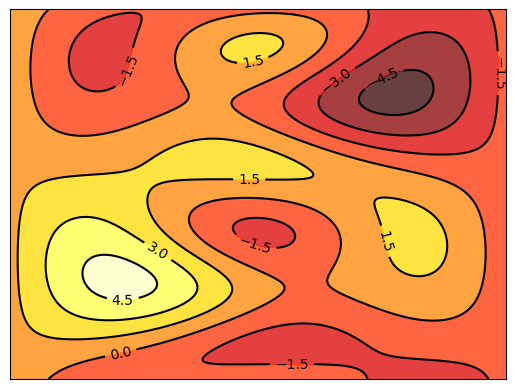

In [93]:
#contour plot of spin function
n = 256
x = np.linspace(0, np.pi, n)
y = np.linspace(0, 2*np.pi, n)
X, Y = np.meshgrid(x, y)

plt.contourf(X, Y, vspin_func_slice(X, Y, a, d=5), 8, alpha=.75, cmap=plt.cm.hot)
C = plt.contour(X, Y, vspin_func_slice(X,Y, a, d=5), 8, colors='black')
plt.clabel(C, inline=1, fontsize=10)
plt.xticks([])
plt.yticks([])

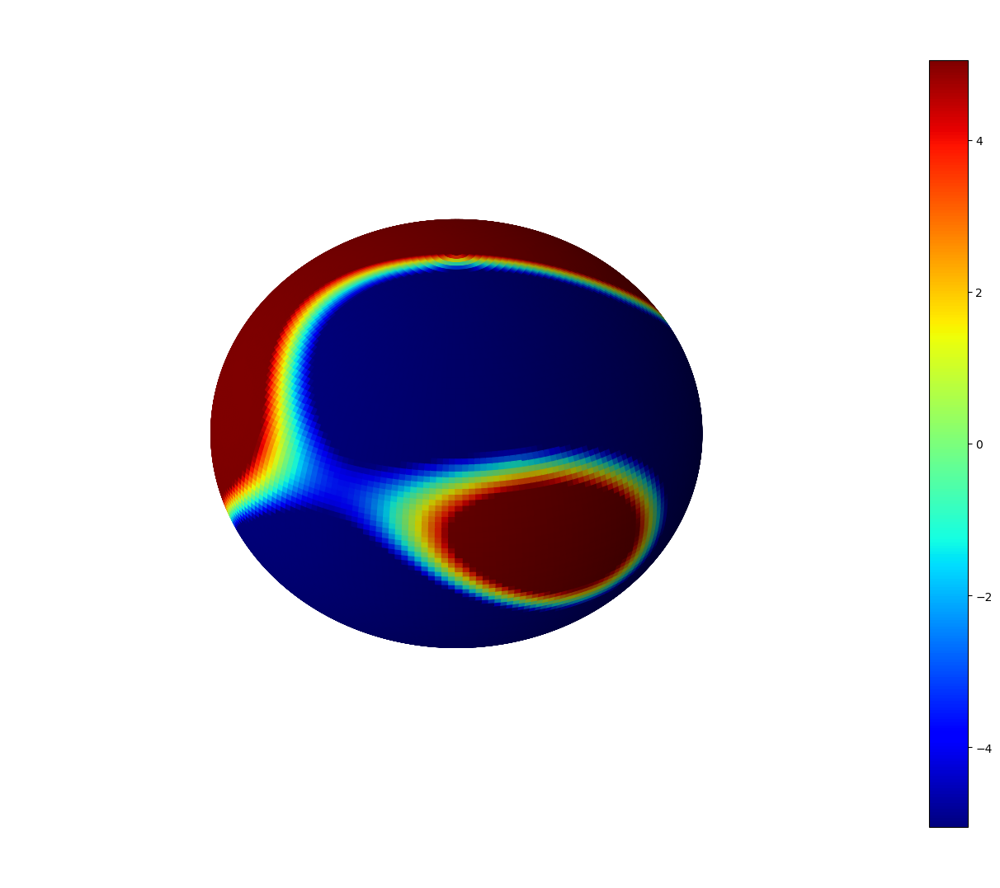

In [160]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import cm
from matplotlib import gridspec

def random_point(r=1):
    ct = 2 * np.random.rand() - 1
    st = np.sqrt(1 - ct**2)
    phi = 2 * np.pi * np.random.rand()
    x = r * st * np.cos(phi)
    y = r * st * np.sin(phi)
    z = r * ct
    return np.array([x, y, z])

def near(p, pntList, d0):
    cnt = 0
    for pj in pntList:
        dist = np.linalg.norm(p - pj)
        if dist < d0:
            cnt += 1 - dist / d0
    return cnt

pointList = np.array([random_point(10.05) for i in range(65)])

u = np.linspace(0, 2 * np.pi, 240)
v = np.linspace(0, np.pi, 120)

# Example value for d, assuming it's predefined
d = 5  # Set 'd' to an appropriate value

# Create the sphere surface
XX = np.sqrt(d) * np.outer(np.cos(u), np.sin(v))
YY = np.sqrt(d) * np.outer(np.sin(u), np.sin(v))
ZZ = np.sqrt(d) * np.outer(np.ones(np.size(u)), np.cos(v))

WW = XX.copy()
for i in range(len(XX)):
    for j in range(len(XX[0])):
        x = XX[i, j]
        y = YY[i, j]
        z = ZZ[i, j]
        WW[i, j] = spin_func(np.array([x, y, z, 0, 0]).reshape(1,5), a)

myheatmap = WW

# Create the figure with larger size
fig = plt.figure(figsize=(15, 15))

# Use gridspec to create a layout that allocates space for the plot and a smaller colorbar
gs = gridspec.GridSpec(1, 1)

# Create the 3D plot
ax = fig.add_subplot(gs[0], projection='3d')
ax.plot_surface(XX, YY, ZZ, cstride=1, rstride=1, facecolors=cm.jet(myheatmap))

# Create the colorbar with smaller size, both horizontally and vertically
m = cm.ScalarMappable(cmap=cm.jet)
m.set_array(myheatmap)

# Reduce the size of the colorbar vertically using `fraction` and `pad` arguments
cbar = fig.colorbar(m, ax=ax, fraction=0.04, pad=0.05)

# Optional: Hide the 3D plot axis
ax.set_axis_off()

# Save and show the plot
plt.savefig("/Users/pantelistassopoulos/Documents/texfiles/Summer-Research-2023/images/3d_spin_sphere_plot_d_5.png")
plt.show()


In [107]:
def neural_net_symm(x, c, z):
    """
    Compute the output of a symmetric neural network for given input and parameters.

    Parameters:
    x (np.ndarray): An input vector of shape (1, d).
    c (np.ndarray): Coefficients of the neural network with shape (1, n).
    z (np.ndarray): Weight matrix with shape (n, d).

    Returns:
    np.ndarray: The output of the symmetric neural network with shape (1, 1).
    """
    z = np.array(z)
    n = z.shape[0]
    d = z.shape[1]
    c = c.reshape(1,n)
    return 1/n*(np.exp(-x@z.T)@c.T).reshape(1,x.shape[0])

def neural_net_slice(X, Y, c, z, d = 5):
    """
    Compute the output of a symmetric neural network for given angles and parameters.

    Parameters:
    X (float): The first angle.
    Y (float): The second angle.
    c (np.ndarray): Coefficients of the neural network with shape (1, n).
    z (np.ndarray): Weight matrix with shape (n, d).
    d (int): The dimensionality of the input vectors (default is 5).

    Returns:
    np.ndarray: The output of the symmetric neural network with shape (1, 1).
    """
    x = np.sqrt(d)*np.array([np.sin(X)*np.cos(Y), np.sin(X)*np.sin(Y), np.cos(X),0, 0]).reshape(1,d)
    return neural_net_symm(x, c, z)
vneural_net_slice = np.vectorize(neural_net_slice)
vneural_net_slice.excluded.add(2)
vneural_net_slice.excluded.add(3)

In [108]:
def sample_uniform_sphere(r, d, n):
    """
    Generate random points uniformly distributed on the surface of a d-dimensional sphere with radius 'r'.

    Parameters:
    r (float): The radius of the sphere.
    d (int): The dimensionality of the sphere.
    n (int): The number of points to generate.

    Returns:
    np.ndarray: An array of shape (n, d) containing 'n' random points sampled uniformly on the sphere's surface.
    """
    s = np.random.multivariate_normal(np.zeros(d), np.diag(np.ones(d)), n)
    norm = np.sqrt(np.diag(s@s.T)).reshape(n,1)
    result = r*s/norm
    return result

In [109]:
#Training
def train(d = 5, n = 16, Dt = 1e3, steps = int(2*1e5)):
    """
    Train a neural network with symmetric architecture on a given spin system.

    Parameters:
    d (int): The dimensionality of the spin system (default is 5).
    n (int): The number of neural network units (default is 16).
    Dt (float): Time step for training (default is 1e3).
    steps (int): The number of training steps (default is 200,000).

    Returns:
    tuple: A tuple containing the trained neural network coefficients 'c', the weight matrix 'z',
           and an array of loss values during training.
    """
    
    #initialise parameters
    c = np.random.uniform(-40*d**2, 40*d**2, n).reshape(1,n)
    z = sample_uniform_sphere(np.sqrt(d), d, n).reshape(n,d)
    L = np.zeros(n).reshape(n,1)
    P = int(1e2)
    x = sample_uniform_sphere(np.sqrt(d), d, P).reshape(P,d)
    losses = np.zeros(steps)
    #update step
    for step in trange(steps):
        grad = grad_spin_func(z,a)
        exp = np.exp(-z@z.T)
        #sample points on sphere        
        #exp_x = np.exp(-x@z.T)
        loss = 0.5*np.mean((spin_func(x,a)-neural_net_symm(x,c,z))**2)
        #loss1 = -1/n*c@spin_func(z, a).T+0.5*1/n**2*c@exp@c.T
        #neural_net_symm(z,c,z)
        c_next = c + (spin_func(z, a)-1/n*c@exp)*Dt 
        z_next = z + (c.T*grad+1/n*(c.T*exp)@(c.T*z))*Dt
        #c_next = c + (spin_func(x, a)@exp_x-1/n*c@exp_x.T@exp_x)*Dt/P
        #z_next = z + ((c.T*exp_x.T)@(spin_func(x, a).T*x)-1/n*(c.T*exp_x.T@((exp_x@c.T)*x)))*Dt/P

        #c_next = c + (spin_func(z, a)@exp-1/n*c@exp.T@exp)*Dt/n
        #z_next = z + ((c.T*exp.T)@(spin_func(z, a).T*z)+1/n*(c.T*exp.T@((exp@c.T)*z)))*Dt/n-L*z*Dt
        z_next = z_next*np.sqrt(d)/(np.linalg.norm(z_next, axis = 1).reshape(n,1)+1e-100)
        #L_next = L - (np.linalg.norm(z_next, axis = 1).reshape(n,1)-np.sqrt(d)*np.ones(n).reshape(n,1))*Dt
        z = z_next
        c = c_next
        #L = L_next
                
        losses[step] = loss
        print('loss: {}'.format(loss))
                
    return c,z, losses

In [173]:
#Training
def train_SGD(d = 5, n = 16, Dt = 1e3, steps = int(2*1e5)):
    """
    Train a neural network with symmetric architecture on a given spin system using Stochastic Gradient Descent (SGD).

    Parameters:
    d (int): The dimensionality of the spin system (default is 5).
    n (int): The number of neural network units (default is 16).
    Dt (float): Time step for training (default is 1e3).
    steps (int): The number of training steps (default is 200,000).

    Returns:
    tuple: A tuple containing the trained neural network coefficients 'c', the weight matrix 'z',
           and an array of loss values during training.
    """
    
    #initialise parameters
    c = np.random.uniform(-40*d**2, 40*d**2, n).reshape(1,n)
    z = sample_uniform_sphere(np.sqrt(d), d, n).reshape(n,d)
    losses = np.zeros(steps)
    
    
    #update step
    for step in trange(steps):
        grad = grad_spin_func(z,a)
        exp = np.exp(-z@z.T)
        #sample points on sphere
        P = int(1e2)
        x = sample_uniform_sphere(np.sqrt(d), d, P).reshape(P,d)
        exp_x = np.exp(-x@z.T)

        loss = 0.5*np.mean((spin_func(x,a)-neural_net_symm(x,c,z))**2)
        #c_next = c + neural_net_symm(z,(-spin_func(x, a)+neural_net_symm(x,c,z))/P, x).reshape(1,n)*Dt/n
        #z_next = z + ((neural_net_symm(x,c,z)-spin_func(x,a))*(exp_x*c).T)@x*Dt/n*P
        
        
        c_next = c + (spin_func(x, a)@exp_x-1/n*c@exp_x.T@exp_x)*Dt/P
        z_next = z + (-(c.T*exp_x.T)@(spin_func(x, a).T*x)+1/n*(c.T*exp_x.T@((exp_x@c.T)*x)))*Dt/P
        z_next = z_next*np.sqrt(d)/np.linalg.norm(z_next, axis = 1).reshape(n,1)
        z = z_next
        c = c_next
        
        losses[step] = loss
        print('loss: {}'.format(loss))
                
    return c,z, losses

In [174]:
#Training with Nesterov accelerated gd
def nesterov_train_stochastic(d = 5, n = 16, Dt = 1e3, r = 3, k = 1, steps = int(2*1e5)):
    """
    Train a neural network with symmetric architecture on a given spin system using Nesterov's accelerated gradient descent.

    Parameters:
    d (int): The dimensionality of the spin system (default is 5).
    n (int): The number of neural network units (default is 16).
    Dt (float): Time step for training (default is 1e3).
    r (int): The number of steps for Nesterov's acceleration (default is 3).
    steps (int): The number of training steps (default is 200,000).

    Returns:
    tuple: A tuple containing the trained neural network coefficients 'c', the weight matrix 'z',
           and an array of loss values during training.
    """
    
    #initialise parameters
    c = np.random.uniform(-40*d**2, 40*d**2, n).reshape(1,n)
    z = sample_uniform_sphere(np.sqrt(d), d, n).reshape(n,d)
    c_change = c
    z_change = z
    
    
    losses = np.zeros(steps)
    #update step
    for step in trange(steps):
        grad = grad_spin_func(z_change,a)
        exp = np.exp(-z_change@z_change.T)
        #sample points on sphere
        P = int(1e2)
        x = sample_uniform_sphere(np.sqrt(d), d, P).reshape(P,d)
        exp_x = np.exp(-x@z_change.T)
        
        loss = 0.5*np.mean((spin_func(x,a)-neural_net_symm(x,c,z))**2)    
        
        c1 = c
        z1 = z
        
        c_next = c_change + (spin_func(x, a)@exp_x-1/n*c_change@exp_x.T@exp_x)*Dt/P
        z_next = z_change + (-(c_change.T*exp_x.T)@(spin_func(x, a).T*x)+1/n*(c_change.T*exp_x.T@((exp_x@c_change.T)*x)))*Dt/P
        #z_next = z_change + ((c_change.T*exp_x.T)@(spin_func(x, a).T*x)\
        #                     -1/n*(c_change.T*exp_x.T@((exp_x@c_change.T)*x)))*Dt/P
        z_next = z_next*np.sqrt(d)/(np.linalg.norm(z_next, axis = 1).reshape(n,1)+1e-100)
                
        
        c_change = c_next + k*(c_next-c1)
        z_change = z_next + k*(z_next-z1)
        z = z_next
        c = c_next
        
        
        losses[step] = loss
        print('loss: {}'.format(loss))
        
        
    return c,z, losses

In [112]:
#Training with Nesterov accelerated gd
def nesterov_train_deterministic(d = 5, n = 16, Dt = 1e3, r = 3, steps = int(2*1e5)):
    """
    Train a neural network with symmetric architecture on a given spin system using Nesterov's accelerated gradient descent.

    Parameters:
    d (int): The dimensionality of the spin system (default is 5).
    n (int): The number of neural network units (default is 16).
    Dt (float): Time step for training (default is 1e3).
    r (int): The number of steps for Nesterov's acceleration (default is 3).
    steps (int): The number of training steps (default is 200,000).

    Returns:
    tuple: A tuple containing the trained neural network coefficients 'c', the weight matrix 'z',
           and an array of loss values during training.
    """
    #initialise parameters
    c = np.random.uniform(-40*d**2, 40*d**2, n).reshape(1,n)
    z = sample_uniform_sphere(np.sqrt(d), d, n).reshape(n,d)
    c_change = c
    z_change = z

    losses = np.zeros(steps)
    #update step
    for step in trange(1,steps+1):
        grad = grad_spin_func(z_change,a)
        exp = np.exp(-z_change@z_change.T)
        #sample points on sphere
        P = int(1e2)
        x = sample_uniform_sphere(np.sqrt(d), d, P).reshape(P,d)

        loss = 0.5*np.mean((spin_func(x,a)-neural_net_symm(x,c,z))**2)

        c1 = c
        z1 = z
        
        c_next = c_change + (spin_func(z_change, a)@exp-1/n*c@exp.T@exp)*Dt/P
        z_next = z_change + ((c_change.T*exp.T)@(spin_func(z_change, a).T*z_change)\
                      -1/n*(c_change.T*exp.T@((exp@c_change.T)*z_change)))*Dt/P
        z_next = z_next*np.sqrt(d)/np.linalg.norm(z_next, axis = 1).reshape(n,1)

        c_change = c_next + 0.1*(c_next-c1)
        z_change = z_next + 0.1*(z_next-z1)
        z = z_next
        c = c_next

        losses[step-1] = loss
        print('loss: {}'.format(loss))
            
    return c,z, losses

In [175]:
def train_MaSS(d = 3, n = 256, steps = int(5*1e3), Dt = 1e-3, tolerance = 1e-2):
    
    #initialise parameters
    c = np.random.uniform(-40*d**2, 40*d**2, n).reshape(1,n)
    z = sample_uniform_sphere(np.sqrt(d), d, n).reshape(n,d)
    losses = np.zeros(steps)
    
    u = c
    v = z
    count = 1
    
    for step in trange(steps):
        
        grad = grad_spin_func(v,a)
        exp = np.exp(-v@v.T)
        #sample points on sphere
        P = int(1e2)
        x = sample_uniform_sphere(np.sqrt(d), d, P).reshape(P,d)
        exp_x = np.exp(-x@v.T)

        loss = 0.5*np.mean((spin_func(x,a)-neural_net_symm(x,c,z))**2)
        
        dc = -(spin_func(x, a)@exp_x-1/n*u@exp_x.T@exp_x)/P
        dz = -(-(u.T*exp_x.T)@(spin_func(x, a).T*x)+1/n*(u.T*exp_x.T@((exp_x@u.T)*x)))/P
        
        m = 10
        eta2 = Dt/m
        
        c_new = u - Dt*dc
        z_new = v - Dt*dz
        
        u = c_new + (count-1)/(count+2)*(c_new-c) + eta2*dc
        v = z_new + (count-1)/(count+2)*(z_new-z) + eta2*dz

        if (dc@(c_new-c).T)[0]+(dz*(z_new-z)).sum()>0: 
            count = 1
        
        c = c_new
        z = z_new
        
        count +=1
        losses[step] = loss
        print('loss: {}'.format(loss))
    
    
    return c,z,losses

In [176]:
#contour plot of neural net reconstruction
c_mass,z_mass,losses_mass = train_MaSS(d = 5, n = 256, Dt = 1e-8, steps = int(1*1e5))

  0%|          | 0/100000 [00:00<?, ?it/s]

loss: 177026.4928379273
loss: 99828.03808948156
loss: 79843.38358690152
loss: 64871.57816398176
loss: 51977.19633954184
loss: 45693.447415476505
loss: 35533.7326893454
loss: 20348.40175247946
loss: 24263.022270512734
loss: 18593.952426308137
loss: 15174.775693015612
loss: 13325.987024455613
loss: 10599.171317080662
loss: 12134.15636713458
loss: 9466.449443590092
loss: 9299.64395997448
loss: 10304.924862664211
loss: 6527.447168223184
loss: 7547.877322589213
loss: 6684.291707955393
loss: 6839.944931085766
loss: 6435.668371029642
loss: 6545.097345795491
loss: 3883.525627580364
loss: 3873.1528333659026
loss: 3805.243748910993
loss: 2789.372000327344
loss: 4493.829447143475
loss: 3887.3781617132336
loss: 2854.322005666045
loss: 3014.251659480106
loss: 2587.4471999169054
loss: 2788.9336911003775
loss: 2849.9323550785643
loss: 2498.4425867399355
loss: 2508.0751623888077
loss: 2109.1040479380426
loss: 1997.0865102418784
loss: 1828.4103648945932
loss: 1715.7167253425525
loss: 1479.6599231210305

loss: 20.31638220236877
loss: 26.03413492855215
loss: 24.484438621944772
loss: 29.55993083533723
loss: 23.683669346051875
loss: 31.37786641366589
loss: 31.55975946310053
loss: 24.51313102261908
loss: 27.99769647423554
loss: 27.99897656027847
loss: 26.751630573952717
loss: 26.18502159270258
loss: 30.59668147822084
loss: 24.596102928238448
loss: 23.761247213221246
loss: 25.16045386498951
loss: 22.05346165160282
loss: 28.085903497699874
loss: 26.99941441978654
loss: 27.42239517611879
loss: 23.877413759742243
loss: 22.40900963451584
loss: 24.757583381583324
loss: 21.965898466020782
loss: 23.16986409903159
loss: 24.757437159360602
loss: 27.726532293712612
loss: 24.111812678490445
loss: 28.047075318674448
loss: 23.92771465021684
loss: 25.971334328331565
loss: 29.36849983732296
loss: 25.526297221704613
loss: 28.9179162282143
loss: 28.17397247896865
loss: 30.392407271657284
loss: 24.093306186479627
loss: 25.57133865492345
loss: 20.49692293264932
loss: 21.59691565242711
loss: 27.849381144847356

loss: 17.070992381410043
loss: 22.54296183742265
loss: 17.305687978821837
loss: 18.039015372932425
loss: 16.72193250212541
loss: 16.974462643237597
loss: 15.749306931785554
loss: 21.382156439928096
loss: 18.814967715055605
loss: 14.335352971651139
loss: 19.909604718177153
loss: 19.449530225015884
loss: 21.147547290861326
loss: 18.5439089441584
loss: 22.602667593805812
loss: 19.959535867757683
loss: 17.32962092626301
loss: 21.163438101580056
loss: 16.835904807691133
loss: 17.406798232689585
loss: 22.22251209839907
loss: 18.66528500383816
loss: 20.836918099837845
loss: 20.594120040817508
loss: 19.161855844932507
loss: 20.376351054897235
loss: 22.7752575188493
loss: 16.122332378463803
loss: 14.20375633513499
loss: 17.88011369974833
loss: 19.957049209663545
loss: 16.35144156558889
loss: 18.763369609779055
loss: 26.030583355328126
loss: 16.988000049579476
loss: 18.741822060617068
loss: 17.620567246948863
loss: 19.921725080083327
loss: 20.630494232588504
loss: 18.181407581888557
loss: 19.504

loss: 14.518451611749484
loss: 16.945413167565167
loss: 19.760775456554324
loss: 11.11409839236596
loss: 11.724206988500995
loss: 13.323055773520837
loss: 17.767412492898814
loss: 10.96196467411379
loss: 12.80389130723456
loss: 13.738962469788794
loss: 17.044316852244837
loss: 10.12867044159096
loss: 11.122999882558572
loss: 14.001027163617978
loss: 12.832632835977545
loss: 15.40960309579036
loss: 12.822162778680333
loss: 16.521292680383144
loss: 14.988759987457131
loss: 14.304641762298553
loss: 10.742328548511587
loss: 12.474309457288834
loss: 14.745909550275776
loss: 13.844329106257875
loss: 13.70847583491338
loss: 14.978563096025699
loss: 12.57379454020838
loss: 13.930709780455272
loss: 16.95328682073033
loss: 13.476473674292913
loss: 16.343696257865933
loss: 12.060784220492627
loss: 14.102235905762619
loss: 15.818856896518769
loss: 16.76772845095978
loss: 16.97815543105557
loss: 14.690599153608243
loss: 10.523699531686457
loss: 17.045150980041548
loss: 14.48772496147182
loss: 14.69

loss: 13.220499816813222
loss: 11.904914334985529
loss: 11.589563660307402
loss: 13.658172156611434
loss: 11.74494584457556
loss: 12.388959862915582
loss: 14.079457204378539
loss: 13.363782447491678
loss: 12.245076286363103
loss: 14.69111440553723
loss: 13.95544786105607
loss: 11.290640539957613
loss: 10.767840161102768
loss: 9.429350969910587
loss: 10.982778398123473
loss: 13.226495906005761
loss: 8.233459073337269
loss: 11.847200895574622
loss: 11.24906765740484
loss: 10.698637681834724
loss: 10.50087462594965
loss: 10.809749941532164
loss: 12.913746751822254
loss: 12.294235637320613
loss: 12.969392506085432
loss: 11.123034968965074
loss: 9.650333330564452
loss: 13.165730050149115
loss: 11.805496098853077
loss: 12.865926903849706
loss: 16.47589458031363
loss: 12.996335070526703
loss: 14.345651860744345
loss: 12.043866775044878
loss: 10.028129620366101
loss: 10.8892196926009
loss: 9.416743640373507
loss: 14.160928732803368
loss: 12.07305556424509
loss: 11.45427988424148
loss: 13.31945

loss: 10.840109818607717
loss: 13.622099898851607
loss: 13.81666608599368
loss: 9.458273571553928
loss: 11.064596258571482
loss: 14.013224180562718
loss: 13.605582091540871
loss: 9.113521865463419
loss: 8.709458523105972
loss: 11.516043684986535
loss: 8.545937575916467
loss: 13.900444082319886
loss: 9.55094115207749
loss: 12.46783799854095
loss: 11.809783018094386
loss: 10.491580880009973
loss: 9.342788613458918
loss: 9.036264489078167
loss: 10.888963490760593
loss: 10.569040408404383
loss: 9.429518931805479
loss: 10.241138572967357
loss: 10.35691892886248
loss: 11.63444801216138
loss: 11.104259742852282
loss: 8.797610389086762
loss: 11.126609470694753
loss: 10.515534810278904
loss: 11.659950004362877
loss: 10.890339529702432
loss: 10.368539063322382
loss: 9.445029780283573
loss: 13.060144486044228
loss: 10.77555692207738
loss: 9.425422003115626
loss: 13.496074484393885
loss: 11.277349487524816
loss: 11.649827737296784
loss: 11.59846853246291
loss: 7.856733224119488
loss: 11.1957847421

loss: 7.423746841843476
loss: 6.03350311332284
loss: 7.5145197124976315
loss: 10.425484432817502
loss: 8.93830393564279
loss: 6.487048746332152
loss: 8.453615976290067
loss: 10.536984877984118
loss: 7.55174370115783
loss: 7.814831145915132
loss: 9.013705374050316
loss: 7.224966169115699
loss: 9.948184510069389
loss: 8.338630720447634
loss: 12.572109938779622
loss: 10.163021712208476
loss: 6.468233076201566
loss: 8.670511351084617
loss: 9.837477577075274
loss: 9.467366929624616
loss: 7.651040367715576
loss: 10.256592814692347
loss: 8.51275552057586
loss: 7.991527101910993
loss: 7.547496161448818
loss: 9.818548421608567
loss: 7.971001815180455
loss: 8.866331956991123
loss: 6.731833406218389
loss: 7.243148002440268
loss: 8.547089022276994
loss: 8.070115523593069
loss: 8.606018399694898
loss: 7.348020470703721
loss: 7.839882168238043
loss: 8.695922491455333
loss: 8.754956940390613
loss: 8.733222464012725
loss: 8.700662264046816
loss: 9.795033091726685
loss: 7.924751131477717
loss: 9.141584

loss: 8.26952718866487
loss: 8.687490224750057
loss: 6.420071073684816
loss: 8.600907987304447
loss: 8.324841621709686
loss: 10.257444463285731
loss: 9.009127995225928
loss: 7.889758691142671
loss: 7.700218197046071
loss: 9.678703361987372
loss: 6.8270161177698165
loss: 8.53253444102982
loss: 6.969933044227895
loss: 7.717135734943064
loss: 7.542813694265434
loss: 7.260917246867575
loss: 7.466858002137699
loss: 8.420272936942172
loss: 7.411375237327867
loss: 9.256764960387757
loss: 9.822475168856174
loss: 9.350373870377299
loss: 8.058458443033642
loss: 9.051197407174893
loss: 8.033483249572265
loss: 6.9386975136757245
loss: 8.158870295052182
loss: 8.304286471496814
loss: 7.463927970494856
loss: 7.587533600065412
loss: 10.197603667377209
loss: 7.269792852519725
loss: 5.275759873658129
loss: 8.633103417815335
loss: 7.990615444983393
loss: 8.262593910837703
loss: 7.076042007038633
loss: 8.110952166060322
loss: 5.570007401714726
loss: 7.231559738772602
loss: 6.800000893146964
loss: 8.267173

loss: 7.9804037885184735
loss: 7.27918768619544
loss: 7.843278927702298
loss: 5.3474667850305755
loss: 7.234411544130606
loss: 6.864070785716738
loss: 7.49726743018634
loss: 6.858399021836798
loss: 6.728562689987302
loss: 8.145757768933414
loss: 4.702477724900876
loss: 7.933354252137646
loss: 6.6377500606976865
loss: 6.454665158369353
loss: 6.352803034656339
loss: 6.5756757646112
loss: 6.568628811308121
loss: 7.340257766563711
loss: 6.359063390682463
loss: 7.7528546176034885
loss: 6.220685224160451
loss: 5.3841012668634605
loss: 7.494757612221146
loss: 7.70235611719903
loss: 6.097606761863749
loss: 6.363559306627962
loss: 4.779615373923137
loss: 6.839103358999511
loss: 5.5416293598245145
loss: 8.342521688918872
loss: 7.004846678737136
loss: 6.514972363049096
loss: 5.395127745429547
loss: 5.738388566080172
loss: 7.828881993047523
loss: 7.386172575009669
loss: 7.897306625506816
loss: 7.183188887027008
loss: 7.490106170946608
loss: 7.275944532587209
loss: 7.722715802100273
loss: 8.9050576

loss: 5.841899398048987
loss: 5.172116711758292
loss: 6.9338536548446905
loss: 7.20013175813416
loss: 6.461576745774207
loss: 6.915836489005647
loss: 5.018242054148561
loss: 5.931679759272172
loss: 5.819705571927955
loss: 7.828164768107881
loss: 5.7941261840765605
loss: 5.948395216397313
loss: 6.710458429290399
loss: 6.207279196134765
loss: 6.542214671644145
loss: 6.59988557506332
loss: 7.057024704689933
loss: 6.3866382163076585
loss: 8.427568186933085
loss: 5.959234733714819
loss: 9.555777642633123
loss: 6.009206677250771
loss: 6.605922843524967
loss: 7.353211126199776
loss: 6.183849884711935
loss: 5.831917858234494
loss: 5.327977678254342
loss: 5.011148169684971
loss: 6.060937293157266
loss: 5.541055126369444
loss: 6.180612464219126
loss: 5.924886392411034
loss: 4.477942640472123
loss: 5.331091612685718
loss: 6.536860342350062
loss: 5.584538531170413
loss: 6.744991806287725
loss: 6.668857179983457
loss: 6.432583045270163
loss: 5.138666182693356
loss: 5.369433161762653
loss: 5.1701722

loss: 6.3608595680267275
loss: 6.676809806992642
loss: 6.048355381241712
loss: 5.463844947637999
loss: 5.19575066418316
loss: 6.1561063893670065
loss: 5.7680333238356045
loss: 5.67026642155109
loss: 5.47688933703869
loss: 5.178613693347885
loss: 5.0970276086572595
loss: 7.169585067713057
loss: 5.6620524814398365
loss: 6.733374899181116
loss: 6.900691889589844
loss: 6.918925581955052
loss: 6.6570907562056565
loss: 6.894226072961198
loss: 6.77352623931682
loss: 6.200039504578166
loss: 4.986925161186638
loss: 6.694472067233639
loss: 6.0739432377904725
loss: 5.9790663336789365
loss: 5.119108816319801
loss: 7.096820007912859
loss: 6.024062521465212
loss: 5.096784896903882
loss: 5.355142474284613
loss: 5.32720730990915
loss: 6.150787165933981
loss: 6.050969097091871
loss: 5.0546610286604645
loss: 5.822537615691616
loss: 6.830016175673318
loss: 7.1802032794859905
loss: 6.671475293647564
loss: 5.882724210536469
loss: 5.521029788944593
loss: 5.7954320222480105
loss: 5.473821839134604
loss: 6.31

loss: 5.798310392025583
loss: 4.559765733855084
loss: 6.381118773666938
loss: 4.944404199215284
loss: 5.32226958174291
loss: 4.457763026954679
loss: 4.132699798058391
loss: 4.935879786304287
loss: 5.383767931637104
loss: 7.790686689246861
loss: 5.789238729763655
loss: 5.412978768782364
loss: 5.676851042142682
loss: 5.1591181536366175
loss: 6.0487809500703635
loss: 5.189918366587607
loss: 5.0885067639403925
loss: 5.34047296102165
loss: 4.37365611888734
loss: 5.82082924126188
loss: 4.9711184535791055
loss: 5.262830609146989
loss: 4.361737636789197
loss: 5.128336710492017
loss: 5.446166439543466
loss: 5.523569635648041
loss: 5.772517045835169
loss: 5.208651765495721
loss: 4.577593541842894
loss: 5.724921246010243
loss: 5.832342429228426
loss: 5.53159092601734
loss: 6.013214305901634
loss: 5.0481273861691855
loss: 4.97541208252336
loss: 4.9013638923077325
loss: 4.7028197682069885
loss: 5.526010718947277
loss: 6.439219072152084
loss: 4.115341089130745
loss: 5.042750767590433
loss: 4.5600472

loss: 4.683804979082859
loss: 4.707878535705562
loss: 4.163083178395405
loss: 4.313996327633861
loss: 3.771978427501905
loss: 3.3040939315728144
loss: 4.574551409043116
loss: 5.132236174955157
loss: 7.14476659429424
loss: 4.469176081106756
loss: 4.050751156005609
loss: 5.330455863721097
loss: 4.681282659576776
loss: 5.740799011953291
loss: 4.589767673402991
loss: 5.624813429527443
loss: 5.475419242046318
loss: 5.010048314629912
loss: 4.57818142844366
loss: 5.7298808187739905
loss: 4.483751368322632
loss: 4.357082073241758
loss: 4.229840764421514
loss: 3.7135965094301158
loss: 4.137494705661795
loss: 4.839259638614809
loss: 5.20871844397984
loss: 4.253236233618463
loss: 4.490006211011081
loss: 4.566974859630417
loss: 4.027188712163256
loss: 4.201767212863035
loss: 5.528032161446923
loss: 4.512434742074458
loss: 4.507063240560513
loss: 4.04592148816705
loss: 4.883287095872541
loss: 4.037881568695677
loss: 4.386582892202221
loss: 4.769161360446933
loss: 4.008333732378595
loss: 3.197142232

loss: 4.823507649976154
loss: 3.6584368872667232
loss: 5.034539559267893
loss: 5.177291602826883
loss: 4.205011262611301
loss: 3.3493231593130592
loss: 4.508679037826224
loss: 4.571716601818025
loss: 4.591430293901077
loss: 3.8919165323295157
loss: 4.000384622276834
loss: 3.947148618096155
loss: 4.968371342563109
loss: 3.604158990913995
loss: 3.8098565897518895
loss: 2.7012213729072854
loss: 4.581737909274456
loss: 4.26234020962529
loss: 4.150073904865564
loss: 4.549479346456983
loss: 3.768312243829444
loss: 3.562913694230799
loss: 4.669041596334622
loss: 3.6153114600979848
loss: 3.8503711873629505
loss: 3.1049828107127366
loss: 3.9843519536679786
loss: 3.6723017520882166
loss: 3.9405613994291584
loss: 3.463736876609263
loss: 4.240191624342592
loss: 3.6109490738073475
loss: 4.3048383532280425
loss: 3.9870497389778086
loss: 4.381688289888595
loss: 3.999937520738828
loss: 3.6098240028195225
loss: 3.217872777449975
loss: 4.149465061885876
loss: 3.3667708270470076
loss: 3.660230159860274
l

loss: 4.109874671644729
loss: 4.544320337893886
loss: 4.290090608815173
loss: 4.174544770515734
loss: 3.895229104546026
loss: 4.494324617452644
loss: 4.923312572662935
loss: 3.189992116846911
loss: 3.2813076138523085
loss: 3.2456898777595997
loss: 3.3845733937648568
loss: 3.1815479460059364
loss: 3.7765857456697076
loss: 3.467460930780668
loss: 3.2264138436639573
loss: 4.782987093062373
loss: 4.6048537914838015
loss: 3.7635696467548847
loss: 4.669359048218677
loss: 4.210084542737083
loss: 3.5824013858935704
loss: 3.018086851532247
loss: 3.7334720891734507
loss: 4.5431706662327835
loss: 3.3732200330512616
loss: 3.258353821405699
loss: 3.9574927946096055
loss: 5.161579427709535
loss: 4.650324000838217
loss: 4.402495470814333
loss: 4.293438111515937
loss: 3.2783412733454935
loss: 3.7114865843821234
loss: 3.18049626483715
loss: 3.6661268756937773
loss: 5.115738669658176
loss: 4.18116917929891
loss: 4.441386852708956
loss: 4.7421183280981
loss: 3.636777310170537
loss: 5.234541496087705
loss

loss: 3.432004678291004
loss: 3.3402976923189196
loss: 3.8334921279237064
loss: 3.2608348430984533
loss: 3.3922708522880765
loss: 3.7875511486394515
loss: 3.3221567990209873
loss: 3.0463047319893395
loss: 3.2121763935716414
loss: 3.5161751951946565
loss: 4.153500144107144
loss: 2.92521458029061
loss: 3.914662822342078
loss: 3.577990020821216
loss: 3.506394617259918
loss: 4.211238374773426
loss: 3.7787354603691243
loss: 3.5334234064765777
loss: 3.250305284058549
loss: 4.013235582733554
loss: 3.7616055074290258
loss: 4.478498345292196
loss: 2.8602538940736393
loss: 4.676594737567134
loss: 3.944433933109812
loss: 3.702495482348884
loss: 4.480603095206569
loss: 3.5799390605719945
loss: 3.281180152767773
loss: 3.92804975477117
loss: 3.2324411519261904
loss: 4.000170834286936
loss: 3.467066359423834
loss: 3.4006611451418136
loss: 3.1717714543780033
loss: 4.233020033732634
loss: 3.590296862241047
loss: 3.7462068589125868
loss: 3.7653660836982725
loss: 4.704646246866712
loss: 3.598227402410376

loss: 3.814327626272101
loss: 3.1382647252239395
loss: 4.17675243482306
loss: 3.1463862404832765
loss: 2.793475454890637
loss: 3.562461687905505
loss: 3.648991359872839
loss: 3.5135809942897738
loss: 3.9154281343153783
loss: 3.68480247891627
loss: 2.6279447285058044
loss: 3.051557819486876
loss: 2.967270043190901
loss: 2.832471524001548
loss: 3.492991910277283
loss: 3.1600346975430744
loss: 3.5958158383826198
loss: 3.0776919300577004
loss: 2.991124767849943
loss: 4.339624179477538
loss: 2.6667869911030384
loss: 2.9210321541630457
loss: 3.478487836944132
loss: 3.1110178313417935
loss: 3.2789701196210252
loss: 4.131293468197006
loss: 2.8033503742983736
loss: 3.6125969479291102
loss: 3.9170213618260616
loss: 4.0489286213331335
loss: 3.368246587025808
loss: 2.958305960138389
loss: 2.462783042911816
loss: 2.8962545691377737
loss: 2.775616785449641
loss: 3.0718645164310443
loss: 2.9843624704826524
loss: 3.750654229793188
loss: 2.4404678059454437
loss: 2.8637324474676236
loss: 3.1579159425045

loss: 3.0869352248690785
loss: 3.4308228363726476
loss: 2.9818176808732524
loss: 3.538116689555572
loss: 2.7553439157460127
loss: 3.001942916861166
loss: 3.2856684592842966
loss: 3.903002583034748
loss: 3.6110466168369855
loss: 2.590568673291374
loss: 2.736613226741225
loss: 2.9879870073792483
loss: 2.7266395742826246
loss: 3.0607003645139894
loss: 3.3045630794423806
loss: 3.1518643422167396
loss: 3.1689772440101955
loss: 3.0204370218653764
loss: 3.5124137785869602
loss: 2.4632578015892594
loss: 3.118274217897147
loss: 3.908625738709432
loss: 2.607989730983316
loss: 3.1719657889624875
loss: 2.474863330590484
loss: 3.3080540859378447
loss: 3.5118960830774966
loss: 2.7426241484949565
loss: 2.5527250236629935
loss: 3.1149952950713917
loss: 3.352352790980859
loss: 3.7983756199674086
loss: 3.5561983425141492
loss: 3.0809936755424676
loss: 3.8036802471817084
loss: 3.598950786419875
loss: 3.5997417807226832
loss: 3.0933713115859427
loss: 3.446807103970428
loss: 3.068965419766849
loss: 3.50388

loss: 2.9068919618399605
loss: 2.8742584611045787
loss: 3.2003715537348847
loss: 3.8538699494176485
loss: 3.592014758368287
loss: 2.454111566608979
loss: 2.507024929034635
loss: 2.943284890883325
loss: 3.417414506637998
loss: 3.3915829629981027
loss: 2.388593948087441
loss: 2.906629648836823
loss: 3.32276762723196
loss: 3.137363131099982
loss: 3.3630577363053624
loss: 2.988923714654986
loss: 2.531136295127758
loss: 2.949929474442955
loss: 3.1777083639256434
loss: 3.1911380488042003
loss: 2.7029657938034335
loss: 3.1923549589008604
loss: 2.85253279846404
loss: 2.4463178930719183
loss: 3.259794115934133
loss: 2.799710202872017
loss: 2.5837074761713144
loss: 3.302587582286888
loss: 2.9581263176132193
loss: 2.607340060617154
loss: 3.0412086921824653
loss: 2.307732831027482
loss: 4.0980003958063005
loss: 3.0929034963886077
loss: 2.439468023188997
loss: 3.489927986590933
loss: 2.963642433790403
loss: 3.862008583428473
loss: 3.1189094662942325
loss: 2.9633868122501474
loss: 2.8044827833602075

loss: 2.1640150582393334
loss: 2.6337301602852246
loss: 2.740799836756329
loss: 2.8680910402233946
loss: 2.596266851972842
loss: 2.6699731147468655
loss: 2.3560143939101157
loss: 3.223051326416096
loss: 3.8213096213421687
loss: 2.978803341163705
loss: 3.5688256710593524
loss: 3.1692597197886916
loss: 2.5085110515332003
loss: 3.1779133836877196
loss: 3.0074537508843258
loss: 2.892317960070742
loss: 3.437513841178884
loss: 2.225914635479196
loss: 2.635175517648342
loss: 2.5654972604612523
loss: 2.16469045648409
loss: 3.1345563464960806
loss: 2.8466447540770035
loss: 2.4363629366193056
loss: 1.942700243247273
loss: 2.6727700637959857
loss: 3.015879668704211
loss: 3.160447842653202
loss: 2.5468533652078666
loss: 2.847212610821294
loss: 3.015253828623482
loss: 2.8923678652694385
loss: 3.0580960229860166
loss: 2.897872120631896
loss: 3.099540859249455
loss: 2.6958624382940304
loss: 3.604341325983317
loss: 2.7378285164688076
loss: 2.604134625725999
loss: 2.7650669018875487
loss: 2.46866470209

loss: 3.0477070882681767
loss: 2.867181409605028
loss: 2.3509147462905915
loss: 2.7612294579918837
loss: 2.7042796358180374
loss: 3.1822273060618835
loss: 3.191437848503789
loss: 2.6382801963898697
loss: 2.6914497468346745
loss: 2.6799508383380686
loss: 2.090975906014326
loss: 1.8387628566208798
loss: 2.7665055626723927
loss: 2.603521322731762
loss: 2.462063171343426
loss: 2.187759896909218
loss: 2.1725936127920944
loss: 2.691647786797487
loss: 2.4232136725729934
loss: 1.8521581226501775
loss: 2.435317410333711
loss: 2.515750226604452
loss: 2.536230827227804
loss: 3.1161226433530045
loss: 2.728009918919372
loss: 2.84774752732881
loss: 2.640844292147499
loss: 2.6525190552263496
loss: 2.3090338085002586
loss: 2.404662214276713
loss: 2.425983691447783
loss: 2.7391945095544754
loss: 2.997553461191634
loss: 2.9009515668686507
loss: 2.2593989556879643
loss: 3.19104509060911
loss: 2.036990159350173
loss: 2.575508792338312
loss: 2.775054076468221
loss: 2.4069920883530065
loss: 2.68012702531236

loss: 2.9311952212073242
loss: 3.029448407362629
loss: 2.8427513369960122
loss: 2.8626766702849893
loss: 2.616651268468033
loss: 2.2070201474557765
loss: 2.3828663512707924
loss: 2.32030750380742
loss: 2.5528297287486286
loss: 2.333373622662622
loss: 2.94233919069259
loss: 2.232382374916779
loss: 2.607451043853963
loss: 2.9448210324109625
loss: 2.7207738147794345
loss: 2.8030027722644304
loss: 2.7464198423876804
loss: 2.8189262145790037
loss: 3.105428016365875
loss: 2.7864628489936423
loss: 2.7670004812807116
loss: 2.591397857985342
loss: 2.3895819914508585
loss: 1.9550981990798129
loss: 2.298525611262038
loss: 2.5914235199306392
loss: 2.9758335612456754
loss: 2.1909649212079083
loss: 1.9938456934703752
loss: 3.108885645568496
loss: 3.1514749888706994
loss: 3.01073081894494
loss: 2.418148855082934
loss: 2.4183277876715605
loss: 3.036526842743115
loss: 2.9643919139025248
loss: 2.6427909543733215
loss: 2.548125422645874
loss: 2.6059607127485847
loss: 3.1454327225094803
loss: 2.7265935991

loss: 2.87323055480153
loss: 2.8473871914717392
loss: 2.339132165361444
loss: 2.4590148179415934
loss: 2.4262927042317957
loss: 2.7374475316035403
loss: 2.4215969787576124
loss: 2.933087896314074
loss: 2.318317987859327
loss: 2.2698526023482084
loss: 1.9099243625121949
loss: 2.0885604160721543
loss: 2.677165891641343
loss: 2.6847675711948376
loss: 1.939803610318237
loss: 2.4888579525987824
loss: 2.555097849332521
loss: 2.3663547762846764
loss: 1.9826415709394185
loss: 2.7398137525662194
loss: 2.790753112177849
loss: 2.3358174794544624
loss: 2.4138635487966527
loss: 2.1352101933307863
loss: 2.2402151236390195
loss: 2.6480681073058805
loss: 1.8450500272641266
loss: 2.310769958546791
loss: 2.4579537303104617
loss: 2.4922699915296955
loss: 2.376680978184911
loss: 2.5676638762502826
loss: 2.65689859549928
loss: 2.0462022008206517
loss: 2.5620143160143285
loss: 2.1667579377017243
loss: 2.640464735625074
loss: 1.9390451125706707
loss: 3.0407595889880956
loss: 2.490101794462732
loss: 1.8099281

loss: 2.135895690530622
loss: 2.449721169373618
loss: 2.0044400455681948
loss: 2.4107459085410894
loss: 1.8963394721184077
loss: 1.924319180157512
loss: 2.5874653786900477
loss: 2.0119594128386016
loss: 2.1949032323904953
loss: 2.765543997960985
loss: 2.224950245972929
loss: 2.1688561211915554
loss: 2.0610537488189764
loss: 2.2522395796904657
loss: 2.2789960244277134
loss: 2.29568816391201
loss: 2.0230532499080316
loss: 2.1755369205748973
loss: 2.2945416214175687
loss: 2.531088480478121
loss: 2.5614943905913043
loss: 2.3840800754857416
loss: 1.6187990421558485
loss: 2.295843590362687
loss: 2.801685001500222
loss: 2.850498632155198
loss: 2.388560969264129
loss: 2.438570504848405
loss: 2.3445731526061833
loss: 2.0705923517157747
loss: 2.3089524130405708
loss: 2.399832017371005
loss: 2.4988317304332512
loss: 1.8877352151298359
loss: 2.2837533587571563
loss: 1.947511144014987
loss: 2.466489568021755
loss: 2.5373900150954434
loss: 2.541292149395564
loss: 2.5821994718249006
loss: 2.056390942

loss: 2.0963801028499525
loss: 2.1180363469511967
loss: 2.441840138078727
loss: 2.387493948748558
loss: 2.4745909542845492
loss: 2.668212259480884
loss: 2.5334264152330435
loss: 2.5388081064878913
loss: 2.069075856790358
loss: 2.4940169491831052
loss: 2.2200989358716536
loss: 2.0218030087167738
loss: 1.9242492087513328
loss: 2.303715712123525
loss: 2.078405211334124
loss: 2.013134039132402
loss: 2.2796370159793913
loss: 1.8586704054823582
loss: 1.8421351474583563
loss: 2.2160230885377805
loss: 2.349640766228417
loss: 2.4961347284693556
loss: 2.358655647685401
loss: 2.099374916141436
loss: 2.3880723792701004
loss: 2.1899024764945225
loss: 2.194220954636927
loss: 2.077149197500988
loss: 2.3911149144419497
loss: 2.553536034333122
loss: 2.2647160709611085
loss: 1.8805010160974833
loss: 2.34811111981072
loss: 1.7701095880303712
loss: 2.298153689281188
loss: 2.3691894140793726
loss: 2.0079653283608594
loss: 2.4465964998442917
loss: 2.420747053971479
loss: 1.8954714570972435
loss: 2.242526326

loss: 2.0797306784914795
loss: 2.342826363486944
loss: 1.9752907548433851
loss: 2.2616641749238577
loss: 1.98827478239604
loss: 2.3700175011185762
loss: 2.167434661400432
loss: 2.0224277397011887
loss: 1.6454587663138864
loss: 2.0438266775780347
loss: 2.9703315953332288
loss: 2.008470843544761
loss: 2.173911451014043
loss: 2.1364848142592514
loss: 2.984211819214338
loss: 2.359943090570623
loss: 1.982967121999971
loss: 1.551461660205615
loss: 2.049402323134256
loss: 2.1478802140244553
loss: 2.1598242104271366
loss: 2.1721128558985114
loss: 2.3295789652462897
loss: 2.6270394636872902
loss: 2.1247654140714296
loss: 1.86488774826528
loss: 2.4441589560619037
loss: 2.327186117067841
loss: 1.7222781813865478
loss: 2.3560022142385555
loss: 2.1479781993450713
loss: 2.858075788510139
loss: 2.3447176033284394
loss: 1.6253044833216226
loss: 2.466315797594193
loss: 2.323907098139912
loss: 2.2889111928554815
loss: 1.9498320494715375
loss: 2.2621435794169535
loss: 2.3741687069679585
loss: 1.518258059

loss: 2.1994529587840876
loss: 1.8122517296723952
loss: 2.353250128710322
loss: 2.0295166814712338
loss: 2.1959498151532246
loss: 2.047857103936831
loss: 2.073517554173112
loss: 2.3684207345760764
loss: 1.7550881112548506
loss: 2.0559663838106177
loss: 2.509321086369407
loss: 2.2696012534497587
loss: 1.8586060653096377
loss: 2.154293169386732
loss: 2.2265675070413447
loss: 2.1698462845305313
loss: 2.29923743725995
loss: 2.6007280232989127
loss: 2.178837304038309
loss: 2.12507898978081
loss: 2.306905222072561
loss: 2.648353087032469
loss: 1.5688234214545054
loss: 2.327956593984004
loss: 2.369676988814586
loss: 2.16115139854842
loss: 1.9929628830281996
loss: 2.3903493615379063
loss: 2.348518025216969
loss: 2.128870650777571
loss: 2.1554095146140755
loss: 2.4907139604562922
loss: 2.1789974135310866
loss: 1.8392092020167388
loss: 2.0687541416561017
loss: 1.7580930362735874
loss: 1.8811405173622868
loss: 2.641984668983615
loss: 2.1511721166191053
loss: 2.0129639367590637
loss: 2.33983940477

loss: 2.358219302296904
loss: 3.0660037955187067
loss: 2.118693012084955
loss: 1.7657444069450747
loss: 1.6725149174544918
loss: 2.0407998917302015
loss: 2.13914483497854
loss: 1.9531814063601396
loss: 2.2544334669011987
loss: 2.0710875024341266
loss: 1.8352621754686984
loss: 2.058596247883688
loss: 1.8274348075129354
loss: 2.2206428794084334
loss: 2.037142347704772
loss: 1.7571266038050115
loss: 2.0255145495701923
loss: 2.1072440485819133
loss: 2.0620662767705813
loss: 2.2003494611328405
loss: 2.163548051123085
loss: 1.893670349330226
loss: 2.0348999048039826
loss: 1.9183489631000281
loss: 1.6106855031646716
loss: 2.244722150441641
loss: 2.081087497284006
loss: 1.7770622145212616
loss: 2.219571834199733
loss: 2.380118655708924
loss: 1.5821029781255402
loss: 2.5600660574259035
loss: 2.2850632406531797
loss: 2.138315751258049
loss: 1.8641832417356983
loss: 2.018386074908647
loss: 2.1103782156676583
loss: 2.0269276344875378
loss: 1.9902924071758485
loss: 1.6968101501300115
loss: 2.120525

loss: 1.7639685461646493
loss: 1.9009447327982898
loss: 1.6758251847877796
loss: 2.021902879990682
loss: 1.9042374239175794
loss: 1.9866324883693107
loss: 1.9398277102819415
loss: 2.0258670469445885
loss: 1.8825907971725768
loss: 2.210676568895396
loss: 1.7071029839899767
loss: 1.929667183122223
loss: 2.2467665869160536
loss: 1.9893116712354373
loss: 1.9796942849201324
loss: 1.8875264843575414
loss: 1.8588595362625724
loss: 1.6513817722293949
loss: 2.382785247882189
loss: 1.9314704759073669
loss: 2.1484644786038674
loss: 1.9998982516025325
loss: 2.0473278714785055
loss: 2.1407759474588786
loss: 1.7284413099008344
loss: 2.2184147408883397
loss: 1.5716830095828889
loss: 1.9418289501307993
loss: 1.664242500861229
loss: 2.1524416590097393
loss: 2.067357836266307
loss: 2.2334716143483226
loss: 2.064184748098344
loss: 3.0734037530677742
loss: 2.6507752084113947
loss: 1.9973039751400856
loss: 2.5491462072002853
loss: 1.7755331679616213
loss: 1.9990293403058133
loss: 2.2822274473045483
loss: 2

loss: 1.6168255527787587
loss: 2.0410841031065496
loss: 2.168557477704665
loss: 2.6749783927031867
loss: 2.0556005536770026
loss: 1.5489169664183955
loss: 2.1284327102969303
loss: 1.9882102868538098
loss: 1.8544520275060654
loss: 2.2086396411011053
loss: 2.0414183199811338
loss: 2.333409417809348
loss: 2.46295051332838
loss: 2.2993015163269055
loss: 1.9483826775447703
loss: 1.9113606817200426
loss: 2.493991943382269
loss: 1.6231515970760901
loss: 2.1685523921733694
loss: 1.4732656611715769
loss: 1.709366546468779
loss: 2.3793570632484533
loss: 1.6723150390628923
loss: 2.1419687220338215
loss: 2.054120811582222
loss: 1.9151518187008683
loss: 1.593189148026751
loss: 1.5652181881597322
loss: 1.8708110898508232
loss: 1.8400133843104778
loss: 1.8142624653819754
loss: 1.9719766468142654
loss: 1.6260890654222626
loss: 1.7771516944933894
loss: 2.252917427908089
loss: 1.7515992939209633
loss: 1.969212427149272
loss: 1.9213251331057168
loss: 1.8587568021691214
loss: 2.302929685871446
loss: 1.653

loss: 1.8808005405545962
loss: 1.937524401911204
loss: 1.3817009995983596
loss: 1.6968990828759154
loss: 2.10722723432092
loss: 1.9560691335793825
loss: 1.8557599273281136
loss: 2.378944214142643
loss: 1.846265163561404
loss: 2.3688759720371384
loss: 1.8978569312089117
loss: 1.9326064976528199
loss: 2.065721127957018
loss: 1.8135607733448493
loss: 2.370334006753313
loss: 2.0550182176241973
loss: 1.900014682308326
loss: 2.0820575053970725
loss: 2.4273046810187675
loss: 1.539828622952937
loss: 1.7055933507776195
loss: 1.727993052158168
loss: 2.1259305078641297
loss: 1.417834014784145
loss: 1.710496679758693
loss: 1.3354583279153274
loss: 1.6311597425641498
loss: 1.9558396453960825
loss: 2.198066431874922
loss: 1.8266812135267712
loss: 1.90501540209662
loss: 1.9505743658625647
loss: 1.7171199972141864
loss: 2.094587619099528
loss: 1.8408161939629877
loss: 1.4373723233777427
loss: 1.532616688338619
loss: 2.1971024944548354
loss: 2.011464187908961
loss: 2.0187698222604253
loss: 2.1936099780

loss: 1.80464802384716
loss: 2.011425131901178
loss: 1.4750066902422705
loss: 1.9230125791945434
loss: 1.5189445046408068
loss: 2.0866646474861845
loss: 1.8762319882946972
loss: 1.8955419763062205
loss: 1.6312666115062606
loss: 1.618836446617997
loss: 2.070795946153872
loss: 2.062320727797728
loss: 1.7401274864557834
loss: 2.2916519964048576
loss: 1.9881548905092714
loss: 2.1971881569975364
loss: 2.250054669561986
loss: 1.899702947313972
loss: 2.1747649347709266
loss: 2.077181031473524
loss: 2.264418127937534
loss: 1.7029267864511928
loss: 1.7198825610205486
loss: 1.8680037008374841
loss: 1.8130784701896037
loss: 2.032198012830146
loss: 1.9396701251329052
loss: 2.308584787015876
loss: 1.4631204931762383
loss: 1.4734918441593774
loss: 1.595345956953924
loss: 1.7898381335538387
loss: 1.4854298422627539
loss: 1.6350218060509223
loss: 1.9453472800063834
loss: 2.127307511654611
loss: 2.052166007349634
loss: 1.6610139021846306
loss: 1.8203959741357831
loss: 1.909354429189644
loss: 1.41715588

loss: 1.7583842748429828
loss: 1.7753690612335173
loss: 1.6820483918058642
loss: 1.6894173691058907
loss: 1.7273192784059779
loss: 1.8803534099625079
loss: 1.547740551194873
loss: 2.004299846400949
loss: 1.4869456502191465
loss: 2.665428716267499
loss: 2.0921210117244105
loss: 1.7217752512807751
loss: 1.7165954903326692
loss: 1.5969117088570133
loss: 1.8296369329344802
loss: 1.7929808296902414
loss: 2.073751290664158
loss: 2.020024943007193
loss: 1.5900966873471984
loss: 1.1736101895472393
loss: 1.8919136524113238
loss: 1.4264462925653825
loss: 1.798953600546565
loss: 1.6376282890286524
loss: 1.8210883980879096
loss: 1.4872338803554757
loss: 1.7790076398403991
loss: 1.9362735171236602
loss: 1.4245519880984638
loss: 1.397480034626975
loss: 2.0907054175394206
loss: 1.9794633133046444
loss: 1.7910024006397796
loss: 1.5480043258192324
loss: 1.5866751144779234
loss: 1.4383175319399009
loss: 1.6598392797752206
loss: 1.7973721592422953
loss: 1.721598428431316
loss: 1.782614059132802
loss: 1.6

loss: 1.5909782584129735
loss: 1.4104389414930214
loss: 2.0012448182363722
loss: 1.0856888594668632
loss: 1.6763362019016288
loss: 1.5785133988203381
loss: 1.731843363493562
loss: 1.9534391662063895
loss: 1.317647171502731
loss: 1.7897857693641828
loss: 1.709776610887543
loss: 1.6313704509285143
loss: 1.4916746736700108
loss: 1.5923896209364878
loss: 1.9228911299943336
loss: 2.009410816197536
loss: 1.5632673459812023
loss: 1.5769800435499806
loss: 2.1193997486598075
loss: 1.6476920506884682
loss: 1.7214804949122648
loss: 1.41730766667666
loss: 1.744117665404087
loss: 1.5832886090989788
loss: 1.9449435721055353
loss: 2.0778323390477436
loss: 1.767820182337428
loss: 1.9439328324744634
loss: 1.6946541525045375
loss: 2.121767562688426
loss: 1.8956679974806507
loss: 1.539813135910886
loss: 1.676703478144674
loss: 2.1235095562842403
loss: 1.7231632742531307
loss: 1.7824325318180936
loss: 1.5976901925961022
loss: 1.2008783204123363
loss: 1.4226482746913656
loss: 1.5764044890245001
loss: 1.945

loss: 1.4976232420908944
loss: 1.4394646298436047
loss: 1.5895482582141451
loss: 2.021363808082038
loss: 2.050715033971436
loss: 1.574897934252991
loss: 1.793601599126029
loss: 1.8678593769341094
loss: 1.626644768269305
loss: 1.8407275595353707
loss: 1.449553245256574
loss: 1.9981072090756735
loss: 1.452191175711912
loss: 1.658397589743204
loss: 1.4673942531774342
loss: 1.4915117367671076
loss: 1.357839650138742
loss: 1.948623631136175
loss: 1.9390151402011728
loss: 2.039279546727467
loss: 1.9665918155996358
loss: 2.0715825661775815
loss: 1.3750339218840886
loss: 1.688930816070975
loss: 1.3645396396947573
loss: 1.3852362434301577
loss: 1.6735040265522145
loss: 1.2352291342132802
loss: 1.8611597368081165
loss: 2.028266689177378
loss: 1.6137316417604435
loss: 1.8430318484664792
loss: 1.3777142173977526
loss: 1.811061285892814
loss: 1.7866979882306837
loss: 2.010515115123466
loss: 1.6639269524971672
loss: 1.8888379806387092
loss: 1.3723683807887672
loss: 1.8894435562478222
loss: 1.9576723

loss: 1.555017127729692
loss: 1.4807189500833096
loss: 1.4486216298190855
loss: 1.3944967784324243
loss: 1.3242464362800588
loss: 1.4529830813432036
loss: 1.7936296529223228
loss: 1.6177652177136286
loss: 2.053617114844034
loss: 1.4089739533128571
loss: 1.5465180907245872
loss: 1.6549549840505795
loss: 1.490780781295606
loss: 1.9773904774041815
loss: 2.101537632879116
loss: 1.6489458121796494
loss: 1.4799297521022456
loss: 1.152325632895607
loss: 1.7099175772072024
loss: 1.345847958641203
loss: 1.6503698386734562
loss: 1.458524685041892
loss: 1.2531011686773028
loss: 1.6950789288720105
loss: 1.6252520253451175
loss: 1.5958499283084893
loss: 1.818279934772693
loss: 1.8632442324234506
loss: 2.015386565590892
loss: 1.9170620943831818
loss: 1.675920547273645
loss: 1.6921269980617046
loss: 1.3544011894883914
loss: 1.433450509224074
loss: 1.3711795644463252
loss: 1.6486759877771844
loss: 1.4741079835329571
loss: 1.6003640025217774
loss: 1.6581231804606111
loss: 1.5068541742693882
loss: 1.896

loss: 1.6659492413080033
loss: 1.271610920782817
loss: 1.470191131225304
loss: 1.639714890862176
loss: 1.7436234743450476
loss: 1.868329475000388
loss: 1.4098259562022541
loss: 1.3712115616727072
loss: 1.5696927595385852
loss: 1.3217642373151377
loss: 1.9634355730250177
loss: 1.6116678025529645
loss: 1.3915983374840615
loss: 1.5610696514919848
loss: 1.5156178253112162
loss: 1.2990396826096302
loss: 1.4853737568676342
loss: 1.6392514127270992
loss: 1.5881951999576485
loss: 1.7775190927048103
loss: 1.8634009766503743
loss: 1.91940484241782
loss: 1.8040999610766664
loss: 1.1728133904105817
loss: 1.2184011821619354
loss: 1.5204513894405058
loss: 1.3765020490801023
loss: 1.4391780645260703
loss: 1.8885044662099668
loss: 1.4462097597971764
loss: 1.335656897677336
loss: 1.2378380335977321
loss: 1.5944634841107304
loss: 1.2714548048445278
loss: 1.7773033807571812
loss: 1.8533496617064762
loss: 1.3171884950352537
loss: 1.397395613928699
loss: 1.8388744864342987
loss: 1.288856206986062
loss: 1.2

loss: 1.4488719897481923
loss: 1.5430725157105436
loss: 1.8528452003430098
loss: 1.5107928011656433
loss: 1.8594400506614617
loss: 1.5412820542338548
loss: 1.711202749223171
loss: 1.3975919527782263
loss: 1.6865973059621675
loss: 1.498660513988169
loss: 1.6688139926513526
loss: 1.5944023704399592
loss: 1.692717793425591
loss: 2.1453012536188862
loss: 1.724348480093136
loss: 1.6881698757911576
loss: 1.765150579682529
loss: 1.4713516809981118
loss: 1.4598268506710184
loss: 1.7947183036650147
loss: 1.9397399688224908
loss: 1.578199803087278
loss: 1.4629318729804215
loss: 1.4924648286878925
loss: 1.6598900533167182
loss: 1.9425739134828968
loss: 1.6254784473869903
loss: 1.5430511786034722
loss: 1.5593268610243316
loss: 1.3432498340636494
loss: 1.9175740609835683
loss: 1.480924833761027
loss: 1.2752175033955424
loss: 1.6124868399402141
loss: 1.467358010897506
loss: 1.5148622819353545
loss: 1.4295105357904316
loss: 1.7443273243531212
loss: 1.6171267589999727
loss: 1.2573611978031718
loss: 1.

loss: 1.5605547652634684
loss: 1.7389546335147268
loss: 1.4697252154971492
loss: 1.5797272361363153
loss: 1.6659218627840486
loss: 1.6376038807361095
loss: 1.52666641518541
loss: 1.3941036682325167
loss: 1.1433783716320958
loss: 1.3941490484187933
loss: 1.5057915541128768
loss: 1.1632141046764477
loss: 1.596410636585553
loss: 1.3395838984644723
loss: 1.5372446449442239
loss: 1.511407591083885
loss: 1.4880384249128247
loss: 1.4928556029670021
loss: 1.5817076827683751
loss: 1.316336823962673
loss: 1.6246886042024742
loss: 1.62408693485725
loss: 1.5438106586403404
loss: 1.4797347714401872
loss: 1.5042877993852732
loss: 1.2234662169455073
loss: 1.2117810337751105
loss: 1.579840026295532
loss: 1.1606073068682792
loss: 1.770355533931619
loss: 1.4337709182211722
loss: 1.7721358019887654
loss: 1.4378674239789728
loss: 1.3685457293333456
loss: 1.85099895065092
loss: 1.705058087922973
loss: 1.148912203285289
loss: 1.404017267041338
loss: 1.7706365397751154
loss: 1.5245050216962943
loss: 1.047568

loss: 1.0700381050599905
loss: 1.6371566570716822
loss: 1.7334975687149028
loss: 1.1138637518293808
loss: 1.1622694391995543
loss: 1.331971167790976
loss: 1.19653208740429
loss: 1.3256170462045278
loss: 1.2811854438592993
loss: 1.319397826141712
loss: 1.2596086580809827
loss: 1.3044413288811956
loss: 1.482412395818445
loss: 1.0173409382635876
loss: 1.2185896307239992
loss: 1.5685702689275494
loss: 1.6574975729141972
loss: 1.1511635026012312
loss: 1.7380091220280856
loss: 1.2713944073085874
loss: 1.3616435781753333
loss: 1.5554016323130408
loss: 1.586437726367385
loss: 1.2818002206289438
loss: 1.3476930269807428
loss: 1.4764443847744324
loss: 1.3354062721679376
loss: 1.210874630368736
loss: 1.3311035037985877
loss: 1.4752406364434938
loss: 1.4128066737396232
loss: 1.8028476983859165
loss: 1.6454217208588755
loss: 1.74628801808458
loss: 1.6721590091872875
loss: 1.6151944035604888
loss: 1.229625736699282
loss: 1.5255419494959224
loss: 1.3458621398940713
loss: 1.4024232031233488
loss: 1.37

loss: 1.3002463112072733
loss: 1.2097034185086482
loss: 1.6703467389707745
loss: 1.5263988258737655
loss: 1.577437969079186
loss: 1.330504598253237
loss: 1.6541349690984135
loss: 1.3257640473417625
loss: 1.6671900084275881
loss: 1.2166507440163716
loss: 1.2935851858035574
loss: 1.3990053291317956
loss: 1.307201542179179
loss: 1.9250656912836626
loss: 1.258773051013822
loss: 1.4314644272058168
loss: 1.5236564299478945
loss: 1.2279549901772377
loss: 1.2631460561708021
loss: 1.795494418650533
loss: 1.2835600402772054
loss: 1.0654749306382387
loss: 1.4979182553847317
loss: 1.541070222985076
loss: 1.615425533856439
loss: 1.6576763737400975
loss: 1.3878620874138867
loss: 1.5142828709971652
loss: 1.830551748223873
loss: 1.3798411761996514
loss: 1.6077980017656612
loss: 1.3483489350987896
loss: 1.3660008059664364
loss: 1.6130570012737868
loss: 1.2066534140157337
loss: 1.5890723485078189
loss: 1.7198181696907868
loss: 1.3468388068900023
loss: 0.9224867831184143
loss: 1.2439244520888912
loss: 1.

loss: 1.5870263745967221
loss: 1.243464288601079
loss: 1.0495556627409446
loss: 1.0129709779617517
loss: 1.4162346871411953
loss: 1.3515577574740048
loss: 1.4360562244636967
loss: 1.3243908617084532
loss: 1.2109943953790892
loss: 1.3535018834244037
loss: 2.0316076576325917
loss: 1.3444278594556922
loss: 1.3659355484710338
loss: 1.2567971536387241
loss: 1.5750705088632535
loss: 1.586365237464194
loss: 1.4509276676629468
loss: 1.6042828007579424
loss: 1.7825084738444068
loss: 1.2961105046056896
loss: 1.475756318488548
loss: 1.3378708306753415
loss: 1.5014630268425067
loss: 1.452105887073344
loss: 1.2208862650506604
loss: 2.079287584881565
loss: 1.3197671999596856
loss: 1.3833347271678988
loss: 1.5745463580437105
loss: 1.276787109788083
loss: 1.211332499000105
loss: 1.1717809066502882
loss: 1.4304439021050246
loss: 1.4326408880411219
loss: 1.2140451401002375
loss: 1.1135351484095528
loss: 1.2496882454221705
loss: 1.2672151975719077
loss: 1.4303327620334358
loss: 1.2873163697782013
loss: 1

loss: 1.4024331679816504
loss: 0.9156108789272074
loss: 1.403248466539001
loss: 1.0063483679389489
loss: 1.3684133572057429
loss: 1.2395903780884827
loss: 1.4634353839008667
loss: 1.2982635610394373
loss: 1.4190218958178769
loss: 1.2740078249511402
loss: 1.4397185559962313
loss: 1.2228500208898774
loss: 1.4896181603641734
loss: 0.8673036198427999
loss: 1.4498755763738922
loss: 1.4092347857984213
loss: 1.663574326289241
loss: 1.5477710648601908
loss: 1.379171395580075
loss: 1.6014268296446272
loss: 1.4491601807997112
loss: 1.1865478125883775
loss: 1.9683138597313228
loss: 1.6203864795217482
loss: 1.2622564783789125
loss: 1.4445033793767212
loss: 1.641990442780106
loss: 1.5119440646078635
loss: 1.5700673640116185
loss: 1.1921573819867408
loss: 1.371914929118596
loss: 1.4826117130605923
loss: 1.5525721272916178
loss: 1.238265967528281
loss: 1.3427766746112977
loss: 1.234639780376942
loss: 1.198649413923625
loss: 0.9458859104106108
loss: 1.423942186507237
loss: 1.4372726245299128
loss: 1.4

loss: 1.515461713997293
loss: 1.3354879366373282
loss: 1.291311968335412
loss: 1.654644518911626
loss: 1.444072119269249
loss: 1.6427387386862762
loss: 1.4429442492498876
loss: 1.3198051581424368
loss: 1.500126227923679
loss: 1.0496375101823001
loss: 1.4415699034005058
loss: 1.405506362358025
loss: 1.580466684663267
loss: 1.5017133505853726
loss: 1.7311867312300464
loss: 1.4614550301433598
loss: 1.3498103864512783
loss: 1.305325622111006
loss: 1.1653593224784289
loss: 1.2972473454044828
loss: 1.301711505778971
loss: 1.4917301953571689
loss: 1.426695369765522
loss: 1.3767631279366632
loss: 1.4751359453073467
loss: 1.4688840721074996
loss: 1.5817163490436033
loss: 1.112905248097433
loss: 1.0218990661699088
loss: 1.2669129792058786
loss: 1.3350428534831746
loss: 1.7342917740297952
loss: 1.4791083225669148
loss: 1.0681028703362305
loss: 1.4268896933595707
loss: 1.1718222423717102
loss: 1.307037249218391
loss: 1.5435881501558155
loss: 1.1582369472119005
loss: 1.307739395807966
loss: 1.31760

loss: 1.3608338584054909
loss: 1.2694758206779297
loss: 1.2993259475853245
loss: 1.1075882814618834
loss: 1.0876772101603889
loss: 1.172732439857592
loss: 1.311602856251686
loss: 1.3764011159536533
loss: 1.649546846777519
loss: 1.2617627744954183
loss: 1.366820858857843
loss: 1.2882781153318825
loss: 1.5873223652714783
loss: 1.3810563726443292
loss: 1.258438524768065
loss: 1.709324881002937
loss: 1.129597747719727
loss: 1.5865778846537275
loss: 1.3284288225325178
loss: 1.1930742405872354
loss: 1.5138413087511737
loss: 1.457966801600457
loss: 1.2428950779191787
loss: 1.2793616525674534
loss: 1.2941697789525821
loss: 1.1597135728491885
loss: 1.1798663500550841
loss: 1.4953474641131663
loss: 1.4332033363871681
loss: 1.5763679212833128
loss: 1.7021910520048553
loss: 1.1493706236659258
loss: 1.260595660546993
loss: 1.3283899729913957
loss: 1.3048228804493147
loss: 1.204412798118403
loss: 1.1106177492974936
loss: 1.3396723778058166
loss: 1.4426730630015185
loss: 1.131302098723453
loss: 1.349

loss: 1.7056707166788585
loss: 0.8360377488733025
loss: 1.0273077739000342
loss: 1.079694760663603
loss: 1.2056217075862563
loss: 1.34232144577559
loss: 1.2746258963602783
loss: 1.19222678596297
loss: 1.0999152143196254
loss: 1.348165621870033
loss: 1.5136783535993583
loss: 1.0530127090463197
loss: 1.044703596797153
loss: 1.0712527920630028
loss: 1.1279313006295022
loss: 1.3455056654865882
loss: 1.5645541704494539
loss: 1.1488683478815316
loss: 1.5467141543615965
loss: 1.3085833493773493
loss: 1.1677147371595908
loss: 1.367412413321855
loss: 1.2133198000843262
loss: 1.2547449617922226
loss: 1.3364429438299172
loss: 1.2028123319286532
loss: 1.2105055931704083
loss: 1.2218291733393194
loss: 1.2150407354812818
loss: 1.1551850909393249
loss: 1.2276230006392368
loss: 1.4651555293396563
loss: 1.0676331496809022
loss: 0.8774902538899927
loss: 1.2430598641254504
loss: 1.3430334701812083
loss: 1.4583025409603212
loss: 1.239259566105016
loss: 1.1526108647833073
loss: 1.1542660433470449
loss: 1.0

loss: 1.2797582508445786
loss: 1.3881904448524052
loss: 1.0809873126980138
loss: 1.1569799181522924
loss: 1.2670826189073252
loss: 1.3471989055323963
loss: 1.1953151756805624
loss: 1.2686861653377135
loss: 1.1978844889135707
loss: 1.0725008326715362
loss: 1.1313552524355586
loss: 1.1115139507461878
loss: 1.2232822633706253
loss: 1.1397358660127734
loss: 1.0888508300256954
loss: 1.1679864096343002
loss: 1.0135848924657147
loss: 1.0745994423631975
loss: 1.439895483868234
loss: 1.4612574226152062
loss: 1.0476311331917705
loss: 1.060219799173695
loss: 0.9908400397189376
loss: 1.5675569220491934
loss: 1.3064165438844386
loss: 1.183472109624307
loss: 1.0584727461268637
loss: 1.1082402506499711
loss: 1.499004585568867
loss: 1.3613014176886364
loss: 1.8172382396543498
loss: 1.2844926967615264
loss: 1.402980350541779
loss: 1.4066036604372087
loss: 1.4615540663034592
loss: 1.0305065427467452
loss: 1.2877712132499277
loss: 1.1977694662805864
loss: 1.5260304374000269
loss: 0.9991159161255364
loss:

loss: 1.2615389558076986
loss: 0.9260312166024087
loss: 1.1947824489722532
loss: 1.1814541952044997
loss: 1.2787035019919897
loss: 1.2385288651710697
loss: 1.6313368470815826
loss: 1.165228703101382
loss: 1.1208978808648193
loss: 1.33463088373573
loss: 1.2709651104698265
loss: 0.9093953582412115
loss: 1.0826604401373696
loss: 0.9414174637737954
loss: 1.1307955397332343
loss: 1.2616239302598002
loss: 1.184849864458838
loss: 1.2231030254397601
loss: 1.3455769496489922
loss: 0.8569137231550888
loss: 1.4904522412081287
loss: 1.3063292842952328
loss: 1.3293313953790098
loss: 0.9971516150510824
loss: 1.3034519258198967
loss: 1.2705039280979158
loss: 2.0532646649866844
loss: 0.9856629639168711
loss: 1.0665234501500434
loss: 1.176210893497697
loss: 1.115836584621767
loss: 1.2994731499410193
loss: 1.3399028650523115
loss: 1.3863285979543902
loss: 0.9745898040828557
loss: 1.3198651484721997
loss: 1.007371630430439
loss: 1.3564662449589746
loss: 1.1209105205807348
loss: 1.374366586530997
loss: 1.

loss: 1.186739229824224
loss: 1.3057814209837684
loss: 1.3476121727332833
loss: 1.0727617105640121
loss: 1.398344679163503
loss: 1.2466367238335103
loss: 1.3782791482607741
loss: 1.129522615342049
loss: 1.0453551252201025
loss: 1.4838764090194645
loss: 1.1185242772361002
loss: 1.2821765145534174
loss: 1.053814499489566
loss: 1.0779018402243534
loss: 1.1571700608817124
loss: 1.0334577588350313
loss: 1.1417648596186707
loss: 1.144687889114502
loss: 1.021791365831894
loss: 1.1384696233950184
loss: 1.4936777707406645
loss: 1.2449357882345873
loss: 1.0849266154429482
loss: 0.9223946300595748
loss: 1.2826626209994825
loss: 1.2602998577738764
loss: 1.2731760684854456
loss: 1.2071337615324564
loss: 1.3376822278089275
loss: 1.1701598947365839
loss: 1.4031404495523814
loss: 1.3329655299418741
loss: 1.256215153266715
loss: 1.1333392768100952
loss: 1.2619232193494863
loss: 1.3580410458860592
loss: 1.0235269373936835
loss: 1.019563412777255
loss: 1.4175729708168965
loss: 1.3023375372453783
loss: 1.

loss: 1.1552594686838509
loss: 0.8842607595202042
loss: 1.245918347653028
loss: 1.1605039588641177
loss: 1.3579467174024602
loss: 1.5149409147120085
loss: 0.9491540749871133
loss: 1.4291000438292496
loss: 1.182538371146312
loss: 1.0822080361065074
loss: 1.0865654011994432
loss: 1.1639817649669606
loss: 0.9378292442095463
loss: 1.148861629797737
loss: 1.1937756630112333
loss: 1.1013856683870364
loss: 1.1753593418815442
loss: 1.3601133598140271
loss: 1.3592861941898318
loss: 1.3854313071166091
loss: 1.2001886664118737
loss: 1.2613012022076904
loss: 1.2978831401623376
loss: 1.3393560235480733
loss: 1.2564048293669126
loss: 1.1932562985008253
loss: 1.0355879927710194
loss: 1.2435575464307569
loss: 1.2116057257975423
loss: 1.17036418070782
loss: 1.4079296381878177
loss: 1.1022081855110384
loss: 1.3442618954724466
loss: 0.8228161026719382
loss: 1.2000581721344867
loss: 1.09465398291173
loss: 1.200457723006922
loss: 1.1951744647407807
loss: 1.0450108923955164
loss: 0.9917899717076589
loss: 1.

loss: 1.1661873852808633
loss: 1.1193476012380912
loss: 1.3009753604965126
loss: 0.9996916995908878
loss: 1.3873433695995456
loss: 1.051884230803111
loss: 1.2573961398387636
loss: 1.1027163433163292
loss: 1.020400928646722
loss: 1.1755529059405605
loss: 1.0004278280795018
loss: 0.9589147679713785
loss: 1.0541418185557834
loss: 1.131379910708636
loss: 1.0656342983227642
loss: 1.1043484000137227
loss: 0.8823014008590278
loss: 0.9940167480658637
loss: 1.39131405294851
loss: 0.8468421579254213
loss: 1.1266668064055998
loss: 1.1243354950674227
loss: 1.265316807278513
loss: 1.289203934545637
loss: 1.4250397823494154
loss: 1.1395751561518654
loss: 1.3338517407293642
loss: 1.0716907904886845
loss: 1.0702528404024536
loss: 1.2298432108498671
loss: 1.15856077720809
loss: 1.0559034309669755
loss: 1.1368419485053907
loss: 1.047976572392493
loss: 1.254189540653816
loss: 1.2458400357658173
loss: 1.313498867344965
loss: 1.1665104509343107
loss: 1.0889903728026042
loss: 1.08992043304865
loss: 1.363563

loss: 0.9864334435638834
loss: 1.181635508821163
loss: 1.2589365423261156
loss: 1.4034742896235153
loss: 1.1481922878377633
loss: 0.9896348365534934
loss: 1.3802655101228103
loss: 0.994179541945904
loss: 1.2225522103437056
loss: 0.9158104274478052
loss: 1.4207368652116454
loss: 1.4849554044457987
loss: 1.2886618992587549
loss: 1.3231182733120224
loss: 1.1817466420508946
loss: 1.2593734115208988
loss: 1.3054842936537066
loss: 1.6061686122026217
loss: 1.1595358270679064
loss: 1.2277295746126986
loss: 0.9529864451878354
loss: 1.182767958779593
loss: 1.3202153028630956
loss: 1.4132665665804347
loss: 1.0956908145782425
loss: 0.9463297376636608
loss: 1.079979027755689
loss: 0.9433005398590404
loss: 1.1202521687232865
loss: 0.9769859503235648
loss: 1.0862529952027782
loss: 1.1513850074747076
loss: 0.9569412665083671
loss: 1.0094254513966798
loss: 0.9793306335839747
loss: 1.4334172007349089
loss: 1.2526567533322819
loss: 1.037629862407603
loss: 1.073010511372189
loss: 1.65341546940167
loss: 0.

loss: 1.1342893333927284
loss: 1.2781808516927762
loss: 1.1303724636668775
loss: 1.0698831481764883
loss: 1.131645599139381
loss: 0.9641586610794894
loss: 1.1505402338648134
loss: 1.3707064334407695
loss: 1.053947798313455
loss: 1.0803666746324891
loss: 1.0797560186149826
loss: 0.8458669614215265
loss: 1.0319116702063098
loss: 1.1227359999865758
loss: 0.958080480004486
loss: 1.3046536439641363
loss: 1.0704070370658543
loss: 1.3645623493261276
loss: 1.1737763580403606
loss: 1.187054993574082
loss: 0.9596256259912505
loss: 1.089205101507281
loss: 1.0757687991839726
loss: 1.2140012909196067
loss: 1.032720028998925
loss: 1.0198854645349358
loss: 0.9565290702014191
loss: 1.2843482132360293
loss: 1.2043343249396128
loss: 1.2631936251522369
loss: 1.2948784515990783
loss: 1.255051044767768
loss: 0.7967655638054119
loss: 0.9824143406699574
loss: 1.3336561461920087
loss: 0.9604843389313664
loss: 1.3072019009965279
loss: 0.6853589486926487
loss: 1.0118412904833778
loss: 1.0008210859945372
loss: 1

loss: 1.066423518580274
loss: 1.1087351332456832
loss: 1.4236868374415113
loss: 1.1920074456723169
loss: 1.191883743751233
loss: 1.0360458075566863
loss: 1.0766433173080443
loss: 1.1463341166817052
loss: 1.1024104326723974
loss: 1.00163865814364
loss: 0.9844555778886845
loss: 1.2418223917244324
loss: 1.1892718780862277
loss: 1.1412509411671847
loss: 1.2325086396914975
loss: 1.3853746194909937
loss: 1.1198820990103153
loss: 0.867958239864599
loss: 1.0799502427021281
loss: 1.2584498147421508
loss: 1.2102685799732174
loss: 1.010013093003909
loss: 1.2262341058121549
loss: 1.2416862743754897
loss: 0.9490447021927298
loss: 0.9835153564257563
loss: 1.130366506960585
loss: 0.9766321900700283
loss: 0.8240960643874631
loss: 1.0420810755050482
loss: 1.3358691401106777
loss: 1.211956733416181
loss: 1.0643921357870498
loss: 0.940389168850841
loss: 1.2654070818549834
loss: 1.4011515119319045
loss: 1.148235105017383
loss: 1.0564235343137258
loss: 1.009701481820426
loss: 1.2138252242694028
loss: 1.075

loss: 0.9666902817928168
loss: 1.3526656133055914
loss: 0.8006989374371775
loss: 1.3723895013340388
loss: 0.8602377284282651
loss: 1.0660730493496848
loss: 1.1407472629410842
loss: 1.1341300097589924
loss: 1.2277354393478026
loss: 1.1975357988395496
loss: 1.397630096726723
loss: 1.1105893503242648
loss: 1.3380843292924671
loss: 1.2349028454650384
loss: 1.1631438955306124
loss: 1.3083704005735595
loss: 1.290437727627996
loss: 1.202861577957283
loss: 0.9537108162997534
loss: 1.0932977877098138
loss: 1.0367339779556104
loss: 0.9857511072570417
loss: 0.9865965798777256
loss: 0.9895798492716156
loss: 0.9666435441610947
loss: 1.1654968714035958
loss: 1.2698806278901467
loss: 0.9673251116577436
loss: 0.9887853421593839
loss: 1.3884288914417902
loss: 1.0193019462417272
loss: 1.4907143021299527
loss: 1.1701212878885001
loss: 1.2497181693405617
loss: 1.2707043330936232
loss: 1.2988584449739873
loss: 1.0600332924911928
loss: 1.4309914289459655
loss: 1.0827868611741664
loss: 0.8403135114301159
los

loss: 0.8451859638714396
loss: 1.2109161307611271
loss: 1.2924973550876317
loss: 1.3974188316276617
loss: 0.9458471907265195
loss: 1.0743016192437302
loss: 0.8504407659754676
loss: 0.9402314835670389
loss: 0.9855083730502175
loss: 1.3581644706101412
loss: 0.9796271867981878
loss: 1.1682988206830973
loss: 1.1600245260341773
loss: 0.9172329029163461
loss: 1.011832502909154
loss: 1.1457991705463773
loss: 1.0206453127670065
loss: 1.1239890164396211
loss: 0.8915149427575616
loss: 1.3010886625816283
loss: 1.247188881659629
loss: 0.929465775335067
loss: 0.9934360285104649
loss: 0.8970455620461764
loss: 0.7392337777178163
loss: 1.1351371033258773
loss: 1.0279359046880179
loss: 1.0547775174757126
loss: 0.951695940715145
loss: 1.175511492485245
loss: 0.9295080858002072
loss: 1.1072962156237405
loss: 1.0642649863604803
loss: 0.9286512368646302
loss: 1.0135429529892483
loss: 1.2585008111119063
loss: 1.0875363799716833
loss: 0.7905487387355261
loss: 0.9809150101509135
loss: 1.0991138443258943
loss:

loss: 0.988737495239377
loss: 1.2274958141825802
loss: 0.8396256123209486
loss: 1.1541822194884457
loss: 1.085579877886985
loss: 1.2435730590654746
loss: 0.9373444501552359
loss: 1.0444421502902905
loss: 0.8773772966098098
loss: 0.9213346033104386
loss: 1.248537823547279
loss: 1.1849107864073583
loss: 1.1236036466084114
loss: 0.9722803366959079
loss: 0.9930027664838253
loss: 0.9130157262431651
loss: 1.0251599634608533
loss: 1.1690453107421817
loss: 1.0008863905739522
loss: 1.0011299452804285
loss: 1.0017790075901374
loss: 1.2283144315084966
loss: 0.9762878269085088
loss: 1.2096625392382636
loss: 1.0682706577749754
loss: 1.0069030999678623
loss: 0.998934468919481
loss: 1.2813890842833573
loss: 1.1651917536557055
loss: 0.7999286822007988
loss: 1.1313527939805466
loss: 1.3051464182225851
loss: 1.0224194958567723
loss: 1.0761880200739806
loss: 0.80354606999172
loss: 1.0674829962769656
loss: 0.9986624297480637
loss: 1.2983384479345546
loss: 1.2242865502306681
loss: 1.1863461023338981
loss: 

loss: 0.7475496088347949
loss: 0.8466442870280741
loss: 1.0438198688426892
loss: 1.017627003499477
loss: 0.8683316137522564
loss: 1.0793489279585768
loss: 0.9071877005671337
loss: 1.0338761846303843
loss: 1.20297750512577
loss: 0.8603409661470997
loss: 0.9872735351223324
loss: 1.0642275769883554
loss: 1.2349804832982836
loss: 1.1203240566636865
loss: 0.8586445939387481
loss: 0.9333151736878017
loss: 0.7857951517862642
loss: 0.9276822972928818
loss: 1.0237080557189535
loss: 1.0552437374967696
loss: 0.9545204097695078
loss: 0.9923791465622963
loss: 0.87913630943808
loss: 1.0679741438122685
loss: 0.9493575657343524
loss: 1.3555282323438547
loss: 0.9647258214443869
loss: 1.1052012352890996
loss: 0.9868776334116562
loss: 0.9237271627218254
loss: 0.9157399893563019
loss: 0.9580001200114104
loss: 0.9822166559711073
loss: 1.2105533639277875
loss: 0.9933516613879398
loss: 0.8930483225354829
loss: 1.0895201905902685
loss: 0.7510936450907786
loss: 0.9056873021076278
loss: 1.4109669149919215
loss:

loss: 1.038245342192389
loss: 0.8600275482857168
loss: 1.1272024559778717
loss: 0.8643548390902309
loss: 0.9810847064944825
loss: 0.870848701913512
loss: 1.0485270078490954
loss: 0.8225751537958935
loss: 0.8822526625812303
loss: 1.329089519189873
loss: 1.044868456149927
loss: 0.7501675782115487
loss: 1.2249981773786744
loss: 1.2440764663414496
loss: 0.8439001727931248
loss: 1.0715295994767964
loss: 1.0908989221081153
loss: 0.9385498750151094
loss: 0.7146316933898406
loss: 1.013942961755464
loss: 1.3252681383158036
loss: 1.2766453699799114
loss: 0.7714661900774685
loss: 0.9159520267179215
loss: 1.0455161305328686
loss: 1.0285480185642506
loss: 0.8348454631593932
loss: 0.9213533518415165
loss: 1.103216957447474
loss: 1.2031797584937198
loss: 1.1163720478904882
loss: 1.157820893829698
loss: 0.8524112602861497
loss: 0.9506228791749061
loss: 1.072404948003066
loss: 0.7821390434428362
loss: 1.017614040985929
loss: 1.1510907328639874
loss: 1.192133479837647
loss: 0.9543632215194705
loss: 1.33

loss: 1.4503531461389187
loss: 1.2769694796358708
loss: 1.2255705981454579
loss: 1.2003151322241528
loss: 0.9887273943861271
loss: 1.105315211924335
loss: 1.0875170557741694
loss: 1.281260119433126
loss: 1.1006407928734372
loss: 0.9947826418621531
loss: 0.9954652603103327
loss: 0.8746028040959704
loss: 1.0330437417903071
loss: 0.8756334188866375
loss: 1.0402526507768295
loss: 1.2272217847493863
loss: 0.886314652830896
loss: 1.1532722324503057
loss: 1.1335413621511448
loss: 1.338736066181378
loss: 0.9677822773645304
loss: 0.9784941430694002
loss: 1.000052188405062
loss: 1.0328000317438144
loss: 1.0229661985454392
loss: 1.0938359403112523
loss: 1.0128644320384244
loss: 0.9206377771303229
loss: 1.039828055317007
loss: 1.052808831173978
loss: 1.3313084870322114
loss: 1.2991102459528532
loss: 1.1141216637252718
loss: 0.8527588610520237
loss: 1.1559364613516139
loss: 0.9362194263932266
loss: 1.2374324947611857
loss: 0.8472376229197333
loss: 0.8759252426265032
loss: 1.0708364922116074
loss: 0

loss: 1.0141397123440865
loss: 1.0627920421027297
loss: 0.9182541420214249
loss: 1.000174106997661
loss: 1.0945352946679452
loss: 1.233951058456775
loss: 0.8623976695540828
loss: 0.9016609686300876
loss: 1.2769982062094685
loss: 1.0733050185292436
loss: 0.8782980563022779
loss: 0.9009801495062331
loss: 0.9460339128424644
loss: 0.8575843063125609
loss: 0.8959164552504321
loss: 0.935083088885085
loss: 1.2997899848520276
loss: 0.8772996717061616
loss: 0.9500301924702188
loss: 0.9571335459050343
loss: 1.0521997782893662
loss: 1.200418777514217
loss: 1.1175613665231316
loss: 0.9319728632242986
loss: 1.0875042114925006
loss: 1.1720296324615234
loss: 1.0433887562925157
loss: 1.1467346051232634
loss: 0.7668445939398313
loss: 0.9302139651010265
loss: 1.0516013345288335
loss: 1.157057552385309
loss: 1.0161347418827005
loss: 1.0525216435561076
loss: 1.1506641820563523
loss: 0.9153086480300731
loss: 1.0386860289601
loss: 0.7160628073253128
loss: 0.8878946348918181
loss: 1.2043926624244077
loss: 0.

loss: 1.1973569395382748
loss: 0.9481201355866432
loss: 0.9281663082364545
loss: 1.5274384046483522
loss: 1.023390887958865
loss: 1.2235410572515093
loss: 1.1029699739306973
loss: 0.8603460504724204
loss: 0.874735579868943
loss: 0.8688021052468186
loss: 0.9028099235784416
loss: 0.9049582370309248
loss: 1.2042434653248681
loss: 1.3923168333513127
loss: 0.915644577400517
loss: 0.9110937392193158
loss: 0.7833819929925486
loss: 1.0458454180809102
loss: 1.0774272063403283
loss: 1.036207345379088
loss: 0.9062171475580308
loss: 0.9372886280887694
loss: 1.0994652732902808
loss: 0.7248666455766402
loss: 1.1099144631768667
loss: 1.0021790468827585
loss: 0.9588424109513791
loss: 1.2202345102180607
loss: 1.0148016946836782
loss: 0.9986729703420006
loss: 0.8020389478756027
loss: 1.0407457547961523
loss: 1.0206802706108782
loss: 1.221521060223634
loss: 0.8925598222099009
loss: 1.1161984430100276
loss: 1.083074150097206
loss: 0.975762662765118
loss: 0.8476247999977441
loss: 0.7661282801200072
loss: 1

loss: 1.0449030486292827
loss: 1.0390822324337257
loss: 0.8925561261737558
loss: 0.8702584834423845
loss: 0.7476411866588216
loss: 0.8727992200758818
loss: 0.8802544929770355
loss: 0.8874213972067716
loss: 1.1002481389536585
loss: 0.972953978552601
loss: 0.9393733551458121
loss: 1.1467029359313707
loss: 1.008452263113288
loss: 0.8870156175361764
loss: 1.15539552044851
loss: 0.9065157012638981
loss: 0.8873824238092507
loss: 0.8745500498996486
loss: 0.9479361112263166
loss: 0.7592437946912627
loss: 0.8828662908070233
loss: 0.9337211178262614
loss: 1.052439067563978
loss: 0.9589886440592831
loss: 1.2209228179459775
loss: 0.9450636344132771
loss: 1.170651006090256
loss: 0.9847080366502935
loss: 0.7187871479334622
loss: 1.2409143172966854
loss: 1.070197038555294
loss: 1.0380588565698363
loss: 1.1318116353913852
loss: 1.0127274745327048
loss: 0.9283965716092153
loss: 1.142476555838459
loss: 0.6837729397918647
loss: 0.9525696155243196
loss: 1.1026399165679464
loss: 0.9244257650949639
loss: 0.

loss: 0.9190649786898868
loss: 1.044111334540072
loss: 1.0060873119106344
loss: 1.0131666348643242
loss: 0.9876262976068197
loss: 0.9666362417019377
loss: 1.0177479032486858
loss: 1.0039431917193147
loss: 1.2611299727148617
loss: 1.2109763264768332
loss: 1.18110504624524
loss: 1.2307465290846
loss: 1.0205508796155975
loss: 0.9826580865238626
loss: 1.2106348381372953
loss: 1.0116454641460197
loss: 1.0456125794084243
loss: 0.9334008013457865
loss: 1.0827391413786749
loss: 1.0719908707361028
loss: 0.8536646326198017
loss: 0.8678087614628954
loss: 0.9567085979813141
loss: 1.2671314798348576
loss: 0.9185193689877689
loss: 1.0130118690867256
loss: 0.8082152042544283
loss: 1.069477435054604
loss: 1.0709904075937409
loss: 0.9551120055426385
loss: 1.3708606736985203
loss: 0.7352590734314921
loss: 0.7896648756199086
loss: 1.2697389361643894
loss: 0.9133015771240441
loss: 1.0295673593513803
loss: 1.0801696628275572
loss: 1.207597625664289
loss: 0.8369892702145879
loss: 0.9419810592468123
loss: 1.

loss: 1.039978238094759
loss: 0.8244010826777233
loss: 0.9192900913691185
loss: 1.1049600173610328
loss: 1.0140937273900232
loss: 0.9328940688706937
loss: 1.1794575602014754
loss: 1.0006327373537494
loss: 0.9097816231264543
loss: 0.9836574468439002
loss: 0.9068088896060964
loss: 0.9753648479036303
loss: 1.1329476275003598
loss: 1.0533611651863812
loss: 1.212871937003903
loss: 0.8612426240896097
loss: 0.8934503474879649
loss: 0.867861880837361
loss: 1.0216967930075194
loss: 0.9985725011822061
loss: 1.0892010489289685
loss: 0.8682959090650227
loss: 0.8646446679156428
loss: 0.9472201928237394
loss: 1.2925748433879778
loss: 0.9373239055161149
loss: 1.1147346479224738
loss: 0.8583245749482913
loss: 0.9499072684075375
loss: 0.8693245937496126
loss: 1.1321378983565218
loss: 0.8998327217797558
loss: 1.2501050204728905
loss: 0.9118332989836925
loss: 1.1473694165678026
loss: 0.9193778494033217
loss: 0.793372863275835
loss: 0.8426383546371825
loss: 0.7734042143041936
loss: 0.8120170351061229
loss

loss: 0.8952174164636189
loss: 0.7864044056914345
loss: 0.8459287293468128
loss: 0.9621874882717399
loss: 0.724466542977227
loss: 1.178561399387075
loss: 0.9853733128622266
loss: 0.9080996175624673
loss: 0.8806177860476005
loss: 0.8347148622864412
loss: 0.9625448313636216
loss: 0.936684384962136
loss: 0.816729088520133
loss: 0.807663222092808
loss: 0.7852092296285982
loss: 1.0930427133638698
loss: 1.0399664788042835
loss: 0.6982586633031904
loss: 0.9934776784833459
loss: 1.0417542276722933
loss: 0.7804433781050893
loss: 1.0080647127693003
loss: 0.9020695000565806
loss: 0.9604496081448626
loss: 0.9898886659816734
loss: 0.971622123989692
loss: 1.2973019967862285
loss: 0.8748723347937287
loss: 0.838544131571448
loss: 0.8890873319161922
loss: 0.8980823988522473
loss: 0.9985487388359574
loss: 0.9703565863315695
loss: 0.8353274674618864
loss: 1.1000611805564127
loss: 0.9541658333026541
loss: 0.8031326496085385
loss: 1.1558157229281059
loss: 0.9682539394467379
loss: 1.141862239693333
loss: 0.

loss: 0.8528883294881985
loss: 0.8721183872166001
loss: 0.9105182314704849
loss: 0.8800511274618995
loss: 1.0423266701269902
loss: 0.9121133559339825
loss: 0.8271896312427265
loss: 1.0563919601491485
loss: 0.7448446487682004
loss: 1.062410123527649
loss: 0.744756011591277
loss: 0.95408879933688
loss: 0.9387138438453979
loss: 0.933048842190863
loss: 0.9723646037005418
loss: 0.9356898044616977
loss: 1.1558143306683641
loss: 0.9368028996237551
loss: 0.794052576846518
loss: 0.9461996592442903
loss: 0.690876001679992
loss: 0.7313768801181415
loss: 0.6954189155235783
loss: 0.937129705830219
loss: 0.8370661857756696
loss: 0.939937449483462
loss: 0.8952297221372711
loss: 1.0870894100888622
loss: 0.8127658389735801
loss: 0.8678276106444089
loss: 1.3426173985121346
loss: 1.02395776602473
loss: 0.8117119045002898
loss: 1.1194302420767022
loss: 0.8007761176865823
loss: 0.8630724315199672
loss: 0.9228795993288326
loss: 0.7589549990670815
loss: 0.9329879146763704
loss: 1.0428257096206863
loss: 0.678

loss: 0.8021372343043002
loss: 0.8636421223008527
loss: 0.9203597380911058
loss: 1.0413311533634144
loss: 0.9602244091707343
loss: 0.8731665100621544
loss: 1.0171285169192297
loss: 0.7400263181865157
loss: 0.8225915899460147
loss: 0.95496945304665
loss: 0.8147657853734859
loss: 0.9561389697330006
loss: 0.8440832306309463
loss: 0.9637707844869529
loss: 0.993086065940341
loss: 0.5892899083945431
loss: 0.8844254754211842
loss: 0.8879082495720044
loss: 1.1135015339922298
loss: 0.7808752485523569
loss: 1.042019171103464
loss: 0.7602853822116161
loss: 1.0768777966044203
loss: 0.9083616370352329
loss: 0.740747179071019
loss: 0.8305726265009526
loss: 0.8476731028777286
loss: 0.7593411732061963
loss: 0.9358745309684364
loss: 1.0938442533018
loss: 1.105651464494479
loss: 0.9877432874638782
loss: 1.1858151544212927
loss: 0.9472392543534001
loss: 0.9198051648393225
loss: 0.8839522309272931
loss: 0.8682521118835765
loss: 0.8266933407184525
loss: 0.8115460322150088
loss: 0.8605491579919011
loss: 0.9

loss: 0.8086698191447507
loss: 1.0380122461824564
loss: 0.9175103815407507
loss: 1.172768238878887
loss: 0.9754788910425468
loss: 0.9886073184836676
loss: 0.8923370951741327
loss: 0.9197025474205138
loss: 0.9336500397869721
loss: 0.812164826812154
loss: 0.9658812125020516
loss: 0.7602971114022504
loss: 0.6888939821885177
loss: 1.2071088110536534
loss: 0.8846618056379506
loss: 1.175506729561415
loss: 0.5869887066491724
loss: 0.6863890145136482
loss: 1.2414385355728033
loss: 0.9692761016952202
loss: 0.8257012870947996
loss: 1.020011333493199
loss: 0.9319860675087878
loss: 0.9956712063395724
loss: 0.7658295111083127
loss: 1.0585823001970607
loss: 0.9540668191555994
loss: 1.1826409915171032
loss: 0.7691695587746851
loss: 0.7109160388304909
loss: 0.9749132919005181
loss: 0.7000604182136481
loss: 1.1438896919904267
loss: 0.9743822146958152
loss: 1.1086040326110853
loss: 1.123711093376424
loss: 0.9310048431879042
loss: 0.9946697506853195
loss: 0.6860412934170781
loss: 1.060509471588877
loss: 

loss: 0.9449446923681003
loss: 0.8202091420769535
loss: 0.7615204548648079
loss: 0.9905881428258262
loss: 1.0180415498643907
loss: 0.8589642778195354
loss: 0.8545377874739206
loss: 0.7325035858794335
loss: 0.9504283969652589
loss: 0.874880666384452
loss: 0.8449861602322948
loss: 0.988645300249241
loss: 0.7807548490752688
loss: 1.072005302100602
loss: 0.8566842927466418
loss: 1.034505966000877
loss: 0.8888366915957596
loss: 0.7355282803063515
loss: 0.9835234725559262
loss: 0.6824366424507512
loss: 1.1354102123572105
loss: 0.7875198033465611
loss: 1.0996630819223308
loss: 0.8875489038243488
loss: 0.9256763772866548
loss: 0.8046365964399689
loss: 1.176379545646178
loss: 1.0483861013992317
loss: 0.8604094945121499
loss: 0.8696832964322685
loss: 0.6630254603636839
loss: 0.7597626156031992
loss: 0.8055356880729909
loss: 1.1787507962557124
loss: 0.9275691031711669
loss: 0.8652647299859424
loss: 1.0212822383840805
loss: 0.6158744189571217
loss: 0.8403009872915509
loss: 1.0532154549331332
loss:

loss: 0.8076257825166436
loss: 0.902647186648168
loss: 0.8251344763206306
loss: 0.850096403634341
loss: 0.8272852596354106
loss: 0.8954816229796319
loss: 0.9517397836879922
loss: 0.9872678911818518
loss: 0.8088781662219422
loss: 1.0796716761753267
loss: 1.191679555167716
loss: 0.750192334021179
loss: 0.97100655522368
loss: 0.8072820853423869
loss: 0.9107489821296711
loss: 0.8741734727425532
loss: 0.8124288856376455
loss: 0.9889158806523536
loss: 0.8940422824485923
loss: 0.9946080283596214
loss: 1.0881232830946843
loss: 0.6236691749557153
loss: 0.7620039745074173
loss: 0.7678079800829798
loss: 0.9707513617272683
loss: 0.8241890635463166
loss: 0.8986162774523255
loss: 0.7581037908556898
loss: 0.9262604744306613
loss: 0.8724780892639002
loss: 0.8244806036931382
loss: 0.9346817414306995
loss: 1.0784300204231325
loss: 0.765918636458165
loss: 0.9929993244309174
loss: 0.8055940348165307
loss: 0.8165813486343002
loss: 0.5712504668823247
loss: 0.808264186638123
loss: 1.0060920057298839
loss: 0.

loss: 0.8789924002094325
loss: 0.8709392935316632
loss: 0.769766988475061
loss: 1.0518419788968714
loss: 0.9883690992978913
loss: 0.947462528977195
loss: 0.9378584111538315
loss: 1.0468953787573105
loss: 0.8657953649330443
loss: 1.0393829444994658
loss: 0.6847542869457653
loss: 0.9532714759579133
loss: 0.9757728145068056
loss: 0.8920933153374271
loss: 0.5605975858252965
loss: 0.867233233334793
loss: 0.9843148049930093
loss: 0.7426594351067684
loss: 0.8056308755291639
loss: 1.1244829595671055
loss: 0.7504341978806098
loss: 0.7377186132308293
loss: 0.8783361076312911
loss: 0.6715990880702288
loss: 0.7390512412480166
loss: 0.7487975467087883
loss: 0.8222489103549071
loss: 0.6617863991370464
loss: 0.8701322302151694
loss: 0.6569123460309784
loss: 0.8151904344518809
loss: 0.8753465512365548
loss: 0.9737255883859506
loss: 0.9318347897480095
loss: 0.9370433734591734
loss: 0.6176003004409388
loss: 0.6779440159159259
loss: 0.7805045938137839
loss: 0.7538516216254384
loss: 0.7313334239263659
los

loss: 0.9398872191861533
loss: 1.155732166758431
loss: 0.8232693810166366
loss: 0.7717023629540829
loss: 0.7629344164304644
loss: 0.9244045829034861
loss: 0.8429141759562812
loss: 0.9515984328307681
loss: 0.9720943688858967
loss: 0.840171989385678
loss: 0.9287043298941184
loss: 0.8975389270359787
loss: 0.8482959276871486
loss: 1.1024250646961644
loss: 0.7733265866665044
loss: 0.9081593338655464
loss: 0.7585013500227431
loss: 0.6445921715896982
loss: 1.1239979971837306
loss: 0.9409189187151962
loss: 0.9137513215199903
loss: 0.8703591633339944
loss: 0.961295183342606
loss: 0.9242343120287088
loss: 0.9378724097340956
loss: 0.8542861728593807
loss: 0.7453987049663426
loss: 0.7249906819118839
loss: 0.9199143661724665
loss: 0.8639954770972811
loss: 0.8547642375347495
loss: 0.8704562713908062
loss: 0.9116322547623894
loss: 0.9694206996742608
loss: 0.8535423891811805
loss: 0.8968415658213881
loss: 0.8696258769456358
loss: 0.8879224508513194
loss: 0.6949688968935931
loss: 0.9527647780276075
los

loss: 0.7786865441482439
loss: 1.1261842467225807
loss: 0.6587520503152742
loss: 0.7070024541561992
loss: 0.7926354039020562
loss: 1.0475377905804268
loss: 0.8492493178074675
loss: 0.8613149344855704
loss: 1.0523395721782003
loss: 0.7849036647946762
loss: 0.7879074311580351
loss: 0.7350117647070046
loss: 0.7539485057716937
loss: 0.8307302971485886
loss: 0.7277884097769873
loss: 0.89385571059229
loss: 0.9794791078904919
loss: 0.8897752532616627
loss: 0.8734866116382421
loss: 0.8475339425470865
loss: 0.7714720910500448
loss: 0.9174690524622906
loss: 0.8260414725224211
loss: 0.8281224212001395
loss: 0.697486304721955
loss: 0.959789799912994
loss: 1.0940235723714453
loss: 0.8706855911975994
loss: 0.9127040929172116
loss: 0.7471351983369159
loss: 0.9637658181715164
loss: 0.8988366543083016
loss: 0.8380551822028929
loss: 0.895237621386359
loss: 0.8325847316506129
loss: 0.8426456976547275
loss: 0.9502368739880213
loss: 0.7494171673017733
loss: 0.9194782051359383
loss: 0.7830219823591557
loss:

loss: 0.6614803061455441
loss: 0.8195365220369752
loss: 0.9472459001245171
loss: 0.6226908106286132
loss: 0.9659566876899263
loss: 0.8283610363837777
loss: 0.8088464683007993
loss: 0.8581660834487609
loss: 0.8715848240023941
loss: 0.924343559370926
loss: 1.1069461796535465
loss: 0.7701719872474784
loss: 0.8828498823886364
loss: 0.8203108674011717
loss: 0.7232897159589206
loss: 0.6630513567245511
loss: 0.9385851691080184
loss: 0.7727201347106848
loss: 0.8172152586003734
loss: 0.7475638902076324
loss: 0.8459801290012714
loss: 0.9398094877965977
loss: 0.8177568546971204
loss: 0.7201241425772215
loss: 0.9563680356185954
loss: 0.9374927187953115
loss: 0.7352017822514213
loss: 0.954936782876976
loss: 0.8723929841123959
loss: 0.8974069230599686
loss: 0.6459912953380471
loss: 0.9484974749968329
loss: 0.8404708646599635
loss: 0.8014354254019612
loss: 0.9498373927080198
loss: 0.8770330406404325
loss: 0.9587669452092175
loss: 0.7540064496295941
loss: 0.8053871670738008
loss: 1.1195268769026232
lo

loss: 0.8324590460884574
loss: 0.9680803026307087
loss: 0.6418265885539219
loss: 0.7705270147700151
loss: 0.7941912782758556
loss: 0.7235380842501005
loss: 0.6865536612096141
loss: 0.8356375509185295
loss: 0.699604948753413
loss: 0.8680155862747526
loss: 1.0053963434935267
loss: 0.9081018755227032
loss: 0.6729676053984797
loss: 0.7083876247270925
loss: 0.8925857358932326
loss: 0.9116196335209749
loss: 0.789501702864453
loss: 0.9187258967923991
loss: 0.8056268738885174
loss: 0.9107698111192686
loss: 0.7192329652498124
loss: 0.6799072380378438
loss: 0.6801748908632466
loss: 1.1191108279025266
loss: 0.870220612499394
loss: 0.5896188137393049
loss: 0.9187073670899102
loss: 0.8927710760198525
loss: 0.8375375727220632
loss: 0.8973067867498967
loss: 0.7792280490721428
loss: 0.8238661397347777
loss: 0.7864735501004287
loss: 0.7724855879274327
loss: 0.8282533823564594
loss: 0.7219471605561685
loss: 0.7440989995143599
loss: 0.9473295746447467
loss: 0.8794387281952513
loss: 0.6570197947688223
los

loss: 0.9025394362133702
loss: 0.7914932792692844
loss: 0.7055210476201887
loss: 0.7099119736915785
loss: 0.9264824891960579
loss: 0.8539761323280183
loss: 0.738233913651715
loss: 0.7840245913660069
loss: 0.8710027317266678
loss: 0.6615195407349834
loss: 0.8813001446015307
loss: 0.962204930650605
loss: 0.8442845096173793
loss: 0.8436084006452735
loss: 1.2036673909870896
loss: 0.7808030519717893
loss: 0.747005110302302
loss: 0.7054031049676798
loss: 0.9090834390367132
loss: 0.8577701504101664
loss: 0.8982914349659958
loss: 0.8938401432037
loss: 0.7401273681824485
loss: 0.8548116353126504
loss: 0.9941537403052589
loss: 0.8117430686942484
loss: 0.7438020378236024
loss: 0.8910752038527829
loss: 0.7580877169045678
loss: 0.7003216771824285
loss: 0.78056543915281
loss: 0.7358807798137633
loss: 0.6947053728683389
loss: 0.884521556608367
loss: 0.7349069038742723
loss: 0.7146725011524885
loss: 0.8344882000653161
loss: 0.6058645955704066
loss: 0.8073903864742629
loss: 0.6684661802221825
loss: 0.6

loss: 0.7685446089343658
loss: 0.7484897440711589
loss: 0.9842657027629123
loss: 0.851913141027953
loss: 0.8625364795905788
loss: 0.7693577336841747
loss: 0.7067150533661907
loss: 0.8307397422277336
loss: 0.7928355154899976
loss: 0.48579018135279417
loss: 0.7580386345758524
loss: 0.683421470936751
loss: 0.5965544807225125
loss: 0.7327703624796995
loss: 0.6769499454689017
loss: 0.6791554185627052
loss: 1.117488614546981
loss: 0.6731188576641352
loss: 0.9357775575306683
loss: 0.8546949816482534
loss: 0.9571892937675288
loss: 0.772654015993015
loss: 0.6735967150190699
loss: 0.7184274340319868
loss: 0.7612723735377309
loss: 0.8334126524547015
loss: 0.9429712170927418
loss: 0.7780663496036238
loss: 0.7267372279508776
loss: 0.8737993203390508
loss: 0.7629298639956035
loss: 1.0456509791659625
loss: 0.7362676137222322
loss: 0.9146768669952772
loss: 0.7138349848336965
loss: 0.7483076555664059
loss: 0.7508280715586635
loss: 0.7667558259718225
loss: 0.8254042584857707
loss: 0.8260779309676062
los

loss: 0.7116592297118443
loss: 0.7094087788450288
loss: 0.8678005576545662
loss: 0.7127488163062685
loss: 0.8074466318823715
loss: 0.993503557782575
loss: 0.7188531436007973
loss: 0.7890499780681074
loss: 0.7147734690086303
loss: 0.5830182367106729
loss: 0.7174576849133518
loss: 0.6632944859241279
loss: 0.7881320853550305
loss: 1.0201611911783441
loss: 0.6346667149981506
loss: 0.7531331428367253
loss: 0.7836491441249407
loss: 0.9105402338602456
loss: 0.8059207150323451
loss: 0.7019578353980317
loss: 1.1023427300457593
loss: 0.5957183731572007
loss: 0.8001843188158182
loss: 0.8133923457062113
loss: 0.8956875730868638
loss: 1.0323950151281034
loss: 0.7799261557766249
loss: 0.8526734402986011
loss: 0.8885720018770351
loss: 0.7575542077368812
loss: 0.7340181736044591
loss: 0.7859398842150904
loss: 0.7572417881477819
loss: 0.8478013617455233
loss: 0.8542950979293518
loss: 0.6771365525066959
loss: 0.7997549471656407
loss: 0.8491765605266514
loss: 1.0066374584263373
loss: 0.6086398017387534
l

loss: 0.7127109769471167
loss: 0.6897730626739345
loss: 0.9599303166300015
loss: 0.8279580142033022
loss: 0.8090245955519721
loss: 0.7807573355756082
loss: 0.7239017355790035
loss: 0.8887725216668116
loss: 0.9818573300644023
loss: 1.0186504325870918
loss: 0.7689714712670351
loss: 0.8374212472332381
loss: 0.7219934820269028
loss: 0.7393104314473185
loss: 0.6970120880424918
loss: 0.8788124037684588
loss: 0.7915402512823175
loss: 0.7700374019400295
loss: 0.7947612695283253
loss: 0.6917292191747616
loss: 0.8553238053076828
loss: 0.8817524400665663
loss: 0.5722293100461509
loss: 1.0144594715668362
loss: 0.6115649377767408
loss: 0.5513893067732933
loss: 0.8296306079358784
loss: 0.7092231014567818
loss: 0.7127287157078613
loss: 0.6785560100172799
loss: 0.7359779365920306
loss: 0.7343047805411207
loss: 0.6470312581597132
loss: 0.7592113257075261
loss: 0.7265603984145987
loss: 0.8513843431672522
loss: 0.8047173107450957
loss: 0.755869513149388
loss: 0.717829925037752
loss: 0.8481324870668016
lo

loss: 0.7413335000254119
loss: 0.7432312648936015
loss: 0.6985375263161092
loss: 0.8634943200884829
loss: 0.6831573233517504
loss: 0.6902972387808901
loss: 0.5718813098507087
loss: 0.7965561551321615
loss: 0.729973683678632
loss: 0.8410242166793477
loss: 0.9592692457222429
loss: 0.6515817142393003
loss: 0.8445699582797341
loss: 0.6096320096495669
loss: 0.7547860982160621
loss: 0.7321166271474475
loss: 0.8708933221291604
loss: 0.7283557863348874
loss: 0.7653633204018553
loss: 0.7736109442492115
loss: 0.9194708291109585
loss: 0.9936077903175433
loss: 0.6312314795252173
loss: 0.8479021225596646
loss: 0.7536016933833234
loss: 0.8318213061795023
loss: 0.7669251105848183
loss: 0.7707538383023609
loss: 0.7078146563169057
loss: 0.674763163688224
loss: 0.6041313018712078
loss: 0.6878573106540243
loss: 0.7195808911628618
loss: 0.7486651164279488
loss: 0.7132719781185095
loss: 0.6317737315165519
loss: 0.8135950857687075
loss: 0.9450445543794058
loss: 0.822078419905352
loss: 0.9720678967286873
los

loss: 0.8249405827719347
loss: 0.8563301341707134
loss: 0.793779578222214
loss: 0.7438805148440912
loss: 0.6618718767779284
loss: 0.7349771915774825
loss: 0.7437481100024378
loss: 0.902515124787321
loss: 0.7080268888550202
loss: 0.9626023778396201
loss: 0.6210680060760866
loss: 0.7353487781872353
loss: 0.727053589301191
loss: 0.8965507911221199
loss: 0.9845054548081684
loss: 0.7240273241160342
loss: 0.7059482469949674
loss: 0.7064341492797851
loss: 0.9534251266184391
loss: 0.8206608089621422
loss: 0.8001838125399936
loss: 0.6773911801977458
loss: 0.9242897670876985
loss: 0.7299733086097508
loss: 0.7259876298786699
loss: 0.9280734878797167
loss: 0.8502118447707977
loss: 0.7537084928767274
loss: 0.8372700539570284
loss: 0.670255113530981
loss: 0.6912266058241454
loss: 0.6846112968945833
loss: 1.0214314419364525
loss: 0.8231894675879391
loss: 0.6913811346923481
loss: 0.7202826846438904
loss: 0.7215008851819973
loss: 0.6991729255307646
loss: 0.6015614207694449
loss: 0.81273562661306
loss: 

loss: 0.7090803062993141
loss: 0.7033933040691547
loss: 0.7115327669276726
loss: 0.828027186606692
loss: 0.6109829227529727
loss: 0.7856680739224529
loss: 1.0308091786205802
loss: 0.626369108349839
loss: 0.7298240162502856
loss: 0.9327473093224999
loss: 0.814796883152768
loss: 0.7556098337657757
loss: 0.9588126713304135
loss: 0.8879217450446162
loss: 0.7960332538878796
loss: 0.9142306855077521
loss: 0.7914043764597101
loss: 1.0435227006838153
loss: 0.8335340144630651
loss: 0.8013278423069247
loss: 0.8737029317959681
loss: 0.7241800247796886
loss: 0.668853496943218
loss: 0.8436390976959044
loss: 0.6711545032063019
loss: 0.8365236062989438
loss: 0.8295505500855165
loss: 0.6884157080658797
loss: 0.8302204406967724
loss: 0.836119534791976
loss: 0.6871989687726932
loss: 0.7558338940807193
loss: 0.6830788462772798
loss: 0.8026020395642476
loss: 0.5790778624368921
loss: 0.8971531470578626
loss: 0.7690423633780746
loss: 0.9199858790232486
loss: 0.7190910548543407
loss: 0.9671447193675433
loss:

loss: 0.7525201113107777
loss: 0.6558980341859868
loss: 0.6045098472879924
loss: 0.6906244646504538
loss: 0.8153774206771851
loss: 0.7722894485006279
loss: 0.8650615237551045
loss: 0.637105052669513
loss: 0.6424727745481479
loss: 0.8454680551124172
loss: 0.5778151179434197
loss: 0.6439312328206432
loss: 0.7508066100861006
loss: 0.7458660066080944
loss: 0.6786610269890708
loss: 0.6350124515080305
loss: 0.8722218744769897
loss: 0.5725767545854569
loss: 0.8240371732145515
loss: 0.766590427982403
loss: 0.7011335780447508
loss: 0.8256885738126776
loss: 0.6303582069693825
loss: 0.8346055875793161
loss: 0.7892056695172789
loss: 0.8007049014639099
loss: 0.666388475000707
loss: 0.7331993390520793
loss: 0.7878811369542743
loss: 0.797217857409668
loss: 0.742427515820379
loss: 0.8002097269416446
loss: 1.0460626469738252
loss: 0.7765331527570222
loss: 0.9589761609495554
loss: 0.821627874388489
loss: 0.5978034281139771
loss: 0.8120483976340027
loss: 0.6727910985612876
loss: 0.7899029155600623
loss: 

loss: 0.8723886246735328
loss: 0.7684642174375942
loss: 0.7638020441656341
loss: 0.7777317490058584
loss: 0.7086276337569265
loss: 0.7990978677411831
loss: 0.6957766253263649
loss: 0.8248596462403246
loss: 0.599396712102072
loss: 0.640667716341918
loss: 0.5764523840209428
loss: 0.6017565987932099
loss: 0.7276130701700645
loss: 0.7631597756164245
loss: 0.8324394113419379
loss: 0.6966416279203504
loss: 0.850623546197077
loss: 0.8585293154367462
loss: 0.7567675660773812
loss: 0.65512112228536
loss: 0.6430104809975821
loss: 0.7394716209444401
loss: 0.9519526057031567
loss: 0.6899436515232138
loss: 1.0072857222138425
loss: 0.5174172709224027
loss: 1.027555053400211
loss: 0.7666194588091958
loss: 0.717894673176343
loss: 0.9786327492134884
loss: 0.7498548599187389
loss: 0.7671892143719384
loss: 0.6569576470033884
loss: 0.7126958141202075
loss: 0.7449486877764931
loss: 0.7662695846871533
loss: 0.5156442902267242
loss: 0.6953591455027629
loss: 0.6776245161182395
loss: 0.6574100554348083
loss: 0

loss: 0.6894125130780655
loss: 0.5901211757887836
loss: 0.9084836749389035
loss: 0.6852113231963051
loss: 0.6433431494922037
loss: 0.6673403688382183
loss: 0.6759843188251108
loss: 0.7880022195523941
loss: 0.7240318617909005
loss: 0.6860102135745397
loss: 0.8279294273258412
loss: 0.7218732045711509
loss: 0.6208345759315094
loss: 0.7493717273865458
loss: 0.6387087111648757
loss: 0.7173774421692011
loss: 0.6870172483310841
loss: 0.7088770493238071
loss: 0.7253007801728754
loss: 0.8004419633863669
loss: 0.6246070494486508
loss: 0.6509346248150568
loss: 0.5522632975953256
loss: 0.6945923268298512
loss: 0.8768528143753912
loss: 0.7842437929252563
loss: 0.6927943743483165
loss: 0.9366575914363048
loss: 0.7782136679477784
loss: 0.6858800771150981
loss: 0.8870076779472177
loss: 0.7147070682867748
loss: 0.7098946179899548
loss: 0.4949638169387891
loss: 0.6750418949083005
loss: 0.7844821180518998
loss: 0.8227762155162159
loss: 0.6187062328139606
loss: 0.7326717130274174
loss: 0.6984152607593707


loss: 0.9231010578569726
loss: 0.8034652856818484
loss: 0.7183389367283007
loss: 0.956123410709653
loss: 0.6707082308495622
loss: 0.9070283358960445
loss: 0.8399636447675679
loss: 0.7807918588345173
loss: 0.8805986326081633
loss: 0.6630311767119048
loss: 0.6613331127251924
loss: 0.6319010640785984
loss: 0.6538136988109925
loss: 0.9047767810702863
loss: 0.7342791363817689
loss: 0.788700316132748
loss: 0.7092242501190875
loss: 0.5705471464938074
loss: 0.6461655537839738
loss: 0.8549450433584245
loss: 0.6127479607740122
loss: 0.6680668144322783
loss: 0.7654815810361159
loss: 0.6704522432245539
loss: 0.5824773610549516
loss: 0.7893347064601701
loss: 0.6431544576145679
loss: 0.5748128425908007
loss: 0.653584335625979
loss: 0.735975552206488
loss: 0.7176625685709075
loss: 0.9360388837173964
loss: 0.8063628250283047
loss: 0.6191812601711042
loss: 0.590881558099651
loss: 0.7982615187852952
loss: 0.788599380966614
loss: 0.688812170738365
loss: 0.5999382863146516
loss: 0.6977190917732627
loss: 0

loss: 0.70720427836289
loss: 0.7416556189405125
loss: 0.6282066382614991
loss: 0.7652075257646083
loss: 0.6390770894426301
loss: 0.590913275379847
loss: 0.8207469613342336
loss: 0.6015320188755563
loss: 0.8125302661798175
loss: 0.7129715236442933
loss: 0.788273550107268
loss: 0.7137251192058142
loss: 0.7431477557711432
loss: 0.6280590222093313
loss: 0.7025548804612113
loss: 0.7395237313293106
loss: 0.5371141017921794
loss: 0.852384195021167
loss: 0.4240612820515787
loss: 0.538464982526262
loss: 0.8369273493926193
loss: 0.4685330407669352
loss: 0.7604917614415763
loss: 0.7477203871159301
loss: 0.6999133450249505
loss: 0.7386095234358053
loss: 0.8429104470938458
loss: 0.6732064886849737
loss: 0.8125952249765283
loss: 0.8296361153507616
loss: 0.7347825499020412
loss: 0.6932765195249269
loss: 0.8958931339300916
loss: 0.6779585872427022
loss: 0.830817258897541
loss: 0.6316400898462695
loss: 0.611184802753691
loss: 0.5432045091741995
loss: 0.6963181815144065
loss: 0.8048120827887654
loss: 0.

loss: 0.8588412197415355
loss: 0.7499090460796005
loss: 0.7581057422824484
loss: 0.6101828262385722
loss: 0.700584592229783
loss: 0.7472071070857526
loss: 0.738368706417398
loss: 0.8782668917525409
loss: 0.7560668001880825
loss: 0.7418290229309725
loss: 0.7208866480294829
loss: 0.6408398674017464
loss: 0.5850036887552352
loss: 0.6506186403690823
loss: 0.8127180483287512
loss: 0.721383191684099
loss: 0.6360569184977183
loss: 0.7333634555537182
loss: 0.7829305880700396
loss: 1.0103983401517849
loss: 0.8684511786043108
loss: 0.6749663118783991
loss: 0.6997447683135678
loss: 0.7305235779636972
loss: 0.7501700226222657
loss: 0.6917648092860995
loss: 0.6099865284715658
loss: 0.7029553120167711
loss: 0.6864161206250029
loss: 0.6924772251195737
loss: 0.5706890312622038
loss: 0.732525245194267
loss: 0.8145148078721256
loss: 0.7652177197373369
loss: 0.7436488175908907
loss: 0.9319389029474567
loss: 0.8260213648464826
loss: 0.7028482469947852
loss: 0.708225089901013
loss: 0.6698660286813737
loss:

loss: 0.6651330304475565
loss: 0.6958403814344605
loss: 0.7416367172306901
loss: 0.7110223809369639
loss: 0.7234603114949462
loss: 0.6485425041919685
loss: 0.6768179740401802
loss: 0.750616971908412
loss: 0.6781936773968994
loss: 0.8448692100494752
loss: 0.6652136136833862
loss: 0.7858414669659396
loss: 0.6874750153089841
loss: 0.7465725585228801
loss: 0.8833846145162082
loss: 0.6364240192944909
loss: 0.6114703481622557
loss: 0.6999072302344593
loss: 0.6290165434952356
loss: 0.6229488034111521
loss: 0.7552555586151941
loss: 0.5745532498028612
loss: 0.5725580439617878
loss: 0.876558691374148
loss: 0.5792643729351841
loss: 0.7201876351047035
loss: 0.6524846361707813
loss: 0.6275176817587563
loss: 0.6964393257644593
loss: 0.7396157188448789
loss: 0.712805334604501
loss: 0.7261983261798105
loss: 0.5998013262354828
loss: 0.78809997526939
loss: 0.5762906315479115
loss: 0.6512852788537018
loss: 0.7227006520893756
loss: 0.48894559420863537
loss: 0.723954255981897
loss: 0.7419672435985725
loss:

loss: 0.5406476556138581
loss: 0.6134738281537964
loss: 0.6775484229654214
loss: 0.6246965031584825
loss: 0.5808906822504405
loss: 0.6492054498558999
loss: 0.7153671394919935
loss: 0.6895371756276363
loss: 0.6800616259324578
loss: 0.5543323541486326
loss: 0.6638989801020212
loss: 0.7869610661813816
loss: 0.690429746816061
loss: 0.7006095627943012
loss: 0.6400058705883909
loss: 0.6916338530270061
loss: 0.6247370692114305
loss: 0.727160535424432
loss: 0.7191002523866277
loss: 0.6140030225130598
loss: 0.6790295758182517
loss: 0.7858345397683584
loss: 0.7017380315485238
loss: 0.7081898611460333
loss: 0.761262430485112
loss: 0.8324754619102294
loss: 0.6351795651769583
loss: 0.6674346167493183
loss: 0.584136784197125
loss: 0.636868468902029
loss: 0.699059211023745
loss: 0.6565611198416262
loss: 0.6512723384362795
loss: 0.8346541346831552
loss: 0.7714629692687167
loss: 0.701832880857869
loss: 0.6451981819530681
loss: 0.6187855779889986
loss: 0.6789011013400308
loss: 0.7389697764896261
loss: 0

loss: 0.6554485627963568
loss: 0.8380305693522948
loss: 0.6711002946754696
loss: 0.6090181621068301
loss: 0.6497955132541313
loss: 0.6893339422093671
loss: 0.6741228914837536
loss: 0.5893677818003621
loss: 0.8584204976414119
loss: 0.8304301877206943
loss: 0.6894657031316597
loss: 0.6300189193239848
loss: 0.7113030811776294
loss: 0.7637995014528721
loss: 0.730834305241354
loss: 0.5811336151380427
loss: 0.6862363006483382
loss: 0.7354941898695582
loss: 0.6475232386114675
loss: 0.5054806980746729
loss: 0.6664928869000305
loss: 0.6380142363980886
loss: 0.6811345178563135
loss: 0.6970679253492676
loss: 0.6903521201565223
loss: 0.8650741172224669
loss: 0.48048176805703574
loss: 0.5263588814087418
loss: 0.7153081821386219
loss: 0.6908904401213966
loss: 0.8584146741102303
loss: 0.6421803842766611
loss: 0.559243385384167
loss: 0.6023677388589025
loss: 0.7567648708023283
loss: 0.644353063308029
loss: 0.7183239300841133
loss: 0.8881060266434254
loss: 0.6624121450775587
loss: 0.7472436793544106
lo

loss: 0.7293670759533741
loss: 0.8088774272576503
loss: 0.7127763164479248
loss: 0.7558608942931293
loss: 0.5992705334425721
loss: 0.6048083430806269
loss: 0.8829101835748844
loss: 0.6084057037629187
loss: 0.5170155566712293
loss: 0.6579012661470771
loss: 0.7226340326174078
loss: 0.6709922887406273
loss: 0.6438254241400629
loss: 0.6709670682658111
loss: 0.7249328314332165
loss: 0.7454323189473412
loss: 0.6725910195043427
loss: 0.8908378898049958
loss: 0.7471734198728924
loss: 0.6503372430280249
loss: 0.7962859783531466
loss: 0.7066835263408023
loss: 0.7352402997973974
loss: 0.8814840875666405
loss: 0.7708887059988876
loss: 0.6787765416156621
loss: 0.6188429202247644
loss: 0.7751213600412514
loss: 0.6152007326706584
loss: 0.7042843169542811
loss: 0.6635364494554126
loss: 0.6289038599324873
loss: 0.5661526879136339
loss: 0.6062622749430135
loss: 0.681246782898109
loss: 0.7394759418828376
loss: 0.6167770452698259
loss: 0.7007009158367677
loss: 0.8026462728459879
loss: 0.735424447313144
lo

loss: 0.676186806422637
loss: 0.8455101068794225
loss: 0.6818365605404856
loss: 0.7499440663196343
loss: 0.6643072126149623
loss: 0.9166068668241125
loss: 0.7707693608865899
loss: 0.7822544051382639
loss: 0.7823396592128756
loss: 0.7653336816911532
loss: 0.6254057756308069
loss: 0.6047704939567167
loss: 0.928737796807093
loss: 0.7921476115705168
loss: 0.5922479375932334
loss: 0.7626179599021488
loss: 0.6274703856360059
loss: 0.7765844485640062
loss: 0.5713081539961493
loss: 0.6810250383604152
loss: 0.6786266028640452
loss: 0.615258205360011
loss: 0.7370141330522779
loss: 0.5789269235484139
loss: 0.7248071547249124
loss: 0.6447361286136194
loss: 0.5692086210647225
loss: 0.6535924862849427
loss: 0.8988493293369622
loss: 0.6436437089559043
loss: 0.6800885776894475
loss: 0.6752020235689601
loss: 0.6927688385426732
loss: 0.9359345315006509
loss: 0.6837554195695346
loss: 0.840893312738954
loss: 0.7184519353363167
loss: 0.6636569506986874
loss: 0.7670075730824578
loss: 0.5295737641164979
loss

loss: 0.7223391670546034
loss: 0.7169622295147633
loss: 0.727668485689
loss: 0.8238229824231849
loss: 0.7004310691563533
loss: 0.6031353633783084
loss: 0.6226064930324774
loss: 0.5952890099970822
loss: 0.7743088496768358
loss: 0.6461905604830686
loss: 0.6871502018701736
loss: 0.6423334339054398
loss: 0.7043687671447604
loss: 0.6423337923956631
loss: 0.6472477078063426
loss: 0.8712129744815884
loss: 0.531824357774795
loss: 0.5889574347957419
loss: 0.7585329515748092
loss: 0.764457930538834
loss: 0.9786326205073128
loss: 0.8658546295521562
loss: 0.87071825750325
loss: 0.6988817123209051
loss: 0.6693366978873649
loss: 0.813925329546707
loss: 0.7377136967133449
loss: 0.8621636563671369
loss: 0.5706022553463461
loss: 0.7419536470033257
loss: 0.6831448289899115
loss: 0.5761520295677715
loss: 0.6349303766838207
loss: 0.6070736800401877
loss: 0.7159583555529087
loss: 0.5471419473736756
loss: 0.6489665330218688
loss: 0.6980196645842048
loss: 0.6869239178010189
loss: 0.6464354933740417
loss: 0.7

loss: 0.6489954820650083
loss: 0.7034782242763576
loss: 0.7779011732975251
loss: 0.7137230567802275
loss: 0.7083608474301822
loss: 0.6216764738044476
loss: 0.725050644814142
loss: 0.7298373043997658
loss: 0.6920017963996092
loss: 0.5484490736961619
loss: 0.44652084162397637
loss: 0.9211015072975425
loss: 0.8410791549503558
loss: 0.776698261028709
loss: 0.6017086524950436
loss: 1.013740481155716
loss: 0.5734271357513971
loss: 0.7879763053126374
loss: 0.5680455623171018
loss: 0.5407692740510478
loss: 0.6071845737529354
loss: 0.6566416761136291
loss: 0.7047379693106173
loss: 0.6636199248839862
loss: 0.6827054625701764
loss: 0.623340846418102
loss: 0.7651970804802936
loss: 0.7479124258666906
loss: 0.7868671677962642
loss: 0.6939871858911029
loss: 0.7261355598569789
loss: 0.5737277483644282
loss: 0.7328020340326529
loss: 0.4957494855644895
loss: 0.5909990140056682
loss: 0.6066539948086846
loss: 0.6627203089704414
loss: 0.6049954922165351
loss: 0.6607413992041832
loss: 0.8339429020829386
los

loss: 0.6882844421267715
loss: 0.5051057720366273
loss: 0.6873351318829194
loss: 0.7968736060708433
loss: 0.6149782308542737
loss: 0.6513015769951095
loss: 0.5470837948238603
loss: 0.7307437584924679
loss: 0.46085603058055236
loss: 0.6916355236713676
loss: 0.679315542527626
loss: 0.6810392231019649
loss: 0.4926760942155967
loss: 0.6319360166867558
loss: 0.6783696584107878
loss: 0.6205762351792825
loss: 0.6039160823353191
loss: 0.6314670774454636
loss: 0.5709062992262911
loss: 0.47938402805465685
loss: 0.6399103373806319
loss: 0.6478267952922107
loss: 0.689668742881073
loss: 0.6363028576488974
loss: 0.6871628340702834
loss: 0.7656257146610475
loss: 0.679959845925759
loss: 0.6238422928241075
loss: 0.6333139196046771
loss: 0.7277295570286991
loss: 0.5771556341866628
loss: 0.7076559352968477
loss: 0.6853945820674471
loss: 0.7194451581871675
loss: 0.5449352172340914
loss: 0.6658681685372541
loss: 0.6927661278197319
loss: 0.5637238459631577
loss: 0.6959448250854493
loss: 0.6139452815466617
l

loss: 0.8127934692580161
loss: 0.572485431610627
loss: 0.7217420410129286
loss: 0.7230295991175744
loss: 0.5130929757044617
loss: 0.6329656282674962
loss: 0.4781427718462825
loss: 0.827324929837904
loss: 0.5363395396004897
loss: 0.5655118278994
loss: 0.6616663509167544
loss: 0.5780305459630682
loss: 0.7705562010888976
loss: 0.7754091237668373
loss: 0.6274648224784207
loss: 0.596916487921287
loss: 0.6128794324708994
loss: 0.5684036567621477
loss: 0.6941442086000715
loss: 0.5974967944673021
loss: 0.635967141264901
loss: 0.7638417028559771
loss: 0.8358070143237787
loss: 0.7137733573583307
loss: 0.7307435463051734
loss: 0.7015895962921098
loss: 0.8791151981403482
loss: 0.5900454403697498
loss: 0.6741310090495368
loss: 0.5530458037320322
loss: 0.4633325968988985
loss: 0.401022062650516
loss: 0.7068732651220005
loss: 0.5242084142159686
loss: 0.8035978988320349
loss: 0.4392574278508118
loss: 0.5404987320960963
loss: 0.7587558244696853
loss: 0.7136701642571464
loss: 0.7583022509825003
loss: 0.

loss: 0.6043563187875658
loss: 0.5576963491192342
loss: 0.7948203573123211
loss: 0.716071654146512
loss: 0.46697772970812323
loss: 0.7249176348355754
loss: 0.7988223416084651
loss: 0.6080339540865102
loss: 0.591338097304509
loss: 0.5956838165329311
loss: 0.5211054961273688
loss: 0.7473259646381686
loss: 0.6976637083011371
loss: 0.6380322707966447
loss: 0.6210915998493376
loss: 0.55155143919095
loss: 0.6276761212607773
loss: 0.705265199744778
loss: 0.7425915279316462
loss: 0.7210566111059936
loss: 0.6590703293428016
loss: 0.7088311198423363
loss: 0.6138547023628997
loss: 0.5675702540164881
loss: 0.4956622307154862
loss: 0.6172713555537201
loss: 0.646731255424386
loss: 0.6085276307480384
loss: 0.7031697729653161
loss: 0.5898697798226312
loss: 0.8216618049220049
loss: 0.6312639510212611
loss: 0.7839325001715105
loss: 0.7147690508685797
loss: 0.7069666449832755
loss: 0.7713625829708077
loss: 0.6910374068124249
loss: 0.5787579785182497
loss: 0.6584689329998283
loss: 0.7639283808621556
loss:

loss: 0.6347125485602068
loss: 0.504146764954067
loss: 0.7128115849178037
loss: 0.47316429672789084
loss: 0.5748228067221899
loss: 0.5209644944803281
loss: 0.48677747632943785
loss: 0.6842325444343276
loss: 0.5767237527308701
loss: 0.5990019423738431
loss: 0.6643408806643825
loss: 0.691833135400913
loss: 0.6525441027130222
loss: 0.6221108287449986
loss: 0.5945746817594852
loss: 0.5234722854494273
loss: 0.46975390000053335
loss: 0.5955403611618821
loss: 0.6731706023574199
loss: 0.49868656088766883
loss: 0.6224489247106956
loss: 0.5955826650119265
loss: 0.7269069824721904
loss: 0.7233005037170912
loss: 0.5811863845204331
loss: 0.7108619202945486
loss: 0.6166476536331473
loss: 0.6156219395421781
loss: 0.5625025186393305
loss: 0.5157767730824743
loss: 0.5234089283729836
loss: 0.7021891128141021
loss: 0.7190997584297488
loss: 0.6989612910419745
loss: 0.8687783561850542
loss: 0.7473760086457795
loss: 0.6253037875778299
loss: 0.4857852138405329
loss: 0.7059476074218621
loss: 0.529727647149289

loss: 0.642790005248729
loss: 0.6571933496068619
loss: 0.5839389699590839
loss: 0.5918673692789457
loss: 0.6312593050617185
loss: 0.5909991834141723
loss: 0.7487721985024989
loss: 0.6157334829672669
loss: 0.6358754314086003
loss: 0.7057233373261813
loss: 0.6323708927820524
loss: 0.6432415267897688
loss: 0.659699958021935
loss: 0.5760696013575
loss: 0.5609633895358768
loss: 0.6532015996974069
loss: 0.6029517195718469
loss: 0.6557600783669878
loss: 0.6523059231635632
loss: 0.763522894505282
loss: 0.5786363470554848
loss: 0.5483260998104739
loss: 0.5927112479802575
loss: 0.5830442430979399
loss: 0.5297892979268134
loss: 0.6604270647087424
loss: 0.6046392048762107
loss: 0.6297420227508757
loss: 0.7011698632326778
loss: 0.5701952868712714
loss: 0.748434485879065
loss: 0.5487556869529289
loss: 0.7319515085830456
loss: 0.5889854019515914
loss: 0.7374226578226595
loss: 0.6986231719748883
loss: 0.6513372789512714
loss: 0.7007350590042791
loss: 0.6918000419564985
loss: 0.683216398535625
loss: 0.

loss: 0.6503631992134289
loss: 0.6579979444879107
loss: 0.702195215207172
loss: 0.49089492784595606
loss: 0.46448501712100354
loss: 0.48809942591182326
loss: 0.648879189082298
loss: 0.582697768166329
loss: 0.5445939104701325
loss: 0.6035874944597983
loss: 0.7009119627419763
loss: 0.8297611195851751
loss: 0.5605065773437893
loss: 0.6934271682197969
loss: 0.606335916820099
loss: 0.6496912445630588
loss: 0.6664614646758882
loss: 0.5938704564264979
loss: 0.5766533923833844
loss: 0.6627867697361763
loss: 0.6038060934226623
loss: 0.5476105456500553
loss: 0.6193662914795331
loss: 0.46050190864961443
loss: 0.7543016908220791
loss: 0.5411836905277125
loss: 0.5333472450027146
loss: 0.5854389935054706
loss: 0.45504244407576827
loss: 0.4419580483300692
loss: 0.6864162430728169
loss: 0.5634146309688746
loss: 0.6893354416313033
loss: 0.6890274048326093
loss: 0.5094227991363881
loss: 0.6306408727759468
loss: 0.6626039553269539
loss: 0.832114336979583
loss: 0.6280147662476648
loss: 0.6509668959979495


loss: 0.5473409399407559
loss: 0.7228806594522139
loss: 0.6759481517198386
loss: 0.7049872692172205
loss: 0.5108168693264818
loss: 0.6705000926693728
loss: 0.45892730529257675
loss: 0.6801543199362284
loss: 0.5755234129723159
loss: 0.5953402045773731
loss: 0.7200007212622979
loss: 0.4782726683900216
loss: 0.6766548482297766
loss: 0.5973978510092975
loss: 0.5906189317784758
loss: 0.7853822773168919
loss: 0.522948464930478
loss: 0.6788796373676423
loss: 0.5969612994122911
loss: 0.690586006232065
loss: 0.6033670869470447
loss: 0.6056674252106945
loss: 0.5209043194614397
loss: 0.553556321850107
loss: 0.5414511011380027
loss: 0.6463756794288221
loss: 0.4485289551664813
loss: 0.7260599130842732
loss: 0.6876474675455116
loss: 0.5401808647658514
loss: 0.685734011092741
loss: 0.6068402060031276
loss: 0.6846328843366681
loss: 0.570806231564914
loss: 0.6163059265939027
loss: 0.6356288360540239
loss: 0.7264958956613041
loss: 0.6510623162006803
loss: 0.46172675173750993
loss: 0.6854907033448393
los

loss: 0.5830445042222663
loss: 0.665508629170427
loss: 0.5858088507199788
loss: 0.6924310788292665
loss: 0.6768051423509327
loss: 0.8136280583802835
loss: 0.6548194135928186
loss: 0.5312576381228038
loss: 0.4350264647709821
loss: 0.6636006516411541
loss: 0.7876394970615128
loss: 0.6600719067278976
loss: 0.5702892806041708
loss: 0.9314103378338325
loss: 0.7616751393995926
loss: 0.7533980237417418
loss: 0.6344291360109281
loss: 0.6122796543516652
loss: 0.6473681555375372
loss: 0.48426112968254165
loss: 0.705478471947746
loss: 0.7697041364873405
loss: 0.4946094691942801
loss: 0.7224913929655287
loss: 0.7021985309001844
loss: 0.6714258150389562
loss: 0.6595482723640497
loss: 0.5980114831843957
loss: 0.8547239831927531
loss: 0.5774644652096902
loss: 0.5358230866921135
loss: 0.7604300412188314
loss: 0.539029138118905
loss: 0.6105550811029988
loss: 0.9037272800415832
loss: 0.6191257743876885
loss: 0.6167267066033947
loss: 0.6194758707903903
loss: 0.7335717221435379
loss: 0.6997364519357372
lo

loss: 0.5255835707091997
loss: 0.8167137113451984
loss: 0.6413556618965134
loss: 0.7180507839699986
loss: 0.760108531373657
loss: 0.7287927918463634
loss: 0.6932838144638077
loss: 0.5268186344641924
loss: 0.8701807194487767
loss: 0.5743494027075484
loss: 0.6875290591370973
loss: 0.6251738596435372
loss: 0.5786844797858154
loss: 0.564954071720729
loss: 0.6855510031543385
loss: 0.5876013251239184
loss: 0.5901385615818338
loss: 0.5819706354203283
loss: 0.7350125343235289
loss: 0.5810297608564219
loss: 0.5702807758137296
loss: 0.7627873704162931
loss: 0.6441517289590567
loss: 0.648716425541606
loss: 0.573658956887293
loss: 0.5978925201260444
loss: 0.6007753622368825
loss: 0.6469774613507489
loss: 0.7039393735780571
loss: 0.6249484884697165
loss: 0.7871767265809169
loss: 0.8644262680611344
loss: 0.5121297969223493
loss: 0.6598322839725828
loss: 0.5720294420007064
loss: 0.7828285263928373
loss: 0.5859412040836341
loss: 0.6951803578095744
loss: 0.6832435399491052
loss: 0.7454049006274086
loss

loss: 0.7054059154275143
loss: 0.6494218280756661
loss: 0.6496157104881433
loss: 0.6699708385099414
loss: 0.6139948241069568
loss: 0.6115081469392187
loss: 0.5752385994403537
loss: 0.5442216733373041
loss: 0.5896287579927146
loss: 0.6567290216403014
loss: 0.5205292855316929
loss: 0.7408705759078975
loss: 0.5944608876997407
loss: 0.4581371122447603
loss: 0.5536874576040517
loss: 0.5671348779922388
loss: 0.5688138059749823
loss: 0.699922628018879
loss: 0.6315968974438867
loss: 0.6680518115278885
loss: 0.7278407223572982
loss: 0.5310882285658199
loss: 0.5873176885844521
loss: 0.7485074526495058
loss: 0.6932103163735149
loss: 0.6580652682983937
loss: 0.4497573178845299
loss: 0.6315238057351337
loss: 0.5146232754832158
loss: 0.5611237813794218
loss: 0.4417212543592093
loss: 0.4807038189193621
loss: 0.6727956173431864
loss: 0.622326130550306
loss: 0.7948908773175286
loss: 0.6303116239579087
loss: 0.705353797517756
loss: 0.70335257515288
loss: 0.5160218802891994
loss: 0.8215598771594231
loss:

loss: 0.5805121119272575
loss: 0.6213388670776472
loss: 0.5289016392049742
loss: 0.7472802254123306
loss: 0.5713233110889927
loss: 0.5951026410487055
loss: 0.6779186550607332
loss: 0.6561372587999855
loss: 0.47007868331423763
loss: 0.602919601152669
loss: 0.743633972915935
loss: 0.5339336746830798
loss: 0.6429101329706516
loss: 0.5244735664582119
loss: 0.6118014895639575
loss: 0.44153786178462057
loss: 0.7246031563613254
loss: 0.5728801368783575
loss: 0.5213448984399486
loss: 0.6006956635079027
loss: 0.6856823624547943
loss: 0.7305285145574569
loss: 0.5709293016356037
loss: 0.7030110862601435
loss: 0.5323084671385135
loss: 0.5240364944708154
loss: 0.593593100482197
loss: 0.6559033712312634
loss: 0.5056163180082168
loss: 0.6024961029206958
loss: 0.5797421715629734
loss: 0.5748087683217372
loss: 0.698842825669738
loss: 0.45139901244157044
loss: 0.6544650705516396
loss: 0.6518534725977686
loss: 0.5383184872345447
loss: 0.5427194402077472
loss: 0.7295852760855048
loss: 0.5382299387784747
l

loss: 0.5737936580912817
loss: 0.6624284077169879
loss: 0.6868240612700011
loss: 0.694960529040873
loss: 0.42959870380607207
loss: 0.5958837858195188
loss: 0.5968932309205991
loss: 0.5732863638628193
loss: 0.5105883916848772
loss: 0.5570741607039826
loss: 0.5698185701163242
loss: 0.6015997299291483
loss: 0.5742567929866064
loss: 0.6996685169354017
loss: 0.832442215659593
loss: 0.6210046624562594
loss: 0.5842461545126416
loss: 0.5300804312562584
loss: 0.7316823621735612
loss: 0.5977906728907711
loss: 0.6275231272248303
loss: 0.6154587470076384
loss: 0.6158405894099469
loss: 0.5548805282233599
loss: 0.7748225167855008
loss: 0.6066283680782791
loss: 0.5089122902475538
loss: 0.5852152980713625
loss: 0.606803158526469
loss: 0.7538094187911626
loss: 0.42546909614145967
loss: 0.5434223764154317
loss: 0.5629760878629075
loss: 0.515165382838634
loss: 0.6053802099373227
loss: 0.6487084346024813
loss: 0.5667585636046322
loss: 0.4105746184190627
loss: 0.6177244341422913
loss: 0.5032517186960337
lo

loss: 0.5828529218141778
loss: 0.6843019186415255
loss: 0.7217722208081975
loss: 0.49500548028545555
loss: 0.5574628726580453
loss: 0.636074004149105
loss: 0.6778788936240661
loss: 0.5493290395121073
loss: 0.7039125373582142
loss: 0.47921130632144016
loss: 0.46315403109160763
loss: 0.6292871744762494
loss: 0.5906196577761954
loss: 0.46992735706009675
loss: 0.6092620709077854
loss: 0.6390224171139461
loss: 0.6874268147451471
loss: 0.6192367355247373
loss: 0.7101150762739568
loss: 0.42007007284885106
loss: 0.4822027955831903
loss: 0.3944959536875959
loss: 0.5837460544400891
loss: 0.6374982169794948
loss: 0.45650672055640307
loss: 0.5615067363694957
loss: 0.5592452856600009
loss: 0.46885615429889305
loss: 0.7835371737688718
loss: 0.5669084250256984
loss: 0.478495668865357
loss: 0.7109067432749879
loss: 0.5283567279158831
loss: 0.649377960836836
loss: 0.557720762539955
loss: 0.4863351856132648
loss: 0.5839488804964057
loss: 0.648950402931884
loss: 0.5594148842473095
loss: 0.552313624584676

loss: 0.5609817873385865
loss: 0.7265998515760207
loss: 0.47135437596660035
loss: 0.5208886695340362
loss: 0.5900448605777107
loss: 0.5769251922392837
loss: 0.43571052359489826
loss: 0.5749592886572116
loss: 0.766023885258966
loss: 0.6282106943425418
loss: 0.5101856413211787
loss: 0.643580974855511
loss: 0.5480537204869844
loss: 0.5868122145110108
loss: 0.6148267853179058
loss: 0.5530503975143183
loss: 0.5932117679062255
loss: 0.5777836856507318
loss: 0.45721552317806685
loss: 0.6330963281237192
loss: 0.3828589724190734
loss: 0.5952715922051336
loss: 0.7049711299504131
loss: 0.6289624287418604
loss: 0.6755413656665742
loss: 0.6368303379004723
loss: 0.6442534185246656
loss: 0.5921206647145152
loss: 0.6323004280534849
loss: 0.5854272910066725
loss: 0.6277811273257121
loss: 0.44965052814833634
loss: 0.4325100602833614
loss: 0.5263200862560319
loss: 0.4867634033685116
loss: 0.5090919070358801
loss: 0.5895878282551056
loss: 0.6074861445699136
loss: 0.8094345485534337
loss: 0.606325154110281

loss: 0.5869124620499001
loss: 0.5795950754275742
loss: 0.6103527064108806
loss: 0.5583620416623379
loss: 0.4965316169746377
loss: 0.5025535002600956
loss: 0.6898942318274408
loss: 0.5600323409998171
loss: 0.677380445455182
loss: 0.8633261684096506
loss: 0.5785158678148007
loss: 0.6213259188330983
loss: 0.6026250114314812
loss: 0.5944294065363439
loss: 0.4296711420031436
loss: 0.582054858951897
loss: 0.6421613408138659
loss: 0.5882462625487254
loss: 0.5673268013020247
loss: 0.49863648442009306
loss: 0.62587037414271
loss: 0.5601042600337405
loss: 0.6265216036383183
loss: 0.81699315233949
loss: 0.6471217436637966
loss: 0.6787824153449662
loss: 0.6444061308970889
loss: 0.6448181538758107
loss: 0.5170723774580953
loss: 0.5058518248137795
loss: 0.7213184186791267
loss: 0.5014058291103394
loss: 0.7144946996264663
loss: 0.5685291002292289
loss: 0.5550290507042618
loss: 0.584644840001104
loss: 0.4470636613362462
loss: 0.5749227318724571
loss: 0.7959040511755588
loss: 0.5685174699528457
loss: 

loss: 0.5067837297642833
loss: 0.6269627448321112
loss: 0.5312162579428038
loss: 0.49823357085688896
loss: 0.4769822277554855
loss: 0.5531185948104911
loss: 0.6035036400957327
loss: 0.4649185966076809
loss: 0.5890597275082701
loss: 0.6074912799534274
loss: 0.5812881200802769
loss: 0.6466784479417755
loss: 0.5853561380365381
loss: 0.558017179522327
loss: 0.694004756985595
loss: 0.6463728667339417
loss: 0.5402921313179034
loss: 0.6434206544241426
loss: 0.5386826198999801
loss: 0.6238918677748532
loss: 0.522716749874784
loss: 0.49493449601170453
loss: 0.5805492386804576
loss: 0.5437794551481104
loss: 0.5352178417835437
loss: 0.6784629303666787
loss: 0.5030582714308836
loss: 0.7019489686512206
loss: 0.5572600899305878
loss: 0.7610589672837051
loss: 0.6446396691006651
loss: 0.5035424844890194
loss: 0.4378767040705253
loss: 0.4008231056352722
loss: 0.6364957520783416
loss: 0.47838579823319655
loss: 0.6924304346830621
loss: 0.6763900330015056
loss: 0.5815115852370449
loss: 0.6062924073497477


loss: 0.48640394507783513
loss: 0.5961251252738183
loss: 0.6007133856172584
loss: 0.49711821563816644
loss: 0.6944303203609182
loss: 0.5933649537604688
loss: 0.5927710690800704
loss: 0.4485886203683323
loss: 0.5492540260455173
loss: 0.5770131820771034
loss: 0.4900689644931909
loss: 0.563564920352993
loss: 0.6274725042336393
loss: 0.5033353232325839
loss: 0.7311348738359694
loss: 0.6274687743065291
loss: 0.4552927548015375
loss: 0.672476394072476
loss: 0.5791465049988234
loss: 0.663779442862259
loss: 0.4816642051600217
loss: 0.6493172490272265
loss: 0.5806347339953236
loss: 0.6218218792743402
loss: 0.47582036760272656
loss: 0.6379478227825243
loss: 0.6103008098711517
loss: 0.4984896058886772
loss: 0.6545511359425007
loss: 0.544975203455316
loss: 0.744276975050927
loss: 0.5177111927538212
loss: 0.8171695985078661
loss: 0.4877377920787563
loss: 0.5156707616745391
loss: 0.5232645803203426
loss: 0.687727732041609
loss: 0.8157598882018644
loss: 0.6193809824432155
loss: 0.595256761383549
loss

loss: 0.6387037836574084
loss: 0.5429801183597537
loss: 0.44812196325520026
loss: 0.5391411566112031
loss: 0.6096555005627226
loss: 0.6839378765040115
loss: 0.563756043996589
loss: 0.48441195901899603
loss: 0.6960934681183727
loss: 0.701115817355841
loss: 0.5537725487616848
loss: 0.5714636535196038
loss: 0.6598640497798813
loss: 0.6771848166711888
loss: 0.5287297965537152
loss: 0.5784963548435752
loss: 0.6251241273242203
loss: 0.5971308796647599
loss: 0.6728282267198574
loss: 0.654928243593603
loss: 0.6394681216026415
loss: 0.4297971613429128
loss: 0.5362973709288535
loss: 0.6203003259909561
loss: 0.6358344938978249
loss: 0.500805072092523
loss: 0.5942691871294581
loss: 0.6439775602371925
loss: 0.555369294905142
loss: 0.8266625182689081
loss: 0.635712167327704
loss: 0.5774182796850628
loss: 0.5287145563764176
loss: 0.7068563868569455
loss: 0.5593250572517259
loss: 0.6510921555010618
loss: 0.5716431915721122
loss: 0.5410088058386231
loss: 0.44087283782043746
loss: 0.41475050879452524
lo

loss: 0.6172013106201879
loss: 0.6151974056126199
loss: 0.6518550214345221
loss: 0.6009486352784177
loss: 0.7539155134838313
loss: 0.6057917193382076
loss: 0.4373346260416202
loss: 0.534790182400546
loss: 0.48778342740503694
loss: 0.3736711874430697
loss: 0.4548813205950814
loss: 0.5423604857778229
loss: 0.5510010555900077
loss: 0.5542369412254053
loss: 0.5887698040414904
loss: 0.5466213125356433
loss: 0.524399511607671
loss: 0.5129019583707618
loss: 0.566201654170851
loss: 0.6251478006422692
loss: 0.5542499083350616
loss: 0.6232635629544895
loss: 0.45593004483577276
loss: 0.5455251955924885
loss: 0.5068802058397422
loss: 0.5015353177246002
loss: 0.5758826834307706
loss: 0.5349669408128487
loss: 0.6120575163179992
loss: 0.42333191381757573
loss: 0.6532295110832466
loss: 0.6308215885805337
loss: 0.5964241597040875
loss: 0.5755326174062
loss: 0.4680137124437985
loss: 0.5918516519527551
loss: 0.5644088255377029
loss: 0.6090137189020387
loss: 0.607586817281949
loss: 0.7273388909713152
loss

loss: 0.6951575547001225
loss: 0.6127629299221024
loss: 0.6504955451035533
loss: 0.5887665163567543
loss: 0.4169519065887743
loss: 0.4062365788282783
loss: 0.5791078866806789
loss: 0.5843825862635594
loss: 0.6693778562749442
loss: 0.6337566399556513
loss: 0.4872790756647061
loss: 0.6013374679414653
loss: 0.5240747835525015
loss: 0.4964147958060378
loss: 0.5922669715034402
loss: 0.5700885562125341
loss: 0.6120209137933192
loss: 0.4750309771148266
loss: 0.5114496991585895
loss: 0.6083445132408437
loss: 0.5725727629177488
loss: 0.5581000958270814
loss: 0.5702109564084429
loss: 0.5203126373204623
loss: 0.6191288796151154
loss: 0.599488483169419
loss: 0.5990271884779224
loss: 0.5226512573755957
loss: 0.6453937483776099
loss: 0.5852350654546747
loss: 0.5762991605790029
loss: 0.5055396728864744
loss: 0.5623122505790343
loss: 0.5012568553419234
loss: 0.4688634059486526
loss: 0.8329593438442865
loss: 0.8706049924719125
loss: 0.556159764281494
loss: 0.6712342906866375
loss: 0.5297834359031053
lo

loss: 0.574836153342535
loss: 0.6221243291159327
loss: 0.5947011481100763
loss: 0.5368537361953205
loss: 0.5091016856963234
loss: 0.5847367494956411
loss: 0.6458743077631205
loss: 0.5205464625826435
loss: 0.6903923875276735
loss: 0.6287211120064571
loss: 0.4686927169266034
loss: 0.42626345302122
loss: 0.6060192016918331
loss: 0.5609467945386383
loss: 0.6457700810114069
loss: 0.47045217896822394
loss: 0.48049680339943707
loss: 0.6254413892785796
loss: 0.5450271116801734
loss: 0.620401141164471
loss: 0.4531916828935223
loss: 0.43664619879939864
loss: 0.48573680791751406
loss: 0.5920961750493826
loss: 0.4312609382124188
loss: 0.4770056716656518
loss: 0.5861447613348585
loss: 0.5473477149713656
loss: 0.5605176387309465
loss: 0.5532719896772792
loss: 0.520581026643014
loss: 0.383357242189604
loss: 0.46158529242626456
loss: 0.3986004082160137
loss: 0.6207965794465153
loss: 0.5934122010709113
loss: 0.4867911569643531
loss: 0.4842593873992924
loss: 0.5093335441935204
loss: 0.4533109623392889
l

loss: 0.6736546076503565
loss: 0.6816792540513407
loss: 0.4394475622390231
loss: 0.596194472287833
loss: 0.5653150028203349
loss: 0.5431787916344349
loss: 0.6698001590824066
loss: 0.562553574670483
loss: 0.48555915735483374
loss: 0.5052901688268383
loss: 0.5074410055895819
loss: 0.5262575543086341
loss: 0.514637464256152
loss: 0.419651666119167
loss: 0.41250108985647604
loss: 0.586067242443491
loss: 0.5893259200924661
loss: 0.5236747488806796
loss: 0.621266901347366
loss: 0.607955353807152
loss: 0.6039332375499923
loss: 0.4181758447098577
loss: 0.57501907435612
loss: 0.44374705449556046
loss: 0.5404054832848216
loss: 0.49715220438003926
loss: 0.48783380170514784
loss: 0.5223771050110237
loss: 0.5750406998630144
loss: 0.5718861948372232
loss: 0.5146417239786605
loss: 0.47229277928208746
loss: 0.5116758211125446
loss: 0.6280657592796416
loss: 0.5201841967166323
loss: 0.6456654021806872
loss: 0.5608472568275006
loss: 0.4802699154580617
loss: 0.5846704337009304
loss: 0.6046207558562329
los

loss: 0.6122750012157185
loss: 0.4041097805745515
loss: 0.46241081478437335
loss: 0.5548263207493241
loss: 0.5484024552951129
loss: 0.4619983555841696
loss: 0.562073119917631
loss: 0.6090510799514993
loss: 0.6562267557073171
loss: 0.6514688299462503
loss: 0.5509023628126948
loss: 0.6267298318005224
loss: 0.5595613136105863
loss: 0.7326693699486557
loss: 0.6032918701253263
loss: 0.4982624858258313
loss: 0.6435023822971256
loss: 0.6961418349773115
loss: 0.6450509855761604
loss: 0.5817946052286296
loss: 0.6639974288936176
loss: 0.6095655195508141
loss: 0.6461113774516345
loss: 0.520040601843077
loss: 0.5626448459275356
loss: 0.7648938397056585
loss: 0.5416224918094013
loss: 0.542586688752237
loss: 0.7100900975730043
loss: 0.687575312516019
loss: 0.4958166490341987
loss: 0.44227040346831464
loss: 0.7010528147740935
loss: 0.6373489252835504
loss: 0.5466047123602055
loss: 0.5078107617776506
loss: 0.5094525815664946
loss: 0.5007824863854949
loss: 0.6066153379966734
loss: 0.5774381282787615
lo

loss: 0.5065014317875055
loss: 0.541638737604245
loss: 0.573060929538881
loss: 0.6445138399082082
loss: 0.4336016221248773
loss: 0.5766982094486448
loss: 0.6891253371015976
loss: 0.6018437161706177
loss: 0.40590496467115256
loss: 0.5249041703388543
loss: 0.5522716771679639
loss: 0.46336003871471027
loss: 0.609721198644453
loss: 0.5131230735117858
loss: 0.5823511003352622
loss: 0.4615827134826766
loss: 0.66852105215349
loss: 0.5388023507211935
loss: 0.5237769471869345
loss: 0.6255276394868922
loss: 0.6525908384412199
loss: 0.5330843163884593
loss: 0.48123924678760943
loss: 0.561601084819488
loss: 0.5640444354926232
loss: 0.7294253478986298
loss: 0.5554623170158102
loss: 0.7119395799408637
loss: 0.5521858752426873
loss: 0.5228746665857664
loss: 0.3700368040760903
loss: 0.3823651985788035
loss: 0.6979144065306813
loss: 0.4948643442780643
loss: 0.490979700646918
loss: 0.561842011966773
loss: 0.5934030145991717
loss: 0.5821601066738038
loss: 0.5528343847729499
loss: 0.49201350200263183
loss

loss: 0.48896579566262166
loss: 0.6548793278681154
loss: 0.534470484546379
loss: 0.5225420858557063
loss: 0.7041020836733693
loss: 0.43993962345028065
loss: 0.49049249367361775
loss: 0.5590867882046987
loss: 0.5421198875089087
loss: 0.6038185785880902
loss: 0.4888449536539621
loss: 0.5909117672404955
loss: 0.6091795796005962
loss: 0.5442032919677339
loss: 0.5340568004727636
loss: 0.4944892626382346
loss: 0.5940681167432966
loss: 0.5131898272993075
loss: 0.6396696657198178
loss: 0.5275824406197773
loss: 0.41247809412689196
loss: 0.3500978662408425
loss: 0.5283619753019678
loss: 0.5741553223975031
loss: 0.4815724573068657
loss: 0.5021199067652702
loss: 0.6332553233694843
loss: 0.48912369873721473
loss: 0.6061760553317
loss: 0.5716950275897132
loss: 0.5698400951705309
loss: 0.47316756420742423
loss: 0.5572678594272751
loss: 0.4624659597146713
loss: 0.5387847200059762
loss: 0.4561856617535498
loss: 0.6572884626450634
loss: 0.6412061272414513
loss: 0.5205971868134287
loss: 0.525727131886348

loss: 0.5572099267073358
loss: 0.6229185138262135
loss: 0.6392148918574939
loss: 0.6033044069881304
loss: 0.5676040649522045
loss: 0.5114509096620432
loss: 0.6429979682226724
loss: 0.5302674893781127
loss: 0.48947737624752563
loss: 0.5388324779858231
loss: 0.5922138676650426
loss: 0.5968981106775716
loss: 0.460736659275147
loss: 0.6734582536996284
loss: 0.5817266622437651
loss: 0.6036133252953138
loss: 0.6486106941998225
loss: 0.5384078941315208
loss: 0.5766729190877335
loss: 0.6071893900052746
loss: 0.43926282489407065
loss: 0.46293495168409954
loss: 0.5286600561912106
loss: 0.5686976079227319
loss: 0.5847681516521748
loss: 0.42851585879083187
loss: 0.4447353353314121
loss: 0.4952219002285709
loss: 0.5572904525654173
loss: 0.5741085447545775
loss: 0.5959945034220588
loss: 0.461983203759061
loss: 0.5402206241366456
loss: 0.4765703116773862
loss: 0.4778617684580906
loss: 0.5267466065868343
loss: 0.6363861290542068
loss: 0.4890029465179369
loss: 0.4487164510878998
loss: 0.394706773990025

loss: 0.5440693066616743
loss: 0.4980369179042281
loss: 0.4995872359856107
loss: 0.6147157157125884
loss: 0.5491173330578656
loss: 0.6035704630633395
loss: 0.5819626821259755
loss: 0.5002782364328031
loss: 0.4619994851358717
loss: 0.5264284773402308
loss: 0.4476791758252227
loss: 0.4685129685024963
loss: 0.6509773255306786
loss: 0.5578900592937053
loss: 0.5038875847288729
loss: 0.43667768704067894
loss: 0.5796866583058964
loss: 0.48370097306143534
loss: 0.48982447215307756
loss: 0.48007177335440265
loss: 0.4820753289433515
loss: 0.6250609984498666
loss: 0.5669855483302437
loss: 0.3890128544672172
loss: 0.6506536744027762
loss: 0.5835579691797607
loss: 0.5118722325907913
loss: 0.6166681087564888
loss: 0.5840792101653871
loss: 0.6258951999242428
loss: 0.5073423388555682
loss: 0.5526932697090869
loss: 0.37187779977788615
loss: 0.5573796103300489
loss: 0.5605185537441638
loss: 0.5110994967208494
loss: 0.5927761012484267
loss: 0.490967443918755
loss: 0.5692963531197726
loss: 0.4245982950364

loss: 0.560038809617339
loss: 0.48862092372296945
loss: 0.597864129704152
loss: 0.5199168221337114
loss: 0.6426090611776494
loss: 0.5620892673149737
loss: 0.5058772423718935
loss: 0.5357994218093699
loss: 0.6181883473836957
loss: 0.6077411210865974
loss: 0.47763421680682894
loss: 0.4089155245240806
loss: 0.6063313290307737
loss: 0.444001314114879
loss: 0.5333142302201126
loss: 0.5461433532671887
loss: 0.4949211932746757
loss: 0.361920358611723
loss: 0.5995659381465767
loss: 0.5551974543574637
loss: 0.4112714921239936
loss: 0.42629984907082275
loss: 0.5161090362252906
loss: 0.511899288373401
loss: 0.5853638384937893
loss: 0.33179759454032853
loss: 0.5744692902345675
loss: 0.6757516679552272
loss: 0.5387703676337948
loss: 0.6224955367681599
loss: 0.45635137126855
loss: 0.4853738706358646
loss: 0.39556861844557817
loss: 0.5539278424011692
loss: 0.6435716666551622
loss: 0.56757772726988
loss: 0.5083485898864918
loss: 0.5489313463367711
loss: 0.5417943456898469
loss: 0.45505716766300197
los

loss: 0.7237335423753318
loss: 0.5393524785724325
loss: 0.4383570194754752
loss: 0.5045308755960444
loss: 0.41691935410925685
loss: 0.5853974904165546
loss: 0.49123184798050845
loss: 0.5520573521872932
loss: 0.5016086813739459
loss: 0.5907031302514386
loss: 0.4920762788099397
loss: 0.5013281888204324
loss: 0.4845112905840776
loss: 0.5099689450530965
loss: 0.5135619446176628
loss: 0.5455139838007245
loss: 0.5723629584938492
loss: 0.5903094521429508
loss: 0.495267346010789
loss: 0.5275175634008541
loss: 0.5474366245066598
loss: 0.5761880943972034
loss: 0.5948028427368748
loss: 0.46364125260015504
loss: 0.5786554913513171
loss: 0.6695170650730441
loss: 0.5222669474526418
loss: 0.48314898397009515
loss: 0.46614596870546365
loss: 0.4780871623535933
loss: 0.5934143842480419
loss: 0.6643102222332412
loss: 0.5666589499115567
loss: 0.602033298543684
loss: 0.5895399623148646
loss: 0.5855984317349001
loss: 0.4532746061925895
loss: 0.5008728261593507
loss: 0.6279695894173333
loss: 0.60240979546606

loss: 0.4597086954268027
loss: 0.43066036038380867
loss: 0.454480238925212
loss: 0.5158024184029119
loss: 0.49280346893734506
loss: 0.5192274626280133
loss: 0.4060511453719353
loss: 0.5672137047101006
loss: 0.5203152376651444
loss: 0.5939962839229053
loss: 0.4263321680251444
loss: 0.49729569530588646
loss: 0.49845148633307096
loss: 0.5512528004597006
loss: 0.5172795870216659
loss: 0.4036174710422825
loss: 0.47420675617117786
loss: 0.5401192321495661
loss: 0.4314243757051998
loss: 0.4799448986719277
loss: 0.5182453554352692
loss: 0.5168728989134903
loss: 0.5326367875542222
loss: 0.5016291666976165
loss: 0.38581106719923997
loss: 0.593151921023167
loss: 0.5775648174875865
loss: 0.4410886632655256
loss: 0.6285963369859111
loss: 0.6012152325555594
loss: 0.5376417782350807
loss: 0.503645766942818
loss: 0.4709042345494342
loss: 0.44868775834147334
loss: 0.49823881098547185
loss: 0.6835196495844512
loss: 0.4747640599127585
loss: 0.4765307237242936
loss: 0.49928783468494947
loss: 0.50332081087

loss: 0.5667365283820893
loss: 0.549152305209633
loss: 0.6281108633990183
loss: 0.46400293000852705
loss: 0.6090491393566976
loss: 0.4612454863995902
loss: 0.4637123094531996
loss: 0.4873342886569966
loss: 0.5040235866964671
loss: 0.5629991289170883
loss: 0.5499479315806372
loss: 0.4960484536662574
loss: 0.4806041209310146
loss: 0.5383008731532023
loss: 0.6062438095042423
loss: 0.47007657940017267
loss: 0.43785456973874004
loss: 0.5769849906366298
loss: 0.6140061896778211
loss: 0.5417625753615587
loss: 0.45186464019888617
loss: 0.4206939431607096
loss: 0.7276149764089277
loss: 0.43997879764234166
loss: 0.7278508321403911
loss: 0.5019394298324658
loss: 0.5413712676632673
loss: 0.5874367979041846
loss: 0.41120951436571007
loss: 0.48379543245810097
loss: 0.44851984708296505
loss: 0.5528385903390842
loss: 0.4498307663846495
loss: 0.48928119568837525
loss: 0.48222095087355915
loss: 0.46883561205036955
loss: 0.5032205744851634
loss: 0.46149591763477643
loss: 0.4629935683445067
loss: 0.394770

loss: 0.44783543202101134
loss: 0.5356661559177366
loss: 0.4224014008060791
loss: 0.47103951396244115
loss: 0.4910851897369736
loss: 0.47107443439173513
loss: 0.5372544594418308
loss: 0.4982724670230539
loss: 0.6791047409027439
loss: 0.5576908993909805
loss: 0.5658188781427724
loss: 0.6033230811494572
loss: 0.591823990592084
loss: 0.5189947719408462
loss: 0.47378988560519736
loss: 0.5156927201229299
loss: 0.542542936927179
loss: 0.568409433932473
loss: 0.4223373130080194
loss: 0.615893760153465
loss: 0.5432732241555724
loss: 0.6347205032068775
loss: 0.42075626430029517
loss: 0.7257103486609567
loss: 0.5215016967787673
loss: 0.4596155620073519
loss: 0.42798247217046026
loss: 0.5207241946637289
loss: 0.4944954731197236
loss: 0.4829382240295637
loss: 0.4237850786513996
loss: 0.7001329409106444
loss: 0.6494189464671749
loss: 0.495970917712155
loss: 0.6657233306633838
loss: 0.4497529106028895
loss: 0.5397312854633539
loss: 0.37756373552192246
loss: 0.5413299342140644
loss: 0.544920820238801

loss: 0.602744407588518
loss: 0.39254881686132737
loss: 0.5534889717016712
loss: 0.5113388429775355
loss: 0.5672146016102462
loss: 0.6023824405332561
loss: 0.46623417018889673
loss: 0.5169095055024253
loss: 0.48556078088848376
loss: 0.5339822693352387
loss: 0.505651559423079
loss: 0.4395260165213486
loss: 0.5261917687838503
loss: 0.3980325476854732
loss: 0.5103421137120362
loss: 0.5398904380393124
loss: 0.5369453218042702
loss: 0.5378791478055734
loss: 0.6049404390846006
loss: 0.39540567902235535
loss: 0.5521420713243642
loss: 0.4608913556579207
loss: 0.501256791722805
loss: 0.5916739661994117
loss: 0.5727731503907373
loss: 0.46692016833660666
loss: 0.5033299495244243
loss: 0.47600010225949746
loss: 0.42085212101971126
loss: 0.4503981867532492
loss: 0.5091182579041095
loss: 0.6231748217877763
loss: 0.4841724311690621
loss: 0.5713812387023169
loss: 0.5148171981392958
loss: 0.5111837002658733
loss: 0.54589886032082
loss: 0.4213422598673205
loss: 0.5847796275765429
loss: 0.633888755412491

loss: 0.44632566723483635
loss: 0.492982180969287
loss: 0.6653948219230241
loss: 0.5511356338931398
loss: 0.5991697378550567
loss: 0.5567707579581193
loss: 0.5532912236349427
loss: 0.5134610491580928
loss: 0.41069618605499036
loss: 0.4987628046771867
loss: 0.456858114063808
loss: 0.6584159544618253
loss: 0.4620239644210579
loss: 0.6475574045990775
loss: 0.6411305043744678
loss: 0.5270227356111468
loss: 0.5807133616414354
loss: 0.4223302840220231
loss: 0.5412525812592299
loss: 0.5135584590874918
loss: 0.4763524870141515
loss: 0.3939645441646249
loss: 0.5285661634801495
loss: 0.3620764995604894
loss: 0.5894227311187543
loss: 0.4721479682163733
loss: 0.4132022875827678
loss: 0.5100007596813718
loss: 0.42941305539749164
loss: 0.36000370859185343
loss: 0.5477153142742162
loss: 0.4216687541134661
loss: 0.49510892177742066
loss: 0.5509295230336541
loss: 0.4039696404036563
loss: 0.6215913484591198
loss: 0.506004076693841
loss: 0.4774819467067664
loss: 0.4767758261230005
loss: 0.499433933217335

loss: 0.45438636494047147
loss: 0.5459706552302771
loss: 0.5175596165844722
loss: 0.6164548219762868
loss: 0.48494733998590844
loss: 0.44724234701987553
loss: 0.5133765901035656
loss: 0.5197532281103793
loss: 0.5384715822710755
loss: 0.4555118714465696
loss: 0.6091745463979251
loss: 0.5592748549963105
loss: 0.36981948730967895
loss: 0.42507630902956367
loss: 0.4680570574240584
loss: 0.49062973013963157
loss: 0.5697681230770614
loss: 0.40286465959581785
loss: 0.5813928023341696
loss: 0.39179416201494904
loss: 0.529544627220347
loss: 0.4422055285038309
loss: 0.5166600513339469
loss: 0.4412318163486361
loss: 0.5429740965771495
loss: 0.5391538957236301
loss: 0.4328907600186389
loss: 0.4547638388037646
loss: 0.504552120949782
loss: 0.5326940747962421
loss: 0.437783530742383
loss: 0.5246945808454718
loss: 0.49523694024988707
loss: 0.4570463510952144
loss: 0.5131983422563688
loss: 0.5306524676367368
loss: 0.5318985774367229
loss: 0.5691118715144535
loss: 0.5367715158984567
loss: 0.37730750266

loss: 0.47493598880530363
loss: 0.6608554701684187
loss: 0.3780270176910902
loss: 0.4068143595194287
loss: 0.558640072275115
loss: 0.5247801573703021
loss: 0.4595380449021241
loss: 0.5079103013022465
loss: 0.5220431802766101
loss: 0.4057910560879337
loss: 0.5420442025195158
loss: 0.44125875342735904
loss: 0.6711335454226959
loss: 0.4166322168857238
loss: 0.5309826502282076
loss: 0.4901336317253216
loss: 0.4906586638875529
loss: 0.513733265125135
loss: 0.5253073259036324
loss: 0.5429446443107566
loss: 0.5069047669813654
loss: 0.5336437165851499
loss: 0.5724983583425659
loss: 0.4491497665694578
loss: 0.42520028905621104
loss: 0.49860300578355116
loss: 0.3196359560064439
loss: 0.5283689249636044
loss: 0.5247772971727795
loss: 0.386560399875134
loss: 0.4568945671448912
loss: 0.49397294463579927
loss: 0.44880946814937145
loss: 0.5331241836147137
loss: 0.526579456886956
loss: 0.576904730279383
loss: 0.42527910488006954
loss: 0.4347367137687225
loss: 0.42832499962838516
loss: 0.57390997654245

loss: 0.5399166650559685
loss: 0.4843226564640694
loss: 0.4890250642880656
loss: 0.5627802347858881
loss: 0.37226367629817697
loss: 0.457089052898003
loss: 0.3816192302258751
loss: 0.5597266230562724
loss: 0.4379462595808409
loss: 0.4261339873038628
loss: 0.43911141828159744
loss: 0.47961991691653305
loss: 0.3934749493983928
loss: 0.488937406993942
loss: 0.48300579846289
loss: 0.6238654759162449
loss: 0.4463479000338458
loss: 0.5100992420499576
loss: 0.41574247070959325
loss: 0.4970197936861714
loss: 0.3811668497762753
loss: 0.5019732422756737
loss: 0.5668616205935826
loss: 0.6001594308268807
loss: 0.5328946321000226
loss: 0.47630989627026155
loss: 0.5289579436181606
loss: 0.5719688534374083
loss: 0.3890735863996752
loss: 0.43247526146637627
loss: 0.5074733543910138
loss: 0.4900051056604991
loss: 0.4461825186733948
loss: 0.536800775658553
loss: 0.4312295807999032
loss: 0.4831186084344891
loss: 0.586417815272576
loss: 0.4075748404387559
loss: 0.40776765882977045
loss: 0.4254183709159613

loss: 0.502676094923985
loss: 0.5353092668722776
loss: 0.4721132342818803
loss: 0.467875063421239
loss: 0.4973354495214783
loss: 0.4884031940116466
loss: 0.5289757827333523
loss: 0.5347934586690825
loss: 0.5628885594211378
loss: 0.48531224217320224
loss: 0.6285980553055013
loss: 0.516725374339082
loss: 0.558345797299976
loss: 0.512618491253364
loss: 0.48062716813192685
loss: 0.49377812065072957
loss: 0.39729404275915436
loss: 0.5218594090104215
loss: 0.5339143634162039
loss: 0.619678197056826
loss: 0.507663552443758
loss: 0.3322012135290581
loss: 0.519784206059519
loss: 0.5029442367068229
loss: 0.5489282272525133
loss: 0.5186142401174361
loss: 0.4551913181913265
loss: 0.48856899656592645
loss: 0.5754634329689354
loss: 0.48182676032283217
loss: 0.4890523108354533
loss: 0.4330356328205321
loss: 0.5266254651750353
loss: 0.4654648340564615
loss: 0.5112702831197644
loss: 0.45935058567672904
loss: 0.5063531464238786
loss: 0.4678611404494976
loss: 0.44293203363113703
loss: 0.45797044566054945

loss: 0.5159355865928767
loss: 0.40500195432096453
loss: 0.548503452078274
loss: 0.5717557252330462
loss: 0.48210177976728813
loss: 0.5649000758553027
loss: 0.5430869714445052
loss: 0.46675727161249564
loss: 0.5838915163815419
loss: 0.449828357276381
loss: 0.4513522181689242
loss: 0.5074685202893392
loss: 0.4982630090583238
loss: 0.38374452265755443
loss: 0.6027380134563087
loss: 0.44543251154002705
loss: 0.4961797081572673
loss: 0.5161170318667313
loss: 0.5164263066243288
loss: 0.42528967803347917
loss: 0.4925006077250997
loss: 0.5066392193920154
loss: 0.5085500898104661
loss: 0.4779202227653039
loss: 0.5356535830624256
loss: 0.5638008146082114
loss: 0.5708768833922658
loss: 0.4627275568435633
loss: 0.5394273631156602
loss: 0.47879527721434434
loss: 0.5472156212466465
loss: 0.4486906836584798
loss: 0.513135126768405
loss: 0.5115175023291827
loss: 0.43187179240559287
loss: 0.5052383719909755
loss: 0.5177571232045284
loss: 0.4409615969160837
loss: 0.48086455927715427
loss: 0.49428503638

loss: 0.3242562139632317
loss: 0.5899327550759373
loss: 0.5347728609390876
loss: 0.5358214415740059
loss: 0.5338108383022162
loss: 0.3297637950874849
loss: 0.6095146382401977
loss: 0.5568341794963706
loss: 0.34037884503108123
loss: 0.6289463870977577
loss: 0.5422357472944155
loss: 0.46831704067970636
loss: 0.42123623812246835
loss: 0.571475913433214
loss: 0.4839105318731029
loss: 0.4703353999967243
loss: 0.509980362156796
loss: 0.46575216886734766
loss: 0.550454785580114
loss: 0.48944063115036945
loss: 0.4671622174775727
loss: 0.5106049234553257
loss: 0.5054396475117621
loss: 0.525142590996787
loss: 0.5631099084093968
loss: 0.5704460464672688
loss: 0.5459525738789808
loss: 0.4700654813114198
loss: 0.6191213206230095
loss: 0.5127996050803904
loss: 0.5332369993538136
loss: 0.5648828962440953
loss: 0.3395559028341462
loss: 0.4450174248618438
loss: 0.5659921086048993
loss: 0.4439151000524402
loss: 0.5223437853679556
loss: 0.5201230396073797
loss: 0.4175993334794312
loss: 0.5226121114538518

loss: 0.4534493177478764
loss: 0.3796168119332588
loss: 0.43496146241500716
loss: 0.468499205687682
loss: 0.44683191283740287
loss: 0.42053581531654344
loss: 0.5398658518417316
loss: 0.508338000821599
loss: 0.5329819978069973
loss: 0.46970786695830813
loss: 0.47063746350841223
loss: 0.39844416951033607
loss: 0.4381039186066468
loss: 0.5406447554362549
loss: 0.4516013680057794
loss: 0.4721418149552323
loss: 0.5988464792128684
loss: 0.5478137345000894
loss: 0.6300366416566185
loss: 0.43237993842859906
loss: 0.3931617627884467
loss: 0.41975169558223074
loss: 0.5103360588760394
loss: 0.5226875444802268
loss: 0.4717944641646586
loss: 0.43472181086222283
loss: 0.5680473084085719
loss: 0.3530224244252597
loss: 0.5135566940036513
loss: 0.47778330540107283
loss: 0.40364147499255937
loss: 0.6068147693667686
loss: 0.4944374334781756
loss: 0.4690102869698089
loss: 0.46771062639915356
loss: 0.5541562231195507
loss: 0.45334767793300196
loss: 0.39619525114374143
loss: 0.5532660934342627
loss: 0.61921

loss: 0.5400245727353158
loss: 0.5192581859911866
loss: 0.46315365337708014
loss: 0.39276333785541195
loss: 0.5358193446038068
loss: 0.5255139275425883
loss: 0.4568080701568604
loss: 0.537115226962101
loss: 0.5671102584312412
loss: 0.6147482645573182
loss: 0.4615064608301694
loss: 0.4705284272269244
loss: 0.46679512262707923
loss: 0.6028072545729087
loss: 0.4923650793827972
loss: 0.5098861722221238
loss: 0.4573363094543281
loss: 0.43500852542203455
loss: 0.47860409476584026
loss: 0.457436325282262
loss: 0.5286376060490042
loss: 0.4676660110667498
loss: 0.46569031391988924
loss: 0.5813302125814659
loss: 0.5093516078995673
loss: 0.5032176020332872
loss: 0.5113669986399798
loss: 0.52106936494409
loss: 0.4106876115373913
loss: 0.4431616235596155
loss: 0.3910555270535649
loss: 0.5967570247262595
loss: 0.4624305383058085
loss: 0.5451445150984585
loss: 0.4892135516429121
loss: 0.45131935213183977
loss: 0.5655603470759607
loss: 0.49124156933564445
loss: 0.5662153888232404
loss: 0.5336752169307

loss: 0.373194738026079
loss: 0.4277585480230018
loss: 0.4092770483593153
loss: 0.5013470164717184
loss: 0.44959207408627827
loss: 0.5059123038328873
loss: 0.4816824917745071
loss: 0.5674776609844749
loss: 0.3042174043924276
loss: 0.4890804141972683
loss: 0.44578786944836746
loss: 0.5055415121248459
loss: 0.5209200100809221
loss: 0.5229007886005579
loss: 0.5243187428644682
loss: 0.5318079168714344
loss: 0.4702035082406584
loss: 0.43173794348880146
loss: 0.4661860611346141
loss: 0.44008871322785637
loss: 0.4994359403232855
loss: 0.5100237764726326
loss: 0.5301999791439096
loss: 0.559125686070094
loss: 0.5401365218796333
loss: 0.5646354515172353
loss: 0.42036597916278207
loss: 0.40864415818187344
loss: 0.4609772550548686
loss: 0.41859181729928957
loss: 0.5234557154908349
loss: 0.6002420524113016
loss: 0.38126896558811446
loss: 0.4355696877391756
loss: 0.5362295865998447
loss: 0.4534578778665663
loss: 0.5653971757937118
loss: 0.4241503579550384
loss: 0.33312196091655905
loss: 0.4001643944

loss: 0.4887062013549809
loss: 0.41487654581694305
loss: 0.40450065770674193
loss: 0.4681590443488253
loss: 0.4091457504264771
loss: 0.45634373861831273
loss: 0.45049327217838836
loss: 0.5447078541032836
loss: 0.43874875985370837
loss: 0.37385972176326215
loss: 0.5309708917978755
loss: 0.42500192574472256
loss: 0.5312983429382178
loss: 0.57009501637355
loss: 0.4430435060554643
loss: 0.39283749635962123
loss: 0.5612942324544526
loss: 0.46658612216266354
loss: 0.5653030523102778
loss: 0.5494682160060482
loss: 0.5648606464461781
loss: 0.4295267663215118
loss: 0.49060440940993594
loss: 0.542434917331986
loss: 0.4288378408730907
loss: 0.5301186185257706
loss: 0.4954340471328099
loss: 0.4877734140415817
loss: 0.39142562195034114
loss: 0.6218501781094752
loss: 0.39140288707963306
loss: 0.35625207514497065
loss: 0.38012332196469734
loss: 0.5250496265748151
loss: 0.47486111687224253
loss: 0.5371736649567102
loss: 0.4805325773028802
loss: 0.5423724293506555
loss: 0.5055233040374627
loss: 0.42829

loss: 0.37676535660302435
loss: 0.5327366111890035
loss: 0.4797206732318548
loss: 0.4937394240873937
loss: 0.3591674870587896
loss: 0.45260936959661285
loss: 0.4768970008627268
loss: 0.3367630105695848
loss: 0.5599500376497549
loss: 0.42571828147119484
loss: 0.4524817425326267
loss: 0.4973132488247595
loss: 0.6182402007203351
loss: 0.45474339525381313
loss: 0.4511894419335061
loss: 0.5130528487383282
loss: 0.45730274419576217
loss: 0.5300330637633841
loss: 0.4617466779234933
loss: 0.41771712935639593
loss: 0.5009255814786266
loss: 0.45304029886895486
loss: 0.36790689209829663
loss: 0.4136197049833652
loss: 0.4574826698621532
loss: 0.4108789990003539
loss: 0.6389800439666556
loss: 0.43263283035472283
loss: 0.3740791117659154
loss: 0.40129844794455466
loss: 0.6497843371016917
loss: 0.4509679467714798
loss: 0.44276943313425504
loss: 0.39932755189834124
loss: 0.4318731210735227
loss: 0.39100823291914916
loss: 0.4505360029591888
loss: 0.41377854811947046
loss: 0.5465519082280411
loss: 0.509

loss: 0.4849039188406654
loss: 0.4038940390044429
loss: 0.4579108242309673
loss: 0.45383594224710394
loss: 0.4929149004675448
loss: 0.4319204680922643
loss: 0.44944766844899287
loss: 0.464702553941571
loss: 0.297561720141347
loss: 0.48685219845715916
loss: 0.445296940285677
loss: 0.5867287527967581
loss: 0.5107617189771332
loss: 0.4953246516300509
loss: 0.39702583115486445
loss: 0.5340815012924562
loss: 0.378979455484987
loss: 0.5877623635742516
loss: 0.4503057934383768
loss: 0.4393621068597737
loss: 0.5079513181251848
loss: 0.3974039590920023
loss: 0.5328260671587907
loss: 0.4375539778174875
loss: 0.4469207000551105
loss: 0.36203246934973426
loss: 0.4941217533754207
loss: 0.39977911055132487
loss: 0.4726664778014304
loss: 0.5462734790384141
loss: 0.6754616093650577
loss: 0.4476217503699388
loss: 0.5052950149867774
loss: 0.5187978985579631
loss: 0.43913708718595146
loss: 0.516106623113072
loss: 0.5245688576270074
loss: 0.4481894796392028
loss: 0.4378151298931004
loss: 0.532366558230418

loss: 0.40808815952594535
loss: 0.562818385158001
loss: 0.3865303071761817
loss: 0.49519300667222343
loss: 0.4156647369031481
loss: 0.5332336021467926
loss: 0.45845529352720676
loss: 0.5046776174685953
loss: 0.5878845892919823
loss: 0.45143875782454346
loss: 0.4070344983910704
loss: 0.5943881631023948
loss: 0.46297766480699887
loss: 0.4497829160064264
loss: 0.39713526080584166
loss: 0.4810677014633081
loss: 0.47858538302586573
loss: 0.38575494241079056
loss: 0.5290843169036455
loss: 0.39106043644501504
loss: 0.441006423227647
loss: 0.3775799008309646
loss: 0.3164018038779067
loss: 0.5795436303995081
loss: 0.38412927240403255
loss: 0.4003659797560806
loss: 0.511874592636038
loss: 0.46387015270381093
loss: 0.5169762898836777
loss: 0.4994563816106454
loss: 0.4045541941531882
loss: 0.3910796202178489
loss: 0.4951616811294205
loss: 0.5487634672249208
loss: 0.5275974522376413
loss: 0.6107051033648221
loss: 0.5994727215968115
loss: 0.5334447748793134
loss: 0.502387179849915
loss: 0.4416327501

loss: 0.5619253283017207
loss: 0.5242476510503131
loss: 0.5712404612091607
loss: 0.45814152195556396
loss: 0.5063929760873852
loss: 0.3955532899403575
loss: 0.47434592357877603
loss: 0.5000116347570114
loss: 0.5411104530416488
loss: 0.4662428593234123
loss: 0.48040116695515356
loss: 0.55528599225929
loss: 0.5150144140564898
loss: 0.6002044512663953
loss: 0.4178398902946572
loss: 0.46839883641374597
loss: 0.412787731747808
loss: 0.5560198691825424
loss: 0.47581786092523076
loss: 0.4531021672696059
loss: 0.43070828535128486
loss: 0.35606460556573266
loss: 0.4117911866380699
loss: 0.4635134085858767
loss: 0.3401485498046658
loss: 0.48416143968088415
loss: 0.42789774255318447
loss: 0.4381574568791525
loss: 0.581211706114602
loss: 0.48578716680211265
loss: 0.4432304015687699
loss: 0.5551698913697627
loss: 0.38380638764139247
loss: 0.45616171056184
loss: 0.44285524370162316
loss: 0.5221387645421701
loss: 0.39635236058951684
loss: 0.48059550674926854
loss: 0.5022927336110192
loss: 0.374962098

loss: 0.5752243440449955
loss: 0.4519860756215205
loss: 0.43992912314494426
loss: 0.5913604349159529
loss: 0.4045432697756256
loss: 0.49394069439915783
loss: 0.48223896633464336
loss: 0.5301164318908477
loss: 0.4336528070664824
loss: 0.45318897809000874
loss: 0.43402549747226693
loss: 0.5394310546779099
loss: 0.5759619368439044
loss: 0.7191208146177718
loss: 0.5852398516381866
loss: 0.5320038517207765
loss: 0.64979456788302
loss: 0.421857724585441
loss: 0.33862033027120503
loss: 0.5050863814875913
loss: 0.4682905039603808
loss: 0.619037546117768
loss: 0.4584723359252071
loss: 0.5907937075421615
loss: 0.4588630630437959
loss: 0.4455423782119259
loss: 0.4838204743608234
loss: 0.6375924039862162
loss: 0.5000832252954187
loss: 0.4863603433870869
loss: 0.5427806841647089
loss: 0.4403984621034956
loss: 0.6377656661634435
loss: 0.5440623087735902
loss: 0.5547307416589016
loss: 0.4516268832006239
loss: 0.5030932794782931
loss: 0.6903039395910632
loss: 0.4226660960988901
loss: 0.555209589279620

loss: 0.3921469734638685
loss: 0.530249459646563
loss: 0.3621791819635864
loss: 0.4908190100201981
loss: 0.49890182318642423
loss: 0.5666485467694871
loss: 0.5259654358904723
loss: 0.6076711416185904
loss: 0.45833681385527775
loss: 0.43044383097665856
loss: 0.49831480041619763
loss: 0.5713400670407494
loss: 0.4322324144573963
loss: 0.4315686879437451
loss: 0.47308720739609345
loss: 0.3783013173598958
loss: 0.4093007165470259
loss: 0.43535055323494953
loss: 0.5535620300012376
loss: 0.40528778029029966
loss: 0.5002667276100569
loss: 0.4404672964099193
loss: 0.4287465155996047
loss: 0.5901927059580558
loss: 0.440647927564495
loss: 0.4203021573828114
loss: 0.47024012131779797
loss: 0.3708682380533134
loss: 0.404946433567645
loss: 0.4360110360035585
loss: 0.4861287573749877
loss: 0.45303527720005066
loss: 0.47370767833804345
loss: 0.43851741368376373
loss: 0.38865410071286777
loss: 0.4818476880935642
loss: 0.43447855462512
loss: 0.37668165040099505
loss: 0.47212010672671395
loss: 0.37889700

loss: 0.608198137157493
loss: 0.3772825946541446
loss: 0.4373102060167023
loss: 0.41401829597059325
loss: 0.3535831839705588
loss: 0.3912543466131252
loss: 0.3818764262597634
loss: 0.41648988381737595
loss: 0.5191209425649932
loss: 0.4091659611959843
loss: 0.47567877791335245
loss: 0.5756570041922177
loss: 0.4897196972213209
loss: 0.486840976420962
loss: 0.44544261871129975
loss: 0.34641831318362337
loss: 0.5797296475134602
loss: 0.5298313429885936
loss: 0.4827568584305495
loss: 0.4884063791259364
loss: 0.4915845768968728
loss: 0.4975813297627816
loss: 0.48721677563102744
loss: 0.4423710136411902
loss: 0.5021550500009953
loss: 0.49961465565543944
loss: 0.483694024668149
loss: 0.4053718814230354
loss: 0.42366622738696336
loss: 0.4559348657933287
loss: 0.46098264345983414
loss: 0.4481004277946174
loss: 0.4458399482894307
loss: 0.4240433642888754
loss: 0.4267147483964767
loss: 0.46142606086303056
loss: 0.614229386731829
loss: 0.45366267677371264
loss: 0.6412448818347929
loss: 0.5189037201

loss: 0.49895842401242113
loss: 0.526697422882098
loss: 0.46780328172677643
loss: 0.3921337476620699
loss: 0.2867507154846081
loss: 0.5174394468426058
loss: 0.4586134394852637
loss: 0.5746153695532003
loss: 0.48768252512256544
loss: 0.49364955845914643
loss: 0.5370376806715593
loss: 0.4858925699485762
loss: 0.5256183963701989
loss: 0.5361241858383202
loss: 0.45885574344009916
loss: 0.396332384663956
loss: 0.42697294077659165
loss: 0.5009640791936825
loss: 0.47591845584345743
loss: 0.43980755467680505
loss: 0.5049340068433769
loss: 0.562572182702046
loss: 0.3238894297814366
loss: 0.38207068206240224
loss: 0.5688851528029912
loss: 0.4176648485900322
loss: 0.4641563142456268
loss: 0.47424412261014554
loss: 0.45364524421888847
loss: 0.3549243869704305
loss: 0.5407884617212355
loss: 0.5125610184436102
loss: 0.5485885114621065
loss: 0.40701095478178545
loss: 0.40559470353461685
loss: 0.42731547866496555
loss: 0.45309378342282963
loss: 0.5179494434792297
loss: 0.4815587129259915
loss: 0.54888

loss: 0.46595818747332574
loss: 0.37007569568898596
loss: 0.4129227533885984
loss: 0.4367270800243105
loss: 0.4284286214230532
loss: 0.38426062369416136
loss: 0.4266025921136089
loss: 0.4233491271187939
loss: 0.48812357563699876
loss: 0.4559550267227309
loss: 0.4208624476877618
loss: 0.5452682441452165
loss: 0.42543116234200523
loss: 0.5037245469658606
loss: 0.4142526436805817
loss: 0.46103693430491766
loss: 0.2705316633060072
loss: 0.48853496708923466
loss: 0.5535402297435702
loss: 0.40826392902493963
loss: 0.5907818194208008
loss: 0.4571887143216616
loss: 0.4231172165053308
loss: 0.4809053335162805
loss: 0.397660865919662
loss: 0.416474701958911
loss: 0.3737175798003804
loss: 0.5074765514918473
loss: 0.4272860092071729
loss: 0.4168853983561452
loss: 0.4490978946553228
loss: 0.4896542398316322
loss: 0.5013467384515521
loss: 0.55856135676487
loss: 0.40594652289239286
loss: 0.45858527940058325
loss: 0.4318083968279418
loss: 0.5285998740522967
loss: 0.43174089143106015
loss: 0.3826449675

loss: 0.467806193988325
loss: 0.5174825202056073
loss: 0.39112776476915356
loss: 0.4065633291249192
loss: 0.3760119319956129
loss: 0.3932588445433094
loss: 0.4967645342718383
loss: 0.39777970817347397
loss: 0.42370356748848215
loss: 0.4601211165730549
loss: 0.46576696764466385
loss: 0.48031328671563983
loss: 0.5190073819681821
loss: 0.34509230752580433
loss: 0.4126772215217151
loss: 0.4698304317356937
loss: 0.3909056740249957
loss: 0.45447319525984375
loss: 0.4651269781697198
loss: 0.3838159799268357
loss: 0.5593207561322717
loss: 0.33669852501354797
loss: 0.40552689293291455
loss: 0.39113824769321937
loss: 0.4286886316445782
loss: 0.378174734855704
loss: 0.3438659031954126
loss: 0.4397499698301748
loss: 0.5093236111444468
loss: 0.5049413384833573
loss: 0.47391438368167826
loss: 0.44938069520920204
loss: 0.5026492831160407
loss: 0.49814722143243384
loss: 0.5342392559778615
loss: 0.46398450827692295
loss: 0.3524418012236588
loss: 0.4559909578647344
loss: 0.5768923913387962
loss: 0.42796

loss: 0.4497191772242688
loss: 0.439635282864809
loss: 0.477984965480885
loss: 0.4221730772274197
loss: 0.5083017263087587
loss: 0.40280982041578745
loss: 0.466521406718109
loss: 0.37688600285991714
loss: 0.3814441933683917
loss: 0.43838870066087177
loss: 0.5367371016321593
loss: 0.36886342495520963
loss: 0.325989592149239
loss: 0.3408235325056105
loss: 0.4320325545227366
loss: 0.36438794098415817
loss: 0.4548634385965963
loss: 0.40104444515981347
loss: 0.3966767882516248
loss: 0.3841281599386487
loss: 0.4087500353493027
loss: 0.4753315345102076
loss: 0.463180881049143
loss: 0.4248534339471338
loss: 0.4577947579500596
loss: 0.5288196535374157
loss: 0.3794494938442447
loss: 0.5070969556401463
loss: 0.519037776147686
loss: 0.3844543012199365
loss: 0.47827528507472694
loss: 0.47104127442962546
loss: 0.44473060315794055
loss: 0.5098697624069387
loss: 0.37866119027093537
loss: 0.569723458176261
loss: 0.3917229362509053
loss: 0.37415536719233167
loss: 0.3920302307167715
loss: 0.4843512052397

loss: 0.4036162216353874
loss: 0.3926353879310346
loss: 0.3881627822598791
loss: 0.43388776812039737
loss: 0.3859232579161093
loss: 0.4344990336874227
loss: 0.3461031054808369
loss: 0.45169375454377203
loss: 0.5143259169637113
loss: 0.4047065947379027
loss: 0.2990843459134267
loss: 0.45281743169398103
loss: 0.37008148864628354
loss: 0.5398980978679032
loss: 0.5273224296401603
loss: 0.4693377272561202
loss: 0.44230218374948144
loss: 0.3785272423386155
loss: 0.4624682666384784
loss: 0.401588393168572
loss: 0.45293723669568126
loss: 0.44968932585604315
loss: 0.41031591615624885
loss: 0.40032486864075495
loss: 0.5308997821076308
loss: 0.43274485203329077
loss: 0.3019624159564878
loss: 0.6003431195969414
loss: 0.42272310206716496
loss: 0.4324347068668808
loss: 0.39986684944352396
loss: 0.2722025851085239
loss: 0.4581452474850014
loss: 0.507752037724287
loss: 0.4669227154209266
loss: 0.39329898003190394
loss: 0.637232550608545
loss: 0.5301055824192609
loss: 0.38742824821877503
loss: 0.522472

loss: 0.4348408255782993
loss: 0.4209392107966795
loss: 0.4492809017754402
loss: 0.5420304945651919
loss: 0.42049799662306975
loss: 0.3881931180186603
loss: 0.42783388186542815
loss: 0.5245395592815939
loss: 0.45626699944682664
loss: 0.35836882750639487
loss: 0.4192559098205716
loss: 0.5349881742520484
loss: 0.5083624227863011
loss: 0.41328378024614126
loss: 0.5215621840235938
loss: 0.40689713697789825
loss: 0.40040790308851987
loss: 0.3647626960682512
loss: 0.3710908859907382
loss: 0.44253604155637055
loss: 0.45628394397921385
loss: 0.39279605123598155
loss: 0.42653755033101215
loss: 0.43934996958875216
loss: 0.546764861275839
loss: 0.5920159146752804
loss: 0.4104233952348912
loss: 0.48618518258324067
loss: 0.5137527421883579
loss: 0.561266178280378
loss: 0.4093454213817506
loss: 0.499302279975013
loss: 0.48658546228993255
loss: 0.47638748092744465
loss: 0.42583403944260695
loss: 0.44985261570923685
loss: 0.44264421689427086
loss: 0.5093682021695131
loss: 0.5610955017837812
loss: 0.39

loss: 0.4207652259383744
loss: 0.5495198293825873
loss: 0.40521601167791343
loss: 0.41057928770776486
loss: 0.47537950138842533
loss: 0.4286061948666127
loss: 0.402179833911423
loss: 0.44831467728577834
loss: 0.5193098246774652
loss: 0.4385886622114507
loss: 0.5224164454410218
loss: 0.46109173220231353
loss: 0.347130309206003
loss: 0.40628548388531704
loss: 0.35055278845137655
loss: 0.38532201181576725
loss: 0.5192702467040782
loss: 0.47577116023252813
loss: 0.4714125323570335
loss: 0.3589256065414621
loss: 0.4940404393560815
loss: 0.38468594992241506
loss: 0.40668725762432745
loss: 0.4122829142862055
loss: 0.5094588790134144
loss: 0.3055529436266692
loss: 0.45421463695606307
loss: 0.443174213817974
loss: 0.4915472178105317
loss: 0.5489577397792557
loss: 0.5097468249649924
loss: 0.41677638834985076
loss: 0.42581541150419144
loss: 0.43148308720776396
loss: 0.4375701477895218
loss: 0.46678706220706423
loss: 0.4338089967077168
loss: 0.44395948769117566
loss: 0.41308799413065345
loss: 0.38

loss: 0.5736380902374025
loss: 0.406942031647858
loss: 0.3776637862535489
loss: 0.4918465273010735
loss: 0.505125913848916
loss: 0.4162831157640611
loss: 0.43863912197213645
loss: 0.606508882301204
loss: 0.43251385094407746
loss: 0.42827074478160476
loss: 0.30641540852056665
loss: 0.4716318352143753
loss: 0.31249730251948493
loss: 0.40682420976100814
loss: 0.4269157261171832
loss: 0.39600321229179364
loss: 0.34542970969270487
loss: 0.32938005802827874
loss: 0.47973197009493534
loss: 0.472709767431603
loss: 0.6279460122082607
loss: 0.5004686238686932
loss: 0.46243314104176114
loss: 0.4374550251560542
loss: 0.40375611019994717
loss: 0.490408696788783
loss: 0.38640165271473337
loss: 0.4791059042050733
loss: 0.580210784029536
loss: 0.3526682186409281
loss: 0.3889557723511929
loss: 0.4468677375252558
loss: 0.24063682029063607
loss: 0.4462307008051834
loss: 0.39759453815073265
loss: 0.3628906624030347
loss: 0.5133192256874917
loss: 0.38591038383348253
loss: 0.3757024425968138
loss: 0.3685947

loss: 0.41902423298190156
loss: 0.5217627264427067
loss: 0.4924358651602498
loss: 0.5293173670033474
loss: 0.34871448988709497
loss: 0.39732805118422576
loss: 0.33868071329310323
loss: 0.458180045802812
loss: 0.5022682157760411
loss: 0.40748968786771483
loss: 0.4365303651974195
loss: 0.3233354589470141
loss: 0.5029918602098027
loss: 0.45388092573006666
loss: 0.5286309551091901
loss: 0.41539384763616133
loss: 0.36979816387674525
loss: 0.44506626176640063
loss: 0.4875554695763021
loss: 0.3858553363739917
loss: 0.3982093880477177
loss: 0.423010610015522
loss: 0.40884575751640284
loss: 0.3485660598310026
loss: 0.472244671175496
loss: 0.4591646540629332
loss: 0.48326541264511874
loss: 0.5425169609112802
loss: 0.47592582399067784
loss: 0.43333547951014717
loss: 0.47313576397382806
loss: 0.42942052876580433
loss: 0.45593492751436265
loss: 0.41662805306157147
loss: 0.4481663864162248
loss: 0.3991332373679406
loss: 0.6055587247969871
loss: 0.4139212776663055
loss: 0.448622106461633
loss: 0.4876

loss: 0.38982731268660387
loss: 0.4164386224674185
loss: 0.4307996752777641
loss: 0.5989550233528614
loss: 0.407772356556153
loss: 0.3877569089453483
loss: 0.3887216398531715
loss: 0.5226284132188104
loss: 0.47721923453597925
loss: 0.4860853409538344
loss: 0.4459784576138152
loss: 0.47532612887808773
loss: 0.42808023908970094
loss: 0.45348275492792994
loss: 0.5950608409780695
loss: 0.490999181295158
loss: 0.512050956949214
loss: 0.3981499987140477
loss: 0.4295790642924253
loss: 0.34329291014535857
loss: 0.40474971197330395
loss: 0.502906114957378
loss: 0.38086220505383667
loss: 0.4547850306765516
loss: 0.40141255048785096
loss: 0.3709053256492343
loss: 0.372989281196422
loss: 0.4019511341007159
loss: 0.43723190834053605
loss: 0.5413247723508661
loss: 0.4266457162749684
loss: 0.40018924621414487
loss: 0.3775967237653838
loss: 0.3459441383996461
loss: 0.3946652188103774
loss: 0.4094527476769507
loss: 0.39747852490497737
loss: 0.3991324740465308
loss: 0.5254647066883478
loss: 0.4622828052

loss: 0.4091523706057329
loss: 0.46977827524087745
loss: 0.38391577011803213
loss: 0.4337908030564585
loss: 0.3572699169266543
loss: 0.45237185158168797
loss: 0.4887333317443316
loss: 0.3367700095210761
loss: 0.4372908967030648
loss: 0.4527535671689417
loss: 0.4960306394443494
loss: 0.4212868360874485
loss: 0.3467413834482103
loss: 0.3836534682398512
loss: 0.4895344155840447
loss: 0.36853272215617866
loss: 0.47610275417710585
loss: 0.4456902998914222
loss: 0.40822006830777596
loss: 0.3015095943575823
loss: 0.3305841739168258
loss: 0.4896634094600005
loss: 0.5340597358445965
loss: 0.3940456916604683
loss: 0.5095061711309791
loss: 0.3682540992904439
loss: 0.3220588471209051
loss: 0.44941506390760344
loss: 0.477497234534607
loss: 0.4670482934867895
loss: 0.3858269933633627
loss: 0.391722288393547
loss: 0.40133653738103353
loss: 0.43805817926668567
loss: 0.3510268109802261
loss: 0.4278690106925493
loss: 0.43611272453286504
loss: 0.40509021734644085
loss: 0.4966781540790579
loss: 0.36561677

loss: 0.40981423199210504
loss: 0.48922769862392285
loss: 0.3920435851796506
loss: 0.427454522259465
loss: 0.4738248161780916
loss: 0.45768375384583065
loss: 0.4290585657366281
loss: 0.6234638466914775
loss: 0.4672740389526733
loss: 0.5490511748101086
loss: 0.5369536070904375
loss: 0.4726612203254754
loss: 0.47274864632770686
loss: 0.4460874134203858
loss: 0.44955548874945045
loss: 0.5786283335093043
loss: 0.3635529126123411
loss: 0.4112698692682198
loss: 0.5138450538046208
loss: 0.46093431016812986
loss: 0.5493632808980116
loss: 0.4907514892636311
loss: 0.47754593577037013
loss: 0.38259094082552836
loss: 0.4287049777922466
loss: 0.44980489766387094
loss: 0.4435362139008999
loss: 0.6402269034561905
loss: 0.5048555193652631
loss: 0.48408157256130585
loss: 0.55407236465035
loss: 0.39204303389271106
loss: 0.5401991156792756
loss: 0.39175371005161885
loss: 0.4153177390851996
loss: 0.5391052181735063
loss: 0.5460385500571272
loss: 0.3885503514219287
loss: 0.5159322485284358
loss: 0.37711164

loss: 0.6109359747964718
loss: 0.5607873367781201
loss: 0.4372493823693435
loss: 0.38204776405338337
loss: 0.3645276712971586
loss: 0.37328155228403354
loss: 0.47809816873514904
loss: 0.3854824037295823
loss: 0.4047970949607091
loss: 0.35892568547615755
loss: 0.4646569580441093
loss: 0.3701142782915698
loss: 0.3460918224545438
loss: 0.33673459991602395
loss: 0.4351555163137485
loss: 0.38410977271756136
loss: 0.3879378151498019
loss: 0.4384424006079516
loss: 0.4670660214593764
loss: 0.5432326624866887
loss: 0.41542405747760486
loss: 0.4257946570853607
loss: 0.45894028351072547
loss: 0.4504909308701857
loss: 0.4643590944485409
loss: 0.47881261551491217
loss: 0.4043957732807154
loss: 0.4986106559992096
loss: 0.3944887980028789
loss: 0.429689000439595
loss: 0.4555069568920902
loss: 0.4290135886612919
loss: 0.3617530065823136
loss: 0.3876848713587332
loss: 0.41988246491235665
loss: 0.4630857882270499
loss: 0.38947557316876164
loss: 0.4587675525366107
loss: 0.46743688411500883
loss: 0.530956

loss: 0.48179026165014277
loss: 0.4048510818939979
loss: 0.42125492076482374
loss: 0.3550657706978435
loss: 0.3923134720154187
loss: 0.44313707206711384
loss: 0.5344013500434338
loss: 0.36951745015647136
loss: 0.4810095031203194
loss: 0.427440322960119
loss: 0.3865506759928713
loss: 0.4377869433013739
loss: 0.47811145547898454
loss: 0.5015849668052775
loss: 0.39549311147326094
loss: 0.30483806795101726
loss: 0.4357370953670536
loss: 0.34121485346755925
loss: 0.4567680855526075
loss: 0.48545994131311976
loss: 0.4693573236043011
loss: 0.36683461702462117
loss: 0.3749451923599708
loss: 0.3774730234217548
loss: 0.4611328643109774
loss: 0.40967256999770085
loss: 0.36818433317419347
loss: 0.46885852935957467
loss: 0.4403330073645352
loss: 0.4384863716493108
loss: 0.44542162682125985
loss: 0.5023079671832701
loss: 0.36027518887310156
loss: 0.3894356482851019
loss: 0.4824766489709252
loss: 0.5188238678393037
loss: 0.42402219317756007
loss: 0.28561693741341193
loss: 0.4095787624340923
loss: 0.4

loss: 0.4383360065418663
loss: 0.39751194197057305
loss: 0.35170443038536975
loss: 0.45855623611627633
loss: 0.4108619720744462
loss: 0.46131620258198175
loss: 0.4233113453722909
loss: 0.44246966045246144
loss: 0.38365356520594823
loss: 0.4537913357643504
loss: 0.374430633170723
loss: 0.3578843318677159
loss: 0.40301634172842526
loss: 0.38599991739960177
loss: 0.377285799733887
loss: 0.44372744590086527
loss: 0.4325247311544827
loss: 0.5492327439807503
loss: 0.38901714060049103
loss: 0.37576961779990503
loss: 0.511565728478808
loss: 0.45149342006628373
loss: 0.3603023620928933
loss: 0.44127265110907976
loss: 0.4297329486180934
loss: 0.4334062202058846
loss: 0.3760221053356753
loss: 0.4494731400640095
loss: 0.44494873366507387
loss: 0.5096338350369305
loss: 0.502694665641072
loss: 0.4301596234426636
loss: 0.5037087665695594
loss: 0.4827809858773204
loss: 0.46433265489476283
loss: 0.35894303468749006
loss: 0.510508735434967
loss: 0.4437794585572162
loss: 0.40835037859602497
loss: 0.39378

loss: 0.4055688529002341
loss: 0.400452151943197
loss: 0.5222358540107218
loss: 0.4252085251322432
loss: 0.41342730179021453
loss: 0.29027065346061637
loss: 0.4445990968108455
loss: 0.42224572911009034
loss: 0.4004127468569608
loss: 0.36753279894205493
loss: 0.4051711181503266
loss: 0.28631077319409426
loss: 0.400878915891833
loss: 0.42792512800602617
loss: 0.4699068532981754
loss: 0.3305619973899459
loss: 0.4064746254081115
loss: 0.4508422635223407
loss: 0.44834330271534417
loss: 0.3972828475940591
loss: 0.3643444422123055
loss: 0.40970490435735685
loss: 0.4394901706148236
loss: 0.41638462818266503
loss: 0.43868323198609377
loss: 0.3506471902491626
loss: 0.3729251917396282
loss: 0.41703915515155116
loss: 0.39314974739930164
loss: 0.4213821294938916
loss: 0.49687848581916094
loss: 0.43119282920568286
loss: 0.5075532364789079
loss: 0.41773238695161324
loss: 0.5011956696962561
loss: 0.3344418636565704
loss: 0.3132843187039627
loss: 0.3702326610535483
loss: 0.22159765099460085
loss: 0.455

loss: 0.4705807219825175
loss: 0.45443340020276196
loss: 0.42579883709488925
loss: 0.41332457676843043
loss: 0.43536540324433737
loss: 0.2947199231528959
loss: 0.48863035961065093
loss: 0.3750821008186037
loss: 0.5838252212161325
loss: 0.41408066659744724
loss: 0.4236852548393961
loss: 0.3569433543900978
loss: 0.5285935964758651
loss: 0.36538526756134965
loss: 0.35700718761035505
loss: 0.47842244066472545
loss: 0.5338181382572259
loss: 0.6174709306382506
loss: 0.38469208006362576
loss: 0.43884797938416464
loss: 0.5786046571879813
loss: 0.45013413560801047
loss: 0.49208326052609364
loss: 0.39528595008961986
loss: 0.34989303111832476
loss: 0.42479514294674764
loss: 0.45228627891450235
loss: 0.48374435311640807
loss: 0.4259404111873655
loss: 0.38152838265169725
loss: 0.397842534942475
loss: 0.47268618737371015
loss: 0.3895155018333132
loss: 0.36555037966213233
loss: 0.4209718825765987
loss: 0.4380939889649184
loss: 0.43318732848958036
loss: 0.4442912762814187
loss: 0.4433260783459886
loss

loss: 0.36370681979489705
loss: 0.37070743834109093
loss: 0.37544586936345725
loss: 0.4039992045193537
loss: 0.39526497598891797
loss: 0.3875932654405231
loss: 0.34984015472046165
loss: 0.549577197454925
loss: 0.2951035387116246
loss: 0.4044049964996242
loss: 0.41937407554938977
loss: 0.46280286539226956
loss: 0.501849426993832
loss: 0.47079792962528294
loss: 0.41837876283213243
loss: 0.3859775594049023
loss: 0.39956667143833047
loss: 0.3958645601951346
loss: 0.403128907870826
loss: 0.426196353446002
loss: 0.470810721256662
loss: 0.4017745947374584
loss: 0.3400320218021792
loss: 0.3620247069411539
loss: 0.4600726367480024
loss: 0.34773986387294664
loss: 0.41645975524285506
loss: 0.46388145668258624
loss: 0.4955802307841294
loss: 0.46224574256909057
loss: 0.503107033446792
loss: 0.4227531568360451
loss: 0.402600020738169
loss: 0.35899910534890245
loss: 0.356190289114301
loss: 0.5504750488512344
loss: 0.40485759293143386
loss: 0.47386551754577444
loss: 0.4684446302146224
loss: 0.39156957

loss: 0.4343362902458626
loss: 0.48378664553912243
loss: 0.42931647055404504
loss: 0.3897475264114017
loss: 0.44421869954967425
loss: 0.4516629717729769
loss: 0.4841549934752491
loss: 0.3290578918409176
loss: 0.37946238094973805
loss: 0.381198347313102
loss: 0.45532180979799963
loss: 0.4229009120759657
loss: 0.45931006536533786
loss: 0.38857720299122056
loss: 0.4262209235318939
loss: 0.40696231559850227
loss: 0.41412319777105244
loss: 0.4183484584173567
loss: 0.3574226104058051
loss: 0.37552354047067543
loss: 0.3106435122857527
loss: 0.32781384685156345
loss: 0.3602385565378967
loss: 0.5382690844018714
loss: 0.32807100993039406
loss: 0.4011541868328443
loss: 0.4756394850836656
loss: 0.45376020823279384
loss: 0.3898064289869269
loss: 0.44554947649751314
loss: 0.34667120316066957
loss: 0.36090429856573025
loss: 0.4488335771259224
loss: 0.4210138295951751
loss: 0.4675730896326425
loss: 0.39745570917358625
loss: 0.4891750918802397
loss: 0.31506475059264916
loss: 0.44591117696210963
loss: 0

loss: 0.4226917938666723
loss: 0.3945045735141556
loss: 0.46346380583985286
loss: 0.3983281944553436
loss: 0.45133680486647065
loss: 0.38974061597969917
loss: 0.473293996460111
loss: 0.3746319037599823
loss: 0.3607933314600168
loss: 0.4671407878305708
loss: 0.43957325259629626
loss: 0.4087010001327133
loss: 0.39725352374800793
loss: 0.5243552821261853
loss: 0.41957903869413826
loss: 0.4325433466729888
loss: 0.44468385337659144
loss: 0.4723177468196644
loss: 0.37487306483649163
loss: 0.41408973508962915
loss: 0.2657147027985934
loss: 0.4729561204891013
loss: 0.5432127803478006
loss: 0.41868658535975883
loss: 0.4353999657474106
loss: 0.4978951122499874
loss: 0.39688370847917265
loss: 0.37290542831504125
loss: 0.4377470481672043
loss: 0.3626272737404406
loss: 0.3193009356419791
loss: 0.46378972921446654
loss: 0.4243642635452685
loss: 0.40065657350599965
loss: 0.37694557173331006
loss: 0.3441781253139148
loss: 0.4484434344249015
loss: 0.4078245856197912
loss: 0.5742581368909397
loss: 0.357

loss: 0.3722748494447622
loss: 0.4324541238491389
loss: 0.31834284105713234
loss: 0.41672930005777625
loss: 0.3652837624077596
loss: 0.4128396678496709
loss: 0.44595302007803084
loss: 0.5075745008924981
loss: 0.45480869894794984
loss: 0.3714648625016445
loss: 0.46412815396210944
loss: 0.3577609580712626
loss: 0.3543300059432367
loss: 0.4322467075854407
loss: 0.39102322965360364
loss: 0.49092704536202575
loss: 0.3520808793703187
loss: 0.4128469613255328
loss: 0.30161239884226915
loss: 0.42268165033660515
loss: 0.4584352429678702
loss: 0.3572480425419904
loss: 0.35700914474759954
loss: 0.4650780933028649
loss: 0.4692804801104369
loss: 0.32108206238251014
loss: 0.3942067959175685
loss: 0.34348257673007
loss: 0.3593491507370578
loss: 0.4025614548214581
loss: 0.3961434760984
loss: 0.4418254046216104
loss: 0.4731016457676798
loss: 0.3639432832301771
loss: 0.4314594987062525
loss: 0.3419512603437979
loss: 0.36249596082779695
loss: 0.3838501287265752
loss: 0.36823291317275036
loss: 0.397864083

loss: 0.4671855173010862
loss: 0.4245270551154137
loss: 0.3318233273527111
loss: 0.32502009885283994
loss: 0.29696493110286587
loss: 0.5070220902964767
loss: 0.45578668069089795
loss: 0.436434858889071
loss: 0.43429527063321144
loss: 0.35366952936514146
loss: 0.4140314752040984
loss: 0.5009455036669315
loss: 0.3557940044452776
loss: 0.4180585912066573
loss: 0.35315803998968454
loss: 0.41501309080821075
loss: 0.45122206540488724
loss: 0.4783150120430262
loss: 0.358055549859758
loss: 0.39801356151540046
loss: 0.4149567341396059
loss: 0.4093137478361153
loss: 0.4482838062912521
loss: 0.3930081667936875
loss: 0.46692598256646006
loss: 0.3872875054758243
loss: 0.30702076663079586
loss: 0.395519433253817
loss: 0.38016503736626994
loss: 0.5258268754754823
loss: 0.4356307335565556
loss: 0.5170893043362864
loss: 0.43507226773765817
loss: 0.465817968982652
loss: 0.3265359443026196
loss: 0.5070484883878804
loss: 0.528898115314116
loss: 0.5055368604599066
loss: 0.417342661444312
loss: 0.4383718952

loss: 0.3876966869630764
loss: 0.4078077332243254
loss: 0.3820190240763115
loss: 0.3525011349583086
loss: 0.3716791936361781
loss: 0.4135792414536933
loss: 0.432942997935696
loss: 0.47859449439031965
loss: 0.36083819448442284
loss: 0.40974621996505123
loss: 0.47941211003966605
loss: 0.4532819064299373
loss: 0.4247910352522938
loss: 0.37664170153341325
loss: 0.40998479446227326
loss: 0.41653527427056
loss: 0.47908126261050393
loss: 0.320729425299875
loss: 0.4104825504799101
loss: 0.4349936889721514
loss: 0.4189417930966632
loss: 0.3731287251819554
loss: 0.37994941558182654
loss: 0.4124311797731079
loss: 0.425871498622538
loss: 0.35436437246303415
loss: 0.4444531146999681
loss: 0.493639530072614
loss: 0.4704164477024965
loss: 0.3490952004540312
loss: 0.4319308201835034
loss: 0.3466424550164824
loss: 0.4919971305547339
loss: 0.3347251478741914
loss: 0.3920900592245362
loss: 0.38322220209451197
loss: 0.41132234872207574
loss: 0.3887569758778666
loss: 0.3745798616702106
loss: 0.281062199080

loss: 0.39692189473852496
loss: 0.391488584362561
loss: 0.34856280763211733
loss: 0.2980823619936678
loss: 0.546204015192815
loss: 0.4755331281579665
loss: 0.385666085699718
loss: 0.4178086430781603
loss: 0.47306492338027356
loss: 0.5068833160660488
loss: 0.47935673746480767
loss: 0.38615322827847615
loss: 0.5060835739342165
loss: 0.3965243871641285
loss: 0.3583293681973752
loss: 0.42805931329827024
loss: 0.41951132726205337
loss: 0.36711836196595304
loss: 0.4284827488261474
loss: 0.4636892653704642
loss: 0.4533726415635035
loss: 0.3332872449012106
loss: 0.5041148941184747
loss: 0.42914325586920526
loss: 0.44330419924672887
loss: 0.45152230643066366
loss: 0.29894011757980726
loss: 0.37552403054903366
loss: 0.41832549818424497
loss: 0.4042876898753611
loss: 0.43841725116099284
loss: 0.5571134646474478
loss: 0.49544423724927017
loss: 0.46688516137266406
loss: 0.4441995606084123
loss: 0.5352146583603034
loss: 0.3859259897588007
loss: 0.39078968296407807
loss: 0.3765679275767674
loss: 0.31

loss: 0.30217606160971006
loss: 0.31468960179548167
loss: 0.4048250685356838
loss: 0.39811180792337686
loss: 0.3369330064588602
loss: 0.442329281161488
loss: 0.3138406333015444
loss: 0.4291501516696507
loss: 0.43579558589191086
loss: 0.4234163706424341
loss: 0.5446986882770599
loss: 0.35829796180026185
loss: 0.41238713344281874
loss: 0.3982783155654173
loss: 0.33428897563304155
loss: 0.48678644086490686
loss: 0.39796975113695204
loss: 0.6248436305681624
loss: 0.36949714085988183
loss: 0.3377559976373085
loss: 0.46283633480093656
loss: 0.38928385454076775
loss: 0.42220849311555725
loss: 0.3916282921441583
loss: 0.33866318120204747
loss: 0.3431747059922688
loss: 0.4104077567139651
loss: 0.3742781180634848
loss: 0.3495030174112896
loss: 0.46374289365032545
loss: 0.34269915141597673
loss: 0.39413615430224025
loss: 0.42756744797564716
loss: 0.3361077736770618
loss: 0.4391301459382076
loss: 0.4112941838577066
loss: 0.4392213294618022
loss: 0.5407269826189564
loss: 0.426501597406846
loss: 0.4

loss: 0.39535574769637294
loss: 0.4389501624184631
loss: 0.3931761513593544
loss: 0.3983836734722443
loss: 0.3217338609651213
loss: 0.3789912012022622
loss: 0.39147113740548134
loss: 0.37792483074022276
loss: 0.44620633336980403
loss: 0.3573359877767785
loss: 0.43764017305926584
loss: 0.38744090827352
loss: 0.4112628642251949
loss: 0.3618173319172463
loss: 0.4098174444066254
loss: 0.3949767640701438
loss: 0.4055451759957963
loss: 0.5231502372249535
loss: 0.41164930690550533
loss: 0.2977724819305985
loss: 0.32733719663802063
loss: 0.3120369235405669
loss: 0.4303147451496219
loss: 0.37544231254751226
loss: 0.38812489382429866
loss: 0.37785321463249916
loss: 0.3949210905910005
loss: 0.42561222539837396
loss: 0.3978953919194685
loss: 0.3817269964918338
loss: 0.4478451138834412
loss: 0.2956778881049997
loss: 0.3736440797638917
loss: 0.47424782616756445
loss: 0.44038262426639535
loss: 0.4070756623959271
loss: 0.3825173412376387
loss: 0.3755136793038122
loss: 0.3419327868181046
loss: 0.543942

loss: 0.38735870895561325
loss: 0.359977745936748
loss: 0.4652593445664823
loss: 0.328294911339737
loss: 0.4880323989237715
loss: 0.3985393404145259
loss: 0.43057692583087087
loss: 0.26219471867625804
loss: 0.4405761981409678
loss: 0.27199525932228064
loss: 0.5182141336123485
loss: 0.3969945245961653
loss: 0.3264456028271623
loss: 0.3821598555817761
loss: 0.35768254503351093
loss: 0.33769377803490763
loss: 0.4156791073775743
loss: 0.3389026703119253
loss: 0.37259697282487286
loss: 0.43185752573816216
loss: 0.3390486905003522
loss: 0.4575264285196686
loss: 0.41860174194915056
loss: 0.4670758644257921
loss: 0.42388588900364604
loss: 0.3811203768738241
loss: 0.4532993224968427
loss: 0.5197692766935159
loss: 0.3908465086899951
loss: 0.4123891341186474
loss: 0.2623775835061855
loss: 0.44391964112935023
loss: 0.39085335758310286
loss: 0.4060423803878707
loss: 0.42853584763482855
loss: 0.3737945011334105
loss: 0.5360220756682618
loss: 0.411610660984119
loss: 0.33820656186403286
loss: 0.379082

loss: 0.40609261359344123
loss: 0.4080323820570151
loss: 0.3905997048693991
loss: 0.3935380707148677
loss: 0.46309199077166796
loss: 0.4373764982579192
loss: 0.40199681985002633
loss: 0.4349424040315246
loss: 0.38413358468210745
loss: 0.47171449996592285
loss: 0.3294751045858815
loss: 0.3784361688522167
loss: 0.42539050694996006
loss: 0.36475830297128037
loss: 0.3793165613851294
loss: 0.3665281565349485
loss: 0.3663948035889612
loss: 0.4537724306656895
loss: 0.45170624942851867
loss: 0.447519443321018
loss: 0.35479170697847706
loss: 0.39439840320594916
loss: 0.23643107084366055
loss: 0.3059162987445441
loss: 0.4554814242802731
loss: 0.2852979990691257
loss: 0.44690264399617874
loss: 0.3852728451578437
loss: 0.40400239530823684
loss: 0.3812601281352571
loss: 0.3518796342673444
loss: 0.3791321130238792
loss: 0.3414267589574071
loss: 0.46884185502019377
loss: 0.4186617264032016
loss: 0.3112429925093422
loss: 0.4347145699464488
loss: 0.3011633959548257
loss: 0.418852297573932
loss: 0.48117

loss: 0.5294048539543778
loss: 0.4569037429029816
loss: 0.3390446250984312
loss: 0.36024606689618116
loss: 0.38105947509505056
loss: 0.4137928329116656
loss: 0.433750211190279
loss: 0.42727470161041553
loss: 0.4785162375752253
loss: 0.44457256045890214
loss: 0.41732889442443283
loss: 0.45769400510039554
loss: 0.5499257115951304
loss: 0.36209322498715724
loss: 0.33135292882446626
loss: 0.4967340457460101
loss: 0.4325551467282023
loss: 0.3469048342411512
loss: 0.5659203520769631
loss: 0.3562825887661383
loss: 0.362851568832723
loss: 0.39768005364814646
loss: 0.4490876905378263
loss: 0.3637666893886369
loss: 0.36547023789161853
loss: 0.3840249806053449
loss: 0.3250322660709381
loss: 0.40246910949200604
loss: 0.39050680415430394
loss: 0.3747622659633514
loss: 0.40645981309901413
loss: 0.362265115963724
loss: 0.5140490230381758
loss: 0.4705785272021105
loss: 0.3786036287131791
loss: 0.42515001586136036
loss: 0.4674253819207679
loss: 0.43678037689037486
loss: 0.4002898191920522
loss: 0.36833

loss: 0.4458520542785418
loss: 0.38476346941117334
loss: 0.3839672478720009
loss: 0.5564428581830544
loss: 0.40062769615296845
loss: 0.4039763333286293
loss: 0.31678946219121756
loss: 0.4492860073735783
loss: 0.42943623776549084
loss: 0.556321594947563
loss: 0.3687867720757208
loss: 0.5093063749348903
loss: 0.38615833810095224
loss: 0.4563556678202844
loss: 0.3756317631171076
loss: 0.457463141299666
loss: 0.399369297906072
loss: 0.4317568697487071
loss: 0.43627374506468847
loss: 0.3891160492318899
loss: 0.32544464829788944
loss: 0.3875052746502743
loss: 0.3798317359918545
loss: 0.4122394084734963
loss: 0.39313215515013167
loss: 0.4488021444526297
loss: 0.35280747542730395
loss: 0.38326980513151454
loss: 0.3379079274836543
loss: 0.48755497689597793
loss: 0.5231994335300366
loss: 0.4394688245106131
loss: 0.4892547599733604
loss: 0.3882596691165949
loss: 0.3955643609442879
loss: 0.37268298566425156
loss: 0.35695444501175855
loss: 0.43845082643480254
loss: 0.35957462008598234
loss: 0.37271

loss: 0.3683274649399573
loss: 0.3545502681346379
loss: 0.3436249054362488
loss: 0.28819068047080726
loss: 0.5065868517572301
loss: 0.3774895096564252
loss: 0.36391306345961694
loss: 0.3881018814681147
loss: 0.3830040143486921
loss: 0.34406422873960407
loss: 0.4738503616493975
loss: 0.3366082916309825
loss: 0.39534477198777124
loss: 0.463365978863245
loss: 0.38045143505629553
loss: 0.42365792788899337
loss: 0.30448793100158705
loss: 0.3989640385224742
loss: 0.42435893347222625
loss: 0.4202222218444763
loss: 0.4280841086561521
loss: 0.42000638198538126
loss: 0.430773954452746
loss: 0.35452191820951384
loss: 0.3801190628381139
loss: 0.36071731046705297
loss: 0.38021741259166464
loss: 0.323685594410058
loss: 0.4395098224827402
loss: 0.4341455491149437
loss: 0.35708154507123824
loss: 0.3085868337227305
loss: 0.3453647709252295
loss: 0.39477226515998126
loss: 0.39146918240656325
loss: 0.42392013858251976
loss: 0.3667804761964391
loss: 0.41331151221924506
loss: 0.4480936670700344
loss: 0.343

loss: 0.48381096056040584
loss: 0.3836779031294689
loss: 0.2856812003252036
loss: 0.3557895585447786
loss: 0.3222288666723184
loss: 0.3313639267709905
loss: 0.42102817966833217
loss: 0.34951880320076717
loss: 0.3572648991903868
loss: 0.35956794202415326
loss: 0.5386476646264268
loss: 0.3503812642450654
loss: 0.4442673051359361
loss: 0.4159139789249126
loss: 0.4563772127582897
loss: 0.4798072450002525
loss: 0.3359299674140327
loss: 0.3312274362951907
loss: 0.29396029217995245
loss: 0.3022842517428486
loss: 0.4396101536846491
loss: 0.5248557321971696
loss: 0.40222604925491895
loss: 0.3975976981211435
loss: 0.3924607116792177
loss: 0.40566469593542875
loss: 0.3442216176975787
loss: 0.3942013994214285
loss: 0.35623054671922366
loss: 0.3310700395775926
loss: 0.4053423575302842
loss: 0.38224549029824956
loss: 0.4811075876822648
loss: 0.3490214166775839
loss: 0.37871788665514833
loss: 0.500804673467829
loss: 0.285560363418724
loss: 0.3980858400753818
loss: 0.3972435191485015
loss: 0.449417880

loss: 0.4274234279920991
loss: 0.4242300998233814
loss: 0.3619006472426243
loss: 0.3609478629714865
loss: 0.3711884896961979
loss: 0.3552308914678518
loss: 0.31480745627353346
loss: 0.36452612631693404
loss: 0.31387084904937274
loss: 0.4323695111690581
loss: 0.3000154526892749
loss: 0.30834115760868847
loss: 0.3550206946547922
loss: 0.3615880988796698
loss: 0.36120156235353046
loss: 0.34877427402902894
loss: 0.3028557063109744
loss: 0.4343038301064479
loss: 0.37774692938906823
loss: 0.41166907681951626
loss: 0.3778853516161595
loss: 0.3064018866931292
loss: 0.30034454916117526
loss: 0.42248801019728227
loss: 0.28323498351190807
loss: 0.31975059829372965
loss: 0.42801134978850475
loss: 0.34953338700098624
loss: 0.3975021093761705
loss: 0.3607740943760608
loss: 0.36139084014536343
loss: 0.2771426159808102
loss: 0.40019746857221444
loss: 0.3279176767731514
loss: 0.3841478903161509
loss: 0.3988092307460115
loss: 0.37322071288881103
loss: 0.3919953504831906
loss: 0.316757332825816
loss: 0.4

loss: 0.45315282834348963
loss: 0.29566364477453183
loss: 0.4866463577483488
loss: 0.39043530111361335
loss: 0.3500930155149618
loss: 0.43267064978896075
loss: 0.4301753805168868
loss: 0.3790791618682029
loss: 0.3574220027063457
loss: 0.5113552157310739
loss: 0.35564806057854675
loss: 0.33550256053093924
loss: 0.42237872757549894
loss: 0.4106657554958608
loss: 0.47772721710737137
loss: 0.30076267140896673
loss: 0.3053367599588897
loss: 0.4346141779794655
loss: 0.38265407693458287
loss: 0.3702632801188138
loss: 0.43445599547377145
loss: 0.4203833903313688
loss: 0.3179136552653145
loss: 0.3476379701407641
loss: 0.3597724451393779
loss: 0.3934128912689523
loss: 0.3979230452298642
loss: 0.23937201141880793
loss: 0.3117757353518946
loss: 0.4145366921930166
loss: 0.31614794085888337
loss: 0.27130758453284776
loss: 0.310091962749902
loss: 0.4203026929724728
loss: 0.38986372985328616
loss: 0.3746729222856886
loss: 0.2732167938914672
loss: 0.3768309716137051
loss: 0.3041982560185766
loss: 0.395

loss: 0.40322502967629875
loss: 0.4120948480647233
loss: 0.35109063094544274
loss: 0.3428459100780066
loss: 0.35809378598479
loss: 0.4234606839408936
loss: 0.3563622633190134
loss: 0.3679040328274754
loss: 0.3670858816669256
loss: 0.4315112931532802
loss: 0.3628657114409218
loss: 0.3411929390180155
loss: 0.3190956161862213
loss: 0.491246665175434
loss: 0.3827793343672088
loss: 0.3455517014161461
loss: 0.43567556731586926
loss: 0.39404632224463926
loss: 0.36652872790863855
loss: 0.4305964639216529
loss: 0.42011397509023296
loss: 0.4057165308535005
loss: 0.3328319197343034
loss: 0.3051702466113777
loss: 0.38246510455207067
loss: 0.4830251934812227
loss: 0.4070639908680155
loss: 0.38229501485883377
loss: 0.35760285179583406
loss: 0.4044917058209978
loss: 0.40734222969947986
loss: 0.4440879023388981
loss: 0.34850589264873627
loss: 0.42083320229651344
loss: 0.4212942154868476
loss: 0.4114694924361199
loss: 0.46283326269744096
loss: 0.29704876113992684
loss: 0.29483682117462906
loss: 0.33806

loss: 0.47216250683198796
loss: 0.4407747768068128
loss: 0.35752725928444984
loss: 0.3374238433038983
loss: 0.3551569990690674
loss: 0.3219325230232073
loss: 0.4449873027241451
loss: 0.36642217019462303
loss: 0.3032038517913961
loss: 0.47140019588520743
loss: 0.3480445008998996
loss: 0.34600216866624417
loss: 0.3530701335747328
loss: 0.3207664996327189
loss: 0.3573966672429757
loss: 0.3975216157705362
loss: 0.34047304803853046
loss: 0.5050325948834167
loss: 0.3772700413663344
loss: 0.40580221953890094
loss: 0.36421202320127505
loss: 0.35684285926344905
loss: 0.4329961296865421
loss: 0.40294789377378654
loss: 0.37430216021077845
loss: 0.3605963678274686
loss: 0.4813415549251663
loss: 0.4251871859854291
loss: 0.366096735594575
loss: 0.36665717631421674
loss: 0.3307626269282477
loss: 0.2832687190169978
loss: 0.34625753734277104
loss: 0.376249178937664
loss: 0.4156524527813
loss: 0.327211673297789
loss: 0.3937392228180028
loss: 0.3070959608416255
loss: 0.37115033332179725
loss: 0.284245445

loss: 0.3684741195421763
loss: 0.3617766221778037
loss: 0.3166548273969449
loss: 0.4017733618071327
loss: 0.36343312028248886
loss: 0.4267696640911292
loss: 0.30104701647951126
loss: 0.3289141352278153
loss: 0.3130766902225139
loss: 0.41804456526780387
loss: 0.4627954510439461
loss: 0.33516485669759455
loss: 0.3802179525822843
loss: 0.3690155067531295
loss: 0.3386170583490815
loss: 0.42048039755461786
loss: 0.3846167911387922
loss: 0.3689357614121958
loss: 0.3730924504684773
loss: 0.30510519041113127
loss: 0.4097271860401459
loss: 0.334495514554564
loss: 0.30427959564061546
loss: 0.33206504352373306
loss: 0.2965398087606869
loss: 0.4048714019136695
loss: 0.33763377426705626
loss: 0.4053034926162949
loss: 0.3840183618617525
loss: 0.37674410959426646
loss: 0.4345719297565907
loss: 0.409510966456196
loss: 0.4617284558799472
loss: 0.4173690595130901
loss: 0.36919058936065047
loss: 0.36848690801563305
loss: 0.35403963875563865
loss: 0.3437398267616912
loss: 0.3491940900058907
loss: 0.393025

loss: 0.37794694997381795
loss: 0.4223595958272285
loss: 0.46399930907711356
loss: 0.37554155005327916
loss: 0.36963997926201
loss: 0.31744650448767403
loss: 0.35888121634071124
loss: 0.43717412155550783
loss: 0.4565928659891901
loss: 0.35506056896312027
loss: 0.3056210043428683
loss: 0.3593062715688051
loss: 0.3269629846435669
loss: 0.37373771265663025
loss: 0.3777063951949108
loss: 0.45437439916845646
loss: 0.3103426192210438
loss: 0.4530969479720294
loss: 0.42507669464863346
loss: 0.41035582502537593
loss: 0.4178213941194453
loss: 0.4354696353085557
loss: 0.2702193936887534
loss: 0.4400488615465889
loss: 0.370526771756272
loss: 0.4216024950516681
loss: 0.3405870499575834
loss: 0.34595705761023965
loss: 0.4511309633029348
loss: 0.3417650195808602
loss: 0.5145077852100632
loss: 0.38008041238482326
loss: 0.3658565333570685
loss: 0.32733507699137204
loss: 0.3550026756928644
loss: 0.4152323069147802
loss: 0.33393915596990814
loss: 0.3953756087192656
loss: 0.37947854648975615
loss: 0.3983

loss: 0.5045041026662814
loss: 0.3980106177239645
loss: 0.30730638172369773
loss: 0.3370172480386268
loss: 0.3615281941213055
loss: 0.34585305539410366
loss: 0.3433242878619624
loss: 0.3400677042291955
loss: 0.4391167512148839
loss: 0.29701099949514126
loss: 0.37641633639451605
loss: 0.3702542833243191
loss: 0.37740652171554634
loss: 0.3762342974663076
loss: 0.32328933640365465
loss: 0.3253595792307768
loss: 0.5438120424372547
loss: 0.4385059516418204
loss: 0.34027783575285914
loss: 0.3576036985534119
loss: 0.39157445232492344
loss: 0.3863126740485077
loss: 0.34331458485844557
loss: 0.4071370602323671
loss: 0.3110674344544394
loss: 0.31623248976928714
loss: 0.44281811622919875
loss: 0.41522791215025107
loss: 0.46171271863298297
loss: 0.3295377599970479
loss: 0.41412684070113204
loss: 0.3323106371334669
loss: 0.37166806991959367
loss: 0.3427320082943397
loss: 0.3964009346354311
loss: 0.401457295345464
loss: 0.3597943253349841
loss: 0.3168030545538192
loss: 0.43652523250338143
loss: 0.38

loss: 0.33308577419735874
loss: 0.3303091494411274
loss: 0.3493986553765787
loss: 0.410007397357751
loss: 0.36210898944030556
loss: 0.48765074345597226
loss: 0.4530169789190588
loss: 0.30017645572686846
loss: 0.33569612560999085
loss: 0.4034302068557931
loss: 0.36720079638399356
loss: 0.27945050302844937
loss: 0.4103735971826932
loss: 0.3186406267519041
loss: 0.4354218024397257
loss: 0.40602172776953516
loss: 0.3425979089864877
loss: 0.3186810403048352
loss: 0.2972198191231637
loss: 0.38537691667407387
loss: 0.3306181706406218
loss: 0.39577857299101654
loss: 0.2978711967000405
loss: 0.3653815293423409
loss: 0.36766469756740067
loss: 0.4215008394054533
loss: 0.3281786434400828
loss: 0.3069241115146648
loss: 0.4567689653401038
loss: 0.42656036898963917
loss: 0.3364443687271947
loss: 0.42000581238620766
loss: 0.3401568314872083
loss: 0.3826230163448336
loss: 0.3990285107813407
loss: 0.3062083984085289
loss: 0.4271523107727436
loss: 0.527667118719424
loss: 0.3315521660560833
loss: 0.400085

loss: 0.3565677805299004
loss: 0.305928175873754
loss: 0.44640481479103583
loss: 0.46258280998431167
loss: 0.30213406797534664
loss: 0.41344799519991804
loss: 0.3754129998587068
loss: 0.42373090787953643
loss: 0.3557181902177821
loss: 0.3174027178028092
loss: 0.3406166413252223
loss: 0.34144502997757764
loss: 0.41941317559084906
loss: 0.44990178973104283
loss: 0.32469048430056674
loss: 0.3535381786066338
loss: 0.25667218111975226
loss: 0.31553797942588235
loss: 0.520261976803423
loss: 0.307192418746185
loss: 0.3346345567182641
loss: 0.28090811066553345
loss: 0.3136278345990371
loss: 0.4438429590825669
loss: 0.3776592490745835
loss: 0.42649916811733674
loss: 0.344823442346428
loss: 0.4394669410710629
loss: 0.36503312183113046
loss: 0.37352965116839365
loss: 0.32084864040931227
loss: 0.3201951873864559
loss: 0.3631325427188515
loss: 0.39940202569583805
loss: 0.47275701212955673
loss: 0.3172242962955922
loss: 0.3477206315311158
loss: 0.4146630454527016
loss: 0.3419046165776327
loss: 0.409

loss: 0.4499743192420088
loss: 0.48528823630889023
loss: 0.2880656824894683
loss: 0.3750984859840491
loss: 0.3979469623323383
loss: 0.38291738311031426
loss: 0.3253840059284532
loss: 0.39930747406574213
loss: 0.35926829302346464
loss: 0.3601266838584848
loss: 0.35815945578089475
loss: 0.4811051382266126
loss: 0.2829771134166641
loss: 0.385060377697989
loss: 0.4005611497153145
loss: 0.4274483432908803
loss: 0.3920686647846076
loss: 0.413338448296625
loss: 0.32833911868990084
loss: 0.36269066763455443
loss: 0.35505208000572336
loss: 0.3046026566302254
loss: 0.430888962860546
loss: 0.4078453602379616
loss: 0.4288612169891433
loss: 0.41628180670031045
loss: 0.3922831372902582
loss: 0.3332402602859999
loss: 0.42073054685210004
loss: 0.26907324365265994
loss: 0.349086874886291
loss: 0.4273308189266259
loss: 0.3219640423231397
loss: 0.4366298838424926
loss: 0.30437137070749704
loss: 0.39517271864783327
loss: 0.3194910108205182
loss: 0.4111355119477883
loss: 0.4486445463389549
loss: 0.37082336

loss: 0.4916352346321587
loss: 0.3852813415089845
loss: 0.3909663626150946
loss: 0.3917975594952285
loss: 0.3458119535297691
loss: 0.3588015260474436
loss: 0.4748482647811225
loss: 0.3985596890495186
loss: 0.35265588636246936
loss: 0.30985721296738516
loss: 0.44583594759304
loss: 0.32752276411187203
loss: 0.3798267616376091
loss: 0.28938329963894693
loss: 0.30705887270227417
loss: 0.4006004171515575
loss: 0.34824741091465183
loss: 0.32716240525663115
loss: 0.444683328601645
loss: 0.3974498265027856
loss: 0.43209820914112834
loss: 0.3697575268952169
loss: 0.34598255046334314
loss: 0.27524104977787167
loss: 0.4394777362733868
loss: 0.3041777404826932
loss: 0.4769132960937405
loss: 0.46973707038457263
loss: 0.39002479795642236
loss: 0.3666656439597012
loss: 0.35041100456424035
loss: 0.42090751300633356
loss: 0.5221875571483728
loss: 0.31530330828603087
loss: 0.3836967734749363
loss: 0.3532645405423655
loss: 0.33554514240117456
loss: 0.34109572698435414
loss: 0.31252164203664984
loss: 0.44

loss: 0.37208829083261924
loss: 0.3138830893203009
loss: 0.30202872820638516
loss: 0.4275923417875442
loss: 0.47174772393852166
loss: 0.387019221799363
loss: 0.3608676846663094
loss: 0.3335782217693437
loss: 0.2904584058376631
loss: 0.38014385317244853
loss: 0.30423263586675253
loss: 0.4428400901152238
loss: 0.28952128591376186
loss: 0.429778432630892
loss: 0.38226578103667097
loss: 0.3539873266051071
loss: 0.32642569885971157
loss: 0.34104389586548606
loss: 0.30062062174389736
loss: 0.3660358210538148
loss: 0.34681346846920363
loss: 0.33493370658098776
loss: 0.36143273108342966
loss: 0.37651204720409054
loss: 0.2892181015193178
loss: 0.3302730253420545
loss: 0.21609369476413273
loss: 0.37853008446822206
loss: 0.3377050690828014
loss: 0.3487796218648602
loss: 0.3286171047799784
loss: 0.3537551172455853
loss: 0.38012090885428634
loss: 0.3611639547500974
loss: 0.2854597686775395
loss: 0.34592289255702696
loss: 0.4406609017760305
loss: 0.362793782118304
loss: 0.3244350475480193
loss: 0.38

loss: 0.3039730699781198
loss: 0.3552579820705819
loss: 0.32997701405554253
loss: 0.38381865013929123
loss: 0.4096995502603008
loss: 0.23688320555222128
loss: 0.31737740657519836
loss: 0.37269415008524936
loss: 0.2952829576494535
loss: 0.42669262607814473
loss: 0.45911574349088374
loss: 0.4835289726579546
loss: 0.3552298477792965
loss: 0.39121343549810333
loss: 0.426926490482472
loss: 0.49586801799088426
loss: 0.46033326675422415
loss: 0.2763190340614998
loss: 0.34227458035031944
loss: 0.38285755459062293
loss: 0.30010361422303883
loss: 0.3372621406819718
loss: 0.36785551982526293
loss: 0.37162658631630213
loss: 0.36287722781953313
loss: 0.35971719950837133
loss: 0.35802770828850045
loss: 0.3609315637221122
loss: 0.37447454333826785
loss: 0.37194331320497365
loss: 0.39204848967346095
loss: 0.4548562191024162
loss: 0.42048563017351454
loss: 0.41086965961388944
loss: 0.33253108346480786
loss: 0.37980276252447487
loss: 0.31521052136856076
loss: 0.28778618103547826
loss: 0.4073131374794210

loss: 0.29920202492676695
loss: 0.36973384395941933
loss: 0.2971233294470022
loss: 0.3767206412524077
loss: 0.42829964427650424
loss: 0.42557579230030823
loss: 0.3218390930782541
loss: 0.3477171651305984
loss: 0.4305258775098325
loss: 0.43770722582040716
loss: 0.39038839505161205
loss: 0.370649575593482
loss: 0.2857491334568411
loss: 0.30866203565710626
loss: 0.4313134614419451
loss: 0.3482578156258228
loss: 0.3782950029811129
loss: 0.38622358402855816
loss: 0.3447196095362036
loss: 0.40476358059372913
loss: 0.40837600963478515
loss: 0.47483174225260344
loss: 0.40735375770866716
loss: 0.43339614056890086
loss: 0.3873135713383666
loss: 0.3316917512978877
loss: 0.2682213527714004
loss: 0.31795102933103014
loss: 0.40656645838267436
loss: 0.26645936399770725
loss: 0.36359517681500847
loss: 0.3912236811919735
loss: 0.45024441044783875
loss: 0.4274631944511903
loss: 0.3817777496531519
loss: 0.34037273600272866
loss: 0.33310717823330654
loss: 0.3593237914608348
loss: 0.3707823154021245
loss: 

loss: 0.32590630833251266
loss: 0.3734913691935715
loss: 0.5199159445698226
loss: 0.3884125185380085
loss: 0.5263333133031523
loss: 0.40808208635131343
loss: 0.3054266088745828
loss: 0.4848499912720799
loss: 0.39654144107798905
loss: 0.335369083335703
loss: 0.4052699716672169
loss: 0.2985511191569434
loss: 0.35429767867484324
loss: 0.3769149980924813
loss: 0.3443433080058027
loss: 0.36735632035029037
loss: 0.4134978218900517
loss: 0.33807467811298525
loss: 0.41909998739384524
loss: 0.38297065033830413
loss: 0.36066099658469414
loss: 0.4683209664917556
loss: 0.3587613309401068
loss: 0.37602630735074
loss: 0.3508970183240783
loss: 0.3776883724120279
loss: 0.31039120303786827
loss: 0.49655777123064737
loss: 0.39338909139821615
loss: 0.3298705639600582
loss: 0.40806515657927744
loss: 0.35453148986955635
loss: 0.31481411646142804
loss: 0.37005282235945214
loss: 0.33827207707853185
loss: 0.48016362330793394
loss: 0.3981998939257762
loss: 0.43084969876407087
loss: 0.2903332640659601
loss: 0.3

loss: 0.33941534505745447
loss: 0.3731474655799852
loss: 0.3658496282345432
loss: 0.34623846097070193
loss: 0.3402300557682031
loss: 0.40675151652544583
loss: 0.37720648541251145
loss: 0.4847267239278058
loss: 0.25519513594821086
loss: 0.3856607936246638
loss: 0.30597862317826957
loss: 0.3646885441361664
loss: 0.3912486607149775
loss: 0.3817833486404942
loss: 0.3761248852339733
loss: 0.39798930027630885
loss: 0.3976077984438774
loss: 0.4216992200589364
loss: 0.38561105210687435
loss: 0.29991939643471827
loss: 0.40841710415445026
loss: 0.3699766578571446
loss: 0.32268914451146813
loss: 0.39126743333043806
loss: 0.31185468193955584
loss: 0.3025436851346051
loss: 0.37596785920498305
loss: 0.34760658677657874
loss: 0.3011395607387373
loss: 0.2778819905542622
loss: 0.30061020412318984
loss: 0.33293541677167043
loss: 0.39304744784839435
loss: 0.41544148468225406
loss: 0.38280872301942415
loss: 0.31028830022713094
loss: 0.34371668662759
loss: 0.28851112849470656
loss: 0.3256623276606538
loss:

loss: 0.3014083038579541
loss: 0.4502176177133876
loss: 0.2780091744940229
loss: 0.382298849154427
loss: 0.3328016621914747
loss: 0.4781048352243068
loss: 0.31134738287776875
loss: 0.3499273464601271
loss: 0.37656922837028256
loss: 0.3963578052508678
loss: 0.455029043485043
loss: 0.35061639825178786
loss: 0.5107279879911565
loss: 0.28073393156261095
loss: 0.36015151421453395
loss: 0.29267341312404666
loss: 0.32871123667459407
loss: 0.3923557685699261
loss: 0.30507988392738633
loss: 0.28567248445631094
loss: 0.30519931874942263
loss: 0.33918537474463895
loss: 0.38128236787541975
loss: 0.44516396180042095
loss: 0.4013101470840552
loss: 0.3629052707221161
loss: 0.41830538225969305
loss: 0.4292497082773451
loss: 0.37534024496546486
loss: 0.3807834903465388
loss: 0.40403489608139426
loss: 0.416614851401371
loss: 0.39657527846847596
loss: 0.3366298868616137
loss: 0.3433105217272248
loss: 0.3213570532473377
loss: 0.301994506088243
loss: 0.3827809578687835
loss: 0.38021209278049206
loss: 0.421

loss: 0.45657464248457613
loss: 0.3247759365606741
loss: 0.36772987173033284
loss: 0.3256459331216792
loss: 0.3394818533782626
loss: 0.3276712554089698
loss: 0.3844435957789703
loss: 0.31695732563461454
loss: 0.3696938749287183
loss: 0.41063631216422203
loss: 0.3304624957435024
loss: 0.26453520388526813
loss: 0.3650797995122678
loss: 0.3255616329308279
loss: 0.33649729479868745
loss: 0.46689105617879034
loss: 0.31524939740400226
loss: 0.3343456805682247
loss: 0.38341458643046117
loss: 0.33365219952923925
loss: 0.387315918139391
loss: 0.45731431165318687
loss: 0.26529624665084417
loss: 0.3842436243702717
loss: 0.3089339610910574
loss: 0.37346536007489184
loss: 0.30058548958019765
loss: 0.33244100170657037
loss: 0.2986093704475899
loss: 0.3755570266477941
loss: 0.3547383382217922
loss: 0.37784491792194713
loss: 0.29020377907775147
loss: 0.3494565374591703
loss: 0.3485825872547958
loss: 0.31805312600546587
loss: 0.3191116124298922
loss: 0.29927635675398906
loss: 0.31802477445874866
loss: 

loss: 0.3430566110617319
loss: 0.40857819938722106
loss: 0.43965678526146124
loss: 0.3398779194811001
loss: 0.2915057953930403
loss: 0.4169515913788074
loss: 0.30680057961413715
loss: 0.3704878229885377
loss: 0.37179453246232674
loss: 0.30482712194523853
loss: 0.37374060698387823
loss: 0.4031994458077382
loss: 0.4043415523125333
loss: 0.37716557032559145
loss: 0.3104849912694364
loss: 0.31721939162728174
loss: 0.3532589720350199
loss: 0.39032319880196775
loss: 0.37749669021612786
loss: 0.33972824201551083
loss: 0.37983927074483936
loss: 0.4340375458804013
loss: 0.32226140850326446
loss: 0.21583006300878682
loss: 0.3249183164025054
loss: 0.4021995017375163
loss: 0.31622926607461044
loss: 0.30781480640321734
loss: 0.29140077386421714
loss: 0.2825473298439673
loss: 0.38940996166109854
loss: 0.4327869826494832
loss: 0.3497920861407101
loss: 0.3719758477331884
loss: 0.392853924909158
loss: 0.4715254635601726
loss: 0.31267120913094937
loss: 0.32711073453339184
loss: 0.4034727205755198
loss: 

loss: 0.3939172609610154
loss: 0.34284654095539296
loss: 0.37396533230988505
loss: 0.3270738474233269
loss: 0.27013860344296525
loss: 0.35144498540226765
loss: 0.4150034243998529
loss: 0.36399362171198424
loss: 0.29825584265390315
loss: 0.4084421690966124
loss: 0.3462891931234157
loss: 0.3096324464841674
loss: 0.25076900491378185
loss: 0.3963123074141943
loss: 0.34151801889837374
loss: 0.2859774400059914
loss: 0.35126580556500026
loss: 0.3698003243364106
loss: 0.36933265637067636
loss: 0.4099495181241348
loss: 0.31568546660261954
loss: 0.40793518692965447
loss: 0.3735824919179549
loss: 0.29600321503794996
loss: 0.31519392922954914
loss: 0.3820072135303867
loss: 0.29315057432765157
loss: 0.3288906959862024
loss: 0.3961074695973606
loss: 0.42062485828281254
loss: 0.3215506574713424
loss: 0.39902085186005976
loss: 0.4015068574012438
loss: 0.2568916029446935
loss: 0.34889086007640757
loss: 0.3882572426134218
loss: 0.3077067071419016
loss: 0.34635708754953237
loss: 0.3503386842826311
loss: 

loss: 0.34837568763298454
loss: 0.3466899578221901
loss: 0.3228192297894089
loss: 0.3364612114421198
loss: 0.4637463097280633
loss: 0.3364364370864963
loss: 0.2926761859316917
loss: 0.30326654334839964
loss: 0.3909878914666919
loss: 0.3300640754014512
loss: 0.28704420438429457
loss: 0.3232267065083825
loss: 0.40608947464532363
loss: 0.30395794531251763
loss: 0.3674842685708511
loss: 0.3129070519552303
loss: 0.3187075089095773
loss: 0.3489839516291003
loss: 0.3277434406536333
loss: 0.2994156464971145
loss: 0.36886470614339295
loss: 0.39901410028476264
loss: 0.3548730275276092
loss: 0.3471508977108555
loss: 0.30279939667786376
loss: 0.4640033521438081
loss: 0.39216658551959815
loss: 0.4078241948557499
loss: 0.3816835216029567
loss: 0.42856932353768507
loss: 0.3702702210297655
loss: 0.3598793295298304
loss: 0.3210043479933614
loss: 0.2665869024962222
loss: 0.359025933451815
loss: 0.3745278965115195
loss: 0.41009862477701975
loss: 0.47034358363233886
loss: 0.29549177864164433
loss: 0.37334

loss: 0.3049195717598503
loss: 0.36147661298922157
loss: 0.3154600321123509
loss: 0.29255827159814457
loss: 0.27895029575741753
loss: 0.27077319131705263
loss: 0.3168857583437813
loss: 0.33425441246233123
loss: 0.295508931930394
loss: 0.3767715506404264
loss: 0.38797973294625016
loss: 0.4297865356663296
loss: 0.3726397888961831
loss: 0.3370735165869736
loss: 0.34513824864841985
loss: 0.378460419725801
loss: 0.4000396932836508
loss: 0.35996697100261926
loss: 0.3906272695666162
loss: 0.2965095597484691
loss: 0.39240876328726254
loss: 0.3190033929149586
loss: 0.393169053619922
loss: 0.38782941033899987
loss: 0.3500013109887344
loss: 0.29503936526094215
loss: 0.3503185856203801
loss: 0.346793840986506
loss: 0.3738206808961993
loss: 0.3378461212653871
loss: 0.35957591808673256
loss: 0.3490073255573508
loss: 0.31881658382545636
loss: 0.3712518980716353
loss: 0.3572704258418461
loss: 0.3973467954066763
loss: 0.341848880598607
loss: 0.3229163523779133
loss: 0.3306233064617976
loss: 0.383843418

loss: 0.35063984935686543
loss: 0.39796241603867605
loss: 0.34201328481979026
loss: 0.2981413019897481
loss: 0.32463848842493276
loss: 0.29456497399640563
loss: 0.41293024935426487
loss: 0.40488086560449077
loss: 0.3355018083194292
loss: 0.4060935064503436
loss: 0.401965667152613
loss: 0.37783120858702823
loss: 0.3620661338117979
loss: 0.3535345108061571
loss: 0.3678587688638202
loss: 0.4802006822334095
loss: 0.3410565811774622
loss: 0.304792294126527
loss: 0.3028516223939694
loss: 0.35529618178576117
loss: 0.4274968788367222
loss: 0.39480685064187937
loss: 0.3953979823225406
loss: 0.3942201128085865
loss: 0.3348194996213486
loss: 0.32158321083321795
loss: 0.2874795085441047
loss: 0.3470382013568116
loss: 0.3891413490819248
loss: 0.4025415593728275
loss: 0.32000143224864513
loss: 0.3379270973495918
loss: 0.31826095817786265
loss: 0.3510407244138751
loss: 0.2805422918434335
loss: 0.3778590982067429
loss: 0.31235248656678416
loss: 0.30455764100770905
loss: 0.2827218138284633
loss: 0.3098

loss: 0.24744198296859288
loss: 0.31098116605488924
loss: 0.30301245764768003
loss: 0.37784163577048135
loss: 0.46121216413959026
loss: 0.29572760984095764
loss: 0.3706215448079762
loss: 0.3287473308081516
loss: 0.3434535556509157
loss: 0.29089069489331804
loss: 0.3498746364972156
loss: 0.32562399815757004
loss: 0.33412876181770357
loss: 0.3609736031296783
loss: 0.35641714868742497
loss: 0.3054934799127676
loss: 0.3195658661838657
loss: 0.3120784834082764
loss: 0.3501674426367638
loss: 0.36238845079732107
loss: 0.308749801905121
loss: 0.30605739583463604
loss: 0.2977893460706844
loss: 0.2984922202730913
loss: 0.3395658417947387
loss: 0.28373301856097777
loss: 0.28081272507103355
loss: 0.31016619549608204
loss: 0.3585441841958455
loss: 0.3142866334582601
loss: 0.3935269323926049
loss: 0.33031436438108597
loss: 0.3442302388407023
loss: 0.3016923463136057
loss: 0.343346991944365
loss: 0.29305481964324204
loss: 0.36239974882566706
loss: 0.32615855954601713
loss: 0.29527563488508585
loss: 0

loss: 0.30665222559464345
loss: 0.37172400385011545
loss: 0.3229865647716905
loss: 0.3408875417461899
loss: 0.33617764490106744
loss: 0.3698410101289128
loss: 0.29460663908138995
loss: 0.28000369001359504
loss: 0.2990884897854393
loss: 0.2968466060033217
loss: 0.3677322508712596
loss: 0.4199252185737046
loss: 0.35841760192254596
loss: 0.3596304216701215
loss: 0.4379134770152247
loss: 0.38498452600879496
loss: 0.3827907236812815
loss: 0.2700180654589331
loss: 0.28473403745352227
loss: 0.36460605197350227
loss: 0.3729705830648956
loss: 0.3899161825494928
loss: 0.40621836709745535
loss: 0.448303100439812
loss: 0.3416738002474285
loss: 0.3189336944431787
loss: 0.35707589557056146
loss: 0.35411961090834715
loss: 0.3694075041028462
loss: 0.30928038630464744
loss: 0.35639355369228665
loss: 0.3304789396442008
loss: 0.41033473591641056
loss: 0.3206865768969417
loss: 0.2637975479719199
loss: 0.32390229041483387
loss: 0.32257074955219084
loss: 0.4495766167957922
loss: 0.40407045317273244
loss: 0.

loss: 0.3958324258629251
loss: 0.4025282178190247
loss: 0.3621517825247688
loss: 0.3825899589473441
loss: 0.3943004810089162
loss: 0.2785915529671645
loss: 0.4841504125802624
loss: 0.27382625676506633
loss: 0.32432730241254804
loss: 0.2881528671901314
loss: 0.27962518811172177
loss: 0.289804162770993
loss: 0.2981727002248908
loss: 0.3564457699539652
loss: 0.3325923657127086
loss: 0.2940821877785233
loss: 0.3670075953623806
loss: 0.38673803890620495
loss: 0.3201906189508151
loss: 0.3417305859369694
loss: 0.37142652971383194
loss: 0.3381816358492251
loss: 0.32002548259632446
loss: 0.3228862309513788
loss: 0.40483942751551816
loss: 0.34731766421334337
loss: 0.35873547176437776
loss: 0.26725859078663794
loss: 0.2951793760556596
loss: 0.3284341399390577
loss: 0.35205728427944805
loss: 0.39874210589997255
loss: 0.3166407432903784
loss: 0.3025617515235042
loss: 0.3599747438500738
loss: 0.2665618750407751
loss: 0.3247019269840469
loss: 0.37177316259690707
loss: 0.2514611200431476
loss: 0.22536

loss: 0.31766929531179083
loss: 0.37037150026972687
loss: 0.3255278571390196
loss: 0.3471529583593627
loss: 0.2624833467187501
loss: 0.36374546998063984
loss: 0.27524784173280487
loss: 0.32346670989292614
loss: 0.44158041697787964
loss: 0.25605230470491597
loss: 0.39732183348066596
loss: 0.38389688827628404
loss: 0.3340639258285336
loss: 0.34366026834597213
loss: 0.32669762808588937
loss: 0.3289374818268391
loss: 0.3545936826774576
loss: 0.475644379270089
loss: 0.2909932218132038
loss: 0.28182085021482683
loss: 0.38151456698940117
loss: 0.39196060663088717
loss: 0.3420287351083349
loss: 0.3631895725716815
loss: 0.31540726770289274
loss: 0.3342534346734245
loss: 0.2451213673899346
loss: 0.4125146960175639
loss: 0.301590165826429
loss: 0.35162833564072893
loss: 0.3378950201894192
loss: 0.33493481075719683
loss: 0.34186256793645414
loss: 0.2937445277958015
loss: 0.35378893840686776
loss: 0.3768963336012584
loss: 0.36736625052575406
loss: 0.2882300369021024
loss: 0.3905490433634423
loss: 0

loss: 0.37602496015029774
loss: 0.3782445007378044
loss: 0.2886026135057767
loss: 0.3616198232245016
loss: 0.36654758418763655
loss: 0.33583822484018533
loss: 0.2847476747104046
loss: 0.33077769884505187
loss: 0.4188971318312944
loss: 0.31835492675584864
loss: 0.31870357418969236
loss: 0.3839241134150846
loss: 0.3989116299763868
loss: 0.23528638092912113
loss: 0.3251242371563155
loss: 0.3244119260792373
loss: 0.3983612069222754
loss: 0.32031632874476784
loss: 0.2521508333509099
loss: 0.3586371190517221
loss: 0.48048471052331515
loss: 0.4046630428122031
loss: 0.3389764561632029
loss: 0.3002532462211871
loss: 0.35216693837775537
loss: 0.312216275533743
loss: 0.4173543248516618
loss: 0.2554979441002224
loss: 0.3609327294408584
loss: 0.28134637203942764
loss: 0.30263778741025676
loss: 0.2779069800822593
loss: 0.4094751650968138
loss: 0.33566302308253043
loss: 0.3681172062498533
loss: 0.3361992599349498
loss: 0.3322621534050405
loss: 0.298384494260528
loss: 0.31070807870995726
loss: 0.32269

loss: 0.40312898155265564
loss: 0.3305717799192833
loss: 0.28726516004297226
loss: 0.39991736508917086
loss: 0.3306578139929893
loss: 0.28140685189565745
loss: 0.2917302224683283
loss: 0.254712498567351
loss: 0.34090284365731316
loss: 0.26819013655941654
loss: 0.2978491021383636
loss: 0.2723390173284007
loss: 0.4077465318378447
loss: 0.314236855274535
loss: 0.31940187765997985
loss: 0.3909844865338426
loss: 0.5015058051749398
loss: 0.3279654869273489
loss: 0.2646657886362618
loss: 0.26043070634363785
loss: 0.3815088387675934
loss: 0.38955248502911133
loss: 0.2418323184272883
loss: 0.3406038687952844
loss: 0.23010671743955008
loss: 0.35390551185854563
loss: 0.3010103542209979
loss: 0.38043556483650337
loss: 0.4589403294461915
loss: 0.2857773818366084
loss: 0.3936833632925682
loss: 0.39225956702471243
loss: 0.30879547731244833
loss: 0.359969430615455
loss: 0.3508200268602375
loss: 0.38732258274178727
loss: 0.41685106892111967
loss: 0.33476237779964907
loss: 0.33780767502966513
loss: 0.35

loss: 0.320056336878558
loss: 0.31673295786279215
loss: 0.36929120702585466
loss: 0.293040108295051
loss: 0.38117502282080684
loss: 0.3343561584728571
loss: 0.40424973293357835
loss: 0.3559632976066326
loss: 0.4373355117694593
loss: 0.31294349185436476
loss: 0.4890417831540568
loss: 0.3912387230741015
loss: 0.33889597970150787
loss: 0.34241414891089456
loss: 0.32649850671368086
loss: 0.3651333890562107
loss: 0.33003628672150553
loss: 0.3003978305765529
loss: 0.29193415816419765
loss: 0.29229467575600127
loss: 0.27813573523271573
loss: 0.4073614778707688
loss: 0.36965995175872285
loss: 0.3254055951721761
loss: 0.3640230599033361
loss: 0.2998005857943972
loss: 0.3371419796960067
loss: 0.2518486951525835
loss: 0.33013946476801387
loss: 0.3302668373335485
loss: 0.34630250760589015
loss: 0.4197384384611753
loss: 0.3927766770699116
loss: 0.32734033763342796
loss: 0.38046854907400857
loss: 0.30857354149949495
loss: 0.2726306886972881
loss: 0.2927458484510558
loss: 0.3646419991143798
loss: 0.4

loss: 0.3252997032096149
loss: 0.27318644511691276
loss: 0.4162534184263601
loss: 0.2717742771475449
loss: 0.3544106232881263
loss: 0.41216897194153324
loss: 0.4406728616217812
loss: 0.3655240166760381
loss: 0.3172854323228056
loss: 0.2810202702993721
loss: 0.37547175202968464
loss: 0.28254162405614425
loss: 0.34308280083015413
loss: 0.3087200194692632
loss: 0.36155935709507436
loss: 0.37715255384855184
loss: 0.29028862086335616
loss: 0.375301849476575
loss: 0.35798014152446805
loss: 0.30104617150322394
loss: 0.3849143433489513
loss: 0.3494403522642278
loss: 0.3532976753813706
loss: 0.3685194255148291
loss: 0.3285010520374266
loss: 0.27693942983430253
loss: 0.3797896349762906
loss: 0.4614182670541006
loss: 0.3388010329510449
loss: 0.45746823804152437
loss: 0.32914416492455467
loss: 0.26232810556778074
loss: 0.39540925186417625
loss: 0.3430314139880272
loss: 0.3248576304930666
loss: 0.36837966926718607
loss: 0.27871677867691125
loss: 0.3270891208469374
loss: 0.3098559053177634
loss: 0.3

loss: 0.3188056341655714
loss: 0.3785992773238556
loss: 0.31710956622430125
loss: 0.3746315218159163
loss: 0.35169179957336943
loss: 0.39677189367489385
loss: 0.28427746817717314
loss: 0.287829978936881
loss: 0.28265520849065073
loss: 0.34545013827065363
loss: 0.334506514795437
loss: 0.3119595743487271
loss: 0.3947967952050083
loss: 0.4219821770414028
loss: 0.31305094335925754
loss: 0.30741746322403124
loss: 0.26996013467151064
loss: 0.31293260852743554
loss: 0.25801587080432803
loss: 0.32750212246144783
loss: 0.3318285704941044
loss: 0.29393979682162363
loss: 0.3262472273322535
loss: 0.30374610554712844
loss: 0.3926770796691784
loss: 0.20124320010039262
loss: 0.32007806310307707
loss: 0.3288981671484726
loss: 0.30890739434644565
loss: 0.31090449162486883
loss: 0.30189250663379846
loss: 0.29108421184282673
loss: 0.3148228406499831
loss: 0.3980698648432409
loss: 0.3853735518582617
loss: 0.42712017463679236
loss: 0.2829841892878246
loss: 0.32060002606166066
loss: 0.400755279202514
loss: 

loss: 0.27608300975709105
loss: 0.2879984843984508
loss: 0.3428034523471992
loss: 0.3328871633611192
loss: 0.27546480832006
loss: 0.3760557659310509
loss: 0.2777567971971283
loss: 0.29738003785042777
loss: 0.3055711344058125
loss: 0.2944317500703582
loss: 0.3912562948734742
loss: 0.2819118612162281
loss: 0.34233800656968955
loss: 0.33128628103690216
loss: 0.2957001759607784
loss: 0.361769977718212
loss: 0.3388451863037287
loss: 0.40123419037137104
loss: 0.25631757765336816
loss: 0.367445570485576
loss: 0.26640232243149486
loss: 0.2661051591446857
loss: 0.38755052410820745
loss: 0.3248928180853192
loss: 0.32046093019134864
loss: 0.29073682280328395
loss: 0.32079595785081844
loss: 0.26646737729102016
loss: 0.32837646501198703
loss: 0.3197714127705745
loss: 0.3283722155364233
loss: 0.30762528965941693
loss: 0.28555838198534395
loss: 0.43884266821668055
loss: 0.333398439130428
loss: 0.36389945039566435
loss: 0.401763326981542
loss: 0.3296662590598939
loss: 0.24946623174747162
loss: 0.26787

loss: 0.2655613231092899
loss: 0.3355792358299412
loss: 0.30810715520978216
loss: 0.3194037805541476
loss: 0.39319293219320217
loss: 0.3820173045116369
loss: 0.3324112013898846
loss: 0.3626696881815802
loss: 0.31726253864713233
loss: 0.3850862110420923
loss: 0.32974086753043513
loss: 0.299808047751485
loss: 0.27060439500338057
loss: 0.4138290867843991
loss: 0.34243813018196945
loss: 0.35842762496074576
loss: 0.3883411738477618
loss: 0.27869188449205173
loss: 0.39184597790855524
loss: 0.28275059400412955
loss: 0.2610107437031534
loss: 0.330244259768188
loss: 0.28699128820310993
loss: 0.23029012365262594
loss: 0.32622749294462855
loss: 0.3712201452398801
loss: 0.2765682105075479
loss: 0.29511117464004716
loss: 0.35072400406746235
loss: 0.26610138810220624
loss: 0.2887348084513718
loss: 0.36811159474929084
loss: 0.38189528536639317
loss: 0.3861124126725386
loss: 0.31529488190147326
loss: 0.3058530688245285
loss: 0.3083467485799346
loss: 0.2552542541386737
loss: 0.23982155997895893
loss: 0

loss: 0.4122067303976168
loss: 0.317387262671864
loss: 0.43269882051670566
loss: 0.2957012515449346
loss: 0.3266840817516759
loss: 0.2805134813036222
loss: 0.3139121156011938
loss: 0.4128035998031639
loss: 0.357323897250537
loss: 0.3731147444591806
loss: 0.32533859256555503
loss: 0.2626212902671397
loss: 0.2955138145284845
loss: 0.3756868896453247
loss: 0.3270584446005214
loss: 0.3662900520364713
loss: 0.24119717500737967
loss: 0.3244102864378122
loss: 0.31000521537174724
loss: 0.3478949926751447
loss: 0.2890331782098361
loss: 0.2959426647184442
loss: 0.38423814472917434
loss: 0.3307604509066709
loss: 0.3792714912493924
loss: 0.3404251972700255
loss: 0.28243697058139516
loss: 0.33333626634666863
loss: 0.31862129310019066
loss: 0.3375912812816486
loss: 0.35793047966762226
loss: 0.3642246088119516
loss: 0.3178428898023544
loss: 0.38961191744921314
loss: 0.2593063987412636
loss: 0.37228609799270623
loss: 0.2834196471641249
loss: 0.3387368519720156
loss: 0.40644826474029744
loss: 0.3319885

loss: 0.4271032250437649
loss: 0.22977875351555485
loss: 0.38473723092329876
loss: 0.21446795016836892
loss: 0.317562539705775
loss: 0.3154463030721903
loss: 0.2921417730922307
loss: 0.28807146781964205
loss: 0.3929829291943452
loss: 0.4176279911370769
loss: 0.3476871388620926
loss: 0.33390960394894587
loss: 0.2620005034196252
loss: 0.3384651876651904
loss: 0.2728728383653719
loss: 0.31432129723694524
loss: 0.2930848757604051
loss: 0.29233924591267874
loss: 0.3286067357339789
loss: 0.33484649127693794
loss: 0.3323572902117553
loss: 0.33790662802165317
loss: 0.3641030417117675
loss: 0.27219082925581906
loss: 0.2935206218653626
loss: 0.39977537168586375
loss: 0.27925183290388117
loss: 0.23778953333831981
loss: 0.3654026207880341
loss: 0.28710560629051973
loss: 0.3128171623436954
loss: 0.2760349655251151
loss: 0.31760081761614756
loss: 0.2926395769654839
loss: 0.3576702095817984
loss: 0.40564442628041164
loss: 0.26892144268864643
loss: 0.3460369981852012
loss: 0.3383094506283931
loss: 0.3

loss: 0.44833899002860933
loss: 0.34889614188369433
loss: 0.2496414411622129
loss: 0.32888021808265683
loss: 0.40732123987335794
loss: 0.33016047196488557
loss: 0.3070953070878372
loss: 0.3269329217015116
loss: 0.3250240658332785
loss: 0.4155125194936488
loss: 0.34906924833556
loss: 0.3365214950453921
loss: 0.3460378147008866
loss: 0.36565557018369
loss: 0.30110054048741564
loss: 0.3104050571921471
loss: 0.4666679721230947
loss: 0.3126697561375036
loss: 0.30394102522043037
loss: 0.257557325692792
loss: 0.38274331844460946
loss: 0.30269854417080105
loss: 0.2978343072703377
loss: 0.332561203291362
loss: 0.30630114891051774
loss: 0.36845907324770827
loss: 0.3175658392953494
loss: 0.43572259981165323
loss: 0.30234993302431223
loss: 0.3651069221156429
loss: 0.3397954798645311
loss: 0.37203456568427673
loss: 0.31137164837601533
loss: 0.2861512171072545
loss: 0.3195625542248095
loss: 0.2780010849622969
loss: 0.3263086007968913
loss: 0.34281872731852503
loss: 0.3180742983057553
loss: 0.2438413

loss: 0.2766557844454788
loss: 0.37758236914065557
loss: 0.3108864817913851
loss: 0.3551811404879015
loss: 0.3376090054780142
loss: 0.2529489385118592
loss: 0.24611809441689303
loss: 0.30082542533469486
loss: 0.322638394884553
loss: 0.2775605778244156
loss: 0.33914821611663465
loss: 0.32466460370950634
loss: 0.40531385437595313
loss: 0.25790215270318745
loss: 0.31373260390434426
loss: 0.24362897113030818
loss: 0.3111227144627552
loss: 0.30473959193792266
loss: 0.3537112957332697
loss: 0.3005730853021919
loss: 0.31742712305021104
loss: 0.3794574064434241
loss: 0.36488357702375757
loss: 0.36207992838745895
loss: 0.33613484526357434
loss: 0.3580517034586181
loss: 0.3490268278781378
loss: 0.40695224673863983
loss: 0.2631936969305646
loss: 0.3267025810094225
loss: 0.35827707102291795
loss: 0.3269958747852998
loss: 0.29553826813105566
loss: 0.36113444157797814
loss: 0.28594612759797117
loss: 0.28100022888612003
loss: 0.37631669942546814
loss: 0.2757686329913447
loss: 0.2832126772512918
loss:

loss: 0.32422522568656503
loss: 0.3619311941922122
loss: 0.2705196002636258
loss: 0.28311843118067365
loss: 0.2934051994785356
loss: 0.3326803336641393
loss: 0.31889708814155404
loss: 0.3447427767553855
loss: 0.2978469324667777
loss: 0.38080666136636415
loss: 0.3536762822686958
loss: 0.36207275390453103
loss: 0.32057523706521374
loss: 0.3224057225381549
loss: 0.3101704359387994
loss: 0.32431003405074554
loss: 0.34107384747159614
loss: 0.23144427375227145
loss: 0.2976244034828228
loss: 0.3243730837656773
loss: 0.3066264267082975
loss: 0.29276546339501
loss: 0.24474149748114676
loss: 0.32798894257056105
loss: 0.4040242874302688
loss: 0.36944672256705774
loss: 0.4073784844619841
loss: 0.3470417303842217
loss: 0.33553750401279653
loss: 0.3556205778499835
loss: 0.31516676283345996
loss: 0.35483847621138814
loss: 0.46623739146529614
loss: 0.38445760150644515
loss: 0.2926825099563777
loss: 0.3842663652636502
loss: 0.2742599166908631
loss: 0.2871156623923224
loss: 0.3774312114433392
loss: 0.36

loss: 0.3345809609905983
loss: 0.3485868724728548
loss: 0.33981308614701966
loss: 0.250535176127941
loss: 0.3760302548301646
loss: 0.35461606301046655
loss: 0.3137408834426692
loss: 0.37598368215547295
loss: 0.35556875966813273
loss: 0.3192670801753554
loss: 0.36998623776710227
loss: 0.26108389938632504
loss: 0.34105038462507087
loss: 0.32063644259024526
loss: 0.3854250131977668
loss: 0.33278435089340586
loss: 0.3242173913841142
loss: 0.342596286127307
loss: 0.32026896874071165
loss: 0.2797440338717951
loss: 0.34368377097284836
loss: 0.3055609861566251
loss: 0.2656562116098161
loss: 0.3061271443196839
loss: 0.28492344871619846
loss: 0.3598106032936263
loss: 0.30767883560114273
loss: 0.33425118660360165
loss: 0.3317170287290922
loss: 0.31077487197556797
loss: 0.3914389021143345
loss: 0.3310045088115905
loss: 0.3419447492543582
loss: 0.30490106621318697
loss: 0.322373781575785
loss: 0.305459281384816
loss: 0.3374352677552644
loss: 0.2793654267576962
loss: 0.27127646675779427
loss: 0.3993

loss: 0.41113703238133503
loss: 0.31274814917982197
loss: 0.349904282843
loss: 0.30382956702375064
loss: 0.2491625421927367
loss: 0.28860954579646764
loss: 0.2982464272508809
loss: 0.365635303085446
loss: 0.3098956818739936
loss: 0.3959333432765731
loss: 0.2470039780700142
loss: 0.33038321984307656
loss: 0.4140709221459836
loss: 0.30213284951326025
loss: 0.30902471327643516
loss: 0.3936434535979748
loss: 0.3043633226916695
loss: 0.25860891060322616
loss: 0.28478963213270936
loss: 0.3913118743367543
loss: 0.27217014989224086
loss: 0.3613272342387602
loss: 0.3072993958565727
loss: 0.36833800745697437
loss: 0.3723654430968991
loss: 0.32902751611684566
loss: 0.41900442021703876
loss: 0.2989393867030614
loss: 0.2851054137649772
loss: 0.2929160384272182
loss: 0.36610540747714215
loss: 0.30483726616695245
loss: 0.3279264474226734
loss: 0.46119456470527453
loss: 0.24280748042953187
loss: 0.32686384535100105
loss: 0.2653752977951344
loss: 0.30772325425913283
loss: 0.28664839327768843
loss: 0.32

loss: 0.3116326099674186
loss: 0.31419089765335245
loss: 0.294414423101995
loss: 0.3346141483823997
loss: 0.3174936891762338
loss: 0.3186176152824158
loss: 0.3548347937588345
loss: 0.34510491641560753
loss: 0.34537734753696187
loss: 0.3229281946122773
loss: 0.4041373894395634
loss: 0.2727499362066853
loss: 0.29674015590267633
loss: 0.3239229263560489
loss: 0.3363263984628211
loss: 0.3153406299144939
loss: 0.29768103600210155
loss: 0.3181363390441644
loss: 0.327603290050055
loss: 0.3485297336239942
loss: 0.3416739577123672
loss: 0.33472246890719665
loss: 0.3385217524248932
loss: 0.30561341702297384
loss: 0.30210173328050316
loss: 0.3430612296065692
loss: 0.33178059298112567
loss: 0.2836433429563143
loss: 0.2852401548057987
loss: 0.252992116842326
loss: 0.43169146981798306
loss: 0.2857911476629724
loss: 0.26356494236581546
loss: 0.32363436735769485
loss: 0.41576926849650137
loss: 0.28476846791377675
loss: 0.30884192597519844
loss: 0.30042781177959343
loss: 0.30996700163205193
loss: 0.283

loss: 0.3201837562125844
loss: 0.29679356957814595
loss: 0.29301989028614317
loss: 0.318473347264661
loss: 0.22693424881114072
loss: 0.3553666360188277
loss: 0.2900615304128343
loss: 0.29568433857241005
loss: 0.4828420734544312
loss: 0.2889176489667824
loss: 0.22459583867722888
loss: 0.35885297677024314
loss: 0.2692976414068163
loss: 0.28411693340605876
loss: 0.3668227931226472
loss: 0.2787298295472515
loss: 0.31369660900260266
loss: 0.3789210169145617
loss: 0.3367125565506186
loss: 0.31225237334429673
loss: 0.2974470429868074
loss: 0.34629175998312667
loss: 0.316618682448109
loss: 0.3151958963134687
loss: 0.36374996221248457
loss: 0.23579798310426978
loss: 0.2814512083905727
loss: 0.27201284372637846
loss: 0.2781636793700303
loss: 0.3282865200929569
loss: 0.33041646586296297
loss: 0.36258240209557147
loss: 0.29491926351794706
loss: 0.30610572314164153
loss: 0.3274735849931096
loss: 0.34889577841712077
loss: 0.255905801578111
loss: 0.44546379342092157
loss: 0.3080188633013943
loss: 0.3

loss: 0.26652829088702906
loss: 0.33511292038154133
loss: 0.2834317398432892
loss: 0.2520460874552883
loss: 0.33235230349771433
loss: 0.36748957639577406
loss: 0.32948417663970203
loss: 0.4102705265286076
loss: 0.2556218379388248
loss: 0.37800248843501083
loss: 0.30187567020251393
loss: 0.37294319005010734
loss: 0.35749322882392987
loss: 0.30499605886663017
loss: 0.3005901763294212
loss: 0.35658636559602164
loss: 0.2933402908923741
loss: 0.337370288944519
loss: 0.42358083396419877
loss: 0.4139899908386887
loss: 0.2930629227434386
loss: 0.2816248548324146
loss: 0.26508695872590676
loss: 0.3262662343510702
loss: 0.3847097620148099
loss: 0.2922128108161881
loss: 0.30021936494834905
loss: 0.33075215524501445
loss: 0.3209871158223314
loss: 0.4061868346368358
loss: 0.32476116157896817
loss: 0.36217488576686685
loss: 0.3374251476679902
loss: 0.23189793764147937
loss: 0.4545400735505497
loss: 0.3311137718646258
loss: 0.30498641819468125
loss: 0.3751434958239035
loss: 0.3071641020498442
loss: 0

loss: 0.2679227182332232
loss: 0.3518705603463424
loss: 0.3004941650151851
loss: 0.2024956499404537
loss: 0.388087849233124
loss: 0.34155774466197647
loss: 0.31733785341471116
loss: 0.25384394788987846
loss: 0.22250247344987747
loss: 0.31760190170711583
loss: 0.31420907961383765
loss: 0.4410158115408527
loss: 0.27478822182728796
loss: 0.3817869738051204
loss: 0.3218964946555453
loss: 0.35555607142467893
loss: 0.32394086009568773
loss: 0.3277419729382926
loss: 0.3542140677267937
loss: 0.26686987237548676
loss: 0.2913568851329941
loss: 0.29114887444827314
loss: 0.2288086899261507
loss: 0.4139969474240732
loss: 0.3494068774701865
loss: 0.4068436252913682
loss: 0.29219774008037264
loss: 0.31904905083132806
loss: 0.2792344306661221
loss: 0.32958827477253444
loss: 0.338663241056793
loss: 0.35325460082449245
loss: 0.28578814384263995
loss: 0.319757932707089
loss: 0.3132158834858501
loss: 0.3703379228921904
loss: 0.3211902933452519
loss: 0.29431583706861913
loss: 0.2565998952368919
loss: 0.362

loss: 0.3146250889789925
loss: 0.32709313093235415
loss: 0.3131707426218382
loss: 0.3531468556929422
loss: 0.26909840776496674
loss: 0.35373110875619773
loss: 0.33953996599496833
loss: 0.23226909868555914
loss: 0.35771723729230664
loss: 0.3160028610952416
loss: 0.3159604160277008
loss: 0.36933452961104846
loss: 0.3143683777027185
loss: 0.30571159978920454
loss: 0.3597952055384692
loss: 0.29907990187687256
loss: 0.2840089527812009
loss: 0.3765301022605327
loss: 0.3521726029398172
loss: 0.33087828648138995
loss: 0.3007356979770159
loss: 0.268146318571697
loss: 0.30544885793257437
loss: 0.34350376096262003
loss: 0.31903655629503047
loss: 0.35654528147457776
loss: 0.32843836575389523
loss: 0.3336532980506019
loss: 0.30579525408000174
loss: 0.32826778981001603
loss: 0.2803759744151201
loss: 0.3449726725626232
loss: 0.30033763819492065
loss: 0.41265341875532513
loss: 0.28469991439505515
loss: 0.31532669274119074
loss: 0.246708682044318
loss: 0.42162139729483206
loss: 0.3670720705790649
loss:

loss: 0.3434445212315098
loss: 0.3852806341531354
loss: 0.36884384406326204
loss: 0.4124149614532219
loss: 0.42583903945875506
loss: 0.3215220371673306
loss: 0.3122652402372074
loss: 0.2982397552101547
loss: 0.2743896252500414
loss: 0.34299917312714767
loss: 0.3184080507748156
loss: 0.3229354304814314
loss: 0.3471219712268646
loss: 0.34391918416584594
loss: 0.2896149314697068
loss: 0.49255660032436055
loss: 0.3600256130964146
loss: 0.28224397748380364
loss: 0.348479475144153
loss: 0.3750097261559882
loss: 0.37436282891177874
loss: 0.3471764309044243
loss: 0.24063579183663797
loss: 0.3488612132530807
loss: 0.3424463176669934
loss: 0.3288090998954678
loss: 0.2611860975426998
loss: 0.2745800947787784
loss: 0.3823868511689153
loss: 0.3336418997701172
loss: 0.2778690525370428
loss: 0.32852227074390733
loss: 0.40544053261329405
loss: 0.36131992313455513
loss: 0.3190556260107896
loss: 0.33950287498967163
loss: 0.42630275541072005
loss: 0.3395706989896152
loss: 0.3948961539462038
loss: 0.41099

loss: 0.30933658727263424
loss: 0.34750633225773286
loss: 0.26256781631317555
loss: 0.3358240977750625
loss: 0.37816884014122765
loss: 0.3013130780839116
loss: 0.34371776584143954
loss: 0.30061592058987224
loss: 0.3290728984586105
loss: 0.25074430698728917
loss: 0.28148102393241886
loss: 0.3038945832855242
loss: 0.36163689098704316
loss: 0.35816112956482016
loss: 0.27539499121279903
loss: 0.3819665587410445
loss: 0.302426152108652
loss: 0.23900513820840505
loss: 0.2847779724059701
loss: 0.36578486498101737
loss: 0.4009539780161422
loss: 0.4205684594251057
loss: 0.35317794339209974
loss: 0.31230222084857057
loss: 0.31360964518827544
loss: 0.2894232692779918
loss: 0.37779898549818236
loss: 0.30140738413975415
loss: 0.22981613278223997
loss: 0.3442140015239121
loss: 0.30225608434583817
loss: 0.2577980319906405
loss: 0.33085453244531793
loss: 0.35491296979693865
loss: 0.2836905675729112
loss: 0.3525188123412895
loss: 0.3308749266892759
loss: 0.32962950111731787
loss: 0.3792111621323479
los

loss: 0.25825557779832253
loss: 0.3563870012964489
loss: 0.2740498936173692
loss: 0.29118149678446126
loss: 0.2870955570962348
loss: 0.29811936440804904
loss: 0.26266712831645495
loss: 0.4034360196202056
loss: 0.3643194858955664
loss: 0.2516877065276311
loss: 0.36486464778829464
loss: 0.2801562185120903
loss: 0.3748653899328535
loss: 0.27365799226775983
loss: 0.26850174411132516
loss: 0.31394469527274393
loss: 0.26382244338625616
loss: 0.36538810232092095
loss: 0.3370395798008468
loss: 0.29595914586880245
loss: 0.4273836010697953
loss: 0.2534211861554112
loss: 0.2864252679101357
loss: 0.365883162011961
loss: 0.33163107175993944
loss: 0.2758693608102742
loss: 0.3588749461606907
loss: 0.2340000138816931
loss: 0.34137811993268125
loss: 0.363542350028171
loss: 0.34265596421097855
loss: 0.3182028384235511
loss: 0.3776380076427822
loss: 0.30450377129621325
loss: 0.36497920433259007
loss: 0.3207869749656486
loss: 0.34275450197438223
loss: 0.2846234181444516
loss: 0.3102609738954747
loss: 0.27

loss: 0.2526645133851093
loss: 0.2668737698001847
loss: 0.3945527333172716
loss: 0.25229179289389597
loss: 0.2715920705147693
loss: 0.26450498432330827
loss: 0.2908026720838751
loss: 0.25182448343557284
loss: 0.32886958942301886
loss: 0.29924913885893223
loss: 0.3921920674958184
loss: 0.295879999565334
loss: 0.28091853033325065
loss: 0.303626760471325
loss: 0.3224368916640599
loss: 0.33312960667565733
loss: 0.2596410859544673
loss: 0.28630576685247283
loss: 0.2587595996106979
loss: 0.24302212300851903
loss: 0.27256133800027327
loss: 0.30891118101255105
loss: 0.35168713215643016
loss: 0.18983802341105122
loss: 0.3187853324496733
loss: 0.2632787598433887
loss: 0.29620025785527615
loss: 0.2946643140391731
loss: 0.2880490918057155
loss: 0.3281231506072631
loss: 0.3055138771152055
loss: 0.315327594334951
loss: 0.34891883520751876
loss: 0.3001801583353586
loss: 0.3327983029754214
loss: 0.33282748342001156
loss: 0.3196469676518036
loss: 0.2733615168340477
loss: 0.33053225971314804
loss: 0.316

loss: 0.23977281567116562
loss: 0.2731999073829254
loss: 0.2920478283626427
loss: 0.29202752180913893
loss: 0.28826279376669556
loss: 0.30720144964554114
loss: 0.2525441693806272
loss: 0.41757220340057416
loss: 0.27418339148316173
loss: 0.3271090972007819
loss: 0.2718476617170684
loss: 0.3382109218632373
loss: 0.2851797507737791
loss: 0.32814695487074613
loss: 0.2500519875455165
loss: 0.2978998640025502
loss: 0.2714814556673481
loss: 0.23755388905432245
loss: 0.31632177401454153
loss: 0.2586353867375697
loss: 0.3293791078074939
loss: 0.3005899474897022
loss: 0.24311796579241945
loss: 0.31733778847681376
loss: 0.29050877793692176
loss: 0.28692700391826487
loss: 0.33789062001292003
loss: 0.31894759111604676
loss: 0.28117975502164666
loss: 0.23138675645495085
loss: 0.32361374961857214
loss: 0.2389294753720292
loss: 0.3862086819327435
loss: 0.28308740594962645
loss: 0.2833046788985314
loss: 0.32206255733740763
loss: 0.28649590755326154
loss: 0.24412126655888378
loss: 0.2656797741334787
los

loss: 0.3086438777225542
loss: 0.3211465352204965
loss: 0.33227236357054524
loss: 0.36110924529226457
loss: 0.4498200533769578
loss: 0.3065949197931749
loss: 0.3074861804873581
loss: 0.28326122292115397
loss: 0.2667828608191912
loss: 0.3926547379873802
loss: 0.37280341411339285
loss: 0.23331282076873577
loss: 0.34802632048275856
loss: 0.3924566109001303
loss: 0.33802768377443115
loss: 0.35394646908950184
loss: 0.32135414883423685
loss: 0.45247027249253036
loss: 0.2560930286560065
loss: 0.2549318816767671
loss: 0.26820894215912694
loss: 0.3720858524512197
loss: 0.32107879348011376
loss: 0.26900823035716015
loss: 0.34317336791207004
loss: 0.2953935268401757
loss: 0.40343839412689236
loss: 0.31153305849758
loss: 0.34397950001217814
loss: 0.23035284949259285
loss: 0.2709990157661581
loss: 0.2636473552321451
loss: 0.3255390956706726
loss: 0.29385123040564665
loss: 0.2621707810693931
loss: 0.3244413553726151
loss: 0.23055987040637527
loss: 0.2668594268210047
loss: 0.3285011994249446
loss: 0.

loss: 0.30622559325341336
loss: 0.4030379889986091
loss: 0.38511931812600664
loss: 0.26586990606798083
loss: 0.2780445340736325
loss: 0.3331319057893623
loss: 0.3843812934943969
loss: 0.3399232081823487
loss: 0.35388933648401993
loss: 0.4011101945044198
loss: 0.32356950504459925
loss: 0.2981749137738734
loss: 0.4055429268833344
loss: 0.313374694275938
loss: 0.28097042893403495
loss: 0.2878264615506981
loss: 0.3117761149502832
loss: 0.29967774772132094
loss: 0.36059270508873303
loss: 0.28868894096393694
loss: 0.302133811990952
loss: 0.3354662213199879
loss: 0.349958172803534
loss: 0.31956727251309963
loss: 0.2594134341370598
loss: 0.36171111698675906
loss: 0.2928183624229751
loss: 0.30456618430033155
loss: 0.2576885258845024
loss: 0.3405184549672361
loss: 0.3540611177769894
loss: 0.35586367882077724
loss: 0.3722848671701878
loss: 0.2936164611518596
loss: 0.31758215655277866
loss: 0.3203713278337559
loss: 0.30459627149722424
loss: 0.34214509055086223
loss: 0.3191949836570011
loss: 0.2559

loss: 0.2730615135705121
loss: 0.3534514163762361
loss: 0.3750627121547194
loss: 0.3444932582017441
loss: 0.39317532462593724
loss: 0.37756501296881323
loss: 0.31449198652337385
loss: 0.28763068602116604
loss: 0.35635346815778557
loss: 0.32945960707493865
loss: 0.25049026249009915
loss: 0.2996475636678163
loss: 0.3736674252711768
loss: 0.29082406726709925
loss: 0.3073503747070712
loss: 0.30714579429888317
loss: 0.3296086049315623
loss: 0.31286085771332184
loss: 0.3038969085440103
loss: 0.331761039325877
loss: 0.31582143980559724
loss: 0.26427225236018304
loss: 0.261130401052413
loss: 0.26274632778058915
loss: 0.28991654935490885
loss: 0.20509792833441515
loss: 0.27039095168570976
loss: 0.3433707711639361
loss: 0.3271472029884634
loss: 0.299137209064261
loss: 0.2914187630112257
loss: 0.3194120347037304
loss: 0.32568670986924736
loss: 0.30942611001852494
loss: 0.37915706043467395
loss: 0.26108174534317574
loss: 0.42329260322781204
loss: 0.34590608812898843
loss: 0.3133097692793231
loss: 

loss: 0.2990184634329405
loss: 0.2746407303076158
loss: 0.34526524348272486
loss: 0.3526868253698482
loss: 0.30340048815030474
loss: 0.29758194851276554
loss: 0.26530226925927186
loss: 0.3102370213833009
loss: 0.32582995443506296
loss: 0.3175309386739258
loss: 0.30877636980034273
loss: 0.25041872809820065
loss: 0.3320628490501128
loss: 0.34440970321517733
loss: 0.34778009971422796
loss: 0.40965865913096877
loss: 0.30414139148495983
loss: 0.2870840545306533
loss: 0.3008594690382309
loss: 0.2690000511026011
loss: 0.2838764233837365
loss: 0.3004493834901586
loss: 0.3563193128467275
loss: 0.2630890061369215
loss: 0.2768421733512707
loss: 0.3023441072002768
loss: 0.3666517015087179
loss: 0.2637134590774152
loss: 0.2761313672281906
loss: 0.31179039074040654
loss: 0.3736300046774864
loss: 0.30315959575767343
loss: 0.35261513097092895
loss: 0.33348174206904074
loss: 0.25227645727351766
loss: 0.24138146985586395
loss: 0.3556948730449813
loss: 0.38449139423428264
loss: 0.3688588266600929
loss: 0

loss: 0.28504287581692894
loss: 0.2750040291685714
loss: 0.3154295282540812
loss: 0.276124005277009
loss: 0.3164382208211369
loss: 0.35162906788326936
loss: 0.32084222150004527
loss: 0.2942269670256697
loss: 0.3077914935091385
loss: 0.29195580716742514
loss: 0.298191374657178
loss: 0.3344289899453958
loss: 0.2792372462572499
loss: 0.3225118355992155
loss: 0.31730081085851897
loss: 0.2812490987288339
loss: 0.2953163901233144
loss: 0.3135354778774596
loss: 0.28119159480113676
loss: 0.3309667248388613
loss: 0.3442793552274923
loss: 0.33513092499619257
loss: 0.25253283401310267
loss: 0.26988725068280056
loss: 0.28444618901302926
loss: 0.217413890797305
loss: 0.20661100967608148
loss: 0.3333068554818218
loss: 0.23503841378217127
loss: 0.3916155778348395
loss: 0.3930699817464506
loss: 0.3489588430807127
loss: 0.3082462553762246
loss: 0.305835043855454
loss: 0.36938047282086806
loss: 0.41219042959656604
loss: 0.25129881203717075
loss: 0.3066895952315367
loss: 0.2949580279604351
loss: 0.328123

loss: 0.2849320901362187
loss: 0.3531864708059166
loss: 0.3121370897428582
loss: 0.2549613538716588
loss: 0.3385291102178743
loss: 0.3159248493521814
loss: 0.35828891150000663
loss: 0.27942293156909803
loss: 0.3607696292690201
loss: 0.25149130422220894
loss: 0.30024359114493654
loss: 0.3386652166385871
loss: 0.34239521194020733
loss: 0.42343089690957547
loss: 0.31618042085288506
loss: 0.3224002605592857
loss: 0.3067548764358435
loss: 0.35771472719527075
loss: 0.23254233387461368
loss: 0.29730876296274206
loss: 0.3496674561400831
loss: 0.2815264183547425
loss: 0.26806088848076404
loss: 0.3471215103856531
loss: 0.3172331799016819
loss: 0.3665279039762066
loss: 0.22056607035529224
loss: 0.2723197584963912
loss: 0.29635731268713256
loss: 0.2852294943077375
loss: 0.28367686159672945
loss: 0.33606568346643834
loss: 0.2884119962399729
loss: 0.29467037807567553
loss: 0.3393381047483722
loss: 0.33670950252361004
loss: 0.309172227199205
loss: 0.25873817213756756
loss: 0.19962622476235722
loss: 0

loss: 0.3174788591682056
loss: 0.2568349127805963
loss: 0.31541793839972376
loss: 0.28316480316343656
loss: 0.3196819034984368
loss: 0.26724242055642294
loss: 0.26592317063388515
loss: 0.2975983400973809
loss: 0.3377880414729969
loss: 0.36436498142604784
loss: 0.2747388172531417
loss: 0.27923107002908076
loss: 0.22585616701658937
loss: 0.29944120259554846
loss: 0.29775104088003107
loss: 0.29272035077542524
loss: 0.2370826614505606
loss: 0.26812684381969887
loss: 0.34343139479815377
loss: 0.32988167013531855
loss: 0.2076297036974692
loss: 0.35755422782460455
loss: 0.29359743669378663
loss: 0.2554141303223005
loss: 0.3350748861812632
loss: 0.3589830724837271
loss: 0.29337689421711916
loss: 0.309727166773241
loss: 0.3801182636389236
loss: 0.33679555075109235
loss: 0.30659507991110896
loss: 0.3615032626882529
loss: 0.2841453285712138
loss: 0.2887710576127175
loss: 0.31842192102222183
loss: 0.3027463560294418
loss: 0.30496109018062206
loss: 0.409626875219889
loss: 0.3117577630307123
loss: 0

loss: 0.38529660815135225
loss: 0.30680421320946344
loss: 0.3399719953384691
loss: 0.28555767534192683
loss: 0.34576595324081216
loss: 0.3359105161206654
loss: 0.3861276184054727
loss: 0.27272593857069966
loss: 0.32271778855995076
loss: 0.3063470582167662
loss: 0.25284648752632416
loss: 0.3484947305980085
loss: 0.27901385369050424
loss: 0.29246497041199937
loss: 0.2781750738234814
loss: 0.28309012193154154
loss: 0.2927742029978824
loss: 0.31237955416904933
loss: 0.3407720923903982
loss: 0.40813549269766
loss: 0.2536463820896063
loss: 0.2631953501825498
loss: 0.3045227507469405
loss: 0.3160213606010666
loss: 0.3384620972802136
loss: 0.31629198245260565
loss: 0.3067292549824575
loss: 0.29828696078887446
loss: 0.31521888921214464
loss: 0.4272702086022166
loss: 0.3506504512910098
loss: 0.3876607877093572
loss: 0.29545973310739837
loss: 0.2947277859987722
loss: 0.2388746805454256
loss: 0.2647247624165742
loss: 0.29535878496104195
loss: 0.2553001690088021
loss: 0.33310904999610563
loss: 0.31

loss: 0.26305967847939793
loss: 0.29716710934443075
loss: 0.33491081983543575
loss: 0.2561346196183097
loss: 0.2810967262669305
loss: 0.3263207775088258
loss: 0.3017017516291223
loss: 0.26815781928759785
loss: 0.30520601761010824
loss: 0.28162131901932436
loss: 0.31586611484296323
loss: 0.264066191660325
loss: 0.3013828522110111
loss: 0.32838977213367326
loss: 0.3555743412296649
loss: 0.33287660674210995
loss: 0.28692287640951075
loss: 0.27642148140545386
loss: 0.2586439192955233
loss: 0.28480909165256035
loss: 0.3738318160213277
loss: 0.2283565222703929
loss: 0.2656907280375532
loss: 0.3121710928691555
loss: 0.2619932689774864
loss: 0.2958157464885959
loss: 0.2716745600057225
loss: 0.2549839921346607
loss: 0.36461151440953943
loss: 0.2604338534672811
loss: 0.3388564068426952
loss: 0.29426973566931997
loss: 0.38391627123024763
loss: 0.3519872514507091
loss: 0.3243534970149554
loss: 0.2782944098143261
loss: 0.34891196101583977
loss: 0.2806076320778372
loss: 0.25657568556559807
loss: 0.3

loss: 0.3763757627167093
loss: 0.2970339514360891
loss: 0.256317718052875
loss: 0.3366304493277055
loss: 0.277621516880151
loss: 0.25767831780504447
loss: 0.33929942572753835
loss: 0.297309320298556
loss: 0.3127856255924943
loss: 0.2871665327067448
loss: 0.27743746602901076
loss: 0.3556772093838736
loss: 0.3640771835913622
loss: 0.25806587151557836
loss: 0.21976764797522785
loss: 0.375841243111823
loss: 0.268886816182381
loss: 0.28519258872828
loss: 0.2899497573827008
loss: 0.3324552215071462
loss: 0.3066445481584568
loss: 0.25511184146443483
loss: 0.300604635701802
loss: 0.36021801699115363
loss: 0.31989821315861044
loss: 0.28984481179154503
loss: 0.29961894466378836
loss: 0.3159629651892274
loss: 0.27634811661429454
loss: 0.2573259660742159
loss: 0.2811041101099181
loss: 0.2689553402900151
loss: 0.4415178790952424
loss: 0.3372329278294757
loss: 0.37116963176598494
loss: 0.22270766661447944
loss: 0.33394556475140896
loss: 0.24451417426693
loss: 0.30786204204923034
loss: 0.229149524828

loss: 0.3222019652021587
loss: 0.279339856741479
loss: 0.3289776473292508
loss: 0.2929244075898658
loss: 0.3294282419318305
loss: 0.30401859742792126
loss: 0.3239369765389727
loss: 0.32657064443796485
loss: 0.2824299025147618
loss: 0.34732361773315623
loss: 0.3949890419008622
loss: 0.33617244074448116
loss: 0.2508329692734142
loss: 0.2761974033436584
loss: 0.28645134955815615
loss: 0.2855056710829817
loss: 0.3252368691289512
loss: 0.3102093772225023
loss: 0.27103238529166224
loss: 0.28067499957339664
loss: 0.20930755387803532
loss: 0.28290358517353253
loss: 0.25884575677758304
loss: 0.25841042580590196
loss: 0.3006755310055652
loss: 0.2991518389183103
loss: 0.24564057358563873
loss: 0.2595645806639674
loss: 0.24842652185614222
loss: 0.3039004595354635
loss: 0.2848902665476831
loss: 0.33929316341357124
loss: 0.24400728389994555
loss: 0.2529746769868812
loss: 0.33890682683103157
loss: 0.3461429462123517
loss: 0.3292451897263971
loss: 0.2052556081151116
loss: 0.2899367420888921
loss: 0.29

loss: 0.3041290396533306
loss: 0.29374431389755284
loss: 0.23759659693262855
loss: 0.3090351900371613
loss: 0.2322818698101565
loss: 0.2890294675464535
loss: 0.37797210822011496
loss: 0.3042068407809391
loss: 0.2566881378819534
loss: 0.3129207732069644
loss: 0.30512929030598
loss: 0.22757363233846284
loss: 0.3028691815676712
loss: 0.3781724720146535
loss: 0.32213684613905963
loss: 0.24527859426770912
loss: 0.26407633124727264
loss: 0.36678068703387445
loss: 0.28183383366529113
loss: 0.24707192873976344
loss: 0.3376136412657916
loss: 0.27947981186149695
loss: 0.2867389685242567
loss: 0.311069837019504
loss: 0.27961133357780416
loss: 0.2855346822308605
loss: 0.23025626222716972
loss: 0.3700864819892687
loss: 0.2688872888830136
loss: 0.3364707755116914
loss: 0.2592400648126836
loss: 0.28494449926081217
loss: 0.2772433086194661
loss: 0.2812744034194729
loss: 0.27435649013503566
loss: 0.258976513353281
loss: 0.40794975877293643
loss: 0.3451473876518133
loss: 0.24285895349167355
loss: 0.2777

loss: 0.2658326943662362
loss: 0.2823158727133115
loss: 0.3044066803010158
loss: 0.2236025453206598
loss: 0.3113035371703978
loss: 0.24304980817153937
loss: 0.2843136757950959
loss: 0.3028329256489434
loss: 0.22753917206775295
loss: 0.3512091411272309
loss: 0.2735209509531947
loss: 0.32195411490866727
loss: 0.31102614588092825
loss: 0.36003092827588423
loss: 0.2151157745101359
loss: 0.36661195829234666
loss: 0.27568420139485544
loss: 0.35654834457392987
loss: 0.3028036464044464
loss: 0.3563518931081954
loss: 0.2565669574820615
loss: 0.2913194871799475
loss: 0.25799363095239564
loss: 0.2757635049120348
loss: 0.3068159163276343
loss: 0.31470110206688173
loss: 0.2365709406267349
loss: 0.23130176659337567
loss: 0.3266897143037549
loss: 0.26745821691567806
loss: 0.32574082694949963
loss: 0.30583159575615054
loss: 0.3763757211200046
loss: 0.2919152686016655
loss: 0.29602716566909076
loss: 0.2858123792804524
loss: 0.3131274088394341
loss: 0.2560552145637377
loss: 0.28553451197843754
loss: 0.3

loss: 0.32008190814984777
loss: 0.2725963848990083
loss: 0.266148748259044
loss: 0.3694587215624793
loss: 0.2924171789653131
loss: 0.27027110784169006
loss: 0.2694156338564526
loss: 0.33682466347343115
loss: 0.28246441358523283
loss: 0.23024505916320073
loss: 0.28790868164776845
loss: 0.29006815289070553
loss: 0.2863101769836097
loss: 0.2992558304350013
loss: 0.27522160602851414
loss: 0.32062282970677736
loss: 0.2945238590388916
loss: 0.29909312815484307
loss: 0.2774077657255947
loss: 0.27720541960011763
loss: 0.31069902377782416
loss: 0.1978998328155307
loss: 0.39966814610915014
loss: 0.3561517223049139
loss: 0.2648743306385097
loss: 0.26237949775784786
loss: 0.22742846851595264
loss: 0.25188713252700234
loss: 0.2501707730430288
loss: 0.3076916227585515
loss: 0.3101051503849934
loss: 0.3426708330550477
loss: 0.3633618068180866
loss: 0.3321109151790611
loss: 0.3358814683163888
loss: 0.23541099971414042
loss: 0.30080581773939896
loss: 0.31877150711370644
loss: 0.35106516852580527
loss: 

loss: 0.27227997053437997
loss: 0.2662092740591662
loss: 0.295867618688238
loss: 0.3001459173884845
loss: 0.3056258835857183
loss: 0.26358928338019494
loss: 0.3292933451317102
loss: 0.30925694325071046
loss: 0.3243290730893717
loss: 0.3335673206746192
loss: 0.254624878554885
loss: 0.261595040764379
loss: 0.28598382009128726
loss: 0.2785408100702589
loss: 0.30087686233112515
loss: 0.3192617989965378
loss: 0.30037959505590067
loss: 0.22481040559284268
loss: 0.3290259491601284
loss: 0.2775149498029238
loss: 0.2891184126790872
loss: 0.34646856217440997
loss: 0.3285468726397489
loss: 0.26987069965565547
loss: 0.3486094066538228
loss: 0.3631304847897669
loss: 0.2869345734614253
loss: 0.2612473804055113
loss: 0.38265134690949226
loss: 0.2593020213587694
loss: 0.23105261689342427
loss: 0.3076687215139436
loss: 0.3128590638608495
loss: 0.2699397564462296
loss: 0.2686497250604104
loss: 0.34982701240229674
loss: 0.2504882541901502
loss: 0.3010582116482158
loss: 0.27780317263619786
loss: 0.2486947

loss: 0.47181481062026065
loss: 0.3798631344220345
loss: 0.3885869158720241
loss: 0.21725281167514876
loss: 0.3019401746321602
loss: 0.3002179370933668
loss: 0.3010578590340626
loss: 0.26142950077878757
loss: 0.3058427432021162
loss: 0.28879085322803777
loss: 0.26096536061016695
loss: 0.28174871018256714
loss: 0.19964703946015494
loss: 0.275720112404451
loss: 0.24304223696396093
loss: 0.3065541953504222
loss: 0.33057010594745256
loss: 0.2504747931435715
loss: 0.3423862463829015
loss: 0.2714677752390267
loss: 0.31948178080444856
loss: 0.30294099428666693
loss: 0.2623098080631738
loss: 0.29304815845272825
loss: 0.3379366468213979
loss: 0.34674029271062695
loss: 0.3128592718992357
loss: 0.31360636932718
loss: 0.27987479590773146
loss: 0.37207119047238213
loss: 0.26238326425554354
loss: 0.3112672972665912
loss: 0.20679087387653575
loss: 0.36743703423808166
loss: 0.23199810906523705
loss: 0.33467814077598895
loss: 0.3279745132392746
loss: 0.24239550412079033
loss: 0.31150547777055915
loss: 

loss: 0.3179930621155708
loss: 0.24126277969931953
loss: 0.21329826948183941
loss: 0.30046210842070326
loss: 0.3501229366973389
loss: 0.30393681513307363
loss: 0.22713945361020835
loss: 0.25459941324567015
loss: 0.3408287989093072
loss: 0.2241451851906707
loss: 0.2565398334861152
loss: 0.3482472799451293
loss: 0.32715644504636043
loss: 0.259158121563815
loss: 0.29271560603983265
loss: 0.2768548635799912
loss: 0.33378149532922974
loss: 0.3085002107596923
loss: 0.24766012411210206
loss: 0.27783904535903475
loss: 0.26255173022379197
loss: 0.320853230891451
loss: 0.23641316315470018
loss: 0.30386473475575626
loss: 0.26620108892200706
loss: 0.2739996226626975
loss: 0.28958515897742493
loss: 0.24122453111129094
loss: 0.2801694723717956
loss: 0.3107874674873901
loss: 0.2875825655684663
loss: 0.2711624338274753
loss: 0.26600733708544877
loss: 0.24733263054238575
loss: 0.35865476370179017
loss: 0.2825620756046712
loss: 0.3298667857124019
loss: 0.3053625322847305
loss: 0.21365167425447243
loss: 

loss: 0.32626329002815796
loss: 0.3165351620028483
loss: 0.2983385095044447
loss: 0.2935621020932359
loss: 0.3378324694382171
loss: 0.23854819828146914
loss: 0.276399758973245
loss: 0.2821590094901637
loss: 0.3017088864550574
loss: 0.31920850862302413
loss: 0.27634291183680443
loss: 0.21949925628346395
loss: 0.32627804851479875
loss: 0.34170627866286957
loss: 0.27762838854649063
loss: 0.27681844001065975
loss: 0.35967550060054976
loss: 0.3067837903925987
loss: 0.354397038581775
loss: 0.32036245417145937
loss: 0.3196366450464958
loss: 0.3090858012069841
loss: 0.2357637108343519
loss: 0.31626459928640777
loss: 0.3328093457553461
loss: 0.27574317627634864
loss: 0.3121256442023485
loss: 0.27138844186254146
loss: 0.32264493882459727
loss: 0.2702812350808589
loss: 0.23495648614637776
loss: 0.299589682139726
loss: 0.29452649430703437
loss: 0.20676946029172258
loss: 0.24057323264580555
loss: 0.3070810832735679
loss: 0.2995213431267455
loss: 0.300167971662647
loss: 0.2906364727343748
loss: 0.22

loss: 0.34055772969858356
loss: 0.29951536402999485
loss: 0.28239210122995834
loss: 0.27363967674454104
loss: 0.2426513235559202
loss: 0.2862854974757625
loss: 0.29795809735952816
loss: 0.2933453641106564
loss: 0.187639569625719
loss: 0.25195147852875943
loss: 0.2674166046013954
loss: 0.3018800227271733
loss: 0.3738333128806582
loss: 0.22905346687031775
loss: 0.34042442040439924
loss: 0.2191277675398289
loss: 0.34613776959647957
loss: 0.3187674479436118
loss: 0.2260717190467048
loss: 0.33972565365630303
loss: 0.2738934310958798
loss: 0.27872411782328993
loss: 0.31754304305086434
loss: 0.2335877906103707
loss: 0.3333804361706318
loss: 0.27499754097470525
loss: 0.23428205114753292
loss: 0.27782015604841465
loss: 0.2745114532109203
loss: 0.3151780650605865
loss: 0.2793456643711732
loss: 0.2835398493603589
loss: 0.2885205287893298
loss: 0.29006503307998605
loss: 0.305113761154703
loss: 0.23682686606670164
loss: 0.3002429590082286
loss: 0.25580840905551716
loss: 0.2719104416502474
loss: 0.2

loss: 0.3295976578872429
loss: 0.3065867667514811
loss: 0.35467153813951646
loss: 0.33063928065183235
loss: 0.27887789157305193
loss: 0.24753145985274658
loss: 0.2401820239382547
loss: 0.2824221094736527
loss: 0.26961922036244995
loss: 0.30580672488157973
loss: 0.37450763161303585
loss: 0.35565197731958115
loss: 0.34259214680582645
loss: 0.34123605150275793
loss: 0.29706864704476926
loss: 0.2977701651780615
loss: 0.24096158391200656
loss: 0.32980606586806005
loss: 0.3459916916632755
loss: 0.29447074179275756
loss: 0.2785735537873641
loss: 0.3350696137984738
loss: 0.3303049646015122
loss: 0.31824239190552595
loss: 0.2875944616253344
loss: 0.37719561668525153
loss: 0.3746456102702668
loss: 0.3478172695279323
loss: 0.27591522481470093
loss: 0.288854627420256
loss: 0.3015810903836283
loss: 0.2635026680828869
loss: 0.28194761018562564
loss: 0.25004049201070616
loss: 0.276455741512217
loss: 0.2521323532062431
loss: 0.3645025798921534
loss: 0.31476774973845895
loss: 0.26581898331991705
loss: 

loss: 0.31640392431328584
loss: 0.3211532580628939
loss: 0.2673150286752043
loss: 0.23869648375181454
loss: 0.30613934547968497
loss: 0.27091947900767516
loss: 0.37359377312909364
loss: 0.2816366334085587
loss: 0.25897191360631583
loss: 0.3660122120762422
loss: 0.35153356341212555
loss: 0.30950538697780094
loss: 0.3185003807184261
loss: 0.27689763903629566
loss: 0.25051241203628577
loss: 0.2805085944555007
loss: 0.36517873353781916
loss: 0.37150968559710407
loss: 0.33835081992172333
loss: 0.25102452343112686
loss: 0.41464323666233704
loss: 0.2916566087841467
loss: 0.30874928043463257
loss: 0.2571222201446896
loss: 0.34781251287135284
loss: 0.28788935519217257
loss: 0.28087030493818127
loss: 0.31685800787084273
loss: 0.3312064854630226
loss: 0.33884249465215144
loss: 0.25964302622598023
loss: 0.3074634161610797
loss: 0.24628529434686397
loss: 0.29154277415326313
loss: 0.3265171773204992
loss: 0.26764367003219325
loss: 0.34899824043256156
loss: 0.2959690386944871
loss: 0.2438519539516244

loss: 0.40699479001391586
loss: 0.2822653701547624
loss: 0.24569956698225068
loss: 0.30903889674457147
loss: 0.2829198606859151
loss: 0.3129544141299547
loss: 0.3261936946070822
loss: 0.2810934627163764
loss: 0.3025596090621734
loss: 0.29101854126708465
loss: 0.29653707347821656
loss: 0.27499280234739043
loss: 0.27641213387550645
loss: 0.27824557115189974
loss: 0.28722516654904845
loss: 0.3170785211102164
loss: 0.2194124343521114
loss: 0.3102502145100175
loss: 0.25157196180168145
loss: 0.21525433879341846
loss: 0.34282846394369815
loss: 0.25107479387478693
loss: 0.33286922870794183
loss: 0.3618145215983917
loss: 0.24097135677593162
loss: 0.21368189047573513
loss: 0.34491761210295896
loss: 0.29419858271830324
loss: 0.291721662827497
loss: 0.37399503843452386
loss: 0.27164054250430253
loss: 0.2901859580019054
loss: 0.2981668530521973
loss: 0.3445157101825538
loss: 0.28813275663711424
loss: 0.222082436758726
loss: 0.25919187194938664
loss: 0.3609111038103755
loss: 0.33010422313388366
loss

loss: 0.27152833348554134
loss: 0.29241160358629575
loss: 0.3266005739376193
loss: 0.3067949492619751
loss: 0.30535684419120185
loss: 0.20671685219444477
loss: 0.1786132788196075
loss: 0.2979534618101241
loss: 0.26325242570307844
loss: 0.3427286325899942
loss: 0.2459126833263035
loss: 0.2490234871408395
loss: 0.24033755308927698
loss: 0.31455037207628705
loss: 0.2859948872256056
loss: 0.2957288803175086
loss: 0.32589225638154645
loss: 0.30787678661271556
loss: 0.3055590175389386
loss: 0.30291799591106455
loss: 0.3341602367269334
loss: 0.2323952527706629
loss: 0.2264816667639384
loss: 0.32800952578117526
loss: 0.2959128477108288
loss: 0.30353490055507953
loss: 0.31004641043705683
loss: 0.3233343201429302
loss: 0.34906853833958207
loss: 0.28006093357720596
loss: 0.2916502285054353
loss: 0.2510761964157258
loss: 0.32350198272355407
loss: 0.35764447345447065
loss: 0.21751150507048692
loss: 0.2827752831604695
loss: 0.34915133084617445
loss: 0.22219692899707616
loss: 0.20808430778389742
loss

loss: 0.2435999410693463
loss: 0.26426172037405044
loss: 0.2751313393907563
loss: 0.21610826246941595
loss: 0.31183245958619754
loss: 0.2897261898739005
loss: 0.4056239724505688
loss: 0.26953423758085154
loss: 0.29511733427880477
loss: 0.2832345143211768
loss: 0.25321175958288944
loss: 0.240388994115659
loss: 0.3351936012294039
loss: 0.2974008405411456
loss: 0.28744583509005817
loss: 0.21768656656453905
loss: 0.3189598157589504
loss: 0.3029991232276966
loss: 0.2762189455181964
loss: 0.24792076684796996
loss: 0.27352867758421584
loss: 0.28206903950884543
loss: 0.21804441083943066
loss: 0.23573928741633293
loss: 0.3103676932517469
loss: 0.2556680441355118
loss: 0.26742483624583746
loss: 0.3385433089562695
loss: 0.2373926286760219
loss: 0.25235456850011795
loss: 0.314078083965377
loss: 0.29878163059082075
loss: 0.2380048410859587
loss: 0.27393117130330763
loss: 0.3550708379732041
loss: 0.2540157599577114
loss: 0.28101361309174044
loss: 0.27452163215146524
loss: 0.31667875589863326
loss: 0

loss: 0.3457387909951739
loss: 0.3782505611583906
loss: 0.3031506559455183
loss: 0.31314159873848113
loss: 0.27200858597971966
loss: 0.2638979977852642
loss: 0.2594221349186765
loss: 0.29755084824472244
loss: 0.25184627419942673
loss: 0.2976120937363833
loss: 0.2735597179409865
loss: 0.2843281730773841
loss: 0.25958180121862134
loss: 0.2887550313382153
loss: 0.3044739701507976
loss: 0.28411773085952297
loss: 0.3350323766590819
loss: 0.25122797542311864
loss: 0.22220520083183387
loss: 0.22522505162583148
loss: 0.2863053206262097
loss: 0.2449825523416942
loss: 0.2865634478988655
loss: 0.27500451024005845
loss: 0.27966317003933144
loss: 0.2838944422579042
loss: 0.2405291455835356
loss: 0.2512047913386364
loss: 0.23678944453193349
loss: 0.32538956126026153
loss: 0.26458635887713283
loss: 0.29857812369381037
loss: 0.3057987132317127
loss: 0.27384736746035454
loss: 0.23862926409114354
loss: 0.30924352297113833
loss: 0.2030889589371112
loss: 0.35642767141292026
loss: 0.27550068076754775
loss:

loss: 0.297024454984446
loss: 0.29375819769662515
loss: 0.27119376383902943
loss: 0.2630048019072224
loss: 0.2734796306591683
loss: 0.326818052498686
loss: 0.24705801793185503
loss: 0.27996413884449073
loss: 0.2796677026794239
loss: 0.3158042844855127
loss: 0.3511533778069617
loss: 0.22985122202516237
loss: 0.3213477299340349
loss: 0.2946171602808531
loss: 0.25874490930078536
loss: 0.3402185774425724
loss: 0.2825178673000523
loss: 0.30952654026765153
loss: 0.2596118196991043
loss: 0.2407442656776624
loss: 0.2887523550676443
loss: 0.2916096857842572
loss: 0.23980617250795602
loss: 0.26476690762460064
loss: 0.2982986050207463
loss: 0.3326227593814353
loss: 0.2471248403449678
loss: 0.283634073671081
loss: 0.3427823561491827
loss: 0.2776333572956271
loss: 0.2811744495966786
loss: 0.2523901832409898
loss: 0.2563796208231354
loss: 0.2564624790761509
loss: 0.24868713385129687
loss: 0.26168491098512736
loss: 0.2674606440264802
loss: 0.2425095416214938
loss: 0.32639257865560234
loss: 0.24424480

In [177]:
#contour plot of neural net reconstruction
c,z,losses = train_SGD(d = 5, n = 256, Dt = 1e-8, steps = int(1*1e5))

  0%|          | 0/100000 [00:00<?, ?it/s]

loss: 140694.90965862834
loss: 115695.48840344777
loss: 169338.9737137426
loss: 124275.07373666501
loss: 118985.98393433954
loss: 143523.49666179798
loss: 128784.88081511491
loss: 112210.79459238364
loss: 104082.22624205638
loss: 130232.23547319937
loss: 94709.94643158521
loss: 67100.47611832421
loss: 116843.43992710969
loss: 73614.18609429791
loss: 106837.34587104566
loss: 83910.35742059138
loss: 107615.3208539742
loss: 94623.83424857385
loss: 76719.49986980525
loss: 105491.70744645274
loss: 68568.77931444568
loss: 99312.7241780144
loss: 92788.6508133178
loss: 94415.12663217314
loss: 76603.93261975821
loss: 82830.52221063216
loss: 81321.19124937001
loss: 77106.88707314972
loss: 72592.94822472612
loss: 83695.44007949709
loss: 86393.62338543929
loss: 68510.17847558914
loss: 79651.42922364744
loss: 85637.01489646314
loss: 83727.84887334949
loss: 87829.50544079224
loss: 71076.29093202978
loss: 67610.71247844178
loss: 61826.13792863759
loss: 67575.46423779259
loss: 83926.2141989287
loss: 6

loss: 58818.097099904924
loss: 55836.79540430614
loss: 59730.9852570465
loss: 58229.74879318977
loss: 57734.84411785336
loss: 55117.7167434436
loss: 56850.859140575194
loss: 57729.332905948766
loss: 58478.84222453376
loss: 56228.48149992034
loss: 58185.456090621745
loss: 59714.45607507772
loss: 59340.0630892135
loss: 59005.10276264456
loss: 58701.32135341339
loss: 59799.836578788774
loss: 59905.779044612034
loss: 59263.65190861287
loss: 56760.050841003715
loss: 57807.48694585287
loss: 60192.75504570696
loss: 58009.37983963546
loss: 60011.89391934619
loss: 55331.29265631452
loss: 57289.08696451826
loss: 57293.06697328357
loss: 60958.91103748433
loss: 57461.183020162716
loss: 56636.955507645456
loss: 60184.91764806086
loss: 60934.32651774649
loss: 54949.35215064573
loss: 57100.60451640349
loss: 62516.02958616565
loss: 57625.516753675416
loss: 57570.16076819143
loss: 60257.586400798464
loss: 58495.55647504499
loss: 55888.88031991771
loss: 54261.61802917616
loss: 59845.59331161197
loss: 59

loss: 55857.37019301408
loss: 57716.23129488437
loss: 57413.95599008259
loss: 56745.61627850116
loss: 59451.76450832178
loss: 57520.32572284294
loss: 56161.51571033154
loss: 55585.21156331794
loss: 57744.71637450022
loss: 56912.25248439701
loss: 55193.276654497764
loss: 58975.73048608548
loss: 57889.49163392994
loss: 55633.76585443995
loss: 59202.03687882309
loss: 57068.69307625328
loss: 57898.50228009509
loss: 55154.72686123473
loss: 56601.89272688226
loss: 57966.92027857277
loss: 58073.953933760335
loss: 61422.7861106469
loss: 55164.346755361905
loss: 59214.19057017478
loss: 56365.800428705545
loss: 59652.9437158299
loss: 56343.98981394403
loss: 54742.452525070235
loss: 55807.067212376875
loss: 55377.32660693941
loss: 57649.35838366625
loss: 58093.609077679605
loss: 58533.65808737116
loss: 56768.72861172505
loss: 55839.87402674078
loss: 58342.19767611029
loss: 58954.82257263218
loss: 58179.93920510551
loss: 56709.66130590922
loss: 57085.89401413956
loss: 56735.11136752502
loss: 57149

loss: 58592.97962736999
loss: 58003.07452577224
loss: 58754.49597980053
loss: 57894.16555631413
loss: 56478.78913282203
loss: 59164.149960419105
loss: 58389.013612733914
loss: 55833.80504845273
loss: 55840.64189981803
loss: 57019.17152404197
loss: 57620.50686049136
loss: 53669.16125822263
loss: 54361.86349636047
loss: 56216.65213649007
loss: 57309.919177691314
loss: 58287.33891840624
loss: 60164.57092269131
loss: 55987.674959008604
loss: 57556.8922500114
loss: 56946.92827625634
loss: 58547.77505286541
loss: 54414.234307470244
loss: 56730.37664124482
loss: 56579.017164467026
loss: 56736.11842628887
loss: 58364.568484946765
loss: 54790.945297296166
loss: 58676.84857550437
loss: 57202.14105420214
loss: 56248.939186584925
loss: 56602.13838984828
loss: 56460.50385776961
loss: 56753.5382785545
loss: 55812.01699338338
loss: 56771.300053258965
loss: 57415.47473897379
loss: 56537.35226339954
loss: 56307.037143797585
loss: 57590.91602323012
loss: 59630.12352777197
loss: 55328.024384268894
loss: 

loss: 57309.5459462666
loss: 55115.37302219205
loss: 57932.25359064624
loss: 56480.63036225274
loss: 57512.66745809525
loss: 58198.680842075206
loss: 56339.736964446405
loss: 53918.886169455924
loss: 57472.142506249416
loss: 57775.47284710049
loss: 56885.56697067149
loss: 58221.635612152415
loss: 58460.58804786352
loss: 57040.85620407748
loss: 58467.70845593254
loss: 57779.53879042834
loss: 54587.97536632798
loss: 58266.34501206586
loss: 57089.07782747421
loss: 54407.682264956544
loss: 54858.53454547055
loss: 56350.00683091892
loss: 54523.20721209791
loss: 55058.2775571021
loss: 56317.68954517605
loss: 56453.4078416313
loss: 56067.812948988285
loss: 57026.50928313631
loss: 57609.63987429992
loss: 56534.616840659684
loss: 59384.18401629724
loss: 55848.207454568066
loss: 57665.87257521521
loss: 55295.13615650789
loss: 57205.82600770032
loss: 55704.77724776004
loss: 56996.09840231902
loss: 59696.25745374932
loss: 56770.84326927145
loss: 55593.98387266647
loss: 56466.82746069459
loss: 5643

loss: 59200.355723307766
loss: 59127.526102583186
loss: 55807.509483863934
loss: 56837.91906825309
loss: 54475.43100734345
loss: 59303.41969444003
loss: 57947.3738238602
loss: 54960.30748400499
loss: 54921.36408250886
loss: 57219.05751898478
loss: 56827.43233030912
loss: 59171.49650972392
loss: 56268.958818853454
loss: 54323.51282724876
loss: 54198.34012906769
loss: 57081.952918660856
loss: 55636.76207959636
loss: 59013.18595048865
loss: 57177.98148368756
loss: 54552.13975026211
loss: 55661.53271927212
loss: 58170.654474714705
loss: 58785.611952052444
loss: 55472.64327370842
loss: 57447.602369788445
loss: 56295.78263950377
loss: 59578.48423891237
loss: 56183.43004651145
loss: 59254.215565624836
loss: 55538.74778846128
loss: 57313.28012862735
loss: 56738.43560524851
loss: 55864.63480293148
loss: 55643.890875032244
loss: 58799.190642070986
loss: 57136.50323366986
loss: 54853.39508366704
loss: 56188.46123781836
loss: 58374.343076616984
loss: 56030.205875988904
loss: 58266.91402376439
loss

loss: 56415.29360546903
loss: 58696.08280370161
loss: 56849.7029192044
loss: 57347.03365367815
loss: 54399.478362567184
loss: 57970.4586508006
loss: 58490.03667753673
loss: 55321.19773059366
loss: 56384.78657958546
loss: 53724.002944839944
loss: 55413.95122963706
loss: 54222.19246756172
loss: 54985.950048395534
loss: 56149.459822141005
loss: 59090.05290927577
loss: 57436.04587638773
loss: 58090.96095762183
loss: 56012.15267629862
loss: 56405.483116053976
loss: 54846.1989682408
loss: 57352.83805464783
loss: 55466.91598471215
loss: 56451.71376151534
loss: 55351.71238856568
loss: 57340.8020008621
loss: 56085.30496010394
loss: 55330.37022623308
loss: 55051.302122204936
loss: 55198.89818396937
loss: 59170.50339246675
loss: 56204.2775114957
loss: 53409.15799769666
loss: 54955.75737369376
loss: 56863.578520992705
loss: 55808.85812752628
loss: 56370.75672780539
loss: 57882.25213842899
loss: 57223.76237420852
loss: 53149.898875340186
loss: 57512.80619275044
loss: 56576.075532678056
loss: 53680.

loss: 55111.483979493045
loss: 56472.70120923917
loss: 53220.83255515504
loss: 54312.27189880822
loss: 55720.16368355911
loss: 54695.025793608016
loss: 56567.75739798463
loss: 56553.13150476691
loss: 56478.06267599152
loss: 60343.131082056934
loss: 55655.26129592172
loss: 55150.39208036208
loss: 56168.82604838395
loss: 57163.28585272615
loss: 57803.87677532232
loss: 56513.601378141095
loss: 56442.64809314305
loss: 57592.9870083684
loss: 57430.96113659158
loss: 56787.39610146882
loss: 57814.891022888216
loss: 55454.868953806224
loss: 56440.66511476998
loss: 55637.441408907725
loss: 57508.81106576313
loss: 55079.97659203478
loss: 59146.970066609254
loss: 55634.13985896788
loss: 56808.348574608804
loss: 57523.775755128285
loss: 54551.935328814834
loss: 54329.85697623143
loss: 57245.1398030758
loss: 56919.53822687341
loss: 55256.384950106905
loss: 58253.56545802731
loss: 57301.85001602009
loss: 58399.64630467933
loss: 55252.75683297373
loss: 57131.582314350875
loss: 57643.254572886
loss: 5

loss: 56083.458002396896
loss: 56750.87015382276
loss: 57437.63490570684
loss: 57776.45197849865
loss: 57191.44043556788
loss: 55654.64239526973
loss: 55818.587191414
loss: 56472.63013894958
loss: 57209.10627594702
loss: 58038.99333015902
loss: 57119.761493307815
loss: 54660.1020517487
loss: 55053.71899572537
loss: 57247.78818543492
loss: 56795.136187966404
loss: 57298.78570943383
loss: 55753.644350700255
loss: 56287.3364183174
loss: 57154.924614248506
loss: 54831.21786748448
loss: 55108.566512917896
loss: 56343.85048532632
loss: 54754.53380978391
loss: 57912.457964885805
loss: 55754.39366618372
loss: 56055.173345410425
loss: 56684.64604200449
loss: 54346.82079315461
loss: 58033.92798714509
loss: 56332.416567300344
loss: 58105.50513156433
loss: 57033.35568479242
loss: 57487.54878575093
loss: 57902.669242521224
loss: 56349.53415836847
loss: 56132.99201013077
loss: 55288.193550900134
loss: 54222.50700612372
loss: 57839.429561487676
loss: 54360.6831753106
loss: 59197.95616357603
loss: 587

loss: 56414.76522093733
loss: 57344.4890458064
loss: 55414.28702333672
loss: 56444.432095027965
loss: 56004.937267136505
loss: 58377.66490968389
loss: 56856.46365432645
loss: 56055.86614392319
loss: 56763.837784062394
loss: 56493.29073685347
loss: 55066.4278745416
loss: 57900.283838524694
loss: 56804.76636167842
loss: 54363.14601226763
loss: 58714.47503962869
loss: 57935.361558918354
loss: 55531.23592071214
loss: 55532.25782781624
loss: 55231.40693719805
loss: 57668.989698352016
loss: 52996.87174939967
loss: 56770.13163432013
loss: 56857.361425164396
loss: 54833.01023834954
loss: 55492.98325301297
loss: 58020.481607353206
loss: 57831.26444149623
loss: 56745.16623321672
loss: 57297.767982653735
loss: 56642.27120251364
loss: 55550.43200544841
loss: 56560.300497495205
loss: 57473.92810403171
loss: 57479.84848304298
loss: 57681.455059135566
loss: 56272.25961406741
loss: 56088.43021044085
loss: 55023.06663222923
loss: 54594.644190248044
loss: 58598.0257178034
loss: 55401.99234458036
loss: 5

loss: 56210.1816555548
loss: 56187.64785788628
loss: 57501.316424444776
loss: 56851.8130355977
loss: 55264.4084431218
loss: 55440.80491273407
loss: 54914.23250931075
loss: 57498.138726542864
loss: 56615.14974169693
loss: 57081.90483752564
loss: 54898.19948081367
loss: 53678.874693784994
loss: 57178.102182635215
loss: 53653.21936889933
loss: 58315.378857320015
loss: 57062.70348429731
loss: 58137.54105868011
loss: 56548.83508977859
loss: 60070.994951452165
loss: 54998.561512187414
loss: 59301.64750309236
loss: 55555.42941736389
loss: 56270.17364484244
loss: 56949.85045280042
loss: 56569.69277818376
loss: 56548.91655687922
loss: 57450.20315601574
loss: 55146.79914131858
loss: 56724.46073288829
loss: 55005.034423646684
loss: 55525.771593397614
loss: 60720.96360604376
loss: 55914.004185517995
loss: 55399.14730510704
loss: 53381.023133711824
loss: 55866.34216573359
loss: 56303.45271565497
loss: 55850.384713312436
loss: 55972.581584353306
loss: 58434.787997656145
loss: 56833.630611803215
loss

loss: 56553.40184341545
loss: 53931.18013057368
loss: 57659.66789063581
loss: 55259.42343883769
loss: 57727.98631239141
loss: 55394.600026439504
loss: 54376.07303586865
loss: 56867.52526411631
loss: 55050.31288166307
loss: 56233.35612732404
loss: 53127.563322232505
loss: 56453.75198862982
loss: 57225.69555139326
loss: 54681.1610729969
loss: 54389.31254183269
loss: 56615.33361833983
loss: 59489.90019213863
loss: 55789.1859164743
loss: 56990.0821448194
loss: 55409.61843100752
loss: 57282.515573499346
loss: 57486.90318403351
loss: 57859.29364945952
loss: 54648.768861491924
loss: 56148.23036348822
loss: 57819.23253817803
loss: 56607.39255848966
loss: 55526.67009672275
loss: 53402.66854728289
loss: 57245.64527617422
loss: 55690.600900645004
loss: 55256.735332962155
loss: 52845.303630420414
loss: 56945.87932638159
loss: 54597.75625643702
loss: 55119.2861375026
loss: 56554.253348543985
loss: 56337.770092322186
loss: 57095.72130611176
loss: 54048.92643978895
loss: 58318.090882575496
loss: 5716

loss: 55396.45649306523
loss: 55826.338504994324
loss: 57476.04151400484
loss: 56226.61250668552
loss: 55455.06151387888
loss: 58510.75757349236
loss: 55699.85735450606
loss: 56815.5405480813
loss: 54698.94501112066
loss: 55731.53633314257
loss: 55954.227697216564
loss: 57284.202820659055
loss: 54845.97833495623
loss: 57547.750828753124
loss: 56263.94519030598
loss: 59166.282213760765
loss: 55508.73533179724
loss: 56059.00237581487
loss: 57438.568354423114
loss: 54842.80572871568
loss: 54964.96477020094
loss: 55520.920216375096
loss: 55606.83295933348
loss: 56631.03089905935
loss: 56967.45761074348
loss: 56201.72321299167
loss: 54319.785798002755
loss: 59242.09014111132
loss: 55916.43727949617
loss: 54141.021998636454
loss: 55560.868612350365
loss: 55482.74922674384
loss: 55900.99717592838
loss: 56600.01558368145
loss: 56056.39327656318
loss: 57867.17682984169
loss: 56078.26434992359
loss: 55538.68747136994
loss: 54902.89360739938
loss: 55911.991102830674
loss: 56070.87889650691
loss: 

loss: 57383.884856984296
loss: 55563.16301652703
loss: 58138.0011010291
loss: 55025.953719991885
loss: 55490.04959800973
loss: 55471.695693308684
loss: 56709.35864595453
loss: 56293.80235171796
loss: 56643.47358142888
loss: 54338.672995155066
loss: 54437.65867249987
loss: 55835.54220745706
loss: 56252.555389672794
loss: 55493.22579900825
loss: 57254.31698459835
loss: 55316.981262942565
loss: 58741.03249314838
loss: 55616.515253587015
loss: 54483.29137104666
loss: 54464.723887220935
loss: 57106.2552930386
loss: 55987.25845205021
loss: 56116.79076746263
loss: 56088.51012875152
loss: 55241.37707777195
loss: 53585.75259812448
loss: 58847.13262405965
loss: 56764.98869063813
loss: 57248.34512580855
loss: 57683.82596618829
loss: 56812.823036392576
loss: 56701.9973290378
loss: 56684.4828070853
loss: 57172.436971027935
loss: 57703.75474185035
loss: 56271.28814806241
loss: 55979.66901475265
loss: 55854.33073322693
loss: 55611.73717750808
loss: 57414.9533252256
loss: 57462.62719364883
loss: 56784

loss: 56643.07965604861
loss: 56184.93197088846
loss: 57154.817367343734
loss: 55597.72812249998
loss: 58489.1230016555
loss: 54999.447060211816
loss: 54206.30558263636
loss: 56215.58655710273
loss: 56171.07065026023
loss: 56033.80402600909
loss: 57331.58461808885
loss: 53922.180101943944
loss: 54759.91287235998
loss: 56990.416757359046
loss: 54939.14405235777
loss: 55831.08218721566
loss: 54772.897832421484
loss: 56914.988571397604
loss: 54694.70004789838
loss: 56441.95363055293
loss: 55216.18891688251
loss: 57601.42899740974
loss: 54658.91295848258
loss: 56079.040008065334
loss: 56524.93892442733
loss: 54761.15615078777
loss: 57133.33477755376
loss: 55596.59427158019
loss: 57459.20121066451
loss: 58161.18421515611
loss: 56693.339864841095
loss: 56067.36962499982
loss: 55682.32818728932
loss: 55911.80648131523
loss: 56785.8257228582
loss: 56186.965017667084
loss: 57490.26145344888
loss: 57791.68132773927
loss: 55685.205752716174
loss: 57626.93297914693
loss: 56970.0033764471
loss: 558

loss: 55496.00496416107
loss: 56451.58098490674
loss: 56844.93574910605
loss: 55082.54340279083
loss: 55353.80017962819
loss: 55396.91367809119
loss: 55776.88568840306
loss: 54800.95024521698
loss: 56471.084547274615
loss: 57850.041346383885
loss: 55716.09615359345
loss: 56128.96306688761
loss: 57178.023436602576
loss: 59557.40389257034
loss: 55295.26618663145
loss: 56075.02717684474
loss: 58175.179874573994
loss: 56619.04478726889
loss: 55986.212193343876
loss: 57591.66676629021
loss: 55481.263228280106
loss: 55800.52496694206
loss: 56471.748090496396
loss: 54947.94779947264
loss: 54427.86609325125
loss: 56236.700029807194
loss: 55666.56472640993
loss: 56963.40790163161
loss: 54432.71323710545
loss: 56771.59311400606
loss: 55081.78814441641
loss: 56815.517662814374
loss: 57280.516483130494
loss: 56664.44792584187
loss: 54267.72704006639
loss: 55301.74725558436
loss: 56742.20908388862
loss: 55661.27041599358
loss: 54144.575350680534
loss: 54607.69440981343
loss: 55738.578356890204
loss

loss: 56462.91606138217
loss: 56327.53245493045
loss: 56948.98366561126
loss: 55021.39669502188
loss: 56347.95483452773
loss: 57301.292365708694
loss: 55016.69460553441
loss: 54100.88306265957
loss: 56450.05833972112
loss: 54978.65099719519
loss: 55978.80328059831
loss: 56266.063245853235
loss: 55747.09719596352
loss: 57113.4308011863
loss: 54446.07529049636
loss: 57176.5918894795
loss: 55128.290165116814
loss: 55987.78906446099
loss: 56677.180061956526
loss: 56471.236717807624
loss: 54614.08748155301
loss: 56140.71492816028
loss: 55222.63617358053
loss: 57714.286180425246
loss: 56002.69899970941
loss: 55338.34062540656
loss: 56268.84676733168
loss: 55998.398118842524
loss: 57617.2385654953
loss: 56308.207123328146
loss: 57704.05962716814
loss: 57605.623999473115
loss: 55088.65567751858
loss: 54642.28497719586
loss: 55137.546743984974
loss: 55343.82206921139
loss: 54673.91702730125
loss: 57317.67676993296
loss: 56843.250882672546
loss: 57230.02013923024
loss: 56933.5399375353
loss: 556

loss: 57650.8679192531
loss: 57152.41561818032
loss: 56189.32332147381
loss: 55252.72602905569
loss: 56683.87765245975
loss: 55801.04174817567
loss: 55617.81152968468
loss: 56215.80976303101
loss: 54707.14071474802
loss: 54432.56444418809
loss: 57078.876276808085
loss: 56294.41743999624
loss: 55675.33472832636
loss: 58176.87043213611
loss: 57039.793576903015
loss: 55727.10205463254
loss: 56356.62770662805
loss: 55417.71842402266
loss: 57993.99467213615
loss: 56516.125941237304
loss: 57048.52689621151
loss: 56346.501290859946
loss: 55750.73790172028
loss: 56535.25505164257
loss: 55321.56834776779
loss: 54972.32954633494
loss: 54252.931883494595
loss: 56895.07650476203
loss: 56510.428692026406
loss: 54817.31951049452
loss: 56083.98826557438
loss: 55922.708472694045
loss: 54120.26347208796
loss: 55664.988692159524
loss: 56684.06739086422
loss: 56771.226955285005
loss: 55314.45595170787
loss: 56832.28970397247
loss: 55010.42139704206
loss: 57700.04093455816
loss: 57839.93487681772
loss: 56

loss: 58578.65398613785
loss: 55920.61935997631
loss: 56646.70293467116
loss: 55638.71969333319
loss: 55020.65582651099
loss: 56226.44209631183
loss: 54991.96638222703
loss: 53995.0046348301
loss: 54532.318471588565
loss: 55977.949379707316
loss: 55135.34181733539
loss: 56353.653405444
loss: 56440.29023105053
loss: 55769.90134136189
loss: 55201.239014895036
loss: 55883.62018771099
loss: 55887.053373229086
loss: 56000.53195921662
loss: 55615.33212173561
loss: 53882.590104385155
loss: 57176.843242951
loss: 56496.610170438245
loss: 56388.21218699612
loss: 55767.964130379965
loss: 56979.674264439775
loss: 57574.82750040525
loss: 56116.33001676058
loss: 55209.72957399721
loss: 54896.52518344137
loss: 55648.396676856086
loss: 57006.898985455955
loss: 55278.54330768846
loss: 56513.74557091122
loss: 56105.915801081916
loss: 57978.96721529631
loss: 55170.50444351151
loss: 53570.77608775989
loss: 54938.99829641571
loss: 55533.95332712997
loss: 56930.50775416725
loss: 57491.745129597766
loss: 561

loss: 55699.969093206164
loss: 56041.73329415012
loss: 55669.38753421649
loss: 57341.37194658018
loss: 56717.669769035696
loss: 55197.16662674434
loss: 56839.17417328928
loss: 56197.25771679013
loss: 55458.787785046145
loss: 55886.97779894235
loss: 55834.69095229603
loss: 58232.78074976053
loss: 56892.65583939178
loss: 55449.13870152181
loss: 57436.021446111175
loss: 57171.52638987513
loss: 55670.973168786004
loss: 57750.98541748722
loss: 55459.739755787974
loss: 55156.59311466903
loss: 54509.86145037466
loss: 54197.59313926156
loss: 55514.95789132363
loss: 54355.42903374102
loss: 55331.86884542619
loss: 56020.14098194387
loss: 54051.130316737595
loss: 54507.90050532087
loss: 56174.314185147734
loss: 57212.9715293138
loss: 57350.85554390501
loss: 54177.366973509044
loss: 57599.79675653254
loss: 56791.89380233295
loss: 56486.01489285564
loss: 55125.45543744308
loss: 56237.712538700354
loss: 56392.738899321404
loss: 56837.68608554259
loss: 53309.762845915044
loss: 55977.31813016231
loss:

loss: 56400.70098509966
loss: 55958.68036472118
loss: 55867.716371344504
loss: 54778.16577599497
loss: 55243.05025404969
loss: 55960.42402144661
loss: 57332.7404544467
loss: 57757.415050633186
loss: 54608.179912310115
loss: 55345.5751642333
loss: 57025.07229620813
loss: 54970.87934972006
loss: 54070.17660687059
loss: 55962.312911971894
loss: 54682.19199647892
loss: 55937.80545717226
loss: 56258.36268923305
loss: 55852.36082530397
loss: 54199.24454106968
loss: 57146.712638878285
loss: 55404.80871132738
loss: 57571.61313137649
loss: 56598.74293731493
loss: 55783.1884037395
loss: 55055.446839988865
loss: 55618.66908760771
loss: 54171.454906637024
loss: 55072.84365421996
loss: 55660.3244036838
loss: 54000.8733193393
loss: 56708.86560318505
loss: 55131.337906860215
loss: 56928.86102139464
loss: 55487.92751983102
loss: 57104.23584006501
loss: 55823.414031558415
loss: 55885.411571365985
loss: 56409.25384252472
loss: 54727.38437443626
loss: 54160.47156440807
loss: 56907.05565665739
loss: 55751

loss: 55526.52394999247
loss: 55385.89617839655
loss: 53032.48997176096
loss: 54193.19015632045
loss: 56633.81911188254
loss: 54848.753381507566
loss: 55911.99765860589
loss: 56843.00542171652
loss: 55031.81655543288
loss: 58251.28201347662
loss: 56440.19811165071
loss: 53934.58193446057
loss: 57706.05852814315
loss: 55904.928637903446
loss: 55933.748495442225
loss: 54872.290531542676
loss: 56570.84211243918
loss: 53782.09264835938
loss: 54983.793466201445
loss: 56117.765738591654
loss: 57912.235646708024
loss: 57336.32041339449
loss: 55951.65976416525
loss: 55729.83543059416
loss: 52796.0920851984
loss: 55393.6506089143
loss: 55816.91101865578
loss: 55263.4774842673
loss: 56390.85038463837
loss: 55261.89090245636
loss: 58059.57676361956
loss: 56269.71239406624
loss: 57145.339024270615
loss: 58690.58709978978
loss: 56186.120783105835
loss: 57052.829747474214
loss: 55473.573014479436
loss: 56062.225775614905
loss: 58917.70560404053
loss: 58314.34293028966
loss: 57825.27527709468
loss: 5

loss: 54601.10559034467
loss: 57712.53436966933
loss: 57087.912186403104
loss: 55691.42143877666
loss: 54881.87826941734
loss: 57315.05471052505
loss: 54004.5271363793
loss: 54932.36797146246
loss: 55805.57671438986
loss: 55786.13128381016
loss: 56924.8696779233
loss: 55277.81533492333
loss: 53976.93976246124
loss: 56142.053783915464
loss: 57292.88987147066
loss: 56490.676665812905
loss: 55173.60307984964
loss: 54196.55997629122
loss: 56114.264092039695
loss: 58713.67125766248
loss: 54765.89847059865
loss: 56338.45523337074
loss: 55947.936779172465
loss: 55992.68941127064
loss: 55819.554998726286
loss: 56481.587501366914
loss: 55709.44601404431
loss: 56502.59794914667
loss: 56522.47398696188
loss: 54886.141398173866
loss: 56793.8604201328
loss: 56764.58622389919
loss: 56496.720815859924
loss: 56208.072697070005
loss: 57362.948358449015
loss: 57447.97487175905
loss: 55581.99285783162
loss: 56520.87037274919
loss: 57802.820603434695
loss: 56694.913220041635
loss: 55716.58940235229
loss: 

loss: 56351.874835607654
loss: 56264.82274407153
loss: 55560.91797122037
loss: 55989.90356519453
loss: 54924.772567142005
loss: 57180.79472101238
loss: 55533.42569114036
loss: 55310.142881728185
loss: 56603.732452249744
loss: 55193.77867614152
loss: 54678.31098709146
loss: 55823.59387804223
loss: 56507.646160896766
loss: 57130.46089105158
loss: 56847.25434727002
loss: 55503.99175289563
loss: 58308.558292016256
loss: 55859.74781622494
loss: 56478.58030159443
loss: 56011.81243313885
loss: 55479.54398573549
loss: 56266.89938287473
loss: 54874.67857636784
loss: 54119.434763384976
loss: 56906.26033951817
loss: 55809.38457469989
loss: 56209.53036036741
loss: 57095.65146481742
loss: 54746.52610056938
loss: 54610.40750420639
loss: 57321.16534588141
loss: 57334.29741338372
loss: 54962.17968227351
loss: 54770.69472854166
loss: 54007.98780458135
loss: 57649.3547681106
loss: 58845.83249944509
loss: 56421.00564696276
loss: 56214.193762287105
loss: 54865.63109518562
loss: 56123.32174078665
loss: 531

loss: 55507.48463221467
loss: 56287.74549113457
loss: 54964.428292887416
loss: 55401.586673991114
loss: 55848.331072735964
loss: 53511.82545985697
loss: 55783.76163487119
loss: 56058.17246756554
loss: 55764.18279289896
loss: 56165.2605641914
loss: 56750.92779064371
loss: 56146.94084989226
loss: 56459.60578170611
loss: 57088.90545418848
loss: 54756.139603540025
loss: 57214.150246477715
loss: 55029.48670880531
loss: 56123.575701459835
loss: 57622.758778558105
loss: 56898.024831228286
loss: 56591.632840129605
loss: 57051.80147221801
loss: 55312.34771178049
loss: 55578.16971502101
loss: 56374.163331828735
loss: 57068.42068242431
loss: 56879.97518325864
loss: 56188.43681565033
loss: 55197.78853715689
loss: 56239.92052023991
loss: 56956.60924522266
loss: 57205.74576107047
loss: 54649.01432687063
loss: 56124.18309899396
loss: 56109.69839632784
loss: 55298.86816762332
loss: 54899.60619851963
loss: 54849.89159191514
loss: 56639.424165795084
loss: 56182.1691045173
loss: 57477.19864449669
loss: 5

loss: 57856.61095164311
loss: 53889.6419526876
loss: 57211.603425285706
loss: 56176.93142472559
loss: 56551.45124429389
loss: 55503.0473418549
loss: 55581.66741263259
loss: 56516.628574097784
loss: 54700.254270019315
loss: 55195.439782593334
loss: 54836.64587091138
loss: 55743.98584219756
loss: 55887.55622679101
loss: 55837.53902628695
loss: 56957.3838667576
loss: 55407.47244201886
loss: 55192.78397791211
loss: 56222.526254409815
loss: 55386.509503972076
loss: 54271.04823380201
loss: 55401.257738549364
loss: 54627.43139949717
loss: 54579.23739978983
loss: 56225.298209985194
loss: 59597.91731379993
loss: 56902.01690615829
loss: 56019.46025838343
loss: 55838.0780225386
loss: 54389.69736684838
loss: 55146.09668262256
loss: 57485.06199788902
loss: 54100.61827166685
loss: 57781.333466950615
loss: 56442.2318631347
loss: 56929.908987639836
loss: 54423.06940748889
loss: 55414.03972148633
loss: 57526.15658106388
loss: 56261.76338260847
loss: 57590.89325127217
loss: 57392.910402183275
loss: 5562

loss: 54571.40822408016
loss: 55891.72345605879
loss: 55651.24549101952
loss: 54254.63204738176
loss: 55726.800868509294
loss: 56287.848843016705
loss: 56656.03880037028
loss: 56584.80053835523
loss: 55771.57391970194
loss: 56254.27620390194
loss: 56624.49436303904
loss: 56043.485831757906
loss: 56125.15994427861
loss: 56744.714445954945
loss: 55188.041093797285
loss: 55936.51180737792
loss: 56807.15105693328
loss: 55363.4970839212
loss: 55671.75717276454
loss: 56503.60645618741
loss: 54996.87817486776
loss: 54647.869955550224
loss: 56756.144262524096
loss: 57085.99907102855
loss: 55255.197964419945
loss: 56741.52111085462
loss: 57234.92826627561
loss: 55939.84295411818
loss: 57232.12193830284
loss: 55812.216965409054
loss: 55020.7708193389
loss: 57113.82886738085
loss: 57068.12698012136
loss: 56639.27563507801
loss: 55135.86164816573
loss: 54929.66094408783
loss: 56557.65325309154
loss: 55011.139877135596
loss: 57729.217532026756
loss: 55330.794653194556
loss: 57216.0459737501
loss: 5

loss: 58061.75653902783
loss: 57135.6281998682
loss: 54915.656150447176
loss: 56565.07302071804
loss: 55045.350087972285
loss: 55204.0183073562
loss: 55908.3772057283
loss: 55875.151528622584
loss: 56591.137477132484
loss: 57533.88410908633
loss: 56324.95593351235
loss: 56068.44171300913
loss: 54948.1991875605
loss: 56739.21387521431
loss: 55614.6923048766
loss: 55896.974841544834
loss: 54938.864288190016
loss: 57165.74473615382
loss: 54633.07662925051
loss: 56487.40086392921
loss: 54853.23615970885
loss: 54412.57138143141
loss: 57587.650147873144
loss: 56096.3630241373
loss: 55106.47006779895
loss: 54956.45147005511
loss: 55995.28074465216
loss: 58364.553494745596
loss: 55386.72671713813
loss: 55141.53286879046
loss: 55492.55076526487
loss: 56000.17920683321
loss: 55529.76050060263
loss: 54968.89534780839
loss: 57636.789080466355
loss: 57216.83724939812
loss: 55416.54344349813
loss: 56031.67959905689
loss: 56414.2318242477
loss: 56846.74247010521
loss: 54983.97093994919
loss: 56896.02

loss: 55970.84214285601
loss: 56077.30669217264
loss: 55765.085196826076
loss: 54859.74373989219
loss: 55263.563283019575
loss: 55023.0613828232
loss: 56656.102224176284
loss: 56413.4103583045
loss: 55867.542921349086
loss: 55949.951974728305
loss: 54533.05591115479
loss: 57017.674494601495
loss: 55440.98669295411
loss: 55496.383102295076
loss: 55195.8231162065
loss: 53676.72403317474
loss: 54686.124661752576
loss: 55276.704744506234
loss: 57061.10460191263
loss: 55042.25808792877
loss: 55982.94203634518
loss: 55571.46459922328
loss: 56349.78902515567
loss: 54515.626853270696
loss: 56234.514438800856
loss: 56989.11209709207
loss: 54800.75968280658
loss: 55974.795709014434
loss: 55638.63381839866
loss: 54832.98843735624
loss: 56190.292566892786
loss: 53272.78724921343
loss: 55515.98376493797
loss: 56542.42744825026
loss: 55544.55771521039
loss: 57338.9221404714
loss: 56090.825096763496
loss: 55413.82291080308
loss: 55561.32299203673
loss: 56970.79189070057
loss: 54839.30904806356
loss: 

loss: 54216.65530334842
loss: 56476.33846582889
loss: 54920.18286877179
loss: 56698.60511183138
loss: 56103.25907588072
loss: 59127.771452402754
loss: 54763.249843651916
loss: 54409.985559462824
loss: 57007.51910434849
loss: 57269.41725920503
loss: 55373.892596745805
loss: 55731.1472704078
loss: 55668.842008977335
loss: 54573.60602930973
loss: 55092.82172255541
loss: 54288.345872257465
loss: 54785.98619467342
loss: 56021.64067138042
loss: 55831.18337470494
loss: 57195.78866746998
loss: 56223.74260505998
loss: 54213.502330598254
loss: 55253.86102407735
loss: 56717.23350806977
loss: 55952.688225381935
loss: 56450.778583126776
loss: 55623.38720447048
loss: 54629.03681407799
loss: 55910.109605959056
loss: 56250.2005007151
loss: 56422.77025648818
loss: 56457.1606437182
loss: 55410.57687597021
loss: 56621.87641986455
loss: 55480.663148146516
loss: 55876.11463694571
loss: 53750.73858890105
loss: 56184.26272745005
loss: 55025.78858198605
loss: 57540.87936125126
loss: 56075.41358643804
loss: 55

loss: 56332.4556097773
loss: 56393.32103621747
loss: 55433.233068905174
loss: 54585.27840292039
loss: 57756.62408259183
loss: 57150.10621154212
loss: 55713.25413940886
loss: 56412.166837635785
loss: 54096.82267015992
loss: 55721.45123649361
loss: 55590.41764488501
loss: 55174.14417682524
loss: 52782.18131750708
loss: 55699.60464382023
loss: 53376.07873613644
loss: 54892.0831581055
loss: 55421.78368166128
loss: 54841.338189730785
loss: 55634.21052392977
loss: 55369.578017646825
loss: 56236.562245608446
loss: 54471.65606087856
loss: 56645.359258670534
loss: 56562.37115001114
loss: 56671.01070350475
loss: 57577.60056681961
loss: 55257.28914409419
loss: 56085.78547809884
loss: 55456.530330710506
loss: 56738.85926177196
loss: 54907.998265968505
loss: 57910.97076812503
loss: 56806.25935296438
loss: 54439.8728713771
loss: 56503.61540422033
loss: 55689.676686389095
loss: 56303.94977927704
loss: 54081.31531953596
loss: 55907.02821748565
loss: 56255.55937632772
loss: 56336.693027286165
loss: 561

loss: 57247.48950782462
loss: 55887.26984351784
loss: 55123.227777021035
loss: 55187.59542837684
loss: 55146.48734946746
loss: 57718.02452651153
loss: 57325.45518876759
loss: 56576.19802581433
loss: 57449.695361791666
loss: 56326.21459865109
loss: 54292.4007696337
loss: 58012.923425914145
loss: 55891.4133570866
loss: 54673.384093936824
loss: 55518.871787448654
loss: 56124.55413411594
loss: 57208.27530132295
loss: 54307.56955486523
loss: 55587.033826520405
loss: 56458.896556328444
loss: 55764.66188751963
loss: 55921.651041612706
loss: 55820.001612533015
loss: 55485.57122736721
loss: 57303.421189340035
loss: 55186.16462763309
loss: 56149.74567644634
loss: 55915.60815929163
loss: 53543.70341245964
loss: 56476.79017828738
loss: 57350.414296998766
loss: 54320.67397426572
loss: 52985.77825929118
loss: 55434.72613645332
loss: 56018.12616868343
loss: 55832.36054507344
loss: 54967.039056686925
loss: 57266.52815847444
loss: 55122.22366591682
loss: 56554.067826485465
loss: 55045.23430720247
loss:

loss: 58713.21622195847
loss: 54772.08029773994
loss: 56956.52127772066
loss: 55388.259945621845
loss: 54379.561980294675
loss: 54063.883990655886
loss: 56609.4845479679
loss: 56828.31047869852
loss: 56576.47276162107
loss: 56103.17187488619
loss: 57114.138176272536
loss: 55274.19969144647
loss: 55525.03826518351
loss: 54783.75218811368
loss: 55031.75748574049
loss: 54984.54338886193
loss: 55490.60932909571
loss: 58138.326492997396
loss: 54608.34556196939
loss: 56492.48029599172
loss: 56326.04251637949
loss: 54519.04460927974
loss: 55776.90161537666
loss: 56467.05326769778
loss: 55632.69774740205
loss: 56198.598816602425
loss: 56021.65479198674
loss: 56053.18380931081
loss: 55975.60582593596
loss: 54171.18400007263
loss: 54812.68615253415
loss: 55101.74532148938
loss: 52537.051981005774
loss: 56163.106955538635
loss: 59428.20218660524
loss: 55928.768568105355
loss: 54092.05983818379
loss: 54749.825664505996
loss: 57462.399874367075
loss: 55833.61067875716
loss: 54953.67768648394
loss: 

loss: 55820.253321638804
loss: 55088.96740526911
loss: 55962.393722078035
loss: 54401.91746537886
loss: 55264.42950867277
loss: 55833.541668652855
loss: 55547.55657019071
loss: 55194.7856518234
loss: 55681.83032388583
loss: 56486.09801790337
loss: 56718.35497242258
loss: 55819.612505120924
loss: 59116.559601405475
loss: 57036.092532344584
loss: 54740.508151578746
loss: 53715.14082899601
loss: 55180.75182361217
loss: 55913.83391630173
loss: 55091.485093453004
loss: 57500.550451022005
loss: 57125.0046850717
loss: 55696.332847392696
loss: 52838.192444245324
loss: 57335.636128567436
loss: 54823.889636451044
loss: 56015.67261709243
loss: 54415.66648328157
loss: 56102.333733361986
loss: 56315.39965149008
loss: 54640.48995922565
loss: 57045.62382699986
loss: 55220.73840811529
loss: 55104.62672090829
loss: 54079.809367549075
loss: 55295.30825944372
loss: 56610.00868818333
loss: 56466.54484186304
loss: 56647.38769432022
loss: 56389.54860350291
loss: 56670.50717286383
loss: 54370.63290566991
los

loss: 56030.4376299821
loss: 56284.967937992675
loss: 55556.15394346293
loss: 56868.83163934772
loss: 55870.524813131895
loss: 54373.687599757424
loss: 54705.42008892147
loss: 55048.137704644294
loss: 55680.46066475923
loss: 56427.98227223279
loss: 56431.08945727814
loss: 55607.85420024934
loss: 56999.17843520906
loss: 55008.32701341059
loss: 54379.09483098681
loss: 54764.83892928688
loss: 56168.513943358
loss: 55381.98857323975
loss: 55994.408333882835
loss: 54601.98557465276
loss: 54572.862137306685
loss: 55790.70276609272
loss: 55031.115681274554
loss: 53835.76603138301
loss: 54060.035895509245
loss: 55492.69768862627
loss: 56766.156309854414
loss: 56092.41014658251
loss: 54873.76575038135
loss: 54265.3025181872
loss: 56127.40815551653
loss: 53981.31283938513
loss: 55946.08518883368
loss: 54240.63339075814
loss: 56809.91725185144
loss: 55331.20802093965
loss: 58796.94856452834
loss: 55587.2863469556
loss: 54139.720691291426
loss: 56580.026905408035
loss: 53378.10563692044
loss: 5363

loss: 55022.40096178105
loss: 55105.90736027291
loss: 55270.07481335273
loss: 55387.29563576818
loss: 58409.59249669294
loss: 58235.88813051747
loss: 55789.643749095056
loss: 55760.28314603612
loss: 56038.889286633654
loss: 56362.62360314024
loss: 56140.23629537083
loss: 56599.46315063975
loss: 56534.207266163874
loss: 57336.2687892242
loss: 54973.69631938516
loss: 54054.19843862017
loss: 55359.76947987498
loss: 56180.331383440105
loss: 55478.698705194125
loss: 54718.51965955092
loss: 56659.59469600551
loss: 55515.443135758585
loss: 57115.55644111328
loss: 54865.49298901202
loss: 55180.883068461604
loss: 55489.624574095986
loss: 53838.10782592257
loss: 56391.99881262269
loss: 54314.553458821174
loss: 55728.51382028999
loss: 55103.69233969517
loss: 55705.073795150005
loss: 54283.03345282184
loss: 55438.017640585014
loss: 54101.406021171984
loss: 55204.158870150604
loss: 55457.81150778851
loss: 56802.49962179209
loss: 54443.06983159888
loss: 55324.261274512224
loss: 54928.8621268017
loss

loss: 54199.622712478806
loss: 58431.02246970417
loss: 55826.80480794225
loss: 56416.47255513481
loss: 55660.958767499564
loss: 55289.94304499845
loss: 57293.77677600391
loss: 56699.36852584895
loss: 56284.71216050483
loss: 55615.87646706516
loss: 56278.761675128175
loss: 55740.966933406766
loss: 54421.082429530434
loss: 55904.64057138021
loss: 55428.78958176053
loss: 55248.724334171115
loss: 55210.158175409575
loss: 54506.924093343725
loss: 55858.710240260996
loss: 57117.82155681502
loss: 54274.364093181866
loss: 54449.31932872525
loss: 55658.91881717676
loss: 55779.66824266116
loss: 54576.07659622633
loss: 57171.92535387162
loss: 54472.037853020214
loss: 56147.96604708579
loss: 55677.28799814374
loss: 55727.77310082139
loss: 57740.26096766988
loss: 56220.37816659219
loss: 54461.80307872151
loss: 55411.91548104894
loss: 56394.731693209025
loss: 54638.79857371743
loss: 54384.00097531194
loss: 55375.22776400486
loss: 54709.51000057474
loss: 55825.62247468806
loss: 54769.77594239254
loss

loss: 56237.51765848381
loss: 55603.66830392867
loss: 55813.3460998452
loss: 55677.136533378354
loss: 57205.776073072746
loss: 54438.668329865104
loss: 55874.22121092013
loss: 55262.31156082921
loss: 56702.22102723544
loss: 54628.39649598468
loss: 54559.43240434386
loss: 55725.960723320946
loss: 55104.26210215868
loss: 55189.4138624286
loss: 55892.230837608826
loss: 55828.64071192532
loss: 56151.11429217508
loss: 55333.03160466341
loss: 53457.41428310873
loss: 55257.303230568345
loss: 56062.66896106786
loss: 54803.09741741149
loss: 57970.365757222964
loss: 57484.67286188321
loss: 55607.1962694949
loss: 56050.17896101364
loss: 55857.81918496525
loss: 57331.24600621433
loss: 55108.19039585517
loss: 55197.84167256746
loss: 55325.456327959066
loss: 57350.40509413113
loss: 55283.87723544406
loss: 57350.23091249125
loss: 54564.14456483798
loss: 57932.224729648085
loss: 54738.45619571305
loss: 54814.96646197822
loss: 57131.12166086898
loss: 53944.92426447766
loss: 56844.28088123728
loss: 5503

loss: 56131.22290904923
loss: 54933.105106287505
loss: 55523.77085873601
loss: 54121.496282561006
loss: 55200.545345869956
loss: 54596.93914918751
loss: 56179.44072773424
loss: 53740.88846219544
loss: 54308.917648239425
loss: 55180.12675488226
loss: 58348.67656396189
loss: 56827.24732359219
loss: 55960.38683051803
loss: 55029.17562068064
loss: 55629.051871793075
loss: 55238.51204302185
loss: 54553.769794002
loss: 56286.37290868961
loss: 56375.20333570908
loss: 54546.91396700409
loss: 55233.29542389844
loss: 55301.03125045078
loss: 54334.11255740177
loss: 55294.840752710654
loss: 55372.086504975145
loss: 54574.94862859334
loss: 59155.81352820806
loss: 54893.74254751191
loss: 55694.069329001075
loss: 56325.98659983616
loss: 54909.829007828106
loss: 54267.802145240224
loss: 55251.26730325243
loss: 55587.832990326286
loss: 54431.04833514328
loss: 56112.824146905456
loss: 55316.6814040974
loss: 56267.57184997425
loss: 55821.312088290564
loss: 57867.91289995961
loss: 55770.56114023657
loss: 

loss: 56142.70194211004
loss: 54754.00810265098
loss: 55799.87426265806
loss: 55134.52755737191
loss: 55745.680381215076
loss: 54605.99926837796
loss: 55512.03474383217
loss: 55491.53799582796
loss: 55593.96063672988
loss: 56060.51313636934
loss: 56430.424246661176
loss: 55880.05170450406
loss: 56398.1495141013
loss: 55088.84333486209
loss: 56706.794504258505
loss: 55208.66563665173
loss: 55222.32536205893
loss: 54553.25529034279
loss: 57216.95486152555
loss: 55011.42161604262
loss: 56773.607320588424
loss: 56844.671028329016
loss: 55931.85677401952
loss: 56454.20043442705
loss: 55155.24083370066
loss: 55391.97385062579
loss: 55000.28804076945
loss: 54861.56862187227
loss: 55496.902283065385
loss: 55488.94770535139
loss: 55207.281061701884
loss: 55358.24067870127
loss: 56882.424613663534
loss: 57771.53732081892
loss: 55615.868225601596
loss: 54692.9811292677
loss: 55645.96555087375
loss: 55719.030676614566
loss: 55510.336912533494
loss: 54936.36360673055
loss: 55017.745914028754
loss: 

loss: 56902.32451918728
loss: 54309.02477310594
loss: 55910.25456927007
loss: 57205.26720636934
loss: 55138.702794475335
loss: 54102.803234613704
loss: 54402.01180272016
loss: 57412.54809348306
loss: 54461.12668388672
loss: 57163.21673554737
loss: 55415.3721874303
loss: 56145.53321993841
loss: 55263.927108106545
loss: 54661.15185051502
loss: 57201.27818959292
loss: 55866.96277981565
loss: 55324.78332291863
loss: 54852.08752940693
loss: 55823.990825336994
loss: 55635.21977170331
loss: 54372.82164000664
loss: 56080.17904710297
loss: 56558.56448594096
loss: 55401.09735702373
loss: 55151.709799299344
loss: 56517.16442649357
loss: 55302.884676265036
loss: 56029.893745560796
loss: 55365.83408988018
loss: 56756.95339335747
loss: 54441.84460282442
loss: 55759.02581346092
loss: 54163.935660871946
loss: 55059.275336930354
loss: 55141.78198625787
loss: 53919.043098149676
loss: 54440.727352067704
loss: 55111.720302800655
loss: 56845.84559267716
loss: 56133.884120731025
loss: 56421.2318463064
loss:

loss: 56171.70360979565
loss: 54173.46754581894
loss: 55127.90112820527
loss: 56804.64369699728
loss: 55757.47224235591
loss: 53053.88590135342
loss: 54278.55524494149
loss: 54995.382334649425
loss: 56947.948241695056
loss: 57088.33028084334
loss: 56329.45055282787
loss: 55079.4861850105
loss: 56439.78467118664
loss: 56263.36054187363
loss: 55942.352402992685
loss: 55554.26970965892
loss: 53569.58437943247
loss: 55080.94470378074
loss: 56903.19827417519
loss: 56212.90354831463
loss: 54439.03074007888
loss: 54384.61257990587
loss: 55154.4325800472
loss: 54688.08016867437
loss: 54350.28863419193
loss: 55850.920531367476
loss: 55742.26533385227
loss: 56216.44815376382
loss: 56302.699304200796
loss: 54574.39158922077
loss: 56855.85707638906
loss: 56317.24675702463
loss: 55269.101329139165
loss: 55445.46469557032
loss: 54077.00828924333
loss: 56155.086190015805
loss: 55005.88872967528
loss: 55830.01681563121
loss: 55389.66573458347
loss: 54900.16683306199
loss: 55520.86410906139
loss: 55844

loss: 54717.00867079322
loss: 55448.62785023121
loss: 56606.990589391
loss: 56095.38281610283
loss: 56022.524493230776
loss: 56032.477422371616
loss: 56043.435631166976
loss: 55238.85100009385
loss: 55989.45747713564
loss: 55077.98242691558
loss: 55571.8536668705
loss: 55720.40574228004
loss: 57562.606658673074
loss: 56096.55334229817
loss: 55031.966099528654
loss: 54184.97130939561
loss: 55795.81821483885
loss: 55071.501975121515
loss: 54372.91523231278
loss: 55362.887697862556
loss: 56101.22450306123
loss: 55779.59662569071
loss: 55422.35291051097
loss: 55201.20688189962
loss: 55891.25657647226
loss: 55564.564255781304
loss: 54155.03068764897
loss: 54623.8349044454
loss: 56740.73718860699
loss: 56435.70409930268
loss: 53194.45600402748
loss: 55002.48915133729
loss: 54539.91306863541
loss: 56251.99410955051
loss: 54048.44066712381
loss: 53998.610325067595
loss: 53907.60219700531
loss: 56228.34186078669
loss: 56874.59101813802
loss: 54895.788483744094
loss: 55931.089307510614
loss: 563

loss: 56566.946078550165
loss: 53548.96872199121
loss: 56586.080995678945
loss: 55759.946616415196
loss: 54925.49307248543
loss: 52634.794223387486
loss: 53474.359340469775
loss: 56203.309903236215
loss: 54489.5020810342
loss: 56168.2787750196
loss: 55202.10094102533
loss: 56197.38174534389
loss: 54001.3835683451
loss: 57793.21089747652
loss: 54590.5799660683
loss: 55394.690613787054
loss: 54828.66940731857
loss: 54293.8171217121
loss: 55390.99614892783
loss: 56636.265767234654
loss: 55184.66709204842
loss: 55741.563703434316
loss: 58244.599118865066
loss: 55171.367361157114
loss: 55847.56793923916
loss: 55889.49596167662
loss: 56501.94320144587
loss: 55692.8649187678
loss: 56231.4680348086
loss: 55837.135593831306
loss: 55729.738146819014
loss: 56442.19164962605
loss: 56322.18298089478
loss: 55940.97097467634
loss: 53906.42389228821
loss: 55547.874847958
loss: 56113.78194644335
loss: 56059.97344977358
loss: 54825.57775150336
loss: 55942.13478061661
loss: 54589.62681994427
loss: 56478.

loss: 56127.90285406201
loss: 54001.45708781711
loss: 53694.595480614866
loss: 54670.44930697887
loss: 54119.45156955116
loss: 56908.847549488695
loss: 56000.357257148295
loss: 56108.98604320443
loss: 54754.60563023381
loss: 56259.545733065155
loss: 56105.84480277989
loss: 55257.944646100244
loss: 56902.82794768109
loss: 55786.414710158984
loss: 54049.36954278136
loss: 54891.573202994216
loss: 56779.24813240318
loss: 58315.86003355235
loss: 55609.9473575793
loss: 54979.378890081105
loss: 55005.998271686214
loss: 54791.70486318796
loss: 55496.791212059965
loss: 54991.660934909945
loss: 54787.944147238275
loss: 55518.760272096086
loss: 54123.309665880995
loss: 55693.740002460385
loss: 56176.96020951816
loss: 53664.00106965821
loss: 56440.612368632836
loss: 54326.673254210276
loss: 55657.874004593476
loss: 56214.10280142179
loss: 54733.52193557721
loss: 57103.271091085524
loss: 54680.12832913445
loss: 54393.10593860201
loss: 54655.266282480814
loss: 55476.624037487025
loss: 56284.63751342

loss: 55580.74095272112
loss: 55993.779874671854
loss: 53844.859997482505
loss: 53353.08989787445
loss: 55312.597350285294
loss: 55119.65702812441
loss: 56126.429256358555
loss: 53759.43053897051
loss: 55822.935982784744
loss: 54589.32928634883
loss: 56485.39619184981
loss: 54077.16401507959
loss: 54114.045508162475
loss: 53076.09974104912
loss: 55740.164722796595
loss: 55497.17379002886
loss: 54243.696694892766
loss: 55587.193802823225
loss: 55869.66737868188
loss: 57111.76907031029
loss: 55353.3142105749
loss: 54329.66789529039
loss: 56958.55313864925
loss: 55308.49873709505
loss: 55323.23475048212
loss: 55511.91906672303
loss: 56280.00715772556
loss: 57328.54487842974
loss: 55693.07155340966
loss: 55828.43332766831
loss: 56610.87075107268
loss: 54564.73731701669
loss: 54347.475592670584
loss: 55381.532091860994
loss: 57087.464148369676
loss: 54689.97506874177
loss: 55669.34160216908
loss: 58109.25233420145
loss: 56272.65848061662
loss: 55818.40843299368
loss: 55017.42868862225
loss:

loss: 54609.032975362155
loss: 56068.2880876791
loss: 56372.95090693085
loss: 55127.84202576382
loss: 55463.598887566615
loss: 56522.612325383074
loss: 54452.813508473235
loss: 55521.80934437095
loss: 55206.04555832504
loss: 55687.416689108555
loss: 53364.71579229665
loss: 54332.47959521593
loss: 56245.28693541876
loss: 53421.07587600981
loss: 55942.63297318135
loss: 54790.70136983524
loss: 54846.10910528576
loss: 54907.26247951527
loss: 54481.87948133813
loss: 55145.166769946285
loss: 56255.44228828056
loss: 55972.48517142951
loss: 56015.82783058292
loss: 57240.58089865922
loss: 55505.45960661891
loss: 56509.71544525512
loss: 55497.57420001759
loss: 54667.56168144602
loss: 57407.94391052196
loss: 54379.49290707346
loss: 55424.95899617917
loss: 53865.951158734715
loss: 56087.63388935939
loss: 54580.95252713508
loss: 55564.3641377855
loss: 54743.041672468455
loss: 54417.53379480368
loss: 55508.551087430715
loss: 53363.772598589
loss: 54530.41829944621
loss: 56410.78104629956
loss: 57067

loss: 56323.34372833312
loss: 55752.35061525566
loss: 54542.510152978786
loss: 54300.10214227778
loss: 55122.78541946119
loss: 55046.65866643314
loss: 55561.09202327969
loss: 54821.369197530796
loss: 56455.53537596306
loss: 55163.70120547388
loss: 55376.324439573706
loss: 53489.55271877005
loss: 54731.40959090243
loss: 54871.079236685626
loss: 54080.60835161551
loss: 54686.13508164683
loss: 55141.48633016649
loss: 54227.580607848286
loss: 55161.0175727831
loss: 56570.92040617548
loss: 55357.52185633663
loss: 55347.78202552812
loss: 54995.67422346481
loss: 56573.8351752753
loss: 56502.72507462202
loss: 53833.20325596118
loss: 57282.9396028866
loss: 57193.05337010699
loss: 55767.178248160664
loss: 55434.945644325606
loss: 55601.941324516236
loss: 57606.73649425086
loss: 55224.792948353796
loss: 53914.951424819155
loss: 54478.055088210764
loss: 56183.66941166151
loss: 56619.634644949736
loss: 56534.98080804692
loss: 57153.63173152381
loss: 54726.59841076641
loss: 55717.33905689231
loss: 5

loss: 57837.47377814951
loss: 56100.956154680774
loss: 55482.57783566453
loss: 56279.908070612495
loss: 55581.12785280287
loss: 55655.34297062737
loss: 55925.38695141893
loss: 56542.76619363347
loss: 57034.65585844332
loss: 56650.3268866223
loss: 54804.8073740547
loss: 55238.58482452313
loss: 54550.48555101278
loss: 55900.037157544655
loss: 54484.39976056852
loss: 54889.85453888975
loss: 55733.401893040544
loss: 54424.35959681622
loss: 56217.472453486975
loss: 55106.450637995265
loss: 54449.83931094002
loss: 53816.67849392583
loss: 54792.26256025333
loss: 55842.426437020105
loss: 55077.585615822914
loss: 55258.570155332694
loss: 54398.66851035199
loss: 56156.88410888804
loss: 54449.27562289463
loss: 56319.30880911827
loss: 56121.591706544954
loss: 55700.702144641175
loss: 55481.53856959727
loss: 55447.15847800689
loss: 54792.66503252572
loss: 55140.25269688924
loss: 56450.64128238785
loss: 53171.07530682341
loss: 54781.95623243179
loss: 56349.962201847025
loss: 53803.174731500316
loss:

loss: 55716.00202671541
loss: 54557.59565172337
loss: 55604.97454751958
loss: 54278.66973779386
loss: 54410.16216542187
loss: 56057.741298158275
loss: 53401.542834678265
loss: 56381.21322528559
loss: 53891.19649369801
loss: 56298.16229150001
loss: 54865.08328893691
loss: 55521.6164586674
loss: 55477.90660585016
loss: 56566.73079715463
loss: 55657.1466673425
loss: 57424.92168558704
loss: 54641.6612853752
loss: 54475.93194505342
loss: 53282.69497985314
loss: 56231.4646760486
loss: 56131.514436366706
loss: 55771.11035939909
loss: 55717.53982738937
loss: 56323.79986081092
loss: 55530.11645840524
loss: 55173.55067145291
loss: 54486.29165300192
loss: 55549.20182648362
loss: 56092.92504083365
loss: 53822.947011652264
loss: 53210.459703447654
loss: 57107.9034209175
loss: 52920.951764174264
loss: 55067.07316866161
loss: 54554.90402012637
loss: 55944.83436779356
loss: 54423.33136952608
loss: 55701.282418778166
loss: 56397.199450482716
loss: 55088.43935001817
loss: 55514.75790226902
loss: 54691.0

loss: 54868.605460057355
loss: 54653.32019261137
loss: 57682.537552241236
loss: 55051.862880618544
loss: 57221.07042522496
loss: 55178.181613626635
loss: 53435.39897170037
loss: 56901.01677727842
loss: 56793.91746321697
loss: 58414.595812608655
loss: 54818.69076298823
loss: 55962.75196225132
loss: 54409.4405935426
loss: 54009.512703390166
loss: 54635.911733368666
loss: 55792.517474799926
loss: 56548.791237777325
loss: 54261.38260369168
loss: 55578.53330355653
loss: 54694.856450868945
loss: 54239.543671936764
loss: 56168.484668702375
loss: 56326.28153648571
loss: 55479.783918329915
loss: 53778.65461797147
loss: 52774.34819025025
loss: 55404.67857155663
loss: 56707.72851321807
loss: 56805.89670244201
loss: 55805.26910950046
loss: 54981.326728117856
loss: 57001.94510363153
loss: 55608.983006769384
loss: 55017.5776184953
loss: 53977.01352527022
loss: 58757.808882257974
loss: 55098.17765763971
loss: 56576.164850389825
loss: 54649.06986478832
loss: 54874.49280920269
loss: 54765.23286631223
l

loss: 55574.38146380006
loss: 55604.869670443644
loss: 56071.852110071486
loss: 55230.617490492994
loss: 56929.28615538452
loss: 55016.82086871778
loss: 55736.31131502889
loss: 54810.82083421642
loss: 55457.93929955615
loss: 53305.764861148455
loss: 54069.5422096198
loss: 55356.67942056672
loss: 55456.85336965845
loss: 53854.2048125479
loss: 54808.119497348765
loss: 54586.51583364071
loss: 55159.34994964071
loss: 54633.82556525912
loss: 55466.76651697
loss: 55648.56705103103
loss: 55549.892548626915
loss: 53094.53355646157
loss: 54628.73562125643
loss: 55736.497718662125
loss: 56084.7559083964
loss: 56302.261886723405
loss: 55184.041526763
loss: 54438.21171588024
loss: 53911.231872347314
loss: 56387.327049194675
loss: 55307.41794867552
loss: 54387.287503187436
loss: 56224.81286108066
loss: 54049.82484458652
loss: 54077.92991294938
loss: 55953.09021257124
loss: 55733.42626217537
loss: 55250.519668262044
loss: 55498.5898815404
loss: 54470.824012857986
loss: 56304.8035489773
loss: 54347.9

loss: 55521.94849775914
loss: 53620.21127159447
loss: 54516.814883362604
loss: 53324.63508676539
loss: 54589.73848771131
loss: 55409.00109658883
loss: 53592.73707924405
loss: 55167.899422374554
loss: 55964.39206831553
loss: 56333.486634478184
loss: 57067.69638684815
loss: 55466.328959610044
loss: 54689.90106678337
loss: 55735.20972576053
loss: 56507.90986244303
loss: 55525.82657870378
loss: 53252.59270121003
loss: 53472.67166205696
loss: 54676.25043529444
loss: 54973.38029466485
loss: 56195.49551860423
loss: 55892.9679464403
loss: 55503.72514471764
loss: 54530.65488803077
loss: 55532.94585464241
loss: 55632.643270086504
loss: 54538.24925177449
loss: 55849.03928761992
loss: 57382.95039218829
loss: 54536.907125864986
loss: 54128.449916471094
loss: 55647.471705645556
loss: 55030.24717481481
loss: 54529.90377498431
loss: 54726.36003406737
loss: 56317.13270492785
loss: 55603.50274593137
loss: 55512.84576792981
loss: 54552.33695777762
loss: 55078.84977656607
loss: 54681.00176860838
loss: 552

loss: 56076.954897042626
loss: 56261.13395368744
loss: 55155.711573347755
loss: 54572.76787677753
loss: 55346.115230727606
loss: 56056.491493728856
loss: 53905.53908724115
loss: 53818.18839385115
loss: 54477.99163809781
loss: 54527.87085597127
loss: 54732.46324892298
loss: 55079.90967047324
loss: 55808.19338272818
loss: 55564.02345084295
loss: 54822.03290637555
loss: 54462.996221166926
loss: 56506.91444714064
loss: 53852.70715445387
loss: 54031.36609660588
loss: 54568.074757565744
loss: 54971.47528088559
loss: 55887.22941998631
loss: 55103.447075826385
loss: 54957.3890713784
loss: 56755.025304678355
loss: 55017.27226965925
loss: 56222.951737384086
loss: 54946.70609065392
loss: 54166.603639433
loss: 54979.255912906636
loss: 55580.589674077455
loss: 54234.18339931409
loss: 54803.214931130715
loss: 53193.94762290965
loss: 53986.064798270854
loss: 54420.641868004044
loss: 55612.5378728933
loss: 55532.023287341304
loss: 54603.85584567275
loss: 56430.147839649915
loss: 55225.436837856396
los

loss: 55852.7801989587
loss: 56189.88422167248
loss: 56233.46646912796
loss: 56548.11136874103
loss: 54862.55040023916
loss: 54680.542727096916
loss: 55460.062227683105
loss: 53997.87570350537
loss: 55561.97160327587
loss: 54892.485098356876
loss: 54229.68736657933
loss: 56573.958712383996
loss: 54501.88980624782
loss: 54396.89015070634
loss: 54707.04619174197
loss: 55272.15463637088
loss: 54043.766340602095
loss: 55456.70158671781
loss: 56437.97309242808
loss: 54792.100203146496
loss: 55149.0695149222
loss: 55623.205453615235
loss: 56466.42990087038
loss: 55059.800833279354
loss: 55289.32903130927
loss: 54794.742802551205
loss: 55373.94955667134
loss: 55336.817962654655
loss: 54695.27917647973
loss: 52894.867742007125
loss: 56355.721058244846
loss: 55184.12140828562
loss: 55602.146059822255
loss: 54366.326566017335
loss: 54500.028410284474
loss: 55271.389690967844
loss: 53337.29120759476
loss: 54304.9289349243
loss: 56291.842773232216
loss: 54398.20685769461
loss: 55247.18334902953
lo

loss: 54698.30457181307
loss: 54624.85817977052
loss: 57975.9560537265
loss: 52875.681741756984
loss: 54633.66093311749
loss: 54379.52920305513
loss: 56530.186870050704
loss: 54630.25652301532
loss: 55547.33326888629
loss: 55223.76314864443
loss: 55516.867791766155
loss: 53690.274955892775
loss: 56125.47321583117
loss: 56357.797418004295
loss: 55698.88254845513
loss: 55537.328700793485
loss: 55305.75748024313
loss: 55602.4168891015
loss: 53837.8435130581
loss: 55865.48413367118
loss: 52490.51928997412
loss: 55573.63447955809
loss: 55121.53800802538
loss: 55214.83668016479
loss: 55105.47635834091
loss: 55922.433277263575
loss: 55624.19004540777
loss: 57108.91234821148
loss: 54249.312674306166
loss: 53922.378110868725
loss: 55623.01020929793
loss: 54683.31368282252
loss: 54467.570952953996
loss: 58102.07988023451
loss: 54794.62443829914
loss: 57797.516333219755
loss: 54402.74859317401
loss: 55546.44337161959
loss: 57009.44957237828
loss: 55698.65014650464
loss: 54726.19841964104
loss: 55

loss: 53619.64728513141
loss: 54081.3458139629
loss: 54842.63418282957
loss: 55510.540415264055
loss: 55634.72318141199
loss: 56760.06712490041
loss: 55126.999142178545
loss: 54060.2767205078
loss: 54791.25655280104
loss: 55710.232071477774
loss: 54469.13632510217
loss: 56249.7202094832
loss: 57281.604605314984
loss: 54188.39386688988
loss: 54838.976803005404
loss: 54920.798953554186
loss: 55811.35553175531
loss: 54830.69861643455
loss: 53328.343300061
loss: 55299.75810628537
loss: 54637.17697866776
loss: 54233.771408013534
loss: 55981.38781741364
loss: 56474.13573893625
loss: 54306.400116701276
loss: 56072.316266788825
loss: 54952.396547915676
loss: 53507.40398751126
loss: 54963.47633629156
loss: 56403.39986349089
loss: 55573.96601338585
loss: 55972.10126858949
loss: 54989.16429205576
loss: 53733.37796393
loss: 55255.325142052956
loss: 54200.41770076651
loss: 55328.41853845971
loss: 53901.72756026756
loss: 54547.75508155708
loss: 54820.80417829886
loss: 55874.717963757
loss: 54590.693

loss: 56779.19984298935
loss: 57084.973366421014
loss: 55151.78616109737
loss: 53272.76987610481
loss: 55113.907236728555
loss: 55290.999290460386
loss: 54407.98634216819
loss: 55491.97990916341
loss: 53333.85655884983
loss: 54456.32507675161
loss: 53592.81579590803
loss: 55804.89192920873
loss: 52877.56810471842
loss: 55667.46635958317
loss: 53984.091138414915
loss: 54496.401962812735
loss: 55435.38308995744
loss: 56532.36320950367
loss: 54304.66243601576
loss: 55767.08482255757
loss: 55309.98820246636
loss: 55710.56173777299
loss: 54682.901029664434
loss: 56412.265498977446
loss: 55405.68916432879
loss: 54347.61776464952
loss: 54766.425431839925
loss: 55078.872947634765
loss: 55623.81811327721
loss: 54600.29963046273
loss: 55506.11988929931
loss: 54687.41031187752
loss: 55215.11067900487
loss: 54973.03358033179
loss: 55105.81196390032
loss: 53833.693387354986
loss: 54672.58132305449
loss: 54639.96531636329
loss: 57213.29655010743
loss: 56827.83265222821
loss: 55436.46093727338
loss: 

loss: 55489.18382638672
loss: 56334.02129514355
loss: 53898.78471132328
loss: 52649.71633624563
loss: 55482.32065310485
loss: 55929.35643415652
loss: 55750.04288277896
loss: 56855.45448237939
loss: 53280.98670232044
loss: 55111.210591880415
loss: 55209.31024517843
loss: 54146.47741544835
loss: 54736.84016523213
loss: 55128.43589157555
loss: 54680.59201347396
loss: 54944.79067005067
loss: 55163.02104041893
loss: 55896.84538303376
loss: 54641.40007894546
loss: 55033.411202702264
loss: 56081.70896375791
loss: 55352.1954328371
loss: 54055.43996103114
loss: 55976.20465817857
loss: 54730.103306107696
loss: 55065.14919481467
loss: 53893.63437862159
loss: 54040.90261482693
loss: 55327.1473513365
loss: 55479.13219783514
loss: 54061.43406338764
loss: 54746.29356266101
loss: 55513.65289967056
loss: 54048.13739264598
loss: 56613.19085903646
loss: 58527.063914066355
loss: 55290.50933154893
loss: 55065.05450888706
loss: 54723.87062286934
loss: 55066.615031141795
loss: 54581.994007113324
loss: 56297.

loss: 53652.562912529844
loss: 55505.294496890856
loss: 56108.569830306405
loss: 54535.12662965682
loss: 54597.46487209794
loss: 55396.971442958275
loss: 54956.02523833557
loss: 54609.242490017576
loss: 54616.597122085754
loss: 55452.1841496207
loss: 53801.01956082021
loss: 53762.300463069856
loss: 54894.38726871185
loss: 56186.374875291855
loss: 54369.74436341422
loss: 53706.16146310197
loss: 52133.814161681876
loss: 54599.65015486196
loss: 56983.63867644838
loss: 56220.65525709452
loss: 55555.847202935096
loss: 55142.15031004152
loss: 55475.53179980258
loss: 56026.73434145933
loss: 53941.79241473746
loss: 55302.8221166135
loss: 55202.49684005273
loss: 57111.16526535549
loss: 53822.136054370174
loss: 55103.8459868654
loss: 53835.688846241625
loss: 55639.94619119758
loss: 55019.56442490729
loss: 57053.41922922422
loss: 54750.117747168246
loss: 54891.76259392922
loss: 55120.14052133052
loss: 55662.056302721976
loss: 53755.23418734917
loss: 54828.942762266845
loss: 55227.083643481135
los

loss: 57859.40764375932
loss: 54976.794417587735
loss: 54549.431264123516
loss: 54062.65436441191
loss: 55827.24559434527
loss: 54626.11051758396
loss: 56341.52906432349
loss: 54973.11691642649
loss: 53744.895822934384
loss: 53751.438584999254
loss: 54537.2453064103
loss: 56100.62021009131
loss: 56398.27851375696
loss: 55028.41796621852
loss: 54760.6375672002
loss: 57082.16775980954
loss: 54371.94187872545
loss: 55585.7396928354
loss: 53496.04753492489
loss: 54471.486782646076
loss: 56404.05844199503
loss: 54289.10156721974
loss: 55958.11163908768
loss: 54688.283824717524
loss: 54595.179914934124
loss: 53988.55889699297
loss: 54259.229432906264
loss: 55231.173659588276
loss: 55669.58325780356
loss: 56262.15060419097
loss: 56503.02861695335
loss: 54653.35214740262
loss: 54722.47181288737
loss: 54906.5138909026
loss: 53549.90382862496
loss: 56854.70277125458
loss: 54537.08341576045
loss: 54316.2007405083
loss: 55657.10292045452
loss: 53247.25672323241
loss: 54108.329113520915
loss: 56171

loss: 54400.82000617581
loss: 55591.46744675841
loss: 55717.32045261834
loss: 54971.58827659252
loss: 55278.417639379746
loss: 55745.59164818666
loss: 55171.748104032326
loss: 55503.164153361715
loss: 54990.47076468813
loss: 53378.63686285092
loss: 55952.79447006836
loss: 53857.14766814617
loss: 52885.44563883705
loss: 52632.33979400374
loss: 54694.34622048792
loss: 53658.207095418715
loss: 56113.79814516308
loss: 54629.141701193905
loss: 57633.71563077106
loss: 54468.543099870534
loss: 56809.94445733918
loss: 56306.46249348565
loss: 54157.85166246733
loss: 54213.29235110957
loss: 53966.23901629311
loss: 52969.58320869611
loss: 57367.25858311832
loss: 55125.51731409617
loss: 53648.64326421228
loss: 57267.54519822225
loss: 53915.747042495495
loss: 54246.01598864206
loss: 56990.87424145593
loss: 54935.52310467376
loss: 55816.411506839584
loss: 53816.12001183979
loss: 53983.363020018376
loss: 55144.86544394956
loss: 56496.66623282591
loss: 53776.1517429457
loss: 56579.38595352289
loss: 52

loss: 54604.97478981279
loss: 57120.75538934541
loss: 53810.437606187435
loss: 55052.497953707694
loss: 55470.81003449541
loss: 55132.48791439167
loss: 54767.78060392023
loss: 56612.41188004744
loss: 53553.936093629505
loss: 55741.6518568763
loss: 56444.198581923076
loss: 55186.31810523054
loss: 54670.379665761255
loss: 54298.6495760352
loss: 56212.60883476538
loss: 55935.7311190419
loss: 55929.358052886986
loss: 55095.35950447162
loss: 52984.60070978359
loss: 56534.22615480558
loss: 53419.977683361016
loss: 55340.180380134865
loss: 54339.75187015428
loss: 55034.023817516936
loss: 55099.55854452175
loss: 51964.23845871502
loss: 55873.68538200194
loss: 54344.65332114197
loss: 56915.010969719246
loss: 53136.01897766957
loss: 53807.7954921138
loss: 52519.08084229496
loss: 54227.59765489063
loss: 55056.3006464713
loss: 55509.8390086504
loss: 55584.0848288222
loss: 56126.70327541004
loss: 55928.71022539316
loss: 54280.35087384838
loss: 55837.79238202577
loss: 55562.39065582072
loss: 54610.1

loss: 55220.739627945266
loss: 55656.84067691673
loss: 55124.54802224645
loss: 53978.103391104916
loss: 54459.008802019656
loss: 57486.416112029765
loss: 54254.861213162505
loss: 55300.28622069231
loss: 55160.91433157156
loss: 52331.39729522165
loss: 55910.30116467599
loss: 53352.39642254852
loss: 55951.17644319165
loss: 55582.64601588321
loss: 56575.434622431945
loss: 53446.19620801332
loss: 54852.264976795625
loss: 55854.25469343495
loss: 52855.22043677276
loss: 53665.730779839345
loss: 53177.097153241244
loss: 55260.66217001407
loss: 57357.18039037069
loss: 53559.27512951362
loss: 53878.385795520386
loss: 52968.665346641734
loss: 56285.327158444394
loss: 56489.68978442514
loss: 54221.28212926704
loss: 54157.361909221436
loss: 56218.266406229224
loss: 56009.984142667636
loss: 56421.68396541906
loss: 53009.26198666586
loss: 55273.918974709435
loss: 52748.95635746885
loss: 56156.24797388087
loss: 56596.88036782984
loss: 55477.27128418992
loss: 54206.543851303446
loss: 55600.96080054862

loss: 54674.69928547501
loss: 54637.989795991576
loss: 52969.21193602016
loss: 55384.25690508809
loss: 56443.14870118555
loss: 55094.99353159481
loss: 52513.43477397784
loss: 54464.15659465435
loss: 54447.43586431514
loss: 54411.02882171519
loss: 55363.032692728804
loss: 57203.97792664856
loss: 56222.13008866269
loss: 55886.84946850071
loss: 55214.9769094261
loss: 54588.076676064244
loss: 54533.72503489366
loss: 54543.23835886519
loss: 55929.027194070295
loss: 55649.90139401815
loss: 55071.50040620328
loss: 55107.21468425726
loss: 56102.036739342315
loss: 54502.04068629439
loss: 57052.19947352755
loss: 54378.27888906438
loss: 55115.843443537655
loss: 52986.11040934336
loss: 55149.53195200588
loss: 53038.82342117178
loss: 56823.47798321873
loss: 55537.83073019961
loss: 53647.110233522195
loss: 54828.76095175312
loss: 53963.32454873147
loss: 55253.154383158566
loss: 56051.0340160355
loss: 55112.458916730175
loss: 55470.967646546924
loss: 54089.469024588376
loss: 54392.99617629024
loss: 5

loss: 55866.81257160204
loss: 54847.05566261475
loss: 55620.24371354003
loss: 53813.89288057601
loss: 53780.5736201815
loss: 56117.157637851036
loss: 56673.08065305118
loss: 55474.52824264708
loss: 55662.347761720295
loss: 54638.753423248425
loss: 54625.84961202837
loss: 55209.17180660504
loss: 56392.79618138024
loss: 54316.89368728276
loss: 54117.42045211249
loss: 56865.63152551176
loss: 55222.056226422275
loss: 55859.622237120566
loss: 55343.7035795729
loss: 55464.683713998944
loss: 56335.423666170536
loss: 55964.028096868846
loss: 55030.56626871916
loss: 53431.174193484585
loss: 55693.48496400539
loss: 54590.00049096649
loss: 55217.384822546366
loss: 55188.72315423306
loss: 54483.408963903465
loss: 54554.36257275461
loss: 55337.12692777128
loss: 54042.243039490786
loss: 54821.12841994592
loss: 55397.47862366852
loss: 55272.7501595968
loss: 53616.00571912045
loss: 54881.94854159804
loss: 53860.93976244866
loss: 55003.17716948063
loss: 53692.86534548947
loss: 55573.914268748405
loss: 

loss: 53825.89155567445
loss: 57352.07892646688
loss: 53603.52819664962
loss: 54293.136798771404
loss: 54427.067766562
loss: 54190.03826749242
loss: 54828.296415794015
loss: 55499.99082740359
loss: 54834.989720739264
loss: 53744.43277883063
loss: 54116.54714568649
loss: 55781.86301915746
loss: 53548.91399334564
loss: 54979.16727100689
loss: 56803.35954124631
loss: 54714.57276041643
loss: 54316.23019612397
loss: 56324.701589557706
loss: 54050.40607152251
loss: 54830.43490412255
loss: 56590.84258282538
loss: 53861.69791975873
loss: 54716.531875103545
loss: 54862.686809378945
loss: 53226.73952536824
loss: 55282.27157570847
loss: 54277.60206875004
loss: 54480.52378073704
loss: 56640.399620483804
loss: 53698.84092855356
loss: 55468.25009300171
loss: 55491.49488309475
loss: 54145.659075712625
loss: 54048.10591266464
loss: 54885.46202031111
loss: 54117.09119996757
loss: 56266.604833201294
loss: 54241.77062139518
loss: 56636.91796896756
loss: 55075.51808958853
loss: 55328.519202506075
loss: 54

loss: 55556.16100520402
loss: 55818.57388440061
loss: 55147.813826776044
loss: 56440.829516321945
loss: 54210.83303516475
loss: 53564.756260996364
loss: 55289.06047916016
loss: 55111.08200592983
loss: 52379.42543734017
loss: 54894.06014949187
loss: 54743.336520055316
loss: 52954.27602654842
loss: 54986.181968816985
loss: 55768.823828392175
loss: 54966.10914910907
loss: 56666.68714107497
loss: 55976.448862444704
loss: 53922.97930700338
loss: 54470.985122491096
loss: 54916.81373827968
loss: 57485.986991111415
loss: 55890.621300391045
loss: 55382.997836937866
loss: 54450.46741101977
loss: 54736.00205061935
loss: 53294.14836805462
loss: 56006.724947765964
loss: 55005.2989267375
loss: 55486.4255721165
loss: 53751.33629047268
loss: 52410.49279677612
loss: 54221.43083812154
loss: 56071.472402792846
loss: 55201.14320707307
loss: 54685.92876996313
loss: 55880.507400538336
loss: 53928.564927868116
loss: 53895.472622488756
loss: 56142.350952239
loss: 54088.62682963721
loss: 55868.1609019316
loss:

loss: 54308.74798342143
loss: 54964.17109501265
loss: 55094.052536429896
loss: 54200.290605442824
loss: 54267.466363615335
loss: 55124.957925454844
loss: 57123.74597091162
loss: 55573.30142385864
loss: 54616.0125422956
loss: 56505.70872096246
loss: 55229.97309676196
loss: 55367.06281326792
loss: 53744.440618224304
loss: 52879.68332330333
loss: 54622.88723505088
loss: 55844.9021121979
loss: 57036.0566996163
loss: 54632.48801126628
loss: 54199.40534446636
loss: 54945.75388602794
loss: 55616.094384277996
loss: 55769.30967202454
loss: 54348.821361801245
loss: 54609.090780440805
loss: 54906.299287167145
loss: 55619.643867200844
loss: 54571.9866251372
loss: 55958.13499602981
loss: 54179.72992537408
loss: 53837.73016505555
loss: 56390.30095222968
loss: 53832.375348705864
loss: 54662.20378803981
loss: 54857.4144963653
loss: 55786.22238992326
loss: 53767.277201594756
loss: 55066.971050274624
loss: 54705.45910356271
loss: 56028.572699260636
loss: 55763.03678954748
loss: 52933.86558381216
loss: 5

loss: 55886.82372088489
loss: 56510.7424298179
loss: 54589.82584257642
loss: 55042.12671321841
loss: 54038.95305245412
loss: 55346.61905982914
loss: 54613.10834620595
loss: 54245.727893087475
loss: 53461.19374367655
loss: 53894.06760062586
loss: 54692.1414163121
loss: 55190.2243390834
loss: 52794.80545421958
loss: 55856.7404709352
loss: 55720.40876010647
loss: 54967.07418703667
loss: 54551.16157439299
loss: 54886.14030552091
loss: 55349.98851355959
loss: 54087.874302400734
loss: 54853.75460357438
loss: 52534.439859591796
loss: 55096.58003185613
loss: 54947.702301602534
loss: 57281.742979086564
loss: 54901.29964000939
loss: 54995.029444749634
loss: 53922.34527729255
loss: 53440.55365741204
loss: 54272.680572682424
loss: 53803.37977198281
loss: 54911.15184226266
loss: 56606.7298964616
loss: 54701.59947070105
loss: 56664.097029323035
loss: 55020.634597262135
loss: 55484.60073818438
loss: 56203.1958462678
loss: 54814.40005283393
loss: 54055.315387653354
loss: 55638.59715043525
loss: 53941.

loss: 55622.25405149188
loss: 55730.97123560017
loss: 54046.99680349433
loss: 53760.275226664366
loss: 56459.72770526942
loss: 56049.59608172804
loss: 55259.08022128518
loss: 55098.29250290859
loss: 55181.38203344299
loss: 54045.299124738725
loss: 54462.366985818175
loss: 57595.28238690311
loss: 54595.00725144944
loss: 54988.29105960359
loss: 55421.99514565754
loss: 56141.79678655485
loss: 54309.82433220218
loss: 54863.45788998466
loss: 55243.65152742613
loss: 53412.03721354776
loss: 54817.81473782372
loss: 56241.047899075646
loss: 54413.83946115232
loss: 54213.309966332636
loss: 53692.99963446596
loss: 54167.801071998205
loss: 55387.474348777934
loss: 56600.0188888184
loss: 56146.57385165391
loss: 54150.08269355729
loss: 53076.25859029558
loss: 54072.11550060722
loss: 57001.273538113426
loss: 53766.87146197605
loss: 54783.32187155715
loss: 54923.70203502399
loss: 53830.83778627384
loss: 54423.02568464529
loss: 54994.14118955616
loss: 54026.50854545961
loss: 54189.96890286765
loss: 547

loss: 55039.66327160899
loss: 54256.72426234908
loss: 54735.5770219171
loss: 54025.49917911718
loss: 55347.16640752879
loss: 54745.05595870233
loss: 55432.4539373084
loss: 54396.04168555727
loss: 54764.48256941761
loss: 53810.981333910226
loss: 54669.4400952531
loss: 55754.01147202565
loss: 53936.691532265
loss: 53497.12472024266
loss: 54771.83064568935
loss: 53241.92945671478
loss: 55079.799767024815
loss: 55522.4632571024
loss: 54167.675022598225
loss: 53441.01055489606
loss: 54936.525990530245
loss: 55701.486632756765
loss: 52652.82587333998
loss: 54648.90780973754
loss: 52526.295930470704
loss: 54833.9712492996
loss: 54885.993050899815
loss: 54951.37454111977
loss: 53945.484076655404
loss: 53172.95082665912
loss: 56484.24529930087
loss: 53608.93592088932
loss: 56393.628578115815
loss: 56507.75676495632
loss: 55863.65133180605
loss: 53802.88520613167
loss: 52917.69293136103
loss: 53022.98893694098
loss: 55093.99383862218
loss: 54803.48610794643
loss: 54773.355561125754
loss: 55591.1

loss: 55565.27075141622
loss: 56673.796713113974
loss: 55098.819401477675
loss: 55053.295188403
loss: 55213.526287743
loss: 53502.6686379801
loss: 53807.57374200511
loss: 55241.160244937826
loss: 55957.45529711954
loss: 55895.56223275665
loss: 54189.04590019681
loss: 55925.44760520254
loss: 54665.17606232336
loss: 55086.794058783744
loss: 55399.664758059575
loss: 53718.34738011515
loss: 54932.5981089488
loss: 52931.496073870265
loss: 55067.47097257324
loss: 55208.259631883644
loss: 55391.12895142558
loss: 55528.45994156698
loss: 53961.503928481594
loss: 53094.8541679686
loss: 54861.0425654413
loss: 52601.25222918788
loss: 55111.365689432154
loss: 54472.78907099343
loss: 54164.664208915194
loss: 52982.57887403257
loss: 55912.20036513334
loss: 55772.199793031345
loss: 55023.825036211114
loss: 55798.42445112438
loss: 55514.941722783056
loss: 56775.865046623774
loss: 53583.87099918148
loss: 54487.16383705976
loss: 55233.55846751911
loss: 54933.35944415315
loss: 56065.40804818263
loss: 5577

loss: 54901.09696795459
loss: 53708.42832744049
loss: 55680.077963419404
loss: 54980.3988514713
loss: 55448.1602984275
loss: 53693.1081802981
loss: 52587.92159966329
loss: 54903.24060562578
loss: 54925.97658094565
loss: 55895.632772977144
loss: 56938.975644531725
loss: 55187.05624386189
loss: 54607.374440068816
loss: 55744.2885483776
loss: 55442.434320960434
loss: 55720.488342720244
loss: 55387.32108211624
loss: 53665.13823996243
loss: 54188.36711971739
loss: 54151.28064983065
loss: 54172.766136542836
loss: 52999.622618627356
loss: 55076.57039132754
loss: 55086.55116849642
loss: 56000.09281841763
loss: 55693.76559336361
loss: 54282.89317747557
loss: 54257.08631482438
loss: 52929.19436153905
loss: 54675.63038461546
loss: 54787.566300840204
loss: 54365.56386091916
loss: 53775.35961477524
loss: 55244.01727487429
loss: 54786.2190002843
loss: 54372.93575050589
loss: 54208.116012462546
loss: 55629.881476871225
loss: 55242.286007758674
loss: 53813.29506725977
loss: 55585.97918953613
loss: 526

loss: 55910.54358857535
loss: 55219.1345078115
loss: 53207.286599253996
loss: 54856.42689859262
loss: 53761.08317708021
loss: 54507.958803953
loss: 53586.44674685212
loss: 54616.07241314772
loss: 56350.4698976221
loss: 54423.29703534149
loss: 55285.828106939494
loss: 55426.79549596512
loss: 54484.844636207716
loss: 53609.458097235234
loss: 54268.28276583892
loss: 56003.8074386873
loss: 54263.54871093299
loss: 55754.06439476516
loss: 53488.9253532032
loss: 55456.685722439855
loss: 56874.12721742602
loss: 56303.53999526229
loss: 53569.83575102585
loss: 54953.87243319079
loss: 54999.657855576836
loss: 55953.826039917025
loss: 53736.608549803335
loss: 54557.51975891652
loss: 54134.7803645711
loss: 52950.88981884403
loss: 55581.01343492203
loss: 53655.212182669
loss: 54348.727904288695
loss: 54133.47924389215
loss: 53003.395519528094
loss: 54391.836848180414
loss: 54505.242196569976
loss: 55846.95252999627
loss: 54948.266094745624
loss: 53083.98528743636
loss: 55004.14574166565
loss: 54603.

loss: 55753.12811808519
loss: 55302.14655245256
loss: 54883.11236901002
loss: 54645.09295507653
loss: 53448.77378464667
loss: 54046.316749376485
loss: 54101.56829657501
loss: 54296.839485842625
loss: 54652.6725046952
loss: 55605.44402623708
loss: 56506.450781491774
loss: 55327.43450050198
loss: 54503.65936372051
loss: 55491.6173424102
loss: 53909.87641064656
loss: 55401.72344026017
loss: 53617.32806631684
loss: 54501.83287183731
loss: 55343.42613337531
loss: 54094.11339362029
loss: 54522.217907684695
loss: 55011.396677951336
loss: 54833.71128004168
loss: 56834.66248019994
loss: 55517.395080209484
loss: 54313.861620556694
loss: 53170.92194625109
loss: 51849.065762919876
loss: 53049.50020537611
loss: 54689.342511338225
loss: 54591.79354154338
loss: 53238.53495090547
loss: 55435.681126841366
loss: 52313.7404803809
loss: 56198.52798260912
loss: 54263.68660419976
loss: 55576.62891890587
loss: 53980.63966439668
loss: 54297.74639709114
loss: 55376.891182146195
loss: 54197.3635883974
loss: 543

loss: 54431.3548798929
loss: 56202.131929664785
loss: 54182.84886850827
loss: 52877.297270043775
loss: 56212.569941856076
loss: 54411.014996053054
loss: 52648.408750441165
loss: 56882.972926398
loss: 52916.163450555476
loss: 56577.77175277006
loss: 53958.153822885564
loss: 54010.353503266524
loss: 53267.91551219569
loss: 54181.31051433491
loss: 54226.70036221559
loss: 55171.68786890406
loss: 54438.189461436676
loss: 56348.12372866675
loss: 57250.270256724674
loss: 55535.34749911875
loss: 54905.932746924525
loss: 55031.338264325044
loss: 53573.73694747922
loss: 54261.407728222985
loss: 54661.28331442512
loss: 55944.03732148632
loss: 54367.70715798006
loss: 55149.248999658186
loss: 55951.61601825758
loss: 53819.01119351054
loss: 55036.62761332997
loss: 53958.00912842588
loss: 54405.05567080784
loss: 52815.96779473964
loss: 53257.55012538832
loss: 55349.98416294617
loss: 55785.257144253264
loss: 54865.89479460894
loss: 56430.554295676055
loss: 55621.82866277236
loss: 54230.81178229497
los

loss: 55662.395341491836
loss: 55499.97416344655
loss: 56174.13509604828
loss: 57008.1707427187
loss: 55235.06370449964
loss: 55272.910742711574
loss: 54118.57467817706
loss: 54674.66339291444
loss: 54140.843653490265
loss: 53117.56962222155
loss: 53567.242322823
loss: 53469.00613510442
loss: 56215.03641715287
loss: 54850.840174489815
loss: 55313.958044054256
loss: 53501.53680318744
loss: 53362.83130920568
loss: 55208.20175316333
loss: 54750.573270568224
loss: 53911.30645801652
loss: 55262.023230958985
loss: 54916.81924004417
loss: 55425.581910768095
loss: 56931.188500093194
loss: 55413.54045359265
loss: 53642.90708980359
loss: 54859.08636876426
loss: 54655.4180440595
loss: 54575.012822473
loss: 54080.28919932516
loss: 54380.2303086036
loss: 55150.40641842835
loss: 55564.42261168098
loss: 53534.26652611335
loss: 55036.05738784196
loss: 53007.991762798614
loss: 56303.64804529722
loss: 55159.650364960034
loss: 53765.55441165575
loss: 55453.1770060059
loss: 56585.125190468316
loss: 54502.

loss: 54110.34011976878
loss: 54717.30529066201
loss: 55695.101969740055
loss: 53682.66903956878
loss: 52766.36223494213
loss: 54857.95485677998
loss: 54610.587136948845
loss: 55201.88925206622
loss: 54141.81014113781
loss: 54606.58564754513
loss: 56659.239373068966
loss: 55642.02887557629
loss: 54701.91487098995
loss: 54095.60477450073
loss: 54284.80683293888
loss: 55318.35177585387
loss: 54664.463219199824
loss: 53554.244650410285
loss: 54035.509068733256
loss: 55616.51543794282
loss: 53560.25184562186
loss: 55222.5948512617
loss: 54299.369642099795
loss: 53911.926320374856
loss: 56418.20082128886
loss: 53258.57014525488
loss: 54889.725112590015
loss: 54342.44794206857
loss: 54571.8966458551
loss: 56238.092512582036
loss: 53179.48528705028
loss: 56283.00232827166
loss: 55257.51354217044
loss: 55053.7247067837
loss: 54962.11598405604
loss: 55240.27987841142
loss: 55079.369661065284
loss: 54384.43267292535
loss: 55516.81217358248
loss: 54058.895164425674
loss: 53542.804460344465
loss: 

loss: 54354.47309958382
loss: 53161.76329727694
loss: 54151.539038290495
loss: 52539.198527438595
loss: 54957.241931818
loss: 54244.93750072958
loss: 54492.32700715631
loss: 57082.85457129068
loss: 57009.939904588115
loss: 53663.62153438596
loss: 51724.20953355687
loss: 55826.66220316964
loss: 53196.27168058461
loss: 56348.71902851442
loss: 54424.518715388745
loss: 55277.900929041614
loss: 54132.672204654984
loss: 55399.43321485765
loss: 53941.44007217285
loss: 53252.93554603707
loss: 53740.56477286414
loss: 55012.57021085974
loss: 53392.74284136638
loss: 54029.227385350496
loss: 54198.752831209364
loss: 56537.08874535773
loss: 52757.89547855586
loss: 56581.31256107424
loss: 54444.56270120221
loss: 54888.052323310505
loss: 53490.03830466151
loss: 54502.33308591225
loss: 53393.400432608854
loss: 54433.07765656135
loss: 56631.39522613631
loss: 53216.36896793158
loss: 54950.82465377254
loss: 54838.25957189797
loss: 55707.20538704643
loss: 52343.4805784637
loss: 55331.47285769201
loss: 553

loss: 55653.73590769576
loss: 53722.6211862647
loss: 55239.85905725532
loss: 55899.62601234724
loss: 53543.35291738505
loss: 54612.97714505667
loss: 54473.89332518288
loss: 53776.39405989447
loss: 55456.46242349993
loss: 54910.90325136049
loss: 54193.01309866354
loss: 53025.16424332895
loss: 55086.55044605496
loss: 53679.15809341479
loss: 52957.40008075636
loss: 54855.61106743696
loss: 54513.458037475546
loss: 55041.861207094975
loss: 55772.89133597687
loss: 55710.37247683658
loss: 55628.06143256107
loss: 54820.036577244515
loss: 54421.73849121015
loss: 55978.94352144586
loss: 54473.051542976034
loss: 55425.16604276995
loss: 54643.212369389876
loss: 54672.19889590929
loss: 56012.04373639876
loss: 54278.16597007793
loss: 54162.98413972125
loss: 54561.03457223009
loss: 53272.91713972507
loss: 55438.48039268539
loss: 54176.453205597056
loss: 52787.30553212116
loss: 54457.995266356884
loss: 55263.31863757044
loss: 54939.273987050314
loss: 53070.61843635605
loss: 56140.51032485481
loss: 539

loss: 55662.12970806929
loss: 55809.787292606205
loss: 53541.62910204115
loss: 54058.14973026889
loss: 53789.06914145654
loss: 55207.66281788699
loss: 53807.34877472492
loss: 54502.165313739126
loss: 54124.93270969671
loss: 54822.43404444258
loss: 54949.45516636751
loss: 54529.462557034494
loss: 54299.94923873652
loss: 52417.10813669565
loss: 54589.50463851295
loss: 55836.03976812367
loss: 55466.921259573755
loss: 55000.735596775885
loss: 54957.951719277145
loss: 54458.1949190896
loss: 54687.55013644306
loss: 54854.444694209276
loss: 54767.11233411666
loss: 54732.61425223357
loss: 53932.48887017894
loss: 55397.2706002625
loss: 54583.649983244395
loss: 52920.506816106754
loss: 55232.913991989364
loss: 55943.38814869825
loss: 54865.885192476984
loss: 52801.21655283363
loss: 54664.9446051644
loss: 55197.21182381901
loss: 54925.624198875834
loss: 54699.342181759384
loss: 53999.70157062735
loss: 56634.82244162917
loss: 54043.52306716667
loss: 54856.806995469815
loss: 53756.69342443025
loss:

loss: 52019.15747760026
loss: 54266.91610887853
loss: 54782.61706035871
loss: 55765.35071773607
loss: 53979.06621935362
loss: 55940.961818708165
loss: 53959.59672058018
loss: 54633.09476611875
loss: 57834.163102819606
loss: 53710.9387708609
loss: 53163.64257825675
loss: 54509.20938652764
loss: 53882.23321868114
loss: 55559.512618256034
loss: 53802.15586322148
loss: 55267.23450271801
loss: 54044.41185399201
loss: 53660.3387961977
loss: 55020.924791347665
loss: 54732.7081560541
loss: 55901.25032280385
loss: 54059.906602750474
loss: 55701.81181905212
loss: 53882.534462988944
loss: 55893.86054787053
loss: 54258.89278520025
loss: 55521.85521977099
loss: 51932.4720929288
loss: 54184.21273485685
loss: 52381.69468844796
loss: 54413.988591287074
loss: 55916.492078748364
loss: 55079.47246196659
loss: 53278.29306467619
loss: 56775.495259519346
loss: 55825.624179768485
loss: 54791.1585348922
loss: 55531.91211210373
loss: 52964.22089708481
loss: 55985.07488629639
loss: 55246.831913905284
loss: 5497

loss: 52667.41566943689
loss: 55190.343522685536
loss: 56519.43824221682
loss: 53600.66164099901
loss: 54457.68295931301
loss: 55914.42243865035
loss: 53436.68811981025
loss: 55013.24968390705
loss: 55112.070248658
loss: 54623.48142311297
loss: 55485.039811759016
loss: 54506.08205427945
loss: 54192.410907978265
loss: 53837.51412456776
loss: 56256.3663956761
loss: 52552.828899332126
loss: 54412.89644340551
loss: 54256.66499536661
loss: 53075.44282868263
loss: 56489.98064389042
loss: 54350.29928711495
loss: 58287.59300196685
loss: 53263.03913569536
loss: 54848.642241239424
loss: 54314.66723736739
loss: 54373.760753786635
loss: 53389.296497530246
loss: 53440.917952076874
loss: 53935.65366346686
loss: 54502.78380608143
loss: 54724.94596964544
loss: 53592.28085823447
loss: 55605.471313266615
loss: 52778.323268095606
loss: 54156.10829825198
loss: 56320.456289461115
loss: 54894.64015840931
loss: 52458.18359490743
loss: 53391.753631559695
loss: 57258.792552134786
loss: 55421.34434719691
loss: 

loss: 53325.874163888206
loss: 53730.79520770132
loss: 54219.21027754324
loss: 54606.478972466706
loss: 55177.34998570606
loss: 54983.39053458427
loss: 55474.00421918914
loss: 53735.02758283198
loss: 53612.26897786295
loss: 54193.23940444574
loss: 51604.42964415835
loss: 55228.45933878107
loss: 56188.812004387684
loss: 53378.1491388917
loss: 52993.6674601142
loss: 54073.00572908659
loss: 52205.32094660204
loss: 54683.16762310506
loss: 54697.617543238535
loss: 54965.40830736677
loss: 53241.88691081293
loss: 54477.35650756911
loss: 54643.53849741939
loss: 55449.71384726512
loss: 54907.26882401085
loss: 54779.16502449696
loss: 52733.50273231889
loss: 54659.70515886325
loss: 53792.44901787043
loss: 54430.27320562864
loss: 53939.025555261345
loss: 55845.80465234935
loss: 53465.14712377063
loss: 55525.84980150829
loss: 56940.79406094816
loss: 54606.589602040796
loss: 54637.29685518883
loss: 53772.49196177612
loss: 55127.2789728694
loss: 52766.84813815139
loss: 53768.38129695503
loss: 54202.6

loss: 54991.18133634428
loss: 54752.608953671464
loss: 55376.63232958819
loss: 54860.424894663505
loss: 55119.215080098475
loss: 54009.16265338949
loss: 53554.407730671664
loss: 54401.416040382275
loss: 54917.52075669106
loss: 53740.19641039577
loss: 53031.452033839545
loss: 54432.80099067741
loss: 52963.4032018673
loss: 55952.869254757476
loss: 53405.01829736561
loss: 53996.16279260386
loss: 53460.04020149909
loss: 53046.3393127063
loss: 54137.64018443516
loss: 54050.45070859762
loss: 54496.15204146867
loss: 55740.70390033533
loss: 54870.06380903594
loss: 53234.88421404557
loss: 54209.27298305449
loss: 54028.504671606206
loss: 54175.92380425985
loss: 56973.17470425078
loss: 54697.100840580395
loss: 55195.71236245474
loss: 53715.55550037341
loss: 52009.2707046693
loss: 53975.045758321314
loss: 53331.92511705293
loss: 52911.918553202886
loss: 53824.78394230711
loss: 54999.353369648794
loss: 56601.9926170778
loss: 56293.67682570702
loss: 55983.48662540378
loss: 54796.50476518227
loss: 54

loss: 54574.25639337634
loss: 53418.53764408617
loss: 53349.943859816805
loss: 54727.206344328224
loss: 55059.996597885045
loss: 52767.23869062191
loss: 54359.5833416458
loss: 54954.833557724225
loss: 54127.08536499406
loss: 53231.09371546669
loss: 56232.07580794553
loss: 53235.77845365357
loss: 54165.13491312687
loss: 52260.497767391236
loss: 55612.91474080682
loss: 54252.151185650655
loss: 53090.83239467266
loss: 54740.395319005285
loss: 53392.26632823067
loss: 53716.35183885001
loss: 53383.35203623807
loss: 55260.21897399865
loss: 52976.01494032119
loss: 55668.05746269417
loss: 54481.84568166949
loss: 54546.55042252469
loss: 53259.56919888868
loss: 54643.095762533194
loss: 55801.77469423951
loss: 54250.576276727166
loss: 53453.52246919742
loss: 55462.32786177647
loss: 54737.327573307986
loss: 54184.7616900616
loss: 54636.86642694417
loss: 53567.276145525546
loss: 54314.56726388031
loss: 54402.111942612326
loss: 56090.947888617906
loss: 54267.052823116566
loss: 55134.4534443278
loss:

loss: 55209.15945137072
loss: 53711.889007038735
loss: 53901.911621137035
loss: 55132.30935137107
loss: 54177.05984069131
loss: 54082.234702294896
loss: 56156.557948620204
loss: 55659.05507666151
loss: 53666.66842460077
loss: 54046.598945314596
loss: 53496.13117035987
loss: 55888.35864827714
loss: 55628.9680953894
loss: 53511.49568300411
loss: 53593.999002591576
loss: 54293.424408469524
loss: 53875.166302937716
loss: 52786.426146811646
loss: 53632.26256231823
loss: 53108.58944184333
loss: 53962.9118097977
loss: 55530.96215253939
loss: 54866.72119603413
loss: 53703.45848874047
loss: 53339.026069441185
loss: 53993.46268428692
loss: 55417.04604360419
loss: 56293.31031137269
loss: 55805.13872043753
loss: 54215.377912539225
loss: 54982.278077723066
loss: 56318.60610235157
loss: 55092.46226839463
loss: 53790.33077310209
loss: 53814.06612764401
loss: 54531.908666931886
loss: 54448.46303272161
loss: 54297.02712072342
loss: 53536.31140903631
loss: 54676.4201301341
loss: 54721.575301776385
loss:

loss: 51748.67831735187
loss: 53586.0477273352
loss: 54392.27609708925
loss: 55477.824223190444
loss: 54340.58184137181
loss: 53381.144392670656
loss: 52865.03098290077
loss: 55432.57705212681
loss: 53725.3301559976
loss: 54345.690121526044
loss: 54835.179471989635
loss: 52697.04921801243
loss: 53757.59155426318
loss: 52595.97226265513
loss: 55670.89407642172
loss: 53417.7431693235
loss: 53571.89448693082
loss: 55984.94461845923
loss: 55699.99523648148
loss: 52986.476128838316
loss: 55007.27064264217
loss: 53143.67069263879
loss: 53869.97615467867
loss: 55090.218930386014
loss: 54343.70211023023
loss: 53792.35836738201
loss: 53596.53950214234
loss: 53638.35217122003
loss: 52736.59690244169
loss: 55116.73016084331
loss: 53353.71331664198
loss: 54016.514020514944
loss: 54056.38278638618
loss: 52732.615222781475
loss: 54759.481209005
loss: 53188.555409324
loss: 54344.79659434021
loss: 53906.52926997378
loss: 55516.70877757209
loss: 54395.00437555702
loss: 55372.86144211458
loss: 53810.940

loss: 55236.86442947405
loss: 53079.84535047578
loss: 55137.93162048298
loss: 51961.40111843632
loss: 54334.729407610044
loss: 52862.173122699176
loss: 53360.845705194566
loss: 56289.95240724254
loss: 54910.94241488552
loss: 53372.41123869188
loss: 53538.439372572146
loss: 54871.63548061042
loss: 53258.62062694345
loss: 54090.44670580603
loss: 52319.968938741375
loss: 53946.54340160256
loss: 54746.238076108704
loss: 54830.30193440284
loss: 56200.28323768807
loss: 54518.54465477229
loss: 54265.38111286779
loss: 52438.00254468879
loss: 55529.81606244767
loss: 55237.38533094493
loss: 53958.24753408065
loss: 54834.96801220485
loss: 54603.267136064365
loss: 54997.747769666195
loss: 53040.82210938425
loss: 54258.35317822182
loss: 55587.1083040722
loss: 53629.92924762218
loss: 54215.10769502104
loss: 54424.67065387085
loss: 54701.411032300435
loss: 53451.01003815339
loss: 54857.546751195885
loss: 53796.734308669904
loss: 54136.96672919418
loss: 55825.099460634505
loss: 54819.94895177345
loss:

loss: 54105.250500011294
loss: 54852.6866704368
loss: 55731.34438592575
loss: 52276.327789033225
loss: 54006.58682249685
loss: 54642.33415959118
loss: 55198.29048077602
loss: 55662.528940368655
loss: 55604.70081458364
loss: 54199.29154781285
loss: 53057.91476251329
loss: 54080.52219941325
loss: 54438.09225667931
loss: 55297.62383957152
loss: 53826.96995677765
loss: 54574.70693304563
loss: 54540.05203983752
loss: 53642.582685817164
loss: 53931.13034990806
loss: 53629.361796556135
loss: 53890.14467253946
loss: 54456.259739636414
loss: 54529.369938024516
loss: 55337.7506564142
loss: 54409.778775204926
loss: 56121.251562743484
loss: 53212.55145202323
loss: 55756.08006096149
loss: 55170.03196701388
loss: 54823.51030317242
loss: 54424.4209222321
loss: 52428.9750201667
loss: 53839.28115328192
loss: 53839.82842134871
loss: 55209.93622997876
loss: 54643.437302513885
loss: 53799.40837691575
loss: 54578.84803351418
loss: 52904.38571079615
loss: 54837.11718043142
loss: 52976.09786835542
loss: 5326

loss: 54963.81445898398
loss: 55238.49286901591
loss: 54232.05365005624
loss: 54180.03077167647
loss: 53751.81175818175
loss: 52404.957998913735
loss: 54861.51637894472
loss: 53208.414229014714
loss: 55196.6811153423
loss: 53763.071643391384
loss: 53049.714030862786
loss: 53447.448852077665
loss: 55966.78945756045
loss: 54113.55792341986
loss: 54178.838236767275
loss: 54386.834334358275
loss: 55632.0710101379
loss: 54050.760524806705
loss: 55558.26972078485
loss: 53464.47893407468
loss: 55219.05682121117
loss: 54403.243674199904
loss: 53931.67443483029
loss: 53786.58304938703
loss: 52482.326488658626
loss: 52705.07371796148
loss: 53535.97326262324
loss: 53781.939996867884
loss: 52391.608357812285
loss: 54528.357468327544
loss: 54017.653561565596
loss: 52891.843194039975
loss: 55534.121234947976
loss: 54871.00140869339
loss: 54142.23669470091
loss: 53675.8651606326
loss: 52374.79231457171
loss: 53608.95063013429
loss: 54173.96244632304
loss: 51873.34767710345
loss: 54305.85445272265
los

loss: 53878.0782388306
loss: 54700.31255835968
loss: 55337.61316747634
loss: 53775.884513951016
loss: 54157.60886183789
loss: 54221.818025162516
loss: 52685.0039812564
loss: 56428.526841691855
loss: 54286.882952766195
loss: 56336.04052635548
loss: 52434.11174901132
loss: 54638.88735999547
loss: 54609.75428329903
loss: 54084.67978994788
loss: 52346.299064121384
loss: 52085.062833581396
loss: 53361.91172806214
loss: 54018.46661098876
loss: 52046.3243683383
loss: 54729.38893368005
loss: 53652.226942137306
loss: 54692.80653303257
loss: 54015.36926014442
loss: 53586.792304992545
loss: 53766.34775803244
loss: 53674.21067680336
loss: 54178.276028395994
loss: 55109.18612831971
loss: 54090.49738412109
loss: 54714.43809316351
loss: 54198.97685589286
loss: 54593.29466950064
loss: 52698.52093638625
loss: 56047.979099427415
loss: 54481.468376519864
loss: 55365.80877447704
loss: 54210.3909044122
loss: 55063.990299653764
loss: 55196.75599113972
loss: 53648.39745598568
loss: 53811.43942687853
loss: 55

loss: 53411.83700446312
loss: 54119.99798711149
loss: 54883.5275296919
loss: 54599.75428044351
loss: 53192.90595886278
loss: 54190.25524348443
loss: 55064.5758064055
loss: 52788.129669828166
loss: 54097.78213653204
loss: 54218.88396424434
loss: 53932.96613221784
loss: 51347.452870112604
loss: 52124.5063590746
loss: 52656.68362443462
loss: 52280.48799332086
loss: 52658.05860553106
loss: 56670.05675351156
loss: 52812.272964898504
loss: 53793.7454385854
loss: 54728.39859059695
loss: 54562.22239156601
loss: 54726.4741634238
loss: 54784.24867664789
loss: 54922.52028508715
loss: 55000.76162267208
loss: 54116.17595204361
loss: 54728.87492245402
loss: 54668.43642390435
loss: 55688.47082870115
loss: 55369.149862578706
loss: 53859.29517930557
loss: 54801.82895125523
loss: 54496.210962627345
loss: 53643.46021926327
loss: 54523.30383827929
loss: 53368.73945759354
loss: 54313.52586026266
loss: 53548.04068714247
loss: 55631.18551623037
loss: 54629.87567461743
loss: 54360.941223412614
loss: 52923.997

loss: 50867.37373467678
loss: 54784.52193569655
loss: 53952.36335716912
loss: 53897.2581606407
loss: 54430.73320402129
loss: 53941.49313198942
loss: 52883.51718152157
loss: 55894.89446252342
loss: 54676.04505156728
loss: 53493.38436486734
loss: 53882.841199231734
loss: 54967.09165085788
loss: 53965.114714757896
loss: 53913.59355279806
loss: 53481.63600182102
loss: 53689.56864264254
loss: 54874.32063607297
loss: 55534.074320958716
loss: 55563.67019490941
loss: 54351.804794292366
loss: 54976.46561119068
loss: 55863.72938450139
loss: 54748.8675650265
loss: 54649.417312363395
loss: 52448.813450005575
loss: 55027.284268367635
loss: 51996.91764625456
loss: 53567.62187757227
loss: 53361.88983546434
loss: 53500.06183880288
loss: 53337.63798297151
loss: 56042.108129971464
loss: 57073.94771445894
loss: 53270.38781834519
loss: 55060.58448034754
loss: 55334.272890686145
loss: 54047.66164508717
loss: 52503.335608026115
loss: 54995.11017564627
loss: 54472.098734534185
loss: 54318.03845207831
loss: 5

loss: 54608.163455621565
loss: 55121.484074299486
loss: 55963.89003927531
loss: 52599.54608171918
loss: 54120.98538228062
loss: 53446.40407925558
loss: 53454.351771208065
loss: 54060.46019776522
loss: 52798.18375483019
loss: 56249.33012758083
loss: 55563.56689198025
loss: 54733.277177489916
loss: 54606.483502016614
loss: 54171.74679869696
loss: 54239.58331990259
loss: 56251.91986629247
loss: 53784.12482566595
loss: 53126.11680627534
loss: 54063.69777618886
loss: 55532.7953575946
loss: 54495.928213406456
loss: 54051.18289294034
loss: 53540.52712404069
loss: 52365.81513432286
loss: 53762.29943001641
loss: 53099.482703594214
loss: 55084.80435231358
loss: 52800.31180219558
loss: 53680.46317551983
loss: 53483.45289837755
loss: 54853.31942233341
loss: 55192.899732247155
loss: 55188.89023585081
loss: 53136.84165284182
loss: 55566.320365064974
loss: 54539.67878088557
loss: 53156.32531438784
loss: 53005.188402057785
loss: 55149.944703040215
loss: 53776.41067330758
loss: 56216.54655126357
loss: 

loss: 53813.34605229767
loss: 54505.86203728367
loss: 53633.15284577688
loss: 53690.99886058799
loss: 54187.06119059466
loss: 53771.819366195065
loss: 56893.46517222123
loss: 53334.38484064063
loss: 53548.27348335735
loss: 52719.905459369336
loss: 53456.05229743903
loss: 56391.05023467117
loss: 52299.45059755052
loss: 52899.92785777641
loss: 54124.456795370774
loss: 54316.03022441897
loss: 54662.38869970778
loss: 53856.415268319484
loss: 54409.84742797406
loss: 53716.84491809485
loss: 54628.957200937926
loss: 51063.47005642321
loss: 52971.82572308572
loss: 55277.96088394892
loss: 53880.4373735867
loss: 54030.3684612154
loss: 55298.90770651553
loss: 54907.969153796286
loss: 54315.47717252866
loss: 52751.51972157987
loss: 53821.558892639674
loss: 56656.73995103352
loss: 54658.94998080063
loss: 53371.169653856254
loss: 55797.828214874
loss: 54186.67858895048
loss: 56025.82347239168
loss: 54809.81483916932
loss: 53672.46152258292
loss: 54149.27857484694
loss: 54807.02818591563
loss: 52609.

loss: 54437.557079172926
loss: 52792.86005426121
loss: 53880.72337968577
loss: 54915.13215299187
loss: 54889.16078714421
loss: 54675.112708109635
loss: 52972.85321036461
loss: 51797.511371269684
loss: 56091.81551853612
loss: 51876.502537186134
loss: 55035.55857777925
loss: 52392.7821937879
loss: 53906.23189224526
loss: 53502.525085575944
loss: 53317.22187012516
loss: 53696.07004133191
loss: 54029.413376017415
loss: 54168.154621692636
loss: 52180.516945261246
loss: 55528.045254438286
loss: 55818.79874108073
loss: 53290.2422786698
loss: 53775.032812713514
loss: 54649.368224391015
loss: 54800.87616287741
loss: 54248.96578961404
loss: 52090.25190578577
loss: 57480.815918852684
loss: 54033.59050870277
loss: 54931.447548007716
loss: 55176.55881021727
loss: 54560.94722673998
loss: 54935.65390688847
loss: 52509.30528249735
loss: 53288.17029824028
loss: 53076.56887689026
loss: 55374.56553659748
loss: 54714.424825647846
loss: 53904.55314589082
loss: 54553.669177432545
loss: 53475.308221932195
lo

loss: 52460.1235816611
loss: 52679.28823197296
loss: 52025.22874724922
loss: 54341.40559543061
loss: 54587.076612851415
loss: 54193.102892995186
loss: 52552.984881561555
loss: 56527.351033578765
loss: 53798.32242096413
loss: 55396.49361082594
loss: 53847.530122543896
loss: 55368.01754857293
loss: 53581.02191620999
loss: 55582.15424119804
loss: 52377.793555684424
loss: 54800.1785221381
loss: 53214.8684115626
loss: 52120.24154786798
loss: 57247.93285625484
loss: 54587.882613255366
loss: 54702.16019607495
loss: 55239.071098039996
loss: 54404.2592217498
loss: 53341.04017467781
loss: 55195.96024406142
loss: 53257.91704750018
loss: 52790.34078283216
loss: 53090.48482202276
loss: 55173.39412820459
loss: 55163.793731924634
loss: 52938.35314769799
loss: 54752.60714291688
loss: 52905.89151119238
loss: 54600.683965401324
loss: 55014.82556606746
loss: 53770.02919310593
loss: 54461.29116709237
loss: 54392.87826390353
loss: 53085.42761280101
loss: 53373.79833868123
loss: 54942.25416914923
loss: 5385

loss: 53814.434379441154
loss: 51878.13651083652
loss: 55208.2460609329
loss: 55313.69971562166
loss: 54489.37641115942
loss: 53953.63136965824
loss: 54381.149587685744
loss: 53904.48011207783
loss: 53562.56837511225
loss: 53576.42288152551
loss: 53218.06392984448
loss: 54509.72175359848
loss: 54483.96193135563
loss: 53472.99493783577
loss: 53326.32895877918
loss: 54815.14417128801
loss: 54569.86694038961
loss: 55229.711698969935
loss: 53932.89471108733
loss: 54318.236905702724
loss: 53790.49056108581
loss: 53385.38304771443
loss: 53235.71295759906
loss: 54383.46394785699
loss: 54057.95283783706
loss: 54945.70046803276
loss: 53941.019986774336
loss: 54126.94094739229
loss: 54655.14592966371
loss: 52369.60954651296
loss: 53934.636349506545
loss: 51877.20590156087
loss: 53779.99748766333
loss: 55042.13867355541
loss: 53517.28649563472
loss: 53949.450125947136
loss: 53795.46794155767
loss: 55049.74701595632
loss: 54783.02489948172
loss: 53853.98102339277
loss: 53887.418383629534
loss: 525

loss: 54390.64856251612
loss: 52871.35925168205
loss: 54819.41092141732
loss: 53295.04989821011
loss: 54228.23460461824
loss: 52495.734690923644
loss: 54713.72423246949
loss: 54928.41800193692
loss: 55001.6106039726
loss: 53127.91113584361
loss: 54612.51035872597
loss: 54849.11762851737
loss: 53077.12698498178
loss: 53244.654104766174
loss: 54575.700108339486
loss: 53954.720593306425
loss: 52307.10699152045
loss: 53609.75360824644
loss: 54363.734430455814
loss: 53899.51052992632
loss: 56195.62280650727
loss: 53162.21370226523
loss: 54265.73336627861
loss: 52620.80071365325
loss: 54401.56292804846
loss: 53529.698307486455
loss: 53394.69202809906
loss: 53924.527751228416
loss: 53735.05830941591
loss: 53825.04245622859
loss: 53259.76412833531
loss: 53927.576323484005
loss: 53913.10356585169
loss: 54294.49418576844
loss: 54033.306376829234
loss: 52301.38959414172
loss: 54770.28943062781
loss: 54639.9836736713
loss: 52279.97959618314
loss: 54203.007489071235
loss: 52755.73426327239
loss: 53

loss: 54388.83078277222
loss: 54550.32621197396
loss: 52864.403284134045
loss: 52375.9498829471
loss: 53904.76222409328
loss: 54225.430199490904
loss: 54135.022094311484
loss: 52308.69982240012
loss: 55117.522182681045
loss: 53467.853750967646
loss: 52476.8926176936
loss: 54270.548978203
loss: 53528.56812212398
loss: 54363.23467271659
loss: 52907.19118806734
loss: 54080.01140951861
loss: 55284.010047114825
loss: 53430.859685992626
loss: 53563.75391724994
loss: 54565.24488851065
loss: 54016.55150223602
loss: 53926.67729909815
loss: 54698.99860950729
loss: 54528.59246042084
loss: 52219.30076237684
loss: 54646.35317302651
loss: 54540.56786764279
loss: 53100.76973935686
loss: 52221.707646210845
loss: 51487.450826903085
loss: 56246.39900753433
loss: 55139.10441044299
loss: 55917.548428976705
loss: 54851.42514212971
loss: 54165.72663509338
loss: 54769.639299512666
loss: 55094.28149937077
loss: 54053.539519331986
loss: 53037.346473636535
loss: 53468.11423049666
loss: 53273.62247574875
loss: 5

loss: 51907.4007194757
loss: 52426.10341516254
loss: 55231.59147906091
loss: 56323.96850145392
loss: 51212.39793014454
loss: 54045.6463192828
loss: 54965.488401819945
loss: 54249.012298610134
loss: 52667.028108656545
loss: 52996.23875481049
loss: 51455.72535742596
loss: 57288.7797008083
loss: 53933.02908952474
loss: 52503.516327910824
loss: 54373.68893882867
loss: 55128.209786597705
loss: 55946.94231862092
loss: 54187.568241554705
loss: 54316.85734958727
loss: 54420.949248647645
loss: 53394.60817721224
loss: 54531.9910722278
loss: 53359.00884956002
loss: 53184.36032233248
loss: 54065.6240983312
loss: 53433.840573129455
loss: 54202.552499225276
loss: 54049.12511356202
loss: 55274.86380586294
loss: 52175.62322821062
loss: 53585.10647174306
loss: 54182.71350298773
loss: 53867.75195671108
loss: 54762.68235675343
loss: 54263.625364735126
loss: 56736.9718683351
loss: 52861.40992159021
loss: 55304.261431242296
loss: 53819.724025831354
loss: 52012.26880044684
loss: 54055.951927971066
loss: 545

loss: 54831.09795511226
loss: 52298.88890221821
loss: 55767.90673477402
loss: 52480.36993760364
loss: 54284.082078236315
loss: 53362.21094139656
loss: 53584.70683625618
loss: 55155.571279232856
loss: 53679.32946103829
loss: 54057.846364483776
loss: 53572.95328186886
loss: 53871.616667920345
loss: 54474.99122750279
loss: 54265.311797362716
loss: 53698.58654539065
loss: 55216.013548380986
loss: 55208.03577276006
loss: 53158.51428717058
loss: 53979.368966180125
loss: 55075.34347223164
loss: 53730.887325774245
loss: 54012.30879034229
loss: 56579.17120640386
loss: 53717.548137986174
loss: 53177.422654648704
loss: 54638.95745358669
loss: 53996.277987167894
loss: 53735.68564079681
loss: 55095.68243586771
loss: 55210.30603565026
loss: 54044.49301822712
loss: 53040.65776469233
loss: 53037.33435991855
loss: 52736.3363631253
loss: 53122.61370289296
loss: 53820.409495842214
loss: 53429.859367052166
loss: 55627.1963028781
loss: 54193.42314132476
loss: 53549.62376954878
loss: 55458.68056380383
loss:

loss: 54462.92787890763
loss: 54032.56144877147
loss: 53338.712951358
loss: 54163.54486811227
loss: 55791.805132673755
loss: 53765.26009668014
loss: 53263.1076938355
loss: 54929.650567803306
loss: 52321.0900810217
loss: 53274.49297351735
loss: 51795.314159351736
loss: 55087.091773169006
loss: 55065.64383932313
loss: 53941.97320518087
loss: 55141.93353432953
loss: 53796.87801027811
loss: 54123.26166000844
loss: 55225.537923914984
loss: 53672.184985810396
loss: 53138.69501142343
loss: 55898.19819489438
loss: 53854.107050829094
loss: 54350.736837265606
loss: 52494.61353666022
loss: 53838.76084110058
loss: 55370.92679019958
loss: 53456.31992632849
loss: 53424.7051150401
loss: 56381.33501116031
loss: 54920.894302460634
loss: 54663.90820592714
loss: 51472.34063869325
loss: 54082.180040787214
loss: 54708.88086627576
loss: 54022.44971746129
loss: 53453.08041741533
loss: 53244.315004019954
loss: 55167.416649344865
loss: 53572.355832475
loss: 54013.71502535295
loss: 53117.38263026827
loss: 52511

loss: 54749.094699389214
loss: 53670.154947809664
loss: 53212.3154319445
loss: 52473.566391020315
loss: 55228.88247010277
loss: 53171.3572690751
loss: 52683.71990247938
loss: 55206.203306899944
loss: 53891.834281013704
loss: 54176.07885005226
loss: 55252.08913983141
loss: 54410.212165584555
loss: 53818.00360897778
loss: 55039.85924130688
loss: 57243.53964602133
loss: 55158.30538719587
loss: 53586.269083293046
loss: 53263.36274232776
loss: 54847.613769310316
loss: 54312.18555936856
loss: 52475.894907897215
loss: 52192.019957098506
loss: 54189.790139474
loss: 53641.808678144786
loss: 54221.733148637766
loss: 52486.653311185844
loss: 54383.52450122767
loss: 52468.10462643877
loss: 52015.72595124892
loss: 55505.01863535583
loss: 51779.25236018743
loss: 54591.724424463144
loss: 54140.16788076901
loss: 54440.12285397365
loss: 54059.80936491609
loss: 53749.08142887571
loss: 53963.445687070496
loss: 55188.2923761856
loss: 52779.32701458294
loss: 54278.80712373278
loss: 53491.91222466785
loss: 

loss: 53378.67477946645
loss: 53147.22480392821
loss: 54449.82504192882
loss: 53244.35538224359
loss: 52794.82115748295
loss: 52574.383771720895
loss: 55523.69162387095
loss: 52548.981342468076
loss: 53808.44464551455
loss: 54007.9958760167
loss: 55303.202067141254
loss: 52533.818723655306
loss: 52995.11652984952
loss: 54493.24929049255
loss: 55600.460515445426
loss: 53626.67928347787
loss: 54570.191635494746
loss: 53035.91973142154
loss: 53078.21648839551
loss: 55503.590212668794
loss: 54605.05102259755
loss: 55982.30591007807
loss: 54932.598948648076
loss: 54353.12921732388
loss: 53861.25384003753
loss: 53554.95467680899
loss: 53588.35353210968
loss: 53960.29561955891
loss: 55183.73471761508
loss: 52403.92773972291
loss: 54971.76459471014
loss: 55599.34160073099
loss: 54447.87378223293
loss: 54994.90635396862
loss: 54406.81943521532
loss: 53730.557522993826
loss: 54315.755715565814
loss: 53124.144520056245
loss: 52021.36784069376
loss: 51697.0468494113
loss: 54978.942018401955
loss: 

loss: 54357.43462804719
loss: 54023.50649775132
loss: 52411.57391688962
loss: 54038.13834292433
loss: 53058.55349399592
loss: 53720.930631940064
loss: 55450.386303060965
loss: 54511.42727503389
loss: 54022.18209390493
loss: 53884.94989720037
loss: 53836.384695430126
loss: 53905.16712766202
loss: 54589.23384157974
loss: 54377.672419613824
loss: 52420.81508239435
loss: 55955.2812908764
loss: 53030.10672369026
loss: 53587.0363296102
loss: 54439.41995078216
loss: 52155.78842601631
loss: 53556.907618216115
loss: 53444.04765189532
loss: 55274.86418526888
loss: 53962.90774956092
loss: 54171.95437531256
loss: 54129.18483016845
loss: 53044.002310067546
loss: 53970.779106880305
loss: 54028.67873113133
loss: 53847.957008045974
loss: 54326.944622663716
loss: 54022.15147523531
loss: 54966.76806905379
loss: 53630.88771893822
loss: 52407.18250388058
loss: 54387.972942026674
loss: 54234.53949965018
loss: 52680.97518006655
loss: 51822.49810527955
loss: 53833.19183254102
loss: 54777.865515870515
loss: 5

loss: 53693.447805870186
loss: 51454.71985452548
loss: 53841.45714976608
loss: 52989.955941503475
loss: 51571.55401390132
loss: 55179.59883416864
loss: 53403.63108374646
loss: 55090.24677139265
loss: 54373.146015209444
loss: 52185.12749820529
loss: 55321.680548492084
loss: 53853.65691176568
loss: 54596.82435615128
loss: 54244.98439850341
loss: 54084.32908476353
loss: 53661.231197749454
loss: 51932.50857719576
loss: 55202.070072067276
loss: 54324.40936368851
loss: 52360.80447931439
loss: 52637.97149071284
loss: 53092.82075958587
loss: 53803.06976249595
loss: 55795.3702377958
loss: 55130.48858104233
loss: 52720.33211523999
loss: 53637.90658653254
loss: 55483.02934752904
loss: 54022.63154574586
loss: 53129.06032610322
loss: 55606.3639108577
loss: 55272.22328728565
loss: 54086.26425079536
loss: 54222.804581844575
loss: 54437.64226187563
loss: 52872.95372144129
loss: 52969.59002864684
loss: 51961.38139853471
loss: 53770.09689099879
loss: 53412.32460270942
loss: 54069.357766824614
loss: 5525

loss: 54318.99575761026
loss: 53994.70742605563
loss: 56732.07631036997
loss: 53296.10262738468
loss: 54120.61258829797
loss: 52401.50943181327
loss: 53953.02133872063
loss: 54284.23519179126
loss: 53507.89965972255
loss: 53743.24922418205
loss: 53957.31108093515
loss: 55888.866085004294
loss: 54669.73383744027
loss: 54476.177964992756
loss: 52344.205085712085
loss: 54368.86538663155
loss: 53594.619078767944
loss: 53095.33947184142
loss: 54097.4526676297
loss: 53232.41258837525
loss: 53831.87799395958
loss: 52670.767696657924
loss: 55984.72333669041
loss: 55132.167928452625
loss: 53630.79215800234
loss: 54584.23468126161
loss: 52456.84958386202
loss: 54315.77129141178
loss: 53311.00720864458
loss: 55742.644041377316
loss: 51830.9606329945
loss: 54928.242392468565
loss: 53594.9182163014
loss: 52883.9170797061
loss: 54522.88114110832
loss: 52571.422380611875
loss: 54462.44977697647
loss: 54812.7854733472
loss: 54775.9009444829
loss: 53740.896260342735
loss: 54653.607645789634
loss: 53778

loss: 54575.17720944522
loss: 54314.626605684636
loss: 55207.736884902784
loss: 53574.88187187684
loss: 54502.59369035149
loss: 55071.4609764578
loss: 52818.43196726023
loss: 52743.48580341333
loss: 52697.66742422075
loss: 55367.12443125694
loss: 53727.64588311069
loss: 53690.81202660561
loss: 54353.31844279845
loss: 52955.739636202874
loss: 52182.34145345604
loss: 55270.78991200746
loss: 52579.91078735664
loss: 53984.494789634955
loss: 54436.29027331846
loss: 54008.32636142609
loss: 54136.33516882456
loss: 54165.68446303619
loss: 52585.042489071166
loss: 53346.49306277207
loss: 54980.98947191424
loss: 53766.68658757502
loss: 53885.442057982
loss: 52900.36653991995
loss: 55848.2963031563
loss: 53020.04209764852
loss: 53634.3483134606
loss: 54229.36230922132
loss: 53666.26554707543
loss: 54537.229871732874
loss: 54892.690862975454
loss: 52226.031054560284
loss: 54015.46366224668
loss: 53763.10145726348
loss: 53188.49310601254
loss: 54541.54858924647
loss: 53478.158367444594
loss: 55020.

loss: 55341.357137334024
loss: 56151.3671736037
loss: 54079.578748200875
loss: 55805.103765842665
loss: 54516.16716484163
loss: 53715.201401948885
loss: 53005.94762609943
loss: 53844.864186600185
loss: 53248.44301771327
loss: 53366.758012239596
loss: 52981.559105840584
loss: 53332.92369791721
loss: 52801.276765986775
loss: 54332.4324874795
loss: 55753.06148429943
loss: 52627.64076708646
loss: 55251.76095655538
loss: 53514.2481625916
loss: 54489.74554140463
loss: 52801.277228466904
loss: 52258.95230821052
loss: 51728.117027882945
loss: 53625.01554850642
loss: 52212.61431818149
loss: 54262.74767798538
loss: 54969.72676919175
loss: 51914.54675133879
loss: 57599.274646767124
loss: 53000.106700927754
loss: 52032.75993556778
loss: 55578.20174916551
loss: 54251.829881514685
loss: 53139.94654498457
loss: 53822.96394510656
loss: 55045.294200213335
loss: 53050.42756739811
loss: 52605.45356358758
loss: 54717.92774491376
loss: 53889.03363320021
loss: 54010.004539220805
loss: 54551.21018686765
loss

loss: 54498.60351600794
loss: 53680.46553926573
loss: 53201.090003792386
loss: 54973.08849362448
loss: 52129.527638012434
loss: 53846.22706810935
loss: 54580.04649079987
loss: 56152.647242188665
loss: 52261.25154285139
loss: 53131.53611111008
loss: 53213.27954630482
loss: 55022.19565073867
loss: 56061.75021626801
loss: 53000.87859499291
loss: 54316.37503675803
loss: 53306.5581004083
loss: 53525.54338330263
loss: 53751.03452422464
loss: 54688.45744974373
loss: 55010.33261645559
loss: 53808.26822034136
loss: 53446.978918442794
loss: 53832.952186818344
loss: 55526.547440376926
loss: 53580.06941840933
loss: 54149.43833319456
loss: 53612.53637325294
loss: 54428.344580030294
loss: 53938.59802347421
loss: 51928.109846557396
loss: 54755.63797631926
loss: 53837.92462366012
loss: 53285.63293797346
loss: 53216.92104143565
loss: 53046.46839332818
loss: 55665.05902930428
loss: 53947.41425907113
loss: 54056.668622933365
loss: 54034.4813084268
loss: 52482.025419943726
loss: 53577.08991610825
loss: 51

loss: 52026.39075457453
loss: 54526.17251575677
loss: 55007.59150768706
loss: 54385.40265797713
loss: 54478.2916716164
loss: 54133.706859568076
loss: 53200.205432600116
loss: 54490.55071196914
loss: 55279.53184557341
loss: 52444.26926869166
loss: 52393.655895886805
loss: 53364.393627896636
loss: 53381.265277588034
loss: 54263.625860394866
loss: 52739.63039490756
loss: 53458.77873848863
loss: 54021.45297478889
loss: 54301.936918955034
loss: 52513.071366116295
loss: 54068.349961414555
loss: 54867.50962763999
loss: 53965.8736919935
loss: 54693.76522242547
loss: 54190.35155672571
loss: 52677.106095595795
loss: 53426.045579725374
loss: 53782.236034348105
loss: 53556.77920134152
loss: 53070.99556364449
loss: 53049.04599961485
loss: 55114.334484246625
loss: 51987.12862503754
loss: 54686.34567265654
loss: 53752.49552731461
loss: 54012.19758081137
loss: 52625.85397659691
loss: 54642.731360468504
loss: 52134.85692268671
loss: 55167.34887058756
loss: 54237.612999836914
loss: 53620.65591062629
los

loss: 53589.70940116843
loss: 52951.967808145
loss: 52658.11006385562
loss: 53800.40895594744
loss: 53614.484235270684
loss: 55438.24476036683
loss: 55320.82095123795
loss: 53968.061690885894
loss: 54703.86707812613
loss: 52972.45920484827
loss: 54001.18782843672
loss: 54380.68074923528
loss: 52566.61022854766
loss: 52962.67077176813
loss: 54061.40907106298
loss: 52787.25705947721
loss: 54004.78387155409
loss: 53760.97934302126
loss: 53524.508169738416
loss: 54344.23339240454
loss: 53013.14660376883
loss: 54586.8052569204
loss: 52858.892839822074
loss: 54178.67297193848
loss: 52365.30716033402
loss: 53946.135021869035
loss: 54163.35989989378
loss: 53503.370255197406
loss: 55375.713484012456
loss: 53070.209952186466
loss: 57048.950152767655
loss: 52991.37749239304
loss: 54874.78977446986
loss: 53885.11206933312
loss: 52933.495376247985
loss: 53925.8193013638
loss: 51756.460247466945
loss: 54908.79554947862
loss: 54202.66861458368
loss: 53645.388640669495
loss: 53291.15726795296
loss: 54

loss: 54702.0705679667
loss: 53488.92822780422
loss: 53109.37763229745
loss: 53695.66576399542
loss: 53600.45467564305
loss: 52705.03624337425
loss: 55224.48148362906
loss: 52939.66277722941
loss: 53048.46291659235
loss: 54012.205161054684
loss: 54607.63581497831
loss: 53905.31859146882
loss: 54719.77238401774
loss: 54744.26026478911
loss: 53162.59440886702
loss: 54528.96562043768
loss: 55425.257837924604
loss: 53734.58875884458
loss: 52903.21948883696
loss: 53808.12895839614
loss: 53396.24723844382
loss: 54118.39234631013
loss: 53370.49160737155
loss: 54754.17467969128
loss: 52771.965070578946
loss: 53129.11246739667
loss: 53636.496385958984
loss: 52662.009129280515
loss: 54930.055833462
loss: 54031.7295710655
loss: 54017.84692927527
loss: 55093.04142588591
loss: 53508.02521232312
loss: 53909.337348259774
loss: 52571.72130230651
loss: 52951.765404900834
loss: 52691.27383275363
loss: 53356.35802453323
loss: 53837.82232412043
loss: 53876.83537142389
loss: 55271.097461637575
loss: 53921.

loss: 54751.46025337162
loss: 55894.015834197024
loss: 53315.69397548739
loss: 53254.16880851074
loss: 55575.61397145894
loss: 53928.056945143464
loss: 54879.82921958681
loss: 52382.00733867294
loss: 52848.78509837901
loss: 53387.25456657345
loss: 53485.75504043661
loss: 55307.600895779615
loss: 53433.18284785848
loss: 52596.522201658605
loss: 54996.92420481934
loss: 53615.55233794325
loss: 51433.99319654238
loss: 55775.51539749036
loss: 53334.71246335552
loss: 54241.50045265553
loss: 52071.42642144354
loss: 53278.2889724335
loss: 52928.23667405383
loss: 52549.460016229335
loss: 55511.50519406095
loss: 53137.411734105466
loss: 53549.17988974682
loss: 53738.09392671021
loss: 54624.856259266206
loss: 54236.88744589125
loss: 54191.314775868625
loss: 54962.18202594667
loss: 54476.76204145429
loss: 53667.37894485802
loss: 53419.821709273056
loss: 52001.69296022164
loss: 54206.04436652249
loss: 51612.62350771597
loss: 54468.56484991477
loss: 56330.464819572495
loss: 53755.41528406213
loss: 5

loss: 54416.692031639286
loss: 54621.87524338715
loss: 53908.97893049178
loss: 53919.3376528735
loss: 54359.963346563614
loss: 52491.74865632337
loss: 54785.608105207415
loss: 54288.02913308743
loss: 53837.034415341455
loss: 53376.10340411376
loss: 53562.207845744015
loss: 52359.7097172237
loss: 52856.94279057296
loss: 53717.54596203034
loss: 53485.88167149757
loss: 54667.88726401492
loss: 52635.57167342081
loss: 53295.638450853454
loss: 53108.174508893964
loss: 53262.88855328017
loss: 55082.103503115846
loss: 53831.49983746639
loss: 53056.53525015545
loss: 54349.67427300518
loss: 52484.25610406377
loss: 53543.85116739059
loss: 53463.43461049001
loss: 53959.70195140317
loss: 54681.80946096165
loss: 53961.28856520821
loss: 50567.34929808748
loss: 52918.93378450042
loss: 55588.3891853404
loss: 53037.89145678512
loss: 54767.042661447944
loss: 52274.37383729094
loss: 52946.21078546243
loss: 51784.657741659124
loss: 52831.76090587729
loss: 53321.9171832603
loss: 54183.92936499839
loss: 5657

loss: 53313.66906392425
loss: 53258.86189741953
loss: 52054.579264881155
loss: 54552.99212010322
loss: 54519.34774965805
loss: 54198.78709046726
loss: 52141.679273030626
loss: 53843.150197495444
loss: 53811.60407609448
loss: 54201.61555164081
loss: 53945.35262076489
loss: 52958.88943568781
loss: 53759.5381823826
loss: 52972.42195253703
loss: 52611.411089353736
loss: 51987.84897075585
loss: 54274.41879830249
loss: 52539.649749813565
loss: 55085.0540835367
loss: 50572.09284956558
loss: 53155.104104832506
loss: 55026.84523314347
loss: 53518.39013585772
loss: 54635.68401849307
loss: 52662.74167134301
loss: 52493.07181834182
loss: 52204.195234969135
loss: 53850.707882213
loss: 52996.62516707277
loss: 53304.43988585303
loss: 52278.02218701388
loss: 54405.09646226659
loss: 55592.759620288125
loss: 55746.62714099857
loss: 51897.368544877594
loss: 53884.233648257505
loss: 53584.49480268556
loss: 55458.19266704466
loss: 54064.95172967196
loss: 55620.51630453642
loss: 51987.73927891127
loss: 5212

loss: 52687.703816360525
loss: 53684.95523258542
loss: 53215.50909868874
loss: 54744.19823324485
loss: 54539.77099983463
loss: 52653.39789956835
loss: 53260.00561840144
loss: 51824.29425617112
loss: 52205.23885784315
loss: 53342.300151459174
loss: 53410.93579269205
loss: 54382.739980260376
loss: 54345.75379480967
loss: 51987.268280684904
loss: 53007.081415362976
loss: 53317.67548883128
loss: 54432.41783725519
loss: 54763.5553027128
loss: 54171.26518603054
loss: 52316.2529513331
loss: 54547.35884846397
loss: 52228.574000506254
loss: 53076.05254188557
loss: 54505.376095641936
loss: 52601.67359772538
loss: 54946.87546397923
loss: 54788.723248025395
loss: 53574.598411357074
loss: 54145.15281566757
loss: 54471.58459937253
loss: 54019.746208679695
loss: 54719.4171070534
loss: 53239.31286873731
loss: 53606.41564491174
loss: 52218.21681528
loss: 54527.51915437702
loss: 53418.11690863913
loss: 51785.53249436039
loss: 53778.0516222085
loss: 54457.00111098933
loss: 53480.11526347408
loss: 53843.0

loss: 52947.96602640851
loss: 53782.275733504976
loss: 54035.53857231446
loss: 54149.10318993361
loss: 53041.76864428225
loss: 52276.08457258604
loss: 53099.92163165835
loss: 54340.65025465931
loss: 54200.98931842191
loss: 52197.46853215195
loss: 51615.58198125777
loss: 53575.72342329843
loss: 53816.39820166714
loss: 53435.81275525769
loss: 54853.791840414415
loss: 53443.29763846972
loss: 53918.50878949298
loss: 53496.00361326269
loss: 54565.815848736165
loss: 55291.3592815823
loss: 53623.1690226346
loss: 52372.691379208285
loss: 55088.363162719776
loss: 54394.52217980508
loss: 53172.759603367675
loss: 55785.12780011679
loss: 53658.38794871044
loss: 52570.14994079174
loss: 53551.89688487384
loss: 54918.970766107646
loss: 53754.3562937634
loss: 51969.65480312488
loss: 53755.98183764886
loss: 53875.94827136877
loss: 53900.345195978225
loss: 54299.5687903232
loss: 52285.9221532697
loss: 53653.116514381974
loss: 52909.623274726815
loss: 53998.45005146481
loss: 54301.47458290595
loss: 53482

loss: 53523.36741868574
loss: 54835.63866504547
loss: 53139.00131487834
loss: 52999.60253230892
loss: 53184.29337760218
loss: 54367.01340279438
loss: 52875.3054875013
loss: 54852.22320793259
loss: 54651.002214025284
loss: 53686.10059474664
loss: 54742.172548667324
loss: 54503.73346860926
loss: 53900.02105564358
loss: 53741.79805435258
loss: 53110.76954563019
loss: 54330.51066390715
loss: 53681.46886436884
loss: 52920.61268979147
loss: 54882.389126215734
loss: 51517.90643571263
loss: 52756.05026258561
loss: 52808.83095184111
loss: 53788.550616500725
loss: 55580.56803936875
loss: 53821.63011117356
loss: 54689.68010858862
loss: 52135.8600845201
loss: 52782.85254951787
loss: 52302.531811919456
loss: 52837.9156504017
loss: 55461.94502891161
loss: 52533.21336534493
loss: 54282.536297068094
loss: 52665.109788690934
loss: 52844.25916673466
loss: 55401.2362643046
loss: 53206.468371389965
loss: 52366.55668412393
loss: 54638.78312620743
loss: 53894.25495150008
loss: 52680.890854900405
loss: 54087

loss: 53413.09946055993
loss: 53852.50115336196
loss: 53357.777377795894
loss: 53397.34400640808
loss: 53003.10208009337
loss: 53146.52697491667
loss: 54435.35808756788
loss: 53708.90827615684
loss: 52721.725306706576
loss: 53293.71838006631
loss: 53647.07425329146
loss: 54066.6088332098
loss: 55079.93415545742
loss: 52909.36242499969
loss: 53391.1568698902
loss: 51505.944549225474
loss: 54618.99902285908
loss: 52804.13897588499
loss: 54397.56251205627
loss: 52510.81802200746
loss: 53635.87706221914
loss: 53330.42074694218
loss: 54228.51934377595
loss: 53897.15902647679
loss: 53320.70194497408
loss: 53182.89945243488
loss: 54025.80708581155
loss: 52199.103021727846
loss: 53132.68418366716
loss: 51945.67773773768
loss: 53124.97640836548
loss: 56333.81168814693
loss: 52269.47148141023
loss: 53594.67191206881
loss: 52283.216067617715
loss: 54372.40723871659
loss: 56117.44890719785
loss: 51729.4100154804
loss: 53550.89456350935
loss: 54142.34807850035
loss: 53897.45218125587
loss: 52608.55

loss: 52248.291504143766
loss: 53842.3913751354
loss: 53956.60046721006
loss: 53708.24214562451
loss: 53564.509684756704
loss: 53895.982474884026
loss: 52025.37950941492
loss: 53540.23092999212
loss: 54131.80471231308
loss: 52800.54426517098
loss: 52510.29194840434
loss: 53144.61335489177
loss: 52973.42126825332
loss: 52518.4980387205
loss: 53578.42713310806
loss: 52559.62421764899
loss: 54345.75973226661
loss: 52800.31741974471
loss: 53831.51438469303
loss: 52133.58882944992
loss: 55181.18287212997
loss: 52710.53655789953
loss: 54171.605008755
loss: 55413.51722218619
loss: 53248.1072177995
loss: 52303.50979485978
loss: 52688.08369756978
loss: 51393.94905834263
loss: 52913.16930910873
loss: 53394.789847341046
loss: 53357.167853984785
loss: 53333.939197598425
loss: 55026.065174530464
loss: 53779.971678129674
loss: 51521.50222805348
loss: 54709.57040894273
loss: 54232.4714502586
loss: 52031.99459600296
loss: 53953.12211903261
loss: 53122.19741457076
loss: 54811.80373523675
loss: 52558.43

loss: 54880.513449253674
loss: 53451.63822856283
loss: 54128.736626129925
loss: 53336.392212531995
loss: 53991.133039602304
loss: 52883.72641460544
loss: 52507.021959750076
loss: 55710.87876310207
loss: 53730.54310605358
loss: 52516.003860784534
loss: 54732.090005455946
loss: 52979.521000179164
loss: 53428.8031427845
loss: 54958.47538373673
loss: 52532.85371797847
loss: 53722.94049109276
loss: 53715.017362372644
loss: 51982.33537747196
loss: 53430.189972989196
loss: 53796.0339330644
loss: 54834.63848902349
loss: 55116.8203363265
loss: 53570.70254855042
loss: 52851.044685547065
loss: 52009.608673098766
loss: 54715.142721289914
loss: 53175.28893503048
loss: 55035.051578561906
loss: 53541.638828115865
loss: 53724.99591380671
loss: 52895.60534463468
loss: 54450.396795160596
loss: 52233.822927893394
loss: 52947.36977401224
loss: 52238.20134945758
loss: 53444.81341255476
loss: 53586.32314131744
loss: 52941.86346872719
loss: 55494.63950230169
loss: 52404.33262751831
loss: 53370.6701375877
los

loss: 54361.31675434168
loss: 53199.85142790383
loss: 52836.099071252305
loss: 52726.97092546676
loss: 54785.52378578323
loss: 53572.93539178672
loss: 55115.342052812266
loss: 54465.34252004233
loss: 53648.26158811934
loss: 53653.87979379204
loss: 52403.8381838596
loss: 55367.72991499981
loss: 54232.47131145161
loss: 51772.91147092241
loss: 53619.338659493544
loss: 53462.532194640815
loss: 54013.247999823565
loss: 52335.00736851079
loss: 54176.935464140195
loss: 53215.986384810145
loss: 52183.38943861674
loss: 51043.28950347438
loss: 53771.10614009859
loss: 51954.94884749782
loss: 53629.517627383604
loss: 54667.34930798608
loss: 51425.644627689755
loss: 53532.59051015836
loss: 53695.00461474014
loss: 53835.247800187506
loss: 54111.43206424928
loss: 54235.484487534646
loss: 53363.88755608979
loss: 53456.748267941315
loss: 52498.27890307523
loss: 52966.736772206335
loss: 55898.30013494852
loss: 52979.01824551871
loss: 54835.17434138748
loss: 53836.25076687556
loss: 52912.83350126962
loss

loss: 54616.665904526766
loss: 55200.69805596276
loss: 54374.77566398594
loss: 54132.47418735785
loss: 54011.42434610389
loss: 53433.16972714845
loss: 53338.06079706373
loss: 52541.531022730705
loss: 53507.01542317609
loss: 52587.21296092807
loss: 53586.700779228
loss: 53458.049640891564
loss: 53143.707256438865
loss: 53158.154178662684
loss: 51956.99878412973
loss: 53220.27457371893
loss: 54246.109700251305
loss: 52191.95424542022
loss: 54527.944900463845
loss: 54185.08212144728
loss: 53254.23610440123
loss: 52575.685155024345
loss: 52735.54458461117
loss: 53406.82658531807
loss: 52960.090160653584
loss: 53505.859159283114
loss: 54283.668272716415
loss: 55531.11868124085
loss: 53146.65322937779
loss: 55603.43304002666
loss: 54865.597299322784
loss: 53931.658984939575
loss: 52936.00050359901
loss: 54055.04182370901
loss: 52275.47265012905
loss: 52775.565664723494
loss: 52396.774183114154
loss: 52683.612421227124
loss: 53191.35292152827
loss: 53063.62719874007
loss: 51690.44015995617
lo

loss: 52696.4993258894
loss: 54034.9966672482
loss: 53345.04471796276
loss: 54297.64879641104
loss: 51999.73689616288
loss: 52314.05504049219
loss: 54468.46471437252
loss: 53886.300292050975
loss: 53994.05937303725
loss: 53292.92360428478
loss: 52605.49610104781
loss: 52743.44790831384
loss: 53990.3580020572
loss: 53762.543770245444
loss: 54270.273217783004
loss: 53854.45886360461
loss: 52253.485597092564
loss: 53629.59552100932
loss: 51727.003165811606
loss: 53340.45145002935
loss: 52897.456908356005
loss: 53089.272356431065
loss: 52475.964092861
loss: 55029.77846068249
loss: 52681.02513019701
loss: 51125.64949793478
loss: 54143.45292937455
loss: 54090.724586605
loss: 53587.046887164135
loss: 54422.16122639821
loss: 53262.54212335804
loss: 53533.33426243455
loss: 52979.10627674005
loss: 53530.39993850365
loss: 53966.028174246785
loss: 52132.90005200543
loss: 53111.64544236119
loss: 52332.78396988578
loss: 54950.36431768458
loss: 52897.3642910547
loss: 53759.93344459622
loss: 52849.970

loss: 53789.544049737764
loss: 53807.75642045899
loss: 52587.52320433184
loss: 52303.956329143904
loss: 53578.65237173968
loss: 52372.7629705963
loss: 52188.23682973644
loss: 56492.51857340887
loss: 54566.69778244295
loss: 52362.77832083859
loss: 51703.2380895116
loss: 53074.739840824994
loss: 54074.92477405095
loss: 53577.91836871001
loss: 53444.591096436576
loss: 53213.57752717646
loss: 53053.20748273843
loss: 54687.043086517144
loss: 53878.63666984039
loss: 53210.15341190805
loss: 54471.46139672261
loss: 51939.66413591978
loss: 53574.90736862013
loss: 53613.98535850131
loss: 53662.76095686771
loss: 53673.77502787537
loss: 55150.93754273963
loss: 51792.68190202636
loss: 53638.90274861435
loss: 52868.37939492571
loss: 51871.63637910294
loss: 53734.074016024184
loss: 53906.28799571557
loss: 52838.43903793409
loss: 54661.87422603166
loss: 53314.86406030347
loss: 52340.73178185673
loss: 53918.49104332904
loss: 53674.960588902744
loss: 53508.108715364375
loss: 52705.268956860906
loss: 533

loss: 53110.283561240736
loss: 53262.99304502237
loss: 53332.6510856859
loss: 53560.95615565208
loss: 54222.50107049639
loss: 53517.61900971085
loss: 53794.98130411199
loss: 55236.85080521005
loss: 53422.77911282148
loss: 52956.50060287962
loss: 51881.750779252805
loss: 51893.35556397061
loss: 52160.02873842447
loss: 53472.1922161139
loss: 53033.65219258697
loss: 55033.362467246065
loss: 54754.93914559132
loss: 52891.91497377908
loss: 53743.09739269426
loss: 53610.33951928692
loss: 54076.863717716165
loss: 53051.05499986532
loss: 52125.28672015626
loss: 53391.23638606274
loss: 53184.03385385528
loss: 53687.91418458737
loss: 53837.247078958244
loss: 52693.73374326102
loss: 51877.24341381052
loss: 55617.312611438734
loss: 52909.83384317931
loss: 54259.45791135275
loss: 52631.13360741142
loss: 51255.70000585236
loss: 52478.031247600375
loss: 52755.255941293646
loss: 54501.02073245999
loss: 54511.15445540348
loss: 55698.649481053035
loss: 53438.22359463799
loss: 51594.73775720384
loss: 559

loss: 51218.89053688917
loss: 53831.54039867364
loss: 52792.70957131816
loss: 53175.67776650504
loss: 53843.35779779016
loss: 53732.40610661613
loss: 54174.43413551693
loss: 53079.287330137886
loss: 52769.721949814855
loss: 53093.437737480264
loss: 51787.75208584158
loss: 52838.09883588909
loss: 54389.10396470407
loss: 54865.15075648481
loss: 54458.35855207294
loss: 53239.11911783797
loss: 53203.02402508989
loss: 51937.016725567424
loss: 52563.18633593738
loss: 54698.73788882009
loss: 52145.376718394924
loss: 55784.405399685354
loss: 52772.89363622547
loss: 51945.59000136573
loss: 52816.2759467205
loss: 53877.8323071313
loss: 53678.07408537831
loss: 55642.220207581886
loss: 51738.78457578187
loss: 53455.89955793119
loss: 53871.479004335495
loss: 52653.45040714634
loss: 53943.19608452398
loss: 49892.33653512842
loss: 53187.21602400362
loss: 53718.66222292968
loss: 56484.326648755705
loss: 52310.56730108998
loss: 52022.419758875425
loss: 53662.04634523715
loss: 53976.17949337981
loss: 54

loss: 54157.45907475452
loss: 53693.6989257928
loss: 55623.78972405419
loss: 53068.748342660234
loss: 53953.22372735083
loss: 52320.18913745585
loss: 51680.69277347969
loss: 51843.40532165496
loss: 52137.20491313372
loss: 51362.81199446946
loss: 52995.04791719027
loss: 53371.89498304828
loss: 54783.29946279691
loss: 52524.753976302556
loss: 54379.07146677541
loss: 55432.960631590046
loss: 54611.203173062124
loss: 52159.22133961023
loss: 54122.585404525365
loss: 53348.26779554504
loss: 52395.693072507784
loss: 52209.23427251237
loss: 54341.096678333815
loss: 52852.73874230414
loss: 53452.45308952445
loss: 53797.55362121799
loss: 55182.59131707016
loss: 53246.03326225883
loss: 53017.697565049544
loss: 53183.22113483924
loss: 54292.14692220488
loss: 54320.47464796938
loss: 52096.55404458069
loss: 52894.77778833222
loss: 52969.23482469753
loss: 53632.34222102588
loss: 54603.358798717476
loss: 52563.63879540944
loss: 54036.14444541338
loss: 51832.19128645411
loss: 51880.8678797899
loss: 532

loss: 52754.69515058376
loss: 54658.240613025424
loss: 54244.99797645358
loss: 53609.004508944825
loss: 52509.67887725532
loss: 51579.928976288975
loss: 53909.76580886277
loss: 52847.31467467675
loss: 53961.87629974202
loss: 54158.37052883079
loss: 53695.99086072603
loss: 55366.22563392394
loss: 53639.04411235045
loss: 52117.97208119081
loss: 52884.56069816056
loss: 53262.94442318673
loss: 52321.0031862972
loss: 53465.772695006
loss: 53012.181424116854
loss: 54708.73967769595
loss: 55020.98017283632
loss: 53128.34278358996
loss: 52460.36438895561
loss: 53316.37924204809
loss: 53724.1589164489
loss: 52573.56738325945
loss: 53519.383211443106
loss: 52133.03544055287
loss: 52233.197603772736
loss: 54725.640871841904
loss: 53779.98814588124
loss: 53759.15643839168
loss: 53511.81337043876
loss: 54510.45488309015
loss: 53687.196008006984
loss: 52774.43417992741
loss: 50955.59850151691
loss: 53416.955328929966
loss: 53226.722618745116
loss: 53708.032110561704
loss: 53099.681104406685
loss: 51

loss: 55561.17195857981
loss: 51748.1815880308
loss: 53777.65855660879
loss: 53974.68006811779
loss: 53258.97851907597
loss: 54511.846260858576
loss: 52526.660853117646
loss: 51990.479021552586
loss: 50263.08209441588
loss: 53566.698327982194
loss: 54106.762035659805
loss: 53587.1477239294
loss: 52813.76393739669
loss: 53122.8672348262
loss: 53483.99333803459
loss: 55427.15555474541
loss: 53515.277352927194
loss: 51206.84165155504
loss: 54785.301252631
loss: 52493.45751451554
loss: 52709.20170458923
loss: 52706.61570261266
loss: 54277.54946600841
loss: 55301.72837057102
loss: 53392.52394287643
loss: 53037.00359853184
loss: 53410.152150908114
loss: 52370.35744172656
loss: 52520.64165279958
loss: 53709.32439122229
loss: 53825.46304992254
loss: 51943.61221233723
loss: 52740.44684330926
loss: 54778.63743389761
loss: 54484.001319124865
loss: 53124.78555604486
loss: 52991.84908164309
loss: 52192.442887145786
loss: 53588.509349825064
loss: 53982.99018261535
loss: 55549.01187256277
loss: 52939

loss: 52426.43755992862
loss: 53975.62402014149
loss: 53323.71201800651
loss: 52171.1148410164
loss: 54671.915606513154
loss: 54487.90955603836
loss: 53178.719346213526
loss: 52734.71300960195
loss: 52057.23268391894
loss: 53301.57425401985
loss: 52859.3608421527
loss: 52774.16587005583
loss: 53454.099443336294
loss: 52830.851732738156
loss: 56630.21206655156
loss: 52533.79595097815
loss: 54681.16903509609
loss: 52160.83120322041
loss: 54381.47473261518
loss: 52889.83411286001
loss: 52697.05526727574
loss: 52212.24150947858
loss: 53879.82372595821
loss: 54370.642170842824
loss: 54207.02876491167
loss: 53556.26132367348
loss: 52167.08098419364
loss: 52876.44728821838
loss: 53800.23836377719
loss: 53002.53092214655
loss: 54494.19998697555
loss: 52786.52196859378
loss: 51232.82660586712
loss: 52687.60612464294
loss: 54299.67553563484
loss: 54232.32472419769
loss: 53926.49679715349
loss: 52854.775072031116
loss: 52137.52672571592
loss: 55392.12559334913
loss: 54365.88417524448
loss: 52685.

loss: 53396.62121827537
loss: 52805.31970465361
loss: 53928.38508199843
loss: 53594.34645882532
loss: 52427.91297121212
loss: 53682.4146672762
loss: 53009.404797278155
loss: 53819.694515638395
loss: 54081.39922971334
loss: 53410.19777271508
loss: 51676.071076775544
loss: 52376.213215312855
loss: 52853.899353906905
loss: 55328.58963086989
loss: 55631.12904561239
loss: 52796.703371008414
loss: 53732.84424173067
loss: 51966.93322627811
loss: 52539.00373741453
loss: 51584.93284679959
loss: 53074.62812860703
loss: 52953.00256506993
loss: 53036.51511000771
loss: 54384.00140854009
loss: 52721.44444536215
loss: 55762.80649196789
loss: 52185.148230688545
loss: 51975.17315220657
loss: 53307.42488110096
loss: 54862.68853200756
loss: 54142.294038628526
loss: 53930.40522022713
loss: 53174.839203200296
loss: 53264.8353109414
loss: 54201.37088982634
loss: 55643.295736287575
loss: 52941.30317485184
loss: 51632.54007120992
loss: 53103.36999042498
loss: 53384.743179848694
loss: 55462.9623016777
loss: 53

loss: 52973.06782484884
loss: 52021.960489092075
loss: 52405.727537468214
loss: 52054.84803838705
loss: 53788.43602045111
loss: 52681.3246459724
loss: 53799.52784341242
loss: 53882.6156020742
loss: 53409.728527833315
loss: 52464.27005230244
loss: 53144.29522528516
loss: 53819.03309774389
loss: 52181.71814506481
loss: 53581.96322879841
loss: 52859.48128491761
loss: 53125.908065071795
loss: 52411.472558601585
loss: 53237.117184942
loss: 52601.469375702
loss: 54301.54384123861
loss: 51019.77022348254
loss: 51544.46139672932
loss: 53462.26216231217
loss: 52655.18279018509
loss: 52572.03593335943
loss: 52747.86766018024
loss: 54409.9134617272
loss: 52378.90179907593
loss: 53992.21565206292
loss: 54380.42903577509
loss: 54358.53650593774
loss: 52991.11250661723
loss: 54204.64338376955
loss: 53254.91633224234
loss: 52796.981635601725
loss: 51187.837996295115
loss: 54060.73361417274
loss: 53713.33070627353
loss: 52581.591966424145
loss: 53601.19206718143
loss: 52497.32866344939
loss: 53448.617

loss: 53756.12988756247
loss: 53008.48640923468
loss: 54746.66901479167
loss: 55741.25279916607
loss: 53199.53936907473
loss: 52127.255589981505
loss: 52521.00224705129
loss: 54198.916928279956
loss: 53029.86454485888
loss: 53743.62550465039
loss: 52699.45899594186
loss: 53053.543996088345
loss: 52667.58838750375
loss: 55313.91957122313
loss: 53252.78005924705
loss: 51736.7545614841
loss: 52792.19695137179
loss: 51883.235896334714
loss: 53223.60980102344
loss: 54221.98251079912
loss: 53734.46917514985
loss: 53685.42004723178
loss: 52565.816902910825
loss: 50905.222976899364
loss: 54939.4845273256
loss: 54723.34627365117
loss: 53367.99662572229
loss: 52868.70664484732
loss: 52868.26028391127
loss: 52421.37114411549
loss: 52441.53679451188
loss: 54514.38621105006
loss: 54526.03771562126
loss: 53847.34862731753
loss: 53708.27404263452
loss: 55193.66460479337
loss: 55274.54322619041
loss: 52472.739810314466
loss: 51673.91491862386
loss: 54446.669721835766
loss: 53326.41850690965
loss: 5136

loss: 52606.153810027456
loss: 51902.026348032516
loss: 54532.459178385456
loss: 55163.93011344459
loss: 53184.69567530658
loss: 53253.60052676406
loss: 52177.33884663711
loss: 53426.88366130474
loss: 53656.867677461734
loss: 53120.26129244956
loss: 51673.992351105415
loss: 51873.95333410046
loss: 53843.07355339448
loss: 52735.330182843434
loss: 53208.52282228942
loss: 51975.00312632
loss: 52396.7298922636
loss: 53075.28676738948
loss: 53535.07012693096
loss: 53672.219386739926
loss: 52234.545694724584
loss: 56240.533644532145
loss: 53547.07174384524
loss: 53600.134374287445
loss: 54196.66048763411
loss: 54266.116113149124
loss: 53329.04178330978
loss: 53427.807232886444
loss: 50904.56113358238
loss: 53898.192943679955
loss: 53000.68572208149
loss: 51564.96536543862
loss: 53229.480720928346
loss: 53480.61622962167
loss: 50417.31309181749
loss: 55668.22167877178
loss: 53256.27188280674
loss: 53389.50669952662
loss: 53971.819596753776
loss: 51657.012124847264
loss: 53278.44113497073
loss

loss: 53357.64322156609
loss: 54912.18178205787
loss: 52144.49113158765
loss: 52910.992251134005
loss: 52759.38572851365
loss: 51599.18602010293
loss: 52009.1163871763
loss: 54483.131533026266
loss: 54636.51466851051
loss: 52468.6037126063
loss: 52853.55469019221
loss: 54260.220594199265
loss: 54288.29156525916
loss: 51862.76688919111
loss: 51108.17555179064
loss: 53019.5127185506
loss: 53458.32659929629
loss: 52786.20145017264
loss: 53645.96674447134
loss: 53715.16653907041
loss: 53467.68213816974
loss: 52104.96430075651
loss: 52445.05607654813
loss: 53129.90114984183
loss: 54169.7332550592
loss: 52383.984624239085
loss: 54289.02254583942
loss: 52358.76814635784
loss: 54815.7943869264
loss: 52183.6737657984
loss: 51469.93392595974
loss: 53014.92651624229
loss: 52280.598954824374
loss: 54129.48196968094
loss: 54196.94935518261
loss: 53114.2547439205
loss: 54319.20282277777
loss: 53372.43410277971
loss: 52419.64559829203
loss: 51460.48181626111
loss: 52320.91940200632
loss: 52707.754960

loss: 53599.004371559626
loss: 51646.26526410289
loss: 53947.02994143395
loss: 53794.13672278277
loss: 53004.60257521742
loss: 52799.37067747215
loss: 52672.10801397355
loss: 53101.188633185906
loss: 53857.75919979488
loss: 53357.24490036701
loss: 52267.53885335878
loss: 53995.23370472242
loss: 54279.38381111255
loss: 53667.322428444444
loss: 52518.2272752752
loss: 52768.70988095428
loss: 51810.10572813477
loss: 52675.33159377227
loss: 53526.39475258497
loss: 53372.41986307825
loss: 53876.56531744367
loss: 53402.655759806206
loss: 55802.19918938654
loss: 54192.529466800595
loss: 54391.70095300516
loss: 52936.49578401356
loss: 52543.93707341501
loss: 53264.53523635554
loss: 53780.01467190815
loss: 54188.206052363195
loss: 52659.34881120115
loss: 52491.84070201883
loss: 53127.33472472434
loss: 53390.9666372856
loss: 51408.923453790376
loss: 54402.34324324063
loss: 52231.456411037056
loss: 53328.474326615134
loss: 52147.24559549599
loss: 53321.63436648533
loss: 52680.158450461466
loss: 52

loss: 53083.84789622492
loss: 54231.25884957508
loss: 53224.72761801709
loss: 52992.01041140644
loss: 53199.12527902971
loss: 53452.09693733698
loss: 51338.66390170534
loss: 53297.505651935026
loss: 53351.74910208766
loss: 53301.495826868864
loss: 53187.439479304005
loss: 53270.35278559438
loss: 52878.47110955388
loss: 53364.77516511106
loss: 52356.56484971371
loss: 54119.50647589751
loss: 52953.32040356688
loss: 52525.51798020269
loss: 52986.2592422897
loss: 53675.321742862965
loss: 53927.60388763596
loss: 53286.1632312624
loss: 52985.406362794594
loss: 52723.71005101351
loss: 54195.07217283533
loss: 52173.26298157807
loss: 52866.305083039006
loss: 53001.16214501781
loss: 53669.26525948059
loss: 51976.556060135794
loss: 54704.25465674945
loss: 52956.69270200395
loss: 54935.42386080585
loss: 53441.55453723825
loss: 51519.51541681562
loss: 52971.16689363854
loss: 53933.9472760109
loss: 51852.905663208214
loss: 52767.82437238097
loss: 54115.09033888821
loss: 53766.25290314631
loss: 50869

loss: 51943.25959117319
loss: 52498.84966728317
loss: 53537.55566727949
loss: 51614.70043475766
loss: 52301.25503821495
loss: 53993.15990910125
loss: 51301.95088432829
loss: 53913.491859332426
loss: 53905.4212488674
loss: 54436.84639550424
loss: 54517.33971322838
loss: 53227.49641971121
loss: 53557.886802345485
loss: 54347.88665015346
loss: 52668.9248982602
loss: 53798.53195669472
loss: 54202.027060974426
loss: 52073.51865517174
loss: 53066.74743775062
loss: 53261.945135291986
loss: 53556.20889387199
loss: 53039.66218251786
loss: 53858.20664013002
loss: 52074.66242312448
loss: 54016.994339896024
loss: 52079.10385089189
loss: 53250.62220569231
loss: 52984.442974098696
loss: 53586.84105064449
loss: 52991.12787023248
loss: 51004.564524695845
loss: 52535.532440375566
loss: 52233.79669605958
loss: 54088.066420455485
loss: 53219.45504130011
loss: 51081.40174948936
loss: 52517.71659389791
loss: 53732.335353985254
loss: 53459.2100415331
loss: 53487.46745971671
loss: 53517.104397821764
loss: 51

loss: 55463.508366751856
loss: 51672.50933502534
loss: 52920.842066482895
loss: 51899.081783407564
loss: 53037.85529353984
loss: 50728.79030575415
loss: 53166.163382384555
loss: 54688.504492112246
loss: 55416.323936749126
loss: 52477.35816840148
loss: 54694.92937635292
loss: 52546.873015277015
loss: 51118.81367160453
loss: 53541.01910925969
loss: 52874.556927052705
loss: 53513.54456776072
loss: 52628.86364248068
loss: 53917.95393057595
loss: 53311.74048076217
loss: 54340.94977341465
loss: 54506.28102338801
loss: 52314.34392226174
loss: 53617.87472610702
loss: 52201.61499424664
loss: 53651.33816269422
loss: 54144.330857481815
loss: 53601.45682864734
loss: 52467.247240417804
loss: 54460.96984289918
loss: 53302.459382873814
loss: 53816.340005250684
loss: 53282.702711497775
loss: 53730.24937198801
loss: 53054.70113244839
loss: 53669.57182242858
loss: 53063.10970091873
loss: 53243.89782138748
loss: 53568.65394479945
loss: 52637.60839106371
loss: 53769.81684736915
loss: 52518.59399979883
los

loss: 54431.07684659175
loss: 52008.81849796152
loss: 52569.154729328904
loss: 54800.012163115636
loss: 54013.73483879412
loss: 51814.372685181304
loss: 53270.00737385864
loss: 53303.660083971685
loss: 52018.698283301754
loss: 52015.69070870826
loss: 53378.883464968254
loss: 52678.94306829599
loss: 53129.46221680573
loss: 53453.46454508004
loss: 51977.77863310804
loss: 53152.6737858206
loss: 53408.16350157265
loss: 53175.22555939396
loss: 52605.97572441592
loss: 53659.63021615301
loss: 51135.9975878163
loss: 50988.48281002051
loss: 52676.97023630612
loss: 52934.488093831445
loss: 53585.36139629853
loss: 54862.795425506396
loss: 52143.2703063521
loss: 54295.66182005199
loss: 52086.32854131134
loss: 51752.84614738149
loss: 52729.73756799214
loss: 54215.01470793773
loss: 51916.65855299722
loss: 54064.57778821617
loss: 53240.17475976277
loss: 53885.30832399266
loss: 53329.382556305754
loss: 52429.0625402964
loss: 52684.21328901629
loss: 51751.007395960485
loss: 52892.7569057668
loss: 52457

loss: 52911.67265270903
loss: 54141.713345035656
loss: 52528.67671055664
loss: 52453.32616028329
loss: 51639.895638693226
loss: 52997.7073163434
loss: 52481.29429522387
loss: 52909.970391708564
loss: 53665.03347743777
loss: 54052.215853809
loss: 52959.47812745462
loss: 52591.325004640246
loss: 52839.357351704435
loss: 53400.58988478041
loss: 51398.75732403515
loss: 53528.020647673635
loss: 52956.26824669755
loss: 52929.52687104944
loss: 52506.181262262406
loss: 53006.08860956298
loss: 52025.02856467415
loss: 52571.83821571123
loss: 52964.24154539945
loss: 53638.66257728453
loss: 53002.07254056823
loss: 51683.90613881442
loss: 51659.858560851564
loss: 52961.76909495055
loss: 54414.34485468535
loss: 54027.084537403636
loss: 52281.01212555409
loss: 54880.377133292
loss: 54240.064001033374
loss: 53526.95296370544
loss: 52541.21768110065
loss: 52055.03013602944
loss: 53286.404806185834
loss: 52534.900878282904
loss: 52424.38992379291
loss: 52131.606030700685
loss: 51320.28158677977
loss: 52

loss: 55311.54599232482
loss: 52058.37235616436
loss: 52992.2373426549
loss: 52868.2946573534
loss: 53965.13419233555
loss: 52900.424840143474
loss: 53357.26714592144
loss: 54000.29882821794
loss: 51986.337751807034
loss: 53516.03047693199
loss: 53610.604737398724
loss: 53480.07696292576
loss: 52636.96728326726
loss: 52610.984004561935
loss: 54939.433731233956
loss: 52851.24224272985
loss: 53328.587482210925
loss: 53000.41196969562
loss: 52321.08311959153
loss: 52183.28637354514
loss: 53795.427389169585
loss: 53549.66449692038
loss: 52180.05027643574
loss: 54519.05200144559
loss: 53746.94604730021
loss: 53616.27918385311
loss: 54315.91892773652
loss: 51594.264666061514
loss: 52842.09841840873
loss: 54056.25475640488
loss: 51715.828576277665
loss: 55284.58591582245
loss: 52762.78532812248
loss: 51305.11530983529
loss: 52944.24364256384
loss: 53344.56655410332
loss: 54316.180912693904
loss: 51704.350456233195
loss: 54035.366431422626
loss: 53174.607114347666
loss: 52418.584086551586
loss

loss: 52941.750928913214
loss: 52133.69578641469
loss: 53052.55661813824
loss: 55286.250535291096
loss: 53063.440973936515
loss: 52048.741542117816
loss: 53650.45299759594
loss: 52408.93109377516
loss: 52869.151657546114
loss: 53228.977517132684
loss: 53728.56209049943
loss: 53794.91580979254
loss: 52220.336219195946
loss: 53526.82208339542
loss: 52161.971804944835
loss: 51339.36548499733
loss: 51960.741647950774
loss: 52346.763902517065
loss: 54124.31532866338
loss: 52391.433044112055
loss: 54846.08175848195
loss: 53451.10389427841
loss: 53914.36107237611
loss: 53974.30364606997
loss: 53271.26273781248
loss: 53843.43856741282
loss: 53492.60176038161
loss: 52330.304668828256
loss: 52587.79304934297
loss: 53000.57140924839
loss: 53985.43233179257
loss: 51675.21508222357
loss: 54059.21211568256
loss: 52879.2117679673
loss: 52757.291739074055
loss: 53908.882425043645
loss: 54909.26328208937
loss: 52928.116417735444
loss: 51711.469971952785
loss: 52643.64523323784
loss: 51746.501560183344


loss: 51544.55188027094
loss: 52481.99299914085
loss: 52647.45352300324
loss: 52266.15391538336
loss: 52836.29959165086
loss: 51860.048928214965
loss: 54629.948248932364
loss: 52745.53258551312
loss: 55678.20002306803
loss: 51774.59892136476
loss: 53756.88819980116
loss: 52106.15061491118
loss: 54086.79491280122
loss: 54410.90924980657
loss: 52493.56074025874
loss: 51348.8495889015
loss: 53698.14790973357
loss: 51957.347982796986
loss: 50507.52419317015
loss: 53892.28847061477
loss: 52855.00831920527
loss: 51689.580191247354
loss: 51898.909322777
loss: 52181.792623548106
loss: 52396.559275316475
loss: 53160.76037216161
loss: 50924.87436824155
loss: 52497.60355264943
loss: 50525.06703498819
loss: 51006.264526819985
loss: 54765.172705049285
loss: 55242.236327787934
loss: 53765.17001750186
loss: 51426.037251976195
loss: 51580.81852087338
loss: 54202.01321265946
loss: 54127.289321682474
loss: 52528.507062644654
loss: 52976.03381207413
loss: 54136.928482403935
loss: 54647.06481033826
loss: 

loss: 53140.86370985445
loss: 51276.199749970845
loss: 52230.40180474383
loss: 52736.42481984314
loss: 52390.63148053473
loss: 53667.628318509676
loss: 53132.9489915921
loss: 53587.72498402973
loss: 53342.59332101529
loss: 52338.79747577372
loss: 53720.134553859796
loss: 53252.7996749596
loss: 51440.10668521529
loss: 52137.251668244535
loss: 53314.013874447606
loss: 51908.90389855895
loss: 51087.03252391287
loss: 51418.51416748445
loss: 53692.1746299457
loss: 54483.996118575225
loss: 54221.73300674132
loss: 52896.88637111449
loss: 54135.940365799426
loss: 53510.96894917666
loss: 53213.170038319266
loss: 52605.19510723332
loss: 53030.86047728112
loss: 53081.79387034601
loss: 53600.14873854898
loss: 51404.29900720197
loss: 52993.24792359493
loss: 53102.37635800303
loss: 54209.07641883914
loss: 52489.746032633346
loss: 53788.96918111644
loss: 54147.71567253579
loss: 51619.65953239864
loss: 51542.542742498306
loss: 51522.70907533541
loss: 54090.57374024452
loss: 55177.059316918094
loss: 52

loss: 55078.28249475005
loss: 53501.08870629282
loss: 52285.52027118159
loss: 53288.57854485588
loss: 52243.63986200652
loss: 52733.28464628828
loss: 52691.98434261946
loss: 52975.295929997155
loss: 52596.59144526775
loss: 52785.916114776526
loss: 52538.29795892685
loss: 55567.343835027685
loss: 50956.617881624894
loss: 52186.7676434944
loss: 53612.4160510535
loss: 51612.10192824976
loss: 53687.50639730491
loss: 52344.05414029765
loss: 53164.37371336166
loss: 52969.48216806943
loss: 54142.39472539579
loss: 53782.83676310918
loss: 52389.87446051582
loss: 54284.555259405766
loss: 52216.94098024116
loss: 52503.24814438291
loss: 53401.49988708017
loss: 52718.53973763771
loss: 51556.97740582198
loss: 53561.31295231681
loss: 52378.213870573556
loss: 50854.42356233238
loss: 52877.80969278288
loss: 53484.321923171214
loss: 52084.93512881219
loss: 52851.11194534511
loss: 52290.439833639815
loss: 53629.52029895981
loss: 52045.87409196017
loss: 51604.454456417785
loss: 53327.81012871501
loss: 521

loss: 53010.500986999374
loss: 52945.12967813475
loss: 53239.98284641687
loss: 52405.51977996935
loss: 50785.766936940185
loss: 51203.08604743787
loss: 52063.41501382842
loss: 52242.293696185254
loss: 51402.9761999974
loss: 51929.70374245894
loss: 53294.54453305182
loss: 54964.52300105536
loss: 53034.686888159646
loss: 52844.15783929519
loss: 51220.80016085665
loss: 51511.50762267413
loss: 52568.63438553554
loss: 53902.37206011772
loss: 51942.21823927767
loss: 51131.68002354834
loss: 53150.47580417847
loss: 51595.626666644355
loss: 53462.26798259397
loss: 54082.923059484
loss: 53904.34985721381
loss: 53337.30237050853
loss: 50776.981969605054
loss: 54458.96525105824
loss: 53341.93055203221
loss: 53166.051448204584
loss: 52630.675570265135
loss: 52405.08048700511
loss: 53665.44691537968
loss: 52320.84903612464
loss: 53294.27590983711
loss: 54139.01345091315
loss: 52334.41382931343
loss: 54026.35141119875
loss: 50141.74360256959
loss: 54072.27930495213
loss: 52147.81777635725
loss: 52940

loss: 53099.34396097779
loss: 53114.54511315508
loss: 53701.88141853033
loss: 51738.45291309327
loss: 53354.1663025102
loss: 54532.44449645376
loss: 52341.899991013
loss: 53143.82389811873
loss: 52425.1081589794
loss: 53269.161264149465
loss: 53146.105543709265
loss: 52259.389615315384
loss: 53242.013128184655
loss: 53295.67496959918
loss: 52596.99558145301
loss: 52357.41342272589
loss: 54026.18078762816
loss: 52969.69624534093
loss: 52534.20557165943
loss: 52685.50464849404
loss: 52684.45933384848
loss: 52585.23825621935
loss: 53758.86022555895
loss: 52687.28841411408
loss: 51679.50457484395
loss: 53160.15275435814
loss: 51881.52680943052
loss: 52390.71527836042
loss: 52919.255999387635
loss: 53546.56802596585
loss: 52512.092515879005
loss: 52747.40192329557
loss: 52171.70276026824
loss: 52919.0616208154
loss: 51773.573041025295
loss: 52740.6274732165
loss: 52667.07186426518
loss: 51841.53280981916
loss: 51777.4394367767
loss: 51735.85495245327
loss: 54819.956821675834
loss: 53408.724

loss: 53388.42920728218
loss: 52274.72829674903
loss: 52800.15729074986
loss: 54555.4230826254
loss: 52490.67484230673
loss: 53844.16863236378
loss: 53861.88277015041
loss: 53034.5800432239
loss: 54114.536838817185
loss: 52161.441384743535
loss: 52382.66087741565
loss: 54421.96142704302
loss: 54039.40149734393
loss: 51831.120313519976
loss: 52516.08458232161
loss: 51509.40189239689
loss: 53470.81799816687
loss: 53424.92226477719
loss: 53520.355119425636
loss: 53930.55131697748
loss: 51395.60797728803
loss: 52368.00676829431
loss: 53429.421603328075
loss: 50886.545695897046
loss: 53113.62543848238
loss: 53475.86013449512
loss: 53392.794280941074
loss: 52719.304173007644
loss: 52576.41438878014
loss: 54315.30006931991
loss: 54059.57602995553
loss: 52063.544681141495
loss: 53250.80673489508
loss: 53223.28095481407
loss: 54219.28047902387
loss: 52127.18663911907
loss: 51926.000920970095
loss: 52717.237778376126
loss: 53020.044753731105
loss: 52624.89085072026
loss: 53711.09086588667
loss: 

loss: 50609.56705431585
loss: 52691.23151578112
loss: 52837.34388698465
loss: 53628.25932942642
loss: 53616.182055113204
loss: 52963.340215474804
loss: 53641.3283565243
loss: 53448.6860610859
loss: 52292.01664892711
loss: 54530.31478054162
loss: 52823.46928484189
loss: 51631.39907851635
loss: 52065.61970013196
loss: 52072.76561945355
loss: 52832.6521046159
loss: 53255.46648737539
loss: 52662.50616647106
loss: 51847.58525031837
loss: 54131.9509793611
loss: 52708.04544232474
loss: 51508.15090078449
loss: 52713.29964847721
loss: 53759.00722580011
loss: 51863.95232354687
loss: 53175.06128166711
loss: 56082.73770201303
loss: 53959.64555207468
loss: 54336.59200905783
loss: 52396.71835051255
loss: 52253.62039630496
loss: 52243.848520872394
loss: 52447.60104411762
loss: 51048.56025959434
loss: 51260.358886354246
loss: 53763.442474070616
loss: 52047.59435754499
loss: 54109.69305798083
loss: 53014.42354148565
loss: 52012.03249697478
loss: 53731.66193030695
loss: 52684.17154170689
loss: 52404.185

loss: 53275.13356859037
loss: 53312.961225602245
loss: 51495.22731688796
loss: 52259.43116789964
loss: 51891.04083182707
loss: 52340.83599963415
loss: 50507.627586630406
loss: 53677.45175467754
loss: 52571.05486146085
loss: 54283.287525008505
loss: 53661.44999339554
loss: 54709.20251639707
loss: 53061.035839464326
loss: 51987.81649511978
loss: 52716.04209718947
loss: 53138.782855036276
loss: 51871.031093709935
loss: 53248.38735832601
loss: 53837.78210536004
loss: 52108.17103082576
loss: 52351.99317276415
loss: 52117.00448096902
loss: 53703.12176722854
loss: 53402.052733873126
loss: 51464.55782602435
loss: 52418.337141477146
loss: 53372.81265703341
loss: 51715.113769470874
loss: 52759.75551445494
loss: 55165.033233423084
loss: 51892.05040191762
loss: 54724.25465316975
loss: 51739.358049074326
loss: 52448.342811174254
loss: 52785.67503301002
loss: 53716.25408514568
loss: 51243.84630990474
loss: 54341.283998221224
loss: 51286.62490873264
loss: 52707.19859798183
loss: 52309.32837641472
los

loss: 54171.06092746938
loss: 52634.95020664644
loss: 53700.4927950264
loss: 52868.4408022404
loss: 50603.318843477166
loss: 54261.07308086544
loss: 52357.8510912218
loss: 51012.9794802526
loss: 53265.95067776052
loss: 54454.991872427796
loss: 53131.78129696101
loss: 52076.392212651466
loss: 54036.72024530818
loss: 52864.00495275794
loss: 53080.85083472458
loss: 51842.41158945387
loss: 51789.85458077522
loss: 53295.32976133623
loss: 52383.82821880015
loss: 53722.5035673615
loss: 53330.0208867162
loss: 53432.33789161644
loss: 54164.71867737231
loss: 52265.91472434844
loss: 51443.45699129369
loss: 50967.07803664161
loss: 53241.124270108994
loss: 53235.50093898673
loss: 53933.879464213445
loss: 51848.148800808995
loss: 51804.261100975054
loss: 51942.28705084123
loss: 51657.18892820876
loss: 54494.153557201156
loss: 54693.71027594411
loss: 53444.058632790744
loss: 53086.63459420395
loss: 53447.605025331366
loss: 52640.23371808104
loss: 52503.26892081358
loss: 52427.29173188203
loss: 51152.

loss: 53293.526479591805
loss: 53038.63744960675
loss: 50944.867305201915
loss: 51839.72323612541
loss: 52770.56919670976
loss: 50111.68405880032
loss: 51378.51192794746
loss: 51072.22746935957
loss: 53632.154626614276
loss: 53277.77127203805
loss: 53265.453477856834
loss: 55766.67985725523
loss: 53828.80701484631
loss: 52457.61875843453
loss: 53543.75349865963
loss: 53702.283011621825
loss: 53504.3667396955
loss: 50659.75795442509
loss: 51285.092392880826
loss: 54113.592733063364
loss: 53252.42950778791
loss: 54050.4880738391
loss: 51318.277781478704
loss: 52762.841539107554
loss: 52341.92047519915
loss: 54034.412570452354
loss: 53622.10890468166
loss: 53954.062761422814
loss: 52705.312434539504
loss: 51879.08228995805
loss: 51371.59930965232
loss: 52825.20162006614
loss: 51597.89165097216
loss: 53377.241569313686
loss: 53378.39784726776
loss: 53418.43727379197
loss: 53723.49802775528
loss: 52159.26728787107
loss: 50794.64074963155
loss: 52790.30167063293
loss: 53016.14150320249
loss:

loss: 52701.725296883524
loss: 52531.50279311251
loss: 52673.212074297306
loss: 52721.640296749094
loss: 52465.93515081654
loss: 51607.87996751165
loss: 52429.22665774507
loss: 53804.8224850547
loss: 52574.85622155523
loss: 53430.55852651261
loss: 52376.155384280624
loss: 52117.356510659345
loss: 51313.369158701214
loss: 53359.861391719205
loss: 52480.974387731825
loss: 52565.541582537226
loss: 51805.683011127265
loss: 51403.39091104875
loss: 53809.40274120319
loss: 54545.91257588945
loss: 52102.65978256829
loss: 51313.724197932985
loss: 53977.78202166781
loss: 51986.1186330898
loss: 54828.88338559551
loss: 52873.06779032366
loss: 52625.71456477552
loss: 51633.580797294584
loss: 51568.18397204724
loss: 54475.23397058695
loss: 52720.11216037482
loss: 53113.22387522568
loss: 51645.43383556962
loss: 52389.458593033494
loss: 53832.01302111758
loss: 52623.54366578293
loss: 55345.93798298507
loss: 52176.655116103386
loss: 53433.87784956309
loss: 52891.641732816744
loss: 53213.01634095826
los

loss: 53524.72688050391
loss: 53380.2761308108
loss: 53158.32793672095
loss: 51578.53172048242
loss: 51203.37146847199
loss: 52276.90187959872
loss: 52067.724531892454
loss: 52406.368517925235
loss: 52777.91783188918
loss: 51683.50070724289
loss: 54632.470991434326
loss: 53772.06687537545
loss: 51946.456572537114
loss: 50962.82622150133
loss: 53913.93014724453
loss: 52383.71064869088
loss: 53530.48539799557
loss: 54045.12127217671
loss: 53138.909738013
loss: 52642.44625366751
loss: 52149.130769503674
loss: 53393.62224636904
loss: 53822.65767144046
loss: 53018.97510419358
loss: 51749.49299500547
loss: 51198.11483091619
loss: 52413.01774979392
loss: 54231.52466830449
loss: 51748.01382670555
loss: 50370.45835082347
loss: 51249.05968731134
loss: 53304.07662723342
loss: 53226.38295295102
loss: 54412.12158397559
loss: 53965.45057115189
loss: 52809.161027050344
loss: 53664.50280369219
loss: 52084.341187141574
loss: 54453.207212279594
loss: 52097.17921739485
loss: 53031.8021326201
loss: 53283.

loss: 51937.95088927858
loss: 53714.65705121221
loss: 52734.57737269679
loss: 52256.56240060329
loss: 52392.386617370445
loss: 53442.279410481126
loss: 54340.614672361815
loss: 54333.85082714909
loss: 51063.40438778841
loss: 52335.70290633862
loss: 53879.00306688376
loss: 53144.69992156646
loss: 52289.90391559888
loss: 52707.34483592894
loss: 51869.12572221322
loss: 52313.4438676405
loss: 51753.962964696635
loss: 52220.82682815524
loss: 51666.926047654386
loss: 54232.83171360798
loss: 53340.14227492017
loss: 51430.48765205037
loss: 52758.68676248553
loss: 52386.38232994402
loss: 52494.13897221536
loss: 52139.73997280907
loss: 52760.323934735934
loss: 52544.98715318647
loss: 55235.21806036193
loss: 52546.496604700485
loss: 52248.230395815895
loss: 52046.27536022303
loss: 54349.97997381521
loss: 52682.29656936377
loss: 51798.15975556959
loss: 52261.18878269608
loss: 53536.01411241075
loss: 52461.091756564245
loss: 53077.78555082201
loss: 52123.663180909185
loss: 52108.457298869354
loss: 

loss: 52532.80009522941
loss: 52346.59477759778
loss: 54562.95153036559
loss: 51979.107746877096
loss: 51071.63617481501
loss: 52678.354857905346
loss: 51618.189754393155
loss: 53377.785903739314
loss: 53857.47608585059
loss: 53418.61755107972
loss: 52254.94633911154
loss: 54191.05947567628
loss: 53314.78559933243
loss: 51882.94782461787
loss: 52884.798855266265
loss: 51650.661039863335
loss: 52700.59608930176
loss: 51760.5012310473
loss: 52616.50109922484
loss: 52815.4045349025
loss: 51881.86755153794
loss: 53635.11658101296
loss: 53537.74454536109
loss: 52325.24061608181
loss: 53836.145999566674
loss: 51981.88369169396
loss: 52713.28119777054
loss: 54102.867465151605
loss: 52521.902841590476
loss: 52835.12956446432
loss: 53096.27264141132
loss: 52191.92912150754
loss: 53218.91010073242
loss: 52875.21854785597
loss: 51841.84765301983
loss: 51957.30587046515
loss: 53190.15623662488
loss: 52616.6207438239
loss: 52340.74876865748
loss: 51520.401069442814
loss: 51370.02802936796
loss: 519

loss: 52009.763795294064
loss: 52973.568670710454
loss: 53522.023429572226
loss: 54047.01855467632
loss: 52323.22284774092
loss: 54692.812670318905
loss: 53072.91772254776
loss: 54196.165432839494
loss: 53313.29060099598
loss: 51614.23289233299
loss: 52756.903096054324
loss: 53582.62547216169
loss: 52084.04728961507
loss: 51337.83118511345
loss: 53087.98131986108
loss: 53684.32523003074
loss: 55338.64961660134
loss: 51812.011301731436
loss: 53622.4102024557
loss: 53509.23728858298
loss: 53149.166522083564
loss: 53616.99440638458
loss: 52665.896223373806
loss: 52494.467939645794
loss: 51561.870879944574
loss: 51691.34580159479
loss: 53802.78548902466
loss: 52011.53088305315
loss: 53860.53758855876
loss: 53770.177119136395
loss: 53113.23313317304
loss: 52019.64056567524
loss: 52324.07963745296
loss: 53822.60043085212
loss: 53081.93231413244
loss: 53090.64536502448
loss: 52058.360475621725
loss: 52360.8549313174
loss: 53219.485006756484
loss: 54694.88014028913
loss: 53301.061592711194
los

loss: 53418.89608829152
loss: 54933.202685639684
loss: 52549.95947629746
loss: 51941.51693124659
loss: 53807.817484634186
loss: 53121.049414680914
loss: 52569.01009037967
loss: 52806.11634606703
loss: 49624.84074769901
loss: 53844.522146860065
loss: 54445.45328949489
loss: 52927.01880568525
loss: 51425.922222605965
loss: 53641.69222642481
loss: 54699.18597950772
loss: 52373.88532683166
loss: 53920.76898101438
loss: 52799.03277541575
loss: 50321.70429849092
loss: 53355.9455965146
loss: 52311.34623810137
loss: 52836.47098291244
loss: 53600.910140284635
loss: 51780.75282824651
loss: 52437.26145864601
loss: 53100.532611201495
loss: 51082.995098037114
loss: 52682.557218514594
loss: 50660.64430842076
loss: 51250.12256932898
loss: 51646.048407374416
loss: 54861.722566164266
loss: 52478.75392005798
loss: 53302.024671767176
loss: 54371.15075652132
loss: 52972.087338683596
loss: 53058.62104277914
loss: 51803.60933854724
loss: 52410.358599645755
loss: 51863.244762306225
loss: 53665.66568600121
lo

loss: 54077.74404139837
loss: 52289.06843545786
loss: 52155.02308706045
loss: 53642.8299731604
loss: 51770.056774950244
loss: 53461.96221349065
loss: 52602.15400338016
loss: 51526.147761569846
loss: 50358.59465932311
loss: 51957.89979093286
loss: 53325.1786143504
loss: 54707.482961473426
loss: 51613.75587735328
loss: 52513.92217627278
loss: 54126.59069807991
loss: 52996.334475887496
loss: 51191.137259999785
loss: 52371.49317866392
loss: 50838.505695582135
loss: 52324.49198035881
loss: 52875.83823195416
loss: 53552.12940290564
loss: 52172.14283776629
loss: 51581.739387832095
loss: 52958.70905548926
loss: 51859.091155742564
loss: 51946.553345340704
loss: 53929.60928735609
loss: 54199.46013977426
loss: 52049.45530901747
loss: 51457.26200141048
loss: 52135.51387282604
loss: 53707.6800570924
loss: 53399.13952687183
loss: 52501.76862637354
loss: 52157.50950967169
loss: 54255.775815397894
loss: 53058.448288717664
loss: 51694.55212278392
loss: 52528.73709938368
loss: 52104.50684386173
loss: 50

loss: 53541.13024208396
loss: 51960.322350177914
loss: 53222.59658482857
loss: 55361.83634091734
loss: 52041.363452456135
loss: 51790.15966239303
loss: 53406.690175154654
loss: 52338.20144344345
loss: 50086.23444893879
loss: 54221.78837003485
loss: 52820.24046666131
loss: 53644.32199431125
loss: 52804.21932825363
loss: 51780.013614399824
loss: 53385.01060478829
loss: 53872.846413942185
loss: 52983.831003527026
loss: 51601.75637130859
loss: 53296.67314623196
loss: 53669.9524216351
loss: 53136.01677575382
loss: 52646.968080555
loss: 53115.8684751122
loss: 51497.58397280025
loss: 52416.91560476617
loss: 52334.05610507653
loss: 53477.747863702054
loss: 54304.38246591853
loss: 51354.43512533463
loss: 53719.684213764565
loss: 52854.07979030851
loss: 52498.549909337766
loss: 51186.94033116879
loss: 52021.3062473346
loss: 53115.82523747671
loss: 52487.69405595886
loss: 50576.79956365758
loss: 53024.804596456204
loss: 55101.02605758874
loss: 53268.29449999392
loss: 52758.15665440099
loss: 53364

loss: 53279.74801354592
loss: 50331.00526198751
loss: 52570.09649853805
loss: 53217.73774196567
loss: 52257.767055165146
loss: 53168.32646374326
loss: 51617.716337052545
loss: 51953.584267199214
loss: 51795.31042727094
loss: 53650.54041767759
loss: 52722.58769678278
loss: 52374.78304302251
loss: 51293.9094870119
loss: 50398.046906150834
loss: 52960.15617141331
loss: 54121.69622735723
loss: 52845.390433885696
loss: 54240.6013472794
loss: 52376.144358271966
loss: 51571.570448479615
loss: 52167.01687776747
loss: 52626.920851522715
loss: 53674.67129611004
loss: 52302.182724460756
loss: 53126.3179939819
loss: 51547.8955985365
loss: 52823.42503648707
loss: 52387.885926840565
loss: 52391.26534749275
loss: 51878.232598404276
loss: 53862.648862637536
loss: 53509.87053466374
loss: 52516.05329213873
loss: 51938.94071236376
loss: 52703.94975280415
loss: 52357.06704596747
loss: 51276.98506850407
loss: 52665.57214530571
loss: 52350.626655562985
loss: 52747.18489674526
loss: 51446.61225128656
loss: 5

loss: 50700.30270760573
loss: 51555.71683865224
loss: 53444.34605006926
loss: 52858.04614316194
loss: 55366.51503724707
loss: 52290.959796669136
loss: 53384.318791677084
loss: 53222.11397630935
loss: 51512.381469286884
loss: 54370.12746095787
loss: 51657.20659045337
loss: 50376.355838691314
loss: 55159.4115579838
loss: 51783.657690683845
loss: 52866.511321962374
loss: 52836.53609917057
loss: 54084.21270550062
loss: 51847.38834470338
loss: 52525.02674686921
loss: 52778.75516183612
loss: 52108.25116073183
loss: 52081.96038048346
loss: 52916.06169886721
loss: 50480.31079656059
loss: 54562.78754193647
loss: 54334.15953898337
loss: 52371.90758172439
loss: 51807.76672080548
loss: 53604.05846278448
loss: 53500.16965923704
loss: 53307.30031648911
loss: 51439.26756070352
loss: 51253.070382352686
loss: 54370.14372925358
loss: 52910.59128760337
loss: 52297.27876557739
loss: 52334.81012467714
loss: 54091.59771077372
loss: 51772.3352002894
loss: 52694.07961971173
loss: 53193.046538162
loss: 53978.3

loss: 51419.05961736542
loss: 51817.21511163575
loss: 52008.22487062857
loss: 52624.55071781799
loss: 51421.91153081098
loss: 53298.535782168765
loss: 53468.606946876615
loss: 52400.00099578423
loss: 53914.877223144154
loss: 52849.09059699295
loss: 52463.19406970197
loss: 52487.117529150324
loss: 53091.36574292106
loss: 51694.26405675115
loss: 53178.89785373792
loss: 51413.5760776728
loss: 53494.982196435725
loss: 53696.59212249242
loss: 53687.66131678865
loss: 51852.5012094846
loss: 52578.30928728359
loss: 51364.854004229586
loss: 52203.21723627695
loss: 52732.24613221218
loss: 53300.65879593361
loss: 54239.96260506052
loss: 52047.778440062924
loss: 51422.13048851842
loss: 53456.72429184884
loss: 53965.29691704199
loss: 53017.86355868152
loss: 52265.42246105761
loss: 53741.136515950595
loss: 52221.58425045822
loss: 51740.18320159867
loss: 52951.13656977878
loss: 51706.52806590434
loss: 52110.312019558216
loss: 54146.51997614978
loss: 53674.538441936165
loss: 53414.237060381594
loss: 5

loss: 51855.36249446748
loss: 52069.44233038187
loss: 52302.83202425739
loss: 52684.12175342794
loss: 51920.7681041025
loss: 53660.30100731454
loss: 51599.14827633443
loss: 52206.723547037596
loss: 51269.70949199548
loss: 53320.29812585433
loss: 52241.120153393465
loss: 51696.40425865176
loss: 52151.7829229337
loss: 52414.34093569102
loss: 52899.664995577696
loss: 51916.41966949096
loss: 53199.92279894762
loss: 53413.33813777158
loss: 52417.41492037985
loss: 52042.82318008612
loss: 51958.76929111019
loss: 53013.61635791938
loss: 53915.94476316437
loss: 50924.992960639356
loss: 52700.63094760967
loss: 51414.76874693057
loss: 52934.32423594069
loss: 52839.30835750602
loss: 50410.1054113832
loss: 52900.32009079069
loss: 52642.01292577357
loss: 52294.88516238173
loss: 53899.930813880346
loss: 53194.99207563386
loss: 52121.079808882496
loss: 51930.83730844913
loss: 51993.76882597193
loss: 52962.65155702617
loss: 52583.71274518109
loss: 54313.36173862962
loss: 52524.99119511723
loss: 53013.5

loss: 50564.10224784116
loss: 52966.18999256526
loss: 52543.48774837057
loss: 54202.72112412818
loss: 53399.17238205837
loss: 51361.63807968422
loss: 51844.557066905225
loss: 51796.54032104506
loss: 53358.12960102142
loss: 52392.533694303565
loss: 53537.723029836336
loss: 53198.70338721904
loss: 53489.6791396482
loss: 51172.06564307628
loss: 51949.14124664109
loss: 53072.3735396551
loss: 50659.196959644294
loss: 52987.54414078679
loss: 54363.49498277866
loss: 51637.83875632393
loss: 53828.78199915357
loss: 53131.06445785892
loss: 52757.25314209796
loss: 52011.29545030959
loss: 54025.31848995603
loss: 52451.924985879334
loss: 51515.69361177889
loss: 51356.41408910026
loss: 51236.50726965813
loss: 53725.80664569212
loss: 53792.883030905854
loss: 51290.508838997084
loss: 52502.7075855097
loss: 52202.52047514516
loss: 52237.94239569328
loss: 51123.44701805675
loss: 53070.575076860805
loss: 51699.31996926163
loss: 52265.6501142623
loss: 51759.9125393004
loss: 52979.21347044548
loss: 51817.2

loss: 52464.31954746497
loss: 51022.79060251349
loss: 53291.85925035354
loss: 52604.122246999184
loss: 54110.89917224834
loss: 52557.44258888218
loss: 53323.38176236873
loss: 50915.60962933701
loss: 53222.386708498845
loss: 53630.24593061854
loss: 53828.62063564204
loss: 51951.53542923457
loss: 52285.04508731478
loss: 52297.48977127629
loss: 52333.957014224216
loss: 52177.88281757814
loss: 53489.61519107378
loss: 52475.97124421711
loss: 51064.029518729534
loss: 53866.67481433241
loss: 52437.50370154391
loss: 52098.97033065501
loss: 51843.715419607535
loss: 52560.86069224358
loss: 51591.76130774971
loss: 53848.03758531097
loss: 52822.89776501739
loss: 52968.99138116543
loss: 52610.75560385731
loss: 53297.29247078772
loss: 52200.85486053136
loss: 53332.4833980935
loss: 52258.96680526142
loss: 53581.732875387825
loss: 52707.5282932328
loss: 51869.77068990952
loss: 51023.82853753282
loss: 51934.524434670966
loss: 52581.05861933993
loss: 52096.1316412959
loss: 51981.3500518204
loss: 51384.3

loss: 53508.97300294034
loss: 52821.98201655931
loss: 52656.835495247506
loss: 51410.85415431533
loss: 50545.955852458654
loss: 53815.541775053876
loss: 52960.34193142481
loss: 52138.33558721328
loss: 54261.535467740425
loss: 53954.419423713305
loss: 54029.75444864771
loss: 52079.7411681366
loss: 52305.551326068206
loss: 51314.59660425306
loss: 52652.365527792965
loss: 52732.86523896656
loss: 51565.553251848294
loss: 54590.55880187706
loss: 51252.81070715676
loss: 50782.8487340419
loss: 54685.061143130326
loss: 52292.23282027407
loss: 51511.920849089234
loss: 51758.02644944197
loss: 52406.03659890801
loss: 51652.25189240822
loss: 52359.27521811028
loss: 53756.23723205098
loss: 52688.44985607747
loss: 53113.88293492664
loss: 53514.13528435863
loss: 51022.23675222989
loss: 52822.75581351464
loss: 53807.005675212175
loss: 54049.84110701522
loss: 52068.26485670034
loss: 51995.89169037381
loss: 52996.23642978324
loss: 52641.38436312312
loss: 50788.002967998415
loss: 53006.19735488326
loss: 

loss: 51982.36647707453
loss: 53829.0086059668
loss: 52699.066926749794
loss: 52969.68486475505
loss: 53183.74268751871
loss: 54473.251244292864
loss: 52076.66251119893
loss: 52810.77908254143
loss: 53150.88283076327
loss: 52216.6327878298
loss: 52649.49312014145
loss: 53277.17116387944
loss: 53675.69956858322
loss: 52160.03356009131
loss: 51719.67517232448
loss: 53770.57710954342
loss: 54220.818962833044
loss: 51303.203615290186
loss: 53002.09131906807
loss: 51800.33006710832
loss: 51549.16607164746
loss: 52008.156066147865
loss: 50983.14415554121
loss: 51866.324093534706
loss: 51925.14985378077
loss: 53321.09314293661
loss: 51989.307039770705
loss: 52801.39933616824
loss: 52835.34778162161
loss: 51547.59131412158
loss: 53378.420377974144
loss: 51085.266823280464
loss: 50852.88770387
loss: 51148.890760284055
loss: 52951.38747028633
loss: 53202.95483595679
loss: 52342.33797190268
loss: 52061.144803602816
loss: 51455.784057978766
loss: 53505.65904449756
loss: 51377.641414136284
loss: 53

loss: 53077.81787570189
loss: 50764.82698363028
loss: 51381.27138953516
loss: 51775.706295068085
loss: 52942.72241167116
loss: 51607.1492850368
loss: 51329.80352448169
loss: 52725.93962959435
loss: 53631.75384284442
loss: 53165.384318195174
loss: 52699.7679957945
loss: 51152.304657958004
loss: 51285.73778599646
loss: 52688.84638533404
loss: 53497.3913863005
loss: 51963.271163190744
loss: 51846.03078099793
loss: 52687.11004756287
loss: 53016.25904218786
loss: 53504.63319588848
loss: 53181.25034821334
loss: 53796.194023168704
loss: 50952.106561815686
loss: 52072.60845718419
loss: 52909.55229344335
loss: 53339.7557411142
loss: 52332.97302646786
loss: 52445.64596245541
loss: 52794.1943700919
loss: 52229.90724054976
loss: 51349.5781178917
loss: 54420.303362530336
loss: 51479.792392703894
loss: 52076.70582085415
loss: 53652.011921274745
loss: 52117.96411546113
loss: 51080.25116134812
loss: 52780.403464316194
loss: 52549.263717718
loss: 54201.47704999606
loss: 50933.66277889362
loss: 51954.39

loss: 51170.059340409374
loss: 54543.542935233454
loss: 51192.75080386144
loss: 52287.825204774635
loss: 54137.603155430836
loss: 51974.53411309431
loss: 52623.476635601284
loss: 52274.25774461073
loss: 53937.50988867521
loss: 52696.935025820174
loss: 52260.74008541477
loss: 51753.750470699655
loss: 52484.968896695376
loss: 53448.40025600119
loss: 52382.45872961948
loss: 52334.715250476875
loss: 51561.77468375339
loss: 52066.07528523295
loss: 51421.900912420555
loss: 53427.00275068621
loss: 52123.720428476605
loss: 53416.99926236095
loss: 52846.313776973955
loss: 52209.09348099636
loss: 54319.80896245509
loss: 53102.650560367474
loss: 50929.925106255716
loss: 53088.38784687183
loss: 52491.84899602228
loss: 52263.89086482514
loss: 52240.00018500882
loss: 52562.859238948935
loss: 53245.07138337501
loss: 52337.03318476093
loss: 52839.66355569113
loss: 51358.66476060393
loss: 51653.037731527846
loss: 50990.57070703974
loss: 52579.764115538375
loss: 51470.47424994745
loss: 51719.46209242316

loss: 52595.33009188482
loss: 52182.35075181632
loss: 52027.953853492436
loss: 54017.606327859045
loss: 53826.15906312825
loss: 52054.84146008341
loss: 52052.01523835794
loss: 51880.607775276854
loss: 50996.26500704991
loss: 53575.91569456165
loss: 53217.470063999564
loss: 52640.799747150864
loss: 53092.359942136325
loss: 51512.784802714275
loss: 52349.29589363085
loss: 52944.10649611705
loss: 52697.26445676982
loss: 53636.58480897122
loss: 51416.953479596275
loss: 50552.37522637974
loss: 51284.12695743979
loss: 51942.45834429995
loss: 51742.11072392514
loss: 52753.298980971726
loss: 51646.26823029166
loss: 53017.56833954974
loss: 53666.01135305461
loss: 52043.07332492291
loss: 53718.76026904215
loss: 52122.03244861439
loss: 51701.91726921979
loss: 52467.32429052763
loss: 50592.44495530802
loss: 52800.49665127812
loss: 51615.02056078823
loss: 51076.65819326142
loss: 52486.59401492955
loss: 55038.39003763088
loss: 51302.329311195455
loss: 50681.341415137096
loss: 51749.02519606629
loss:

loss: 53522.687727099794
loss: 51890.317682113375
loss: 52176.62645245958
loss: 52848.89658675613
loss: 51653.041712983766
loss: 51624.071717049796
loss: 51789.427113530684
loss: 51198.26394719869
loss: 53282.659685518534
loss: 53747.6752336395
loss: 52781.84640136703
loss: 51859.14284399043
loss: 51429.56814174139
loss: 52676.03380626709
loss: 51517.996962661855
loss: 52259.708789312775
loss: 52706.40668048646
loss: 51912.968545997835
loss: 51923.80266637262
loss: 50792.68550069627
loss: 52839.73545015131
loss: 51599.28661083496
loss: 52850.05466445003
loss: 51416.947392074435
loss: 52691.453651159536
loss: 52441.838614969245
loss: 52571.06633437978
loss: 52528.47357394836
loss: 53562.337701979086
loss: 52996.15303605941
loss: 53064.48491666244
loss: 51877.69580322202
loss: 50968.129337833925
loss: 51849.19060141869
loss: 53253.83621299645
loss: 51900.02268111768
loss: 52506.32204010148
loss: 52210.56941944197
loss: 51332.743849454906
loss: 53665.80341725599
loss: 52306.89610613606
lo

loss: 51889.671183362465
loss: 52263.67243278751
loss: 51000.253077297
loss: 52530.794364815476
loss: 51202.97212226888
loss: 52039.653202852634
loss: 52125.97565007129
loss: 50878.135587432684
loss: 51950.396433813956
loss: 51790.067970521806
loss: 51942.2441045942
loss: 52800.9770192336
loss: 54998.03068148005
loss: 52665.590724471745
loss: 52638.659331740724
loss: 51947.76452789888
loss: 51586.4732354673
loss: 50461.76433681546
loss: 51676.86053176675
loss: 53358.57071551827
loss: 52895.354552452794
loss: 53683.92414992123
loss: 52104.72737082869
loss: 51912.34639746625
loss: 54664.29241755804
loss: 50729.383148476714
loss: 53005.43417428457
loss: 51681.24873146371
loss: 53265.1525950044
loss: 51564.67197944927
loss: 50767.90681097689
loss: 53295.30457946449
loss: 53234.23192521321
loss: 52637.822372528884
loss: 51390.05879794563
loss: 51285.79643113664
loss: 53528.58477727773
loss: 53507.410053553125
loss: 53213.42512100745
loss: 53068.07949706327
loss: 51879.167003689035
loss: 525

loss: 54262.56966113526
loss: 53102.25243847916
loss: 52035.40565709105
loss: 53651.90065502122
loss: 50535.64039307351
loss: 51525.142463888085
loss: 54857.2209517648
loss: 52003.907415132824
loss: 50598.614533022235
loss: 51586.70699535594
loss: 50225.96641840543
loss: 52963.71448858617
loss: 50839.5613718054
loss: 52148.68075025058
loss: 52685.016722953216
loss: 52308.014237825584
loss: 53418.391892362095
loss: 52806.07233219806
loss: 52902.83229143918
loss: 52315.528626694555
loss: 51201.80466016245
loss: 51966.44915559213
loss: 53232.12045883518
loss: 52302.92098165132
loss: 52466.71569337173
loss: 52529.22799554089
loss: 51404.31447266585
loss: 54200.32394662316
loss: 53055.5917540571
loss: 51846.03920361908
loss: 52818.35620924036
loss: 53863.85030256458
loss: 53835.299439075534
loss: 52926.27830613771
loss: 52826.194884834156
loss: 53008.83992249295
loss: 50017.61036927941
loss: 52632.088130358585
loss: 53653.03750037588
loss: 53402.05812836233
loss: 51824.717564505154
loss: 52

loss: 52432.483767800324
loss: 53069.84793953593
loss: 53135.42452192099
loss: 51686.91189301025
loss: 51586.53475734119
loss: 52026.25875634681
loss: 51860.112746238054
loss: 52485.587788386736
loss: 51447.75697979392
loss: 52006.04303008604
loss: 52715.41067036065
loss: 52003.40412275765
loss: 52469.1251391107
loss: 50024.12416712357
loss: 52399.444712731056
loss: 52335.07926825423
loss: 51948.67211653955
loss: 50185.10940080395
loss: 51969.58113075469
loss: 51505.94191424901
loss: 52986.94590445572
loss: 49856.581244156085
loss: 53028.65462050049
loss: 52112.24741826272
loss: 50679.15282929663
loss: 51240.392442286415
loss: 52217.801930030066
loss: 53040.47474464295
loss: 52936.639618486064
loss: 53244.98436503625
loss: 52706.100774818246
loss: 53286.61555175334
loss: 52940.658040227594
loss: 52541.63991833997
loss: 52883.88247149222
loss: 50049.94269116583
loss: 52227.14391850204
loss: 53502.74641320493
loss: 51381.989365508416
loss: 51857.450328195264
loss: 52131.50830212436
loss:

loss: 54269.6383708013
loss: 52356.706159499154
loss: 52912.13768099182
loss: 49864.00825443927
loss: 53719.46491303909
loss: 53319.00885198134
loss: 50718.062379483265
loss: 51327.994645937186
loss: 52603.50675996175
loss: 52865.86637237522
loss: 52704.71394557101
loss: 50750.555002110224
loss: 52560.04288450133
loss: 53962.48946394912
loss: 53527.48648668619
loss: 53556.86545364899
loss: 52260.58492832731
loss: 52245.77323985829
loss: 52907.03982975062
loss: 50895.520563530146
loss: 51975.32451420661
loss: 52801.184902290675
loss: 51513.29092990371
loss: 51753.574102154045
loss: 51642.92863106198
loss: 51619.96430637427
loss: 52317.70756850535
loss: 52497.58928958795
loss: 53480.11235469847
loss: 52272.91782735475
loss: 51404.3433280065
loss: 52851.47317792067
loss: 51022.93238014082
loss: 52397.55972701723
loss: 51555.98239052561
loss: 51347.45385678574
loss: 50889.29746848365
loss: 51787.441098085495
loss: 51824.221244132044
loss: 51580.20903578341
loss: 51919.07901963648
loss: 523

loss: 51194.929880025564
loss: 51959.27609801861
loss: 52657.05844942445
loss: 53080.056771123775
loss: 52528.417397002515
loss: 50657.35457159972
loss: 52346.95057552724
loss: 53017.25847256231
loss: 52405.27516106619
loss: 51904.186248169455
loss: 51333.26292633362
loss: 52653.65802078222
loss: 50605.63335571743
loss: 52389.751051460415
loss: 54752.40610404992
loss: 51571.53094309598
loss: 52285.825149820674
loss: 52029.58397433498
loss: 51502.6920791842
loss: 51683.92185937527
loss: 52947.113851344504
loss: 54192.017948913875
loss: 51141.16086450146
loss: 52177.338063326984
loss: 52054.9232796805
loss: 51973.970669327944
loss: 53402.85645294014
loss: 52550.38433379268
loss: 51429.43091520402
loss: 51956.867399381845
loss: 53484.96210695518
loss: 52180.300697523344
loss: 50869.21187699097
loss: 53072.850457445355
loss: 53986.29140234087
loss: 52649.42411206719
loss: 52141.08060087958
loss: 51617.40032033231
loss: 52645.136833237906
loss: 51328.575154002814
loss: 51938.12241921241
los

loss: 51730.5167409621
loss: 52591.913827777615
loss: 51198.64298967758
loss: 52196.827115024375
loss: 53032.68302654342
loss: 52001.96029249929
loss: 53352.75758875418
loss: 51938.75840029384
loss: 51082.88164609384
loss: 52630.01335956944
loss: 52384.16845702118
loss: 52795.84282959571
loss: 53042.67093346089
loss: 51996.9842597236
loss: 50753.71257435288
loss: 52753.86363007715
loss: 51559.412323496326
loss: 52610.976423914864
loss: 51681.881481161174
loss: 50926.4879241969
loss: 52411.40139503849
loss: 52550.03879020198
loss: 50324.033837632844
loss: 52357.98262165019
loss: 53034.02386315845
loss: 49968.910312095526
loss: 52812.94891017839
loss: 52871.915059996536
loss: 51590.03728042978
loss: 52411.585934042734
loss: 52171.71296822486
loss: 51243.931015270966
loss: 53171.42641468681
loss: 51417.05327534715
loss: 52851.96006700108
loss: 51830.00884860271
loss: 53792.041435368636
loss: 52206.98608721223
loss: 53145.04041733742
loss: 52162.70151503328
loss: 52929.67271472676
loss: 52

loss: 52364.42564938804
loss: 53186.68815554572
loss: 51192.66901026205
loss: 51704.24064599624
loss: 52549.567478740486
loss: 52236.71415682699
loss: 51843.80775997589
loss: 53503.33488845994
loss: 52490.64853389611
loss: 51692.78261071283
loss: 51957.53891234328
loss: 52449.56498667128
loss: 52157.364666482994
loss: 52324.181275519986
loss: 50716.60575612763
loss: 51058.46304564911
loss: 49949.310159633504
loss: 52950.48502653724
loss: 52675.54572637
loss: 52155.74537320952
loss: 51611.054434428566
loss: 53268.045498321895
loss: 51170.49378245958
loss: 52096.44022259637
loss: 52476.92812166093
loss: 51891.84922663614
loss: 50995.27327910341
loss: 53402.820264769645
loss: 53055.65542039991
loss: 50942.463283173805
loss: 51833.728870870014
loss: 51138.271863097085
loss: 52677.57468179191
loss: 51880.23667234984
loss: 54757.07905258103
loss: 52189.75635317873
loss: 51782.08394636898
loss: 51863.46982209026
loss: 52493.540515121604
loss: 52309.90436512526
loss: 51960.427690408396
loss: 5

loss: 51418.47254477683
loss: 50954.705884689436
loss: 50762.761854026605
loss: 51613.760242668184
loss: 51388.61271268898
loss: 53018.800433313
loss: 52602.14432130999
loss: 53979.83098677447
loss: 52016.38401963057
loss: 52050.77580571001
loss: 52455.46475984065
loss: 52605.42001433309
loss: 53665.9455360524
loss: 52924.212912628966
loss: 52493.04962774766
loss: 52356.50572912449
loss: 52243.12747775801
loss: 53068.43337210388
loss: 52242.61489674253
loss: 51638.78779789978
loss: 51188.92695729557
loss: 51961.00461998964
loss: 53534.71949264937
loss: 51971.2223173464
loss: 49010.83136003088
loss: 50563.86839016777
loss: 53007.6918055384
loss: 50827.70825350086
loss: 53666.804841629935
loss: 54529.350346552
loss: 51677.10223948594
loss: 51638.15217156782
loss: 51573.42065536882
loss: 50436.498090255816
loss: 51277.69212805193
loss: 52279.70285121506
loss: 52522.40082305612
loss: 52091.418714880136
loss: 52573.80334434887
loss: 51749.77561214796
loss: 52377.411138477306
loss: 52117.039

loss: 53584.26753378133
loss: 52186.94504400469
loss: 51773.988692402054
loss: 51680.62138879814
loss: 52544.10584190115
loss: 52018.733533064275
loss: 51254.67413743734
loss: 51252.66167544996
loss: 51581.09547383379
loss: 52643.78461452664
loss: 52334.07106488517
loss: 52437.62800146091
loss: 50766.48414328572
loss: 52647.26404266941
loss: 51704.24094211922
loss: 51425.85615417801
loss: 53385.42390703536
loss: 51864.112384169275
loss: 51934.99153727899
loss: 51017.44803075458
loss: 53471.75311719021
loss: 52860.54003038637
loss: 51908.82607342552
loss: 51106.311216527385
loss: 52745.20127321617
loss: 52606.70641018231
loss: 50540.90357572329
loss: 51392.155495107334
loss: 51540.14234372827
loss: 50371.35499373458
loss: 52582.482982587404
loss: 51670.96945140171
loss: 51635.75777904537
loss: 50433.12442322807
loss: 52083.67447553489
loss: 51322.1293521838
loss: 52690.11860602074
loss: 54247.42352024151
loss: 52494.0272283557
loss: 52994.25768261282
loss: 52116.30114889939
loss: 51377.

loss: 51520.48238336797
loss: 52372.52522301242
loss: 52039.27388926207
loss: 52390.51508712018
loss: 53326.31197978462
loss: 51115.12063253142
loss: 52786.556911127336
loss: 52173.7790107091
loss: 52647.103156767655
loss: 51135.61480607019
loss: 52925.93686158828
loss: 52521.21051448891
loss: 52548.65670044228
loss: 50880.17627699185
loss: 52270.12609279014
loss: 51596.153383624915
loss: 53581.559618351814
loss: 50713.03653142785
loss: 52263.578436008465
loss: 53582.38219809688
loss: 52567.79452967339
loss: 51797.362578178516
loss: 51660.349144469306
loss: 52139.37327078628
loss: 50342.67795077085
loss: 51750.92006385692
loss: 52588.41639476806
loss: 53046.07003320572
loss: 52646.44436095203
loss: 52166.87972382424
loss: 51502.62177633873
loss: 52248.38111733038
loss: 53291.43314162051
loss: 52140.513392746114
loss: 52517.62368343136
loss: 51458.14580038462
loss: 52134.02127118928
loss: 51828.89488957429
loss: 51025.16007593915
loss: 51168.551270154596
loss: 52131.591259093555
loss: 5

loss: 51763.5239191213
loss: 53138.599846622514
loss: 51959.19767542762
loss: 51656.132483008354
loss: 51388.82296088987
loss: 51311.56233066537
loss: 51669.6422194509
loss: 51574.398970773946
loss: 51079.16653047553
loss: 52207.9986954873
loss: 51926.52763199654
loss: 52339.07869450096
loss: 52476.7649803964
loss: 53115.777524313715
loss: 52619.85416275336
loss: 51329.55995320824
loss: 53265.06268393871
loss: 51652.9730579203
loss: 52549.38962569772
loss: 52067.8995464049
loss: 51791.12527426109
loss: 52651.439694210785
loss: 52949.55983691459
loss: 52481.164906378704
loss: 51800.959520882105
loss: 52468.339255907194
loss: 51748.55701719188
loss: 53058.9458665778
loss: 50656.093234331725
loss: 52522.26152542105
loss: 52814.57724283754
loss: 51836.18722874743
loss: 51768.831163008865
loss: 53434.537325835096
loss: 49740.24509322437
loss: 52410.30485379077
loss: 53496.403231365846
loss: 52053.202294534196
loss: 49923.857658407454
loss: 52391.77629964189
loss: 52283.18096921625
loss: 516

loss: 54097.597111825264
loss: 51107.50287538861
loss: 52533.641609479164
loss: 53697.439440725626
loss: 52152.836214106224
loss: 53046.62510210729
loss: 52767.81707412072
loss: 53794.067044966796
loss: 51142.174055232346
loss: 52102.0157106904
loss: 51875.56654509143
loss: 52588.89666302536
loss: 52566.13827985104
loss: 52340.141928584344
loss: 51662.68174191961
loss: 51642.12506579381
loss: 52261.30594504808
loss: 53245.22954031545
loss: 51203.24522252706
loss: 51576.97457540737
loss: 53682.39426661395
loss: 52107.32144035945
loss: 51995.85865384349
loss: 52114.99574807193
loss: 52532.31985707909
loss: 54658.30455067545
loss: 51636.79924733522
loss: 51906.40011104192
loss: 51992.22295692724
loss: 53112.67505185558
loss: 51319.63338094483
loss: 52210.69067163894
loss: 51463.83225171537
loss: 51830.36306303354
loss: 52726.5754334528
loss: 51605.89771503504
loss: 52931.56288047583
loss: 51334.11893630682
loss: 51628.61568906703
loss: 51713.56429576763
loss: 52097.15524374327
loss: 51659

loss: 50859.38808701993
loss: 53276.988384062584
loss: 51254.5380053753
loss: 50525.06871860148
loss: 51827.45551846513
loss: 50292.23678589106
loss: 51475.783308304526
loss: 51132.05040454312
loss: 52105.80026877769
loss: 50608.12433776621
loss: 53141.4209192156
loss: 53693.16876579445
loss: 51161.41612197385
loss: 53236.428052531766
loss: 50461.0990418553
loss: 50815.970243868556
loss: 51510.77569441189
loss: 51538.63512754807
loss: 52369.88886599469
loss: 51934.61360056779
loss: 53109.1519873764
loss: 53322.19489201254
loss: 52150.108930625516
loss: 52591.4744559232
loss: 52166.60028636738
loss: 51459.85224830458
loss: 51799.443822245135
loss: 53166.51550259377
loss: 51880.483561530935
loss: 52294.78536160083
loss: 53360.80237834
loss: 50285.99961001806
loss: 52634.09618701123
loss: 52050.30786367239
loss: 51018.06456042214
loss: 51336.669053758225
loss: 52743.12458162888
loss: 53077.73571914645
loss: 50171.61988252247
loss: 50329.78237520763
loss: 54134.758779286276
loss: 52866.649

loss: 52873.87583385297
loss: 53797.62898624662
loss: 50779.839443341174
loss: 51304.71452259
loss: 52288.28354129278
loss: 53985.86392393127
loss: 52173.40683840484
loss: 52489.08198893998
loss: 53471.26506959495
loss: 50597.989088407616
loss: 53060.27863652512
loss: 50653.93251686057
loss: 51069.77063713568
loss: 51178.07667125542
loss: 52268.703958495185
loss: 51501.33547405156
loss: 52566.33661405985
loss: 51132.57070762718
loss: 52667.30451734283
loss: 51665.25735024832
loss: 52980.54284039772
loss: 51607.54548596214
loss: 51785.88336493227
loss: 51033.77248938926
loss: 51114.54735133287
loss: 52032.341835323095
loss: 51414.372441261214
loss: 51347.89828996523
loss: 52171.25259350831
loss: 51054.17079991019
loss: 51571.26206762296
loss: 52544.589991975736
loss: 51423.7070907861
loss: 50419.80047638385
loss: 52290.984949049
loss: 52395.79503615095
loss: 53011.51713414996
loss: 52165.39174451217
loss: 51464.65462275734
loss: 52978.10536880546
loss: 52920.50706094002
loss: 53419.3744

loss: 53577.908569444095
loss: 50875.907197627916
loss: 52252.27456627654
loss: 53057.28475695036
loss: 51195.85822427038
loss: 53333.57158931569
loss: 53555.94554999784
loss: 52087.46642470088
loss: 54510.30878124206
loss: 51582.670415310626
loss: 53861.87034346866
loss: 50512.458863136155
loss: 52125.81244537674
loss: 50876.13426003042
loss: 52718.55953134479
loss: 51313.27192271002
loss: 51959.80901809103
loss: 52322.70363920529
loss: 50460.227989530424
loss: 50824.28360805533
loss: 51910.4570925601
loss: 50448.723258838625
loss: 51494.325358276554
loss: 51089.797475464286
loss: 52439.614519599665
loss: 51676.90341094357
loss: 52809.52227872807
loss: 54251.014638510904
loss: 52934.98731920635
loss: 50489.58786605917
loss: 51585.16700340803
loss: 50685.57565339878
loss: 50704.59675077143
loss: 52874.20457660957
loss: 52261.61104106778
loss: 53421.74972154276
loss: 51843.66482832012
loss: 52409.0087029893
loss: 52586.953251759194
loss: 53360.86242977608
loss: 52857.30664072265
loss: 5

loss: 55016.85412333548
loss: 50234.656492099006
loss: 51976.735178584844
loss: 52084.44786110184
loss: 51677.63481630261
loss: 53824.26732727785
loss: 51459.832902054724
loss: 52143.72033051668
loss: 50983.82243278252
loss: 52443.167529336206
loss: 51507.0595244762
loss: 49909.19566290251
loss: 52744.336113691665
loss: 52195.55385523864
loss: 51869.78491030779
loss: 51818.81021452096
loss: 51038.34558497093
loss: 52140.77620198116
loss: 52454.42662594008
loss: 52072.958175496824
loss: 50198.679927620564
loss: 53117.447335388344
loss: 51629.826074315075
loss: 50253.54240395352
loss: 50820.91985794467
loss: 51798.185816175
loss: 51907.35006984231
loss: 52749.866987203655
loss: 52074.78821043485
loss: 52466.316519950895
loss: 52959.168418556575
loss: 52381.28347571976
loss: 51731.264513029615
loss: 53368.175744330176
loss: 51465.04061965571
loss: 53357.39946799216
loss: 53367.21940702926
loss: 52112.47631760963
loss: 52626.564258230195
loss: 52208.78379468641
loss: 52632.57436592269
loss

loss: 50830.84478983753
loss: 50878.98457659466
loss: 49664.463940140784
loss: 54386.07733038461
loss: 50819.599319308
loss: 54288.13724385771
loss: 50359.0017621938
loss: 53494.72671243708
loss: 51149.774500284584
loss: 50995.04250193728
loss: 52415.293307413405
loss: 51525.11857676302
loss: 49741.11209973183
loss: 52131.72468869072
loss: 52946.98626341286
loss: 52387.61216660261
loss: 52468.349819181254
loss: 52716.04649335007
loss: 51149.10434353342
loss: 51486.0998789721
loss: 51304.3829441221
loss: 51557.1240810771
loss: 51207.879004449875
loss: 53706.64322039788
loss: 52877.14304189232
loss: 51147.30363046974
loss: 51371.60761228536
loss: 52021.11941123704
loss: 51341.87884791712
loss: 52029.720922285465
loss: 51739.77660581683
loss: 51934.292558765825
loss: 52819.548351145786
loss: 51330.58077682877
loss: 53441.67585305155
loss: 53601.74999921241
loss: 51546.40375383393
loss: 51326.11547268643
loss: 53087.668625108105
loss: 50971.22253480905
loss: 54183.94914282556
loss: 51660.0

loss: 51887.97700683028
loss: 52917.413236948894
loss: 50598.91291054727
loss: 51409.574265062576
loss: 51305.20219917436
loss: 52527.71076256968
loss: 51514.5141831406
loss: 50157.97894136974
loss: 50501.688832767795
loss: 51234.93129089355
loss: 53390.482466618065
loss: 52166.71183704512
loss: 52499.15519494917
loss: 51873.571938049645
loss: 52334.18169983861
loss: 51994.81910629573
loss: 51506.485891595155
loss: 51722.50768960445
loss: 51840.94414216027
loss: 52653.45718063663
loss: 53598.349954870086
loss: 52638.26332102667
loss: 52688.335850952455
loss: 52431.34067314635
loss: 52833.028130117375
loss: 50958.97503449861
loss: 50714.6833079422
loss: 51074.98255828023
loss: 50671.88769196396
loss: 53024.775984157386
loss: 52154.42052141247
loss: 53156.80537069222
loss: 51016.278562663414
loss: 53841.02895243955
loss: 53156.118500893375
loss: 51649.70278550591
loss: 53248.83426948252
loss: 51673.20978868134
loss: 50773.33866473414
loss: 52644.432802840936
loss: 51867.66367909315
loss:

loss: 51725.17945741956
loss: 50530.218449728905
loss: 53291.56840677938
loss: 51185.95079440197
loss: 53849.71834219842
loss: 51160.372753522766
loss: 52807.11403245699
loss: 52484.377858248816
loss: 52111.30152268456
loss: 51446.123776129236
loss: 50382.02945717814
loss: 51141.50983063723
loss: 51507.197641438834
loss: 53968.57718443214
loss: 52625.06686040698
loss: 49911.8813322239
loss: 51339.715890180254
loss: 50765.37625580067
loss: 52110.71559131966
loss: 51368.76592399659
loss: 51932.01755635987
loss: 53543.24257518155
loss: 51676.39495517605
loss: 52405.22880305577
loss: 51599.02067323489
loss: 49921.068847515846
loss: 51977.976343643226
loss: 51872.6741338975
loss: 50797.70780136671
loss: 52535.29565182833
loss: 52024.732558439864
loss: 50707.59748924917
loss: 51597.82130036307
loss: 50164.51131114034
loss: 54659.438169968125
loss: 52186.41325119228
loss: 51021.187849357586
loss: 51418.95958201254
loss: 53182.336327327546
loss: 52129.47797516208
loss: 50891.75853842302
loss: 

loss: 52372.46060815915
loss: 53205.44193955052
loss: 51411.40716756051
loss: 51338.18225216088
loss: 52262.090482487074
loss: 51297.44501377771
loss: 52517.05114769041
loss: 51202.20170962093
loss: 51568.77660855308
loss: 51772.17962995821
loss: 52157.3542098081
loss: 51288.22862881052
loss: 51974.27968245728
loss: 51783.31628743367
loss: 52392.4979872609
loss: 52294.525641956265
loss: 51773.1017499112
loss: 51717.2824218382
loss: 52436.9212649756
loss: 50797.39452492879
loss: 50357.45529082052
loss: 53483.14216755573
loss: 52802.080406814974
loss: 51723.13466343776
loss: 52731.53912612483
loss: 52690.46401326904
loss: 51865.54039327586
loss: 50721.004206263155
loss: 52709.78101035643
loss: 53507.20250914466
loss: 50673.415803295895
loss: 51545.77556438692
loss: 50869.70638304525
loss: 51747.1708809087
loss: 50584.33239287233
loss: 51704.225139339746
loss: 51556.55435291058
loss: 51014.733907305774
loss: 51242.70974673593
loss: 51990.80087221498
loss: 52661.30427619874
loss: 52361.439

loss: 51569.98267644053
loss: 52774.119182830604
loss: 52496.07823196309
loss: 52730.561943027016
loss: 50974.47576294126
loss: 52452.514268202016
loss: 51405.766617308895
loss: 51329.45128352953
loss: 51467.81441483153
loss: 51292.53355266723
loss: 51809.86348022288
loss: 53334.30890447343
loss: 51441.93081061447
loss: 50947.12713454777
loss: 52724.584191523136
loss: 52567.1976932387
loss: 50857.17125261644
loss: 52741.47795157813
loss: 54026.611383384094
loss: 50680.687089437655
loss: 52192.819700388594
loss: 51488.87436055389
loss: 52148.45704854423
loss: 52684.160000987584
loss: 51961.390354626354
loss: 53657.93215998309
loss: 51245.04553428636
loss: 51042.05641765576
loss: 52354.6477076354
loss: 51787.0378862798
loss: 51071.862261559094
loss: 52782.28915401231
loss: 51400.00096725436
loss: 52041.30405478884
loss: 52890.68711247395
loss: 50539.94090797067
loss: 54323.82625825611
loss: 51759.933000049125
loss: 51582.760816352275
loss: 51229.65572090244
loss: 51932.901397651105
loss:

loss: 51826.590163130735
loss: 50719.51253106109
loss: 51176.459925516
loss: 51937.33444286407
loss: 52361.39879789407
loss: 51178.260706076726
loss: 51591.443464132855
loss: 51531.063428044596
loss: 51165.79675855611
loss: 51622.271166164035
loss: 51702.911422298224
loss: 50032.293031139656
loss: 52356.35425652244
loss: 51913.02338056578
loss: 52794.181106721226
loss: 52871.73780177089
loss: 51086.930087074994
loss: 51926.91857336592
loss: 51588.041232464464
loss: 51212.71507505945
loss: 50301.58530425467
loss: 53315.32407783438
loss: 50701.871169931976
loss: 52088.429130281125
loss: 52529.65748920948
loss: 51473.14607215875
loss: 54142.42803012958
loss: 51271.65861666562
loss: 51745.68129966234
loss: 49657.654272459244
loss: 51064.74012379588
loss: 53337.15675872101
loss: 52424.63309339028
loss: 52879.885454112264
loss: 54415.06416132507
loss: 51021.95063148559
loss: 52372.29570912631
loss: 53086.10576267185
loss: 53700.92287585113
loss: 52562.78043883411
loss: 51698.185559760524
los

loss: 50082.26758951573
loss: 52496.24767270845
loss: 52417.22480816355
loss: 51795.46823053395
loss: 53621.50399615653
loss: 50301.130239266095
loss: 51763.15158761367
loss: 52555.82285935242
loss: 52579.859506465225
loss: 50054.505865473264
loss: 52605.62958575023
loss: 52811.65726949141
loss: 51954.88765900439
loss: 51663.23460751708
loss: 51502.69498021535
loss: 52809.33033002012
loss: 52962.06666788904
loss: 51811.20881127453
loss: 52711.52512500915
loss: 53142.58057844941
loss: 51507.90893943318
loss: 49866.46098211281
loss: 51438.50592116499
loss: 51575.93621591267
loss: 51201.984011330314
loss: 53345.576505501034
loss: 52351.816539067746
loss: 51108.32359190033
loss: 50757.810609172964
loss: 51804.8565220404
loss: 51978.70999690394
loss: 48593.39516575833
loss: 50303.13527415521
loss: 52984.161995343675
loss: 51612.98346193324
loss: 50024.80578793991
loss: 51512.89040157957
loss: 51575.46867426764
loss: 52430.4857135915
loss: 48981.20692208745
loss: 49679.392145483514
loss: 519

loss: 52175.74239622658
loss: 53009.55757063621
loss: 52089.592828382214
loss: 51353.325648701255
loss: 50979.01105964821
loss: 52240.21375773773
loss: 51449.943385441
loss: 52280.56919603426
loss: 51525.9122768536
loss: 50702.412517830526
loss: 53194.69864986108
loss: 52388.98011468969
loss: 51661.295869001464
loss: 52111.51581006384
loss: 51232.80581350132
loss: 52033.34627770174
loss: 52313.29738324907
loss: 53182.06599604427
loss: 51194.09696106354
loss: 52061.24334078482
loss: 50932.74672837874
loss: 52248.18338908222
loss: 51228.422656461866
loss: 52388.69205481832
loss: 50892.66422970187
loss: 51286.982720091495
loss: 51723.6573469884
loss: 53351.48289486839
loss: 51825.94518302859
loss: 52029.48081019614
loss: 51780.19103171677
loss: 50299.6458448051
loss: 52625.17349681642
loss: 50625.589766576544
loss: 51792.37681862428
loss: 51472.09830050933
loss: 52139.04515144843
loss: 53029.34042330073
loss: 51624.94864161768
loss: 52005.34057703691
loss: 51381.4253404687
loss: 51250.103

loss: 51182.66849781649
loss: 52535.8275955642
loss: 52326.51638607099
loss: 50529.43953272773
loss: 51221.56275101276
loss: 50745.26241509203
loss: 52619.255037510105
loss: 51510.43164624959
loss: 52062.83176544631
loss: 51519.7387634215
loss: 53562.212061972925
loss: 51220.05644056154
loss: 51513.75508791697
loss: 51014.96986501262
loss: 51408.81212246181
loss: 52528.09049612976
loss: 50445.90340697221
loss: 51729.99105144448
loss: 51139.43057283899
loss: 53634.74515042388
loss: 51208.283115576996
loss: 53757.732425466376
loss: 52927.3275664522
loss: 51565.49227213361
loss: 52451.88251925669
loss: 51500.57757789514
loss: 51510.57497660167
loss: 50719.68000054379
loss: 52723.82991406761
loss: 51947.08303983484
loss: 51058.841292622055
loss: 50253.854891995325
loss: 51213.18410547446
loss: 50524.491369118194
loss: 53941.92359349748
loss: 52444.26289301183
loss: 51335.45884150286
loss: 52003.52065423834
loss: 52511.48236957882
loss: 51959.47416696153
loss: 51634.00039836375
loss: 52762.

loss: 51815.28529952579
loss: 52034.71950422314
loss: 52778.700961024864
loss: 55153.41142884575
loss: 52528.76371590204
loss: 49939.00953055029
loss: 51198.20022432014
loss: 52675.4777284955
loss: 51337.76253245309
loss: 52981.92823658029
loss: 51725.16428175839
loss: 50694.07157009764
loss: 52503.87824365302
loss: 52959.692848055
loss: 51786.74752312762
loss: 51803.28522213642
loss: 53018.55366584768
loss: 51826.31232037264
loss: 49742.859390354344
loss: 51667.27701937714
loss: 51979.08388915588
loss: 52780.70227048749
loss: 50822.3343635595
loss: 51434.67255486995
loss: 52554.25538749687
loss: 52442.69912938774
loss: 52158.80260683342
loss: 51538.19313340623
loss: 53985.30931240151
loss: 53026.99429070544
loss: 51366.55261630973
loss: 51437.13864537757
loss: 51593.90598961931
loss: 51716.156051258666
loss: 51117.55217695605
loss: 51506.30358002419
loss: 51684.53043277873
loss: 51386.49784199233
loss: 51815.10117667009
loss: 51028.62893980322
loss: 52135.13134965371
loss: 52005.94207

loss: 50728.770471386706
loss: 52133.65898886234
loss: 50035.20394810291
loss: 51779.07035291251
loss: 51403.45252535631
loss: 50073.51928252454
loss: 51553.24234041908
loss: 51359.41435608567
loss: 53001.03419403967
loss: 53079.02690832235
loss: 50725.52915228235
loss: 52868.67978781642
loss: 51941.16344089906
loss: 50931.38356441606
loss: 52198.997525540035
loss: 52343.71754449137
loss: 51694.543664262186
loss: 51021.005444294016
loss: 52305.11669197821
loss: 51322.09753327448
loss: 51280.21656924506
loss: 51093.313634635255
loss: 52559.52166808221
loss: 50541.43063742345
loss: 51385.066568292306
loss: 51487.33503145395
loss: 51675.83503471816
loss: 52980.14418444008
loss: 52755.240974589215
loss: 51369.696381945
loss: 50460.59017185566
loss: 53387.60388469094
loss: 52117.82296820244
loss: 51440.79804948758
loss: 50705.08967905966
loss: 50396.619591231654
loss: 53754.74662897975
loss: 48321.75575570683
loss: 51864.71647303825
loss: 52174.76729248841
loss: 52497.414113945895
loss: 509

loss: 51617.49884056873
loss: 52034.73311736355
loss: 52970.23786119149
loss: 50603.05194920648
loss: 51655.30040757487
loss: 51245.96207308168
loss: 50605.01999908502
loss: 51938.90090861066
loss: 52365.70668217829
loss: 51039.57071690547
loss: 52273.61697312061
loss: 53437.298421702886
loss: 51997.33848953285
loss: 51090.4140749179
loss: 50445.92218483122
loss: 52256.65908122435
loss: 51436.17796266602
loss: 51033.869520086075
loss: 51956.98176371295
loss: 52050.46065149938
loss: 50894.8747406818
loss: 51840.51434794105
loss: 51391.74378258982
loss: 50825.358712776826
loss: 52258.28746275105
loss: 51017.38278069614
loss: 51479.992005058935
loss: 51108.905956126095
loss: 52466.44534366335
loss: 50496.918566562505
loss: 54448.10297090245
loss: 52421.84125044209
loss: 50583.202134371975
loss: 51730.72429020644
loss: 49595.01257168862
loss: 52395.58073274075
loss: 51914.651757593965
loss: 52112.98358484544
loss: 52936.13116869453
loss: 52696.66910295267
loss: 51524.073789310736
loss: 520

loss: 50440.83837096985
loss: 50965.13640532935
loss: 53100.61276211216
loss: 52046.10110142422
loss: 51135.624591696134
loss: 50129.25110021589
loss: 52380.69315660089
loss: 53105.39286022586
loss: 50816.00693623428
loss: 49306.10668650406
loss: 54409.03522546609
loss: 51531.64025731381
loss: 51131.87550953712
loss: 51719.19770769536
loss: 52536.22770573464
loss: 51900.9987061299
loss: 51904.32800149647
loss: 52587.77623142875
loss: 52566.06157344725
loss: 52442.38774648063
loss: 51406.731190340324
loss: 51809.15738519508
loss: 51079.632872704606
loss: 52654.65400649781
loss: 51447.61558128677
loss: 50648.51554375113
loss: 52279.32968312335
loss: 51853.42041341521
loss: 51036.4868256602
loss: 51448.4998296427
loss: 50174.13064573235
loss: 50441.15797570354
loss: 50649.73913349498
loss: 52508.51212030198
loss: 50958.131653741744
loss: 52222.04406222023
loss: 51807.988352567234
loss: 51829.56465149408
loss: 51043.81697226236
loss: 52732.895212400195
loss: 51853.03766511905
loss: 51644.3

loss: 49788.98856807308
loss: 51243.17135762225
loss: 52439.47945112569
loss: 51399.59332191228
loss: 51282.16554204503
loss: 50579.6362750141
loss: 51112.86237259509
loss: 52290.84224375024
loss: 52094.63010306807
loss: 52131.41507790986
loss: 50563.92391699698
loss: 52223.680859056025
loss: 51622.62129677472
loss: 51367.40398195538
loss: 50073.28808767992
loss: 51617.08378160552
loss: 52002.73519756937
loss: 52899.58001532619
loss: 51278.99960735969
loss: 52028.96032915005
loss: 51306.13779913192
loss: 52833.068113105604
loss: 52435.18135028532
loss: 52356.75692736343
loss: 51408.86981598647
loss: 52468.930342752865
loss: 50846.63261560977
loss: 53162.80194393076
loss: 52656.84496385937
loss: 51564.937124419215
loss: 52338.49206135191
loss: 50931.62984771365
loss: 50623.908881993106
loss: 53850.295726899356
loss: 51482.059381003564
loss: 50735.24731060338
loss: 50781.44242772542
loss: 50697.81525842888
loss: 50801.407943871425
loss: 50498.10888861197
loss: 50750.96449727671
loss: 533

loss: 51826.18030653407
loss: 51753.03552867931
loss: 50308.0911021327
loss: 50543.9930285705
loss: 52509.72494393358
loss: 51799.535032489715
loss: 52951.114325295115
loss: 52588.620370345096
loss: 51204.69499825898
loss: 52016.61045094433
loss: 51181.58218369248
loss: 51631.550315890585
loss: 50725.93700729913
loss: 50990.57591203078
loss: 51129.37379790624
loss: 52371.3297322302
loss: 52084.1846963057
loss: 51722.55200980099
loss: 51062.552718881096
loss: 50320.77057549974
loss: 49926.28642532762
loss: 51205.560575027914
loss: 50807.67459239969
loss: 49944.60352050875
loss: 52865.98557355983
loss: 52634.53300648244
loss: 51478.73863190965
loss: 51155.528901050566
loss: 51087.62226098611
loss: 51496.66189899602
loss: 51778.396268793345
loss: 51256.87268214613
loss: 51470.451031234676
loss: 52931.380937948925
loss: 51882.18160142451
loss: 52474.54074560419
loss: 52096.49186932715
loss: 50679.72502452103
loss: 51008.77113775623
loss: 51441.99972949669
loss: 52399.67584801084
loss: 5357

loss: 51674.81704002866
loss: 52916.27658652463
loss: 50581.11977790533
loss: 51470.91829027659
loss: 51415.00278327798
loss: 49668.13154724962
loss: 50378.42809100711
loss: 51431.85066994613
loss: 51962.92534345505
loss: 50463.774169864424
loss: 51429.524040771525
loss: 51748.65407364013
loss: 51643.50663145096
loss: 52802.881845515876
loss: 53096.902206596096
loss: 53511.958560458224
loss: 50264.25370779373
loss: 51683.84292409691
loss: 51101.427757092955
loss: 50966.449604246394
loss: 51513.050486879845
loss: 52536.83190301736
loss: 52344.66416299939
loss: 50632.83770461764
loss: 51504.4253072615
loss: 50240.18883601407
loss: 51804.69578591292
loss: 51414.7394253344
loss: 52273.33687772112
loss: 52219.63416218127
loss: 52508.540835544925
loss: 51990.842412063714
loss: 50292.60212498708
loss: 51045.082355211234
loss: 49519.85148086725
loss: 51390.34383648531
loss: 49704.90360210916
loss: 53038.57163558834
loss: 52775.03934600604
loss: 49922.37352717913
loss: 53116.37129869439
loss: 5

loss: 51249.41865781881
loss: 53668.55667984096
loss: 52334.0540763421
loss: 51576.67282402807
loss: 52893.071725337235
loss: 52457.62985951659
loss: 51085.498329105874
loss: 50566.012463468105
loss: 51886.51650925324
loss: 53044.81919653682
loss: 51045.63779291095
loss: 51665.84202437827
loss: 51733.0916022966
loss: 53473.80840842831
loss: 50476.37459405195
loss: 50178.514468123365
loss: 54087.10147223202
loss: 51472.71452955815
loss: 51224.57335180941
loss: 52786.72774412962
loss: 52739.437704365126
loss: 52280.35455349416
loss: 51078.570655826356
loss: 50889.46282959667
loss: 50252.078556377746
loss: 50324.619842231135
loss: 51545.44581932828
loss: 51439.29064940013
loss: 50578.45071789316
loss: 50054.832470672336
loss: 52347.834585035926
loss: 51235.84995447415
loss: 51650.16368339749
loss: 51459.408520516336
loss: 54028.68115434359
loss: 52269.38969109391
loss: 51903.26581940568
loss: 52511.55373889721
loss: 51162.30496013537
loss: 50841.44726598934
loss: 51388.978262646364
loss: 

loss: 51300.74687752716
loss: 52788.73260078763
loss: 51484.82336071779
loss: 52760.93915200746
loss: 51935.91548100095
loss: 51814.310774818034
loss: 51187.919804533136
loss: 52602.35506865932
loss: 51763.82177420106
loss: 52903.10895669987
loss: 50771.91006904618
loss: 50354.684569019824
loss: 51564.59380145368
loss: 52275.46888831301
loss: 50826.881352455785
loss: 51342.21884432374
loss: 52670.31197866258
loss: 51087.219383474396
loss: 51139.64935671774
loss: 52390.25514463685
loss: 52910.77529162584
loss: 52240.70964663309
loss: 51753.45498480564
loss: 52602.60411249182
loss: 51163.242601761405
loss: 52132.82959804999
loss: 51077.2660934638
loss: 51850.72681610619
loss: 52308.94109752717
loss: 51816.770823853156
loss: 51390.19186798543
loss: 53452.2074672573
loss: 51452.19667859867
loss: 51591.54898646777
loss: 52732.715370170896
loss: 51637.19115399563
loss: 53123.32047020981
loss: 50761.68602350345
loss: 52508.82461096975
loss: 51811.08830635322
loss: 51066.28256601872
loss: 5201

loss: 52811.55367288324
loss: 49754.21318745808
loss: 51632.84953636744
loss: 52190.403841029445
loss: 52069.3593233982
loss: 52399.250074407544
loss: 53177.00690827652
loss: 51780.7993496546
loss: 50563.04293939402
loss: 52162.20455217362
loss: 50587.852067032356
loss: 52028.98108176914
loss: 51202.94585497488
loss: 49789.39714849145
loss: 50978.273465258026
loss: 52606.36810940314
loss: 53198.20492736524
loss: 51381.79203170734
loss: 52173.85035004447
loss: 51821.60593158086
loss: 52368.79528454316
loss: 50413.01260928333
loss: 52021.891568763574
loss: 51698.9763662248
loss: 51291.54544173354
loss: 52255.90748449322
loss: 52255.76214431712
loss: 50937.50594916186
loss: 51681.277040373134
loss: 52151.58500939861
loss: 52473.64110415084
loss: 50394.64271825422
loss: 51823.735226178316
loss: 50376.565619029505
loss: 51472.97903806088
loss: 50603.35767043464
loss: 50946.289172353165
loss: 51780.436766422376
loss: 51186.353246398605
loss: 52489.43645427113
loss: 50584.35482181276
loss: 51

loss: 50863.788697132266
loss: 50849.83503446711
loss: 50953.24954239963
loss: 50194.32337053973
loss: 52830.57332081247
loss: 51611.621640675476
loss: 50789.11751984681
loss: 51184.81027862953
loss: 52276.42612857505
loss: 50948.45580058115
loss: 51583.94175784269
loss: 50385.769908393835
loss: 51491.81920602484
loss: 50650.770170385294
loss: 51393.63415533191
loss: 50727.126859731165
loss: 52965.488406230936
loss: 50377.57512630607
loss: 51023.073637124646
loss: 52036.68237185029
loss: 51520.874161502754
loss: 51205.92763966892
loss: 52552.8750743539
loss: 50905.52814200027
loss: 50927.8934825381
loss: 51959.843273678285
loss: 51149.67717921908
loss: 51878.95350574425
loss: 52307.36967587494
loss: 50640.47956860541
loss: 52256.112852631835
loss: 52564.22882355383
loss: 52458.23934863056
loss: 50928.64040607263
loss: 52155.29252528152
loss: 51945.27834860485
loss: 52912.24561136364
loss: 52596.32360659959
loss: 50781.68831056037
loss: 51202.011464917836
loss: 51690.16265382341
loss: 5

loss: 51149.02931897353
loss: 51269.786782227195
loss: 51662.68590856194
loss: 51358.69574168643
loss: 51277.633763955906
loss: 49321.285931542785
loss: 50984.873194576896
loss: 51145.05286366691
loss: 52822.66407869082
loss: 52308.78033050703
loss: 51819.53595028817
loss: 50911.11673019328
loss: 51467.00596271059
loss: 51802.98533178752
loss: 51713.66928704779
loss: 53551.001518065204
loss: 51805.90143101803
loss: 52727.33426434082
loss: 51516.09102748626
loss: 50561.641479955164
loss: 52286.96314244843
loss: 50198.329434451975
loss: 51925.19354269407
loss: 51980.57210263117
loss: 51686.87302599983
loss: 50311.483470644125
loss: 52148.31742036742
loss: 50381.49868744406
loss: 51389.129592570665
loss: 50271.84310171393
loss: 52583.34404483761
loss: 53077.7314194161
loss: 52466.91799301754
loss: 53677.570921297905
loss: 50456.39887083718
loss: 51393.12824078566
loss: 50938.230791748276
loss: 51178.35087629751
loss: 50913.017363836
loss: 51166.28286628837
loss: 50881.56639268084
loss: 50

loss: 52025.20755565921
loss: 50995.88823181844
loss: 50595.34473630793
loss: 52611.513170722996
loss: 51612.65527248011
loss: 51599.43043646629
loss: 51283.63316253861
loss: 51744.88642413448
loss: 52429.59665480908
loss: 50833.857263530714
loss: 51550.76172556781
loss: 52372.434164487146
loss: 51513.474113073906
loss: 51813.50657814777
loss: 52104.196259939745
loss: 50112.77577309514
loss: 52667.55568755285
loss: 51691.70492563087
loss: 51174.73415378291
loss: 51127.20113688523
loss: 51041.731638299025
loss: 50754.26386836159
loss: 51867.74070888379
loss: 52016.50232351981
loss: 51055.0655074777
loss: 52716.67647665948
loss: 51275.08494163002
loss: 51151.394652969946
loss: 54035.63026802997
loss: 51730.788463178826
loss: 51361.48212134456
loss: 51217.392147663915
loss: 52186.20566146359
loss: 51795.06139298519
loss: 50151.90847222188
loss: 50009.27318695849
loss: 50979.56546977
loss: 51665.78087515113
loss: 49411.7406201633
loss: 52013.17778981611
loss: 52758.36886984898
loss: 52284.

loss: 50481.453840855174
loss: 50615.02052612413
loss: 50784.974783416066
loss: 51607.142528577344
loss: 52020.73136760121
loss: 50129.84121778713
loss: 52323.160079756744
loss: 52033.219255865384
loss: 51297.03931625571
loss: 51731.17758349293
loss: 51535.566784881565
loss: 49648.71435581984
loss: 51595.80393684641
loss: 51491.533744018816
loss: 51669.24999432359
loss: 52458.55589475609
loss: 51948.79261109533
loss: 51570.950606360726
loss: 51924.17714734947
loss: 50959.97205911637
loss: 51423.814176815555
loss: 52214.67410446804
loss: 51065.323156656355
loss: 51627.458480442845
loss: 50842.905641956095
loss: 51551.851258639355
loss: 50338.231794470455
loss: 49250.060901183926
loss: 51278.7855536206
loss: 53192.13501449934
loss: 49522.813578243855
loss: 51513.362472285946
loss: 51246.403716291294
loss: 52119.236987416356
loss: 51564.647770877105
loss: 51860.92644176761
loss: 50389.2264748324
loss: 50390.569619151254
loss: 50799.64874644269
loss: 49995.45441546102
loss: 53487.372908512

loss: 52133.52678381658
loss: 53335.93313800273
loss: 52304.427709912925
loss: 51911.85804735683
loss: 51994.918790202086
loss: 50697.809002591064
loss: 53002.68755391739
loss: 51380.41680179569
loss: 52707.83964723668
loss: 51509.712778899
loss: 51138.39623214954
loss: 52576.18435259955
loss: 50668.83310468085
loss: 52176.19951576516
loss: 50526.15754055485
loss: 51384.69862697386
loss: 48971.04800069321
loss: 52385.76798011154
loss: 50725.19683357122
loss: 51180.60548154853
loss: 50192.42059850983
loss: 50425.777606731324
loss: 50155.193323125735
loss: 50809.44579375419
loss: 51598.81640945059
loss: 51442.81174100417
loss: 50453.85390877089
loss: 51962.63745562197
loss: 51853.027971012285
loss: 50229.225115910645
loss: 50465.02568788977
loss: 53832.035687958545
loss: 50497.09875186991
loss: 52427.19031983635
loss: 54824.14462006863
loss: 51193.141437141014
loss: 51725.033015529836
loss: 50021.74029737286
loss: 51396.04997999342
loss: 52196.24463567703
loss: 52373.295495244914
loss: 5

loss: 51170.81900823335
loss: 50927.1115396408
loss: 48509.78951488099
loss: 52280.417722330174
loss: 51607.115110535895
loss: 50706.69398256532
loss: 51152.93778011865
loss: 51797.20948601189
loss: 50870.67337194498
loss: 52002.44751975758
loss: 51153.217474276564
loss: 52066.19611216253
loss: 51704.49737075796
loss: 52279.75879536293
loss: 50626.97442933176
loss: 51561.499402539084
loss: 49554.48588332866
loss: 51972.5387627624
loss: 51620.1246134662
loss: 50220.810576509895
loss: 53569.535331068895
loss: 52103.26309359745
loss: 50270.51313192002
loss: 49919.12971675363
loss: 52967.25859676075
loss: 52181.841192004125
loss: 51007.373870611336
loss: 50843.2430641106
loss: 52581.85357794216
loss: 51223.00505709732
loss: 51757.5417809939
loss: 49615.77843829461
loss: 50947.10449058202
loss: 50087.38030503028
loss: 52146.89796086915
loss: 51584.095014775776
loss: 52377.15440108933
loss: 49823.10629229047
loss: 51089.45224700521
loss: 53007.652959361585
loss: 52473.59931805548
loss: 51098

loss: 50387.63270847821
loss: 50520.66768098949
loss: 52199.18186757144
loss: 52823.6113946011
loss: 51252.60099452371
loss: 51142.29591883465
loss: 51329.77879120469
loss: 51597.46874221567
loss: 50206.93735941204
loss: 51281.62995114578
loss: 52273.48262415928
loss: 50530.84528420146
loss: 49884.24275236772
loss: 50871.62417779759
loss: 51251.263401740856
loss: 53176.869747937715
loss: 51689.681272682
loss: 50859.141606400466
loss: 51111.27030842807
loss: 51121.56835942693
loss: 51228.995639956054
loss: 51042.64065799529
loss: 50392.77763131171
loss: 51329.044147132685
loss: 50939.04106401322
loss: 50620.542163907405
loss: 52070.962543997215
loss: 51248.20339464161
loss: 52129.25462241069
loss: 51060.988619149226
loss: 51290.574552425554
loss: 51664.531466116205
loss: 52679.62245437217
loss: 51424.427202270774
loss: 49664.08821534587
loss: 51627.201358357735
loss: 49687.39904580662
loss: 52019.39842628552
loss: 51566.849724187276
loss: 50657.11215622232
loss: 50509.90964253552
loss: 

loss: 53447.844018520846
loss: 51257.319308760816
loss: 51658.49600317535
loss: 50575.23515175452
loss: 50538.844284536885
loss: 53001.30069535451
loss: 51304.841363716674
loss: 52327.282659647295
loss: 50831.961917264765
loss: 52497.63102412512
loss: 50338.11334286534
loss: 51016.263191438986
loss: 50231.50190531779
loss: 51730.56395385829
loss: 49542.599752296665
loss: 50298.45397415921
loss: 52214.161565651055
loss: 52703.981609124996
loss: 50662.55532456493
loss: 48735.81092893213
loss: 52133.26810717028
loss: 48959.732518564015
loss: 51420.16695518662
loss: 53044.54115447142
loss: 51691.90238670669
loss: 50635.15089677219
loss: 51478.01628079614
loss: 50996.77192974926
loss: 51941.67767242287
loss: 50212.32060141813
loss: 50882.27331643747
loss: 51667.962807994656
loss: 49612.19032154369
loss: 51366.118182862454
loss: 51529.963430037045
loss: 50723.74865750437
loss: 51390.53230373891
loss: 51485.51071805856
loss: 52860.02138084386
loss: 52868.55051502855
loss: 50734.322055637705
l

loss: 49253.70553806818
loss: 51090.287035360634
loss: 52887.003994470935
loss: 51223.606202230585
loss: 49743.227520034816
loss: 51063.89555028865
loss: 51425.11387404642
loss: 50371.70923429261
loss: 52335.538965610765
loss: 51151.24661724653
loss: 52004.95283904611
loss: 53700.42709126537
loss: 50451.68343223318
loss: 52625.36001216976
loss: 52129.65750182704
loss: 50634.73356888629
loss: 51865.28471836811
loss: 51912.437494933605
loss: 51610.89140869401
loss: 51145.68625563167
loss: 51459.67640738837
loss: 50913.135467728265
loss: 50386.904122046864
loss: 51501.27119654944
loss: 52786.134794826656
loss: 50634.149702250965
loss: 52134.04579505031
loss: 50523.95866470793
loss: 49523.27800303014
loss: 52621.42204666187
loss: 50396.96166512616
loss: 50483.17839606272
loss: 51335.17612814763
loss: 51472.72635892653
loss: 51146.296366615665
loss: 51535.13652080743
loss: 50008.83524198305
loss: 52498.767043812026
loss: 53366.499109988334
loss: 50200.36648811624
loss: 50466.526515929836
lo

loss: 50892.72600051281
loss: 50649.88272751729
loss: 48779.8402402054
loss: 50042.44880370491
loss: 50509.45380578906
loss: 52285.44730619897
loss: 53017.37742609931
loss: 50361.26771498921
loss: 50652.726848653874
loss: 51185.96615418029
loss: 54397.35733849838
loss: 52080.62398743472
loss: 51433.59476423555
loss: 50318.45679231342
loss: 51442.52476778802
loss: 51810.47620887745
loss: 51214.45181448838
loss: 51955.32549746617
loss: 51023.51620102856
loss: 50744.020005112834
loss: 52297.05528056057
loss: 49404.750305859416
loss: 52689.96692065775
loss: 50704.285441528606
loss: 48991.503021211094
loss: 50040.583885004424
loss: 51102.45745736857
loss: 51036.82403661251
loss: 52952.681279000884
loss: 50501.01065853166
loss: 51381.296529288105
loss: 51116.825304881975
loss: 50626.00890215818
loss: 53051.421725504704
loss: 51621.63564370213
loss: 51290.595625693124
loss: 52232.18733324287
loss: 49631.028833801865
loss: 51274.70269985028
loss: 51925.13089204913
loss: 52628.199184570905
loss

loss: 50738.9473080023
loss: 51881.42592373814
loss: 52166.08010857277
loss: 51315.39872416461
loss: 50836.28475723602
loss: 49713.31458611244
loss: 49900.79669601556
loss: 53201.26366145462
loss: 50407.83305758824
loss: 52530.49073853304
loss: 50593.520345687175
loss: 51635.22609736019
loss: 50051.90882864351
loss: 52391.102494650215
loss: 52079.170728289755
loss: 49722.21381802544
loss: 52600.901687604506
loss: 50435.879738823285
loss: 51780.15865856074
loss: 52301.49482836504
loss: 51462.198439941916
loss: 52752.50248983473
loss: 52798.062963320685
loss: 51398.796917440704
loss: 51560.636572365656
loss: 51944.92022171792
loss: 51107.38397338301
loss: 51110.95822615304
loss: 52147.73096496663
loss: 52295.045861011975
loss: 49702.7202260604
loss: 49894.09081136795
loss: 51220.89191486699
loss: 52035.4396727138
loss: 49728.93203400242
loss: 52174.89767606542
loss: 52432.11991565654
loss: 51195.029814660105
loss: 52659.02183645504
loss: 50350.20182791751
loss: 50424.971584525534
loss: 5

loss: 53001.66455000432
loss: 51581.273412406204
loss: 52023.354632550545
loss: 51552.17785603943
loss: 51658.39354607982
loss: 50990.04260062096
loss: 51540.950056572765
loss: 51144.8302393506
loss: 51044.03682426535
loss: 50869.356584680136
loss: 51195.91199075424
loss: 51500.26997755261
loss: 51272.16149651195
loss: 51946.12317319596
loss: 52045.954642868506
loss: 50443.983885683396
loss: 53455.053708273146
loss: 51144.69753909131
loss: 50325.12372469756
loss: 50356.97665316536
loss: 50708.14550377279
loss: 51469.076031278964
loss: 52602.50516421116
loss: 50944.69671583362
loss: 51422.75013361731
loss: 51133.4972627918
loss: 51644.83108781943
loss: 50889.81752858039
loss: 50108.78126583052
loss: 51711.52208725961
loss: 51956.61265518504
loss: 51692.499190060924
loss: 51991.62542795785
loss: 51081.85867414922
loss: 51664.13618652607
loss: 51715.93497246272
loss: 51364.558403639036
loss: 51777.946367844794
loss: 51135.47816232902
loss: 50684.45882792165
loss: 52720.82683810984
loss: 5

loss: 50577.521459121315
loss: 53443.83082273287
loss: 51900.7075271766
loss: 51652.12455877955
loss: 50953.60711153402
loss: 50943.60385515803
loss: 50463.7963883093
loss: 52069.393580279444
loss: 51979.40074178665
loss: 52650.97956367416
loss: 52787.026047115345
loss: 50767.79627073175
loss: 51217.61555938338
loss: 51477.5174297499
loss: 51408.981568077856
loss: 52073.952677055706
loss: 51284.18459784347
loss: 51214.327061035525
loss: 52213.30214721377
loss: 51173.49989580547
loss: 50758.75028360532
loss: 51671.28153523581
loss: 52106.48553507402
loss: 51463.661845784954
loss: 50947.509532746626
loss: 51696.513174007174
loss: 51803.309725907835
loss: 51402.427423658686
loss: 51869.353936849555
loss: 53311.69824134759
loss: 50717.568708958665
loss: 52643.50283700947
loss: 49811.61306050823
loss: 50368.44588316922
loss: 51716.82698941383
loss: 51587.55077268071
loss: 51332.87894201478
loss: 50020.57674458541
loss: 49635.03869311343
loss: 51854.74518312686
loss: 49873.46788674666
loss: 

loss: 50521.752027871975
loss: 51611.5533039494
loss: 51926.34398132106
loss: 49606.25677894226
loss: 50607.55036115745
loss: 50841.64222944877
loss: 51700.937871608076
loss: 51842.69901382809
loss: 51376.14090090101
loss: 52385.66102683856
loss: 51738.587973054426
loss: 52465.81717858213
loss: 52451.98982047387
loss: 52302.46724827088
loss: 50902.8563987184
loss: 51196.81486343379
loss: 50774.45975552017
loss: 51774.40370542469
loss: 51673.017604810084
loss: 52890.29102261385
loss: 50505.09759911232
loss: 50985.47108065113
loss: 50407.68834799312
loss: 50801.318946299645
loss: 51059.011806790186
loss: 50925.29011199813
loss: 50172.837796609856
loss: 51882.442188969675
loss: 52282.613670376435
loss: 51411.504107343855
loss: 52013.62011872741
loss: 51011.26258999751
loss: 51564.63002670633
loss: 50049.64808410402
loss: 51284.78564789253
loss: 51898.180076056
loss: 52448.60741522074
loss: 51222.30258252272
loss: 51861.92560794916
loss: 52981.44984867952
loss: 50256.84139288137
loss: 5195

loss: 53353.80902861687
loss: 51754.37497592818
loss: 51216.10220406373
loss: 50510.47834053608
loss: 50574.77657204214
loss: 52291.566061477744
loss: 51554.89648565647
loss: 51411.551596736725
loss: 51283.878881016775
loss: 51364.4845135079
loss: 50601.994879798665
loss: 49312.45963631154
loss: 51887.67414501093
loss: 51527.640175183704
loss: 52100.16716098036
loss: 50614.55362148507
loss: 50243.1283723749
loss: 48361.44317973672
loss: 49792.812748348675
loss: 50413.61473867022
loss: 50976.6731871145
loss: 51263.298960380096
loss: 52363.43412293097
loss: 51757.24036497974
loss: 51021.32252033478
loss: 51725.130305339044
loss: 50042.32882656686
loss: 52071.255091280684
loss: 50824.31852174485
loss: 51007.57165319136
loss: 50239.59861908335
loss: 51566.6463551709
loss: 50156.62659508407
loss: 51962.1255627367
loss: 51074.87210862088
loss: 52973.935389981176
loss: 50876.77640528702
loss: 50313.9247543726
loss: 49359.63034806085
loss: 52112.827091673884
loss: 51680.701693557836
loss: 5178

loss: 49585.99091071723
loss: 51089.391314604654
loss: 49524.4212606706
loss: 52253.60106671871
loss: 51914.698038502764
loss: 53021.542771817716
loss: 51799.69955587494
loss: 50902.425589309445
loss: 52027.429476082696
loss: 50275.13549926003
loss: 51251.024414412976
loss: 50437.492973097564
loss: 51024.987041209984
loss: 49888.04507728224
loss: 51905.99424949803
loss: 52825.784483869924
loss: 50422.53256453262
loss: 51826.45947188283
loss: 51059.82078010156
loss: 50979.985076473225
loss: 50275.319438530874
loss: 51124.78331570712
loss: 51140.32978697841
loss: 52912.76416342878
loss: 50925.51267635144
loss: 51538.25978119495
loss: 52437.40794318897
loss: 51593.707854084336
loss: 50247.996927243104
loss: 49400.960727989004
loss: 50958.8440020388
loss: 52064.43109264929
loss: 51432.881355175516
loss: 51239.66530985688
loss: 50790.01590788091
loss: 52479.56306054982
loss: 51542.28772258871
loss: 51722.782478238856
loss: 51134.46843444572
loss: 50674.495335538115
loss: 51498.93830687858
l

loss: 50593.34474426913
loss: 50689.43438220454
loss: 51846.71838611374
loss: 52057.25847610542
loss: 52040.614961864434
loss: 51939.30105828034
loss: 50987.12510977859
loss: 52396.79202183921
loss: 52124.93641631139
loss: 51873.118124882836
loss: 50582.76163168224
loss: 50613.53490496581
loss: 52732.34531974996
loss: 50962.90751088424
loss: 50978.25677053847
loss: 49087.8692337821
loss: 49844.28926410725
loss: 50411.01643060036
loss: 51358.64697512902
loss: 51426.17358605194
loss: 51682.81895773797
loss: 51712.774973664156
loss: 50964.89291686176
loss: 51579.61310508166
loss: 51585.097322596666
loss: 50823.5752653313
loss: 50823.97835068359
loss: 50451.57884410932
loss: 50281.28133651033
loss: 50241.94115206502
loss: 51033.96691974415
loss: 50978.88571883177
loss: 50877.48170358023
loss: 52415.28970168605
loss: 50435.41536701807
loss: 52048.37539843334
loss: 52350.945527573356
loss: 51576.74987620901
loss: 51443.97438963484
loss: 52081.52116003891
loss: 50283.7686323146
loss: 50545.18

loss: 51081.628177648854
loss: 50720.597663987435
loss: 50169.94601692418
loss: 51140.14006634529
loss: 50021.07440116018
loss: 52631.430790741724
loss: 52493.26163057385
loss: 50004.156466313645
loss: 50477.924083177124
loss: 52074.29706611269
loss: 50585.40523402971
loss: 51215.76458980541
loss: 52380.178791914135
loss: 51297.926043933534
loss: 49274.831240671774
loss: 51558.09318667042
loss: 51399.93676679022
loss: 51020.457880362104
loss: 52258.47998955748
loss: 51918.41048790399
loss: 50950.45908314429
loss: 50994.713090582954
loss: 52006.76014838943
loss: 49391.86481976997
loss: 51735.329091708474
loss: 50614.07899971799
loss: 49685.24376443729
loss: 51597.59932564148
loss: 51069.185245147266
loss: 50452.863637491304
loss: 51177.74995547214
loss: 50184.67258885512
loss: 50800.20958894166
loss: 49971.1491366294
loss: 51984.363788772716
loss: 50694.4098401392
loss: 51080.994731240506
loss: 50788.65669441494
loss: 50428.722861418835
loss: 50009.64997916789
loss: 51651.66904124924
lo

loss: 51790.252336262216
loss: 49052.72127778094
loss: 51294.69819187107
loss: 52063.41913183396
loss: 52211.62061010947
loss: 51361.14075108031
loss: 52630.323417446976
loss: 51586.170210553035
loss: 51856.73387016405
loss: 50816.34057272554
loss: 51280.226080599066
loss: 50595.46639028365
loss: 52929.781323798525
loss: 50001.23980544487
loss: 48963.98477435785
loss: 53190.450018461306
loss: 51856.54713963042
loss: 51694.86643491713
loss: 50850.84915429017
loss: 50388.83894669347
loss: 50419.14703456662
loss: 52047.57422604216
loss: 51003.69294003644
loss: 51757.12533728052
loss: 50343.8556003217
loss: 50546.68945205405
loss: 51184.152015008964
loss: 51836.18440511793
loss: 51091.62768328016
loss: 50707.3192221166
loss: 50370.33389474468
loss: 54100.51408583813
loss: 50624.29955424519
loss: 51708.80116990768
loss: 51807.6397171383
loss: 50975.64078715647
loss: 52941.46397908963
loss: 51718.76847132764
loss: 51962.65617051587
loss: 51197.25718987927
loss: 50263.057003869486
loss: 51718

loss: 51381.0971016798
loss: 49324.6082892724
loss: 51636.24875851638
loss: 52317.18967172955
loss: 51514.2917010507
loss: 51682.70955472373
loss: 50710.6986183536
loss: 51781.41252477185
loss: 49790.50471211179
loss: 51890.014965610375
loss: 52702.59080841126
loss: 50271.55072063557
loss: 50229.172279355356
loss: 51912.50502469033
loss: 49062.510070972654
loss: 50556.23604418375
loss: 51080.995743143474
loss: 51217.7340815044
loss: 53213.83276306625
loss: 51746.11709576439
loss: 51338.897462957684
loss: 51043.666866993524
loss: 53348.09562427371
loss: 51326.01143407432
loss: 51163.5276213849
loss: 51489.316825186
loss: 50286.59385483807
loss: 51040.631111158546
loss: 54016.02167400399
loss: 50700.13198284225
loss: 50248.13332081668
loss: 50965.028444359436
loss: 49096.73987831062
loss: 50854.46770899064
loss: 50361.19294646352
loss: 51023.46459075296
loss: 51365.52412748961
loss: 51165.68395087475
loss: 52391.016176298566
loss: 51654.82505589715
loss: 50047.68748190756
loss: 49567.622

loss: 51434.310687737445
loss: 50673.75945422366
loss: 50669.43030850335
loss: 51926.181800959275
loss: 51799.56891069186
loss: 51635.035060365255
loss: 51708.5316526364
loss: 51139.74115804625
loss: 51590.337367561624
loss: 51014.157455822344
loss: 52605.337164601835
loss: 50969.63745989642
loss: 52445.15427580593
loss: 50626.65897335275
loss: 49894.16251902521
loss: 52290.70620257414
loss: 49823.685742896356
loss: 50285.26587308636
loss: 50046.85825395798
loss: 51641.951099618316
loss: 51264.87075884531
loss: 50207.93157493084
loss: 51009.627618782855
loss: 49745.03476698913
loss: 52260.03382064895
loss: 51310.73262776332
loss: 52779.02749723103
loss: 51478.71760835488
loss: 51730.84416457286
loss: 50291.03621330316
loss: 49850.842297270174
loss: 50516.73590546983
loss: 50458.46909065076
loss: 51778.33525966883
loss: 51033.36149309771
loss: 49393.97924247957
loss: 50965.824413279945
loss: 51962.93751074293
loss: 52705.46488019701
loss: 49584.81648951403
loss: 50584.54060428328
loss: 

loss: 51200.854093401664
loss: 50178.72861852459
loss: 50957.62552448509
loss: 50417.940145601606
loss: 52185.09802244438
loss: 50933.914348527745
loss: 51472.20929847163
loss: 52502.03871403411
loss: 50584.3111421405
loss: 50832.4040749241
loss: 51871.65785120494
loss: 51772.82112136802
loss: 50378.84269550909
loss: 50566.27184604212
loss: 51538.44596377507
loss: 52688.2584211933
loss: 50730.65818603604
loss: 50791.50019034762
loss: 50182.65326088907
loss: 52279.19563506926
loss: 50202.08375839692
loss: 49917.80818956783
loss: 49078.940837079186
loss: 51505.93200961062
loss: 51350.08186447674
loss: 50269.12443222535
loss: 51002.982739772626
loss: 50626.39130221423
loss: 51601.56250479645
loss: 50336.3018207881
loss: 50796.54815506355
loss: 51250.114051296914
loss: 49387.983781783005
loss: 52100.72719896961
loss: 51135.34209550665
loss: 52158.891563303245
loss: 51343.12311615062
loss: 50525.512655910905
loss: 51174.4849810542
loss: 49800.3849803464
loss: 51460.80541085803
loss: 50251.1

loss: 51983.757268291665
loss: 48960.07216371519
loss: 51737.76314345502
loss: 50930.8456969519
loss: 49679.09146251829
loss: 51379.671397662394
loss: 50868.37765334959
loss: 50977.461150693314
loss: 50978.336453782504
loss: 52243.24567477232
loss: 51347.687454340376
loss: 49883.71331311204
loss: 51228.84156324113
loss: 50760.193250648554
loss: 52100.29294109962
loss: 51600.93910339378
loss: 50534.978255554925
loss: 49878.83184862417
loss: 50387.530203082424
loss: 50557.7962373366
loss: 51552.94612606122
loss: 51859.67342125195
loss: 49546.37113657414
loss: 49920.87413030101
loss: 51704.533255793875
loss: 50579.43861369628
loss: 51824.661557053056
loss: 50962.03477449418
loss: 52593.28683835892
loss: 49751.93980331733
loss: 51208.07790509617
loss: 51421.776949862426
loss: 50877.96798848683
loss: 50640.849379050924
loss: 50905.77973377978
loss: 49944.015529704426
loss: 49590.305027454066
loss: 51028.51313418685
loss: 52290.2232448929
loss: 51583.888738453556
loss: 50824.44510159149
loss

loss: 51729.65861947838
loss: 52998.83402622141
loss: 48796.78235560728
loss: 50725.062816085156
loss: 50999.80272539296
loss: 49987.90370166719
loss: 49347.2532935892
loss: 50362.03369289254
loss: 49800.30047935265
loss: 52753.98711800217
loss: 51313.95224976521
loss: 51103.2520578016
loss: 49524.44440501154
loss: 52579.18052861997
loss: 52240.87738402499
loss: 50055.3397742877
loss: 51383.16665031093
loss: 50561.56741126112
loss: 48877.81773967428
loss: 50817.08429855208
loss: 49925.99782577484
loss: 51789.85179051666
loss: 51595.687615850686
loss: 50420.79117368634
loss: 51594.951716794894
loss: 50639.049674609356
loss: 50953.54777211619
loss: 50779.93566271666
loss: 52336.71376615274
loss: 53727.36791407722
loss: 51212.592809379545
loss: 50655.206948398874
loss: 52330.49459682221
loss: 50070.602379963704
loss: 49942.434785621306
loss: 50054.45974864863
loss: 51854.915195143905
loss: 54230.31748195894
loss: 50835.93161094002
loss: 50926.21771042208
loss: 50523.33206708017
loss: 5362

loss: 50675.289964629446
loss: 49848.2772479843
loss: 50656.9520301187
loss: 50639.022700088855
loss: 50298.03331512056
loss: 51389.301887266265
loss: 50326.30049250681
loss: 49908.19440678935
loss: 51109.38242584849
loss: 49324.29286769681
loss: 50225.41980817757
loss: 52032.094719002846
loss: 52230.996531585784
loss: 53899.75205021738
loss: 50573.3867405073
loss: 50118.53271588078
loss: 49420.76957560408
loss: 51207.95504383527
loss: 51729.419229770036
loss: 52306.06810977281
loss: 50241.741491459514
loss: 51813.23920365865
loss: 50222.533671303565
loss: 50577.53125218721
loss: 51611.086087933036
loss: 51083.0195184019
loss: 52409.75415650377
loss: 49646.038478068454
loss: 52642.7843826456
loss: 51160.10202790407
loss: 50211.394510000755
loss: 50460.76698943836
loss: 49631.40398120734
loss: 50310.656105547765
loss: 50378.720300509696
loss: 50930.919892112404
loss: 50648.69096557743
loss: 50761.35948630994
loss: 49594.41689000558
loss: 50498.94497961375
loss: 50074.496723791846
loss: 

loss: 49266.044330494035
loss: 51089.19571301761
loss: 51216.18039331525
loss: 50695.832012634004
loss: 51289.92425239589
loss: 48657.19383914589
loss: 51593.808433057515
loss: 51176.9959938261
loss: 52775.808632105916
loss: 51491.899311917776
loss: 52300.31923233144
loss: 52004.72557143601
loss: 51674.945998251445
loss: 50552.619873043644
loss: 51030.288480165575
loss: 50496.05602312847
loss: 50260.0867724745
loss: 48842.05140749027
loss: 52187.756821738694
loss: 51189.01972531345
loss: 49751.84345188443
loss: 50942.93854281003
loss: 50564.50685675736
loss: 51122.7981176356
loss: 52602.8878599128
loss: 51221.533200542886
loss: 50625.43835049845
loss: 51613.840592955814
loss: 50870.00506661534
loss: 50418.84343963463
loss: 49131.79092066034
loss: 49410.19798503499
loss: 51920.195333402764
loss: 49977.92585312145
loss: 50963.114586307376
loss: 49488.89958914546
loss: 49766.78092739857
loss: 50338.89361364863
loss: 52811.71701278341
loss: 52416.4256137898
loss: 51335.189480602836
loss: 5

In [178]:
c_2,z_2, Nesterov_losses_2 = nesterov_train_stochastic(d=5, n = 256, k = 0.2, steps = int(1*1e5), Dt = 1e-6)
c_5,z_5, Nesterov_losses_5 = nesterov_train_stochastic(d=5, n = 256, k = 0.5, steps = int(1*1e5), Dt = 1e-6)

  0%|          | 0/100000 [00:00<?, ?it/s]

loss: 214033.70763872284
loss: 3052722.7583325426
loss: 11254184.86353513
loss: 17224437.50495114
loss: 18163148.52013116
loss: 26884195.83085789
loss: 18779469.96455609
loss: 16592849.628735432
loss: 18290922.412590824
loss: 16799602.320531715
loss: 17085044.696491003
loss: 9316100.994663022
loss: 20624781.816381067
loss: 14053526.26557287
loss: 14013950.709149618
loss: 30620573.486301187
loss: 17734219.988144968
loss: 13427510.048499838
loss: 18277304.154576883
loss: 14221104.726353738
loss: 14544190.507083483
loss: 11824268.413757823
loss: 17985061.54461272
loss: 17610903.714052774
loss: 16708074.081635866
loss: 16187019.150913743
loss: 16998715.403985392
loss: 18608230.352762695
loss: 17916324.965546675
loss: 14195705.557203222
loss: 7855649.2664754875
loss: 15221031.659601936
loss: 7345952.4298039405
loss: 11201896.731536739
loss: 8916470.74115244
loss: 18580868.290238548
loss: 11369155.893473415
loss: 14586595.316885721
loss: 8347655.223703976
loss: 15402254.898283292
loss: 15914

loss: 1301668.8389803148
loss: 1488821.37490414
loss: 1917324.6342072308
loss: 1869321.9705845835
loss: 1124957.581804983
loss: 2144077.763013963
loss: 1637505.4911702008
loss: 1252619.949307009
loss: 1610306.579541516
loss: 772424.5699813492
loss: 1741638.0926565046
loss: 1276956.91022498
loss: 1818313.7289376236
loss: 1574263.2769286726
loss: 1276636.1653288482
loss: 1296698.2728165952
loss: 1067679.1746459906
loss: 1588778.704174707
loss: 1698563.7053709002
loss: 884985.4942727119
loss: 1778167.317969024
loss: 1330967.5555927856
loss: 2048890.239106423
loss: 738465.5869531727
loss: 1036718.8371852104
loss: 1277095.4012772758
loss: 1125805.028815211
loss: 1045965.2368336706
loss: 1415434.7686541318
loss: 1573490.9708749366
loss: 1185918.0247418804
loss: 602383.1283359926
loss: 1052033.6981080272
loss: 1655262.9823331258
loss: 661679.6249193558
loss: 900619.2383117304
loss: 1958391.0026078636
loss: 1531713.7133908174
loss: 1511708.9101398408
loss: 1491383.0797523153
loss: 1053014.4820

loss: 174123.94098676107
loss: 229861.254483625
loss: 268041.5068891424
loss: 278408.09868551
loss: 186843.69459090303
loss: 108726.89606019268
loss: 177191.8232852145
loss: 119057.51218450484
loss: 285710.82887611474
loss: 278793.5234006738
loss: 226974.31527248965
loss: 181515.77711207623
loss: 343015.3945878219
loss: 152786.36751018363
loss: 160222.98140875527
loss: 198644.05718235168
loss: 170255.9845915378
loss: 228733.23818245853
loss: 205800.6403237978
loss: 79837.9863123295
loss: 308747.64738574624
loss: 316055.2066060756
loss: 149569.87586250805
loss: 213970.508305372
loss: 147301.42671088185
loss: 212384.9782313567
loss: 276735.36616749805
loss: 161654.11333501077
loss: 214171.06179387137
loss: 210547.4770147562
loss: 130098.95216064063
loss: 276951.616062933
loss: 270683.89155529713
loss: 185264.77701335974
loss: 171050.11057912407
loss: 100513.77282849819
loss: 141828.83085509
loss: 155605.11997395227
loss: 211045.76093646177
loss: 190414.42739449974
loss: 90864.5416179725


loss: 51124.99503224565
loss: 85991.5358453153
loss: 54891.783004608595
loss: 78244.02049942427
loss: 81420.4883098795
loss: 45915.61984806111
loss: 59460.07026432499
loss: 71545.22259046094
loss: 40053.072278861306
loss: 22845.549475562944
loss: 31489.09160379808
loss: 31510.948025313857
loss: 24466.010289521644
loss: 26383.291208986688
loss: 22343.2506532053
loss: 20666.532928034558
loss: 21905.35678079212
loss: 36533.93702418163
loss: 11562.261664598149
loss: 20848.975509064436
loss: 18964.619309112124
loss: 44962.08501361306
loss: 11884.834130601477
loss: 36384.980112829515
loss: 16212.056855635052
loss: 32177.097577477936
loss: 21934.250262727826
loss: 37219.39813697086
loss: 25375.34658683282
loss: 33166.72635721488
loss: 33338.46701068516
loss: 28164.005427237847
loss: 10725.70792423034
loss: 35381.41596384872
loss: 21339.416805636436
loss: 30384.286177606973
loss: 23111.923698659702
loss: 31067.63013838754
loss: 21068.647284002876
loss: 32460.528913488128
loss: 16990.9199924392

loss: 21.583775977619425
loss: 22.997724900358108
loss: 19.771111223235128
loss: 16.148260060213694
loss: 16.812311430605206
loss: 16.970576607251463
loss: 21.962475340769238
loss: 18.4356296291881
loss: 17.829727917155235
loss: 22.998354937639245
loss: 16.556242477288862
loss: 22.830633318729756
loss: 21.955073776822765
loss: 15.599007887916654
loss: 19.607359923277258
loss: 18.92701297377579
loss: 14.132661739737449
loss: 17.346059779718196
loss: 24.14049848500713
loss: 19.710360008332458
loss: 17.93928735044038
loss: 16.170880623308598
loss: 19.45403755756994
loss: 21.20114149612717
loss: 21.713514764595164
loss: 21.774631299602103
loss: 22.006137828168914
loss: 16.547188411202402
loss: 19.738574413291822
loss: 15.151731057616612
loss: 23.831087493818938
loss: 14.748997601779042
loss: 19.2747818263443
loss: 18.217564426961534
loss: 13.596575594604873
loss: 20.445254978707478
loss: 21.50779224186562
loss: 18.280284778602223
loss: 17.601737448013395
loss: 14.172243621029242
loss: 14.8

loss: 10.748321171793139
loss: 8.225219110186167
loss: 10.503717412364242
loss: 10.714040310607563
loss: 8.777613036171642
loss: 9.120270900804146
loss: 11.704255740481722
loss: 10.84859070826078
loss: 10.857326191016268
loss: 8.232840374900796
loss: 8.634848907484725
loss: 8.60493988906217
loss: 8.10137738937041
loss: 11.501638457114598
loss: 7.883778440881563
loss: 10.19550801360925
loss: 7.84210220802685
loss: 9.938107500037871
loss: 7.298489412610285
loss: 11.794144824786835
loss: 9.21066206819885
loss: 9.545396935290137
loss: 9.761296417048854
loss: 11.351372925079861
loss: 12.223099502716815
loss: 9.636005167863324
loss: 10.749408696221067
loss: 10.182751017456766
loss: 9.611520637608368
loss: 9.83099855367437
loss: 10.113757052558288
loss: 10.079478549418665
loss: 8.464163594316743
loss: 11.098095280464262
loss: 10.361118622752779
loss: 8.114612982844182
loss: 11.229285238689245
loss: 9.023778257431504
loss: 9.52324092027733
loss: 10.388143074228667
loss: 7.971266441367976
loss:

loss: 6.268211272460434
loss: 5.697716209188753
loss: 6.8242189606530665
loss: 8.689181103538546
loss: 6.144347726664654
loss: 7.119837112921714
loss: 5.733264597594456
loss: 5.541547276271833
loss: 7.125921343929616
loss: 7.3091267692066735
loss: 5.956317341051585
loss: 6.213603614893697
loss: 4.978520540713461
loss: 6.033994404775182
loss: 7.49125755699471
loss: 8.623616429922206
loss: 8.871206861028043
loss: 5.8486186554247634
loss: 7.111940973368209
loss: 6.561613494667276
loss: 8.2951474558986
loss: 5.6817762884112994
loss: 6.4539923725210215
loss: 7.458099834727586
loss: 6.831809832342524
loss: 7.184737912918739
loss: 7.4541005741097255
loss: 8.155067956921469
loss: 7.060646403461757
loss: 7.495630122764113
loss: 7.55523588190414
loss: 7.078981292931067
loss: 8.416786111837025
loss: 9.414109432067823
loss: 5.9831616203819475
loss: 6.266063676180238
loss: 8.472414640319005
loss: 9.260996709639292
loss: 7.980634711790877
loss: 6.128297964423348
loss: 6.836735307499769
loss: 6.82526

loss: 4.295746123351837
loss: 5.645710179149537
loss: 5.614133088240489
loss: 5.991428820783498
loss: 8.302633021285214
loss: 4.57990249640552
loss: 5.016667038345247
loss: 5.501925239525882
loss: 6.2551337011452
loss: 4.5508694319858005
loss: 6.998721979979399
loss: 6.47253508715156
loss: 4.018819798513456
loss: 4.9098644241626435
loss: 6.66402239387637
loss: 6.546497437755603
loss: 4.872026331315505
loss: 6.4050507568199535
loss: 5.296082879921679
loss: 4.602466894483857
loss: 8.659938096892756
loss: 4.7393291867655645
loss: 4.901727206095006
loss: 5.0843093214034205
loss: 5.053820327900278
loss: 5.909642909431264
loss: 5.757276887904243
loss: 5.7010504427372375
loss: 5.517252116414035
loss: 4.670650503614963
loss: 8.085862554004429
loss: 6.715091188535322
loss: 5.668490775268696
loss: 6.178552376618143
loss: 6.550000685297999
loss: 4.075708104813047
loss: 7.358144356767952
loss: 4.650562317766908
loss: 5.687089108274985
loss: 4.870257734096481
loss: 4.886798720493295
loss: 5.7655577

loss: 4.336717868222197
loss: 4.029988812743466
loss: 5.50318708756588
loss: 3.9408062857082866
loss: 4.505749589653636
loss: 5.606321487652167
loss: 3.4796235842249685
loss: 4.749123971712778
loss: 4.260976728103855
loss: 4.7823591350580745
loss: 3.6171848703774954
loss: 4.604466760636601
loss: 4.259836040760423
loss: 3.462498600866764
loss: 5.093516929848394
loss: 4.636101796395039
loss: 6.428186589137203
loss: 4.792207216188903
loss: 3.636071333965337
loss: 5.23791213588456
loss: 4.41047288972135
loss: 3.707997680865378
loss: 5.594037337172426
loss: 3.8620654696377192
loss: 6.2529213121523455
loss: 4.20556783765948
loss: 4.988177616845764
loss: 4.9911997034238
loss: 5.386287904995728
loss: 4.514260876884747
loss: 5.566105002096092
loss: 4.56468233119147
loss: 4.599171138691958
loss: 3.7378260236660203
loss: 5.476874504239333
loss: 4.511272135319927
loss: 6.7749904768110785
loss: 3.8078841485373904
loss: 4.744167586408389
loss: 4.02367257603219
loss: 4.238659719622046
loss: 4.6780040

loss: 3.929241892163903
loss: 4.4805720743944235
loss: 3.946178300837829
loss: 3.3568604136360163
loss: 3.6709805156407906
loss: 3.9967605050930564
loss: 4.20566904231064
loss: 3.9986908293145444
loss: 5.219087117650494
loss: 5.033485441605622
loss: 3.984897475232375
loss: 3.947191628531007
loss: 3.1153836134842043
loss: 3.54674063240421
loss: 4.614747929172545
loss: 5.768660491675302
loss: 4.6104435067135885
loss: 4.101520563651415
loss: 3.972083531495421
loss: 4.758655889610053
loss: 5.173924043856379
loss: 3.0785040629759446
loss: 4.8067119676228085
loss: 3.6171212824609382
loss: 3.279831754063245
loss: 5.527854306180172
loss: 4.804520746103586
loss: 4.286970415473674
loss: 3.8905361843804775
loss: 4.625431942145353
loss: 3.9269517326011294
loss: 3.742632027544251
loss: 4.5680157326406725
loss: 3.674936331050445
loss: 5.218471805077432
loss: 3.9901573483829678
loss: 3.3006659892390764
loss: 3.9548006594803673
loss: 4.15197462970055
loss: 3.92171968684878
loss: 3.4548082580240735
los

loss: 4.507562098284459
loss: 3.5995841111646545
loss: 4.620689338702496
loss: 3.57869931168838
loss: 3.8878271119786856
loss: 3.630099966392012
loss: 4.467858777369024
loss: 4.465908624992591
loss: 4.32500708224126
loss: 3.4052038983342663
loss: 3.643138104198869
loss: 3.5658523312559085
loss: 3.670890784117378
loss: 3.3915844529237607
loss: 3.781216737732777
loss: 3.9818499903929934
loss: 3.4042047492834926
loss: 3.7596738284284386
loss: 4.258692517138701
loss: 3.7343849617630784
loss: 3.4054051431649466
loss: 3.2456748716985215
loss: 3.5719408466737614
loss: 3.120219573043469
loss: 3.5599066731495013
loss: 4.321560229832401
loss: 3.559039542684405
loss: 2.8945140972088614
loss: 4.184863847747598
loss: 2.8368683744650114
loss: 3.378354216343895
loss: 2.767860604995113
loss: 3.3406160453081895
loss: 4.019847234274115
loss: 3.747550484863758
loss: 3.9660006765696614
loss: 3.201868183471629
loss: 4.136526997573106
loss: 4.465851139396782
loss: 3.052430290630769
loss: 3.8845923399467153


loss: 3.374570518427437
loss: 2.9308687912960973
loss: 3.6946841777484076
loss: 3.216294899280555
loss: 3.1520772888068267
loss: 3.6046870635142256
loss: 2.703054298291354
loss: 4.135752936949251
loss: 3.4135668591854613
loss: 3.726928785028571
loss: 3.5759558313418736
loss: 3.5632346205684517
loss: 3.2909452115273528
loss: 2.859901650683692
loss: 3.3616404871382968
loss: 3.6718827391953845
loss: 3.5030273033523596
loss: 2.908015379849281
loss: 3.5618465971402236
loss: 3.007377303251565
loss: 2.832529324426713
loss: 2.3038713980530945
loss: 4.141812453511761
loss: 2.8701337214266283
loss: 2.8528373603962605
loss: 4.525878655090067
loss: 2.590192036015947
loss: 3.1744865412400514
loss: 3.9827981858043238
loss: 2.959065464783358
loss: 3.1472282491059094
loss: 3.7814103347102286
loss: 3.144030655012944
loss: 3.6145190654965824
loss: 3.054378320324804
loss: 3.3776864084048936
loss: 3.4246436175301374
loss: 2.9582281938859722
loss: 3.021194601558303
loss: 3.1815110142526937
loss: 2.85056917

loss: 3.2967035678064964
loss: 3.7831759322504968
loss: 3.1294248990928817
loss: 3.0716721469675807
loss: 3.184551437261795
loss: 2.6725887758942553
loss: 2.4613823544151194
loss: 2.976726183184689
loss: 2.600328939444464
loss: 3.3759508376701484
loss: 3.5059415897061035
loss: 3.4679310091469877
loss: 2.905953279196339
loss: 3.5222939073723616
loss: 2.458385638856751
loss: 3.5797609658628438
loss: 3.104584892138082
loss: 3.0543516924180163
loss: 3.773260627399267
loss: 3.6332473153602676
loss: 2.631603397851499
loss: 2.334112531337573
loss: 2.5782113698801266
loss: 3.5186318523295825
loss: 2.958413701614698
loss: 3.269334905947041
loss: 3.157008685126276
loss: 2.6988650929453404
loss: 2.8688193631697447
loss: 3.4122694942758613
loss: 2.4633722278962487
loss: 3.1813963465787283
loss: 3.384306737988732
loss: 2.7537600383163414
loss: 2.9735017666329564
loss: 2.525828221143984
loss: 2.9510500057468363
loss: 3.0077943028320284
loss: 3.144585392419454
loss: 4.0538802652516965
loss: 2.5626675

loss: 2.2262207352981496
loss: 2.8695915915563677
loss: 2.8182039438145132
loss: 2.9511640417013503
loss: 3.2477924209873628
loss: 2.5541362557953384
loss: 2.8035102156893545
loss: 2.6299352354137016
loss: 3.152553805977206
loss: 2.287912400017944
loss: 2.7146037245570125
loss: 2.752221905799869
loss: 2.6113776959863038
loss: 2.817127644296968
loss: 3.1911205162911114
loss: 2.2302816278516833
loss: 2.186221920215056
loss: 3.058355821002266
loss: 2.874497740540868
loss: 3.1730067694323116
loss: 2.0117758223166375
loss: 3.0892331285079266
loss: 2.5241342581906983
loss: 2.6150453438130885
loss: 2.7048467885632284
loss: 2.6888462495807692
loss: 2.312182368073726
loss: 2.5812166903972513
loss: 2.8062021756480315
loss: 2.914977676098488
loss: 2.456386363815176
loss: 3.0375097577981736
loss: 2.51815703313253
loss: 2.30664100506655
loss: 2.610588239696564
loss: 2.6894300027900524
loss: 2.196430666607532
loss: 2.833700965454859
loss: 2.745972564319861
loss: 3.243539101364025
loss: 2.90235243827

loss: 3.356353063621698
loss: 2.5990413406349187
loss: 2.6806588592734615
loss: 2.60812665347455
loss: 2.7482271963772926
loss: 2.608454297433151
loss: 2.179879335485039
loss: 2.3236347268703934
loss: 2.7616433479413733
loss: 2.2239894648944487
loss: 1.8795470601821123
loss: 2.6466698227423975
loss: 2.610044442918402
loss: 2.898340905992634
loss: 2.678677876983024
loss: 2.9857659450106206
loss: 2.6427486314178026
loss: 2.296392518851829
loss: 2.8352308001560065
loss: 2.717905097072885
loss: 2.8853872539936005
loss: 2.7963058394656133
loss: 2.3269335223930723
loss: 2.77649525974927
loss: 2.9423555390982337
loss: 2.8989083304868273
loss: 2.2816649333984778
loss: 2.529666690000578
loss: 2.5837406572715382
loss: 3.4455791559138986
loss: 3.002892892047652
loss: 2.4284931414720856
loss: 2.6004801342702617
loss: 2.565612974187752
loss: 2.1303857160524196
loss: 2.299041690664721
loss: 3.2347105279775685
loss: 2.5845006977302423
loss: 2.938114699717754
loss: 3.352473045453148
loss: 2.4591743266

loss: 2.5111849974117364
loss: 2.419033834571145
loss: 2.648370532184976
loss: 2.8033731430006337
loss: 2.933381676760211
loss: 2.433942393923099
loss: 2.3534669111136317
loss: 2.161869102646014
loss: 3.1391740067659284
loss: 2.7781104894715747
loss: 2.298609608671282
loss: 2.7663194633250483
loss: 2.4796374177849354
loss: 2.369813661461072
loss: 2.624528197719508
loss: 2.678239820475446
loss: 2.255912102184816
loss: 2.5111311559722
loss: 2.5244208112667197
loss: 2.4023405584578765
loss: 3.0584578630347634
loss: 2.3802824836157384
loss: 2.9163633149983834
loss: 2.4758020880261666
loss: 2.680610481006854
loss: 3.0058053344663618
loss: 2.1885050006242803
loss: 3.049033936240052
loss: 2.7233161203401317
loss: 2.7984011814020637
loss: 2.0329439017982676
loss: 2.440235593687655
loss: 2.6606148321045837
loss: 2.404277691664895
loss: 2.425730791190751
loss: 2.5668954536873914
loss: 2.635460250531639
loss: 2.1719486653059126
loss: 2.414399676799857
loss: 2.9352159484033025
loss: 2.558638542535

loss: 2.2133580983135173
loss: 2.0921327792869535
loss: 2.485912337755128
loss: 2.5976068332851066
loss: 2.3374185110596106
loss: 2.7221439338020366
loss: 2.3390355733385317
loss: 2.565225039333731
loss: 2.5515152146101117
loss: 2.3503448264046627
loss: 2.535778078840663
loss: 2.5350878886800423
loss: 2.1808869637353694
loss: 2.8836578632856975
loss: 2.236416116625552
loss: 2.3415729277327206
loss: 2.5511427491129752
loss: 2.5023379347288097
loss: 2.502097761444244
loss: 1.8359794310942492
loss: 3.2846353818514693
loss: 2.216989505646948
loss: 2.331255757341111
loss: 2.4981492332611306
loss: 2.151272390841962
loss: 2.502413040864185
loss: 2.232558137087576
loss: 2.5305495952499815
loss: 2.2199880613384964
loss: 2.1178093872879282
loss: 2.9591886910775242
loss: 1.7949472583175918
loss: 2.1388439373212065
loss: 2.9248698793364314
loss: 2.5002198278667924
loss: 2.183898267086832
loss: 2.020557697246842
loss: 2.0091638153782476
loss: 2.3919381412476026
loss: 2.035448230668683
loss: 2.03240

loss: 1.731446640987227
loss: 1.8312383457742734
loss: 2.5144807281251143
loss: 2.2174637769656287
loss: 2.779001704779401
loss: 2.6834438958683493
loss: 1.9976421828222803
loss: 1.720027138431467
loss: 2.173166022005544
loss: 1.6801072840835496
loss: 2.2860499706103297
loss: 2.199771795719884
loss: 1.7620011102125788
loss: 2.005940198017318
loss: 2.4309434049095926
loss: 2.126958039711507
loss: 2.291549719078907
loss: 2.253617345362966
loss: 2.0728465822587494
loss: 1.8618904485562269
loss: 2.38910349148719
loss: 2.9512786392497667
loss: 2.0060076410938374
loss: 2.0868875100983137
loss: 2.316958744022476
loss: 2.2141114621728275
loss: 2.674767916722375
loss: 2.0135990380559523
loss: 2.079477064620194
loss: 2.2099883551770354
loss: 2.3426212460034725
loss: 2.397747509369807
loss: 2.399600634498722
loss: 1.970258745868113
loss: 2.4631929967663453
loss: 2.2512735115859708
loss: 2.2502956776504135
loss: 2.2593485885354307
loss: 2.090568093768623
loss: 2.171927515049978
loss: 1.98656842896

loss: 2.1670549225093265
loss: 1.8734553972316488
loss: 1.9172973177575328
loss: 2.1708583832512884
loss: 1.5361552623216426
loss: 2.1738772718665795
loss: 2.648827908640685
loss: 2.353454772807324
loss: 2.562976833721381
loss: 1.88855963605595
loss: 1.8265363854384247
loss: 2.2336044222027907
loss: 2.1728359229290963
loss: 1.711115128226347
loss: 1.6028285218281042
loss: 2.4471713192797218
loss: 2.20646006150546
loss: 2.1034150920683037
loss: 2.070531121440804
loss: 1.97822488117295
loss: 2.5924471843153447
loss: 2.0956086245050605
loss: 2.090109858110192
loss: 2.225175239209358
loss: 2.2554218038710836
loss: 2.294532111945074
loss: 2.3378613742372054
loss: 2.4791767786483794
loss: 2.125431163802113
loss: 2.095009554503853
loss: 1.9602789832145653
loss: 2.435662809050777
loss: 2.173747361205223
loss: 2.3331680439814124
loss: 2.013700528903029
loss: 2.1421889635425204
loss: 2.4495127508313943
loss: 1.8833213559164994
loss: 1.9566998750146853
loss: 2.04078402012542
loss: 2.3685437188693

loss: 2.122164468235302
loss: 2.0913256482886977
loss: 2.2415207950184066
loss: 2.3911018062717955
loss: 2.108168648701569
loss: 1.7950205009621487
loss: 1.9768611884255711
loss: 2.0192347079794453
loss: 2.0028245328009535
loss: 2.1267530147556677
loss: 2.1278228003006716
loss: 2.353522220722372
loss: 2.0115227577370125
loss: 1.817211805551401
loss: 2.065746135311732
loss: 2.188588624558169
loss: 1.928868312403024
loss: 2.1236038485716393
loss: 2.390872143379547
loss: 1.9037462809446322
loss: 1.9959372424667998
loss: 2.1491461860388377
loss: 2.0052131901001906
loss: 2.1143368384060293
loss: 2.229042099846241
loss: 1.6254481347676168
loss: 2.0603930687372185
loss: 2.5028034377029496
loss: 2.1918104396173863
loss: 1.8771509543553448
loss: 1.6557925774975488
loss: 1.9463722535060402
loss: 1.9431672400032287
loss: 2.120542779963139
loss: 1.8869984994017261
loss: 1.9942910151338733
loss: 1.659645695474359
loss: 1.9780654920170153
loss: 2.1778612215254562
loss: 1.6954784392193047
loss: 2.063

loss: 2.2934393207731163
loss: 1.9379601191833813
loss: 1.84205994757848
loss: 1.98119638906193
loss: 2.3595534791793864
loss: 1.6302003333079633
loss: 2.2410245330229124
loss: 1.7183332782545173
loss: 1.9679923868400715
loss: 2.331771970770324
loss: 1.9909841500191157
loss: 1.829127249910413
loss: 2.0562838023776915
loss: 1.977395638256619
loss: 1.6089101263879966
loss: 1.8795531008266928
loss: 1.923689103604409
loss: 2.176606257261204
loss: 2.1030948969910415
loss: 2.4034319979809093
loss: 1.6749077825564544
loss: 1.7752085096643722
loss: 1.9099135539175043
loss: 2.0001632608777276
loss: 1.940724369128351
loss: 1.7647385732077328
loss: 1.9505070948061205
loss: 1.874562024292626
loss: 1.8467613838139751
loss: 1.7424295646571761
loss: 1.4380248564096862
loss: 1.9759635797892707
loss: 1.6546536167381185
loss: 1.7383548757392624
loss: 1.772705646884871
loss: 2.3198395012721558
loss: 2.2650612706879283
loss: 2.048208994343381
loss: 2.017071423507312
loss: 1.877377543015514
loss: 1.9671317

loss: 1.4798369873499297
loss: 2.1257623279456057
loss: 1.913154557143941
loss: 1.76629605362056
loss: 1.9028350325524566
loss: 1.7884920139953613
loss: 2.02805911625121
loss: 1.965335016206256
loss: 1.9569359574050589
loss: 1.936634240030981
loss: 1.6770461927628555
loss: 2.49697415963847
loss: 1.7684338359218565
loss: 1.92201302369216
loss: 1.9420808369661284
loss: 2.0942347679145583
loss: 1.4083756681201438
loss: 1.4600224007397582
loss: 1.5699516384426457
loss: 1.7035020008634796
loss: 1.7864178462045919
loss: 2.4712995206217085
loss: 1.429168912613091
loss: 1.9627226062540937
loss: 1.766356919172647
loss: 2.0553798935780527
loss: 1.7501103280170143
loss: 1.9052043030488428
loss: 2.0559850878774153
loss: 1.952782591117948
loss: 1.9473064849247288
loss: 1.4241669470344047
loss: 1.619335274874698
loss: 1.7962369951140043
loss: 1.8487619873550936
loss: 1.926632739199804
loss: 1.7699930207378776
loss: 2.221292760291151
loss: 1.7943904895072293
loss: 2.3008902188300415
loss: 1.635145451

loss: 1.6123698908299537
loss: 1.6527858145039083
loss: 1.6216073345069224
loss: 1.4724202007539708
loss: 1.8435611049360743
loss: 1.7044049757089856
loss: 1.891013528972514
loss: 1.601808264464419
loss: 1.5399300798951796
loss: 1.7843064518697072
loss: 1.9211967874894225
loss: 2.068335559436221
loss: 2.1567680613278446
loss: 1.5442850667203434
loss: 1.7501805449854715
loss: 1.854544691503509
loss: 1.7253874977379189
loss: 1.9032796390984459
loss: 1.7701745073188067
loss: 1.345241727584021
loss: 1.800289100092256
loss: 1.5649067817787046
loss: 1.450302243862677
loss: 1.6950858266508475
loss: 1.654232186653285
loss: 1.6962096982355193
loss: 1.8780399620525665
loss: 1.6740026574421107
loss: 2.2497313310705893
loss: 1.3553555328581421
loss: 2.1041232139172203
loss: 1.6053108077760692
loss: 1.5334020688172059
loss: 1.6397819959108275
loss: 1.9851210086422941
loss: 1.5554105607816746
loss: 2.227292248901593
loss: 1.7680096760741772
loss: 1.7466487448348766
loss: 1.8574392732911682
loss: 2.0

loss: 1.779158648388482
loss: 1.417703405029342
loss: 1.3384876228987364
loss: 1.7582366017235733
loss: 1.7540817553773576
loss: 1.7451307822485014
loss: 1.5381858036645806
loss: 1.7187857731072582
loss: 1.648962090621492
loss: 1.3766692122526707
loss: 1.365596631134747
loss: 1.841408732433376
loss: 1.3334296181850556
loss: 1.6861811959628414
loss: 1.4391058529579723
loss: 1.4838148363986485
loss: 1.733294355070666
loss: 1.7585655791290278
loss: 1.5686802648223386
loss: 1.68820650980261
loss: 1.7501191819295163
loss: 1.562521866542989
loss: 1.2815118188925494
loss: 1.4750986307327412
loss: 1.723966332399512
loss: 1.3173771414143527
loss: 1.5634389296049782
loss: 1.7115154461391022
loss: 1.2113022022543858
loss: 1.5619780148812763
loss: 1.761585984599828
loss: 1.744858905190401
loss: 1.690946772153478
loss: 1.5592217493880594
loss: 1.6295861569311625
loss: 1.8933719747403834
loss: 1.7115999125561994
loss: 1.509513888265011
loss: 1.6671202079492287
loss: 1.4544511859008922
loss: 1.973675

loss: 1.5374855281816613
loss: 1.7187492466418464
loss: 1.6460465737061687
loss: 1.6746845584970567
loss: 1.5224374351061312
loss: 1.7431649119000594
loss: 1.8202234190139361
loss: 1.964207422775467
loss: 1.4238941550273525
loss: 1.447466865535134
loss: 1.4546035696939887
loss: 1.8497024820023042
loss: 1.4093089845955922
loss: 1.6889487215252592
loss: 1.500983366903519
loss: 1.459421870368044
loss: 1.4856748624186285
loss: 1.443472480731863
loss: 1.5723268834023472
loss: 1.4588271896608334
loss: 2.0063526201091646
loss: 1.6223457926072435
loss: 2.1055756749481476
loss: 1.7399901591637106
loss: 1.784851085204437
loss: 1.2722967997619137
loss: 1.5563002364373597
loss: 1.4780048852450327
loss: 1.7859230966922095
loss: 1.7459103822566013
loss: 1.5011257184924423
loss: 1.5203483641842346
loss: 1.4548592349498812
loss: 1.6360317023536404
loss: 1.6615118088702312
loss: 1.8276638655845239
loss: 1.800325126013791
loss: 1.4368669237512655
loss: 1.5044370132598825
loss: 1.472816408646797
loss: 1.

loss: 1.6946237894466885
loss: 1.5953028529576958
loss: 1.5673290887587974
loss: 1.7221503709014394
loss: 1.4387504245649994
loss: 1.6696181463278434
loss: 1.6277025521156228
loss: 1.4430109039760972
loss: 1.7896544604365452
loss: 1.704704018201041
loss: 1.3902510203540315
loss: 1.6763681652366569
loss: 1.699996450993071
loss: 1.5951558524357277
loss: 1.485235649276126
loss: 1.6271591774275829
loss: 1.1593670661963034
loss: 1.8366244492965669
loss: 1.4001366886236617
loss: 1.519277524442387
loss: 1.29853282347051
loss: 1.2177931042203847
loss: 1.6344058249557167
loss: 1.47607209242859
loss: 1.7502988227233722
loss: 1.492818727085887
loss: 1.5015440687239552
loss: 1.5741177171468907
loss: 1.5359547158696352
loss: 1.3953286188250553
loss: 1.773643838421458
loss: 1.3261387577948125
loss: 1.5985454245977306
loss: 1.3992126214300598
loss: 1.6104034762262496
loss: 1.5427982021203674
loss: 1.6059176681320235
loss: 1.6265332266927672
loss: 1.525543568529027
loss: 1.6498460287860504
loss: 1.595

loss: 1.5677436316878757
loss: 1.434116060953216
loss: 1.4318811734840928
loss: 1.4700363632978986
loss: 1.681195327933082
loss: 1.2814554989959996
loss: 1.5517039794945036
loss: 1.3799445763398654
loss: 1.4590890213151877
loss: 1.5831087377936592
loss: 1.263265589627846
loss: 1.2946933063758732
loss: 1.2554149768389185
loss: 1.4978221375165972
loss: 1.629497552565736
loss: 1.4524885921129134
loss: 1.3341902786249114
loss: 1.2672005252564127
loss: 1.2025732037184678
loss: 1.7989201053838255
loss: 1.563040022715566
loss: 1.591956408560294
loss: 1.466051024296251
loss: 1.3273893270365602
loss: 1.4596000834447074
loss: 1.3370074412579018
loss: 1.293448191756164
loss: 1.5657092795946213
loss: 1.5595276019774298
loss: 1.402768039367956
loss: 1.5382931383224956
loss: 1.4154215315354863
loss: 1.2968904639550993
loss: 1.5120398806125288
loss: 1.2342872093126065
loss: 1.2957526668740837
loss: 1.2823309987948792
loss: 1.6417499599298082
loss: 1.2248440187618301
loss: 1.2946746885046767
loss: 1.3

loss: 1.615614359449371
loss: 1.5637224595774988
loss: 1.5078973889870673
loss: 1.592531166987892
loss: 1.2299850022267755
loss: 1.5856260879925779
loss: 1.4738497127451982
loss: 1.3106642263829478
loss: 1.6871048209100175
loss: 1.3970938495370542
loss: 1.1926549836315878
loss: 1.474395294895034
loss: 1.6643354698679613
loss: 1.3130905210689536
loss: 1.6571530385750006
loss: 1.6204844128909914
loss: 1.534436139460135
loss: 1.4463105839603085
loss: 1.1766208089979153
loss: 1.3723745960234488
loss: 1.2274429264112834
loss: 1.0392824495212276
loss: 1.2806004227893895
loss: 1.4117442378808085
loss: 1.189273499162099
loss: 1.294490456799486
loss: 1.6144694427722732
loss: 1.3397275221399474
loss: 1.4294402569411586
loss: 1.3722830547415286
loss: 1.3694816488634456
loss: 1.4883572822760227
loss: 1.3659963966786168
loss: 1.4826717821760012
loss: 1.3362822091525741
loss: 1.1497779771339949
loss: 1.2881889336967791
loss: 1.3285074074869845
loss: 1.3800283933512103
loss: 1.5516016507688335
loss: 

loss: 1.2690803668703148
loss: 1.1982221898653855
loss: 1.4425872969793543
loss: 1.5577494371054075
loss: 1.3472602393459783
loss: 1.6524765849722431
loss: 1.4293009859924894
loss: 1.2334590690220102
loss: 1.4413024827267187
loss: 1.421017056353664
loss: 1.2700025966405881
loss: 1.4233655323367347
loss: 1.3695263987717303
loss: 1.4562941403354015
loss: 1.247122398453849
loss: 1.3539283426829598
loss: 1.494699316923126
loss: 1.3090349560735846
loss: 1.3131576901170507
loss: 1.2790370952087229
loss: 1.712443821058787
loss: 1.196958039482612
loss: 1.4350683367027834
loss: 1.2241219232072578
loss: 1.5965324898752298
loss: 1.1703334268646224
loss: 1.1671170054973277
loss: 1.3335405698707392
loss: 1.3622135483664422
loss: 1.2584414340627732
loss: 1.4756902405376118
loss: 1.4521194551348104
loss: 1.4373697008232618
loss: 1.2904046735223604
loss: 1.5050005416159709
loss: 1.356912969401896
loss: 1.249931829928458
loss: 1.63032660559107
loss: 1.4289133796366065
loss: 1.6067276432526618
loss: 1.3

loss: 0.9194616775426152
loss: 1.1110652189506158
loss: 1.4366392029727795
loss: 1.4067077896064117
loss: 1.2945158333062412
loss: 1.3396504508486684
loss: 1.2064576898081065
loss: 1.3900698846111705
loss: 1.5137317027509394
loss: 1.4511917217219727
loss: 1.4147956903682484
loss: 1.1856785888680355
loss: 1.2319225123022515
loss: 1.3770274036580132
loss: 1.1586601411823212
loss: 1.3377795618449004
loss: 1.0941461702472735
loss: 1.5012290552953584
loss: 1.293140895467964
loss: 1.3751479587543074
loss: 1.1419852801338903
loss: 1.2597352593518543
loss: 1.0629035392420223
loss: 1.4334272986422465
loss: 1.3306750269003134
loss: 1.3434545317588336
loss: 1.9098798493459221
loss: 1.3537839093275732
loss: 1.180457596594344
loss: 1.49824496274739
loss: 1.33204130448191
loss: 1.1650054517922654
loss: 1.2700467715410482
loss: 1.3477536645700219
loss: 1.2318797312225638
loss: 1.4866339181277248
loss: 1.3176778353868905
loss: 1.349641234758
loss: 1.2695865002493563
loss: 1.1957543896407772
loss: 1.45

loss: 1.2803598515853347
loss: 1.414269549189207
loss: 1.1692834115053232
loss: 1.3677541436901177
loss: 1.1330234285770697
loss: 1.0886298594835535
loss: 0.9739326215941589
loss: 1.0612361297795667
loss: 1.1575557020406495
loss: 1.258660121830279
loss: 1.2576562782835727
loss: 1.4592327526366895
loss: 1.4564755012760573
loss: 1.4404233654164724
loss: 1.2269377215313608
loss: 1.35636076573078
loss: 1.4784453563543756
loss: 1.5387133864001015
loss: 1.3245581968582354
loss: 1.4933153213690895
loss: 1.1333216667813688
loss: 1.2609698239541902
loss: 1.1683049547295774
loss: 1.1557513630740663
loss: 1.3060982383240833
loss: 1.1671340329057942
loss: 1.4219638287668932
loss: 1.4050117720000626
loss: 1.1856412520599044
loss: 1.2056160472680586
loss: 1.2777474981197152
loss: 1.143004415386841
loss: 1.188293281295782
loss: 1.2543152262927615
loss: 1.2605052673056367
loss: 1.4181957164127095
loss: 1.4745303833304175
loss: 0.9452221851863112
loss: 1.5213266476301248
loss: 1.4058579520528856
loss: 

loss: 1.4609938263117894
loss: 1.3386746896123167
loss: 1.253877697114808
loss: 1.243862562854518
loss: 1.1342238826544198
loss: 1.467435353334624
loss: 1.314272370670428
loss: 1.4007464450791258
loss: 1.264767302303211
loss: 1.3884016308800764
loss: 1.4648829668669867
loss: 1.0323977192094
loss: 1.2581911999222941
loss: 1.2715869846585064
loss: 1.4331726944267331
loss: 1.5601638885171427
loss: 1.1153242883902728
loss: 1.2882957411426055
loss: 1.3411616204565129
loss: 1.2955150502686934
loss: 1.6998250228904253
loss: 1.0702536914663674
loss: 1.2063230543120569
loss: 1.192912954258855
loss: 1.213288618118838
loss: 1.0069444730463972
loss: 1.2658899476448517
loss: 1.5400333506552266
loss: 1.5305134531820486
loss: 1.0768237486506689
loss: 1.1457728802965053
loss: 1.2012825550362383
loss: 1.3844189724596419
loss: 1.278783037577149
loss: 1.300510883431687
loss: 1.1907453864277122
loss: 1.342005016304109
loss: 1.1300965104874694
loss: 1.034729113821928
loss: 1.3400318681537067
loss: 1.134551

loss: 1.2137169872630589
loss: 1.420782335389273
loss: 1.1027136556032693
loss: 1.2009540928840396
loss: 1.5133937147325829
loss: 1.2341673685053212
loss: 1.1589914877483105
loss: 1.1116577380595196
loss: 1.244138927047774
loss: 1.297413645761481
loss: 1.138034928209059
loss: 1.2461216454228279
loss: 1.1226504047152084
loss: 1.1273607925603393
loss: 0.9818796628006987
loss: 1.423681128580858
loss: 1.3155308492248203
loss: 1.1781330836845043
loss: 1.19771575252287
loss: 1.3193732299769716
loss: 1.2117643722525357
loss: 1.1188512005725237
loss: 1.1924343030230964
loss: 1.1743160655022644
loss: 1.3803815707021447
loss: 1.2769103005607634
loss: 1.2266214964502222
loss: 1.131475320740194
loss: 0.8414146294420779
loss: 0.956107904583423
loss: 1.2406123676389418
loss: 1.1664790527907656
loss: 1.1442353598750734
loss: 1.1743785919530816
loss: 1.3103348971454958
loss: 1.1862658429826525
loss: 1.1224542887069597
loss: 1.0532959854334834
loss: 1.1799577369412964
loss: 1.0172081393760541
loss: 1.0

loss: 1.4395550892660258
loss: 1.1559327601063913
loss: 1.319055589294829
loss: 0.9909263486419313
loss: 1.0662224925328048
loss: 1.0975488371932576
loss: 1.034232546417613
loss: 1.158703132804223
loss: 1.4087656086604952
loss: 1.0932821096756467
loss: 1.3338065665889756
loss: 1.1292684270517304
loss: 1.3777177734764436
loss: 1.301823323470855
loss: 1.2181325768486053
loss: 1.2238434759957688
loss: 1.1977825568038305
loss: 1.3787873068594023
loss: 1.026799966647732
loss: 1.0870979608775289
loss: 1.0525003729738873
loss: 1.061855842448573
loss: 1.242889702714859
loss: 1.1984496272072098
loss: 1.2165758709673844
loss: 1.0579600498255102
loss: 1.2845956328084558
loss: 1.3865570504744194
loss: 1.0687996739968026
loss: 1.137821643627141
loss: 1.1651265780614057
loss: 1.030677356749844
loss: 1.0928279008822817
loss: 1.0842100611668206
loss: 1.120412344810768
loss: 1.161978579275944
loss: 1.1630643154739486
loss: 1.0016061683109705
loss: 1.209322012648956
loss: 1.2623701782788432
loss: 1.2387

loss: 1.1785849930701116
loss: 1.1195474574855142
loss: 1.0593983304524521
loss: 1.3164688999001481
loss: 1.069333091664293
loss: 1.2614544657185711
loss: 0.8561430576633511
loss: 1.1591130913725534
loss: 1.019905754533592
loss: 0.9154998298115342
loss: 0.7741086879038557
loss: 1.2456733551261323
loss: 1.1387805798013966
loss: 1.0425215954789124
loss: 1.2868889094034475
loss: 0.9851304395001764
loss: 0.8348159729801068
loss: 1.108320353686893
loss: 1.133778916501393
loss: 1.1098590402435604
loss: 1.2999272028367421
loss: 1.2346672381208428
loss: 1.1298755775598366
loss: 1.0902648594390143
loss: 0.8630345272509713
loss: 1.028004385077574
loss: 1.0069423824025432
loss: 0.895550204429613
loss: 1.3661962764763222
loss: 1.1610987304069917
loss: 1.1248624882199847
loss: 1.1738195163693428
loss: 1.2646353062872244
loss: 1.0385915983514362
loss: 1.1728181452454216
loss: 1.1491099449402646
loss: 1.1206941595297792
loss: 1.114846897477886
loss: 1.0084415286960446
loss: 0.9742737741343486
loss: 1

loss: 1.23553056647942
loss: 1.0120732852122183
loss: 1.0934672380288497
loss: 1.0059703910285653
loss: 1.092360070779688
loss: 1.1253037360133127
loss: 1.0010093232639006
loss: 0.8452702994398481
loss: 0.9548685325790085
loss: 1.2776721178725767
loss: 1.2651345764753408
loss: 1.0545186331478695
loss: 1.2584329774495395
loss: 1.0094493246208671
loss: 0.8889433723881263
loss: 1.0839014230310797
loss: 0.7968977446154377
loss: 1.2030429135151972
loss: 1.0279103967334415
loss: 1.1165133699733472
loss: 0.9720487630779759
loss: 0.9515916827458054
loss: 1.0882282726451826
loss: 1.1426651993677566
loss: 1.019776079759085
loss: 1.1797562834653816
loss: 1.141817086166908
loss: 1.0223951417132273
loss: 0.9835365838775474
loss: 0.9017167221908341
loss: 1.0372101986258624
loss: 1.166649981391631
loss: 1.1098812937128735
loss: 1.1007036903730463
loss: 1.0798371063767158
loss: 1.0050906899104077
loss: 0.9070790747275459
loss: 1.185467447280616
loss: 1.1994895099602751
loss: 0.9982307122024635
loss: 0

loss: 0.9733573562147855
loss: 1.0029328896275156
loss: 0.8795539831210667
loss: 0.8758915311838267
loss: 1.255722112547687
loss: 0.9972190617615432
loss: 0.8917527513880907
loss: 1.1646849555360472
loss: 0.9358470871221239
loss: 1.1785905941442802
loss: 0.9276205822922117
loss: 0.8793260996230395
loss: 1.3302522093320086
loss: 0.9957272922484739
loss: 0.9036791695009954
loss: 1.0679396436486173
loss: 1.065809501311853
loss: 0.8518178540738204
loss: 1.1002243344742382
loss: 0.8185653580696003
loss: 1.0041069808913607
loss: 0.9337369707792764
loss: 1.1509836815880319
loss: 1.1386462813846538
loss: 0.8746791577156628
loss: 0.9723251076112838
loss: 1.055101820579007
loss: 0.9495275899994633
loss: 0.9502769137744065
loss: 0.9992615541372781
loss: 1.2383093709303972
loss: 0.9991272309200732
loss: 0.9549351426358803
loss: 1.1099360470238013
loss: 1.086109445256206
loss: 1.2719085748199632
loss: 0.7827199799571752
loss: 1.1335455515673722
loss: 0.95394748321667
loss: 0.9578472846496315
loss: 

loss: 1.1495824178827327
loss: 1.0094839971544705
loss: 1.0448677627759788
loss: 1.0778994199654601
loss: 1.134069316204228
loss: 0.9965582001291738
loss: 0.9334160102318037
loss: 1.1142084716344656
loss: 1.0590552396430104
loss: 0.9392141725439734
loss: 1.0667850141660837
loss: 0.9762869155711401
loss: 0.8816205676197888
loss: 1.0198468773312153
loss: 0.933440399475691
loss: 1.002860107236335
loss: 1.103163002529667
loss: 1.005820532388263
loss: 1.037208564221704
loss: 1.0915763786723136
loss: 1.044944675148253
loss: 0.9774139145147077
loss: 0.8777438275311418
loss: 0.8151636384272049
loss: 0.8397672456076944
loss: 1.1520574597470872
loss: 1.0751853251774413
loss: 1.091347572727396
loss: 0.9707686925427091
loss: 0.8920307806567906
loss: 1.030726842073856
loss: 1.25523691846317
loss: 0.8367757287645413
loss: 0.9655565046999907
loss: 1.1882482188235557
loss: 0.7400375877273865
loss: 1.0407296207217636
loss: 0.9959288830308437
loss: 1.0725305640808298
loss: 1.0766965741799877
loss: 1.001

loss: 0.836765067437191
loss: 0.9914281327330005
loss: 1.1264073266005088
loss: 0.8736044921993222
loss: 0.9127601517696039
loss: 1.0041011040522194
loss: 0.8040993378247947
loss: 0.8108065580149622
loss: 0.8340553966969634
loss: 0.9982829279078331
loss: 1.0173529086110242
loss: 0.9708844698655342
loss: 1.0170630205272284
loss: 1.0915570542840825
loss: 0.9023628854878699
loss: 1.067126180895821
loss: 1.0322964702412576
loss: 1.084992408934938
loss: 0.851080152047504
loss: 0.768836785869844
loss: 0.8476689483827664
loss: 1.1862452042494476
loss: 1.214379087344377
loss: 1.003928370111077
loss: 0.8755198180690124
loss: 1.0980396892133057
loss: 0.898558552126545
loss: 0.9512015634667857
loss: 0.9593293486173066
loss: 1.022587549744669
loss: 1.1962521659628076
loss: 0.9938932034743964
loss: 0.8145400830586408
loss: 1.0324981358714969
loss: 0.7310329449158185
loss: 1.0086171124642578
loss: 0.9357759771416528
loss: 1.1595815791358859
loss: 0.875799984307094
loss: 1.0728898388535868
loss: 1.18

loss: 0.9270090979652376
loss: 0.9738898008092164
loss: 0.8188325581238521
loss: 0.6685487241604038
loss: 0.833843208053495
loss: 1.1035167289148833
loss: 0.9685632361353557
loss: 0.9156031272132386
loss: 0.7943307827744932
loss: 0.8538350339765263
loss: 0.8869897769141066
loss: 0.9494477962002992
loss: 0.7756380626808104
loss: 0.9362765495203415
loss: 0.7741829033564245
loss: 0.9560641088847744
loss: 0.8418755975516541
loss: 0.8521162490930851
loss: 1.0087062759705854
loss: 1.0354884240581526
loss: 1.0393652785930063
loss: 0.9806486183843615
loss: 1.1825633696633804
loss: 1.1453716325037058
loss: 1.0509973316583237
loss: 0.8238465196508713
loss: 0.9371784514584288
loss: 0.9016179919739947
loss: 1.0418835431717595
loss: 1.0921184232731034
loss: 0.9949449536798377
loss: 0.9794712384110396
loss: 1.0271078269393688
loss: 0.9440015880905129
loss: 0.8571060578257199
loss: 1.2173391373152176
loss: 1.1067950888164968
loss: 1.0237027841018718
loss: 1.1012474982445142
loss: 0.9438599863215336
l

loss: 1.029411271481174
loss: 1.018645243309415
loss: 0.9388207163291808
loss: 0.8837787707808146
loss: 0.7589446702831097
loss: 0.8886445492126964
loss: 0.9160866972043593
loss: 0.8030440539257938
loss: 0.8777495412294272
loss: 0.858053056518758
loss: 0.9652478780339923
loss: 0.9190568908740816
loss: 0.792935146340608
loss: 0.909753234308252
loss: 0.8733568328727024
loss: 1.010830701194038
loss: 0.789860316874992
loss: 0.98506860928271
loss: 0.9144258551969497
loss: 0.7496308903615899
loss: 0.6997462149255876
loss: 1.1301119422979096
loss: 1.0331076750994688
loss: 1.0392838745790294
loss: 0.9651077200124242
loss: 0.893800642538158
loss: 0.9719600720195978
loss: 0.8049548276762403
loss: 0.8167816813451101
loss: 0.9452613915965407
loss: 0.9120308309443138
loss: 1.152749630636989
loss: 0.845064941562538
loss: 0.9603036158953137
loss: 0.8561503424661459
loss: 0.9724856620242959
loss: 0.9266896375141083
loss: 1.0468277302871294
loss: 0.814307736597869
loss: 0.8805434224687687
loss: 0.79853

loss: 1.0028591282323842
loss: 0.7932269784863604
loss: 0.8363747959702352
loss: 0.852617681809721
loss: 1.1601875999878564
loss: 0.8014424771803392
loss: 1.1256779131519128
loss: 1.019030205301262
loss: 0.7541034058275742
loss: 1.0598099496857585
loss: 0.7735426698273093
loss: 0.8721001399898087
loss: 0.8603564210515918
loss: 0.8487382592181612
loss: 0.9402621713876717
loss: 1.000990133637829
loss: 0.9863137945980139
loss: 0.8260520961760044
loss: 1.0664764166102707
loss: 0.7540719729605114
loss: 0.9152793694035565
loss: 0.948295438199889
loss: 0.8935330217162112
loss: 0.8355723269556179
loss: 1.0304939028237379
loss: 0.984946313925272
loss: 0.9266396179526766
loss: 0.942788959122296
loss: 0.9937308139625537
loss: 1.0115013102105417
loss: 0.9920514484126735
loss: 0.9794559846528812
loss: 0.8311379010871573
loss: 0.7182086342555251
loss: 0.8027467501573233
loss: 0.7311590630891562
loss: 0.9176028932784135
loss: 0.9262240090261771
loss: 0.8542939847168285
loss: 0.7988865869566876
loss: 

loss: 0.8555619892557682
loss: 0.9645169502177338
loss: 1.0694563373401278
loss: 0.8274496807039675
loss: 1.03528497444205
loss: 0.8440107327302168
loss: 0.8376400355049899
loss: 0.9525386909700786
loss: 0.9177689223506614
loss: 0.8098776585261825
loss: 0.7793269676431437
loss: 0.8247412894172763
loss: 0.9575074261207193
loss: 0.7277990508269738
loss: 0.8430632897898951
loss: 0.7577737224524806
loss: 0.9267794209131636
loss: 0.9387997031352535
loss: 1.006816823652464
loss: 0.7090944221523152
loss: 0.9750204869465792
loss: 0.6632144452382427
loss: 0.9387874792738848
loss: 0.9497977735346456
loss: 0.8767111610705303
loss: 0.842438080189796
loss: 0.8227899500655188
loss: 1.0040501962264665
loss: 0.7343579362647982
loss: 0.9907809137801553
loss: 0.7590199569451211
loss: 0.580019660401749
loss: 1.1041481575410683
loss: 0.8724309670686643
loss: 0.6546841096659993
loss: 0.8017606702226088
loss: 0.9830475520112093
loss: 0.8066219221253429
loss: 0.9765156965606058
loss: 0.7491000034700622
loss:

loss: 0.772782226885613
loss: 0.9828644821208976
loss: 0.7498818196330496
loss: 0.7946765202549596
loss: 1.0838909491434252
loss: 0.7665010547863587
loss: 0.8879205669433019
loss: 0.9744387619318806
loss: 0.702490251931716
loss: 0.7990348265980323
loss: 1.08760778030566
loss: 0.703468582797878
loss: 0.9165270966661597
loss: 0.7758318989482345
loss: 0.8733965486546172
loss: 0.951982489834273
loss: 0.8920441613064999
loss: 0.5887988573441979
loss: 0.8030404376279257
loss: 0.7581301599571124
loss: 0.8115743710622735
loss: 0.7655080247769477
loss: 0.8394291226610382
loss: 0.7995903741679232
loss: 1.083114393750966
loss: 0.5907908078576548
loss: 0.9042049999554352
loss: 0.8665233963500519
loss: 1.028891009961278
loss: 0.8505003620666688
loss: 0.9313218949684088
loss: 0.8687976532813572
loss: 0.9493452550461251
loss: 0.7642707856959015
loss: 0.7722432604647649
loss: 1.021251218261605
loss: 0.9311993418476063
loss: 0.7461130571693285
loss: 0.9032968802295358
loss: 0.9196360065045
loss: 0.8632

loss: 0.7690777683423197
loss: 0.7422378069985021
loss: 0.8608964702768419
loss: 0.8895364085129361
loss: 0.9142839796121122
loss: 0.7174842940875342
loss: 0.7886065625117937
loss: 0.8934884785364203
loss: 1.017153452237973
loss: 0.799451099868116
loss: 0.7290451893237849
loss: 0.7455708922322815
loss: 0.6796810918113486
loss: 0.8202469748410484
loss: 0.9499683977750375
loss: 0.8982276777644991
loss: 0.9076920390893407
loss: 0.6828273425190519
loss: 1.003814158366044
loss: 0.757980146183357
loss: 0.8297190475021
loss: 1.2200833615773292
loss: 0.7240817191844942
loss: 0.7953453321487415
loss: 0.6930582064548322
loss: 1.0882095935466178
loss: 0.6601661113613371
loss: 0.8700184648481646
loss: 0.6880751274015485
loss: 1.0447027804544
loss: 0.8412360030050127
loss: 0.8621422466768639
loss: 0.9168724530738863
loss: 0.7450036831979512
loss: 0.8141378721049998
loss: 0.6197950852419728
loss: 0.8392285959852326
loss: 0.7718695065603818
loss: 0.9730062893403073
loss: 0.8451553162473008
loss: 0.91

loss: 0.6516407250957336
loss: 0.67046815288527
loss: 0.7033840207779977
loss: 0.7780611173031367
loss: 0.9690084421632998
loss: 0.8874405738301262
loss: 0.7198510541841807
loss: 0.7839166144970896
loss: 0.8336964029573362
loss: 0.869868423646581
loss: 0.7763728597986307
loss: 0.7307937412329046
loss: 0.7972451298498178
loss: 1.0171888539069158
loss: 0.8965722689814828
loss: 0.8278951674269994
loss: 0.852928202889565
loss: 0.7957960527922606
loss: 0.8241592141768748
loss: 0.6359466093474637
loss: 0.753374787626725
loss: 0.9008080692126095
loss: 0.8984443590178068
loss: 0.7377228912135297
loss: 0.8190314748653171
loss: 0.7853616557716098
loss: 0.9607880468841884
loss: 0.7607745364870717
loss: 0.7482091685582221
loss: 0.6836598351729876
loss: 0.7125950560814387
loss: 0.6575314385251807
loss: 0.8382175340407527
loss: 0.6861332042528032
loss: 0.782391843063008
loss: 0.6764581157344481
loss: 0.9020026712751733
loss: 0.8180101031070528
loss: 0.718612313898078
loss: 0.8259837317946338
loss: 0

loss: 0.760842520336287
loss: 0.8132160901589188
loss: 0.6940774950923609
loss: 0.9683449096600694
loss: 0.6268716386302478
loss: 0.7062562046124067
loss: 1.1208944766591145
loss: 0.9336885112623673
loss: 0.5671673681434258
loss: 0.8425780744419132
loss: 0.854618145944119
loss: 0.770587172379964
loss: 0.6874913828089291
loss: 0.8447634551552167
loss: 0.705787920602177
loss: 0.827178133791828
loss: 0.8884795935651633
loss: 0.9139846999767814
loss: 0.7522943492400702
loss: 0.7813876221812079
loss: 0.5500270888650087
loss: 0.7562178474728101
loss: 0.7414467787883079
loss: 0.7186412111154774
loss: 0.758792541216829
loss: 0.9979964038705178
loss: 0.7555916045757114
loss: 0.7802907472965451
loss: 0.7165289365982784
loss: 0.8577237535095571
loss: 0.6034682757621125
loss: 0.863611734451053
loss: 0.8446936352417547
loss: 0.8302859759595268
loss: 0.7297180520354861
loss: 0.7779527100777682
loss: 0.8211905318344808
loss: 0.7849314570043086
loss: 0.6899780965598841
loss: 0.7100273859519133
loss: 0

loss: 0.7414226659148178
loss: 0.9663500537653755
loss: 0.7440877962788801
loss: 1.046932316949397
loss: 0.7387869157549269
loss: 0.691618307503813
loss: 0.6768382396055584
loss: 0.943547585414548
loss: 0.8740286480310319
loss: 0.7441027661653868
loss: 0.659745306845316
loss: 0.9443019962268296
loss: 0.8551340089855138
loss: 0.7206212135560212
loss: 0.5711338223291892
loss: 0.7301132490205071
loss: 0.769684344859033
loss: 0.7464956554477835
loss: 0.6753960292497649
loss: 0.9772742028342685
loss: 0.7952028418346324
loss: 0.8488198437477166
loss: 0.8572850964682048
loss: 0.7919138930907671
loss: 0.7095343505507007
loss: 0.8594439030046465
loss: 0.8364750667835369
loss: 0.7394374644235717
loss: 0.6372036477892891
loss: 0.6637045361875437
loss: 0.7411528780945545
loss: 0.7314872162110576
loss: 0.784216451461377
loss: 0.6472586392903307
loss: 0.7533832009107312
loss: 0.6180562676988566
loss: 0.7375719332320714
loss: 0.8658838789796741
loss: 0.9316816919075771
loss: 0.5830351846000744
loss: 

loss: 0.590883490582154
loss: 0.6588065164784129
loss: 0.8190689711761187
loss: 0.7876788540794611
loss: 0.896659242425215
loss: 0.7354525362673399
loss: 0.6863305534059816
loss: 0.6075731072564152
loss: 0.5943052534412755
loss: 0.862371611417363
loss: 0.9249973899926366
loss: 0.9363985783310471
loss: 0.7899118681009056
loss: 0.6697388992632692
loss: 0.703078161085416
loss: 0.9052070804792538
loss: 0.7416991327552266
loss: 0.5841583425602809
loss: 0.8732919006442388
loss: 0.784730358371305
loss: 0.6237001833307447
loss: 0.8627990417097995
loss: 0.9152279558092503
loss: 0.5845739179616077
loss: 0.5519364544435743
loss: 0.6705387120868752
loss: 0.919722944577782
loss: 0.6065573446814444
loss: 0.7628925278452088
loss: 0.5932695925827858
loss: 0.5796964618079234
loss: 0.6163401399384901
loss: 0.7477463916842056
loss: 0.6303314203626572
loss: 0.9076149587265553
loss: 0.8041342507739379
loss: 0.6897345288426887
loss: 0.7257640858763856
loss: 0.6413506130261267
loss: 0.8601091595161827
loss: 

loss: 0.7102542908927312
loss: 0.7419609365297049
loss: 0.7717745372898284
loss: 0.8387486757562486
loss: 0.8642271106392125
loss: 0.5955620773646533
loss: 0.8679020283239817
loss: 0.6719703265346082
loss: 0.5999339075319174
loss: 0.9138406053190546
loss: 0.6433941650054836
loss: 0.5948652120134583
loss: 0.8592209406487475
loss: 0.6648643732843971
loss: 0.62681016536859
loss: 0.7710293203479499
loss: 0.7139684468941906
loss: 0.705339001336489
loss: 0.6739187213152472
loss: 0.6928132155511121
loss: 0.6059569354892875
loss: 0.7210387565598384
loss: 0.6102060177783314
loss: 0.7499351820919022
loss: 0.5671508402329076
loss: 0.8849007083096865
loss: 0.7699022311908463
loss: 0.8208657930496908
loss: 0.8623202541146376
loss: 0.5855553091255973
loss: 0.6188281234336572
loss: 0.7686845755242121
loss: 0.6244930694946634
loss: 0.6655411350898001
loss: 0.6686323206510869
loss: 0.7279085012308483
loss: 0.6766558632769659
loss: 0.7942124325452312
loss: 0.5881912197110967
loss: 0.5977600350167195
los

loss: 0.7536615759813746
loss: 0.6745049821249063
loss: 0.6908951728518558
loss: 0.8291954159862271
loss: 0.76226211650813
loss: 0.6844275406822912
loss: 0.5973375511105506
loss: 0.6718981152645616
loss: 0.8113163285157233
loss: 0.6166848873418873
loss: 0.6548266125196556
loss: 0.7721877645874826
loss: 0.8168309174918315
loss: 0.7145236611610142
loss: 0.642692261956444
loss: 0.5777792360779034
loss: 0.7385868147458183
loss: 0.7624599493446372
loss: 0.6562106504312585
loss: 0.5118723542846895
loss: 0.8057103974649708
loss: 0.6704602279172055
loss: 0.5606453860796248
loss: 0.7053933743993164
loss: 0.6684685009929308
loss: 0.6000314611220167
loss: 0.7235979536240923
loss: 0.6566058959700427
loss: 0.6376432843778547
loss: 0.5501846712278973
loss: 0.6093321325908139
loss: 0.9547579025542464
loss: 0.5309193089497934
loss: 0.6556302905020611
loss: 0.8308581826385695
loss: 0.648809183447939
loss: 0.633388199447622
loss: 0.5336579050454588
loss: 0.6311621965618404
loss: 0.6841343911479919
loss:

loss: 0.6635430087154294
loss: 0.7158557788655274
loss: 0.5701112616813747
loss: 0.7043200205336666
loss: 0.7169728142395557
loss: 0.6935105808123008
loss: 0.6297408965021781
loss: 0.723950853489121
loss: 0.6378620244503757
loss: 0.9053265470610037
loss: 0.6427956373070852
loss: 0.506082955775668
loss: 0.806966503015725
loss: 0.6525347579477906
loss: 0.9074882127880017
loss: 0.6402198156021117
loss: 0.6121484629532212
loss: 0.7549298018970937
loss: 0.6312665554168224
loss: 0.7043001034623741
loss: 0.5166083949491043
loss: 0.6144879928368968
loss: 0.6567466871960412
loss: 0.567783001900958
loss: 0.5815594445333443
loss: 0.7766333250462746
loss: 0.5751406068547048
loss: 0.806199593741443
loss: 0.5458398860734393
loss: 0.7118985300532921
loss: 0.7753708947896131
loss: 0.5692286224340545
loss: 0.5577874592087417
loss: 0.763471447139039
loss: 0.6723105717697845
loss: 0.5863234985545942
loss: 0.768121118513369
loss: 0.7096521424679821
loss: 0.6258363905162099
loss: 0.7259079877988609
loss: 0

loss: 0.7025551387323616
loss: 0.5647442710867666
loss: 0.7102122336423836
loss: 0.48489221105334607
loss: 0.8577234569991898
loss: 0.7346367533905128
loss: 0.6289843571767919
loss: 0.6796919147986148
loss: 0.5227036006259206
loss: 0.6427865664480045
loss: 0.7993352285321655
loss: 0.658425535878977
loss: 0.590026883278621
loss: 0.7569034289697947
loss: 0.6136613011958867
loss: 0.7353722742428979
loss: 0.7390428870499888
loss: 0.5047090614786406
loss: 0.6458581718331671
loss: 0.7869757289659564
loss: 0.6283768066192349
loss: 0.6475205300352708
loss: 0.7712525429602721
loss: 0.514178836197527
loss: 0.6812718769566152
loss: 0.45011952564681357
loss: 0.819183598967137
loss: 0.5130612750884532
loss: 0.56686498028241
loss: 0.5704108532921703
loss: 0.6288396733905608
loss: 0.7034392755431864
loss: 0.5479983975626542
loss: 0.5551864686003456
loss: 0.6675378168973982
loss: 0.6435042063134194
loss: 0.6429104331459237
loss: 0.883244462728522
loss: 0.7977559209599242
loss: 0.5565121504054757
loss:

loss: 0.5380491320801442
loss: 0.6471965884176606
loss: 0.6073440109652123
loss: 0.6259103594430746
loss: 0.5650443134784083
loss: 0.9046867377530106
loss: 0.7123647070230529
loss: 0.5460649092579053
loss: 0.6399801182630925
loss: 0.5719725020393102
loss: 0.46727871410023236
loss: 0.6735741948855761
loss: 0.5117335150463792
loss: 0.6159531143716531
loss: 0.558335438018287
loss: 0.5595161155966978
loss: 0.5830476040673765
loss: 0.6410725949268392
loss: 0.6496725313580676
loss: 0.6220237118899632
loss: 0.5503426890936914
loss: 0.5134207948688546
loss: 0.6384149492492357
loss: 0.7231169711924857
loss: 0.8634877810285463
loss: 0.6767152248807978
loss: 0.5885720241447195
loss: 0.5328281059927165
loss: 0.6991752477616021
loss: 0.7822840202638223
loss: 0.6437947878460735
loss: 0.6979801827717936
loss: 0.5911394963301526
loss: 0.4819564748376864
loss: 0.5981936172379126
loss: 0.7023300394337549
loss: 0.6673577775212387
loss: 0.6976317366308958
loss: 0.7402728434186727
loss: 0.6928435492456826


loss: 0.4931466697321123
loss: 0.645761021036563
loss: 0.6382049286651066
loss: 0.4520999076485528
loss: 0.6522544416260948
loss: 0.5329611881206329
loss: 0.4767118787941081
loss: 0.5601533110179876
loss: 0.6412830561205136
loss: 0.5915258515481163
loss: 0.6156208869530321
loss: 0.5163215289905957
loss: 0.6401765036240107
loss: 0.7585492059168379
loss: 0.44715084435451724
loss: 0.5392387514868454
loss: 0.570802363559896
loss: 0.5903280107461059
loss: 0.4682382674395395
loss: 0.7826048455270929
loss: 0.5330545594075237
loss: 0.6538859715140453
loss: 0.741812663739821
loss: 0.6680341594086046
loss: 0.512452171619755
loss: 0.6346163021394626
loss: 0.6862176780603032
loss: 0.4054501983551721
loss: 0.6868456055081787
loss: 0.5336494097463675
loss: 0.5018175826624539
loss: 0.6284854813052921
loss: 0.47124635978670953
loss: 0.5601483759875068
loss: 0.45640357489867556
loss: 0.5774485565682348
loss: 0.6141546391816063
loss: 0.5275832466608197
loss: 0.6445436686547272
loss: 0.6350383514184399
l

loss: 0.5596425282907185
loss: 0.7189281421040999
loss: 0.5354605892834843
loss: 0.7429499703083807
loss: 0.7300410208881015
loss: 0.6821485838256085
loss: 0.5751091595255879
loss: 0.635193724796682
loss: 0.541591039120079
loss: 0.6329269084682454
loss: 0.6514802489148596
loss: 0.6863747837638903
loss: 0.554503856379437
loss: 0.6847571710971804
loss: 0.5446954575311367
loss: 0.6173184279822141
loss: 0.6215269846239037
loss: 0.6424874701392328
loss: 0.6021551789713553
loss: 0.44649666795723525
loss: 0.721900722824899
loss: 0.5855972603291806
loss: 0.6544374719041958
loss: 0.5607384612050363
loss: 0.5691887251925944
loss: 0.6178483211340766
loss: 0.5534956557852183
loss: 0.5614895858900281
loss: 0.7226426047112419
loss: 0.589174379147109
loss: 0.566946836495731
loss: 0.5942124919459602
loss: 0.6171788170903126
loss: 0.6315214531000615
loss: 0.613719911661752
loss: 0.6034704740677266
loss: 0.5929952145028382
loss: 0.5467058107407933
loss: 0.5650966439472774
loss: 0.5100624854430056
loss: 

loss: 0.5874479986271994
loss: 0.6214284879062548
loss: 0.5773071408161302
loss: 0.4979044936737692
loss: 0.6262360897721477
loss: 0.5910351067839689
loss: 0.68757713805446
loss: 0.6465304669615997
loss: 0.6485711738452296
loss: 0.6490831304945263
loss: 0.6102248333467499
loss: 0.4600535453244812
loss: 0.585432347088473
loss: 0.5415711963318368
loss: 0.6647762464292658
loss: 0.6424104033754908
loss: 0.6975587652554978
loss: 0.5429720632298946
loss: 0.4792304747793599
loss: 0.6432885306538796
loss: 0.5626049285845413
loss: 0.5970202372791913
loss: 0.6048441031737422
loss: 0.6317153057980476
loss: 0.5796391740874758
loss: 0.5431321450281451
loss: 0.6187476743257165
loss: 0.606773880956927
loss: 0.5220285729477909
loss: 0.4582324650032966
loss: 0.5320461121413302
loss: 0.6016561217785299
loss: 0.5119199282398414
loss: 0.6050828141015023
loss: 0.6175612004760709
loss: 0.5145280227510588
loss: 0.5283591637321556
loss: 0.6046372884760413
loss: 0.556500054669599
loss: 0.6366535903429572
loss:

loss: 0.6355224192088582
loss: 0.6109115269286248
loss: 0.4393140444326466
loss: 0.5297317783192831
loss: 0.6376700071686267
loss: 0.5597147220346111
loss: 0.614230318416052
loss: 0.45171966787175444
loss: 0.5879775262912811
loss: 0.5628549478692316
loss: 0.591543768652009
loss: 0.6437949258235771
loss: 0.5582108662807511
loss: 0.5955991079756391
loss: 0.3569177867333729
loss: 0.7289937137410272
loss: 0.5520089240665846
loss: 0.684340392071357
loss: 0.5195679236811811
loss: 0.6652910322858603
loss: 0.41782764212456547
loss: 0.5246923921375862
loss: 0.471760300605002
loss: 0.7223305602906955
loss: 0.5455738031475742
loss: 0.4954859841071708
loss: 0.5089165189350677
loss: 0.5298865976206816
loss: 0.6215429921306392
loss: 0.4508098522506306
loss: 0.5291144514332443
loss: 0.6152182599722779
loss: 0.657899563178653
loss: 0.6268778538113937
loss: 0.5263298269581292
loss: 0.560112627100688
loss: 0.5015339823289051
loss: 0.7058438634874927
loss: 0.6737091254220897
loss: 0.5806016309417732
loss

loss: 0.4842137500173191
loss: 0.6726095488065701
loss: 0.6031801339412299
loss: 0.5942418618722359
loss: 0.7040853280895355
loss: 0.5475275213718834
loss: 0.47668747751860296
loss: 0.6214404430217684
loss: 0.5551900008350931
loss: 0.5466668611900779
loss: 0.7028146549727231
loss: 0.5392400582184549
loss: 0.6290015493924326
loss: 0.4228681346775874
loss: 0.7004406696885251
loss: 0.6368801161226818
loss: 0.5862478198588188
loss: 0.5334656754605723
loss: 0.4243304065640134
loss: 0.5208108509396893
loss: 0.45771215712843977
loss: 0.5577848870505177
loss: 0.5420692995721073
loss: 0.6527689895630505
loss: 0.5720492975889112
loss: 0.45866034444731574
loss: 0.507894538087867
loss: 0.6601982232455685
loss: 0.6497069819509239
loss: 0.6222150557629503
loss: 0.5243598660474628
loss: 0.6315227677484259
loss: 0.7255078469167202
loss: 0.72831249960327
loss: 0.5024840625523618
loss: 0.7268687458573782
loss: 0.5788808952098894
loss: 0.5324178145549479
loss: 0.5191142587308394
loss: 0.4584638465479723


loss: 0.48782882863907373
loss: 0.6143659296057361
loss: 0.6083505517948553
loss: 0.48952603869901423
loss: 0.49740580945747537
loss: 0.5431749650034358
loss: 0.5563646152011749
loss: 0.5610682524524283
loss: 0.5946434757829814
loss: 0.6672277866397671
loss: 0.5776087618351867
loss: 0.4572561412362644
loss: 0.5371963108833517
loss: 0.5201671912132414
loss: 0.4676914422334823
loss: 0.5058548362756117
loss: 0.538232479181141
loss: 0.6135683279247746
loss: 0.6144283413552858
loss: 0.5159409255368638
loss: 0.6402981405651524
loss: 0.5563545543385638
loss: 0.6230513684890243
loss: 0.531996700029963
loss: 0.5837023367591654
loss: 0.7731214509117418
loss: 0.5117587394344224
loss: 0.4981716125171154
loss: 0.5258322631450171
loss: 0.6881361195192504
loss: 0.6048547484633517
loss: 0.5806230835724999
loss: 0.6040581500367158
loss: 0.5119872866167432
loss: 0.4546947328608145
loss: 0.5831383458451049
loss: 0.667374533704682
loss: 0.6498579523894175
loss: 0.5205083422953328
loss: 0.46907136906055086

loss: 0.4409930497831748
loss: 0.5052786346390882
loss: 0.5233868334975469
loss: 0.5379110623736342
loss: 0.6300293249544545
loss: 0.4923011141141892
loss: 0.45164370271515414
loss: 0.49477788809540896
loss: 0.536805320464269
loss: 0.49133719343486176
loss: 0.5006345734977716
loss: 0.5347063834594807
loss: 0.5352885227532156
loss: 0.5200703762584762
loss: 0.4648337060805348
loss: 0.5690560248603626
loss: 0.6462484270903325
loss: 0.6863121425642034
loss: 0.5607536624644701
loss: 0.4499362611137784
loss: 0.6370357972695593
loss: 0.48477670383130567
loss: 0.5223791003719912
loss: 0.6710568901608126
loss: 0.5307467987477089
loss: 0.5828555697856547
loss: 0.54968845307242
loss: 0.41048242878166363
loss: 0.4446465845590689
loss: 0.4992722833922615
loss: 0.428870831011195
loss: 0.39164476694493466
loss: 0.5706296885291068
loss: 0.5227549424360243
loss: 0.3955621358326997
loss: 0.510436845411489
loss: 0.5869685356445539
loss: 0.47587659978258307
loss: 0.42676878130668855
loss: 0.50600564503526

loss: 0.38369258229964864
loss: 0.5906771587783086
loss: 0.6987483744526543
loss: 0.5643265483474615
loss: 0.4057479615709773
loss: 0.6361448899479035
loss: 0.6307391886193338
loss: 0.5163962650972903
loss: 0.5902062057572656
loss: 0.4991976276419284
loss: 0.44851138511903316
loss: 0.47758659719625535
loss: 0.5466661289138268
loss: 0.43241184758099777
loss: 0.559309265057312
loss: 0.44001532123873555
loss: 0.4277806689135569
loss: 0.5992358147149985
loss: 0.5370762656554888
loss: 0.6242455102080362
loss: 0.3630122461368792
loss: 0.46949812101713123
loss: 0.3607199072937383
loss: 0.4775547375255615
loss: 0.4450448434154722
loss: 0.5521355416040165
loss: 0.5304234191566445
loss: 0.4840151084428552
loss: 0.5337439902770352
loss: 0.6293730322061111
loss: 0.572787679775805
loss: 0.421759132495256
loss: 0.4513336574371787
loss: 0.6622315715302571
loss: 0.43142317856209655
loss: 0.4317278290292416
loss: 0.580549014875837
loss: 0.5599100571066037
loss: 0.3649190931915389
loss: 0.65440611377764

loss: 0.43059897627584504
loss: 0.3890791249368494
loss: 0.3575255149925014
loss: 0.691843478830209
loss: 0.46327889504057196
loss: 0.46221770872294227
loss: 0.5945224393891161
loss: 0.5442899602998743
loss: 0.44996101585135073
loss: 0.6815096716377824
loss: 0.5831478599957108
loss: 0.4392706958077944
loss: 0.4720630806291674
loss: 0.4921263636217923
loss: 0.46433030705857237
loss: 0.5083131440502475
loss: 0.6031099705028854
loss: 0.43505762478705207
loss: 0.42622135568299363
loss: 0.49000752115403773
loss: 0.5572914680299884
loss: 0.4969999107507103
loss: 0.4925592583161216
loss: 0.575999410230072
loss: 0.6407539126005388
loss: 0.4504725063625341
loss: 0.6147169936375695
loss: 0.6449652175220766
loss: 0.6028719162619145
loss: 0.5071788446428892
loss: 0.6199163575528501
loss: 0.4338995319209927
loss: 0.5434041199663721
loss: 0.5657672229827682
loss: 0.5529140669151386
loss: 0.5510273922331487
loss: 0.4605118058205885
loss: 0.548263166036222
loss: 0.5557048054946062
loss: 0.471210844672

loss: 0.49947707864734897
loss: 0.4490223674832354
loss: 0.4864349295309009
loss: 0.5668302439276149
loss: 0.5472124817716459
loss: 0.4771239386039297
loss: 0.6399241204822489
loss: 0.378244166511373
loss: 0.5233917287122906
loss: 0.6006418854114739
loss: 0.4684741532799571
loss: 0.46855870434331043
loss: 0.5614879277968978
loss: 0.526978811825444
loss: 0.5422147473712626
loss: 0.5367067037331461
loss: 0.40273668574447163
loss: 0.6598101593423499
loss: 0.41488776294545465
loss: 0.4623205735601424
loss: 0.5600739039601765
loss: 0.7312211939245468
loss: 0.5680323363011949
loss: 0.5205077228976189
loss: 0.49392767682709987
loss: 0.3827208357240466
loss: 0.5874108844068924
loss: 0.46550824095852517
loss: 0.45949020010539793
loss: 0.60585715515735
loss: 0.4199784691358377
loss: 0.4610027246432672
loss: 0.5485248695139753
loss: 0.6624144557245079
loss: 0.47942232467697643
loss: 0.5106972250592334
loss: 0.44221267551506416
loss: 0.3220815897812582
loss: 0.5820539576612357
loss: 0.456820422923

loss: 0.38665717806646094
loss: 0.5231420070591918
loss: 0.4178912193054153
loss: 0.5767301096664735
loss: 0.6080947512285885
loss: 0.4886716666210574
loss: 0.5387850189703052
loss: 0.5473455055854056
loss: 0.6201693096767726
loss: 0.5469934611813159
loss: 0.5023133976503092
loss: 0.4137646728362109
loss: 0.43846100736291704
loss: 0.4774150737900173
loss: 0.4670638667224379
loss: 0.5581703487800929
loss: 0.4729048593599369
loss: 0.44553019662043575
loss: 0.5008891554501647
loss: 0.39342535774559684
loss: 0.4222315417486275
loss: 0.5706242171335071
loss: 0.5681927664090066
loss: 0.4308160434173163
loss: 0.524655703251681
loss: 0.5722530304661841
loss: 0.4671141161872121
loss: 0.5169929923012586
loss: 0.49217012408795396
loss: 0.4706278722554845
loss: 0.48474597388521107
loss: 0.5298041800695974
loss: 0.6077848095102395
loss: 0.5250295031639023
loss: 0.48239931754010584
loss: 0.45096576261284044
loss: 0.5579930379308713
loss: 0.37669101968274654
loss: 0.5266324267924921
loss: 0.509526439

loss: 0.5741558503902611
loss: 0.575669656064506
loss: 0.39378716576303385
loss: 0.5068411765625138
loss: 0.38460161962996187
loss: 0.47731479095091456
loss: 0.6595784185254119
loss: 0.4876579462840037
loss: 0.5074589222142554
loss: 0.502017498858621
loss: 0.4954143327392044
loss: 0.4033293624261496
loss: 0.5068898573879532
loss: 0.5854393727037569
loss: 0.5303643076234306
loss: 0.4649330786227056
loss: 0.4875722718408068
loss: 0.4477503296373079
loss: 0.5582473519096234
loss: 0.43675722707691195
loss: 0.5717370544417965
loss: 0.4680497449046196
loss: 0.5514191756843448
loss: 0.47698646155825036
loss: 0.5938391326763627
loss: 0.4947848344773418
loss: 0.45177584341700533
loss: 0.47473523747836377
loss: 0.4515033847880135
loss: 0.48743294057004116
loss: 0.3790495977245387
loss: 0.49218932327049847
loss: 0.4227644157279806
loss: 0.4540670464771086
loss: 0.48139975709494787
loss: 0.3888151936180519
loss: 0.4643869356039865
loss: 0.40896626685018433
loss: 0.5057716867810366
loss: 0.50906947

loss: 0.4408759248064253
loss: 0.4966963799475388
loss: 0.505760730362249
loss: 0.45018064028650145
loss: 0.5922765817492561
loss: 0.47496457658041463
loss: 0.496628309043314
loss: 0.5058094392575725
loss: 0.5261755470957955
loss: 0.429555999381421
loss: 0.5939515658482545
loss: 0.509791708302941
loss: 0.5452472729666495
loss: 0.5849662829371074
loss: 0.5244114335112546
loss: 0.4737847453875936
loss: 0.7600700483566672
loss: 0.37680441285191696
loss: 0.604314080292212
loss: 0.48374989469744356
loss: 0.4002878489722901
loss: 0.615852033744861
loss: 0.39592263974486797
loss: 0.5656178572817291
loss: 0.4268890152217826
loss: 0.5433882055763384
loss: 0.419852620957395
loss: 0.5411556668000732
loss: 0.439597486379675
loss: 0.45980103955778007
loss: 0.48219341982982655
loss: 0.5366766136271724
loss: 0.41770662991967117
loss: 0.5945372564574296
loss: 0.48175705473467495
loss: 0.5131118671965165
loss: 0.48718041720823074
loss: 0.5245023595689495
loss: 0.3673349282347202
loss: 0.502832793990731

loss: 0.44198407142422946
loss: 0.5070290667008838
loss: 0.5453967838618218
loss: 0.43932733953714204
loss: 0.4371250847040816
loss: 0.48315601186942736
loss: 0.3984077094979996
loss: 0.46030337288560225
loss: 0.4327547248075663
loss: 0.5485104578299109
loss: 0.3738196644488596
loss: 0.4295215261152261
loss: 0.456953310507116
loss: 0.3646325040469944
loss: 0.40381753520578606
loss: 0.5101296650658584
loss: 0.4481756666099914
loss: 0.5213411936539798
loss: 0.3901144130131584
loss: 0.3311394553409188
loss: 0.5036437276937638
loss: 0.4034745564835874
loss: 0.5653902406624483
loss: 0.3849350266265788
loss: 0.40796671277054813
loss: 0.469819534239423
loss: 0.500696611256866
loss: 0.40158403292786404
loss: 0.6308085674794804
loss: 0.5118580772555353
loss: 0.530064290904812
loss: 0.5105448423776024
loss: 0.5351024706431562
loss: 0.43553290837639
loss: 0.36203950016603587
loss: 0.370634206399103
loss: 0.3976800170987763
loss: 0.517403240241522
loss: 0.5579467555445843
loss: 0.45516170896345787

loss: 0.5884131736689371
loss: 0.5545058089545533
loss: 0.5844780523059873
loss: 0.5774980177154841
loss: 0.5023980368059655
loss: 0.4841028772441949
loss: 0.36157610142994556
loss: 0.41494678858032435
loss: 0.4522374397427982
loss: 0.5705045550017291
loss: 0.46957059395778444
loss: 0.49137940894878085
loss: 0.47595899079417125
loss: 0.4998756532786399
loss: 0.5074499819849718
loss: 0.4227577955837992
loss: 0.6728989885337802
loss: 0.38872159029514264
loss: 0.4061543005993272
loss: 0.5299146529403296
loss: 0.42355646195444746
loss: 0.5509812973084256
loss: 0.4143920754479686
loss: 0.4418117610746401
loss: 0.5219373416500005
loss: 0.44021421205396194
loss: 0.5684358038564067
loss: 0.4086313940953874
loss: 0.37358770249904594
loss: 0.36673198283934205
loss: 0.4415935159898745
loss: 0.44435085686892634
loss: 0.5119150276691549
loss: 0.4816773500956957
loss: 0.4187573917093431
loss: 0.41912079466965774
loss: 0.42994269835491006
loss: 0.5322973159337071
loss: 0.539770832649499
loss: 0.42315

loss: 0.42956033388044135
loss: 0.4744717419043551
loss: 0.5646216756053986
loss: 0.4002495972156543
loss: 0.4503141569873375
loss: 0.3300858968664634
loss: 0.43507768544532593
loss: 0.42323982026736284
loss: 0.4848261040349835
loss: 0.5148385349307236
loss: 0.5041438857627514
loss: 0.4158569098486676
loss: 0.5043082524029614
loss: 0.40878046904900217
loss: 0.35991404823033535
loss: 0.5625429648228458
loss: 0.5401717819604525
loss: 0.43824218554662553
loss: 0.40082888315684145
loss: 0.4184995950570005
loss: 0.35169207017586274
loss: 0.45993687415581247
loss: 0.37583898736865834
loss: 0.4230635792322178
loss: 0.4907201393338422
loss: 0.4303494223183278
loss: 0.4473736461682345
loss: 0.49842903809362404
loss: 0.3182400237453385
loss: 0.5442368935248233
loss: 0.39318556469487087
loss: 0.4553405981107767
loss: 0.41051875654088943
loss: 0.5348733883744615
loss: 0.36805259512900174
loss: 0.43280705838655803
loss: 0.44247800467437204
loss: 0.41581611391076
loss: 0.36888256224482674
loss: 0.32

loss: 0.42407683292751414
loss: 0.4740121688954073
loss: 0.4605709988849012
loss: 0.39824198078874035
loss: 0.45680126482258
loss: 0.4150693960700167
loss: 0.5096401722405165
loss: 0.43498361129020474
loss: 0.4147632277930305
loss: 0.4687581258561556
loss: 0.4239220105226679
loss: 0.3882010731261966
loss: 0.4787741143999088
loss: 0.36251442072105716
loss: 0.37636907913298395
loss: 0.5116822055328608
loss: 0.4394894867264064
loss: 0.47034038171777903
loss: 0.41073136780318703
loss: 0.4197596947264568
loss: 0.42655083651575887
loss: 0.43366109961058313
loss: 0.3833383325942545
loss: 0.5034782668489894
loss: 0.5398546438839938
loss: 0.26162987651763187
loss: 0.5515433498060934
loss: 0.44995021735608504
loss: 0.4598908041415207
loss: 0.4268485208811792
loss: 0.4600749152372373
loss: 0.48030055315759435
loss: 0.3770308907820575
loss: 0.47412926785576387
loss: 0.6398068496115057
loss: 0.32979345295283224
loss: 0.40942825393984966
loss: 0.5214812457947802
loss: 0.3950948675036385
loss: 0.3560

loss: 0.3262843746372009
loss: 0.3220369311218229
loss: 0.3685860130880397
loss: 0.40913639955721115
loss: 0.4783676641853487
loss: 0.472818924714254
loss: 0.4015052853530658
loss: 0.4275018740580873
loss: 0.49690060470625164
loss: 0.3739013018966316
loss: 0.33303354045565414
loss: 0.40187262294461795
loss: 0.4546442281362573
loss: 0.5427425824962833
loss: 0.5015640594007176
loss: 0.3803877527685217
loss: 0.4124389574603828
loss: 0.32149831127466055
loss: 0.3565275570873581
loss: 0.5145285530416741
loss: 0.39541719225269434
loss: 0.455162664609043
loss: 0.4684165671795955
loss: 0.400356325757346
loss: 0.4593571458235513
loss: 0.42527497533094594
loss: 0.4581285703168953
loss: 0.4089852650289568
loss: 0.4794292874545005
loss: 0.4687419075426935
loss: 0.4498001263077289
loss: 0.5456151346085077
loss: 0.5415875900603939
loss: 0.4525172642049115
loss: 0.42877161500213495
loss: 0.4352212699591808
loss: 0.574058523101186
loss: 0.43017931972237095
loss: 0.38345534624449185
loss: 0.46548306434

loss: 0.3558213596611368
loss: 0.4474869587219776
loss: 0.46942732190576025
loss: 0.40702412032710067
loss: 0.46111543337136235
loss: 0.5378483456977827
loss: 0.3825862251630465
loss: 0.5486761535325576
loss: 0.3454705818034248
loss: 0.34271648231406426
loss: 0.5153147790140469
loss: 0.5274825436103076
loss: 0.3112209512280144
loss: 0.31067665540457434
loss: 0.39603242154965235
loss: 0.47409759219172154
loss: 0.3233133639879205
loss: 0.44972147707811094
loss: 0.3207690743285121
loss: 0.3985205313478092
loss: 0.3941461976701431
loss: 0.4366061753185518
loss: 0.4022406111269335
loss: 0.38852906070742116
loss: 0.5239543742264972
loss: 0.45376048875726555
loss: 0.4611880432200603
loss: 0.3849532291518589
loss: 0.37727082501702336
loss: 0.5795802757725814
loss: 0.556375499559078
loss: 0.4481068376998917
loss: 0.39288505675637575
loss: 0.5539130748887209
loss: 0.3463477605452296
loss: 0.4253310434133561
loss: 0.41154258810333133
loss: 0.4343973497452389
loss: 0.4648974564350419
loss: 0.40973

loss: 0.4258537800254307
loss: 0.4005611953492234
loss: 0.4372324914075359
loss: 0.35796633046102244
loss: 0.430319757301328
loss: 0.3498793564943385
loss: 0.2830554452634085
loss: 0.4391394568832409
loss: 0.3742895204278571
loss: 0.4335410451152078
loss: 0.46284525709041985
loss: 0.42691526474385677
loss: 0.34200824499253424
loss: 0.38046750062734913
loss: 0.3991753360061116
loss: 0.5697510505076694
loss: 0.42352879084617767
loss: 0.4696217026280416
loss: 0.3527624441002928
loss: 0.36978446985077906
loss: 0.39812388683293476
loss: 0.39442765154371545
loss: 0.3950413918629084
loss: 0.3797609128616981
loss: 0.2539813481562544
loss: 0.455392123671989
loss: 0.37571559544765365
loss: 0.4798025956467095
loss: 0.4126800895675665
loss: 0.39973772831644694
loss: 0.40637833649632765
loss: 0.4741048952588171
loss: 0.4700921037252393
loss: 0.3761592171174837
loss: 0.42458635797142
loss: 0.4018025178693471
loss: 0.3751032372296608
loss: 0.4644925629388773
loss: 0.5107069753726633
loss: 0.375925338

loss: 0.4763821394702133
loss: 0.40451249058893324
loss: 0.4648016066541558
loss: 0.40869511502293726
loss: 0.4019038871211849
loss: 0.4769225418830238
loss: 0.35968394182362806
loss: 0.3813789403103739
loss: 0.48113722663587327
loss: 0.28398206811886434
loss: 0.428606790434885
loss: 0.47030217486711173
loss: 0.4114587194854811
loss: 0.35963594389614606
loss: 0.3864289155928934
loss: 0.45387941254407843
loss: 0.4341112208208467
loss: 0.37140960792641414
loss: 0.34335063743072924
loss: 0.445498008468322
loss: 0.45311123277165033
loss: 0.3567530054053568
loss: 0.5270582532370378
loss: 0.4260813483655865
loss: 0.3226495008514011
loss: 0.3409234219085143
loss: 0.406079650193176
loss: 0.43277915678353535
loss: 0.44636568615463573
loss: 0.4798514157661935
loss: 0.3535045595633792
loss: 0.510905804069958
loss: 0.37933926221885406
loss: 0.37580600945912257
loss: 0.4675188390889496
loss: 0.31890474689335163
loss: 0.4926434661258277
loss: 0.41817154738531864
loss: 0.3834851577030242
loss: 0.4819

loss: 0.5042150836678163
loss: 0.38430440792159026
loss: 0.3247384232369644
loss: 0.39596372188487805
loss: 0.36542558343722154
loss: 0.45471039297261406
loss: 0.3779723776863886
loss: 0.33505197390718827
loss: 0.46974311078063424
loss: 0.3990553341600361
loss: 0.3793445934049748
loss: 0.5109994656192556
loss: 0.3981742073018815
loss: 0.46432312950620785
loss: 0.24886828793654306
loss: 0.3815176197392771
loss: 0.31397913227708507
loss: 0.46661875050711044
loss: 0.44302158042888656
loss: 0.42249417852101656
loss: 0.4752408719154015
loss: 0.4819529022467674
loss: 0.4040747853368284
loss: 0.4408719915496105
loss: 0.5000532256570654
loss: 0.4630449185055587
loss: 0.4473650460208079
loss: 0.49827516048647913
loss: 0.3578706269792206
loss: 0.44965316944617534
loss: 0.4166748544376226
loss: 0.3524766975331087
loss: 0.39953821452275284
loss: 0.3665249359463687
loss: 0.4196585893455776
loss: 0.38084751691159235
loss: 0.3236583362047471
loss: 0.45524611224622197
loss: 0.4911515659133526
loss: 0.

loss: 0.4196932199313356
loss: 0.3640539000253129
loss: 0.5731854866863081
loss: 0.351174566855859
loss: 0.3309360099567415
loss: 0.4012804992668866
loss: 0.4703616195499245
loss: 0.3945263407403326
loss: 0.4120465291728349
loss: 0.4434895463403491
loss: 0.3731773370086489
loss: 0.4122253275317136
loss: 0.42018952429553785
loss: 0.2924849252665197
loss: 0.4043160987640934
loss: 0.40735939713941904
loss: 0.3515640085424491
loss: 0.40062701533681855
loss: 0.3505176463459639
loss: 0.3319658205020531
loss: 0.334998957861362
loss: 0.3318462396901271
loss: 0.32551584792035226
loss: 0.36220122268271376
loss: 0.43317601829727154
loss: 0.4458152867605283
loss: 0.4516089934851381
loss: 0.42270575607682126
loss: 0.3676839234943698
loss: 0.3173619847670857
loss: 0.4434572745256215
loss: 0.34637846823410406
loss: 0.39360052178008575
loss: 0.41699834665198987
loss: 0.4099127048591975
loss: 0.38348987963153597
loss: 0.43193305508283136
loss: 0.37650685604872935
loss: 0.43089566321904177
loss: 0.41649

loss: 0.4374911882237032
loss: 0.33698820698830867
loss: 0.39253958589906907
loss: 0.3276868824938252
loss: 0.42405927099479307
loss: 0.4085861934551638
loss: 0.40320084821783453
loss: 0.33230568116029136
loss: 0.4775882462587356
loss: 0.3321372945260714
loss: 0.4295997222003969
loss: 0.39105556167179367
loss: 0.34295909962484133
loss: 0.30938021862643267
loss: 0.37314045299557963
loss: 0.3325078757316963
loss: 0.302691187781613
loss: 0.43480036865654237
loss: 0.2892952647136689
loss: 0.47278449474937323
loss: 0.37509940146640225
loss: 0.3423290966641581
loss: 0.2639220487330075
loss: 0.48345592438065355
loss: 0.2703666433439463
loss: 0.2958083420444238
loss: 0.4441769034829423
loss: 0.39714592781651215
loss: 0.3132384925326434
loss: 0.31646062386795343
loss: 0.4404926596236759
loss: 0.3599312906603206
loss: 0.3825858976100966
loss: 0.4039985852149737
loss: 0.33595223810928104
loss: 0.3676072488861531
loss: 0.3617695183572555
loss: 0.3210479077787802
loss: 0.4515271378430112
loss: 0.43

loss: 0.32616789777973587
loss: 0.5156955195936432
loss: 0.3570993650057156
loss: 0.3426371314838518
loss: 0.38912395540999983
loss: 0.3000683275660003
loss: 0.5541912705164718
loss: 0.32982838753020965
loss: 0.35195728727796555
loss: 0.30239876604779975
loss: 0.375462716333684
loss: 0.315648483354174
loss: 0.34472333052243187
loss: 0.3247706319419407
loss: 0.3718004004098454
loss: 0.38127666769322227
loss: 0.40738832754699716
loss: 0.35920093578439305
loss: 0.39483104879399683
loss: 0.4258321227949862
loss: 0.2463444586038898
loss: 0.4982743796369812
loss: 0.40433081282111294
loss: 0.34020325269791146
loss: 0.32791627507532267
loss: 0.38202403680705804
loss: 0.32221690159066296
loss: 0.3884829994366734
loss: 0.44227618433705673
loss: 0.4430848711066131
loss: 0.3643372173573481
loss: 0.3628356404206569
loss: 0.39094760842939225
loss: 0.36981552700763465
loss: 0.3214984018070737
loss: 0.37967779717494743
loss: 0.4297377781010097
loss: 0.34982996635101765
loss: 0.4076170571606902
loss: 0

loss: 0.3303561343972952
loss: 0.27994688862792183
loss: 0.3641401641491742
loss: 0.4127873343691254
loss: 0.3302533420762729
loss: 0.3284468151541142
loss: 0.360863852022373
loss: 0.2915377133900453
loss: 0.34288974399590016
loss: 0.3550220331734381
loss: 0.4032480704440992
loss: 0.3549772867466979
loss: 0.44145763361930135
loss: 0.30866557473488376
loss: 0.2492415865957785
loss: 0.31340497356432595
loss: 0.38608074510283097
loss: 0.3457888078946428
loss: 0.29507823314011716
loss: 0.33597971128119947
loss: 0.3245696747928172
loss: 0.5089916389471103
loss: 0.3375190776260808
loss: 0.33437013607625793
loss: 0.46695064414495724
loss: 0.4094144944071968
loss: 0.4020015676787345
loss: 0.47730405282639876
loss: 0.39450906336156394
loss: 0.345925493490247
loss: 0.3012911475534995
loss: 0.2943213347807888
loss: 0.2945490450193979
loss: 0.381407001024183
loss: 0.36171070169362407
loss: 0.3492095658385873
loss: 0.4149567377572504
loss: 0.3103050991627706
loss: 0.38330600986085955
loss: 0.287254

loss: 0.36613621378689104
loss: 0.3913114021892457
loss: 0.35763909517367365
loss: 0.2993066180233652
loss: 0.3987807857637463
loss: 0.37746540161375747
loss: 0.30815018037450054
loss: 0.36879159338960393
loss: 0.3914022933403546
loss: 0.38557013525886263
loss: 0.3904351341064944
loss: 0.3074646000770741
loss: 0.3572080536596506
loss: 0.3113534583290331
loss: 0.3979860327813695
loss: 0.32136332491991415
loss: 0.3820886073091686
loss: 0.33973096169875006
loss: 0.32605915972283933
loss: 0.3258128622049328
loss: 0.29475491805213727
loss: 0.4068104186839118
loss: 0.31840253301808585
loss: 0.33615830895362847
loss: 0.37944154358363263
loss: 0.34601678234750444
loss: 0.3424058486648714
loss: 0.38881428021385017
loss: 0.43377705774312764
loss: 0.4372231781907054
loss: 0.2703392714611138
loss: 0.31802621231103223
loss: 0.4157388813477907
loss: 0.2867946862361654
loss: 0.33872268256247146
loss: 0.3131617542160052
loss: 0.34855051082003746
loss: 0.3988143714140672
loss: 0.30636570336398344
loss:

loss: 0.40558893413657215
loss: 0.4701971820921812
loss: 0.3867166343309866
loss: 0.3660239794510592
loss: 0.3357722086191637
loss: 0.32273524348773763
loss: 0.40132210076950087
loss: 0.4158164368385347
loss: 0.3937111798601064
loss: 0.4324412261798616
loss: 0.3007900290786382
loss: 0.30648004427028624
loss: 0.3816654483836816
loss: 0.3062103384807208
loss: 0.365162265557872
loss: 0.40163973185306806
loss: 0.3314425269642681
loss: 0.35904146670981013
loss: 0.3763902739342888
loss: 0.26413833066006814
loss: 0.4304341164059858
loss: 0.39682795647166214
loss: 0.4057608125087764
loss: 0.33842826583493585
loss: 0.38411825110817915
loss: 0.3235706226203107
loss: 0.32423215774216774
loss: 0.3768191012110055
loss: 0.34331278773551555
loss: 0.3514505264422235
loss: 0.3345171933985942
loss: 0.2822451157595717
loss: 0.4182385271090246
loss: 0.4080663347703436
loss: 0.46183172343076384
loss: 0.33813150857775764
loss: 0.29345385353747644
loss: 0.3029571668654948
loss: 0.31439227084648746
loss: 0.26

loss: 0.3971680062594833
loss: 0.4040375811720327
loss: 0.4433186365733818
loss: 0.2588203265113759
loss: 0.2793280719575294
loss: 0.3449456991984144
loss: 0.4138413026191147
loss: 0.3100349541695165
loss: 0.36260608650884424
loss: 0.33147417105676297
loss: 0.3821379088961281
loss: 0.4818995607612874
loss: 0.3957076335035049
loss: 0.29638115767598605
loss: 0.32747412450392055
loss: 0.3696526288055311
loss: 0.38773683459697095
loss: 0.3459106226151696
loss: 0.4247111487741162
loss: 0.3070362001579295
loss: 0.32816436999468884
loss: 0.31017812142029333
loss: 0.4057058171448773
loss: 0.38240317988778144
loss: 0.29174014990542796
loss: 0.3797067640120229
loss: 0.3444211150139418
loss: 0.3982033677447667
loss: 0.3907335210676306
loss: 0.35134061557427204
loss: 0.428461910281819
loss: 0.33718426494801335
loss: 0.32291931424769266
loss: 0.38552422686262766
loss: 0.3004719800423509
loss: 0.3193417122522991
loss: 0.371053457633923
loss: 0.4359867916457999
loss: 0.2652487586752116
loss: 0.277944

loss: 0.4284171904511932
loss: 0.3694971653136146
loss: 0.3998747073856961
loss: 0.46649856830314784
loss: 0.39045321550873596
loss: 0.44189878655171894
loss: 0.33593771102035896
loss: 0.4080994325327858
loss: 0.2506386459032897
loss: 0.3630813634957367
loss: 0.4347428210382691
loss: 0.32652303414439193
loss: 0.34051322473870776
loss: 0.4275363916235093
loss: 0.370751576843497
loss: 0.33721593882041423
loss: 0.31482762346016974
loss: 0.4052828383729836
loss: 0.32831103191307337
loss: 0.39974177775763164
loss: 0.24545980503145984
loss: 0.36340291213901815
loss: 0.25971798991689155
loss: 0.3301757359434677
loss: 0.3559583912963367
loss: 0.3877713588384209
loss: 0.34201495076733224
loss: 0.26518298412670827
loss: 0.4038086394458705
loss: 0.40175424613032795
loss: 0.39216978994562024
loss: 0.29183805441413996
loss: 0.4212289102100993
loss: 0.36858271388490815
loss: 0.4240242295263563
loss: 0.3915364325208725
loss: 0.3990315621446291
loss: 0.4314378526111714
loss: 0.2685431977847068
loss: 0

loss: 0.3161434781156226
loss: 0.29949424190225893
loss: 0.3444463363572198
loss: 0.2743321007143432
loss: 0.39942460995654905
loss: 0.3593725183117364
loss: 0.34164699778721347
loss: 0.37133741230691747
loss: 0.3572209885207313
loss: 0.3386166501726505
loss: 0.2788165273295217
loss: 0.29410751636245114
loss: 0.3651585392672856
loss: 0.38408598013034684
loss: 0.2682428652642239
loss: 0.3112522571232099
loss: 0.4398657902408808
loss: 0.3202363567502604
loss: 0.2601534712399242
loss: 0.38898618690891745
loss: 0.30781770194895
loss: 0.3975998377850531
loss: 0.3513254258088073
loss: 0.3924782597061372
loss: 0.4111904227712861
loss: 0.40539587250001036
loss: 0.28212305792171294
loss: 0.25389788232963156
loss: 0.3314829354056972
loss: 0.3401975218389763
loss: 0.39161145066675346
loss: 0.3713291775660765
loss: 0.3676662890234103
loss: 0.269770867540894
loss: 0.31105842015155044
loss: 0.38392367014354783
loss: 0.3262342914646231
loss: 0.45116072158203663
loss: 0.35655560637019434
loss: 0.37332

loss: 0.26678821000320585
loss: 0.28870581110308313
loss: 0.31805346570204124
loss: 0.3595461602604679
loss: 0.40716628316857695
loss: 0.48343739680420234
loss: 0.32525227857254885
loss: 0.41057381149729927
loss: 0.35211205060826706
loss: 0.41008006559890264
loss: 0.36457983167986463
loss: 0.2708164979289622
loss: 0.21254446042257277
loss: 0.3167486433744317
loss: 0.38120035867289315
loss: 0.30366627069828567
loss: 0.35039661704815467
loss: 0.32772511778043245
loss: 0.33952769983846165
loss: 0.3463260921996729
loss: 0.30639666071892874
loss: 0.39050493180532464
loss: 0.3507674805936537
loss: 0.3931171276248757
loss: 0.3620592107286783
loss: 0.30446549948224955
loss: 0.36568815017546463
loss: 0.26968180756980653
loss: 0.3346241285228993
loss: 0.3000454572343983
loss: 0.3002283256407601
loss: 0.2944803784648234
loss: 0.3465268620942135
loss: 0.32005388893075704
loss: 0.4860471965231985
loss: 0.28532827569808616
loss: 0.22993429348083208
loss: 0.30398090546928186
loss: 0.47697795604520515

loss: 0.2423599554332819
loss: 0.3752576335200106
loss: 0.31987714446668375
loss: 0.24894560755958234
loss: 0.4239934846569268
loss: 0.3682790824364394
loss: 0.39512853899593275
loss: 0.3241090793988481
loss: 0.33482506560142233
loss: 0.35506172861193597
loss: 0.2669581846923094
loss: 0.3186132349500476
loss: 0.37009232456482893
loss: 0.230445971088945
loss: 0.3927817385600471
loss: 0.28611898677301933
loss: 0.4078823842612127
loss: 0.2777800732101745
loss: 0.3655992998219408
loss: 0.31834998175916596
loss: 0.36412920326586146
loss: 0.3957649780756111
loss: 0.33822359879506403
loss: 0.3264893270083804
loss: 0.39538874096080856
loss: 0.3126682765337464
loss: 0.2944017730170556
loss: 0.36798375655258553
loss: 0.2957355294332081
loss: 0.39513133106029913
loss: 0.34098742478483696
loss: 0.3434075804666144
loss: 0.3433972929654006
loss: 0.32607905768541356
loss: 0.4236719171476556
loss: 0.2744563940527753
loss: 0.33815288051411874
loss: 0.2936123495813244
loss: 0.3672440770903458
loss: 0.27

loss: 0.31019578843872275
loss: 0.35629575760239235
loss: 0.2913927844856422
loss: 0.39470020927840493
loss: 0.28645302629211866
loss: 0.49697228501050766
loss: 0.41972303961465357
loss: 0.32178613663189537
loss: 0.39610726530884677
loss: 0.2676334765004608
loss: 0.3397507367970528
loss: 0.31046807641857976
loss: 0.40108575174486205
loss: 0.2922341978861991
loss: 0.2962090418421302
loss: 0.2802183754455169
loss: 0.37664944653230714
loss: 0.40836486190706706
loss: 0.3401226052764909
loss: 0.26362821390073654
loss: 0.2684901619139401
loss: 0.2551398782516636
loss: 0.2752862597281816
loss: 0.28695506325933623
loss: 0.3590637680477957
loss: 0.33595758648145824
loss: 0.3947469993911204
loss: 0.2730310707234831
loss: 0.35586427131474124
loss: 0.4021096259776193
loss: 0.25669542315753013
loss: 0.27030913533267165
loss: 0.4005473992321688
loss: 0.3305999160840402
loss: 0.3297507656827324
loss: 0.22876619413236304
loss: 0.3885493508156285
loss: 0.37532832191997345
loss: 0.3603949955947952
loss:

loss: 0.4300640349285916
loss: 0.3477324757610809
loss: 0.25735624492544323
loss: 0.41523661340276985
loss: 0.2865813521089427
loss: 0.4517516009876959
loss: 0.34496286587843145
loss: 0.2794626156873101
loss: 0.29538685672541315
loss: 0.2980799169539237
loss: 0.309755273868152
loss: 0.3536542397875738
loss: 0.3463437176386038
loss: 0.3077333685937908
loss: 0.33515114507695
loss: 0.2464996819178699
loss: 0.4159008194762333
loss: 0.2782061296071818
loss: 0.4096202171714023
loss: 0.37004055799693525
loss: 0.3479533160102822
loss: 0.25458549819683574
loss: 0.4776599290853739
loss: 0.30577839897820736
loss: 0.3492333761607567
loss: 0.31003438292454627
loss: 0.34418094235242586
loss: 0.33587096500264413
loss: 0.41415957030161105
loss: 0.4465272975615464
loss: 0.3101812679589203
loss: 0.3824060305620066
loss: 0.38772542886700684
loss: 0.3148759199333807
loss: 0.3808270789023973
loss: 0.31971452587826343
loss: 0.26308003439269484
loss: 0.3191692420127886
loss: 0.26299459930789093
loss: 0.36731

loss: 0.23576593524021983
loss: 0.27610272172664724
loss: 0.28612230306989855
loss: 0.3964424967621386
loss: 0.2641948438742088
loss: 0.39634050942789684
loss: 0.3213797123801232
loss: 0.3141398581973093
loss: 0.3827189930268966
loss: 0.3656896159151206
loss: 0.29465656890959663
loss: 0.2990371562608685
loss: 0.27622360604844387
loss: 0.34799900249170335
loss: 0.29180211703964287
loss: 0.3640030452057909
loss: 0.2509826795074447
loss: 0.37165601796964237
loss: 0.357436731501703
loss: 0.3556639923269443
loss: 0.38731442483449646
loss: 0.3183995986381013
loss: 0.2596068377133347
loss: 0.23804516984743665
loss: 0.31345717902273934
loss: 0.3351911511071958
loss: 0.2937958071651254
loss: 0.252766121633835
loss: 0.2951695708673783
loss: 0.29872394697559435
loss: 0.2871819475142613
loss: 0.33357655299574107
loss: 0.3957607009476951
loss: 0.3859122840707767
loss: 0.28125941013728534
loss: 0.33271689714853053
loss: 0.3573430983070797
loss: 0.3007587196134456
loss: 0.348830666560823
loss: 0.2540

loss: 0.3336924820906109
loss: 0.3604699693330348
loss: 0.3272412928252371
loss: 0.37796421304710975
loss: 0.4889108105600133
loss: 0.32905046155762335
loss: 0.2822609679769604
loss: 0.24782065590974334
loss: 0.3551446165647515
loss: 0.25975444659404334
loss: 0.511375239226669
loss: 0.25437987800176903
loss: 0.2650575477327236
loss: 0.3863920139149761
loss: 0.3243119074661467
loss: 0.3250806125350117
loss: 0.3375350671989657
loss: 0.2539788406088621
loss: 0.3636230698022838
loss: 0.33798476014242695
loss: 0.44062855587460686
loss: 0.30052035944011557
loss: 0.3205177313781434
loss: 0.4981359073642166
loss: 0.3665182794464033
loss: 0.24027601547187794
loss: 0.36417149778218216
loss: 0.249461014097613
loss: 0.3870097178813653
loss: 0.30579574021335554
loss: 0.3201428841097817
loss: 0.38884423493603854
loss: 0.32062101653885483
loss: 0.2418639281310463
loss: 0.3828644511095558
loss: 0.3520037431706689
loss: 0.29542950125614076
loss: 0.22590010223898488
loss: 0.34237810557686416
loss: 0.302

loss: 0.2679957460823575
loss: 0.3296509542830236
loss: 0.3923795120642724
loss: 0.41254018160848377
loss: 0.28547791465754396
loss: 0.2809501643031405
loss: 0.3205471938623938
loss: 0.32292129505819067
loss: 0.2914902886839763
loss: 0.37056203693647083
loss: 0.36371358704077084
loss: 0.37309658774813215
loss: 0.23562428369011357
loss: 0.29233017027266334
loss: 0.3172575716203034
loss: 0.36443375912730763
loss: 0.352503372744639
loss: 0.3072264873390345
loss: 0.3867155561718549
loss: 0.2961960369634899
loss: 0.47042311453031865
loss: 0.37485676680728736
loss: 0.32550799478088194
loss: 0.2520361954564101
loss: 0.39613549074132415
loss: 0.33641748968800583
loss: 0.3240526185240472
loss: 0.3116746487383375
loss: 0.24656060211770364
loss: 0.3389878622129862
loss: 0.2678147502991587
loss: 0.29400991417420136
loss: 0.30944246914654094
loss: 0.2993486242390055
loss: 0.26398034439717716
loss: 0.24030378856190857
loss: 0.2873140856014903
loss: 0.2785059573464307
loss: 0.3636543816120007
loss: 0

loss: 0.3000009569869496
loss: 0.3201656839115314
loss: 0.31539039170865446
loss: 0.23813550152718804
loss: 0.34133129288517317
loss: 0.2590957918991535
loss: 0.3317330630020662
loss: 0.2932495129294684
loss: 0.3350013139607848
loss: 0.2927579403075065
loss: 0.34350902380862824
loss: 0.377552221714471
loss: 0.2720476662069655
loss: 0.296285680765035
loss: 0.28007837705063204
loss: 0.2797645278921463
loss: 0.3240277609429852
loss: 0.2998791957268956
loss: 0.29317323400038975
loss: 0.25468889496241515
loss: 0.3273102276931496
loss: 0.2661636958369477
loss: 0.39867737647494783
loss: 0.3416041806542449
loss: 0.39211425517875076
loss: 0.2685182614331042
loss: 0.2706645453232979
loss: 0.31764268652638356
loss: 0.33606202369730376
loss: 0.27424680548123953
loss: 0.3761633631949652
loss: 0.32200571660119365
loss: 0.309239926495878
loss: 0.3478299607160516
loss: 0.278808602376813
loss: 0.2286780187959635
loss: 0.3807111501064362
loss: 0.3461382275776183
loss: 0.2795175481502045
loss: 0.26514995

loss: 0.3185594326736131
loss: 0.20777883097522276
loss: 0.36035298706549773
loss: 0.3401489338745506
loss: 0.3775328476546582
loss: 0.387067401664462
loss: 0.23531794172398368
loss: 0.2598242947717522
loss: 0.26222844458384065
loss: 0.29134237683178016
loss: 0.3608901033759937
loss: 0.28206088738544893
loss: 0.32337631164518127
loss: 0.3873204660853133
loss: 0.3053913422690943
loss: 0.28727934775060665
loss: 0.33029470860662835
loss: 0.2911006051508128
loss: 0.3728240874755915
loss: 0.3088071677588691
loss: 0.320484098130286
loss: 0.2348750069009022
loss: 0.3440919231532969
loss: 0.3194823720601478
loss: 0.27142315384798615
loss: 0.30989778121643896
loss: 0.3402375627420207
loss: 0.3079382750995436
loss: 0.3599826390599983
loss: 0.3143264576808013
loss: 0.26920374776554923
loss: 0.41212536851003706
loss: 0.2729785720799193
loss: 0.35627038448360693
loss: 0.3892981012505243
loss: 0.3457762064921925
loss: 0.35306984232141864
loss: 0.2754799114085681
loss: 0.3230255171716992
loss: 0.3593

loss: 0.26969478322417795
loss: 0.39754605647716773
loss: 0.2748929119405606
loss: 0.39806284997130303
loss: 0.2996289498791677
loss: 0.3031545325829755
loss: 0.31175710574373205
loss: 0.3551322573759012
loss: 0.2956850771967956
loss: 0.31828978690953735
loss: 0.3751808200716967
loss: 0.30588784495235977
loss: 0.2261387278347623
loss: 0.23443518339255914
loss: 0.3488954028257823
loss: 0.3498537061110941
loss: 0.2598064670442962
loss: 0.27559389397452244
loss: 0.3168039411503998
loss: 0.32272526525392864
loss: 0.3077474443739102
loss: 0.23402516319973632
loss: 0.30168514304669813
loss: 0.28385650599518286
loss: 0.25502961558070136
loss: 0.335983426846747
loss: 0.29520687834495013
loss: 0.38383667694928547
loss: 0.2837168062196176
loss: 0.3142071235526023
loss: 0.3362124532973036
loss: 0.29865510587250715
loss: 0.2621375211616974
loss: 0.2941493866933003
loss: 0.2831962709784991
loss: 0.3913871718444262
loss: 0.4330233744869995
loss: 0.33449279617097694
loss: 0.27753321120073154
loss: 0.

loss: 0.3402678924750675
loss: 0.2768709856644985
loss: 0.3619876194482516
loss: 0.2076550171548915
loss: 0.4219336439149518
loss: 0.2766226514576376
loss: 0.25832346760613656
loss: 0.3204327379118269
loss: 0.2722858751707399
loss: 0.3786768355169133
loss: 0.3134361205563521
loss: 0.25077518285165906
loss: 0.3140674060240787
loss: 0.2526364584503366
loss: 0.36100773899048827
loss: 0.3252333452082341
loss: 0.2938334151497531
loss: 0.33927129148565555
loss: 0.24032720917491457
loss: 0.3125437366750352
loss: 0.3525293695835694
loss: 0.31440360874240714
loss: 0.27899956696293815
loss: 0.30208639880316335
loss: 0.28123613699650885
loss: 0.3125312485181196
loss: 0.30015909097649235
loss: 0.29503214151137674
loss: 0.2725792370504785
loss: 0.24290304034829394
loss: 0.21871159697934317
loss: 0.2536526579318692
loss: 0.2907117749660849
loss: 0.35688348456243185
loss: 0.36284202768040863
loss: 0.23978023081006186
loss: 0.21340294236107496
loss: 0.36388885438740654
loss: 0.341370343667702
loss: 0.

loss: 0.21395821812070268
loss: 0.28591187787598643
loss: 0.33121733836736245
loss: 0.2627261391099016
loss: 0.38193830230949233
loss: 0.2681259449173309
loss: 0.2969257018373493
loss: 0.230023092593154
loss: 0.2992425067459972
loss: 0.30776212225138294
loss: 0.34102419825699437
loss: 0.35088776769557223
loss: 0.2581960186353263
loss: 0.29195276526527625
loss: 0.29661042233760626
loss: 0.3151470384409921
loss: 0.32998097852246133
loss: 0.22996654476679143
loss: 0.294348131574578
loss: 0.3218101228485826
loss: 0.33724126566844265
loss: 0.25591127134571556
loss: 0.2958367205371762
loss: 0.4413805124675962
loss: 0.30040880097906386
loss: 0.31404095715277236
loss: 0.24334264660270885
loss: 0.25802567857302944
loss: 0.31299422505898467
loss: 0.22086478374018007
loss: 0.2578579735020268
loss: 0.23480469686801178
loss: 0.2934571884714732
loss: 0.2487758292553061
loss: 0.23529768624106714
loss: 0.2473651836295454
loss: 0.22974273972215392
loss: 0.3040131431128172
loss: 0.23421207085687631
loss

loss: 0.3195449705910746
loss: 0.17917773878120088
loss: 0.37475173898000796
loss: 0.20463850733244057
loss: 0.3724385480048321
loss: 0.2634138189147069
loss: 0.276415340970112
loss: 0.2691005995956438
loss: 0.23482662800665766
loss: 0.3096171381999022
loss: 0.2813924369521773
loss: 0.2956379048549978
loss: 0.3049096098475707
loss: 0.30822579488968943
loss: 0.333771960434122
loss: 0.2148056047175124
loss: 0.2741935471822201
loss: 0.23323103826634714
loss: 0.2835008379488364
loss: 0.34534475827514194
loss: 0.28352494438896786
loss: 0.3063782019114956
loss: 0.37499384101800365
loss: 0.40312804861735285
loss: 0.2680666342242246
loss: 0.33077644254027
loss: 0.2520760649603563
loss: 0.34014467784554886
loss: 0.2193475614744293
loss: 0.33640509605457003
loss: 0.2921010570114568
loss: 0.2706740812687205
loss: 0.3413465072487082
loss: 0.3027271523186282
loss: 0.242242536160722
loss: 0.28651987488081515
loss: 0.29500651970755004
loss: 0.28723276541178405
loss: 0.3040772914406266
loss: 0.2526144

loss: 0.31387980216600847
loss: 0.27848990567901777
loss: 0.3891775236597463
loss: 0.26953201525500753
loss: 0.2295779757730444
loss: 0.263724333770362
loss: 0.21415890582528302
loss: 0.33325734463994905
loss: 0.34277194845956205
loss: 0.2554645219086593
loss: 0.23715547454502262
loss: 0.21376424034424016
loss: 0.31206946068843583
loss: 0.26926304710731275
loss: 0.3664112857467562
loss: 0.2521495048908022
loss: 0.26904158991433286
loss: 0.32232827896058547
loss: 0.24530479806359382
loss: 0.33784023789748957
loss: 0.27094577109522494
loss: 0.2736943031652487
loss: 0.28173075843430867
loss: 0.2820536387990449
loss: 0.26458791903642653
loss: 0.2325797534337264
loss: 0.2710595396542165
loss: 0.23653354119293776
loss: 0.2687683105544447
loss: 0.2543691947928888
loss: 0.30362267934581655
loss: 0.3035049334746075
loss: 0.31468442460922325
loss: 0.3225349019909352
loss: 0.2841216500091844
loss: 0.24167653559781685
loss: 0.34889050083639844
loss: 0.28937618537495274
loss: 0.2516567071622365
los

loss: 0.2723713195281446
loss: 0.31343670736327545
loss: 0.2996867450199712
loss: 0.3160886385215694
loss: 0.21144741414732407
loss: 0.2728255924598529
loss: 0.21219142100621233
loss: 0.31969051711526136
loss: 0.2717463779791491
loss: 0.20577544554709573
loss: 0.34116871678015315
loss: 0.3657886595024928
loss: 0.2857480816540368
loss: 0.28979473876488815
loss: 0.36171831604108573
loss: 0.30071821933766624
loss: 0.28630384473084447
loss: 0.3765941831831657
loss: 0.2097605117321626
loss: 0.33163935227257746
loss: 0.2783524452355908
loss: 0.31590103790808083
loss: 0.29420087143536106
loss: 0.2699616282618513
loss: 0.3359602136968471
loss: 0.300618588207486
loss: 0.31858080076124423
loss: 0.24848699699083882
loss: 0.2237718476730815
loss: 0.30102094312775657
loss: 0.26894538905435306
loss: 0.2418651689566217
loss: 0.2523682791111964
loss: 0.2639029940990645
loss: 0.23565582035408922
loss: 0.24467399855020414
loss: 0.27500480426604623
loss: 0.30931648450869603
loss: 0.30610433757701594
loss

loss: 0.25101648475179766
loss: 0.3296215919455825
loss: 0.3414580204577996
loss: 0.30105044839394063
loss: 0.3064012348049944
loss: 0.18072482040295643
loss: 0.2211242723722888
loss: 0.22874802042422504
loss: 0.275550072418149
loss: 0.27746648515714856
loss: 0.3200536280947667
loss: 0.26414592896773603
loss: 0.2619515804891055
loss: 0.20289453061691623
loss: 0.2845429227149301
loss: 0.22218530054685778
loss: 0.21685983414591245
loss: 0.260347774399495
loss: 0.21012097320384662
loss: 0.2815920726559722
loss: 0.2793401843170388
loss: 0.316244354770669
loss: 0.29391119573057223
loss: 0.3224281585166958
loss: 0.3066446584107275
loss: 0.2538778614270456
loss: 0.2940175287045226
loss: 0.19499416867762484
loss: 0.30852293496453603
loss: 0.33623550730085916
loss: 0.270493945347542
loss: 0.3598968236658782
loss: 0.22779507985613937
loss: 0.30233703555576985
loss: 0.36239004459657365
loss: 0.27198887007104594
loss: 0.32690907002301045
loss: 0.31402882576143315
loss: 0.3076151025664873
loss: 0.2

loss: 0.30689887652710396
loss: 0.2589509257957204
loss: 0.3367106559186582
loss: 0.388693353834356
loss: 0.2525299365105204
loss: 0.2932103788950975
loss: 0.278908880766781
loss: 0.32089531751257444
loss: 0.2847046411336184
loss: 0.24574767943925052
loss: 0.29623275075858385
loss: 0.27459872217317094
loss: 0.26429443207936126
loss: 0.28918357376483383
loss: 0.297454940928697
loss: 0.2757055710402669
loss: 0.20154749855804627
loss: 0.183227534073327
loss: 0.31041869659203825
loss: 0.3211058203517724
loss: 0.27504565757593885
loss: 0.20369074892904812
loss: 0.3294562012695437
loss: 0.25599807466469576
loss: 0.2714651900039011
loss: 0.3295478069395672
loss: 0.2869764340994973
loss: 0.22483759201494494
loss: 0.2152840906846776
loss: 0.2497659812231764
loss: 0.2553110501939095
loss: 0.26728370274635704
loss: 0.21391282423948002
loss: 0.26805013205471795
loss: 0.2525072816267179
loss: 0.3040501996935234
loss: 0.28583186903478736
loss: 0.41258255400277305
loss: 0.21299927648879435
loss: 0.33

loss: 0.28743389151030585
loss: 0.27068253150176724
loss: 0.2774426308268821
loss: 0.2987959030195262
loss: 0.4363761036509809
loss: 0.23527019834058988
loss: 0.30068821249146294
loss: 0.3093249034062917
loss: 0.20507817766351788
loss: 0.28538054748062514
loss: 0.2810495520788552
loss: 0.34859716474699676
loss: 0.28630055572244545
loss: 0.24955815096013972
loss: 0.2040671789379745
loss: 0.34506944245866095
loss: 0.2609307843985086
loss: 0.2928363667388242
loss: 0.27635963528185065
loss: 0.2968178617788238
loss: 0.2629600205562094
loss: 0.25054917185959913
loss: 0.2335400797823647
loss: 0.24096751391261026
loss: 0.24905730124953013
loss: 0.36329357424585906
loss: 0.2790269810122599
loss: 0.19766737908495574
loss: 0.22460163651845338
loss: 0.36863078054773024
loss: 0.28274442067184585
loss: 0.2554987834482729
loss: 0.31917125210420955
loss: 0.3239559849081275
loss: 0.26045160312743687
loss: 0.21045840307803296
loss: 0.24520821594446598
loss: 0.31964717985054003
loss: 0.2172384731418435
l

loss: 0.23733863516414133
loss: 0.24636399041873935
loss: 0.29701070113988837
loss: 0.2143205300832234
loss: 0.30021712925843025
loss: 0.3156248926542572
loss: 0.25887773863319924
loss: 0.28703514060725277
loss: 0.27405193749788537
loss: 0.23346575734562214
loss: 0.32816603448461446
loss: 0.39037723753757114
loss: 0.29093821943151715
loss: 0.19425437356503394
loss: 0.23586969913082478
loss: 0.21567466983072056
loss: 0.28533868282899694
loss: 0.29616284954793487
loss: 0.30500063391096327
loss: 0.3303616259655345
loss: 0.22445063263762496
loss: 0.28736947997137235
loss: 0.27428160124320394
loss: 0.31126020610505273
loss: 0.2707302990989034
loss: 0.26106223162059555
loss: 0.3340581359517624
loss: 0.2557710366157645
loss: 0.23748398094821316
loss: 0.2288778216341977
loss: 0.24437499549181016
loss: 0.2571712083349918
loss: 0.26459222135071636
loss: 0.27520663757693825
loss: 0.2845555440372081
loss: 0.20627995716415068
loss: 0.2793416727832489
loss: 0.2781332281488362
loss: 0.327621482862656

loss: 0.2933262294020241
loss: 0.2901671862239046
loss: 0.23630209866148003
loss: 0.2795435472933731
loss: 0.2723170069187155
loss: 0.25154629431523323
loss: 0.2616962683300437
loss: 0.2601221822860752
loss: 0.2244505330906727
loss: 0.3467529644670703
loss: 0.2967161564510297
loss: 0.3192667002157185
loss: 0.24771710459579668
loss: 0.2317729830734763
loss: 0.2577498293317238
loss: 0.24548107607553085
loss: 0.24779825664543065
loss: 0.25361753449698266
loss: 0.2734535367647858
loss: 0.2385680105213104
loss: 0.230262155609474
loss: 0.2738087933089348
loss: 0.25637056321746227
loss: 0.2175319875771245
loss: 0.30403422811950426
loss: 0.24301086049974124
loss: 0.32801984635946474
loss: 0.26923428433613844
loss: 0.24047367536723097
loss: 0.28665386954154315
loss: 0.23212106772156268
loss: 0.3065541882635651
loss: 0.32229484091175664
loss: 0.26400058734446225
loss: 0.26028003899786306
loss: 0.27085001314071155
loss: 0.3700660577794605
loss: 0.3650654251160572
loss: 0.22138750505071714
loss: 0

loss: 0.3649823477862863
loss: 0.21506202246768744
loss: 0.2680620163073698
loss: 0.25359227377985183
loss: 0.2400355218395953
loss: 0.3134154598172879
loss: 0.29054648220667256
loss: 0.1985858337588963
loss: 0.18565986251795036
loss: 0.2766712955775853
loss: 0.23350522871336324
loss: 0.348631810179101
loss: 0.2569650384996943
loss: 0.24704016001831286
loss: 0.23019713922372229
loss: 0.27502790025011126
loss: 0.2777767961882992
loss: 0.31732017419896946
loss: 0.2808149652939022
loss: 0.26647832304206287
loss: 0.21558307502751997
loss: 0.25085796861873944
loss: 0.27423858476965646
loss: 0.2895236974039736
loss: 0.3215959573924359
loss: 0.3629945907028907
loss: 0.2970293826986012
loss: 0.2508253526624558
loss: 0.2855770078239744
loss: 0.2603591781859694
loss: 0.32108466987682455
loss: 0.2268598887648542
loss: 0.2705645477641
loss: 0.3425207275630718
loss: 0.23130893208835498
loss: 0.2574097804297283
loss: 0.2230543390873619
loss: 0.24650812216701923
loss: 0.2435566992440699
loss: 0.26318

loss: 0.26723568632175554
loss: 0.24983366180273403
loss: 0.19913874659893493
loss: 0.21970811706337107
loss: 0.3151593419206723
loss: 0.2551125614786227
loss: 0.25563571405161833
loss: 0.2094025967572879
loss: 0.2516652166659245
loss: 0.22211866876941694
loss: 0.23479991517487522
loss: 0.2623931022651726
loss: 0.22950682940069136
loss: 0.2539979322677801
loss: 0.24385935492108843
loss: 0.2628317265656963
loss: 0.32190196119911313
loss: 0.28653117561384456
loss: 0.2640603883056627
loss: 0.22867772049090324
loss: 0.26841376888593804
loss: 0.27493023957647905
loss: 0.25133856795627235
loss: 0.31625639271295175
loss: 0.25396179266509483
loss: 0.25974823267257574
loss: 0.2632517881625371
loss: 0.21932771159841052
loss: 0.27524123474604745
loss: 0.30609299286984587
loss: 0.28075119325836434
loss: 0.3279737122181581
loss: 0.2786673959147542
loss: 0.2565172376409512
loss: 0.33998338581184234
loss: 0.263854141925109
loss: 0.27936747522434774
loss: 0.24276727977199822
loss: 0.277402241716747
lo

loss: 0.19065509762861554
loss: 0.23371646863782414
loss: 0.23807020111007798
loss: 0.18157805850207637
loss: 0.23237331553706664
loss: 0.29599702648506143
loss: 0.2654864290210967
loss: 0.2686057569662318
loss: 0.3579038883958894
loss: 0.26101779257994095
loss: 0.25733141061223264
loss: 0.3836920991618443
loss: 0.292587551514472
loss: 0.322448750257865
loss: 0.25849176505379085
loss: 0.27747617766795607
loss: 0.3118603308785964
loss: 0.26793531295774925
loss: 0.28657411575789427
loss: 0.30376946542267524
loss: 0.20307177296640905
loss: 0.21680039658907838
loss: 0.21117721754458363
loss: 0.2420759225958821
loss: 0.2237740936684217
loss: 0.35569657580784386
loss: 0.21520314187134026
loss: 0.24574953193027071
loss: 0.22874288794776676
loss: 0.24685670270626933
loss: 0.291334355202979
loss: 0.2262828352834741
loss: 0.22890059633410736
loss: 0.22816770560237096
loss: 0.25911204420770323
loss: 0.37085070020689864
loss: 0.28309263894229436
loss: 0.32960599700231397
loss: 0.25188993490859857


loss: 0.33794962831242903
loss: 0.24608855642647895
loss: 0.25852761780166017
loss: 0.3449425194883212
loss: 0.22396652501982708
loss: 0.2767386780083872
loss: 0.2239852693168519
loss: 0.2522258312807831
loss: 0.23834211392177906
loss: 0.2411675854166578
loss: 0.20943416167217888
loss: 0.2419157669092728
loss: 0.1956401384347259
loss: 0.22400685023872685
loss: 0.2796519795103094
loss: 0.28582332832863855
loss: 0.3087789826981091
loss: 0.220982613736345
loss: 0.29549787637227853
loss: 0.28009130234397434
loss: 0.2726506139000463
loss: 0.2162833821143822
loss: 0.3116937028404391
loss: 0.2285743852818267
loss: 0.25392907682095694
loss: 0.27025018056819505
loss: 0.25037266696095534
loss: 0.25151982755763375
loss: 0.2639291066229959
loss: 0.20445936314367544
loss: 0.2919682633738066
loss: 0.24082344536452094
loss: 0.24544298583129237
loss: 0.24688352056033247
loss: 0.23435369860963853
loss: 0.24385730066912878
loss: 0.2203829092002719
loss: 0.18731300302024184
loss: 0.26586535631675645
loss

loss: 0.2234330539746807
loss: 0.2360544783299303
loss: 0.22421547573760509
loss: 0.26895534195514953
loss: 0.29488523150803236
loss: 0.22559559605008286
loss: 0.18219852507495485
loss: 0.2830793742186025
loss: 0.2647743739393572
loss: 0.24223685059496844
loss: 0.3824674425870039
loss: 0.195950584409606
loss: 0.2580344692904233
loss: 0.22292579907182142
loss: 0.2589370495593986
loss: 0.2290673291107583
loss: 0.24195696817463308
loss: 0.2738518409421575
loss: 0.21784858238126545
loss: 0.3177421374092905
loss: 0.3367824886140163
loss: 0.293931242194612
loss: 0.24848824321846238
loss: 0.24756445055204318
loss: 0.24911750693062448
loss: 0.2403424164134268
loss: 0.2799298759619981
loss: 0.29163483607852325
loss: 0.2873462827033117
loss: 0.279023875375977
loss: 0.2520303443436681
loss: 0.2668402301807161
loss: 0.25896267476803986
loss: 0.2796932367233004
loss: 0.20044076719927478
loss: 0.26534403729175915
loss: 0.2700058440928653
loss: 0.24107315897344572
loss: 0.21577271735637993
loss: 0.22

loss: 0.18516850940600182
loss: 0.26490452613394444
loss: 0.28421855128666795
loss: 0.21130716172786967
loss: 0.26359706025023644
loss: 0.2655654128772908
loss: 0.22690314376907492
loss: 0.23374935328425425
loss: 0.28275740756741397
loss: 0.24118658953209804
loss: 0.2575477482253707
loss: 0.2732650409445506
loss: 0.3142663857795512
loss: 0.20661468153097576
loss: 0.19812073187022816
loss: 0.29962211340283895
loss: 0.242678079979023
loss: 0.20405850102994832
loss: 0.2323860246123118
loss: 0.3132789338084125
loss: 0.2292366341828989
loss: 0.26149593819439637
loss: 0.2354393493448631
loss: 0.20967737223243205
loss: 0.2760144008927157
loss: 0.19564423131691458
loss: 0.23593811714276952
loss: 0.28107620426694846
loss: 0.27387495519191085
loss: 0.2581162179906221
loss: 0.25792388379145215
loss: 0.19704736680549584
loss: 0.2890863953253605
loss: 0.331270890312995
loss: 0.26740915772025814
loss: 0.19215639909098012
loss: 0.23770270416267067
loss: 0.21971834303456364
loss: 0.2481231177221027
lo

loss: 0.22480625658538586
loss: 0.28687039438023965
loss: 0.22787373646339457
loss: 0.2702314669748482
loss: 0.27920398668590785
loss: 0.29143329996422607
loss: 0.24778498420296738
loss: 0.2788064096504582
loss: 0.2766832695012969
loss: 0.2390241406179605
loss: 0.20880757384133852
loss: 0.30418734759325555
loss: 0.27460540983816545
loss: 0.29900360910072393
loss: 0.3497895844614645
loss: 0.3119360906383408
loss: 0.24175880467810035
loss: 0.22741770576762957
loss: 0.2862594094795446
loss: 0.3234553742011249
loss: 0.2854162701714355
loss: 0.26119143386211485
loss: 0.2454702954195231
loss: 0.31470859999965883
loss: 0.18980757995969946
loss: 0.25238728007499217
loss: 0.1972022395578468
loss: 0.2675882128449832
loss: 0.2666598984802682
loss: 0.22480177239694787
loss: 0.25623177208948783
loss: 0.23689805975649628
loss: 0.26006981403160023
loss: 0.23291125345199956
loss: 0.2591490995585386
loss: 0.23540966991355236
loss: 0.26999285257811095
loss: 0.19646465793176193
loss: 0.1973409871619833
l

loss: 0.22252610988706079
loss: 0.24660320805744532
loss: 0.22319971074082884
loss: 0.2847976205354725
loss: 0.23018435427837727
loss: 0.20189307991920277
loss: 0.2816833483109079
loss: 0.26330154254973803
loss: 0.2520220557770301
loss: 0.21248997917586818
loss: 0.2759701035299944
loss: 0.2249878091447508
loss: 0.1880802533382225
loss: 0.20996313808998898
loss: 0.22069897272231245
loss: 0.21467322531798635
loss: 0.21665992534809447
loss: 0.26466391496065156
loss: 0.22156774066507087
loss: 0.2516194675810727
loss: 0.35603473736501784
loss: 0.28905738485038945
loss: 0.2753138240563196
loss: 0.2952864841729737
loss: 0.2979172914498887
loss: 0.2944409706970987
loss: 0.23683665552176467
loss: 0.20234569079263015
loss: 0.21198599129317625
loss: 0.31156604109124564
loss: 0.19710952934736845
loss: 0.28015873653049267
loss: 0.28406357922043435
loss: 0.2071310959235315
loss: 0.24866749154494378
loss: 0.2458578315865845
loss: 0.2914019858358304
loss: 0.2760293572173167
loss: 0.2593947119400514
lo

loss: 0.27577113854638874
loss: 0.34913221519688603
loss: 0.218149028532811
loss: 0.21761633751160317
loss: 0.24376962150761428
loss: 0.23626494531424969
loss: 0.32647279734190426
loss: 0.2824188846757012
loss: 0.25880152862548245
loss: 0.25153603658187795
loss: 0.22545966389833605
loss: 0.24177016977020432
loss: 0.28243602944799556
loss: 0.2501944075222987
loss: 0.262683728583578
loss: 0.23325500446941116
loss: 0.26321914537311414
loss: 0.29531621086404397
loss: 0.19825396437160628
loss: 0.2626590605374615
loss: 0.2330286304132164
loss: 0.19424211831164398
loss: 0.2207993695278085
loss: 0.24174462870123023
loss: 0.27789399419246763
loss: 0.3124375235154663
loss: 0.2663642090213179
loss: 0.2610537930831072
loss: 0.31658444104241007
loss: 0.19614517647230273
loss: 0.25848078248209183
loss: 0.287570213818515
loss: 0.2272292198835454
loss: 0.2472356549220905
loss: 0.23545307809797464
loss: 0.24004767992511325
loss: 0.26329497182335293
loss: 0.32740265738827085
loss: 0.2259693029751295
los

loss: 0.25769269978757764
loss: 0.2358624791063423
loss: 0.24762024456710374
loss: 0.31363688512312804
loss: 0.23500240852349652
loss: 0.23726119161378395
loss: 0.24196847895189383
loss: 0.37673795084355916
loss: 0.19183866622712015
loss: 0.24315077993401005
loss: 0.16864336686275688
loss: 0.23243695683043042
loss: 0.22916155543743197
loss: 0.24325329773988658
loss: 0.2572740009264045
loss: 0.2433580348671971
loss: 0.21969954315581233
loss: 0.2578634968718661
loss: 0.3066837891406319
loss: 0.22151219854875662
loss: 0.15536972214599495
loss: 0.17147914226725763
loss: 0.2906803859002795
loss: 0.20123429299817736
loss: 0.23275471242080356
loss: 0.2776922597084945
loss: 0.21899321339440003
loss: 0.30320296820791987
loss: 0.20481410039944398
loss: 0.2519603979501341
loss: 0.2446178940119176
loss: 0.1886882043876218
loss: 0.22871231870938505
loss: 0.14727448268426138
loss: 0.1835595837190729
loss: 0.28677932313074944
loss: 0.2256417000838881
loss: 0.230567877183336
loss: 0.23081042181264577


loss: 0.27816943984300196
loss: 0.25343267999494573
loss: 0.25442304079543354
loss: 0.2808548155829004
loss: 0.23816170191828032
loss: 0.25500563373533025
loss: 0.23924681431401085
loss: 0.2256570993777685
loss: 0.3013242813812336
loss: 0.2371781729207354
loss: 0.16003717879842572
loss: 0.2031036762289411
loss: 0.28436024622864936
loss: 0.3905892464894828
loss: 0.22104217530779802
loss: 0.19065305981204023
loss: 0.24127011942324675
loss: 0.20227918164447373
loss: 0.25776468537793706
loss: 0.2809797206553568
loss: 0.2862147792606986
loss: 0.2538061769043878
loss: 0.18754770353457353
loss: 0.2937038131923999
loss: 0.285588296005195
loss: 0.2398381163937635
loss: 0.27602184533887975
loss: 0.23228640752841284
loss: 0.25372484382647614
loss: 0.31918128285157515
loss: 0.26185412733959557
loss: 0.2845111098504256
loss: 0.23818897765798258
loss: 0.23447593856339397
loss: 0.28579855664790776
loss: 0.22432043660145326
loss: 0.30796527588674655
loss: 0.2769967986714777
loss: 0.17416205088764514
l

loss: 0.2483943945449956
loss: 0.23706734380112185
loss: 0.26774778013798595
loss: 0.1964754530402809
loss: 0.22350579387116237
loss: 0.2431700844503904
loss: 0.3074083146954095
loss: 0.19829575441366024
loss: 0.2367226030521909
loss: 0.28515790732900004
loss: 0.23618536794654882
loss: 0.27249254214558316
loss: 0.23646508810283381
loss: 0.22751463209790676
loss: 0.1700847906274635
loss: 0.27052681705860016
loss: 0.20358972657820676
loss: 0.20693325974290286
loss: 0.281317996625818
loss: 0.23828895147286414
loss: 0.29207041429647196
loss: 0.2113283640962518
loss: 0.11970206450488127
loss: 0.21720568879203855
loss: 0.23371301857859308
loss: 0.2813789260743131
loss: 0.17952754246140856
loss: 0.227267486735302
loss: 0.2861715737918191
loss: 0.2807594448568543
loss: 0.25002203639959364
loss: 0.25681076677052156
loss: 0.2847427485776813
loss: 0.28785720274169013
loss: 0.2640203451049252
loss: 0.22554685793631063
loss: 0.2444425137456643
loss: 0.2615325765283307
loss: 0.23013051211254465
loss

loss: 0.21908401133331132
loss: 0.23742192270169185
loss: 0.19119567757421815
loss: 0.2589294138862788
loss: 0.2338416404357473
loss: 0.23900810551811444
loss: 0.20290456719856462
loss: 0.19173389086012993
loss: 0.236210584777387
loss: 0.20839861942668986
loss: 0.33001776364919844
loss: 0.17511253586297515
loss: 0.23689928131598936
loss: 0.21599458900702173
loss: 0.2286118193534862
loss: 0.2045858940322649
loss: 0.27714090323364965
loss: 0.22416152341767845
loss: 0.23287419803787088
loss: 0.24268401683862934
loss: 0.23332313528613693
loss: 0.2881023619197589
loss: 0.23541783140006436
loss: 0.2808282987403754
loss: 0.275245820949974
loss: 0.22480783442939117
loss: 0.277405659278753
loss: 0.2598677792593235
loss: 0.2250464804225179
loss: 0.3368860429373853
loss: 0.27794194490055857
loss: 0.2529490658704407
loss: 0.22973326563819188
loss: 0.27832740533877
loss: 0.2684038092202806
loss: 0.2980988989850254
loss: 0.16536571378543805
loss: 0.22761317847782853
loss: 0.225917067651406
loss: 0.2

loss: 0.2510471490551222
loss: 0.2636099806485721
loss: 0.2817935426012403
loss: 0.2725703790767395
loss: 0.2142997775576941
loss: 0.3131225087881567
loss: 0.22397201433512556
loss: 0.21985137265738422
loss: 0.1435270097870443
loss: 0.25442595155958264
loss: 0.27743779811905833
loss: 0.1993571439523124
loss: 0.2708728117731414
loss: 0.39296453766976547
loss: 0.24472867171051974
loss: 0.2385114403336855
loss: 0.30884914133911573
loss: 0.23649480159383263
loss: 0.17233180211379756
loss: 0.22352417042187864
loss: 0.18135929315938917
loss: 0.20853811795645288
loss: 0.25429766202537524
loss: 0.17766823980026225
loss: 0.21563748941363722
loss: 0.20951053321321148
loss: 0.1719155485074025
loss: 0.2123856552110983
loss: 0.2023138508707108
loss: 0.20500070444047075
loss: 0.2371997881455785
loss: 0.29136801293278203
loss: 0.20349330923186534
loss: 0.267360390754797
loss: 0.26036554854982574
loss: 0.18574373053669238
loss: 0.2315251539268468
loss: 0.2604277415461562
loss: 0.22908545433569444
loss

loss: 0.1499703392434321
loss: 0.23541618641530718
loss: 0.25504030457130955
loss: 0.2730891769996148
loss: 0.2116378785553872
loss: 0.22936369434663154
loss: 0.19823500226830973
loss: 0.254968445160988
loss: 0.2564367524049222
loss: 0.22234584480924457
loss: 0.23939386588446657
loss: 0.24228100381252615
loss: 0.1954630861033626
loss: 0.25722910333058535
loss: 0.18415106288429897
loss: 0.3030250968627478
loss: 0.19244957818350517
loss: 0.21122423882074404
loss: 0.14771613561340508
loss: 0.22560510646219023
loss: 0.19518565018823414
loss: 0.19913259802230418
loss: 0.2566836087456542
loss: 0.24712206360181174
loss: 0.211918934898623
loss: 0.2598745386452139
loss: 0.3287895712842286
loss: 0.2005598832633006
loss: 0.26345891927931997
loss: 0.2113649865410273
loss: 0.19818277337137982
loss: 0.25036502690726736
loss: 0.2905877142609255
loss: 0.17317675233845659
loss: 0.23008711187115238
loss: 0.20772650983151333
loss: 0.28532556006213367
loss: 0.27793386413947485
loss: 0.23605039391145893
lo

loss: 0.32945524168824347
loss: 0.20130980910027027
loss: 0.24299239349356974
loss: 0.3118110500005168
loss: 0.18777872649123917
loss: 0.292042669342596
loss: 0.19987816906379474
loss: 0.20505222194153472
loss: 0.24080181788029442
loss: 0.2868888658346863
loss: 0.1733427320248504
loss: 0.260448008817047
loss: 0.2662461780336383
loss: 0.3005484399541245
loss: 0.21512754300113207
loss: 0.280951550501752
loss: 0.19838399065769136
loss: 0.16043642232532737
loss: 0.21899371736909884
loss: 0.3054179329462877
loss: 0.282153029936994
loss: 0.2883180520826838
loss: 0.24794893753595013
loss: 0.22962947251388158
loss: 0.16551643220715054
loss: 0.26496405814258195
loss: 0.2930227126863559
loss: 0.31727302130550444
loss: 0.32925162270510683
loss: 0.24566280631743123
loss: 0.22016094823072682
loss: 0.2028973585122375
loss: 0.1831957598142098
loss: 0.3111973367504517
loss: 0.28906393080733395
loss: 0.18739766031416885
loss: 0.23743873936510773
loss: 0.14040126456112076
loss: 0.30095469748753173
loss:

loss: 0.2828246973057661
loss: 0.268728894309914
loss: 0.2245515391112157
loss: 0.223938457210082
loss: 0.28370332562392253
loss: 0.21695469795095876
loss: 0.23708216026115322
loss: 0.20841372409264047
loss: 0.2154121158210883
loss: 0.22145201435930076
loss: 0.2566631782114799
loss: 0.18250235557628397
loss: 0.2572816112647167
loss: 0.2507071537661822
loss: 0.18494838662433213
loss: 0.25454208390228134
loss: 0.12758070033372865
loss: 0.21324244778204376
loss: 0.2501117189855659
loss: 0.27086284605165606
loss: 0.2558676321650134
loss: 0.2085506270985486
loss: 0.2823380236585218
loss: 0.18643940657874175
loss: 0.23550563144207692
loss: 0.18050969540234252
loss: 0.2471111301034548
loss: 0.20266505501104123
loss: 0.21266529578622076
loss: 0.2156443240799752
loss: 0.18916981314604567
loss: 0.32252637277656104
loss: 0.25047029356068135
loss: 0.22197465049831802
loss: 0.2918563558625917
loss: 0.22412809124117283
loss: 0.19925808472501622
loss: 0.21520222696117222
loss: 0.2134304073805904
loss

loss: 0.30119853699032445
loss: 0.25216648489430254
loss: 0.21035689738809724
loss: 0.24919439064634855
loss: 0.24721765943076818
loss: 0.260929477707477
loss: 0.1861100300939427
loss: 0.250848311041118
loss: 0.2554687838360248
loss: 0.19279961850073138
loss: 0.1861173360774971
loss: 0.19051303527131314
loss: 0.26398371911809915
loss: 0.2183039925551677
loss: 0.18724630017014243
loss: 0.2199133258527779
loss: 0.24406533087371662
loss: 0.23330862521639584
loss: 0.23279340781436364
loss: 0.1800278434876077
loss: 0.2057336499009815
loss: 0.21239035389255823
loss: 0.25574090680306794
loss: 0.22752450433033392
loss: 0.23926707925533677
loss: 0.21311189727071653
loss: 0.2275942916236528
loss: 0.24658838177658202
loss: 0.24164448433408844
loss: 0.2690916538879711
loss: 0.2514997017850159
loss: 0.22746954569618644
loss: 0.1971701400382473
loss: 0.19897698236555605
loss: 0.2183711153504232
loss: 0.20214687857989508
loss: 0.2653590394282597
loss: 0.18016516205903746
loss: 0.22745233956750055
los

loss: 0.18044421624470522
loss: 0.20373259942641345
loss: 0.219622945111143
loss: 0.2517588884399181
loss: 0.2435556656529589
loss: 0.18913322158369425
loss: 0.2133259832878382
loss: 0.236676181328855
loss: 0.21335593919264642
loss: 0.23561479791782652
loss: 0.2796877329827561
loss: 0.2711787262615197
loss: 0.16079682919084737
loss: 0.1816490516287021
loss: 0.2523193654175283
loss: 0.2551304627401734
loss: 0.198360190861464
loss: 0.23104128981093233
loss: 0.25713882388758097
loss: 0.19755124621363623
loss: 0.18937808043099671
loss: 0.2764865940067992
loss: 0.21744779178465173
loss: 0.23433280086039057
loss: 0.3066927644880945
loss: 0.19218754367429378
loss: 0.20450845350251007
loss: 0.22848042212124406
loss: 0.21757335906643413
loss: 0.18603017219938195
loss: 0.318329737888178
loss: 0.2536920283245719
loss: 0.24445825248591363
loss: 0.23771049811402245
loss: 0.2219530789906937
loss: 0.2551742189742393
loss: 0.21437820252443818
loss: 0.2352891754134367
loss: 0.23681067649090695
loss: 0.

loss: 0.25145738116434013
loss: 0.16204195829997356
loss: 0.24489413116673842
loss: 0.26074271135403143
loss: 0.15479612702063686
loss: 0.19867852878578393
loss: 0.3338257706895976
loss: 0.23336450386231125
loss: 0.21362769907245394
loss: 0.24966229517666633
loss: 0.16806846464092257
loss: 0.20148716539043515
loss: 0.21666410498681415
loss: 0.23590790425780164
loss: 0.24564048159818178
loss: 0.2384375475145616
loss: 0.17538420028999813
loss: 0.22181161958819867
loss: 0.28824328166789603
loss: 0.2570106342949817
loss: 0.312142926636805
loss: 0.18960376663195874
loss: 0.2059248977424656
loss: 0.1943583426013533
loss: 0.14990600221676748
loss: 0.25710895355912455
loss: 0.2220991938646687
loss: 0.20149703629764865
loss: 0.22389134210634307
loss: 0.20180329645249692
loss: 0.18681448895202493
loss: 0.22540844783258002
loss: 0.21455312486525066
loss: 0.23119474800254863
loss: 0.23639202080994184
loss: 0.2019980860192194
loss: 0.21258305524715027
loss: 0.2225389288590517
loss: 0.24527562953444

loss: 0.243511430379066
loss: 0.19139092893232923
loss: 0.2096029957274453
loss: 0.1601866911488528
loss: 0.23876800204828588
loss: 0.2531571530710691
loss: 0.16261776767303762
loss: 0.2816566527570013
loss: 0.19672476173398715
loss: 0.2764621604897738
loss: 0.18223002619188886
loss: 0.13456540515664417
loss: 0.20648018240891372
loss: 0.33251400555770205
loss: 0.22123246269806807
loss: 0.26801416517658294
loss: 0.1856711706157348
loss: 0.23368205253070845
loss: 0.13404281845942762
loss: 0.23508041468561633
loss: 0.17333405039142347
loss: 0.2780232547113792
loss: 0.22749017927699217
loss: 0.3158320078614531
loss: 0.15685757050666363
loss: 0.22553891185850222
loss: 0.19572509626043055
loss: 0.25356651594157276
loss: 0.3663781050512193
loss: 0.21738016919868694
loss: 0.1737907759731281
loss: 0.23856794005100515
loss: 0.25426959837416857
loss: 0.20187672817605054
loss: 0.25175847717295885
loss: 0.19928340019476834
loss: 0.2035011394427099
loss: 0.23597601499959325
loss: 0.2447708864375583


loss: 0.18475471164538976
loss: 0.1806970714997455
loss: 0.24967870936288195
loss: 0.1577212819310498
loss: 0.22117901531956388
loss: 0.2384463158172162
loss: 0.23825679813408343
loss: 0.18341426176433218
loss: 0.19352073124886462
loss: 0.18321070719102348
loss: 0.2633954015282953
loss: 0.18127985343509206
loss: 0.17445111977624833
loss: 0.302841040376161
loss: 0.20935208828515758
loss: 0.24141741715469958
loss: 0.19796058072865697
loss: 0.17812755431180696
loss: 0.19851434579208466
loss: 0.22366784113913823
loss: 0.2684817471930241
loss: 0.1953503299915013
loss: 0.21471876869070072
loss: 0.18160202194305558
loss: 0.25310500928280694
loss: 0.1871424905471895
loss: 0.1808317043023563
loss: 0.21746280397345236
loss: 0.24496316773328197
loss: 0.21846333675926405
loss: 0.191940483748479
loss: 0.1867030676252825
loss: 0.1828922217705106
loss: 0.15648663805662705
loss: 0.21398767217147502
loss: 0.24135813761983574
loss: 0.32936053540712934
loss: 0.19984599725469948
loss: 0.19359126669633092


loss: 0.2472741768008041
loss: 0.20324193866073162
loss: 0.2705445946329815
loss: 0.21155365342541568
loss: 0.26975854141831307
loss: 0.2771620408024962
loss: 0.24377606066540808
loss: 0.26278152023813905
loss: 0.23354511001323427
loss: 0.1578871387919063
loss: 0.23674466080124193
loss: 0.2526767145749015
loss: 0.24010490764214346
loss: 0.2567066189724096
loss: 0.28981425265106614
loss: 0.2287497746499385
loss: 0.19260923234937555
loss: 0.21944203275082377
loss: 0.16260576812685332
loss: 0.24306189434891742
loss: 0.18886160884332032
loss: 0.26568603008623215
loss: 0.19961379827265038
loss: 0.22723776710946114
loss: 0.21541388653383392
loss: 0.18938523096196713
loss: 0.2158144834324717
loss: 0.25618828153035184
loss: 0.23567902865893003
loss: 0.21280672803616235
loss: 0.22730449035023947
loss: 0.23271490574496465
loss: 0.16753611552087874
loss: 0.20960312415019494
loss: 0.17372598488518168
loss: 0.251210492111749
loss: 0.286996628473652
loss: 0.23975933322467685
loss: 0.2141324367295930

loss: 0.1926037882479457
loss: 0.2141831404156723
loss: 0.18704216120888187
loss: 0.19640581917666192
loss: 0.21067844319568058
loss: 0.20350617676354793
loss: 0.21885535077788795
loss: 0.21069491008477878
loss: 0.25629820406327036
loss: 0.22929090091883125
loss: 0.22281285725960678
loss: 0.26211315988540884
loss: 0.20075578289461973
loss: 0.26462105446341416
loss: 0.22907962802529366
loss: 0.2045730931350278
loss: 0.24981435685837672
loss: 0.29168387208498037
loss: 0.23054439750291397
loss: 0.23346654194904062
loss: 0.22529655570520016
loss: 0.1874590801533647
loss: 0.2556980840349478
loss: 0.23722014399307156
loss: 0.19033655826937845
loss: 0.2005409705001017
loss: 0.2128322846997257
loss: 0.21682219345195225
loss: 0.2998885751478096
loss: 0.2789402180246543
loss: 0.2327029207815967
loss: 0.2920762098922323
loss: 0.25747883553042406
loss: 0.15798656523287022
loss: 0.18777091787726077
loss: 0.19888650854976714
loss: 0.2870162018452257
loss: 0.22179608643372814
loss: 0.1817190673069409

loss: 0.1362693355701817
loss: 0.180096030602129
loss: 0.3006601205118457
loss: 0.23411915237703654
loss: 0.2227418571699808
loss: 0.2607792396064908
loss: 0.3136548830412275
loss: 0.18804554719449004
loss: 0.23381818970065196
loss: 0.20507253350661375
loss: 0.2361653757184698
loss: 0.23212783232491535
loss: 0.15930680954186574
loss: 0.22691016028058275
loss: 0.19479419323839062
loss: 0.23943551428680668
loss: 0.2605016912238918
loss: 0.2716858975760308
loss: 0.3071010456951538
loss: 0.19211025269326362
loss: 0.2195176951953665
loss: 0.21627239311188404
loss: 0.2572548946659257
loss: 0.19000461733501006
loss: 0.24641192198293185
loss: 0.2993380916660115
loss: 0.25492785022018777
loss: 0.24281386648984232
loss: 0.2092360691221021
loss: 0.21843976326778156
loss: 0.2504261861497767
loss: 0.2502497271911701
loss: 0.17763974375747524
loss: 0.2203968940000658
loss: 0.2194640200856605
loss: 0.24368121257256795
loss: 0.15202860984576808
loss: 0.1583062600367639
loss: 0.248436002068885
loss: 0.

loss: 0.19323783645593923
loss: 0.2714473828402478
loss: 0.2487748624608583
loss: 0.1587291920281291
loss: 0.2787961577825751
loss: 0.23538031247092953
loss: 0.17293693265649426
loss: 0.2886685826319925
loss: 0.20438768246823488
loss: 0.24132194412148922
loss: 0.2514805247389198
loss: 0.2508190727074583
loss: 0.2569374882304612
loss: 0.24591836712997883
loss: 0.24138496995488867
loss: 0.27450974592416133
loss: 0.24666393649660154
loss: 0.18014004104494044
loss: 0.2223698164761674
loss: 0.21191595517596057
loss: 0.24816009559092442
loss: 0.17393712650470358
loss: 0.2665059985110034
loss: 0.1656866873791952
loss: 0.19179938392592394
loss: 0.20956681438332148
loss: 0.2282274866148273
loss: 0.31596929830913856
loss: 0.2001808809221539
loss: 0.19641455633071414
loss: 0.2118870742132024
loss: 0.25255940398528687
loss: 0.2358766954464318
loss: 0.22801750543579322
loss: 0.17045346092687755
loss: 0.1732554698194186
loss: 0.18170221190124722
loss: 0.1881728337248281
loss: 0.19063648259096644
los

loss: 0.24679690404401108
loss: 0.22696119393440486
loss: 0.23334654084397655
loss: 0.24587236128026102
loss: 0.19984296046330552
loss: 0.19497822732708062
loss: 0.23570612275728742
loss: 0.18277897283370842
loss: 0.16371048694178064
loss: 0.2573846064038117
loss: 0.16026874023613072
loss: 0.1569844524468907
loss: 0.2315663404875516
loss: 0.18601791765153727
loss: 0.19986794827358215
loss: 0.24273886835742903
loss: 0.2263522144184166
loss: 0.11195566289612961
loss: 0.19037864741232555
loss: 0.17875609370912104
loss: 0.22401077994787685
loss: 0.22707276074656055
loss: 0.1811913285340657
loss: 0.2159964508940473
loss: 0.2508192112300499
loss: 0.2248282928129817
loss: 0.21467352886012636
loss: 0.18596839613515034
loss: 0.15337132695421515
loss: 0.21408251561557307
loss: 0.25427086106495905
loss: 0.20653575948326594
loss: 0.22646579122132338
loss: 0.22741100270613285
loss: 0.22025092716724226
loss: 0.271622022256769
loss: 0.2551960950379091
loss: 0.29337984525111827
loss: 0.249423040052923

loss: 0.2470982431062717
loss: 0.24245644561723137
loss: 0.1874582101783282
loss: 0.19934830118255767
loss: 0.20723272123648054
loss: 0.2671741470843339
loss: 0.20828420778358642
loss: 0.2030916316251841
loss: 0.2697301024735227
loss: 0.2844006736721656
loss: 0.21219798699423986
loss: 0.2028939286486331
loss: 0.1664033333883909
loss: 0.1947238648661725
loss: 0.2229684697917294
loss: 0.25516163739050624
loss: 0.2828179606497681
loss: 0.2478642941835196
loss: 0.23400703446264937
loss: 0.22187060951861187
loss: 0.1869085149892369
loss: 0.18168186735903435
loss: 0.18725829172627606
loss: 0.17224615675675076
loss: 0.2754338904524917
loss: 0.19693072403130443
loss: 0.21124228534141357
loss: 0.20888163732810003
loss: 0.22288137194752827
loss: 0.20670888516939012
loss: 0.18095059061909946
loss: 0.2961791014857678
loss: 0.1505381627216098
loss: 0.20032752484266336
loss: 0.2799752414274166
loss: 0.21854244257182895
loss: 0.20487483866592604
loss: 0.23248314426946565
loss: 0.21945986892292177
los

loss: 0.18702962147171956
loss: 0.18284530916127498
loss: 0.22796182176089597
loss: 0.24404642098906743
loss: 0.20767546607546195
loss: 0.18210707562464548
loss: 0.22106842080482184
loss: 0.2066320631477871
loss: 0.3072839104354415
loss: 0.2165266699390213
loss: 0.17260031334337292
loss: 0.22748978686121862
loss: 0.269715552874804
loss: 0.23433034776519662
loss: 0.20161423514699664
loss: 0.2350660552574305
loss: 0.1510285735518928
loss: 0.17619006056471054
loss: 0.22586139133934624
loss: 0.22207864723941959
loss: 0.18366763212194925
loss: 0.21325279368072816
loss: 0.20721859735604928
loss: 0.20710803372458972
loss: 0.21922560185117587
loss: 0.23793623649180012
loss: 0.1321575845242096
loss: 0.22787362105243758
loss: 0.15944798154848214
loss: 0.22113316686534495
loss: 0.21027800596919502
loss: 0.22269275018545467
loss: 0.1812892757241939
loss: 0.20853622482966716
loss: 0.2357806701689647
loss: 0.18838246829836333
loss: 0.24477810886227735
loss: 0.14551400380691107
loss: 0.22355880437410

loss: 0.21485286468535922
loss: 0.22931005965238313
loss: 0.20298149103403154
loss: 0.2274650987522795
loss: 0.21319362123791247
loss: 0.1892047242294881
loss: 0.1642728257160318
loss: 0.19970660483972044
loss: 0.21514199761959746
loss: 0.19347685649002075
loss: 0.22725956575825418
loss: 0.23901099188465358
loss: 0.20285389473285811
loss: 0.18445845079319834
loss: 0.23688598675499528
loss: 0.20035314552029576
loss: 0.19947664418533217
loss: 0.14871294170377206
loss: 0.21643286724719338
loss: 0.24602492715110658
loss: 0.28176278058954074
loss: 0.2592174475653033
loss: 0.20871674250751815
loss: 0.3195234936078094
loss: 0.27606507911964295
loss: 0.18788225130507244
loss: 0.22495393750387924
loss: 0.21387695502329238
loss: 0.24613207419155902
loss: 0.21913941047515553
loss: 0.2156405225812924
loss: 0.18686126960319746
loss: 0.20697524236003786
loss: 0.2901670104235917
loss: 0.20304028127711454
loss: 0.1810732176639578
loss: 0.21928421889968097
loss: 0.21118803429594823
loss: 0.257221387152

loss: 0.22584541427797536
loss: 0.22953023265510109
loss: 0.20857086939744673
loss: 0.12294025189835997
loss: 0.2726755249394555
loss: 0.17477153984020116
loss: 0.21273436760664974
loss: 0.2459004248725234
loss: 0.21346450157460642
loss: 0.2049942745764146
loss: 0.2675692504769544
loss: 0.2424170196362525
loss: 0.1900422742812432
loss: 0.2059042157129179
loss: 0.18532782159718816
loss: 0.22014758221262498
loss: 0.16962603549614388
loss: 0.22192849574338083
loss: 0.22847633720711877
loss: 0.22674074329368887
loss: 0.21562096392353453
loss: 0.23083005185761418
loss: 0.20946728382337085
loss: 0.16911940729747527
loss: 0.2314514135031941
loss: 0.22669619479695055
loss: 0.26506157791235924
loss: 0.1474295883045758
loss: 0.2029717628449423
loss: 0.2787152935596791
loss: 0.25251834637151643
loss: 0.2322476474653547
loss: 0.1859230198913475
loss: 0.23012754860871554
loss: 0.2447037384527275
loss: 0.18504186407140216
loss: 0.24028099563884844
loss: 0.2191292110774219
loss: 0.20389233566085538
l

loss: 0.3339678337959668
loss: 0.23954493758854048
loss: 0.21321142905003496
loss: 0.21378017635071253
loss: 0.24249153870050855
loss: 0.26299227934974356
loss: 0.20931598362907697
loss: 0.1977361530385409
loss: 0.15171251410629571
loss: 0.23688012902860645
loss: 0.19768375016892675
loss: 0.1753822267959605
loss: 0.19361222181271315
loss: 0.14895378116645627
loss: 0.2764854060454967
loss: 0.22809126325295864
loss: 0.2354954488278592
loss: 0.20766866436212975
loss: 0.21135222293614997
loss: 0.1850687749577701
loss: 0.18351515422439454
loss: 0.18604740494965555
loss: 0.19354180479174946
loss: 0.23871744347468912
loss: 0.21636087445140004
loss: 0.22652778366599552
loss: 0.19711197570661718
loss: 0.2505363177272878
loss: 0.256028095660861
loss: 0.21342553637653136
loss: 0.1968325089437014
loss: 0.24324599143256084
loss: 0.2300933168420668
loss: 0.2216131300992143
loss: 0.26071576269517865
loss: 0.1279187338332598
loss: 0.18340303387856147
loss: 0.26581268580787504
loss: 0.22074511804750796

loss: 0.22811273588253184
loss: 0.23671806860018527
loss: 0.20789127492031537
loss: 0.26354141280290316
loss: 0.23440472962540798
loss: 0.21256565683236675
loss: 0.18358076089820752
loss: 0.2368238627667157
loss: 0.17836079883458647
loss: 0.16849620199815593
loss: 0.2303156258077755
loss: 0.20372558680209563
loss: 0.26547397197767064
loss: 0.2063491167533243
loss: 0.2141886458467676
loss: 0.25262804844093567
loss: 0.2230474063938545
loss: 0.21533268065291888
loss: 0.2311995400778831
loss: 0.18253455908572927
loss: 0.21544140493133246
loss: 0.22552367477314836
loss: 0.20482844719592186
loss: 0.24239484006059744
loss: 0.16975390382009262
loss: 0.19735314819997196
loss: 0.2033480414081701
loss: 0.19404475910719218
loss: 0.27086024002953
loss: 0.15234669233857215
loss: 0.19802326664133937
loss: 0.1957669562709215
loss: 0.16334714180424087
loss: 0.18048371991021062
loss: 0.17791480376177782
loss: 0.21453353970747965
loss: 0.19564673919546943
loss: 0.2548978942892733
loss: 0.1730523392993002

loss: 0.2066620138956862
loss: 0.24759327372440343
loss: 0.14658516803817448
loss: 0.18712030128578644
loss: 0.2549046309675555
loss: 0.2689177011783028
loss: 0.25738915930190687
loss: 0.23830202776592413
loss: 0.25625968051799963
loss: 0.2648866883164596
loss: 0.18993589100891298
loss: 0.22038732238831557
loss: 0.22337246741293038
loss: 0.22777059166759614
loss: 0.1691948326132011
loss: 0.23170521613492778
loss: 0.15467605135601126
loss: 0.18051130349768105
loss: 0.21877766110005978
loss: 0.20612271671153193
loss: 0.24954798354185098
loss: 0.19261080144965148
loss: 0.17182657607870166
loss: 0.18883661745916946
loss: 0.16095922003958832
loss: 0.1875041344649752
loss: 0.21717691013045232
loss: 0.17612351006850896
loss: 0.22130426695044725
loss: 0.25798029271515055
loss: 0.27984124148553435
loss: 0.1614971700956289
loss: 0.2109131713251214
loss: 0.21547003531276737
loss: 0.18464721007601712
loss: 0.19252850401651195
loss: 0.19820259310915284
loss: 0.23820100814417902
loss: 0.135394772758

loss: 0.28787328846028276
loss: 0.17826402745147493
loss: 0.21475443640827613
loss: 0.1976609658842225
loss: 0.18639684432858927
loss: 0.18151087524029852
loss: 0.2774993255182248
loss: 0.21279105332798415
loss: 0.19895924383726032
loss: 0.15752448536838737
loss: 0.11445876848121359
loss: 0.2685413980040299
loss: 0.2042124633274355
loss: 0.22482692224940506
loss: 0.2642225903326793
loss: 0.12389386413500614
loss: 0.24802555136729382
loss: 0.185132117534567
loss: 0.20250146755932216
loss: 0.17039130247954679
loss: 0.2267456296380571
loss: 0.18907994629266806
loss: 0.25345156617337944
loss: 0.20732748955507785
loss: 0.1587901052124597
loss: 0.28500339535511976
loss: 0.2740591233357219
loss: 0.23912714061994758
loss: 0.20551077397528925
loss: 0.1705987388003603
loss: 0.1717504314165892
loss: 0.21794462955573896
loss: 0.22156235775889943
loss: 0.20779886597534333
loss: 0.17745170138596855
loss: 0.20315028884168287
loss: 0.16971301387051846
loss: 0.23607571341284428
loss: 0.2235808534550360

loss: 0.27055014056499244
loss: 0.2104350609182015
loss: 0.17066546327891
loss: 0.26369869455438527
loss: 0.20064971213185534
loss: 0.1880733446004308
loss: 0.2202721062984113
loss: 0.23691721579643485
loss: 0.23057877420182898
loss: 0.18044975431126795
loss: 0.16709898909845158
loss: 0.22944647532821769
loss: 0.29739004147187276
loss: 0.2079638982357574
loss: 0.21993002055139152
loss: 0.22990174984669398
loss: 0.19583618892879623
loss: 0.1857684384799643
loss: 0.15968973447808352
loss: 0.18319854745385847
loss: 0.15886620115077016
loss: 0.1420164868696419
loss: 0.1661637475067283
loss: 0.26489983852177007
loss: 0.16161803475937234
loss: 0.23309123690910877
loss: 0.13953975151714942
loss: 0.1702946565084819
loss: 0.22595233561914674
loss: 0.1593686533753461
loss: 0.22529968420772467
loss: 0.22037864852178932
loss: 0.1912800808596733
loss: 0.22347730982424682
loss: 0.2254006187523699
loss: 0.16059594354009757
loss: 0.2039293145697764
loss: 0.2731246924868335
loss: 0.23516307201019537
lo

loss: 0.2150183812925092
loss: 0.20531610488653054
loss: 0.15307870513602148
loss: 0.2196987128890276
loss: 0.18006537208868909
loss: 0.21177038174876478
loss: 0.22315237540144192
loss: 0.15765128243814353
loss: 0.1870022577978217
loss: 0.21413839241568827
loss: 0.19629697343081257
loss: 0.16848205276858216
loss: 0.153969698017692
loss: 0.21082057713595176
loss: 0.2842898352758993
loss: 0.14639354311969102
loss: 0.1680389725468453
loss: 0.225481416310108
loss: 0.21364711049005572
loss: 0.190226922610126
loss: 0.17584221086530416
loss: 0.2310786049513376
loss: 0.214915064902984
loss: 0.20148468297282013
loss: 0.228802638146908
loss: 0.1640693445988134
loss: 0.18270025470557225
loss: 0.2076642863302503
loss: 0.25985661491014456
loss: 0.14175901729516954
loss: 0.21756765976930542
loss: 0.21316327879781802
loss: 0.14170680752348117
loss: 0.12022959143070086
loss: 0.17643364203955705
loss: 0.1547041880167697
loss: 0.20603850116770925
loss: 0.17456276659170822
loss: 0.26243962471118065
loss:

loss: 0.21659163591216973
loss: 0.18936253602926126
loss: 0.18168215292526463
loss: 0.20129251930773492
loss: 0.18519571730587903
loss: 0.2659309805263924
loss: 0.15918716120686174
loss: 0.17222278648585923
loss: 0.15238457207104733
loss: 0.1902089173608404
loss: 0.16291084324922805
loss: 0.2220036062723829
loss: 0.28602352222417265
loss: 0.25042699641676036
loss: 0.185456406062778
loss: 0.18374986576820684
loss: 0.30546698776122216
loss: 0.2357863448417829
loss: 0.17770711486753168
loss: 0.20904347131145207
loss: 0.2616071297513392
loss: 0.17342702431543622
loss: 0.20555333999808592
loss: 0.15831200539445386
loss: 0.228107474691866
loss: 0.14636342275100359
loss: 0.1674111077863985
loss: 0.27684628877223694
loss: 0.22758618791925575
loss: 0.14534496428691798
loss: 0.1633897470706488
loss: 0.21725022380881742
loss: 0.19722538674992282
loss: 0.19136695650814034
loss: 0.2462258657045841
loss: 0.18669283458760386
loss: 0.1884171727176877
loss: 0.2352729058652423
loss: 0.18042636182748495


loss: 0.23347473080360182
loss: 0.1573549662905991
loss: 0.23522648964638423
loss: 0.17470515981021023
loss: 0.20036273081030978
loss: 0.25604005984078515
loss: 0.20607575985382195
loss: 0.1831479243070187
loss: 0.20358120631773807
loss: 0.2102266515548666
loss: 0.18787631747896164
loss: 0.22261475851924203
loss: 0.2043079446938045
loss: 0.16385015416380763
loss: 0.2337364428225404
loss: 0.2035749568900468
loss: 0.2578043466120915
loss: 0.2029656790793456
loss: 0.13278362053415893
loss: 0.19169494235197174
loss: 0.1641221199120411
loss: 0.15741521043379447
loss: 0.18092299553527127
loss: 0.22570404043584397
loss: 0.2213934053048158
loss: 0.1575177548345431
loss: 0.19563173845316723
loss: 0.1896583262496193
loss: 0.18572212961363369
loss: 0.1592395011487597
loss: 0.21807648173419925
loss: 0.17385998413296344
loss: 0.19438635705306065
loss: 0.2528913618565701
loss: 0.18345037870553846
loss: 0.19673642978309
loss: 0.17513173869973678
loss: 0.19261584499226653
loss: 0.16945510919667822
los

loss: 0.20535192748434608
loss: 0.14404078920157626
loss: 0.19465192188705097
loss: 0.26069785281988733
loss: 0.2137373614872998
loss: 0.15964445642318956
loss: 0.192176590297749
loss: 0.305407429675064
loss: 0.17403331644040887
loss: 0.22955598411506484
loss: 0.19758644482383217
loss: 0.17901036615573043
loss: 0.14344330105705042
loss: 0.20596193327660328
loss: 0.2224694779022699
loss: 0.17889385652105474
loss: 0.19215240822890947
loss: 0.19256974791958326
loss: 0.24682452521914716
loss: 0.14975172650555096
loss: 0.22057773104455256
loss: 0.2096595314453894
loss: 0.18833912329325378
loss: 0.19306846752210458
loss: 0.20158180058972477
loss: 0.16713322509280693
loss: 0.1853078971738199
loss: 0.223432001346596
loss: 0.1910714448405378
loss: 0.18302913027274897
loss: 0.18941139348356406
loss: 0.19000864095199219
loss: 0.21855252887460364
loss: 0.1542668782179981
loss: 0.20103574512426825
loss: 0.19089659843740164
loss: 0.20696015531567036
loss: 0.23008162078470393
loss: 0.1875507259524694

loss: 0.2154751715192499
loss: 0.22366302393340626
loss: 0.18324176641054785
loss: 0.17874273286594522
loss: 0.1731619659225293
loss: 0.1640013164249132
loss: 0.1823405089718872
loss: 0.21781765731885325
loss: 0.20898197024770263
loss: 0.19348252180942122
loss: 0.2215016832238012
loss: 0.17449494171637933
loss: 0.20105375456265448
loss: 0.1558464192368525
loss: 0.17953016305187575
loss: 0.23671583362893808
loss: 0.2146534269969287
loss: 0.17092414326236058
loss: 0.2166522726410619
loss: 0.2657197633489768
loss: 0.21711650475728564
loss: 0.19968072906073137
loss: 0.16458205198390186
loss: 0.18035470063893155
loss: 0.17962558812640236
loss: 0.18792565187757185
loss: 0.23950992375350488
loss: 0.18012096406518324
loss: 0.2245769706190944
loss: 0.2203392938188825
loss: 0.2430775739484798
loss: 0.14492837832667158
loss: 0.17089468396975468
loss: 0.1775778016420397
loss: 0.20975961343447416
loss: 0.2160802570441131
loss: 0.18349293378544407
loss: 0.21395565784995724
loss: 0.17901443399071387


loss: 0.24016499119750914
loss: 0.2593388348972544
loss: 0.22453598904355573
loss: 0.16713026883981769
loss: 0.2557980458061284
loss: 0.19988497459981816
loss: 0.2319530999770074
loss: 0.2279194493776897
loss: 0.18430852337472878
loss: 0.1591277688735898
loss: 0.1822441047007869
loss: 0.19866889853861402
loss: 0.2086407119868813
loss: 0.27375467702805206
loss: 0.1462481112345046
loss: 0.24449489699734225
loss: 0.18711041512308188
loss: 0.1558282875110909
loss: 0.20844743316621245
loss: 0.1994993387254469
loss: 0.20776036978911694
loss: 0.1768752611606969
loss: 0.2122233448467779
loss: 0.2684458190057257
loss: 0.21736979432853307
loss: 0.1902552616365833
loss: 0.21371881873186624
loss: 0.2014393440835919
loss: 0.19908079438799275
loss: 0.17394693086652155
loss: 0.1406886017974552
loss: 0.22199392662779618
loss: 0.18241284824191026
loss: 0.14376399878017504
loss: 0.1983133061472811
loss: 0.22037936695164873
loss: 0.14201073250023458
loss: 0.17068396901286462
loss: 0.17492116053193268
los

loss: 0.20225681189796318
loss: 0.20458515761564514
loss: 0.1937328588741958
loss: 0.1944611582221979
loss: 0.1413193549803977
loss: 0.24428522043409998
loss: 0.218062189119924
loss: 0.2175324882347841
loss: 0.15792518353505738
loss: 0.17956706607301334
loss: 0.1952169467490413
loss: 0.28544109169223364
loss: 0.19770576520896935
loss: 0.2166124371300448
loss: 0.18509566472410646
loss: 0.22105905576078455
loss: 0.17344195803719184
loss: 0.23178653229192508
loss: 0.19235335038360313
loss: 0.19852356655818443
loss: 0.22454544028791135
loss: 0.15115069848289736
loss: 0.21189231023924102
loss: 0.1673505081179298
loss: 0.23485953312794117
loss: 0.2503315096943105
loss: 0.16295762191929916
loss: 0.18622486744620687
loss: 0.16285580181006387
loss: 0.18940642148696415
loss: 0.24033249491799516
loss: 0.15466732453449938
loss: 0.18296175978862542
loss: 0.2391432837677257
loss: 0.17938591573956836
loss: 0.20653799613524287
loss: 0.1662546849308793
loss: 0.17876085754961873
loss: 0.1875885100811200

loss: 0.21775620633797638
loss: 0.25039631608498486
loss: 0.1666105508590782
loss: 0.19888010517059254
loss: 0.24625384884372395
loss: 0.22039230476336585
loss: 0.20311430638392255
loss: 0.16529763826729518
loss: 0.14713096519614954
loss: 0.20582458328889333
loss: 0.23499310790265784
loss: 0.1731450239091719
loss: 0.22894383250912248
loss: 0.21531455755686335
loss: 0.2177073964178003
loss: 0.16607207839760219
loss: 0.1978158330922346
loss: 0.17677670478976645
loss: 0.18736840814903186
loss: 0.2650127250076809
loss: 0.22687308718864585
loss: 0.21246383214196995
loss: 0.21850957342732802
loss: 0.19359181638094655
loss: 0.16090788413334445
loss: 0.2458633223522405
loss: 0.22142588066230467
loss: 0.2553099353075043
loss: 0.19152992958081264
loss: 0.17771685467888293
loss: 0.16577520037699586
loss: 0.20451714241419944
loss: 0.16981963163565866
loss: 0.277527933557
loss: 0.2591660175085466
loss: 0.21578133714523745
loss: 0.15381194017698646
loss: 0.1656476186818346
loss: 0.20894349585614552


loss: 0.16559248318915565
loss: 0.20014070999209557
loss: 0.16764120032253232
loss: 0.16004847959172383
loss: 0.1943258544635759
loss: 0.1739990886410686
loss: 0.17055482334043381
loss: 0.16154692572043083
loss: 0.17728676323079073
loss: 0.1977760976657779
loss: 0.22661118458826002
loss: 0.17832194891486888
loss: 0.18143033067039532
loss: 0.17838539699022685
loss: 0.28018110855781414
loss: 0.1944951931267486
loss: 0.25123316787419503
loss: 0.20892599239517698
loss: 0.22326908587064215
loss: 0.1953149879921129
loss: 0.2220069908648863
loss: 0.1845289982085538
loss: 0.20942065846741792
loss: 0.173661626426114
loss: 0.18439778357627368
loss: 0.14592681129108773
loss: 0.2507642626557127
loss: 0.24131160026781717
loss: 0.25815064854113
loss: 0.17214770355853248
loss: 0.20719794252285165
loss: 0.20754070586146242
loss: 0.18717233137667663
loss: 0.263792701676541
loss: 0.16376297523452127
loss: 0.19431549457279038
loss: 0.20062594465288405
loss: 0.17835147190009168
loss: 0.18370190038390471
l

loss: 0.19096820873782236
loss: 0.23821330645944588
loss: 0.15794071491096748
loss: 0.16294016682792933
loss: 0.22913823690368157
loss: 0.18129964958139894
loss: 0.17642328691967735
loss: 0.19248579797108742
loss: 0.21884709468030997
loss: 0.1925088399988715
loss: 0.254502206427893
loss: 0.1740790354711135
loss: 0.14952924511221036
loss: 0.2066506430963734
loss: 0.2008399284097518
loss: 0.20683547536850838
loss: 0.23099797741167724
loss: 0.19228976016539068
loss: 0.16159148708285387
loss: 0.17221886487984175
loss: 0.16702366632383236
loss: 0.20179029202094165
loss: 0.1536963330328255
loss: 0.19252757544303276
loss: 0.15557850662356631
loss: 0.19137934676679727
loss: 0.25443679380461304
loss: 0.22429127808490937
loss: 0.17540554467593136
loss: 0.21475901077434828
loss: 0.2231460997420646
loss: 0.22543961632316686
loss: 0.20693386732769892
loss: 0.22934634886468866
loss: 0.23151416519609572
loss: 0.20452895839034022
loss: 0.1899096639847307
loss: 0.21133277845681953
loss: 0.1554459253950

loss: 0.21750371772155025
loss: 0.2464521916567866
loss: 0.1639949026815969
loss: 0.23612916338213197
loss: 0.20426834350992004
loss: 0.14286821325205643
loss: 0.1555498272358467
loss: 0.17917208967299675
loss: 0.1837163403401998
loss: 0.17637692534974098
loss: 0.15535800089345103
loss: 0.18762648358389977
loss: 0.1731459439411471
loss: 0.22967494885201836
loss: 0.19910953925216965
loss: 0.14806192787780292
loss: 0.16542512375670043
loss: 0.15085732962040516
loss: 0.26889481069070903
loss: 0.2064831774489338
loss: 0.19687487319417077
loss: 0.19445707182792543
loss: 0.23459424722250674
loss: 0.23656505507675338
loss: 0.21501652707850366
loss: 0.17067948435483363
loss: 0.20706289354006954
loss: 0.1697421492586802
loss: 0.18274779515732473
loss: 0.1453782754932284
loss: 0.13805256251909429
loss: 0.19044783194900458
loss: 0.20852665468314335
loss: 0.19160330922715865
loss: 0.21086711969337657
loss: 0.15445947871444393
loss: 0.24631875197492545
loss: 0.13138321639849834
loss: 0.203026410387

loss: 0.1707661713698655
loss: 0.15378979488202318
loss: 0.1623973333885489
loss: 0.2515798402339864
loss: 0.13206168382613095
loss: 0.1818755938617759
loss: 0.20531524332654918
loss: 0.16235541372140344
loss: 0.17084869985353987
loss: 0.19466701850520363
loss: 0.17296149488624368
loss: 0.17844682678025173
loss: 0.21870401594587577
loss: 0.18700204860914538
loss: 0.2040184765967734
loss: 0.21963829843882457
loss: 0.18485167647444864
loss: 0.2220545089396655
loss: 0.18407835593871674
loss: 0.19413661423236006
loss: 0.2333616756095699
loss: 0.16106396015781382
loss: 0.22891107481284734
loss: 0.19502197688570677
loss: 0.21500988636266016
loss: 0.2013682440370483
loss: 0.1620288049569255
loss: 0.16192198161518623
loss: 0.1557210586587555
loss: 0.19616615371079876
loss: 0.13478773530419974
loss: 0.209427764210331
loss: 0.16899598803190508
loss: 0.17798965842395578
loss: 0.2089607527523444
loss: 0.1826713011811071
loss: 0.21210155231491368
loss: 0.16952070521356205
loss: 0.21120935830418264


loss: 0.1758046025408883
loss: 0.1903988591899264
loss: 0.18749093416232848
loss: 0.18524299356494048
loss: 0.16414548639147317
loss: 0.17489773885572163
loss: 0.16311347930960873
loss: 0.22803671967829892
loss: 0.21661079221098692
loss: 0.21295836728162146
loss: 0.2427166340262192
loss: 0.18652382008839563
loss: 0.23578567427192618
loss: 0.22987909094821227
loss: 0.2478689625764115
loss: 0.18465425919537856
loss: 0.17961666027888637
loss: 0.1573367658549081
loss: 0.15243514404965838
loss: 0.198031264706608
loss: 0.17634627340418965
loss: 0.14807017348167473
loss: 0.2278059679369049
loss: 0.19075894478326005
loss: 0.19507688437350035
loss: 0.2528022265591001
loss: 0.18569270165698548
loss: 0.21815379714264066
loss: 0.18458356528358164
loss: 0.21978187051781048
loss: 0.2042741171807792
loss: 0.20729158911722848
loss: 0.1781552807187132
loss: 0.2523172257148648
loss: 0.20710428019551283
loss: 0.2160480022497065
loss: 0.18046179430590517
loss: 0.15458346718608326
loss: 0.23239327150433134

loss: 0.24793054707401332
loss: 0.20478182120276675
loss: 0.1703065817817264
loss: 0.22047041326853806
loss: 0.1841654626216309
loss: 0.15264095265277106
loss: 0.15904519974227097
loss: 0.19631194890897394
loss: 0.17929758122644188
loss: 0.17969001162616505
loss: 0.216120112114982
loss: 0.20892046280679483
loss: 0.15091516079226433
loss: 0.18483516441669243
loss: 0.2241966614474191
loss: 0.14664423075509844
loss: 0.19372562502992563
loss: 0.18854207199046083
loss: 0.2156442680981164
loss: 0.17584067630820904
loss: 0.21539683549606675
loss: 0.21641233325096554
loss: 0.2508582115541465
loss: 0.1720025990612496
loss: 0.28354313716094465
loss: 0.1592574063178516
loss: 0.16193032406745853
loss: 0.22242538631449466
loss: 0.23150686178518817
loss: 0.16576913749621958
loss: 0.18054067466198537
loss: 0.24845545364699517
loss: 0.1733727645802215
loss: 0.19246640341305452
loss: 0.21946104208582118
loss: 0.2349914987627055
loss: 0.23442588793398486
loss: 0.17987429425186405
loss: 0.138618820158859

loss: 0.16960631485741495
loss: 0.1957995695993775
loss: 0.21490623994207625
loss: 0.16940899675332877
loss: 0.23911376030329412
loss: 0.2071304985537356
loss: 0.1689699889752554
loss: 0.24022539990172434
loss: 0.17332271524531145
loss: 0.13968028764827028
loss: 0.16105622044525716
loss: 0.16053702235281314
loss: 0.1776408876219683
loss: 0.14638476196661487
loss: 0.16627580289595773
loss: 0.19506897190109918
loss: 0.17651743872011877
loss: 0.23762366128660364
loss: 0.21643177526183713
loss: 0.2062098539293933
loss: 0.2000075380023124
loss: 0.19476729574882565
loss: 0.1458703186744968
loss: 0.17167187065173234
loss: 0.13015026860869253
loss: 0.18365192390421817
loss: 0.2297544586263559
loss: 0.15847044425401507
loss: 0.2518783852640307
loss: 0.25433480143779036
loss: 0.21622709101830886
loss: 0.18405911398799246
loss: 0.22922592732713046
loss: 0.13693403566384776
loss: 0.16908614834704822
loss: 0.1948382551428011
loss: 0.17578407848468433
loss: 0.1872708477796341
loss: 0.221087423356362

loss: 0.1852384413397661
loss: 0.3087470246001817
loss: 0.23229447519165267
loss: 0.15763500088035826
loss: 0.2280436288458921
loss: 0.21756837910238672
loss: 0.24246223362576505
loss: 0.17292389461450847
loss: 0.19387153659499753
loss: 0.17191820546922146
loss: 0.19415795916404588
loss: 0.2112578834606378
loss: 0.1761971585567889
loss: 0.17079055787879924
loss: 0.17318793981960298
loss: 0.14848069587312934
loss: 0.201584826879532
loss: 0.21228151596308706
loss: 0.22386759284411828
loss: 0.16635178012385413
loss: 0.1941007067423592
loss: 0.19694379834332243
loss: 0.23097980281108932
loss: 0.21329606270487012
loss: 0.11201376548976091
loss: 0.22467134988898685
loss: 0.18004533643224135
loss: 0.17230144247479565
loss: 0.15977229481410554
loss: 0.12579519688400267
loss: 0.2009956066559843
loss: 0.1660356351104739
loss: 0.1810593921007216
loss: 0.1850781633571238
loss: 0.19137970893231804
loss: 0.17809979452365135
loss: 0.17784728611037873
loss: 0.1873136172517093
loss: 0.18328606545511303

loss: 0.1846269987597702
loss: 0.163456510264449
loss: 0.1786490928414435
loss: 0.12691321290488153
loss: 0.20986936601002415
loss: 0.21133250740671858
loss: 0.2196132645692226
loss: 0.16710756584410508
loss: 0.16811626553928732
loss: 0.17896413006413747
loss: 0.17543526501363027
loss: 0.1592387387664508
loss: 0.2133146474145425
loss: 0.1862800591896934
loss: 0.26508066300285543
loss: 0.13677227794724447
loss: 0.1815508574742794
loss: 0.2210046174797914
loss: 0.2103516426172078
loss: 0.19327315232365752
loss: 0.19755559814284188
loss: 0.16267470275662757
loss: 0.23454528718092824
loss: 0.1825252667876679
loss: 0.17473078097842346
loss: 0.180463647704976
loss: 0.17428742719911994
loss: 0.1796497580159814
loss: 0.24096312046037263
loss: 0.22527894144595254
loss: 0.1812703792467956
loss: 0.17501878528202164
loss: 0.21144599497467745
loss: 0.17241774551182587
loss: 0.17810084798278258
loss: 0.14934698080634262
loss: 0.1591263571706769
loss: 0.20608181456304675
loss: 0.18419737258411634
los

loss: 0.22259558731180673
loss: 0.18782782017147512
loss: 0.19396392453547256
loss: 0.1355030346195441
loss: 0.145825177814521
loss: 0.20597734797384035
loss: 0.15511283913199467
loss: 0.14191513609740394
loss: 0.24058147599506025
loss: 0.14569149308308543
loss: 0.17967651361402034
loss: 0.14599071382463596
loss: 0.16502622010647564
loss: 0.17420590792680954
loss: 0.1856245688004946
loss: 0.14850153357042153
loss: 0.18072166595105416
loss: 0.1640675571697765
loss: 0.24151446350822073
loss: 0.1787965535124134
loss: 0.16986391632170572
loss: 0.20820219252225233
loss: 0.21198278478893834
loss: 0.16528531977441305
loss: 0.18012862329996593
loss: 0.1639938293706386
loss: 0.24153645488692826
loss: 0.2144991773958376
loss: 0.2411227654617895
loss: 0.16962208222307665
loss: 0.1830338881955333
loss: 0.14538051800361232
loss: 0.213028158730759
loss: 0.17888297737331385
loss: 0.1864383723118916
loss: 0.1834401906977739
loss: 0.18639747142008734
loss: 0.2123955243528763
loss: 0.20245302854878827
l

loss: 0.19692096421434713
loss: 0.15490404822742265
loss: 0.17192504217225613
loss: 0.2753791940627692
loss: 0.14238853668345886
loss: 0.20943046611871233
loss: 0.17952023882099538
loss: 0.23896429766391072
loss: 0.17051504351882124
loss: 0.14204473362666986
loss: 0.18334382150725986
loss: 0.1899014295729323
loss: 0.20124813561660018
loss: 0.19068289734135274
loss: 0.172618562940818
loss: 0.19660444775020092
loss: 0.22511371496736574
loss: 0.18856117748272838
loss: 0.19547517267970374
loss: 0.132298912458456
loss: 0.22187607251734665
loss: 0.14985650810588477
loss: 0.27553307873968086
loss: 0.18270976264461009
loss: 0.1993937536276277
loss: 0.1745085227789827
loss: 0.15889532037204138
loss: 0.19170295259112857
loss: 0.1501237424676071
loss: 0.19477476254223078
loss: 0.1614296086270884
loss: 0.22176642907346333
loss: 0.21359281984233675
loss: 0.16268739124119222
loss: 0.218369635671007
loss: 0.1787210738169861
loss: 0.22441169198807517
loss: 0.16253758721097866
loss: 0.20628217963138634

loss: 0.18454683346384243
loss: 0.2274312119290203
loss: 0.18001309543320768
loss: 0.20172708487034702
loss: 0.1272452845677303
loss: 0.22480619581101888
loss: 0.21057834112000046
loss: 0.24594638379633302
loss: 0.1859622558622796
loss: 0.21777186037603852
loss: 0.1437979814521177
loss: 0.19475552473619753
loss: 0.24754696592390682
loss: 0.18222392220023764
loss: 0.16766342676126894
loss: 0.19318767523657
loss: 0.21747019738132534
loss: 0.21078830269533966
loss: 0.16474490163624572
loss: 0.15521308533703676
loss: 0.1592695660769924
loss: 0.13129637672777583
loss: 0.1883557478473354
loss: 0.19587038804343848
loss: 0.18478656312810546
loss: 0.19602554551682796
loss: 0.2692160511369217
loss: 0.19906389184711124
loss: 0.189378995978319
loss: 0.1765621324670421
loss: 0.2012374257713493
loss: 0.11796598124512998
loss: 0.15492954545851945
loss: 0.196518105218078
loss: 0.2416712427469797
loss: 0.1738408199290149
loss: 0.17889044282021424
loss: 0.17494425937085079
loss: 0.14955966891545341
loss

loss: 0.1811220499589331
loss: 0.1714018611653461
loss: 0.14279914481890482
loss: 0.20158373391883636
loss: 0.186323105990586
loss: 0.1887927287650519
loss: 0.21423755419356927
loss: 0.17614071637129655
loss: 0.22465614778886722
loss: 0.16359478104074943
loss: 0.17411902692648895
loss: 0.165092859031482
loss: 0.16024958917444848
loss: 0.17579630409393934
loss: 0.14640614434959756
loss: 0.19647537774021376
loss: 0.17360240446991715
loss: 0.21088973111536682
loss: 0.1928574002147854
loss: 0.23390602440120595
loss: 0.20374331373103474
loss: 0.16934991988252412
loss: 0.16756941773468678
loss: 0.18204998767095615
loss: 0.19331539209497683
loss: 0.17955480267530916
loss: 0.19728176335221165
loss: 0.22299793031222365
loss: 0.17281441831799352
loss: 0.21896164030685752
loss: 0.21682647480475697
loss: 0.18218064967475314
loss: 0.2391509858724467
loss: 0.21426966625844213
loss: 0.1716210401830816
loss: 0.15625358108120177
loss: 0.19828170973911238
loss: 0.19274525298286055
loss: 0.13761577667286

loss: 0.15176597661072003
loss: 0.2254587897570917
loss: 0.19687832541208095
loss: 0.16879841547282243
loss: 0.20765925986749945
loss: 0.1898273366912649
loss: 0.26759799707057075
loss: 0.19355593956192454
loss: 0.12484022252318694
loss: 0.20611334384885718
loss: 0.21462622424056327
loss: 0.13309074587080846
loss: 0.18534153332648756
loss: 0.1428850856843924
loss: 0.27651037254422894
loss: 0.17640765302220315
loss: 0.1663978402928296
loss: 0.12430366170306523
loss: 0.1712055248480716
loss: 0.24742972361725396
loss: 0.18391066782026522
loss: 0.18705132563263377
loss: 0.17750319709364726
loss: 0.16433504620066736
loss: 0.2110947205856979
loss: 0.12937253792940895
loss: 0.13567159781358787
loss: 0.1674403448456864
loss: 0.15027520444713466
loss: 0.17792590665110386
loss: 0.16041555181710926
loss: 0.14355670421498115
loss: 0.17199544079693158
loss: 0.1477626090007128
loss: 0.23134340587577065
loss: 0.21852431641048287
loss: 0.16679360841217508
loss: 0.1910098236034475
loss: 0.1394802476160

loss: 0.17997308516549623
loss: 0.1589598531340982
loss: 0.16734497992390157
loss: 0.12477995753095224
loss: 0.14177397167091785
loss: 0.16809273755211782
loss: 0.1899627979248439
loss: 0.18884227449364124
loss: 0.156433818175702
loss: 0.22381811863692455
loss: 0.13072822781048676
loss: 0.26563946110516246
loss: 0.20502236854734407
loss: 0.18962599270273306
loss: 0.18121559639117116
loss: 0.20147291036857556
loss: 0.18103863235128137
loss: 0.12120557693982875
loss: 0.19751419411511162
loss: 0.20870325038681123
loss: 0.18810117701713833
loss: 0.17112140834378778
loss: 0.24859964728712988
loss: 0.17106672418056512
loss: 0.18999782518247746
loss: 0.20604812130329947
loss: 0.14111045402217776
loss: 0.16032913936492188
loss: 0.20717341435653505
loss: 0.17050177335379824
loss: 0.20128767296821232
loss: 0.1746361508057999
loss: 0.16337349566876952
loss: 0.17489307612509283
loss: 0.21915133219626332
loss: 0.2535746726282392
loss: 0.18745298327371018
loss: 0.15361309861806208
loss: 0.1601293024

loss: 0.16534068861621473
loss: 0.19719679209873558
loss: 0.16457450696109135
loss: 0.14493049000305316
loss: 0.19826973446147708
loss: 0.17832932005696364
loss: 0.1885117778281885
loss: 0.23391719301426364
loss: 0.22740901458181528
loss: 0.15025692054098846
loss: 0.23898537751966242
loss: 0.2045983254621756
loss: 0.158114279571832
loss: 0.1345678201705339
loss: 0.23797009042310793
loss: 0.16076915287680626
loss: 0.27680336400940747
loss: 0.19494055876390387
loss: 0.1467087345035816
loss: 0.17020982675440952
loss: 0.17288365560757576
loss: 0.18582589177472694
loss: 0.13175286237517933
loss: 0.21123303342765534
loss: 0.16222202444039166
loss: 0.15509471144258946
loss: 0.20676037882993975
loss: 0.2443086244690299
loss: 0.16584911715414427
loss: 0.1706893354706531
loss: 0.2181097289077136
loss: 0.1691277968690913
loss: 0.18376645714651463
loss: 0.23307660143497272
loss: 0.19504541842956008
loss: 0.16085826073204743
loss: 0.13519570072446593
loss: 0.17510702770942296
loss: 0.16888873350645

loss: 0.16542933731793666
loss: 0.23096662087803282
loss: 0.17196972314743608
loss: 0.19543816558065338
loss: 0.16877163321247518
loss: 0.2507621353090904
loss: 0.18988037128660995
loss: 0.17803172741376724
loss: 0.1683890483111448
loss: 0.17291474496781153
loss: 0.15133000886092984
loss: 0.1765886503487588
loss: 0.19948288873889233
loss: 0.21612897932398578
loss: 0.18433052288999416
loss: 0.12541044805243173
loss: 0.11595841626872529
loss: 0.1475043905386885
loss: 0.19031535012944417
loss: 0.19928209801469904
loss: 0.23604906236365644
loss: 0.17758709602296893
loss: 0.18220049797078033
loss: 0.15230888863914993
loss: 0.1690122787189287
loss: 0.22458427613480939
loss: 0.19869364305943452
loss: 0.16961826132305105
loss: 0.1863819785715285
loss: 0.19116224144035768
loss: 0.16205467958223804
loss: 0.19510254381470127
loss: 0.19947132619534674
loss: 0.21578412668677405
loss: 0.14539497649608502
loss: 0.28704766693019557
loss: 0.19142826466185606
loss: 0.14631617024833538
loss: 0.2377560634

loss: 0.14375288804653086
loss: 0.192785518750628
loss: 0.17161102546028117
loss: 0.19377693778286476
loss: 0.14774668568723398
loss: 0.15466846123011252
loss: 0.1862790325251884
loss: 0.1417188370361018
loss: 0.1582458535757117
loss: 0.1718384445492459
loss: 0.1783595040674923
loss: 0.1879252122154451
loss: 0.21559284181948912
loss: 0.15044430029219039
loss: 0.1424481500091966
loss: 0.2267788394950863
loss: 0.1512759062911133
loss: 0.17215505403830964
loss: 0.18732868953692722
loss: 0.15792703409543374
loss: 0.21728751570584595
loss: 0.21168233466515116
loss: 0.13665329808996757
loss: 0.13998129313520924
loss: 0.15135411900712198
loss: 0.17595694845081467
loss: 0.19391685039634818
loss: 0.20637795164869
loss: 0.1521677097244791
loss: 0.14891255549359925
loss: 0.18813653157765242
loss: 0.1787157795558335
loss: 0.12777825272315846
loss: 0.15946875889964723
loss: 0.18110662204879308
loss: 0.1607158249368577
loss: 0.2234396240128627
loss: 0.19081256085333206
loss: 0.1468734105877586
loss:

loss: 0.13566624431263846
loss: 0.22638621893167246
loss: 0.20415044641546576
loss: 0.18323836986238032
loss: 0.22317916809660904
loss: 0.19850705875325225
loss: 0.16635554247307358
loss: 0.13256835456695082
loss: 0.1754578178762758
loss: 0.14414991047109588
loss: 0.16697039022686988
loss: 0.20764091660897446
loss: 0.12532325842356248
loss: 0.15338421296195046
loss: 0.15468401605408447
loss: 0.1524453003754975
loss: 0.20832979367695667
loss: 0.18225327075234005
loss: 0.1436450518271677
loss: 0.2416031914889092
loss: 0.21282536591565915
loss: 0.15723554267608963
loss: 0.19506977764445999
loss: 0.12762684892590268
loss: 0.13094719080998204
loss: 0.15254330583473524
loss: 0.16450796504583234
loss: 0.21940899458086563
loss: 0.23174883327711698
loss: 0.18154072784283026
loss: 0.18682104641329378
loss: 0.15025196804883847
loss: 0.1389369389610377
loss: 0.1593673833658091
loss: 0.17974331423095546
loss: 0.20676993693815698
loss: 0.2084491664094776
loss: 0.15377398768811154
loss: 0.20331129862

loss: 0.15891404709401813
loss: 0.1399041385123233
loss: 0.21184257048896568
loss: 0.22428301696839686
loss: 0.17766351932451033
loss: 0.16458036817169813
loss: 0.1338579670774378
loss: 0.1753527954821947
loss: 0.17215432132435907
loss: 0.1557110873648382
loss: 0.17553477743037565
loss: 0.19159342170444385
loss: 0.17295381843663413
loss: 0.1359413180770814
loss: 0.17509802559931512
loss: 0.17481051387739308
loss: 0.146049452468284
loss: 0.17213540546559702
loss: 0.17820507207307895
loss: 0.23282756656023762
loss: 0.14248807105632003
loss: 0.18124403087368468
loss: 0.13970169462383622
loss: 0.14936681753087233
loss: 0.20635122446600898
loss: 0.18839933734072878
loss: 0.1591340167847676
loss: 0.18239642931462804
loss: 0.1819804583667104
loss: 0.12563172505960815
loss: 0.1869507587456621
loss: 0.15573438225810007
loss: 0.2002849616201177
loss: 0.19279738511205108
loss: 0.17319423778722953
loss: 0.16515443168777857
loss: 0.2266143543272571
loss: 0.15959571786311685
loss: 0.2020926281451110

loss: 0.15424719187120295
loss: 0.16789925641047668
loss: 0.14749168772373372
loss: 0.16785527375436665
loss: 0.21308884320769286
loss: 0.1824473180346846
loss: 0.14770662460126657
loss: 0.17633657712958936
loss: 0.1930377111774365
loss: 0.19164427907703863
loss: 0.18725460503419164
loss: 0.1682865796241308
loss: 0.2006131907199683
loss: 0.20012269080945347
loss: 0.17093382676545027
loss: 0.21239571194494553
loss: 0.1743481418743642
loss: 0.20558251953054454
loss: 0.15744875572223457
loss: 0.16421845778605282
loss: 0.15450371575768154
loss: 0.18351784842388022
loss: 0.16030998779986746
loss: 0.22078855454268884
loss: 0.15859503584148138
loss: 0.2384029286820026
loss: 0.18592865222664773
loss: 0.10645732675412618
loss: 0.13755495589702502
loss: 0.15940040515307832
loss: 0.1590715925660274
loss: 0.14969224822018876
loss: 0.21451162797537993
loss: 0.18766868564701802
loss: 0.20233556699812524
loss: 0.17917456689271133
loss: 0.21854177415167367
loss: 0.19722727885147473
loss: 0.10527942075

loss: 0.15002598878054607
loss: 0.14903538924040552
loss: 0.1696009454863386
loss: 0.1604177776309978
loss: 0.17608376560325023
loss: 0.1423728166527451
loss: 0.12770041734716617
loss: 0.21533576960417783
loss: 0.15502486449145836
loss: 0.15259299021527842
loss: 0.22107825810093376
loss: 0.19867719921383334
loss: 0.16471519450106353
loss: 0.22095048760685942
loss: 0.19063237154053084
loss: 0.20610318129457145
loss: 0.15497128695529122
loss: 0.16201828666812038
loss: 0.1193844944738407
loss: 0.19379931161444078
loss: 0.23782761309415312
loss: 0.2054950355890693
loss: 0.18529311164455503
loss: 0.2832968704486424
loss: 0.19764691097691084
loss: 0.17251472893809175
loss: 0.16096799474058
loss: 0.10040059357273357
loss: 0.21239738779397946
loss: 0.15464270919244716
loss: 0.19467573420250925
loss: 0.17051543725611856
loss: 0.21744739582296851
loss: 0.16403470153071345
loss: 0.12333699200985584
loss: 0.1640723294708785
loss: 0.19412948947432906
loss: 0.2222182759289186
loss: 0.135366688044477

loss: 0.1794408846656739
loss: 0.19295859632233925
loss: 0.1777995584159343
loss: 0.15022004258740557
loss: 0.1599148199568684
loss: 0.13109499852778775
loss: 0.160177963903741
loss: 0.159168703308121
loss: 0.163064478098057
loss: 0.22755998963317153
loss: 0.11767525824189722
loss: 0.14622142317791387
loss: 0.1853786371141495
loss: 0.18432644904311601
loss: 0.15533033704882782
loss: 0.20365395250893592
loss: 0.14986221397596497
loss: 0.16458771882647238
loss: 0.1740137603437949
loss: 0.1676530600504602
loss: 0.1965384504323891
loss: 0.18828621109582486
loss: 0.24307209356805273
loss: 0.174433798393355
loss: 0.16476282482590449
loss: 0.15732048859222528
loss: 0.17925722001770936
loss: 0.22109481841998493
loss: 0.18496782009220092
loss: 0.2328763981475545
loss: 0.16201506811852656
loss: 0.16016222522070403
loss: 0.2234217557473665
loss: 0.12619406911572906
loss: 0.17846862608859562
loss: 0.1679405725612519
loss: 0.1729801364111955
loss: 0.1865105553725066
loss: 0.21630289759626126
loss: 

loss: 0.16944447677974803
loss: 0.13701662821583574
loss: 0.16461411126795636
loss: 0.19211305914957907
loss: 0.14379978815030622
loss: 0.18252433636363297
loss: 0.15558782625590994
loss: 0.14774775122951403
loss: 0.26431057341201575
loss: 0.21457093419835505
loss: 0.13834852309832782
loss: 0.19411507500185327
loss: 0.18148969847697746
loss: 0.15224496325794287
loss: 0.14841578623071153
loss: 0.17774139664259486
loss: 0.17711446472770348
loss: 0.20570619034030233
loss: 0.1582823539987867
loss: 0.14808932085757825
loss: 0.21763346521223195
loss: 0.22368961516344452
loss: 0.17601400724606248
loss: 0.19337454564378653
loss: 0.1262850466012824
loss: 0.16507300454082116
loss: 0.22277004794998734
loss: 0.1659159496007782
loss: 0.23469448222094655
loss: 0.17331144359006068
loss: 0.17601494402989062
loss: 0.17576368824922356
loss: 0.14043206133190483
loss: 0.2100854100906826
loss: 0.17309498160342582
loss: 0.154352116305419
loss: 0.20745342565457306
loss: 0.1445167630228374
loss: 0.14247531398

loss: 0.1689647878339807
loss: 0.14398965766155783
loss: 0.21249324231838823
loss: 0.21050533927344414
loss: 0.18275232321003382
loss: 0.1303251069789269
loss: 0.1642551504202097
loss: 0.18247823707879565
loss: 0.14779198935573298
loss: 0.22081352727614598
loss: 0.2160312397098721
loss: 0.1896243682491864
loss: 0.1954178563900954
loss: 0.180402182894072
loss: 0.20704963349963978
loss: 0.18343198692232324
loss: 0.16081252938687396
loss: 0.15962448223396541
loss: 0.15072171338332319
loss: 0.17159577784093474
loss: 0.1746892269917184
loss: 0.12018415068968638
loss: 0.18057699706465022
loss: 0.15307266116240048
loss: 0.17217122204709234
loss: 0.2652275155438757
loss: 0.24367530204344623
loss: 0.21158234571831003
loss: 0.12383146529232623
loss: 0.22058382951438205
loss: 0.16209852766602884
loss: 0.13476304889945703
loss: 0.20227858952876077
loss: 0.21766390053629517
loss: 0.14029267677243523
loss: 0.15711693271432564
loss: 0.1805413947959343
loss: 0.15903150607428346
loss: 0.161488648625319

loss: 0.11500721950166083
loss: 0.16074177486503533
loss: 0.14640861336197994
loss: 0.20787190163441716
loss: 0.19592360613149418
loss: 0.21102074221089093
loss: 0.1437284632451448
loss: 0.1755961447413981
loss: 0.18668440768272057
loss: 0.2503880867037241
loss: 0.15231244300896918
loss: 0.15291115053052418
loss: 0.20678239509774332
loss: 0.18509772638269736
loss: 0.13455972514847944
loss: 0.19027398230119405
loss: 0.21291059258891018
loss: 0.14476183730183417
loss: 0.16599858810584422
loss: 0.1620082829483632
loss: 0.1855422263784767
loss: 0.1662758579395856
loss: 0.20027122687394525
loss: 0.20830882374620052
loss: 0.17577058783818486
loss: 0.2016249669315638
loss: 0.1717070579595405
loss: 0.18771463022830168
loss: 0.16894259119215393
loss: 0.152656568581544
loss: 0.17267385317825465
loss: 0.15794178754359042
loss: 0.2027255178338669
loss: 0.1832173560120548
loss: 0.2354174001454609
loss: 0.17757379586762062
loss: 0.19127453659365382
loss: 0.17286638896651318
loss: 0.13836789093560237

loss: 0.17799535046497006
loss: 0.22239907406297538
loss: 0.18670444077664627
loss: 0.19822747893957957
loss: 0.14556028855363753
loss: 0.17240491250044307
loss: 0.16053707909545625
loss: 0.1762142615091705
loss: 0.11932235504293973
loss: 0.24833885709901599
loss: 0.21975547572449347
loss: 0.19818172630936587
loss: 0.18389465243396988
loss: 0.16106422914320398
loss: 0.14915880752325444
loss: 0.15835747368337608
loss: 0.16526408677446777
loss: 0.16069435497383464
loss: 0.1569231974348073
loss: 0.21274781474360804
loss: 0.12338705583389586
loss: 0.12497104068823964
loss: 0.19754521731234106
loss: 0.13406227694571843
loss: 0.1646360388853418
loss: 0.21273375666835206
loss: 0.18764930985557002
loss: 0.15716739710263208
loss: 0.10704455301474917
loss: 0.14851258075347015
loss: 0.15106323245074146
loss: 0.15243879669826926
loss: 0.09878599618624008
loss: 0.1631485795794028
loss: 0.18493561719722934
loss: 0.20835975809915536
loss: 0.16992091216024705
loss: 0.16328386754431093
loss: 0.17166255

loss: 0.24242091628981474
loss: 0.21405598895772815
loss: 0.1748084905617453
loss: 0.1635097022749495
loss: 0.18542656999832527
loss: 0.22385748165615188
loss: 0.2493457985415184
loss: 0.16276219910176126
loss: 0.17131837979070366
loss: 0.17030437470127008
loss: 0.17352574081262098
loss: 0.18684448664799685
loss: 0.1293144887344511
loss: 0.1560085877635013
loss: 0.25703517154819777
loss: 0.21188759066649518
loss: 0.1831944628858451
loss: 0.18058631689609966
loss: 0.18252297452219732
loss: 0.1710654836163518
loss: 0.2521645762364434
loss: 0.2413009498782043
loss: 0.1893725952898687
loss: 0.23805190678091998
loss: 0.1907411341549204
loss: 0.2008596307470652
loss: 0.21707465300760684
loss: 0.1817382947530984
loss: 0.20476849925422674
loss: 0.2015785248544212
loss: 0.1494852450545658
loss: 0.21838016121721882
loss: 0.16705106312165288
loss: 0.1829676507164476
loss: 0.1630856663143306
loss: 0.153905856522937
loss: 0.18521059435126572
loss: 0.21592957614399144
loss: 0.15533209002393195
loss:

loss: 0.14815102030350172
loss: 0.15416697506581445
loss: 0.1692802711560545
loss: 0.24729492022268165
loss: 0.1565445456373437
loss: 0.14964795035480438
loss: 0.15199502608461174
loss: 0.18500567840783064
loss: 0.13668027149097367
loss: 0.15341496523594048
loss: 0.23128717506848484
loss: 0.19342870537258303
loss: 0.1847581845632903
loss: 0.157010496531388
loss: 0.24017869993581695
loss: 0.23133010158855594
loss: 0.22066407215452954
loss: 0.14599689246546585
loss: 0.17609245780676844
loss: 0.10623228837469859
loss: 0.18072987620459088
loss: 0.1700566127856172
loss: 0.20124246372472596
loss: 0.18960104879267076
loss: 0.18618926592183757
loss: 0.16910432441351259
loss: 0.19624154366176544
loss: 0.16148465828374142
loss: 0.268832340808648
loss: 0.13809551521099508
loss: 0.16974512405669742
loss: 0.2009693390878586
loss: 0.1896419868059745
loss: 0.17988494715044845
loss: 0.1814598448809634
loss: 0.17276468134160744
loss: 0.21066429701485348
loss: 0.15767941450164177
loss: 0.207707938999444

loss: 0.16769305191066095
loss: 0.1836066731191356
loss: 0.19183147413431645
loss: 0.262634319997321
loss: 0.12560021247893588
loss: 0.15454907865887252
loss: 0.24217778698204603
loss: 0.19942545231485742
loss: 0.16879774788175336
loss: 0.12204521151801118
loss: 0.18030039541184054
loss: 0.15194680337690097
loss: 0.20930058454822306
loss: 0.18232896787586444
loss: 0.14743340021937526
loss: 0.21640938344288949
loss: 0.17451011628836088
loss: 0.21636191353852985
loss: 0.16020433330424869
loss: 0.17784840168099314
loss: 0.1312603947114892
loss: 0.1603630230357137
loss: 0.12647503002637206
loss: 0.18073219203133523
loss: 0.2802952501753147
loss: 0.20295344212063232
loss: 0.18465213239514655
loss: 0.19524367039963056
loss: 0.20556379313609457
loss: 0.16853133380634508
loss: 0.15679308507846512
loss: 0.1475976665922175
loss: 0.14161318101878598
loss: 0.19438951606579122
loss: 0.1928100684036297
loss: 0.19575720819071207
loss: 0.15718873787079002
loss: 0.1696011108109461
loss: 0.1919526659569

loss: 0.15258473056721014
loss: 0.19622753251066488
loss: 0.14968623597451922
loss: 0.12357750538721744
loss: 0.18656813418410528
loss: 0.21564759196747477
loss: 0.16527201456330715
loss: 0.1756052145476654
loss: 0.1606096902922654
loss: 0.18614566772994784
loss: 0.16752298285147493
loss: 0.133072836841736
loss: 0.17078824801347003
loss: 0.17277171712256972
loss: 0.16631692278307442
loss: 0.17933394582744774
loss: 0.12339819263286285
loss: 0.21820156235560922
loss: 0.19285120326878136
loss: 0.17445925896252235
loss: 0.1608162395939013
loss: 0.1346275714786124
loss: 0.17228679516315104
loss: 0.09989608299885838
loss: 0.15217072590685732
loss: 0.19155211615912646
loss: 0.17959260733745683
loss: 0.1858094733056684
loss: 0.16897439063138178
loss: 0.19623993055721894
loss: 0.17991015281824407
loss: 0.1341738890336591
loss: 0.15374474736960286
loss: 0.14076902008150047
loss: 0.15771377769733796
loss: 0.17999064913324414
loss: 0.15976551043100323
loss: 0.17941910291802357
loss: 0.174616552820

loss: 0.16924696383568885
loss: 0.18174280578737512
loss: 0.15856436039588673
loss: 0.18494038605085197
loss: 0.19320456730968844
loss: 0.18071451813079736
loss: 0.1530130151281639
loss: 0.13690127804044305
loss: 0.16709054972596968
loss: 0.18789237382555501
loss: 0.12021186743675683
loss: 0.15881397324146765
loss: 0.16920691381135314
loss: 0.16077982173402783
loss: 0.1648740704780665
loss: 0.1461452210802205
loss: 0.22313490201982386
loss: 0.15473140887680378
loss: 0.14448142095065614
loss: 0.2195319090525124
loss: 0.17849477168188174
loss: 0.20951768335877524
loss: 0.13629875618643467
loss: 0.16050282311382905
loss: 0.17011269483703856
loss: 0.1538894521464098
loss: 0.16686095815999927
loss: 0.12007836386651281
loss: 0.14993611896471035
loss: 0.12742575707014653
loss: 0.2105308632031493
loss: 0.20670808029136306
loss: 0.16905636052385706
loss: 0.14952565624290678
loss: 0.17843294533520052
loss: 0.19948176929691486
loss: 0.19583901995947034
loss: 0.170561700688551
loss: 0.194377403250

loss: 0.1702614943260497
loss: 0.13546382115018724
loss: 0.1356178586265322
loss: 0.2168560471568327
loss: 0.1651524650802706
loss: 0.15698781041895793
loss: 0.250911646102671
loss: 0.1884603890542302
loss: 0.16656595959424972
loss: 0.14740461918397632
loss: 0.14786872092696998
loss: 0.13829391219953321
loss: 0.12489013656537891
loss: 0.14845968030609097
loss: 0.17587196440426997
loss: 0.21014449628173598
loss: 0.15855066845843355
loss: 0.1906487492271901
loss: 0.18909530505793967
loss: 0.18961930094408708
loss: 0.20433088666168403
loss: 0.22374269951120046
loss: 0.14464053272405922
loss: 0.18021959032835852
loss: 0.196506329480263
loss: 0.17913258637040003
loss: 0.17670599668471407
loss: 0.2838257700812255
loss: 0.1409615858017494
loss: 0.11168789420811731
loss: 0.13626993513279412
loss: 0.172964944462466
loss: 0.11995260792529347
loss: 0.16005826181691848
loss: 0.18322091945019167
loss: 0.15871041211613862
loss: 0.1904706862843737
loss: 0.11574786454428782
loss: 0.18307454097245454
l

loss: 0.20206684481274192
loss: 0.1449299211788635
loss: 0.21564878854059555
loss: 0.1458890754044987
loss: 0.1476962307673424
loss: 0.12252032092241777
loss: 0.1990147364716676
loss: 0.24591963803838088
loss: 0.1536680505313485
loss: 0.19786716918137295
loss: 0.20474982737557593
loss: 0.18253905609286686
loss: 0.1969889097251667
loss: 0.1585543694732862
loss: 0.22052439712046035
loss: 0.16025547889640293
loss: 0.13336695404246493
loss: 0.16359456668959002
loss: 0.12774869070278017
loss: 0.18525974444047552
loss: 0.1329449583185001
loss: 0.16188286411288114
loss: 0.1926236901156828
loss: 0.16913214386552947
loss: 0.16267207848306386
loss: 0.1751657810091049
loss: 0.17317492485077035
loss: 0.17353347302298225
loss: 0.20580975519706957
loss: 0.217358476638002
loss: 0.15590585868960946
loss: 0.15558192113440217
loss: 0.15824312465080123
loss: 0.1758587806288315
loss: 0.1549168565414958
loss: 0.19154004397901475
loss: 0.189154891000317
loss: 0.21069237182434372
loss: 0.15759044868977282
lo

loss: 0.17105325004372843
loss: 0.14967588804920362
loss: 0.18771877672134732
loss: 0.1627198176873975
loss: 0.19667052852250944
loss: 0.2232793663491033
loss: 0.13026275462104422
loss: 0.17941209002942185
loss: 0.1714009645762598
loss: 0.17628853123342625
loss: 0.19456056932488583
loss: 0.17029507911700484
loss: 0.1677003037203485
loss: 0.15377813243342187
loss: 0.15234348545975618
loss: 0.15050991396590818
loss: 0.15437793548711154
loss: 0.12169457332529879
loss: 0.14900646364976056
loss: 0.14315661994435847
loss: 0.15938500488788163
loss: 0.18434965709281553
loss: 0.1816431065590251
loss: 0.1244625798164455
loss: 0.24376952259208293
loss: 0.19126069719145888
loss: 0.19670807877399243
loss: 0.1273839542209
loss: 0.16307106625473675
loss: 0.20671672676068784
loss: 0.1387578455946765
loss: 0.16432431397657507
loss: 0.24230549327248865
loss: 0.19188022884093847
loss: 0.17192572384780186
loss: 0.1957305958767235
loss: 0.14960259939645207
loss: 0.17222836417925913
loss: 0.2561161313079266

loss: 0.1654982142313028
loss: 0.1521069770966452
loss: 0.19204863136068062
loss: 0.193262879104347
loss: 0.13178377088704873
loss: 0.1705321705174643
loss: 0.18473057803639562
loss: 0.16169001556316132
loss: 0.17450191857437924
loss: 0.15529806254931025
loss: 0.18592806595617542
loss: 0.10701496601005563
loss: 0.28981559070566765
loss: 0.17578770151571163
loss: 0.13950606067264482
loss: 0.1477818954659695
loss: 0.13358028024380675
loss: 0.14252281040314116
loss: 0.2704284556407816
loss: 0.18321558484653216
loss: 0.16900778779309017
loss: 0.14259702852202952
loss: 0.17583356145571497
loss: 0.149288734094963
loss: 0.15681793773724167
loss: 0.15907753202924965
loss: 0.15851265868817627
loss: 0.1398674059773778
loss: 0.19361987611656503
loss: 0.15581271340498454
loss: 0.20396863201236257
loss: 0.18807599463934305
loss: 0.1607276504385428
loss: 0.16844217955045104
loss: 0.1632001241151158
loss: 0.1848975750028841
loss: 0.17494861647934618
loss: 0.1932458572619511
loss: 0.14073157527231364


loss: 0.15260883860080995
loss: 0.1593502038599908
loss: 0.15571632691138254
loss: 0.14415756566076252
loss: 0.2113352152560692
loss: 0.14750885984315398
loss: 0.11689935529489484
loss: 0.16798454297658516
loss: 0.23804134777930983
loss: 0.13414257421189865
loss: 0.18703566110114672
loss: 0.2157809984008888
loss: 0.1449809550737199
loss: 0.15819705108404478
loss: 0.1498682252571315
loss: 0.16598471282883087
loss: 0.20674076145471174
loss: 0.2101956826234326
loss: 0.19424504854623714
loss: 0.1364851776651955
loss: 0.10769106394373275
loss: 0.1512219578339563
loss: 0.13629942784613178
loss: 0.16874844608731107
loss: 0.22637333977040872
loss: 0.19724725262358905
loss: 0.18613584095034127
loss: 0.22436322786501744
loss: 0.1886009999343386
loss: 0.17541046681498837
loss: 0.16673536803443156
loss: 0.224686130793313
loss: 0.1703924063552721
loss: 0.1831772438856766
loss: 0.12517602478772294
loss: 0.15167992754581472
loss: 0.15805782764980067
loss: 0.15858015161246564
loss: 0.1824998566541461


loss: 0.12173342312644125
loss: 0.1430476680886021
loss: 0.15896935982357915
loss: 0.14112586231684987
loss: 0.16877631832330078
loss: 0.15236777370577986
loss: 0.14301171525205528
loss: 0.16486636887472833
loss: 0.11731737310631608
loss: 0.21047364338418778
loss: 0.18014563570965403
loss: 0.19847306768520392
loss: 0.13589711100237234
loss: 0.1770940235514699
loss: 0.15568399557366708
loss: 0.1520501342707181
loss: 0.18677719610665403
loss: 0.1624814180156234
loss: 0.2172557783525088
loss: 0.24544899044936963
loss: 0.13826061011354596
loss: 0.12632052045045486
loss: 0.1448339575709099
loss: 0.12023211087776092
loss: 0.12713666830441447
loss: 0.15646060119591754
loss: 0.15683609206080315
loss: 0.21018540342046038
loss: 0.20952047359978285
loss: 0.23022027692676666
loss: 0.16005782744667005
loss: 0.15922145079470562
loss: 0.1906777149969845
loss: 0.1768410249087732
loss: 0.1590086852708937
loss: 0.19624085283650675
loss: 0.20528284812503955
loss: 0.12195379868074432
loss: 0.1827529804568

loss: 0.1293944375852616
loss: 0.2068785827378977
loss: 0.17539574432021085
loss: 0.17256750631567844
loss: 0.1798977848030085
loss: 0.21026713321993906
loss: 0.18980524879789415
loss: 0.1767988755994201
loss: 0.13335734350373632
loss: 0.1822538051203962
loss: 0.1309845833402195
loss: 0.14942314641639803
loss: 0.15752304431901465
loss: 0.14989196521039333
loss: 0.14853676525813406
loss: 0.14560381569326172
loss: 0.14541307853303764
loss: 0.21452114288300256
loss: 0.10857108035271075
loss: 0.15682114976720146
loss: 0.2152408428698783
loss: 0.2621772774542563
loss: 0.19806785130095628
loss: 0.13047449525736263
loss: 0.1384752587106904
loss: 0.1268990253613917
loss: 0.13764891452426972
loss: 0.17963654678180446
loss: 0.12222181098943005
loss: 0.17060728165327024
loss: 0.1526021643780284
loss: 0.15000578698083852
loss: 0.1531545051372648
loss: 0.14061640983117
loss: 0.13008940598355104
loss: 0.18186744659846632
loss: 0.17992962559261294
loss: 0.1660782970437687
loss: 0.16250392104175862
lo

loss: 0.14580547733636712
loss: 0.16240600347533277
loss: 0.2213699165478246
loss: 0.14743922398511608
loss: 0.13963841883980282
loss: 0.10741602256537978
loss: 0.16689477217467574
loss: 0.18380237548955627
loss: 0.15633932883662793
loss: 0.18784451294948482
loss: 0.15533651651657485
loss: 0.16839874998555085
loss: 0.1368042846904049
loss: 0.14318500442347504
loss: 0.17739495615570267
loss: 0.17269783903572825
loss: 0.17654034550917122
loss: 0.13695220153158905
loss: 0.15585122632893283
loss: 0.1751933835301635
loss: 0.1883982559301562
loss: 0.13405484461040587
loss: 0.18164486065373858
loss: 0.1581560200318458
loss: 0.15057239345240325
loss: 0.17335884264491885
loss: 0.1824348717779787
loss: 0.1380477301883005
loss: 0.20062664617842796
loss: 0.20525077701030894
loss: 0.14184893317118785
loss: 0.14917077515288235
loss: 0.1912385266016616
loss: 0.14567221448821685
loss: 0.21442862693262757
loss: 0.1351544712979305
loss: 0.22586809796335358
loss: 0.2012925474935875
loss: 0.16481482862125

loss: 0.12269879372545764
loss: 0.2103837411196195
loss: 0.13903331666656277
loss: 0.16344007497180343
loss: 0.14934649808314396
loss: 0.1790487257376769
loss: 0.17466079189266062
loss: 0.1960998424833863
loss: 0.1589051966253961
loss: 0.18163701628641638
loss: 0.1467131476696074
loss: 0.1858588181681279
loss: 0.1866979190013278
loss: 0.1606335628440246
loss: 0.15847443356591445
loss: 0.16442647087199197
loss: 0.1805815537742413
loss: 0.1773033578702809
loss: 0.14975847725782637
loss: 0.15407826309635378
loss: 0.13953043571914503
loss: 0.18389968819927233
loss: 0.1460308354060047
loss: 0.18002712567961032
loss: 0.20109213596341147
loss: 0.17129819379367317
loss: 0.17917925519848904
loss: 0.14170539120348613
loss: 0.16740891846973646
loss: 0.17968143246298485
loss: 0.16583349797633423
loss: 0.2049035816708391
loss: 0.10245756649699903
loss: 0.13131587971456893
loss: 0.12239375289350544
loss: 0.16009671370047043
loss: 0.16555798341973252
loss: 0.1866514753734162
loss: 0.19349565912165126

loss: 0.17392335716925914
loss: 0.12274635666072094
loss: 0.180900352526764
loss: 0.16854547517781648
loss: 0.140923301457181
loss: 0.15722032720409806
loss: 0.1658808880109834
loss: 0.1101629381425667
loss: 0.15983008012895938
loss: 0.16745086012361404
loss: 0.12404934510124091
loss: 0.16194589006392923
loss: 0.12987650627942515
loss: 0.17865918839552822
loss: 0.16998296856313722
loss: 0.12984578803639718
loss: 0.2477079299680585
loss: 0.1693053652119033
loss: 0.1598536780276367
loss: 0.17544130781577016
loss: 0.2022974043550185
loss: 0.1667385206572144
loss: 0.14516089339924723
loss: 0.16957694012593405
loss: 0.1817230144001992
loss: 0.16622544564259908
loss: 0.12854401483345643
loss: 0.19295194394078044
loss: 0.16450201919377727
loss: 0.14578869026395355
loss: 0.16679448884345846
loss: 0.25009399653136005
loss: 0.17329299745329663
loss: 0.17568806592280584
loss: 0.1235503560044557
loss: 0.19846743008804618
loss: 0.15189398481931082
loss: 0.1748133952150429
loss: 0.09906531482860173


loss: 0.16789998867327927
loss: 0.1851940331971563
loss: 0.1660360602904792
loss: 0.17531343836862257
loss: 0.18032018229789135
loss: 0.18437711687015082
loss: 0.15041975242954556
loss: 0.1473601211705733
loss: 0.17171682096484417
loss: 0.12571209798849106
loss: 0.1667046447330169
loss: 0.15837570114104146
loss: 0.16788184147913437
loss: 0.16386259807788495
loss: 0.16384448502310106
loss: 0.20200825942913767
loss: 0.10788393568314605
loss: 0.20042608082527283
loss: 0.1617737526250163
loss: 0.16891025275576024
loss: 0.14381976882872943
loss: 0.18951233168492312
loss: 0.18165872430645552
loss: 0.13958458949189065
loss: 0.1588081554885137
loss: 0.20689990602243102
loss: 0.17486034225518401
loss: 0.17704938629054837
loss: 0.1365204346484475
loss: 0.17457821446491906
loss: 0.1459787559595453
loss: 0.1718003569233781
loss: 0.15324680929647727
loss: 0.169788546302533
loss: 0.16038186219081005
loss: 0.16653755973543163
loss: 0.1487715822726129
loss: 0.20005925519705647
loss: 0.1318825863521462

loss: 0.14397785967111262
loss: 0.1608083193476781
loss: 0.13945144214972863
loss: 0.14760033548343438
loss: 0.18291058978449348
loss: 0.1674273476492064
loss: 0.17036514390694227
loss: 0.18004761389043902
loss: 0.1315129865772588
loss: 0.16123256555178453
loss: 0.1647143613052442
loss: 0.16261791900867442
loss: 0.17178700073297165
loss: 0.15535496087671113
loss: 0.10216635173403028
loss: 0.133061848943978
loss: 0.20860475104610157
loss: 0.17826712581279794
loss: 0.16736097144669754
loss: 0.21292185457218274
loss: 0.14868019286408393
loss: 0.1477580444724958
loss: 0.1980241509312049
loss: 0.15581145206334385
loss: 0.19290464928925607
loss: 0.1697378654270978
loss: 0.13578491621961622
loss: 0.1612231134219289
loss: 0.15369381635856505
loss: 0.1969736750201105
loss: 0.1879650129858135
loss: 0.1491270344717262
loss: 0.18419032623943185
loss: 0.1530036566286309
loss: 0.18843545194118846
loss: 0.1453768959174931
loss: 0.20115162597260045
loss: 0.10344350194531007
loss: 0.1715010452675675
lo

loss: 0.16826677426329875
loss: 0.20666592107188042
loss: 0.2001074853096063
loss: 0.15548457315236194
loss: 0.13201099455154716
loss: 0.14059146399468248
loss: 0.13867695262447519
loss: 0.16838710555973782
loss: 0.22024296170797
loss: 0.15069645656992647
loss: 0.13363876906034422
loss: 0.19451551125373034
loss: 0.12587284636188698
loss: 0.22119279705990277
loss: 0.14782123980495188
loss: 0.19040813134628698
loss: 0.1708245577008231
loss: 0.17940426182974825
loss: 0.16074347069302938
loss: 0.15189445069471294
loss: 0.14037980751527696
loss: 0.09884713830972515
loss: 0.16161716661058684
loss: 0.19988019140633834
loss: 0.18571079208904284
loss: 0.2074411414941628
loss: 0.16348791034638246
loss: 0.12751894767576
loss: 0.15982032394283263
loss: 0.22926316045619072
loss: 0.1763067553862265
loss: 0.17591412857107827
loss: 0.18744840863925666
loss: 0.192222025805442
loss: 0.17902692799809766
loss: 0.14210104896018833
loss: 0.188076032190871
loss: 0.15664451212976643
loss: 0.16118365643503416


loss: 0.1446208789872862
loss: 0.16315960712323882
loss: 0.196176522745053
loss: 0.15214219446243152
loss: 0.18702001188816195
loss: 0.18383202073967195
loss: 0.14803696912807124
loss: 0.18002324375477255
loss: 0.12151411980864743
loss: 0.1953538992687144
loss: 0.1724323886509332
loss: 0.16050282373723113
loss: 0.18374454853596575
loss: 0.15849571921162653
loss: 0.13083788668860338
loss: 0.17953343959796264
loss: 0.1493607943451257
loss: 0.17919250629440747
loss: 0.1858481305551593
loss: 0.20405945268423623
loss: 0.11309355421140864
loss: 0.20906455141360894
loss: 0.1570444230420169
loss: 0.13259900306367844
loss: 0.14102428999778083
loss: 0.18810913771415338
loss: 0.1768974158908154
loss: 0.17774084061766565
loss: 0.17508389020917559
loss: 0.17293990643259174
loss: 0.16583159912172662
loss: 0.18498847825135606
loss: 0.11725698762277455
loss: 0.15005093641412875
loss: 0.16189101065758318
loss: 0.18599583652430737
loss: 0.15077399031508457
loss: 0.15622351003636362
loss: 0.2108503056735

loss: 0.12305246399696607
loss: 0.1287885117186859
loss: 0.13695561283122124
loss: 0.1711863106369767
loss: 0.1593222263598955
loss: 0.16840854724957946
loss: 0.1677129197377954
loss: 0.17206564966866578
loss: 0.1794556734111136
loss: 0.177749690327792
loss: 0.1551750734514418
loss: 0.16161763913200528
loss: 0.17331234725495714
loss: 0.16003892604109196
loss: 0.19634278557075743
loss: 0.1501734972718995
loss: 0.1347687987146577
loss: 0.14221832687689398
loss: 0.17942273381611173
loss: 0.1802150338587313
loss: 0.14587329443421737
loss: 0.16531804190991642
loss: 0.13511121302968912
loss: 0.20849232354699157
loss: 0.15687549701731654
loss: 0.15742365903901126
loss: 0.1840618850059894
loss: 0.17492161043767418
loss: 0.14322813064928502
loss: 0.16814777810516787
loss: 0.1760920113362218
loss: 0.19545053185891356
loss: 0.19745498153302418
loss: 0.20743418066247266
loss: 0.2087552860257309
loss: 0.2060922182446605
loss: 0.11360348271939116
loss: 0.15342989869201346
loss: 0.16808119719901632
l

loss: 0.18244966839830845
loss: 0.18612323907451744
loss: 0.18521136407484465
loss: 0.17511935443848314
loss: 0.15381921359728834
loss: 0.15353006129516475
loss: 0.13787439186348158
loss: 0.1809196865547118
loss: 0.19272067844684354
loss: 0.1420176658872879
loss: 0.14390591738713374
loss: 0.17376290622395044
loss: 0.15814403874823893
loss: 0.19319942503350732
loss: 0.16227838975879064
loss: 0.1468515245960892
loss: 0.18317417949612116
loss: 0.11826024646176661
loss: 0.16904620666113448
loss: 0.15259790662299375
loss: 0.1341081738491357
loss: 0.1789537576183124
loss: 0.17587326210679946
loss: 0.14671595383187985
loss: 0.12857823688098388
loss: 0.16861318992633106
loss: 0.15982409888761673
loss: 0.14795175558634258
loss: 0.1816875920409654
loss: 0.15341348693217824
loss: 0.18508675243532632
loss: 0.1603580910542235
loss: 0.15767491066907696
loss: 0.14113464934277806
loss: 0.1609514032804957
loss: 0.19545486729206765
loss: 0.16100146987270983
loss: 0.16067950849463833
loss: 0.139127046458

loss: 0.16606800191982918
loss: 0.1541344772304808
loss: 0.14982781013309288
loss: 0.16524614412449945
loss: 0.1835639509307156
loss: 0.22864146309741518
loss: 0.14702550852706267
loss: 0.14899859307700627
loss: 0.18650459786007784
loss: 0.1729040765070011
loss: 0.142724985492345
loss: 0.15635344593142117
loss: 0.13171720529313058
loss: 0.18160665846177235
loss: 0.15813452748566223
loss: 0.1727490085216368
loss: 0.18464121066624883
loss: 0.1702458430086429
loss: 0.14000485916835173
loss: 0.19148406657039516
loss: 0.13918456252179298
loss: 0.15116449487194772
loss: 0.12780870747046003
loss: 0.13682723771062752
loss: 0.1573871975970201
loss: 0.14989170384706188
loss: 0.19755464167667808
loss: 0.1615169929807989
loss: 0.12333499320625771
loss: 0.20819405554355794
loss: 0.2093646897930456
loss: 0.1376210274804582
loss: 0.15369087352973743
loss: 0.11330185735213659
loss: 0.17388364017377647
loss: 0.1588881309707952
loss: 0.1785794142508643
loss: 0.1483834668111601
loss: 0.1657753678770649
l

loss: 0.15177604041169004
loss: 0.14346587770787342
loss: 0.10212149718223801
loss: 0.18924736029069944
loss: 0.1564500749092871
loss: 0.15613185051997902
loss: 0.11881622247909779
loss: 0.19037946721979726
loss: 0.10415697430655607
loss: 0.14304360396725463
loss: 0.12385236467381816
loss: 0.18068064986130764
loss: 0.1884361700898113
loss: 0.19773127701233523
loss: 0.11685034188190953
loss: 0.16173525504140848
loss: 0.14157623495987573
loss: 0.1825955242107641
loss: 0.16439316944408422
loss: 0.19458787452552265
loss: 0.15004177155032616
loss: 0.14883387186979846
loss: 0.1351076824881625
loss: 0.1348110885925088
loss: 0.15897965886639023
loss: 0.1540133754067968
loss: 0.15339961983493974
loss: 0.16524854576065606
loss: 0.1491091257439911
loss: 0.17551769120021962
loss: 0.11062994736940789
loss: 0.16007836542320514
loss: 0.151666656681512
loss: 0.12483643610098223
loss: 0.14810853399877696
loss: 0.1939121464327841
loss: 0.148284068249276
loss: 0.12445235819941447
loss: 0.1076170217037348

loss: 0.17646493151819245
loss: 0.16449025432416495
loss: 0.12386538060104552
loss: 0.13733346836716542
loss: 0.10376105112497624
loss: 0.14599526862394682
loss: 0.13623774273545905
loss: 0.14839008350285274
loss: 0.19987429207505378
loss: 0.13788315860886133
loss: 0.1368569825759277
loss: 0.17384090458112741
loss: 0.14787742882081875
loss: 0.11868370420312647
loss: 0.17141264457511027
loss: 0.20429454161864705
loss: 0.14867227321146465
loss: 0.19082975465281823
loss: 0.1521135082799829
loss: 0.17579708730956958
loss: 0.1353741312022597
loss: 0.20604440971609203
loss: 0.14389454067549445
loss: 0.16957921747262816
loss: 0.17530366268443706
loss: 0.1872269746232959
loss: 0.19605024983346053
loss: 0.1601579488593309
loss: 0.21800307294463375
loss: 0.13068964093073773
loss: 0.13764187978992595
loss: 0.15028786355962975
loss: 0.15365099181655065
loss: 0.17904087808201408
loss: 0.15504735956292012
loss: 0.17258759814533112
loss: 0.11227230429216312
loss: 0.17947035460890987
loss: 0.126786051

loss: 0.1254740959087829
loss: 0.14253928891157852
loss: 0.1446470271780444
loss: 0.1680497167240442
loss: 0.11145535534697305
loss: 0.13610612248945655
loss: 0.1841306716753083
loss: 0.11818726870698405
loss: 0.1789534903098744
loss: 0.20080528091978989
loss: 0.14984783918058484
loss: 0.17093245033989407
loss: 0.22386844595398245
loss: 0.11775070768898142
loss: 0.12171095532699412
loss: 0.14691320832372626
loss: 0.17201475328903537
loss: 0.14181082667851694
loss: 0.16855575852061352
loss: 0.15182715654830423
loss: 0.12979098050738294
loss: 0.16951636183410307
loss: 0.15432125691454265
loss: 0.18113469833984497
loss: 0.16982550862894658
loss: 0.15384007037994857
loss: 0.11780573063716197
loss: 0.2211631719891719
loss: 0.1740124117913093
loss: 0.1512357311398807
loss: 0.17290258837133238
loss: 0.18893529154378233
loss: 0.13725821486609235
loss: 0.17383765992935565
loss: 0.15360673677701392
loss: 0.13202879942561677
loss: 0.1287352829929554
loss: 0.1360916702773578
loss: 0.16515505518549

loss: 0.22969836791933382
loss: 0.16992758421903356
loss: 0.11966334765006124
loss: 0.19374447678691856
loss: 0.12232381504740014
loss: 0.13708784975377136
loss: 0.15043386199792302
loss: 0.17178711593781595
loss: 0.13533590965283016
loss: 0.13536666040248202
loss: 0.1682288187235849
loss: 0.1318331644616704
loss: 0.1448264605483706
loss: 0.13942463863181784
loss: 0.13920189826003196
loss: 0.18848393121309592
loss: 0.1582358884669764
loss: 0.15184151128580126
loss: 0.1456263249190124
loss: 0.16325142742746931
loss: 0.11495930742892221
loss: 0.1548511677734435
loss: 0.1788720520954551
loss: 0.12902097847897886
loss: 0.14166481797771713
loss: 0.20952540900286884
loss: 0.15857367779628898
loss: 0.23046772639974528
loss: 0.13129559480101613
loss: 0.1575125141215426
loss: 0.18631540346926634
loss: 0.13658703549201487
loss: 0.1719723115089608
loss: 0.20923129021007125
loss: 0.09231622570628079
loss: 0.15762887992841462
loss: 0.18329331784695974
loss: 0.15846675961584614
loss: 0.1832550508133

loss: 0.17200584500184007
loss: 0.17936734919835257
loss: 0.16449075927422793
loss: 0.15453541051284073
loss: 0.1793143752652775
loss: 0.11070338667229772
loss: 0.2170542252221934
loss: 0.16161144669705277
loss: 0.1695449911244973
loss: 0.14514204166892447
loss: 0.1620089831672156
loss: 0.1468354794088752
loss: 0.15623828226758918
loss: 0.14214131386600037
loss: 0.17071390997691827
loss: 0.2008832529200138
loss: 0.14502543082292244
loss: 0.18549738879061986
loss: 0.15512917115394478
loss: 0.18650664429802222
loss: 0.15658179847551432
loss: 0.13894799586900541
loss: 0.1714262279660666
loss: 0.20058937610097324
loss: 0.16935219423911715
loss: 0.13866563397116433
loss: 0.16497445119858944
loss: 0.20003003767461092
loss: 0.17540387404155414
loss: 0.1781620758035789
loss: 0.1739662870994447
loss: 0.1631413418288703
loss: 0.13350969188750664
loss: 0.15841578933111114
loss: 0.16691754004607745
loss: 0.13332612503127325
loss: 0.14785621538112387
loss: 0.18011749448266529
loss: 0.14719889490272

loss: 0.2030871613250201
loss: 0.1489939665664624
loss: 0.15736981497267336
loss: 0.17835342211429975
loss: 0.1685746393160576
loss: 0.2104135174603403
loss: 0.16943459522674648
loss: 0.18963452473940184
loss: 0.15720126350024663
loss: 0.16449122498984495
loss: 0.13687190997735887
loss: 0.1728333630974668
loss: 0.1646340269813032
loss: 0.13800813709476728
loss: 0.1817813720044564
loss: 0.12106491163272642
loss: 0.19780949088185218
loss: 0.1401549529080003
loss: 0.14594907676280353
loss: 0.14555759305028684
loss: 0.1096532077841841
loss: 0.12007801682476156
loss: 0.13622067987478637
loss: 0.1727474028381813
loss: 0.20476009196625677
loss: 0.18732097860381544
loss: 0.184763762075038
loss: 0.15042979260566594
loss: 0.13186805989965789
loss: 0.11484695043345355
loss: 0.2017225187177845
loss: 0.1256636077592073
loss: 0.16166211364439434
loss: 0.1743802960486674
loss: 0.15204106838792525
loss: 0.16071599218376684
loss: 0.11743352956924262
loss: 0.13677081387224127
loss: 0.18654449510947851
l

loss: 0.12660574854158832
loss: 0.11548579328964405
loss: 0.16194598518550316
loss: 0.18808673412683757
loss: 0.15387639747833337
loss: 0.15435678861761357
loss: 0.13394954607124765
loss: 0.13544680094868897
loss: 0.22428786589342198
loss: 0.13369224095209603
loss: 0.17208812910238325
loss: 0.18152719352933389
loss: 0.1342429303884299
loss: 0.12075498547085388
loss: 0.17978886661310536
loss: 0.16487211723991538
loss: 0.1718185499418969
loss: 0.13096105632781752
loss: 0.17734312916078468
loss: 0.18848029701523095
loss: 0.13083965365873038
loss: 0.18211561337220594
loss: 0.1955906747440844
loss: 0.15084885498910644
loss: 0.1479928829892569
loss: 0.15922517702659902
loss: 0.13518663240432013
loss: 0.19608558491186553
loss: 0.18061189609439177
loss: 0.15976349722285
loss: 0.11694534779478376
loss: 0.1453202737244938
loss: 0.12593875630380347
loss: 0.11359316693671793
loss: 0.18815111304801693
loss: 0.15170830421266596
loss: 0.1264562473361263
loss: 0.18931398492212623
loss: 0.1566936532095

loss: 0.12702589635534192
loss: 0.17867920076766736
loss: 0.17629190227738614
loss: 0.18865902159750572
loss: 0.1752773665902405
loss: 0.16787888643451523
loss: 0.183964743293517
loss: 0.1680572343809178
loss: 0.1409847607384256
loss: 0.1831377419799606
loss: 0.14502885851540623
loss: 0.13658356946743472
loss: 0.1600387950666821
loss: 0.15777711046753257
loss: 0.14282334774862127
loss: 0.17623806644191325
loss: 0.15010937130145416
loss: 0.18545984848866784
loss: 0.13727294495882897
loss: 0.14800681395314338
loss: 0.15116147082604245
loss: 0.1882962263625598
loss: 0.1449193871945225
loss: 0.15982045410919665
loss: 0.11732994119234469
loss: 0.16505618141347597
loss: 0.17173578435430037
loss: 0.1360922422243716
loss: 0.13938688773156108
loss: 0.17804824985645837
loss: 0.16007570227192874
loss: 0.1666216350677945
loss: 0.10907966714713702
loss: 0.1275447065483553
loss: 0.1510807106572827
loss: 0.16895932601889962
loss: 0.17249455226583646
loss: 0.20695310963441219
loss: 0.1618087175363595


loss: 0.16265644867061244
loss: 0.17995500822581648
loss: 0.1747636432919475
loss: 0.1334662656661955
loss: 0.12747097807634725
loss: 0.18489399659226902
loss: 0.11013774726878353
loss: 0.1265558989847955
loss: 0.13949215480445656
loss: 0.15152203399650102
loss: 0.175847028644683
loss: 0.16913093341184696
loss: 0.14142813807514526
loss: 0.19028796775443169
loss: 0.11935254459160437
loss: 0.14097405512263092
loss: 0.12645605968271176
loss: 0.14766950194989445
loss: 0.1722032726598443
loss: 0.1699174671893782
loss: 0.1442870854400856
loss: 0.16465003482401475
loss: 0.1433444849055982
loss: 0.18477304129720898
loss: 0.16909834768948237
loss: 0.1890760185999893
loss: 0.16407270311059513
loss: 0.14459370817647588
loss: 0.1345204833920671
loss: 0.17035165389038576
loss: 0.15380319317881952
loss: 0.20346006485771098
loss: 0.1725380538352152
loss: 0.19032504244966422
loss: 0.18183721588898216
loss: 0.15648197496372693
loss: 0.1156091425058319
loss: 0.1424123463725158
loss: 0.13111545042756226


loss: 0.13553336355078296
loss: 0.1732170806820965
loss: 0.1750311178748354
loss: 0.17989824619616357
loss: 0.17387219842287988
loss: 0.19008613099879665
loss: 0.16421735128441553
loss: 0.14973874330240083
loss: 0.11867708103758715
loss: 0.14841537827247897
loss: 0.16142660210032558
loss: 0.12965047331335808
loss: 0.16204982157127937
loss: 0.12661178232202663
loss: 0.17290362948857163
loss: 0.16937120730811944
loss: 0.14072894861780014
loss: 0.17417774331941463
loss: 0.16239460974724565
loss: 0.16756447484051878
loss: 0.14557223041038841
loss: 0.1520964588517161
loss: 0.13447945403776296
loss: 0.20458692896030367
loss: 0.18731512502316644
loss: 0.16810455330504526
loss: 0.1435678720841851
loss: 0.10442672714662805
loss: 0.12078920025562416
loss: 0.12870103494088359
loss: 0.18415413725293892
loss: 0.11649771611242737
loss: 0.16015304582071135
loss: 0.11883379505808143
loss: 0.15773715710142205
loss: 0.16601030301059855
loss: 0.15403736866196963
loss: 0.17634564019213997
loss: 0.12809094

loss: 0.12690873699316607
loss: 0.1419972652150292
loss: 0.1833378591638594
loss: 0.1583436357343921
loss: 0.1446986072702826
loss: 0.11957815348324985
loss: 0.15155728131937174
loss: 0.16358288519301778
loss: 0.19142251996973164
loss: 0.12025843259603887
loss: 0.13564503142332157
loss: 0.11614315601273421
loss: 0.19853841023973967
loss: 0.16402568563120695
loss: 0.1673743576169394
loss: 0.2067161169228704
loss: 0.10739017351392567
loss: 0.16736293775733826
loss: 0.14914645539260307
loss: 0.13110290734739957
loss: 0.12715017924538027
loss: 0.12351491426470396
loss: 0.13542169125801531
loss: 0.13078236369504198
loss: 0.1207422701888092
loss: 0.14299703786695706
loss: 0.22254350355051006
loss: 0.1493055031272197
loss: 0.18065397094525512
loss: 0.1534173455935608
loss: 0.16219333273940822
loss: 0.15540640187669827
loss: 0.2311233802334888
loss: 0.10370125898387011
loss: 0.1510812736450114
loss: 0.15666822729011762
loss: 0.10030182677158798
loss: 0.12209141452756782
loss: 0.177267452806666

loss: 0.16706180149907315
loss: 0.1395413450297418
loss: 0.1901919427513459
loss: 0.1566706707138862
loss: 0.2117560243660107
loss: 0.18845098487013515
loss: 0.1682368706979286
loss: 0.17021638627054486
loss: 0.12199878388165945
loss: 0.1779181523826031
loss: 0.18189611638276523
loss: 0.144078098566697
loss: 0.1393395434809966
loss: 0.1603714879814154
loss: 0.12355917959925694
loss: 0.1585076211462688
loss: 0.11010700878670888
loss: 0.15405801220070617
loss: 0.20229214870804363
loss: 0.12918701456728168
loss: 0.15515533454102204
loss: 0.1704487889069711
loss: 0.10794515461634203
loss: 0.20017693126158562
loss: 0.1804095658979499
loss: 0.1626274383734866
loss: 0.12103854011535438
loss: 0.15946794556655386
loss: 0.1521304464370734
loss: 0.1350828132158441
loss: 0.10763386783783478
loss: 0.1708839818201998
loss: 0.15604357130615631
loss: 0.1863137522671277
loss: 0.112115228064236
loss: 0.13383570402119419
loss: 0.1535322704648457
loss: 0.17926840059409355
loss: 0.18332201590330185
loss: 0

loss: 0.12576463581034544
loss: 0.2058542696166923
loss: 0.14579129866341556
loss: 0.17130688901979316
loss: 0.16702457930670103
loss: 0.1723250582200423
loss: 0.12838438556884588
loss: 0.19269064893711602
loss: 0.1341794402232923
loss: 0.13746249694708057
loss: 0.14854620437273577
loss: 0.16614772934099037
loss: 0.12072300472626128
loss: 0.13763072167383528
loss: 0.1587638736038132
loss: 0.15397447180089352
loss: 0.16910239423528434
loss: 0.14452582621773932
loss: 0.19062565437949736
loss: 0.17129975097259056
loss: 0.14979018829739318
loss: 0.23742258534612237
loss: 0.18997262444951063
loss: 0.15793488034177072
loss: 0.171208340713712
loss: 0.18418062410154754
loss: 0.22439868846326821
loss: 0.1913613294585589
loss: 0.16894585455353586
loss: 0.19984460159473605
loss: 0.13829532292722058
loss: 0.14691345385706908
loss: 0.17201862730261072
loss: 0.1535699625421119
loss: 0.14491879031605515
loss: 0.14399040194863472
loss: 0.13301479812349828
loss: 0.1933892684724039
loss: 0.1278196509344

loss: 0.11870869806947329
loss: 0.16456669099972646
loss: 0.2136578981783296
loss: 0.2438222987416062
loss: 0.18363486659588346
loss: 0.12105407559287659
loss: 0.20033101089087413
loss: 0.16390743936508412
loss: 0.15437756576269115
loss: 0.1736946285718465
loss: 0.17031630297674996
loss: 0.12737070001250655
loss: 0.1484272640333062
loss: 0.15780220605316356
loss: 0.10885793639790618
loss: 0.15221414932960695
loss: 0.16671828471783928
loss: 0.16191558550480484
loss: 0.1528154245796143
loss: 0.13653100440347868
loss: 0.13970340134098896
loss: 0.20165474034895536
loss: 0.15471301523753403
loss: 0.1383669610462387
loss: 0.1467555623255537
loss: 0.1500662886332683
loss: 0.17188183205045654
loss: 0.16388165608786992
loss: 0.19212994512455622
loss: 0.09893013749509691
loss: 0.11454225016420279
loss: 0.19389314052806683
loss: 0.1586419536069924
loss: 0.10110806802448989
loss: 0.15446297046172094
loss: 0.15360899222738536
loss: 0.14627726853986328
loss: 0.09952354505971851
loss: 0.1615810378672

loss: 0.14908551457913422
loss: 0.21304750744431303
loss: 0.15640074816541688
loss: 0.09903404497275188
loss: 0.2222685258616245
loss: 0.1513517976349454
loss: 0.10707485949434137
loss: 0.15612390449647126
loss: 0.12829279830433116
loss: 0.15666143024494739
loss: 0.15884887478301846
loss: 0.18867299312090907
loss: 0.15677079244339803
loss: 0.17890144243658263
loss: 0.15214960548129805
loss: 0.13763195527383376
loss: 0.14899277740821018
loss: 0.1760800493496626
loss: 0.14842976917755338
loss: 0.13616540216409384
loss: 0.17944985679575398
loss: 0.11013720598080899
loss: 0.13257309131412245
loss: 0.21689198311108948
loss: 0.19196787083575004
loss: 0.140243288413885
loss: 0.17546418247961795
loss: 0.129918554770238
loss: 0.10549755445332287
loss: 0.16322195551355034
loss: 0.15077412580692764
loss: 0.16113741966600123
loss: 0.13583626219792733
loss: 0.15333494615506515
loss: 0.1881338179403052
loss: 0.13276113809701542
loss: 0.1622017540656776
loss: 0.16251984150256796
loss: 0.1366457275845

loss: 0.12895050008255665
loss: 0.11017415682838276
loss: 0.13952729467097466
loss: 0.19597864158403272
loss: 0.13064530837306765
loss: 0.18078242932574629
loss: 0.13971773596253775
loss: 0.14522622828883505
loss: 0.187981763488931
loss: 0.13644573805175533
loss: 0.1705362950068188
loss: 0.11440548385189177
loss: 0.12037938007438477
loss: 0.15216113824989788
loss: 0.1251342632163988
loss: 0.15029054190355445
loss: 0.1777571048099636
loss: 0.1704359344897039
loss: 0.16582784715857915
loss: 0.11052134428249272
loss: 0.163640560778635
loss: 0.12707549802655163
loss: 0.22416022985236927
loss: 0.13609928771551222
loss: 0.1506955402247463
loss: 0.15206191891591317
loss: 0.1577196587973499
loss: 0.13197888896375518
loss: 0.1098617613116757
loss: 0.11091820076037123
loss: 0.1240362027591882
loss: 0.153863892948235
loss: 0.22408868873763738
loss: 0.14675103902003647
loss: 0.17528229975436468
loss: 0.1437531198383116
loss: 0.15669595025489622
loss: 0.13863406177321488
loss: 0.15474101555948824
l

loss: 0.15615434117749608
loss: 0.1504132985641175
loss: 0.14822984294694155
loss: 0.14395805720223703
loss: 0.15490821595287269
loss: 0.17122789206686456
loss: 0.14410241165253848
loss: 0.1490598273309841
loss: 0.18001975424627342
loss: 0.16371966799146262
loss: 0.12686199520718455
loss: 0.1594777196455012
loss: 0.14758068734336877
loss: 0.14550060594979033
loss: 0.13787675863049298
loss: 0.1763288965564772
loss: 0.1675707888440131
loss: 0.13930027998286698
loss: 0.20232189719051674
loss: 0.13418601105405678
loss: 0.13975764464464105
loss: 0.165932062667919
loss: 0.16431742539535932
loss: 0.2012223443444746
loss: 0.1563255026239931
loss: 0.12924948340871278
loss: 0.1577718288030204
loss: 0.17871637169070975
loss: 0.13845199394662724
loss: 0.11158066078137313
loss: 0.1314191546197137
loss: 0.1617823478453333
loss: 0.1960569029976592
loss: 0.1126088072138694
loss: 0.14813955700402867
loss: 0.15102673935996042
loss: 0.15990588261301902
loss: 0.1476558015177303
loss: 0.13187672184481322
l

loss: 0.15472128593151332
loss: 0.13920637920253498
loss: 0.1451004376507559
loss: 0.16774347185836436
loss: 0.14591366337310682
loss: 0.1363315799943664
loss: 0.15387834925638041
loss: 0.13372399830505902
loss: 0.16156727154213604
loss: 0.2032985155844343
loss: 0.21741374107129627
loss: 0.18085220079004785
loss: 0.14224133709161163
loss: 0.17925462457585303
loss: 0.1321848357644285
loss: 0.20447733125639236
loss: 0.18050923635609462
loss: 0.12908665769173805
loss: 0.14722840360178138
loss: 0.12876205099083993
loss: 0.12608737703428688
loss: 0.15650581341797554
loss: 0.12775648808938134
loss: 0.12684571367654737
loss: 0.13274726275455317
loss: 0.11546156841943357
loss: 0.16325006237910988
loss: 0.11831425836960334
loss: 0.15145286588357001
loss: 0.12769163703190892
loss: 0.13200397598878427
loss: 0.17472541364273958
loss: 0.15954440554592866
loss: 0.17213560624784807
loss: 0.11710542600730385
loss: 0.13267700664246448
loss: 0.18423763213636815
loss: 0.14229496427185864
loss: 0.12428243

loss: 0.1126182104530005
loss: 0.14078512332979673
loss: 0.15052774349707995
loss: 0.13324262754770363
loss: 0.11272192124543301
loss: 0.15267754010164217
loss: 0.1235171078908656
loss: 0.141560835538045
loss: 0.17896334400015565
loss: 0.15635528759699246
loss: 0.17503836138523568
loss: 0.23710685859225278
loss: 0.17812485597596747
loss: 0.11065763038133747
loss: 0.20534877565106824
loss: 0.13176138147657235
loss: 0.14194705322888213
loss: 0.17711370560148637
loss: 0.14810452635363963
loss: 0.12651273976910013
loss: 0.15552673022126615
loss: 0.17457579757652325
loss: 0.16548818095974668
loss: 0.13974355617932774
loss: 0.16331346197474134
loss: 0.14370480622326562
loss: 0.14585930056290544
loss: 0.14902684230533253
loss: 0.23517681278883573
loss: 0.1854371331728749
loss: 0.15903314628176946
loss: 0.12844076665452872
loss: 0.1373841368851313
loss: 0.18722186240597227
loss: 0.08366856005959927
loss: 0.136256221938931
loss: 0.14628171218257857
loss: 0.1947398596276178
loss: 0.1395738151440

loss: 0.13195074331583867
loss: 0.10473776420590707
loss: 0.1517900852224476
loss: 0.0982104065085522
loss: 0.13145489932484813
loss: 0.1381842151695783
loss: 0.1365804530226279
loss: 0.10236664024138065
loss: 0.14557151830402298
loss: 0.19639633529247874
loss: 0.1802452074878205
loss: 0.11068361589451875
loss: 0.1792183901620127
loss: 0.1372107103477428
loss: 0.12651879815252573
loss: 0.13915775752056736
loss: 0.13309133928111427
loss: 0.21406936593343487
loss: 0.09111591956483256
loss: 0.12511736067341084
loss: 0.16833082459459997
loss: 0.1679996584953572
loss: 0.12235795891141345
loss: 0.1282184895384292
loss: 0.16208561755406278
loss: 0.17212872787652092
loss: 0.16184810512329398
loss: 0.14930917980230343
loss: 0.11564403535812164
loss: 0.1940618163033739
loss: 0.125531875591202
loss: 0.14606660463058965
loss: 0.1932121825087514
loss: 0.11164120571364151
loss: 0.12239487299209381
loss: 0.1172302886278932
loss: 0.11403683764951927
loss: 0.16814590437652896
loss: 0.12033404344651569


loss: 0.1507648897125577
loss: 0.15056198275281196
loss: 0.06879501551848728
loss: 0.10325936466995785
loss: 0.15092991865569189
loss: 0.15563896048178993
loss: 0.13920907846777889
loss: 0.1416095598183318
loss: 0.1834382157424535
loss: 0.18092722878819129
loss: 0.17053848812825975
loss: 0.13725733916375216
loss: 0.16659342838844257
loss: 0.1946404925689651
loss: 0.14864606950230447
loss: 0.13236893669483016
loss: 0.15050377090156036
loss: 0.15626206337316392
loss: 0.18862604026361968
loss: 0.15754650251663754
loss: 0.20567278039496031
loss: 0.15029646009401948
loss: 0.17452294226399936
loss: 0.14792554687319318
loss: 0.13878461301482445
loss: 0.1712591307486978
loss: 0.13195388820618292
loss: 0.10902355823547381
loss: 0.14117901235312447
loss: 0.16707741589864342
loss: 0.14191086057116092
loss: 0.1584531899869589
loss: 0.12389967445915802
loss: 0.15748570417926264
loss: 0.17495323523503253
loss: 0.1407097484823036
loss: 0.12346761827152404
loss: 0.21672171527973955
loss: 0.21280123423

loss: 0.1732636892593195
loss: 0.19037588510849848
loss: 0.1482027434533849
loss: 0.13243837534460842
loss: 0.14746939933776199
loss: 0.1634825395524408
loss: 0.18274134397588848
loss: 0.1321955492803086
loss: 0.12950938014039
loss: 0.14684555066118798
loss: 0.1675359234656484
loss: 0.13516161810557772
loss: 0.1454111470508722
loss: 0.17254789077908647
loss: 0.1428018882138534
loss: 0.1555038093815615
loss: 0.13577641434878013
loss: 0.134200358958507
loss: 0.14854296218351382
loss: 0.1361551653850244
loss: 0.14142676846819102
loss: 0.10350539743637595
loss: 0.11338882597328233
loss: 0.18023238694227725
loss: 0.13132598629589443
loss: 0.13234794587040552
loss: 0.14609649496275443
loss: 0.12328665398450961
loss: 0.16208939771363012
loss: 0.12804711821713569
loss: 0.14729245255372844
loss: 0.1725714670568756
loss: 0.1274308397513061
loss: 0.15003086268220822
loss: 0.10519619790280733
loss: 0.20252406916653284
loss: 0.12514618007513564
loss: 0.17014718042338803
loss: 0.16854422990322707
lo

loss: 0.18364167391357203
loss: 0.13485477704619547
loss: 0.22322202100068925
loss: 0.13716644589514582
loss: 0.1357232697449665
loss: 0.11844523614500277
loss: 0.13625687554501323
loss: 0.1358232631047881
loss: 0.12228496205767454
loss: 0.16170984502866953
loss: 0.1299190483742712
loss: 0.1695073586928276
loss: 0.1459380934647451
loss: 0.12169516228787237
loss: 0.12538277225769145
loss: 0.10140402622957177
loss: 0.1529486933872916
loss: 0.13772089590770414
loss: 0.12200389303878026
loss: 0.19939917855689146
loss: 0.10335119677603818
loss: 0.13257667772773987
loss: 0.16597893902886254
loss: 0.15584741778631106
loss: 0.13265328631172266
loss: 0.11918923491990896
loss: 0.11014259005094003
loss: 0.1453628559760392
loss: 0.2193693899957259
loss: 0.12257258205885846
loss: 0.18757036111544106
loss: 0.14570686746559472
loss: 0.1454596158160884
loss: 0.11227956407276549
loss: 0.12128003590945008
loss: 0.1441446147407383
loss: 0.14863732060723092
loss: 0.12203506433496292
loss: 0.16228154915571

loss: 0.16337875045624162
loss: 0.13956013013522986
loss: 0.12067758821558731
loss: 0.13159841274406753
loss: 0.10847884100873709
loss: 0.1312470142396315
loss: 0.12530387925398923
loss: 0.15281566360407467
loss: 0.12851276262639047
loss: 0.15578242639654608
loss: 0.08773186092439728
loss: 0.17008396222949806
loss: 0.17371744431980723
loss: 0.1496944252759314
loss: 0.13333914492076965
loss: 0.11188293099674446
loss: 0.16345464826840356
loss: 0.1437838625184404
loss: 0.17450300992789383
loss: 0.1588700825189545
loss: 0.12471641129844295
loss: 0.15382367589443635
loss: 0.12771776264043916
loss: 0.17402658518365016
loss: 0.14422197195884356
loss: 0.1494390113666851
loss: 0.10533383309350511
loss: 0.1663832459104217
loss: 0.14500929933396844
loss: 0.12222383047854773
loss: 0.1219487031529896
loss: 0.12651536574820224
loss: 0.17214139268404227
loss: 0.1921542779738507
loss: 0.12161003728102855
loss: 0.11051211846911542
loss: 0.13407347430673633
loss: 0.1380809092130676
loss: 0.1245179967749

loss: 0.16177870676322098
loss: 0.11364423692586978
loss: 0.15207210036180746
loss: 0.1246592799355376
loss: 0.1410907198440162
loss: 0.1922894276040396
loss: 0.25127292422838426
loss: 0.22848904516976073
loss: 0.14244331132651647
loss: 0.2069703273823387
loss: 0.1111910686819086
loss: 0.13875417296826717
loss: 0.104896532117508
loss: 0.20209315612113596
loss: 0.17814656492707176
loss: 0.14846627190581904
loss: 0.16019563552314622
loss: 0.1498625690503024
loss: 0.16643602215094
loss: 0.17684797437383193
loss: 0.15067474543963955
loss: 0.1399010631037399
loss: 0.1928610007951228
loss: 0.14017449694372414
loss: 0.11194937079434318
loss: 0.11790035499356467
loss: 0.21661436834383158
loss: 0.2504641356678612
loss: 0.16544764435688247
loss: 0.12694397792905285
loss: 0.12534162520080577
loss: 0.1829718840596918
loss: 0.16143894549967597
loss: 0.18515647487391193
loss: 0.17513196157051208
loss: 0.10921599227968129
loss: 0.13986427076690144
loss: 0.10715136314727498
loss: 0.15611548276983672
l

loss: 0.13012737371896851
loss: 0.1756966824751161
loss: 0.19140261576936854
loss: 0.11702646350859558
loss: 0.13535845992954457
loss: 0.167135114258763
loss: 0.1119161021963709
loss: 0.11549372874472322
loss: 0.1611178956589988
loss: 0.1793297137270028
loss: 0.15103551658242087
loss: 0.14472497381230276
loss: 0.11912314966312555
loss: 0.13779258067129985
loss: 0.1491845163501835
loss: 0.17179867491910275
loss: 0.18268772097221217
loss: 0.12236045804568617
loss: 0.14916005098062193
loss: 0.1265425200867107
loss: 0.10005907256100914
loss: 0.16820316362301124
loss: 0.10031901922760682
loss: 0.08845818745285923
loss: 0.1198356593527275
loss: 0.14646786875629642
loss: 0.13026835864014344
loss: 0.18202493183115276
loss: 0.1174095416044033
loss: 0.17409051804953332
loss: 0.12805433153452722
loss: 0.15914073555274666
loss: 0.16815347110965592
loss: 0.1445621676172249
loss: 0.1165551866210422
loss: 0.13885923302379893
loss: 0.13898123385922168
loss: 0.17206056535101588
loss: 0.1259540938672271

loss: 0.19593657283944402
loss: 0.12496854791403834
loss: 0.14780549800667933
loss: 0.2016838397133097
loss: 0.14115240426120784
loss: 0.1591424964841433
loss: 0.21776154424856248
loss: 0.1696200970442786
loss: 0.15170433854940277
loss: 0.14969449373793167
loss: 0.11104778693168228
loss: 0.16718906667549166
loss: 0.13901725420481453
loss: 0.09955605074566848
loss: 0.139730260529298
loss: 0.22736402394503272
loss: 0.11237959848431962
loss: 0.11037233895662943
loss: 0.16013810211710056
loss: 0.10704949894717807
loss: 0.15871247370592478
loss: 0.16545567064827327
loss: 0.1043039177751983
loss: 0.17978619769535004
loss: 0.17596320372874566
loss: 0.12922182089821707
loss: 0.14220429383559458
loss: 0.17590413073917724
loss: 0.1260228851282961
loss: 0.1467321515996656
loss: 0.18231207543214314
loss: 0.11725018419425595
loss: 0.13232444516579975
loss: 0.15788077350983645
loss: 0.13451953426559593
loss: 0.14293201398879432
loss: 0.12589404300441898
loss: 0.11970505731555578
loss: 0.127193203636

loss: 0.13407472126209258
loss: 0.14026740462933535
loss: 0.17716736433927432
loss: 0.13725067504779748
loss: 0.14080052973742974
loss: 0.15357401126879563
loss: 0.11080941906801063
loss: 0.15311763641228848
loss: 0.13995901509646796
loss: 0.10897663119829316
loss: 0.16312785660012166
loss: 0.14114474510604264
loss: 0.14732405334181867
loss: 0.16030050906218526
loss: 0.15036199011364418
loss: 0.1147621134280114
loss: 0.14592560728887233
loss: 0.12616402819938652
loss: 0.1759706414628279
loss: 0.1701628038877169
loss: 0.13831313653721464
loss: 0.13075271635843702
loss: 0.11796750661286257
loss: 0.16996432292411984
loss: 0.1637449498507574
loss: 0.13231081684028193
loss: 0.1456121529031109
loss: 0.14798906641084034
loss: 0.1597109287857785
loss: 0.11424281075737783
loss: 0.1307806661637086
loss: 0.21337093047011563
loss: 0.13831177828488472
loss: 0.18746365269307855
loss: 0.12295640328081685
loss: 0.12489886858604703
loss: 0.0830045672612736
loss: 0.18031109845286225
loss: 0.113909391552

loss: 0.1108095583348887
loss: 0.17497576289301914
loss: 0.12930180249106538
loss: 0.16867412425942493
loss: 0.19531977175106208
loss: 0.12837183439813588
loss: 0.1451606597551202
loss: 0.15090176522929963
loss: 0.14507633872992756
loss: 0.15521817851146916
loss: 0.142705062231878
loss: 0.15477351633351366
loss: 0.1779442738552423
loss: 0.10211585313546256
loss: 0.141178493733678
loss: 0.12946521754595172
loss: 0.13458400578172391
loss: 0.1502418227401841
loss: 0.14953455231243046
loss: 0.12681703589543203
loss: 0.16348977768197084
loss: 0.1467524754931271
loss: 0.139049474386756
loss: 0.18405430842977974
loss: 0.14340831433760806
loss: 0.12183794197512339
loss: 0.15987989127554447
loss: 0.1499794326464911
loss: 0.1337885680539542
loss: 0.08821480217895881
loss: 0.11010960477435514
loss: 0.13423395422209972
loss: 0.16455014418975988
loss: 0.12677521744277087
loss: 0.13082545898714767
loss: 0.14467351767185355
loss: 0.14058403040582496
loss: 0.131456025222442
loss: 0.1649773604034733
lo

loss: 0.13689369252672737
loss: 0.13148666109012494
loss: 0.16638936135513
loss: 0.13805693209411457
loss: 0.14664583061067682
loss: 0.1337371138975242
loss: 0.14280354604532586
loss: 0.12920573427293433
loss: 0.1503157245101567
loss: 0.1381294629538459
loss: 0.16291749431024002
loss: 0.15414473962326253
loss: 0.15822060844981695
loss: 0.17781046274294435
loss: 0.11689373704928852
loss: 0.12382774281101153
loss: 0.17084845248970243
loss: 0.15736710605779833
loss: 0.1465441324889942
loss: 0.18306933487186602
loss: 0.24552524439417198
loss: 0.1522629430604633
loss: 0.1818974422016872
loss: 0.14504581332062608
loss: 0.15076198794239992
loss: 0.1982802557541759
loss: 0.1466851598275774
loss: 0.12361176490023168
loss: 0.14024289977002954
loss: 0.15266678508810666
loss: 0.14013944634185482
loss: 0.15080767550746768
loss: 0.19776367021277566
loss: 0.17034456963857958
loss: 0.16000883674408584
loss: 0.15390524694456503
loss: 0.14774834621221422
loss: 0.12197035096308799
loss: 0.132216031615500

loss: 0.11709395888235985
loss: 0.12206581860763172
loss: 0.11497305924442396
loss: 0.1347845046173838
loss: 0.11722047503215269
loss: 0.1221434073629397
loss: 0.16269228213774667
loss: 0.09933110125602757
loss: 0.1360559527774338
loss: 0.14862420788834665
loss: 0.13602707959709373
loss: 0.14467630436961523
loss: 0.1357903124443409
loss: 0.170279738238957
loss: 0.1440432548989988
loss: 0.16119709721132325
loss: 0.13792942707118253
loss: 0.12696673530462685
loss: 0.15831274588550007
loss: 0.1630899171928282
loss: 0.10709739410399229
loss: 0.12883149912217856
loss: 0.14192241503358466
loss: 0.12848050033991867
loss: 0.1302616677960261
loss: 0.15597436531302167
loss: 0.17580763660811943
loss: 0.11065937444786524
loss: 0.15164831403439435
loss: 0.11206968079175987
loss: 0.1737403124234609
loss: 0.1289670770866946
loss: 0.11955067142340996
loss: 0.0956755393396732
loss: 0.12833181852237796
loss: 0.12830705634463266
loss: 0.22688131205084786
loss: 0.11383732409349001
loss: 0.1573779892635399

loss: 0.1063242167618101
loss: 0.14169537516481923
loss: 0.143048552900666
loss: 0.13009887583553678
loss: 0.1132741158714345
loss: 0.1379902926289769
loss: 0.15967111257991412
loss: 0.12535495236008853
loss: 0.12073526955179313
loss: 0.16245537802464946
loss: 0.09725295317863004
loss: 0.11710298854039616
loss: 0.11774503170108072
loss: 0.14288417428580746
loss: 0.21688565339239171
loss: 0.2096187285675779
loss: 0.20443511130307468
loss: 0.13327979970964163
loss: 0.11856864402662647
loss: 0.14752727163362633
loss: 0.10972162848988243
loss: 0.12273898296835106
loss: 0.11201626273534439
loss: 0.09464402453881972
loss: 0.13656782857431257
loss: 0.100146734464246
loss: 0.17882619317397652
loss: 0.11365479407466854
loss: 0.10015021084740322
loss: 0.17504337486122537
loss: 0.11467498797146973
loss: 0.17958351068294426
loss: 0.12483531048239849
loss: 0.14903479032472203
loss: 0.14193278652922606
loss: 0.15214437701098446
loss: 0.12455136486917119
loss: 0.14294543606974594
loss: 0.169867991792

loss: 0.13761143260541137
loss: 0.11040072329374544
loss: 0.1669932791456371
loss: 0.17189729062505285
loss: 0.13020382497898336
loss: 0.16178856422826476
loss: 0.12322774201405444
loss: 0.14534416155225272
loss: 0.1485187059814465
loss: 0.1166518158106335
loss: 0.12472021743646573
loss: 0.20041744562131375
loss: 0.1865373810122368
loss: 0.11466123624780192
loss: 0.15895434660007265
loss: 0.1764352811788033
loss: 0.12047552658500954
loss: 0.18430888645439547
loss: 0.17873592770433702
loss: 0.09000198579517636
loss: 0.10521531468903404
loss: 0.1544618672182793
loss: 0.13157104127144031
loss: 0.18663732361491753
loss: 0.1475028437427743
loss: 0.1455656669941339
loss: 0.14466257734823454
loss: 0.15102976506695365
loss: 0.12739255171955646
loss: 0.1479745202627487
loss: 0.15705488916516275
loss: 0.11668663430820894
loss: 0.13948391689886425
loss: 0.13641815989822115
loss: 0.13158449067889172
loss: 0.12961982317601423
loss: 0.1732461140143377
loss: 0.1254042817052076
loss: 0.134146793691966

loss: 0.16190398953917295
loss: 0.09983940320792632
loss: 0.13981956061832726
loss: 0.11847929039294365
loss: 0.1604529641335585
loss: 0.14271620350482925
loss: 0.12902936879550592
loss: 0.14808020007045344
loss: 0.1339310983195193
loss: 0.1568845343085571
loss: 0.15195259989406765
loss: 0.11648500696254047
loss: 0.12558005764310048
loss: 0.11077275820817338
loss: 0.14863942495082366
loss: 0.1151698423594171
loss: 0.1317776580397406
loss: 0.13995101734626084
loss: 0.13753709369008932
loss: 0.15624914036155363
loss: 0.12386654760756972
loss: 0.13235453951697115
loss: 0.12304129763679858
loss: 0.1363600668846887
loss: 0.14570494534344788
loss: 0.1735020284867513
loss: 0.17287109873730588
loss: 0.1342811670640936
loss: 0.11824784432342794
loss: 0.13723332569512162
loss: 0.168226816144412
loss: 0.22847267744958924
loss: 0.18914952006657923
loss: 0.13666767282156625
loss: 0.17695078895842453
loss: 0.14473439293592824
loss: 0.1376182976188966
loss: 0.2006240021215897
loss: 0.1583162021101451

loss: 0.13072166919099604
loss: 0.1623272941817471
loss: 0.19053934891064073
loss: 0.12947011737862044
loss: 0.15799662016060856
loss: 0.14864125709313017
loss: 0.12029931541970555
loss: 0.1167049133590844
loss: 0.1534469111421496
loss: 0.1310686300967213
loss: 0.20469274864160272
loss: 0.12444503546751419
loss: 0.18029731540040822
loss: 0.1514891275877411
loss: 0.07900047889539555
loss: 0.16294758354215783
loss: 0.1371747428825173
loss: 0.1604590854962683
loss: 0.16073791062102155
loss: 0.17635489456779485
loss: 0.12103032707763438
loss: 0.19080340960795086
loss: 0.1201353701044638
loss: 0.12677519889208197
loss: 0.16703468039176897
loss: 0.13934436048963536
loss: 0.14515119348156036
loss: 0.1604351917589479
loss: 0.11599052624484418
loss: 0.14278069783252975
loss: 0.17305460346414572
loss: 0.13361976654122776
loss: 0.1682803107361264
loss: 0.15958372293621995
loss: 0.15914077904410567
loss: 0.18353915085693517
loss: 0.15574735343371257
loss: 0.1228616991979097
loss: 0.126994743028418

loss: 0.12830366953529018
loss: 0.18493290161748746
loss: 0.13127703456275075
loss: 0.14860276841929201
loss: 0.1422677363484204
loss: 0.13518211435818478
loss: 0.14402465399376546
loss: 0.16497386092072233
loss: 0.15087331723925118
loss: 0.1992496494997998
loss: 0.13543832854778548
loss: 0.12061571160836754
loss: 0.17505554925098787
loss: 0.16639508439839312
loss: 0.1453746903617249
loss: 0.1098673755882316
loss: 0.16005738225252655
loss: 0.1431333160676277
loss: 0.16172409729605244
loss: 0.1382778123816511
loss: 0.13844030139595564
loss: 0.14162849101875807
loss: 0.12050211599612501
loss: 0.1631581540782038
loss: 0.1779173836245761
loss: 0.1689541760583748
loss: 0.16173064732856882
loss: 0.16664568592663628
loss: 0.12804155498071979
loss: 0.16605401950494883
loss: 0.13985082255551992
loss: 0.12155938458286838
loss: 0.13176502593919026
loss: 0.18049532085961506
loss: 0.18336240728254974
loss: 0.1339915811650046
loss: 0.15800427147113555
loss: 0.14190005520497392
loss: 0.15669587689168

loss: 0.15699235870901576
loss: 0.15318539312582163
loss: 0.11753799094019363
loss: 0.12168577597788824
loss: 0.1657254735706563
loss: 0.12963561478254426
loss: 0.15834560113153315
loss: 0.1528414866408588
loss: 0.1457102478057744
loss: 0.1521151865725608
loss: 0.1447742746074899
loss: 0.12407145928445988
loss: 0.15800992846004638
loss: 0.20475349857511344
loss: 0.11017465473016044
loss: 0.17473532240447937
loss: 0.16436537070168963
loss: 0.14507204384914518
loss: 0.17851074140793746
loss: 0.12602147291694815
loss: 0.09476805165224263
loss: 0.16995082957598837
loss: 0.15172433742550154
loss: 0.16183583925388656
loss: 0.12156439426418361
loss: 0.12796875570072344
loss: 0.15849386772766016
loss: 0.11303788837061418
loss: 0.1348796178386523
loss: 0.13800871910008886
loss: 0.16582915951608868
loss: 0.13800399658151977
loss: 0.17124523456146565
loss: 0.15101455051927534
loss: 0.15730996994503474
loss: 0.11964155182785709
loss: 0.137927816629564
loss: 0.15928150389450085
loss: 0.140252759739

loss: 0.1572732705703382
loss: 0.1542071362218767
loss: 0.18637574326065184
loss: 0.12867541340210992
loss: 0.11748696752610663
loss: 0.11384156091026248
loss: 0.1459957710727993
loss: 0.14902276466841358
loss: 0.16889908877365778
loss: 0.1207025053488595
loss: 0.13735827818234705
loss: 0.1766534579214209
loss: 0.17692915285137562
loss: 0.1273492519462627
loss: 0.1538165751642717
loss: 0.15758508141352667
loss: 0.16586863754949338
loss: 0.1563785940307509
loss: 0.1500192752393198
loss: 0.1271208485833322
loss: 0.10504468949288333
loss: 0.1723618128210723
loss: 0.11438625175895915
loss: 0.16587459933906717
loss: 0.10956401757866091
loss: 0.13774273455380637
loss: 0.14787700273438176
loss: 0.15860968458054409
loss: 0.21101765333621836
loss: 0.1510726526153229
loss: 0.1338927132462513
loss: 0.1342731484856594
loss: 0.16571682984355035
loss: 0.1427027810116847
loss: 0.18083494643791181
loss: 0.16931892783845956
loss: 0.0890102863166833
loss: 0.13933768302819952
loss: 0.1672398969092923
los

loss: 0.08680921402506753
loss: 0.1286259710996391
loss: 0.15383974248192503
loss: 0.14699889114498468
loss: 0.15595429328381485
loss: 0.17354164892657017
loss: 0.12653460142314854
loss: 0.1251182085322736
loss: 0.15301770900790773
loss: 0.1377149074547991
loss: 0.12963386172220528
loss: 0.12934977930007066
loss: 0.1988583769350866
loss: 0.1323209131141941
loss: 0.11397325687763062
loss: 0.11488665801435255
loss: 0.14416164917274774
loss: 0.1095278447199839
loss: 0.12490242696451384
loss: 0.16155459706108502
loss: 0.17783932631903912
loss: 0.15134811407801557
loss: 0.10515698316978153
loss: 0.15507063087573558
loss: 0.17488502367709444
loss: 0.10789233594040741
loss: 0.13260845734146864
loss: 0.13330629516977732
loss: 0.15778645852783404
loss: 0.14764570692329693
loss: 0.1405404635009091
loss: 0.1844176007858015
loss: 0.1358536832127886
loss: 0.14892695375492487
loss: 0.10572888131523905
loss: 0.17781847151845148
loss: 0.13557042157711213
loss: 0.15139925536192633
loss: 0.1496467984905

loss: 0.12300590639982031
loss: 0.17098139626585762
loss: 0.10262411563887787
loss: 0.11793139247253977
loss: 0.11470601048106673
loss: 0.11511079758396843
loss: 0.08342096372883555
loss: 0.14810129888335208
loss: 0.1461159948614874
loss: 0.18198960962844407
loss: 0.13456101748775864
loss: 0.12242645093984292
loss: 0.15608101674361152
loss: 0.1475786717867855
loss: 0.14181346887794452
loss: 0.21033185224619477
loss: 0.15932866294156636
loss: 0.09812540640655533
loss: 0.12902621998544545
loss: 0.16987612907462524
loss: 0.10729048641301925
loss: 0.17093135674708318
loss: 0.10066056026478665
loss: 0.15247204581630022
loss: 0.1368436698851648
loss: 0.14409732151216864
loss: 0.15166964318757167
loss: 0.14878203549486163
loss: 0.0936488336799688
loss: 0.14520773538830237
loss: 0.1316150371508829
loss: 0.16823927962111948
loss: 0.13261655281674659
loss: 0.15081022445957426
loss: 0.12278906244627626
loss: 0.09219841516017546
loss: 0.1348214168765176
loss: 0.1325545667410801
loss: 0.12070872560

loss: 0.10820314437387198
loss: 0.176125543826331
loss: 0.17203638850387154
loss: 0.13551824999496556
loss: 0.11508207593875718
loss: 0.13123548377445252
loss: 0.12328301482767955
loss: 0.1638950638513411
loss: 0.11512868357094914
loss: 0.09680067820962995
loss: 0.1719433509211244
loss: 0.15266645578187757
loss: 0.14353161225345926
loss: 0.15566326311486986
loss: 0.09956601370207878
loss: 0.11018257531519302
loss: 0.13341809777854802
loss: 0.1377917406963555
loss: 0.14196910789411388
loss: 0.16167034049624537
loss: 0.12898646697223654
loss: 0.12015323817304926
loss: 0.13311319942477473
loss: 0.1507814718053352
loss: 0.16935334945276995
loss: 0.10249963089494944
loss: 0.1401022060152526
loss: 0.15750143791778506
loss: 0.1459239294541252
loss: 0.11641008558566092
loss: 0.13638434459429905
loss: 0.17840693782084416
loss: 0.11535661482972451
loss: 0.1530043382802197
loss: 0.11284783168145227
loss: 0.1438427310780982
loss: 0.11829802454593047
loss: 0.1549853350038016
loss: 0.212966479608597

loss: 0.17741332334559143
loss: 0.14704086874336184
loss: 0.1167360728842335
loss: 0.19163957620307742
loss: 0.1146596150440968
loss: 0.11249889527169722
loss: 0.14520315705670947
loss: 0.1278418017733559
loss: 0.12265302207504006
loss: 0.13105572053674208
loss: 0.14876828701460518
loss: 0.14314907765077617
loss: 0.12019392641896273
loss: 0.143695885405041
loss: 0.18861660964251187
loss: 0.1442360169188962
loss: 0.16802419812255867
loss: 0.13062302641131093
loss: 0.13597009851284228
loss: 0.1697252863103949
loss: 0.11784003517842151
loss: 0.1381760890877328
loss: 0.14130636133484184
loss: 0.13086812045386315
loss: 0.15833682127661705
loss: 0.17307266561691936
loss: 0.1406158132701016
loss: 0.14658377438417639
loss: 0.12525432154963304
loss: 0.13096399332817732
loss: 0.15892091846276185
loss: 0.11275382602968062
loss: 0.13361671227209215
loss: 0.1540431538197868
loss: 0.14883600535350724
loss: 0.09645274589350863
loss: 0.13495626352870416
loss: 0.1487588497037302
loss: 0.193613078262414

loss: 0.1337019342136979
loss: 0.19618825350904714
loss: 0.12451132899494181
loss: 0.12899644690859194
loss: 0.15248331148662467
loss: 0.1935673177821723
loss: 0.18140288873752122
loss: 0.10854823943214856
loss: 0.1552239445953601
loss: 0.13995970567669527
loss: 0.15041870449486028
loss: 0.15340756918100518
loss: 0.1233106698392607
loss: 0.1399966518995978
loss: 0.1331948971554722
loss: 0.13679373512303747
loss: 0.1558705896445954
loss: 0.13007870754489598
loss: 0.14847201286300904
loss: 0.13994734541584536
loss: 0.14427580098941198
loss: 0.10931918412058766
loss: 0.1645555676160539
loss: 0.1070775211694794
loss: 0.11418974560525592
loss: 0.09864155229123123
loss: 0.12833982457036375
loss: 0.1353545584750252
loss: 0.10166435511883677
loss: 0.10558606267653482
loss: 0.13793399257043412
loss: 0.11250468775129775
loss: 0.1319067009164893
loss: 0.13646701296845587
loss: 0.1344416284676087
loss: 0.13629431130498193
loss: 0.12994184440000786
loss: 0.12381868002434483
loss: 0.1665551816276066

loss: 0.15894132609977152
loss: 0.18675689404755638
loss: 0.1662455570092902
loss: 0.1712102430664761
loss: 0.15766918598266158
loss: 0.14150237018496475
loss: 0.12273122070311551
loss: 0.10639893440950435
loss: 0.1431887303371872
loss: 0.1351322454042196
loss: 0.1366542919882202
loss: 0.12092772522804816
loss: 0.14790147737868892
loss: 0.15245560029591412
loss: 0.1066677123398418
loss: 0.1275897431336615
loss: 0.12246710915644869
loss: 0.15141152765001892
loss: 0.10873145441393144
loss: 0.1378643973370503
loss: 0.19204581044710362
loss: 0.1344095360620286
loss: 0.14946195486915562
loss: 0.17410067565833184
loss: 0.14430750666595846
loss: 0.16326790580461306
loss: 0.1033825169365109
loss: 0.1400885780146807
loss: 0.1362447209614639
loss: 0.1655244046365925
loss: 0.11734083969276952
loss: 0.13326070008934668
loss: 0.153115337784667
loss: 0.09809262990857459
loss: 0.13278818774090584
loss: 0.14659180220755455
loss: 0.10773097569763596
loss: 0.12775291413589732
loss: 0.11732821594287043
l

loss: 0.14934499400045528
loss: 0.09830084734624184
loss: 0.13715205235061917
loss: 0.1683166151287329
loss: 0.17150629263949713
loss: 0.11952206104654305
loss: 0.16339741891767537
loss: 0.20465146525983324
loss: 0.10338262299841784
loss: 0.11311251443266085
loss: 0.14150816740519762
loss: 0.11070689767511413
loss: 0.11953481063446508
loss: 0.12434081720410241
loss: 0.15563063934826143
loss: 0.16328916994915624
loss: 0.13156144814962273
loss: 0.15801219708978562
loss: 0.1471589675748352
loss: 0.17538955714975962
loss: 0.14962968683552766
loss: 0.11491790116412538
loss: 0.1506118701491639
loss: 0.18223540891568227
loss: 0.11241983182218958
loss: 0.14386658857492685
loss: 0.16413659439947925
loss: 0.11558668702200865
loss: 0.1433833670166502
loss: 0.14397524884408067
loss: 0.152664512717976
loss: 0.13321465793272366
loss: 0.11687123830491711
loss: 0.13656514572631154
loss: 0.18265417158789096
loss: 0.13112140000428082
loss: 0.11949873616377853
loss: 0.13341654402190575
loss: 0.1142930599

loss: 0.11773521171805611
loss: 0.11901114610600214
loss: 0.12898970878658195
loss: 0.15177725483183985
loss: 0.1303980708897628
loss: 0.14345132706626473
loss: 0.17412235918221744
loss: 0.15297479181383955
loss: 0.15104746726362442
loss: 0.12321058178106593
loss: 0.1039267319625146
loss: 0.1428621284381506
loss: 0.1569530453388242
loss: 0.19557001949233832
loss: 0.16304947246067647
loss: 0.10070476965003416
loss: 0.1475982071300474
loss: 0.15209647365443177
loss: 0.131811159852357
loss: 0.12887525928377974
loss: 0.16160132053989018
loss: 0.12945507576883153
loss: 0.15234428343953133
loss: 0.1636951125189031
loss: 0.14212152414941387
loss: 0.15635420233653619
loss: 0.14638047613265523
loss: 0.13765499842135095
loss: 0.12771225432248387
loss: 0.1511368542726554
loss: 0.14169195500052623
loss: 0.14198528483925418
loss: 0.1511339758264384
loss: 0.11492035643845154
loss: 0.14980230030061775
loss: 0.11406788592926832
loss: 0.13942954883551573
loss: 0.13742635914205747
loss: 0.21642691394881

loss: 0.12431578129473017
loss: 0.14597279211061373
loss: 0.1712389061507815
loss: 0.1714125386027941
loss: 0.10790414045363501
loss: 0.13678028199338102
loss: 0.1384149915158628
loss: 0.14541325018127382
loss: 0.12629901486123832
loss: 0.10429729092670328
loss: 0.14313035306258842
loss: 0.10961245604748124
loss: 0.15498481411804393
loss: 0.0947906322802081
loss: 0.1560534204826814
loss: 0.19317530272039277
loss: 0.09663485458345863
loss: 0.11652897778416095
loss: 0.10119166605514227
loss: 0.18004182792601456
loss: 0.13927413619411916
loss: 0.13046805678024614
loss: 0.12944557835303022
loss: 0.1737320820355199
loss: 0.12721514529147088
loss: 0.20148163868529584
loss: 0.11048096355782444
loss: 0.13823975382424408
loss: 0.13797086715545756
loss: 0.23289065502971817
loss: 0.132527420245681
loss: 0.1303637219860215
loss: 0.1439841838549809
loss: 0.15322782858018816
loss: 0.11108043725534271
loss: 0.12438188775216781
loss: 0.13870851306744994
loss: 0.11605034165182701
loss: 0.12910177941122

loss: 0.16078450173631165
loss: 0.14771955671991724
loss: 0.1289199009612743
loss: 0.14502343868289705
loss: 0.18172356054166386
loss: 0.140443690269557
loss: 0.1520009633539751
loss: 0.10581266292723754
loss: 0.12265453255570641
loss: 0.13833238468194226
loss: 0.11085427314912744
loss: 0.17443495556081268
loss: 0.13807685406905712
loss: 0.15137830643245556
loss: 0.11753526865722529
loss: 0.11659282060886297
loss: 0.1416399859325664
loss: 0.13841123832547095
loss: 0.14412949787606624
loss: 0.16686397183495574
loss: 0.12951103578917977
loss: 0.14415268394488945
loss: 0.19273791617814737
loss: 0.15217926656402
loss: 0.1604640614837559
loss: 0.17673435814125482
loss: 0.13839278620228992
loss: 0.1292862988712876
loss: 0.12903585786466013
loss: 0.15932759489788714
loss: 0.1654695119262427
loss: 0.11815357433972165
loss: 0.11977832026152299
loss: 0.13257103647243093
loss: 0.11729923221563344
loss: 0.12288961718354616
loss: 0.18056334541945446
loss: 0.10923754041151136
loss: 0.104329486287129

loss: 0.11475063330591567
loss: 0.23422682234175812
loss: 0.08251644679733035
loss: 0.128785440206673
loss: 0.15582779009404976
loss: 0.157273850870919
loss: 0.133741449388213
loss: 0.176327767421119
loss: 0.15930647994225125
loss: 0.10169924300351728
loss: 0.11690134643792309
loss: 0.1318630155703523
loss: 0.11662201359891028
loss: 0.14785778074795147
loss: 0.158039796503531
loss: 0.13121930982204327
loss: 0.1452980302190372
loss: 0.1567744424670955
loss: 0.1619841065733705
loss: 0.12697835000728466
loss: 0.13050828222630906
loss: 0.12781194413519492
loss: 0.1451915968922488
loss: 0.14286804745661533
loss: 0.1638731276219285
loss: 0.1679650164659314
loss: 0.15404670985989394
loss: 0.17038534949874287
loss: 0.12416745735358091
loss: 0.11535514436301261
loss: 0.11997036261931539
loss: 0.1378036736471849
loss: 0.16940010901188493
loss: 0.12216106421686042
loss: 0.16007550128801074
loss: 0.136534128637922
loss: 0.17218821413319405
loss: 0.15827188330445113
loss: 0.14116506715862104
loss: 

loss: 0.10651820344534262
loss: 0.1271625760188195
loss: 0.08955290420107953
loss: 0.11212850554084947
loss: 0.12662634494601743
loss: 0.11356358493834616
loss: 0.15757574971117067
loss: 0.1500942607214662
loss: 0.1818224217738721
loss: 0.152322453583147
loss: 0.12302332030393343
loss: 0.17505359696156692
loss: 0.1321871496771848
loss: 0.14142105798620233
loss: 0.11890791185498525
loss: 0.12333315071656056
loss: 0.18312911598381532
loss: 0.10089722965981825
loss: 0.15011688242175922
loss: 0.14780041692921547
loss: 0.12048101096567491
loss: 0.12349000805394464
loss: 0.10975221039457914
loss: 0.16049468375130857
loss: 0.15114894224345346
loss: 0.148306622731921
loss: 0.09193133052540099
loss: 0.10049182324554674
loss: 0.10728305202281199
loss: 0.1097671836628678
loss: 0.1204767146125604
loss: 0.13463788322031495
loss: 0.1746266295742692
loss: 0.11368181764671431
loss: 0.11471856140661645
loss: 0.13330431075393417
loss: 0.12304635795451939
loss: 0.1549684701078334
loss: 0.1470712860273955

loss: 0.17027190285135316
loss: 0.12993168009928904
loss: 0.18906561361189078
loss: 0.14250818999065243
loss: 0.1167471648532918
loss: 0.18869237178624934
loss: 0.12352519028040752
loss: 0.10429919241540184
loss: 0.12398191694093848
loss: 0.15976692208213356
loss: 0.12246893955153952
loss: 0.10412900619886674
loss: 0.12134241430959511
loss: 0.137789491285169
loss: 0.15261226365141073
loss: 0.16665844291453094
loss: 0.11946020690050069
loss: 0.13062220395998414
loss: 0.11367071367080171
loss: 0.08852963360822722
loss: 0.1447184679727672
loss: 0.2078803062385454
loss: 0.1083843218278161
loss: 0.11600988916358665
loss: 0.12035972750745572
loss: 0.1445075845175786
loss: 0.114647643422017
loss: 0.12955664076532186
loss: 0.19451206035508536
loss: 0.11068839310516931
loss: 0.11364494675483591
loss: 0.1077153063094139
loss: 0.13417010834577825
loss: 0.1162249934098969
loss: 0.1544925087024346
loss: 0.200841940330142
loss: 0.16386573470524787
loss: 0.13249570807087171
loss: 0.11977704257278983


loss: 0.11007856928476391
loss: 0.08387318807420083
loss: 0.17592780888142365
loss: 0.10309119472436742
loss: 0.15052806676132086
loss: 0.12063434984652265
loss: 0.11450590992520258
loss: 0.13575524585348298
loss: 0.11245740523701667
loss: 0.17613280627362432
loss: 0.11102412204557469
loss: 0.11157619127294001
loss: 0.15837303648150838
loss: 0.11823978037072297
loss: 0.09205016527182512
loss: 0.1369007911539552
loss: 0.10469684949091569
loss: 0.11600757874611377
loss: 0.1708350367224784
loss: 0.13775965929697484
loss: 0.17074740407545133
loss: 0.15268495624027256
loss: 0.0945467895716953
loss: 0.16855151924121384
loss: 0.12775426716088029
loss: 0.12962893171600026
loss: 0.13253896987194785
loss: 0.10852806581256942
loss: 0.19135888852216898
loss: 0.18249372572121011
loss: 0.17177166624466758
loss: 0.18562241492274045
loss: 0.10162045516248865
loss: 0.1603757750795154
loss: 0.13467709135907163
loss: 0.15629689995258755
loss: 0.11076170557344268
loss: 0.13846967132995908
loss: 0.15792482

loss: 0.13479544813121055
loss: 0.15962721604096378
loss: 0.10199154501708949
loss: 0.17859352270893136
loss: 0.11503473744014418
loss: 0.15181908437013777
loss: 0.15667682060209043
loss: 0.14866067275270392
loss: 0.17828981456529427
loss: 0.11479738876443184
loss: 0.1336509459632434
loss: 0.13132516797357374
loss: 0.11147978321595035
loss: 0.10561973460596347
loss: 0.12434828211062758
loss: 0.1394346141582845
loss: 0.10858197716446139
loss: 0.10117011761948193
loss: 0.14568786080141183
loss: 0.12609828696751724
loss: 0.1880242838363202
loss: 0.11412127963888065
loss: 0.21574729616085417
loss: 0.17185974230162238
loss: 0.14025504785299758
loss: 0.13359782134423648
loss: 0.14193387379299197
loss: 0.14338589776739363
loss: 0.17412251764322778
loss: 0.15368325111556802
loss: 0.12740520567382382
loss: 0.14528469683690592
loss: 0.11290002554454516
loss: 0.1377022488006811
loss: 0.11782026123831717
loss: 0.11952060459875379
loss: 0.14006618885886005
loss: 0.16289023105731676
loss: 0.10068872

loss: 0.12862254661738948
loss: 0.1302391203547612
loss: 0.12165036418099179
loss: 0.15977708901069196
loss: 0.11130984307825247
loss: 0.1245713666449916
loss: 0.10253139407810666
loss: 0.12959372825167764
loss: 0.17155287627693713
loss: 0.1205396786155604
loss: 0.10580418064785561
loss: 0.15991197377814642
loss: 0.1332980302213313
loss: 0.1241940870609476
loss: 0.1200762204532021
loss: 0.1235679930669217
loss: 0.1245741231371942
loss: 0.11437754431724696
loss: 0.1429293258064751
loss: 0.17495217595566978
loss: 0.12880779761858224
loss: 0.10076273663050435
loss: 0.1258674484200523
loss: 0.1489233184017162
loss: 0.12188491715537728
loss: 0.12134828453340649
loss: 0.15934885420558575
loss: 0.14596752853517214
loss: 0.13945488574749942
loss: 0.13007719106877216
loss: 0.1422749093236527
loss: 0.13621913130294822
loss: 0.11678222043742574
loss: 0.17391626033311258
loss: 0.14356570231486862
loss: 0.1669956979956165
loss: 0.13258634457344537
loss: 0.18361719178222283
loss: 0.16223310651247616

loss: 0.10754297205080762
loss: 0.13807742511472795
loss: 0.13174309620404812
loss: 0.10798377373956132
loss: 0.15174072280853765
loss: 0.1440167772639058
loss: 0.11385631675469662
loss: 0.09132228050271271
loss: 0.09127715512007435
loss: 0.12110922950145436
loss: 0.174024812020979
loss: 0.10666446511514793
loss: 0.22637637658597579
loss: 0.14953199681743637
loss: 0.13460728839830824
loss: 0.11431122251750309
loss: 0.15312016205544804
loss: 0.15619477845085322
loss: 0.13239897256325622
loss: 0.1604335851937227
loss: 0.1874234737757459
loss: 0.12840856518969365
loss: 0.10670902594921865
loss: 0.1324114458331889
loss: 0.127708744610297
loss: 0.15251379835292178
loss: 0.15274214946502096
loss: 0.14655747713161676
loss: 0.14543841083425124
loss: 0.15083637997383673
loss: 0.11986918461901587
loss: 0.12513765715601968
loss: 0.13035894932705966
loss: 0.17399837617082872
loss: 0.10810874677780272
loss: 0.12885845540979346
loss: 0.09173838909828874
loss: 0.14300915353270338
loss: 0.088256989865

loss: 0.10339215401882607
loss: 0.1688045593830794
loss: 0.12196609218749273
loss: 0.11034794369011572
loss: 0.12891193159210532
loss: 0.16037476740983667
loss: 0.1408962151974656
loss: 0.13595739221520967
loss: 0.1404842990760169
loss: 0.16337217887348096
loss: 0.1282810388093166
loss: 0.10693110989910078
loss: 0.08617177867859743
loss: 0.10945875598938283
loss: 0.16503774513019784
loss: 0.10058833037856518
loss: 0.08661800912165443
loss: 0.1487671339324204
loss: 0.15030179368388563
loss: 0.12570773592844398
loss: 0.17007807336708364
loss: 0.13812923437982433
loss: 0.1283169795638479
loss: 0.15938323162401719
loss: 0.13435361820436725
loss: 0.11164077064818766
loss: 0.11839466039490217
loss: 0.11511925693160499
loss: 0.1583000082824798
loss: 0.13646843990693047
loss: 0.14657810041965252
loss: 0.1727765859554151
loss: 0.11460502570957586
loss: 0.14711076777551854
loss: 0.12240389903964204
loss: 0.10985926320368115
loss: 0.1048333708177308
loss: 0.1407222943513316
loss: 0.13652446152754

loss: 0.13468731225050287
loss: 0.10620183049831754
loss: 0.16934979474270204
loss: 0.12701306951206073
loss: 0.11944862103639033
loss: 0.13775326504475796
loss: 0.12279101937591287
loss: 0.12367722970972406
loss: 0.20671040133556196
loss: 0.1348158125475006
loss: 0.1365941057413745
loss: 0.15141773738641473
loss: 0.14429701651241497
loss: 0.13453648502285176
loss: 0.1247344389488704
loss: 0.11817022477674881
loss: 0.12835673706735495
loss: 0.14301398256654452
loss: 0.10496738974543009
loss: 0.16670398361375852
loss: 0.17241945957193727
loss: 0.09555869836430832
loss: 0.11558843438362959
loss: 0.12256286826950534
loss: 0.11734304217918018
loss: 0.15890495096422289
loss: 0.14332915162627585
loss: 0.1214380988536227
loss: 0.10715743874021813
loss: 0.11469654968501267
loss: 0.09098563719314756
loss: 0.13712192303252493
loss: 0.11570404524741786
loss: 0.1680815057036862
loss: 0.14502165059423924
loss: 0.13203756834472968
loss: 0.13265661027126835
loss: 0.14247483249324627
loss: 0.161184944

loss: 0.1344908799883784
loss: 0.11861657531580592
loss: 0.1457470941290125
loss: 0.14795312469342095
loss: 0.18217779671478884
loss: 0.11861452254983346
loss: 0.17245241199413272
loss: 0.12824023572776533
loss: 0.12802784169591958
loss: 0.11701719113170089
loss: 0.11806419116695693
loss: 0.14159783669424578
loss: 0.10456177586294016
loss: 0.17558051409639014
loss: 0.13742544332248566
loss: 0.10772828799052706
loss: 0.11050749788253417
loss: 0.2084182605856551
loss: 0.18462483244828143
loss: 0.139709339528395
loss: 0.08098574883966701
loss: 0.1432668845734422
loss: 0.1146518353602783
loss: 0.1447221184463394
loss: 0.12706688041753134
loss: 0.1407450853738358
loss: 0.16934762772085724
loss: 0.1505219069880818
loss: 0.1340799932581463
loss: 0.1406925733290182
loss: 0.09795548138890099
loss: 0.13443971974938052
loss: 0.12987847390452145
loss: 0.14550727928220944
loss: 0.10823042022562815
loss: 0.12949702848047406
loss: 0.14318544193018573
loss: 0.13475211752881797
loss: 0.1364256962176873

loss: 0.11118935843642536
loss: 0.15750974290319253
loss: 0.16388967729638643
loss: 0.1400756001788953
loss: 0.16777236159128978
loss: 0.1064234986105226
loss: 0.14177277802548827
loss: 0.12229263349638946
loss: 0.10227395811531884
loss: 0.14681917987598134
loss: 0.12791768691844319
loss: 0.17679628614743298
loss: 0.17121006101296174
loss: 0.176222152742357
loss: 0.1687738187064839
loss: 0.14529663831977505
loss: 0.11601380226242088
loss: 0.14885217248420377
loss: 0.14468050348902972
loss: 0.11902891563702911
loss: 0.18566924819842523
loss: 0.13264658812978733
loss: 0.14010562226644635
loss: 0.10289294640769737
loss: 0.12564897550969545
loss: 0.1170774297199422
loss: 0.195294115217294
loss: 0.14377985941636126
loss: 0.11541458805519332
loss: 0.13062811103190433
loss: 0.20888886965846631
loss: 0.10916650195143834
loss: 0.12646460737028614
loss: 0.16055603096599516
loss: 0.1283261476410176
loss: 0.13601902783665618
loss: 0.12524029396240086
loss: 0.12591026177633152
loss: 0.2343304093485

loss: 0.11344847794908222
loss: 0.09799271592172841
loss: 0.1201522589652147
loss: 0.08868207487358129
loss: 0.13172988122338164
loss: 0.1277171796615479
loss: 0.12735053950708525
loss: 0.12581664915603136
loss: 0.14728315603190295
loss: 0.17576599981761787
loss: 0.08801294912036628
loss: 0.135006661834115
loss: 0.10528428812709267
loss: 0.16315518829450246
loss: 0.1351589166772405
loss: 0.14886700069237754
loss: 0.15536859464158623
loss: 0.1552367797335692
loss: 0.16764611547704505
loss: 0.15623537848745295
loss: 0.11917371318189923
loss: 0.1555928890816337
loss: 0.19912289301399433
loss: 0.10387269718938467
loss: 0.14159105493865312
loss: 0.12816136533128691
loss: 0.1014398966873929
loss: 0.14954773231302132
loss: 0.12940209917012546
loss: 0.11510751735216238
loss: 0.15701339957221003
loss: 0.12355716308572953
loss: 0.1332364402454471
loss: 0.12773651786423829
loss: 0.1131883856302998
loss: 0.11749996587046992
loss: 0.14486359208213148
loss: 0.16040223767221512
loss: 0.11687942048466

loss: 0.12032626761838541
loss: 0.12391168047223858
loss: 0.1687823198558859
loss: 0.10623926735716434
loss: 0.12192974812617234
loss: 0.10993635726657415
loss: 0.1232503750264998
loss: 0.12810093839288805
loss: 0.10418884600772672
loss: 0.1329578655106898
loss: 0.14746098923653378
loss: 0.11013923093134481
loss: 0.10417807798936293
loss: 0.1148473616578071
loss: 0.13221720506742884
loss: 0.1357054877298522
loss: 0.1319878374801516
loss: 0.1394776450200008
loss: 0.15648449701997197
loss: 0.1332656088206109
loss: 0.12639231024775627
loss: 0.10456286193648733
loss: 0.14841196890477476
loss: 0.1279627729993912
loss: 0.1011655435051258
loss: 0.13019607433558728
loss: 0.16416230873302046
loss: 0.13584409656866256
loss: 0.13838000562290098
loss: 0.14547816864795834
loss: 0.1364291826002862
loss: 0.11576754805396577
loss: 0.13098114866489383
loss: 0.10351654657728862
loss: 0.1329040880888641
loss: 0.13493486157862786
loss: 0.11951264947315238
loss: 0.10570712647612962
loss: 0.163888753242143


loss: 0.13386860436947917
loss: 0.13084534388639413
loss: 0.10914509676014912
loss: 0.18373746629652282
loss: 0.1304596616736758
loss: 0.1403351928843221
loss: 0.13035845822208267
loss: 0.11526210057537582
loss: 0.12163656677213196
loss: 0.17638204629807677
loss: 0.11412555332274574
loss: 0.17444553433957088
loss: 0.10977302280595483
loss: 0.1511302785452487
loss: 0.12002942278373525
loss: 0.1395205086567359
loss: 0.13458735560851195
loss: 0.10083854392135094
loss: 0.12028714941240841
loss: 0.09611119277047625
loss: 0.12530443960274334
loss: 0.12197439991379604
loss: 0.1411541876211855
loss: 0.14493859650005633
loss: 0.10437150024360978
loss: 0.13028282274204778
loss: 0.1138256428075508
loss: 0.15887153077959293
loss: 0.11910590200273118
loss: 0.1562343431398482
loss: 0.15088249731811543
loss: 0.1068722552142566
loss: 0.08229090435081726
loss: 0.1285500976589599
loss: 0.15830496965249513
loss: 0.23450792999655662
loss: 0.14372493307205697
loss: 0.10808703190925774
loss: 0.1434407906106

loss: 0.13203857756864923
loss: 0.12022528722935075
loss: 0.14384499534794448
loss: 0.1853373514107754
loss: 0.12461018530433343
loss: 0.1031408660682479
loss: 0.14502487777042203
loss: 0.13457439022530213
loss: 0.12298746195907542
loss: 0.1442154892178887
loss: 0.14274865409544898
loss: 0.12896043907718396
loss: 0.1489656174710547
loss: 0.17373444759842824
loss: 0.1048593465233962
loss: 0.12847088228578696
loss: 0.12344922334734004
loss: 0.1345956066779003
loss: 0.12314292167840783
loss: 0.13812440271529106
loss: 0.12370160041845994
loss: 0.12262619570778963
loss: 0.1186892755502392
loss: 0.1374427563415854
loss: 0.14460813293954256
loss: 0.14830159483787536
loss: 0.15922772106244557
loss: 0.12382135617809356
loss: 0.08731395777217857
loss: 0.16471691350116027
loss: 0.11773963386703201
loss: 0.17962816518346436
loss: 0.1202559422116223
loss: 0.11077770609332559
loss: 0.10629507075076443
loss: 0.10366033866926287
loss: 0.14063063673043125
loss: 0.16876054238263763
loss: 0.1016147848382

loss: 0.1692134667168406
loss: 0.15171842187631523
loss: 0.13199300648139511
loss: 0.11275890867281393
loss: 0.14620290159366905
loss: 0.12695750021824234
loss: 0.14423471210152178
loss: 0.10873168571709327
loss: 0.12805871016664244
loss: 0.19144374062149536
loss: 0.14589011707351665
loss: 0.14961901920389684
loss: 0.14610644968737416
loss: 0.1268619721786849
loss: 0.15557080526369352
loss: 0.12602431646717047
loss: 0.11032148682044958
loss: 0.16939852329371752
loss: 0.10026415572848753
loss: 0.13348292985261692
loss: 0.10610872654210288
loss: 0.10822579559874247
loss: 0.16660722372228104
loss: 0.15619641801420128
loss: 0.13254034720904706
loss: 0.1346512778138208
loss: 0.12747381246452194
loss: 0.09878360536691817
loss: 0.10943962794429726
loss: 0.12741518592679446
loss: 0.1233852834096417
loss: 0.09293195597299081
loss: 0.12398443034105633
loss: 0.11520833818620294
loss: 0.1657081230214624
loss: 0.11055569096351954
loss: 0.15333927271413594
loss: 0.18832439292240252
loss: 0.136778531

loss: 0.16056714645287692
loss: 0.12491271130078901
loss: 0.152743257499394
loss: 0.13585996446607695
loss: 0.12927578893645036
loss: 0.1274124541084757
loss: 0.16464549918178772
loss: 0.13470319687729007
loss: 0.12988821929263855
loss: 0.11780451942278264
loss: 0.12495196749501876
loss: 0.13686652211926822
loss: 0.12281705389974164
loss: 0.13026054393309325
loss: 0.1965523057159112
loss: 0.11696609096109954
loss: 0.16023246298953142
loss: 0.12537586469820486
loss: 0.1869179368232754
loss: 0.09834406512755857
loss: 0.1443022115008223
loss: 0.13335220328222688
loss: 0.17165160053584738
loss: 0.10966982843448121
loss: 0.1477594657882093
loss: 0.12129104249176978
loss: 0.15019223953801197
loss: 0.10948154013162158
loss: 0.16528713957310892
loss: 0.18872060961278397
loss: 0.07659216223553295
loss: 0.1356038106347158
loss: 0.16717434128871259
loss: 0.10958882743721443
loss: 0.09713356593442507
loss: 0.13603846803516415
loss: 0.13064690486647967
loss: 0.09807359037333249
loss: 0.128105670301

loss: 0.15351424647360662
loss: 0.12207746966387396
loss: 0.1189205269224633
loss: 0.11643048149774195
loss: 0.172073851547866
loss: 0.10460113457807957
loss: 0.16691266295158658
loss: 0.12284664701463105
loss: 0.14268535953207434
loss: 0.1831269048831161
loss: 0.16665814968277723
loss: 0.11485371360273403
loss: 0.12072229951206669
loss: 0.1245977254138422
loss: 0.1460238303910874
loss: 0.1212660655566712
loss: 0.12158662650254795
loss: 0.11801530191509783
loss: 0.12434060704519352
loss: 0.12307759372679465
loss: 0.12297512548819053
loss: 0.09261752480211628
loss: 0.15053170999092017
loss: 0.1213681396270462
loss: 0.1369796079696414
loss: 0.15822136884434515
loss: 0.14980093450046694
loss: 0.15388274890576756
loss: 0.15819170440623784
loss: 0.11775627785644614
loss: 0.147111241810803
loss: 0.1231455168831217
loss: 0.11726458355933751
loss: 0.12783895268467238
loss: 0.14131347492904683
loss: 0.11890714094803415
loss: 0.13266818400415734
loss: 0.1442286221918342
loss: 0.16870198605676875

loss: 0.11610138138270512
loss: 0.12950132754699525
loss: 0.13512601045861738
loss: 0.10952593322996701
loss: 0.14554074600693487
loss: 0.11712795837684671
loss: 0.08978572225268648
loss: 0.12132038850764987
loss: 0.14159162519530535
loss: 0.09654294289701879
loss: 0.09846262605142324
loss: 0.1009827657783754
loss: 0.11068844864228711
loss: 0.11016931710280442
loss: 0.10443806421021548
loss: 0.13692155279499701
loss: 0.09822060543965304
loss: 0.1375698651209646
loss: 0.11560252796541119
loss: 0.12665975110313316
loss: 0.18463637538900865
loss: 0.09700031847346743
loss: 0.12051213023723482
loss: 0.11389904837358467
loss: 0.13407907158677607
loss: 0.13558134909631986
loss: 0.0973564477563941
loss: 0.1381343232828228
loss: 0.1400378870825133
loss: 0.1934063375797916
loss: 0.15564344199238891
loss: 0.14777685761501644
loss: 0.10359707678427739
loss: 0.1416784861145136
loss: 0.14333874452127243
loss: 0.1136198525995444
loss: 0.10524979250912996
loss: 0.14021602529628385
loss: 0.148873689529

loss: 0.12443389409301511
loss: 0.1293291515227142
loss: 0.10342577762231349
loss: 0.14579994215947117
loss: 0.21062144500434576
loss: 0.16882150452006958
loss: 0.12350357723218028
loss: 0.12344848037870447
loss: 0.1577538535102344
loss: 0.11588383454956103
loss: 0.11741890628520826
loss: 0.12873435865508404
loss: 0.15814108810379768
loss: 0.10378930835127471
loss: 0.10820048376076041
loss: 0.1635763203283926
loss: 0.09636296152789264
loss: 0.1688457761054463
loss: 0.10064965097965026
loss: 0.13062288845625455
loss: 0.16746692528190724
loss: 0.15200864382754176
loss: 0.14011894812422815
loss: 0.17962324369383093
loss: 0.12186016525700483
loss: 0.12187663252068676
loss: 0.13609109770663375
loss: 0.14008183228211035
loss: 0.10953019054501882
loss: 0.12766690855656468
loss: 0.1272205960267679
loss: 0.15486520596424788
loss: 0.17658961299419168
loss: 0.14600138848910202
loss: 0.0943941916920539
loss: 0.15759173750649455
loss: 0.13029541651411572
loss: 0.13966474362874512
loss: 0.1364282335

loss: 0.1608363382368297
loss: 0.15251189396784695
loss: 0.13197338232644426
loss: 0.14251950266450727
loss: 0.12788142691990564
loss: 0.11948591845857544
loss: 0.12079636094955669
loss: 0.132502508045884
loss: 0.16865180872682703
loss: 0.11080235759931338
loss: 0.13748072065423514
loss: 0.15032788343474837
loss: 0.17921208683112114
loss: 0.1414498980928545
loss: 0.1278006417041709
loss: 0.13320390361588455
loss: 0.08825469746876792
loss: 0.11930759309092943
loss: 0.1352793740096226
loss: 0.16436776232487316
loss: 0.12899672099819878
loss: 0.12007638025894461
loss: 0.1445812800721804
loss: 0.08373372440751642
loss: 0.16602111315744675
loss: 0.1733861137071785
loss: 0.15775028934795196
loss: 0.13327433219043786
loss: 0.1759971125008137
loss: 0.14625305029328342
loss: 0.11514751972656502
loss: 0.1417533483229681
loss: 0.1542758533304435
loss: 0.15701193403469976
loss: 0.15465732292724343
loss: 0.1338272843418403
loss: 0.11738017237561957
loss: 0.1848838424991706
loss: 0.1537976563942632


loss: 0.11014171480612847
loss: 0.09006483375122537
loss: 0.10329658270545679
loss: 0.09852136989788458
loss: 0.14795927548686488
loss: 0.12876750841922838
loss: 0.13628706387596187
loss: 0.11666584295935714
loss: 0.10930825168393574
loss: 0.13976637841269668
loss: 0.13430428875732864
loss: 0.14030596507628632
loss: 0.11785864164952731
loss: 0.1371313092082725
loss: 0.14515531373588053
loss: 0.09599217195540433
loss: 0.17875173422951413
loss: 0.13143394875962952
loss: 0.15327940504351797
loss: 0.14285889323839718
loss: 0.13498542287080992
loss: 0.11769388189184199
loss: 0.1583827793274141
loss: 0.1471514262864728
loss: 0.14217843560768706
loss: 0.129592219633643
loss: 0.10393550810544622
loss: 0.13042217396592581
loss: 0.13318177977613374
loss: 0.1385507782150994
loss: 0.1723634764055069
loss: 0.1491123700525111
loss: 0.12777680926548782
loss: 0.12691474722208734
loss: 0.09949387603561735
loss: 0.1633635335697652
loss: 0.14318801209611187
loss: 0.10825482589541462
loss: 0.1308600446026

loss: 0.13738216787098376
loss: 0.13404476633273404
loss: 0.13768374287417676
loss: 0.11209049053335265
loss: 0.1456430963940586
loss: 0.14298000388407056
loss: 0.1587470736887545
loss: 0.09851727655459604
loss: 0.13389660687878258
loss: 0.12134296002664799
loss: 0.08936867087153166
loss: 0.1424148226541933
loss: 0.14441292520336532
loss: 0.104436561703214
loss: 0.15194398944291213
loss: 0.10238799121828839
loss: 0.08649983219035853
loss: 0.12725259444598283
loss: 0.18470589946991592
loss: 0.10191672516689787
loss: 0.10902476718471622
loss: 0.1568041894575593
loss: 0.14743190285552574
loss: 0.1277314694239383
loss: 0.12484919235114121
loss: 0.14432257004539628
loss: 0.14287945038672833
loss: 0.11260207990280412
loss: 0.1441059099979452
loss: 0.15591975751808496
loss: 0.11342786481155731
loss: 0.10885876934866881
loss: 0.1327969884167753
loss: 0.12035837495193365
loss: 0.1119815591569313
loss: 0.15104337949530733
loss: 0.11940243662380301
loss: 0.13072436884306143
loss: 0.15669933420847

loss: 0.18341765625674153
loss: 0.10782817895803953
loss: 0.11558224298010894
loss: 0.13985710566107046
loss: 0.18218395547891075
loss: 0.12445196819325616
loss: 0.15792277104478267
loss: 0.13193953655228507
loss: 0.11967262816070522
loss: 0.19573698845340734
loss: 0.08292115016864539
loss: 0.10966753009204469
loss: 0.11811570735730412
loss: 0.14293508629775667
loss: 0.1182568648267707
loss: 0.1416881769543651
loss: 0.1690558171848303
loss: 0.11377929564397672
loss: 0.16508324801739632
loss: 0.14235200614088428
loss: 0.08729897728329482
loss: 0.11315362047464665
loss: 0.1856074733158885
loss: 0.1388791896840645
loss: 0.11677063539058208
loss: 0.11135741482028683
loss: 0.10848392664590036
loss: 0.1721843156862179
loss: 0.11363529609363755
loss: 0.11784164690093187
loss: 0.11463317478428299
loss: 0.1140890063596497
loss: 0.11247504944273949
loss: 0.13662976306742997
loss: 0.1095375167856662
loss: 0.1479727317587665
loss: 0.1424379600160565
loss: 0.12132505386881136
loss: 0.08316988994285

loss: 0.17418501722130786
loss: 0.16234108448431925
loss: 0.1330193927457189
loss: 0.1627525303325739
loss: 0.10246030908268619
loss: 0.11027408326319073
loss: 0.10971715013404752
loss: 0.12340436015066918
loss: 0.13419463807641038
loss: 0.11354199253088515
loss: 0.11718193732458625
loss: 0.11953608255242046
loss: 0.11627513509884872
loss: 0.12518952301253422
loss: 0.10084077028059912
loss: 0.19695866243368215
loss: 0.11335541738469607
loss: 0.15581693003499422
loss: 0.11049770568000815
loss: 0.12151840444005846
loss: 0.12594750011025554
loss: 0.11918529698808161
loss: 0.09703677956175064
loss: 0.09119897333636937
loss: 0.18051315833509524
loss: 0.13255003277239494
loss: 0.16405183291456787
loss: 0.1356725923526045
loss: 0.14297599221546192
loss: 0.12680706252640525
loss: 0.14859862204882207
loss: 0.09603253242770528
loss: 0.1518255532462398
loss: 0.09273336419890219
loss: 0.14067575109624475
loss: 0.15879009666275068
loss: 0.14712429934620194
loss: 0.12177263707496058
loss: 0.19347381

loss: 0.16875549948302848
loss: 0.12623048471212214
loss: 0.12127638765815814
loss: 0.11422649254356082
loss: 0.14110028172570713
loss: 0.13199611617194776
loss: 0.14848905774183083
loss: 0.14469046904328606
loss: 0.19432387811761917
loss: 0.12329118719024841
loss: 0.14564654207921643
loss: 0.17302020433376744
loss: 0.12680637242252812
loss: 0.10756164878387611
loss: 0.1486452017647476
loss: 0.11929084097567713
loss: 0.16276707059465445
loss: 0.12836496294042918
loss: 0.16103994468787483
loss: 0.08905495476383289
loss: 0.1252287135181327
loss: 0.1230192820406041
loss: 0.14140843805423028
loss: 0.1472412289169523
loss: 0.09934284354195619
loss: 0.14538885659576387
loss: 0.12777133776193073
loss: 0.1282815214861076
loss: 0.13826755086676848
loss: 0.1264295943470207
loss: 0.08958290288387971
loss: 0.14323559362312877
loss: 0.09979704721739253
loss: 0.15243462091706064
loss: 0.12983268961920033
loss: 0.11367628164857604
loss: 0.15086324104708773
loss: 0.12465640073230527
loss: 0.1649210140

  0%|          | 0/100000 [00:00<?, ?it/s]

loss: 302148.9805849376
loss: 2935261.8082690267
loss: 5732706.921272226
loss: 9774996.383954687
loss: 9512239.083043199
loss: 3347433.1927271057
loss: 142896.6833941804
loss: 1552970.2178181289
loss: 1415855.5138457853
loss: 2022094.4476395699
loss: 4626580.455841377
loss: 3615535.4494200074
loss: 1958288.0605889356
loss: 211138.41041176222
loss: 957031.5556883572
loss: 788087.0553320214
loss: 162850.54223515597
loss: 321838.60757039755
loss: 285822.85244483734
loss: 53705.86099560912
loss: 42799.16247941052
loss: 97864.414859857
loss: 125600.10188893005
loss: 161264.26715328544
loss: 328078.21046636807
loss: 176277.7290370994
loss: 204225.00164482353
loss: 239221.39105102155
loss: 285034.256020698
loss: 149666.7100717876
loss: 712527.4163853159
loss: 295054.8534786025
loss: 751476.0863507258
loss: 1143279.6648059376
loss: 1081961.6843276292
loss: 202267.77164688642
loss: 859027.4499413325
loss: 280268.16865036136
loss: 74509.11120609766
loss: 194196.99537432092
loss: 119390.227221290

loss: 6265.387778716478
loss: 6543.021910036163
loss: 6032.837756201137
loss: 6538.1209900080685
loss: 6321.942951350806
loss: 6424.5244373443675
loss: 6290.7455245600695
loss: 6158.531193132993
loss: 6452.648425186781
loss: 6265.8407606567025
loss: 6509.942996949143
loss: 6450.669220258314
loss: 6227.939856698629
loss: 6046.1638556918015
loss: 6803.410343382248
loss: 6515.45299295279
loss: 6247.416175434275
loss: 6354.845006118012
loss: 6236.749441549681
loss: 6515.540666412538
loss: 6121.124211170091
loss: 6440.713811291895
loss: 6222.147247624467
loss: 6540.518203969881
loss: 6300.78695678222
loss: 6176.346822537923
loss: 6419.780774311408
loss: 6384.374881256834
loss: 6037.931207896048
loss: 6621.199595773389
loss: 6319.855460070807
loss: 6053.824997660094
loss: 6576.744613086625
loss: 6536.3036186810605
loss: 6155.759181667316
loss: 6504.643833011294
loss: 6136.621922993455
loss: 6023.650937421064
loss: 6517.826859385248
loss: 6238.766756993765
loss: 6442.523514656375
loss: 6113.1

loss: 5843.207363587539
loss: 5745.4511928425845
loss: 5836.9658787413
loss: 5765.472532559772
loss: 5666.247724024341
loss: 5757.292652228179
loss: 5679.248889332119
loss: 5714.9513919979845
loss: 5993.28752685231
loss: 5840.672921753533
loss: 5721.511811168899
loss: 5759.434509576047
loss: 5413.416376905261
loss: 5720.444299552897
loss: 5693.322221468013
loss: 5575.291263196039
loss: 5721.546749807743
loss: 5854.717702948206
loss: 5612.995962919979
loss: 5793.1125523884675
loss: 5828.735088698897
loss: 5741.18487930018
loss: 5650.932247201822
loss: 5738.652602495292
loss: 5814.857252100408
loss: 5608.103621152259
loss: 5553.2084332125905
loss: 5512.081191204417
loss: 5617.478714201436
loss: 5705.6262739546155
loss: 5572.018266066687
loss: 5679.6260138207035
loss: 5669.978649917931
loss: 5808.968901780252
loss: 5606.792046970716
loss: 5809.715698696661
loss: 5561.34040106635
loss: 5789.2128359172875
loss: 5454.179461268034
loss: 5592.992479001783
loss: 5721.312965766964
loss: 5765.272

loss: 5439.999549700008
loss: 5234.955924592909
loss: 5208.894213639034
loss: 5203.46586605232
loss: 5249.84792332448
loss: 5269.265118836688
loss: 5382.910530857414
loss: 5101.845302867348
loss: 5193.070331000916
loss: 5411.039137027687
loss: 5067.565760857009
loss: 5334.444564884904
loss: 5290.227069886854
loss: 5209.129428481644
loss: 5244.870040545173
loss: 5331.299998393608
loss: 5223.895734463194
loss: 5380.565314296988
loss: 5362.382477676238
loss: 5306.011017063654
loss: 5351.906024062675
loss: 5370.544336378731
loss: 5247.87132955922
loss: 5324.786495245124
loss: 5349.453931587883
loss: 5330.646887998538
loss: 5205.97150014762
loss: 5381.383038407363
loss: 5450.680074514088
loss: 5260.2969275749465
loss: 5318.832444532405
loss: 5143.711344257921
loss: 5355.508384859777
loss: 5254.489551900412
loss: 5169.186459024979
loss: 5352.047683316034
loss: 5219.354201819813
loss: 5313.213197553149
loss: 5262.2360018249365
loss: 5473.521478049911
loss: 5356.701558480513
loss: 5218.1678882

loss: 4882.71481052802
loss: 5043.376209418604
loss: 4872.8252807982935
loss: 4892.6549352697475
loss: 4942.88455280227
loss: 4849.465391885396
loss: 5002.646171864067
loss: 4912.705728933965
loss: 5063.542611520639
loss: 5004.9012840454325
loss: 4967.64764636646
loss: 4963.945830805978
loss: 4878.094416987931
loss: 4941.382787232867
loss: 4970.167040037347
loss: 5065.890757269651
loss: 4820.139132005884
loss: 4917.937723394584
loss: 4840.835008773045
loss: 5057.137247301856
loss: 4875.725155633528
loss: 4926.666090944229
loss: 4902.071101107862
loss: 4984.282890470928
loss: 4899.911814057463
loss: 4830.201851055503
loss: 5060.00260290334
loss: 5090.386101405973
loss: 5000.3711450581095
loss: 5004.95897947471
loss: 4963.307763362776
loss: 5001.982979267529
loss: 5021.990116765031
loss: 4778.19467765561
loss: 4868.363626221726
loss: 4924.850594349886
loss: 4827.424002830332
loss: 4904.932576707298
loss: 4917.327092506903
loss: 4971.405207231642
loss: 5040.453374728962
loss: 4909.4831771

loss: 4574.401926063876
loss: 4627.385756759226
loss: 4742.661037537975
loss: 4607.722671385336
loss: 4471.706930475293
loss: 4550.061958598288
loss: 4494.051948551481
loss: 4500.306623426225
loss: 4391.547924427116
loss: 4670.642163253156
loss: 4561.164198891348
loss: 4654.653331469021
loss: 4533.12922189647
loss: 4616.214661994824
loss: 4686.579768067532
loss: 4651.963322316795
loss: 4464.685086129051
loss: 4477.518352667075
loss: 4691.376922091347
loss: 4599.434051354141
loss: 4581.7022373670225
loss: 4684.679348925137
loss: 4571.215327157669
loss: 4483.553929913599
loss: 4502.615296708642
loss: 4733.1992918438345
loss: 4662.880300751223
loss: 4692.02103875802
loss: 4409.462027792357
loss: 4558.691018825656
loss: 4489.247254461553
loss: 4671.691107938824
loss: 4511.680016524924
loss: 4656.337773797421
loss: 4573.701685449644
loss: 4465.872159453716
loss: 4591.827077320315
loss: 4513.933429984729
loss: 4646.487918332503
loss: 4725.007860609151
loss: 4665.396114869949
loss: 4566.57664

loss: 4202.032121445891
loss: 4215.276900524259
loss: 4276.3404745873195
loss: 4227.437847946675
loss: 4299.613767747803
loss: 4287.149510571048
loss: 4181.07382917909
loss: 4192.908528503132
loss: 4274.019660956145
loss: 4200.442584567949
loss: 4263.692280906156
loss: 4153.2396267407
loss: 4194.580533628461
loss: 4188.34775033784
loss: 4258.249030205975
loss: 4262.261954503912
loss: 4232.004108143352
loss: 4254.023123765384
loss: 4295.974525077218
loss: 4254.258525748434
loss: 4231.019883819219
loss: 4298.848851366832
loss: 4240.054231259431
loss: 4143.1120803580325
loss: 4239.016835130157
loss: 4229.808219768399
loss: 4175.437230260755
loss: 4194.278469891265
loss: 4190.203108629797
loss: 4117.2964122533895
loss: 4318.856937625351
loss: 4233.629643867415
loss: 4297.898482804037
loss: 4257.741439616546
loss: 4225.975502510486
loss: 4192.732678029402
loss: 4234.966566385764
loss: 4209.801617659189
loss: 4261.769927388663
loss: 4208.561075719925
loss: 4228.441644336698
loss: 4138.450555

loss: 3935.7919232774166
loss: 3905.910694664097
loss: 4018.0875751430776
loss: 4096.641289083482
loss: 3903.095412420942
loss: 3951.8740897461107
loss: 3917.549817041781
loss: 3960.3977920688903
loss: 3958.2275344514615
loss: 3928.1249346443888
loss: 4065.269153271291
loss: 3954.6859269507286
loss: 3929.3614583558256
loss: 3986.1325748370564
loss: 4010.734221733554
loss: 3977.3820356308
loss: 3891.317943945055
loss: 4032.424072431194
loss: 3962.6988720004297
loss: 3979.26505459971
loss: 3924.9869681273835
loss: 3996.6733839009366
loss: 3898.281744967591
loss: 3797.6336175951456
loss: 3977.1060517723067
loss: 3905.6824557475175
loss: 3913.2339667842343
loss: 4031.9246737816848
loss: 3912.795760693631
loss: 3935.517605984218
loss: 3906.8270205762337
loss: 3968.057872965661
loss: 3870.636514983078
loss: 4038.4040342291173
loss: 3904.5062160675798
loss: 3898.5554582614936
loss: 3903.252398725768
loss: 4000.855776889759
loss: 3971.188799122594
loss: 3935.5032405321913
loss: 3908.3014869660

loss: 3770.851027227646
loss: 3708.909403344727
loss: 3629.1686805899085
loss: 3610.035024294209
loss: 3693.55059220782
loss: 3562.547381807479
loss: 3646.9096028828208
loss: 3649.6493544793943
loss: 3606.258505459122
loss: 3618.6124945166525
loss: 3686.8933561218273
loss: 3598.9469854339695
loss: 3681.5072130679478
loss: 3688.460503342474
loss: 3715.6909524017105
loss: 3629.72589708771
loss: 3710.65976696654
loss: 3648.2586588362174
loss: 3645.3266285490563
loss: 3573.8427587723813
loss: 3614.5698378609914
loss: 3625.1055387267597
loss: 3626.0887012453486
loss: 3592.9868036644457
loss: 3681.6357917057653
loss: 3660.854482426634
loss: 3732.9926637245003
loss: 3638.7418505130204
loss: 3666.4069174774063
loss: 3649.198555552465
loss: 3614.305345169453
loss: 3629.7767855776565
loss: 3652.697260529931
loss: 3641.9655279766826
loss: 3698.365261168466
loss: 3682.950088812192
loss: 3618.835797325082
loss: 3631.599958931949
loss: 3633.0702435538014
loss: 3672.0566493248225
loss: 3644.274562002

loss: 3356.229180074603
loss: 3423.3622133186504
loss: 3277.4555581549707
loss: 3396.525359644376
loss: 3454.740619405593
loss: 3402.6346428072306
loss: 3349.296171387555
loss: 3463.966531403754
loss: 3411.9339497425613
loss: 3318.6183953549976
loss: 3474.653647635943
loss: 3308.2064961863407
loss: 3386.7320623638348
loss: 3356.871282830157
loss: 3514.194115282818
loss: 3448.371237644156
loss: 3382.2551623542613
loss: 3418.1978620962022
loss: 3361.1910979439226
loss: 3377.532556517681
loss: 3344.637587133435
loss: 3314.0606339286455
loss: 3393.9043283636115
loss: 3491.415865908926
loss: 3470.695315714553
loss: 3533.2674997517174
loss: 3428.0377191544776
loss: 3277.9034466940275
loss: 3365.379495513255
loss: 3457.1256618132284
loss: 3421.870719830443
loss: 3419.075651726555
loss: 3287.146874280435
loss: 3389.2381879019954
loss: 3465.223284227529
loss: 3468.5398771633486
loss: 3383.9042164356983
loss: 3351.988787387883
loss: 3376.121318272164
loss: 3393.7649654175016
loss: 3406.853938788

loss: 3222.4563563977176
loss: 3135.1319565471954
loss: 3168.99696393948
loss: 3124.7426504484365
loss: 3161.8625084594682
loss: 3261.157400914928
loss: 3165.396916786991
loss: 3192.5568514366787
loss: 3182.988398949785
loss: 3145.037629130353
loss: 3182.645424270666
loss: 3101.8206668414496
loss: 3162.7064820877376
loss: 3188.8822020417074
loss: 3140.2371912934277
loss: 3224.4550558201468
loss: 3151.9300473767853
loss: 3131.638503195015
loss: 3127.816302083472
loss: 3083.3378476366543
loss: 3121.3647861406994
loss: 3163.139947587868
loss: 3157.1889595187426
loss: 3167.1944035558026
loss: 3124.919932600377
loss: 3144.1798702590463
loss: 3162.4853923774185
loss: 3077.6680830083405
loss: 3128.187703579142
loss: 3108.6537317264974
loss: 3199.1683940967114
loss: 3107.91077736582
loss: 3083.55633691244
loss: 3133.670620798705
loss: 3189.952069409894
loss: 3150.631632305598
loss: 3189.369399093196
loss: 3108.2493047349058
loss: 3154.7943626415536
loss: 3124.7844582485127
loss: 3130.884081301

loss: 2939.4019810794625
loss: 2879.269649680517
loss: 2962.7155384381504
loss: 2887.955368619805
loss: 2927.803676894957
loss: 2908.9579747443095
loss: 2922.0793592439136
loss: 2909.7763325100473
loss: 2968.076841394872
loss: 2975.0582901403563
loss: 2862.5967058931124
loss: 2895.8287467996665
loss: 2848.84646151029
loss: 2855.8845759815345
loss: 2937.270790400934
loss: 2928.5178683582803
loss: 2861.284150041269
loss: 2913.996020176652
loss: 2958.2122992125064
loss: 2931.2087038531818
loss: 2934.7920341812187
loss: 2939.862330819965
loss: 2931.9507800566316
loss: 2949.3031667438872
loss: 2912.68869014988
loss: 2876.2502585499215
loss: 2899.5470778266954
loss: 2918.771534561585
loss: 2852.3887201497373
loss: 2933.5928353580607
loss: 2993.870039476751
loss: 2903.937079638559
loss: 2835.4416783635475
loss: 2925.9888925623945
loss: 2921.284647471178
loss: 2830.2852183047853
loss: 2935.324878347191
loss: 2920.80385595235
loss: 2916.494235906075
loss: 2876.8180253870605
loss: 2890.271985728

loss: 2696.2808671626117
loss: 2775.3565137943287
loss: 2681.629888749558
loss: 2712.9524341200554
loss: 2698.49169322715
loss: 2727.6333494892065
loss: 2698.8565293835854
loss: 2746.9170081803936
loss: 2755.4550256893317
loss: 2667.2319610806467
loss: 2747.4121845901395
loss: 2737.1748064609333
loss: 2663.8118796424164
loss: 2686.132261494468
loss: 2702.611551025905
loss: 2671.4175289136783
loss: 2717.362782296213
loss: 2649.0839805142327
loss: 2675.9213458931163
loss: 2729.406286709504
loss: 2759.88067921565
loss: 2744.9722541320702
loss: 2774.7675591014395
loss: 2687.464180215303
loss: 2705.536498817596
loss: 2702.69189409714
loss: 2710.498562862961
loss: 2688.029860305377
loss: 2734.8061777666053
loss: 2738.2709729021635
loss: 2755.028520153998
loss: 2717.00206448745
loss: 2703.9023361356
loss: 2693.0398257848096
loss: 2686.8197796077566
loss: 2762.749371264317
loss: 2651.7037764051165
loss: 2643.2946223633126
loss: 2690.9938048837694
loss: 2689.0380606962544
loss: 2686.94278559108

loss: 2480.1245245050477
loss: 2473.4320540401777
loss: 2541.1359664755964
loss: 2563.747977103904
loss: 2508.929811207056
loss: 2568.950192296177
loss: 2504.620999485185
loss: 2514.055896098012
loss: 2543.432244046151
loss: 2449.5082493872987
loss: 2524.00689429811
loss: 2422.914792148686
loss: 2465.604173847664
loss: 2510.9613083115873
loss: 2503.77368043224
loss: 2485.311358525755
loss: 2439.3133363597162
loss: 2500.359040095695
loss: 2557.98670577499
loss: 2493.3599544586536
loss: 2544.0864095130473
loss: 2455.405342740912
loss: 2492.818724196993
loss: 2468.213924053773
loss: 2545.855558619117
loss: 2479.3040742024423
loss: 2524.394295695734
loss: 2516.4976315917434
loss: 2530.0149539169315
loss: 2475.0941165467198
loss: 2486.8588784572084
loss: 2512.275566437282
loss: 2488.3572133063317
loss: 2485.0585441266508
loss: 2510.737360656718
loss: 2489.7859270566187
loss: 2452.3378950450024
loss: 2469.1031519553403
loss: 2478.927046622599
loss: 2468.362154901273
loss: 2529.541831424311
l

loss: 2356.241528266454
loss: 2318.1328101158333
loss: 2333.610849990829
loss: 2297.1089481370145
loss: 2338.10450699134
loss: 2343.1691369006
loss: 2336.592603465309
loss: 2301.8337909944057
loss: 2317.7724018473177
loss: 2324.501232052952
loss: 2401.2918820557693
loss: 2339.301037156864
loss: 2311.079800155728
loss: 2331.1462200197434
loss: 2299.067592475468
loss: 2279.4305545222815
loss: 2314.190537244872
loss: 2351.2128285947533
loss: 2334.49694571864
loss: 2276.644714658862
loss: 2355.0096464020567
loss: 2356.67770171988
loss: 2299.6522955078417
loss: 2291.7859106691185
loss: 2386.7059441453753
loss: 2326.066183638039
loss: 2349.1033444522477
loss: 2324.584756223265
loss: 2280.7504014767856
loss: 2307.6972749024076
loss: 2272.8728236431743
loss: 2322.3855951007354
loss: 2294.07323924822
loss: 2316.3621397771453
loss: 2251.3441352941754
loss: 2310.155105298481
loss: 2342.656078813668
loss: 2280.6302205946336
loss: 2260.1710652106617
loss: 2315.768348419314
loss: 2323.3999848340977


loss: 2116.939997243555
loss: 2197.9144113451985
loss: 2123.818634730211
loss: 2098.7572119128804
loss: 2177.158442275059
loss: 2168.343781797293
loss: 2111.5029364002085
loss: 2133.3149984398274
loss: 2146.598327106468
loss: 2150.808437485496
loss: 2126.7856929563036
loss: 2116.4232354330584
loss: 2157.853052025185
loss: 2155.7846848970353
loss: 2123.1336169002757
loss: 2105.995694818426
loss: 2151.98767238517
loss: 2145.274980031687
loss: 2146.74121002503
loss: 2176.2095466753835
loss: 2175.4126985488147
loss: 2142.6745584258506
loss: 2110.986702348764
loss: 2164.280093197716
loss: 2165.5492424401145
loss: 2136.435961977982
loss: 2181.818054807061
loss: 2210.873403204452
loss: 2215.2489008601315
loss: 2196.1649515888803
loss: 2156.264856734664
loss: 2158.081818277716
loss: 2092.4256209929845
loss: 2126.6589996407065
loss: 2118.285488526474
loss: 2134.0194036497915
loss: 2183.9813965811727
loss: 2144.9261104503166
loss: 2129.4413386058663
loss: 2169.556328023725
loss: 2055.39805895734

loss: 2007.1926359100987
loss: 2046.2417851921682
loss: 1992.8489750834613
loss: 1982.132599226249
loss: 2049.0903792893237
loss: 2078.650976921528
loss: 2013.732717699059
loss: 2002.1483111426057
loss: 2018.127824353863
loss: 1995.6574249539783
loss: 1995.0831087763477
loss: 1970.7019634114822
loss: 2028.698062647812
loss: 2017.2691237997624
loss: 1977.0593772374548
loss: 1965.5892751899519
loss: 2019.6792787012369
loss: 1985.4036522619788
loss: 2016.7568670980647
loss: 2010.6941464567217
loss: 1975.7683944660391
loss: 1986.05966450923
loss: 2016.0960109223772
loss: 2016.4594317016963
loss: 2008.655663367492
loss: 2027.596259767283
loss: 2028.1696096102564
loss: 2005.055681078457
loss: 2011.035609746301
loss: 1988.829861890187
loss: 1975.0805827983306
loss: 1979.7993257980017
loss: 1997.9939648157786
loss: 1995.3430172322828
loss: 1957.8679048905753
loss: 1998.9415159292278
loss: 1995.2390446582153
loss: 1975.9108324628423
loss: 1977.6236272163799
loss: 1987.6997186243054
loss: 2018.8

loss: 1822.2723029797212
loss: 1884.193690661395
loss: 1870.417502589535
loss: 1863.9790247930114
loss: 1850.2099839443354
loss: 1813.4869333817446
loss: 1873.1060567342001
loss: 1815.3445230650786
loss: 1845.0726794888083
loss: 1847.3361852531827
loss: 1874.9496199490097
loss: 1844.2602761937437
loss: 1873.8647667949726
loss: 1895.6953434407492
loss: 1868.7697004393174
loss: 1851.9143522959685
loss: 1867.7339058663229
loss: 1860.122854834432
loss: 1856.565486496862
loss: 1832.6169275135574
loss: 1907.8409866455324
loss: 1830.3141727991494
loss: 1851.716778379415
loss: 1860.552959830671
loss: 1864.140578779941
loss: 1882.2091064855545
loss: 1870.8032948686607
loss: 1862.8777667964857
loss: 1853.5162647118725
loss: 1832.0536969274615
loss: 1867.7742925050452
loss: 1829.1368135583743
loss: 1868.7987513965265
loss: 1872.7399953314798
loss: 1887.5322726376646
loss: 1828.7755421859035
loss: 1880.0238358226634
loss: 1833.280888640619
loss: 1827.248043467269
loss: 1827.6319827334903
loss: 183

loss: 1730.106172190129
loss: 1703.7839887864818
loss: 1695.5089505703104
loss: 1706.858491409643
loss: 1716.933399894228
loss: 1688.470138324806
loss: 1738.3575052611427
loss: 1692.5402185888167
loss: 1740.7662235461512
loss: 1756.2991943062493
loss: 1722.3590317864996
loss: 1732.8066765730782
loss: 1744.857799477849
loss: 1736.3100012235473
loss: 1742.1112662367443
loss: 1705.2991627251688
loss: 1707.4592334215256
loss: 1737.341181587666
loss: 1702.61543324879
loss: 1742.844530567793
loss: 1650.6992386703207
loss: 1705.9312217888742
loss: 1712.8434293654987
loss: 1712.389493665084
loss: 1749.7322697359082
loss: 1678.4386841621852
loss: 1709.9207320231112
loss: 1712.5934707386384
loss: 1694.4553483752863
loss: 1760.6314497145588
loss: 1730.6233775613673
loss: 1705.8902091436162
loss: 1754.030160524448
loss: 1707.1792429510233
loss: 1728.6246659013839
loss: 1710.085539981639
loss: 1681.0728083253914
loss: 1750.4402477698927
loss: 1717.7381666293388
loss: 1756.9287544305555
loss: 1734.6

loss: 1588.8172993802511
loss: 1601.7573142294705
loss: 1574.9562370634617
loss: 1633.5260821631196
loss: 1609.7255345312349
loss: 1579.3942442117861
loss: 1567.2319055185349
loss: 1578.9171018884545
loss: 1600.6200004671525
loss: 1631.1553269391325
loss: 1582.4197993987798
loss: 1592.1470490880465
loss: 1571.5013105160624
loss: 1546.6152732048683
loss: 1558.7685074474116
loss: 1564.0822646466156
loss: 1606.3745447582626
loss: 1564.8426581712433
loss: 1596.5772453982856
loss: 1570.3623419708688
loss: 1593.9854218779726
loss: 1605.2727866873638
loss: 1571.4155108434882
loss: 1563.6896262188498
loss: 1582.9402799630677
loss: 1542.970527242314
loss: 1617.2091021473761
loss: 1590.961789267828
loss: 1611.8940908776553
loss: 1580.4068386645909
loss: 1568.8373981502764
loss: 1569.8347007274297
loss: 1575.6264883135764
loss: 1615.8190780729835
loss: 1597.5404676311266
loss: 1573.5803588189958
loss: 1591.1121297266811
loss: 1613.49730049719
loss: 1551.2459278087379
loss: 1631.3708211417177
loss

loss: 1486.4675441207262
loss: 1469.266281941229
loss: 1476.5993778028965
loss: 1478.125702245933
loss: 1479.89378986809
loss: 1497.6743023672839
loss: 1470.3818827053872
loss: 1438.493447119714
loss: 1439.053728806229
loss: 1475.5475531111608
loss: 1479.7279848921482
loss: 1460.3616569422693
loss: 1466.9772484107814
loss: 1432.3253980994816
loss: 1460.9760215651797
loss: 1471.8118187510397
loss: 1451.0955606369703
loss: 1450.40403597369
loss: 1461.0377030852674
loss: 1484.8419397537195
loss: 1480.1884856423505
loss: 1483.3547016826806
loss: 1426.6218233490622
loss: 1493.0243713589432
loss: 1458.5979951938518
loss: 1469.400104610237
loss: 1441.5630652089876
loss: 1464.0678344831956
loss: 1473.812352940623
loss: 1447.4512195473028
loss: 1446.6267662171185
loss: 1498.7248378994834
loss: 1471.4288391718947
loss: 1501.437210623495
loss: 1472.7725894391208
loss: 1468.2471998548622
loss: 1467.4155477237218
loss: 1471.2451272496755
loss: 1429.7215882210483
loss: 1483.7378927777138
loss: 1430.

loss: 1410.67093778351
loss: 1390.8384569930065
loss: 1346.9916947096217
loss: 1363.195414442412
loss: 1365.9358634480998
loss: 1355.0340091031883
loss: 1400.8919064665524
loss: 1353.5874354485195
loss: 1372.4088904762996
loss: 1373.287689990234
loss: 1343.4932564675685
loss: 1367.073891427851
loss: 1371.460685593543
loss: 1346.3586322384883
loss: 1392.077434166608
loss: 1370.292850261759
loss: 1365.4463272920448
loss: 1380.8398132143222
loss: 1371.6014316685773
loss: 1401.459403575537
loss: 1367.1101611329036
loss: 1344.1755512254072
loss: 1369.4577403869685
loss: 1375.1750143000502
loss: 1380.9603778145442
loss: 1371.4738642436466
loss: 1357.933311747186
loss: 1383.3689325038163
loss: 1385.8303697232268
loss: 1356.7022696257927
loss: 1374.2233397811551
loss: 1346.67313344285
loss: 1388.0469958038202
loss: 1369.2908953445672
loss: 1341.5584834665517
loss: 1346.6245298923063
loss: 1381.16124446223
loss: 1370.6060968728946
loss: 1380.9056167379063
loss: 1334.3948329121745
loss: 1361.096

loss: 1294.8767897913974
loss: 1271.2261063609576
loss: 1281.5424617848828
loss: 1246.1169408641613
loss: 1253.6783575420566
loss: 1254.3981272846565
loss: 1292.5610415873264
loss: 1287.4949073207397
loss: 1262.534064338248
loss: 1260.3282584028507
loss: 1256.4039242346073
loss: 1241.3993733159705
loss: 1261.4831503728237
loss: 1277.6735970705538
loss: 1275.268032899535
loss: 1308.966650153502
loss: 1257.2488374759214
loss: 1259.1113614586488
loss: 1244.8194592430734
loss: 1290.9946352469065
loss: 1264.0456731539664
loss: 1276.9731034582758
loss: 1294.1909537931422
loss: 1256.2043388851018
loss: 1295.066742946239
loss: 1237.0021693926376
loss: 1263.7330918995733
loss: 1282.015516158679
loss: 1255.1569198173672
loss: 1248.1861786714023
loss: 1256.0512601429773
loss: 1247.8573336161107
loss: 1280.3496066288214
loss: 1248.9874167984176
loss: 1236.5365900914942
loss: 1307.4553095728572
loss: 1261.9447818389917
loss: 1273.4260698705357
loss: 1265.8251601447344
loss: 1283.946204274033
loss: 

loss: 1179.2191587543816
loss: 1155.3687775192627
loss: 1164.9037981018691
loss: 1188.688599862094
loss: 1193.1168331673216
loss: 1180.1708368902187
loss: 1148.1490106181745
loss: 1176.037506847402
loss: 1164.9786488335956
loss: 1187.0183509917306
loss: 1178.4742115171732
loss: 1208.4013429701433
loss: 1166.0827787751778
loss: 1188.7002352440563
loss: 1165.3710969758906
loss: 1195.6386928489885
loss: 1154.1238108080508
loss: 1173.6833370294362
loss: 1157.9225474573532
loss: 1159.3711217843554
loss: 1187.546374434581
loss: 1162.0224387271574
loss: 1188.4061386785515
loss: 1176.675974629643
loss: 1167.0203319325542
loss: 1168.5107511272704
loss: 1172.86780213369
loss: 1159.0169722244382
loss: 1158.7645241043695
loss: 1192.127080620346
loss: 1200.6158549848096
loss: 1166.5378814285423
loss: 1157.7730839880664
loss: 1163.6123828906
loss: 1181.9436029556798
loss: 1166.675920411592
loss: 1181.5763029390555
loss: 1154.3477936600875
loss: 1165.1923687908293
loss: 1190.0487610908428
loss: 1162.

loss: 1107.849772083339
loss: 1123.5170623889292
loss: 1116.771350008867
loss: 1108.1903952718574
loss: 1083.2672266192048
loss: 1113.069371788219
loss: 1138.5722696701057
loss: 1094.3633529167744
loss: 1105.5284504461079
loss: 1091.4048265207682
loss: 1093.2255299107424
loss: 1099.890328290579
loss: 1106.931350333624
loss: 1115.8942981926064
loss: 1108.2598486318918
loss: 1100.358969220579
loss: 1103.2883911498157
loss: 1091.8641812383053
loss: 1097.1340316000321
loss: 1093.2421338739832
loss: 1108.8689887715136
loss: 1090.538591873243
loss: 1105.52218258052
loss: 1111.4198367492722
loss: 1087.1329599157484
loss: 1128.1711211107968
loss: 1104.3623609110082
loss: 1080.3155995144114
loss: 1108.4182800678736
loss: 1121.5886479857568
loss: 1097.096176520628
loss: 1084.7493949031305
loss: 1119.1415443166131
loss: 1094.3954933030705
loss: 1114.0616871537045
loss: 1140.2695685452607
loss: 1078.0504513910962
loss: 1092.6972514077972
loss: 1082.4181521005853
loss: 1121.1535907848106
loss: 1117

loss: 977.0801036934581
loss: 1023.6509224685149
loss: 1035.585685411839
loss: 1010.3605276547288
loss: 1010.1874540489688
loss: 986.8441001920917
loss: 1050.2089064408597
loss: 1022.0143605725735
loss: 1008.3428692703725
loss: 1052.3341482866144
loss: 1024.004791764765
loss: 1036.9059235073694
loss: 1009.5738626835816
loss: 1014.7322352952443
loss: 1043.5858071552188
loss: 997.6247603916423
loss: 1038.634474338454
loss: 1031.0704607746866
loss: 1025.1092018517522
loss: 1032.1141005925797
loss: 1030.2585566645892
loss: 1004.4251146749164
loss: 982.4528620016483
loss: 1029.756019386499
loss: 1046.6150421666052
loss: 998.8466463759306
loss: 1021.8970854629272
loss: 1011.0224342457723
loss: 1031.1969061501402
loss: 1011.819292185091
loss: 1026.820052725931
loss: 1009.6830973710323
loss: 1027.2048846746618
loss: 982.5628441188694
loss: 1006.386188581585
loss: 1006.1004395910782
loss: 1020.0271570682226
loss: 1022.8318538780609
loss: 1016.3864487669163
loss: 1034.6914112029917
loss: 1019.76

loss: 941.8863315933505
loss: 965.0776171672612
loss: 954.151834399253
loss: 954.5092973716178
loss: 971.2749354475263
loss: 952.8596609642112
loss: 946.6411216351272
loss: 957.3696087814646
loss: 929.0285158432082
loss: 940.954567632599
loss: 931.7963435602829
loss: 956.1805661210144
loss: 930.3150074295703
loss: 970.035153449227
loss: 953.256410868193
loss: 955.968665183032
loss: 944.2511936188
loss: 966.2019038209856
loss: 943.1300131416809
loss: 930.1195558459716
loss: 965.3287175040277
loss: 924.079851048557
loss: 949.5182478974322
loss: 969.9287967591355
loss: 968.3309730270366
loss: 962.9173367717974
loss: 974.1366653878836
loss: 939.1341215929033
loss: 949.6428616872031
loss: 947.6457690088985
loss: 946.723423498456
loss: 952.704100127996
loss: 967.3801462032666
loss: 953.5273100449215
loss: 956.0855574901126
loss: 956.6374973509364
loss: 937.3263459783551
loss: 929.2035499302507
loss: 944.9156638251715
loss: 962.6868528961667
loss: 949.3245909363162
loss: 958.1329758516667
los

loss: 883.4851399717492
loss: 875.7441477307539
loss: 884.6670287720776
loss: 888.1914107965678
loss: 877.6534628511602
loss: 894.49408927077
loss: 868.2289044916336
loss: 897.2347608466287
loss: 894.659271229794
loss: 895.9170968390688
loss: 893.0644966419763
loss: 895.9534413315797
loss: 915.810380119637
loss: 887.4927806568485
loss: 881.2045011178399
loss: 864.8334384414331
loss: 892.1234798934581
loss: 893.9886124500485
loss: 887.2288724199337
loss: 879.3946227681589
loss: 895.7553087592191
loss: 878.2351340506669
loss: 883.4593185788412
loss: 882.5433666406029
loss: 894.829692187481
loss: 884.3172458807898
loss: 885.4329862104959
loss: 862.3357210208566
loss: 890.949427773045
loss: 873.3075911238155
loss: 892.3319174348094
loss: 878.3032393109104
loss: 902.9467564001811
loss: 889.3383082016179
loss: 871.3698612559376
loss: 888.8906836136725
loss: 866.9768673857118
loss: 881.5359875387896
loss: 884.737278913787
loss: 898.1859322612773
loss: 910.3464800587419
loss: 896.1239614279174

loss: 814.9760377933803
loss: 822.371306370685
loss: 813.909711583958
loss: 787.8805957281351
loss: 834.427506635726
loss: 828.4485428715203
loss: 809.2594056593271
loss: 817.6926678716343
loss: 812.8051265341066
loss: 807.0001588022412
loss: 845.4003272226308
loss: 831.8089157668733
loss: 809.6616771184279
loss: 811.7429161426728
loss: 821.6500072975336
loss: 824.2266022738941
loss: 825.2917599628713
loss: 822.3158426197506
loss: 805.9332602161514
loss: 814.3633863587205
loss: 794.8750361689525
loss: 832.7427125343966
loss: 811.0898646054795
loss: 831.4986374934782
loss: 828.5077453417911
loss: 821.2318376359627
loss: 800.1550217861114
loss: 825.2253549543555
loss: 816.5683092477146
loss: 824.6857417593246
loss: 831.1547851485062
loss: 804.3076118613203
loss: 820.1766588180325
loss: 815.6102690142097
loss: 837.1694056563201
loss: 803.2083913584767
loss: 796.469971760438
loss: 842.8044801799467
loss: 818.6010669527026
loss: 817.5760604842267
loss: 829.8111063113189
loss: 824.9756175984

loss: 740.8184623563268
loss: 785.7353945641179
loss: 782.9912526820113
loss: 782.7327024715819
loss: 764.1194174255287
loss: 772.1838962363674
loss: 771.8182625603793
loss: 769.6646654141773
loss: 766.0970576597425
loss: 777.6342094858807
loss: 769.7393727172313
loss: 780.0300844262653
loss: 747.64307546737
loss: 754.6422067844286
loss: 758.3344041711051
loss: 764.9804792468963
loss: 758.9908378722764
loss: 764.7220061440485
loss: 754.479902043764
loss: 749.7108043642888
loss: 761.0595711973114
loss: 778.2164205942397
loss: 755.8452887506587
loss: 735.6977241780686
loss: 759.4266348398405
loss: 759.7821715109719
loss: 744.7617756006996
loss: 765.5383476920907
loss: 745.9682177028898
loss: 768.8593547991903
loss: 744.4654289241417
loss: 765.3042094643711
loss: 751.0649718874826
loss: 755.8909903240415
loss: 779.274156318869
loss: 751.6505043211646
loss: 755.6376616667022
loss: 749.0610150262162
loss: 766.7203788757627
loss: 779.311413605171
loss: 758.9902621429962
loss: 752.31527041353

loss: 725.7094462235297
loss: 711.1811341091524
loss: 705.3896203286057
loss: 689.4629634483776
loss: 705.0589749737617
loss: 706.1527768651531
loss: 703.5180312247458
loss: 685.0180063964187
loss: 687.9574670877232
loss: 720.0073159026604
loss: 708.1888349341293
loss: 708.2034322570227
loss: 700.3254257256413
loss: 703.1609718373892
loss: 713.269450884396
loss: 711.6510966849097
loss: 719.5705266695811
loss: 700.9003199973386
loss: 700.0106289755511
loss: 720.637931333666
loss: 702.64200853344
loss: 691.5609622460432
loss: 711.8290072734754
loss: 705.3638043220517
loss: 710.760628325633
loss: 718.7063467873072
loss: 699.0994064573038
loss: 697.0427175368947
loss: 722.6647289755289
loss: 712.4762123721516
loss: 701.8175359034725
loss: 700.9403230318326
loss: 692.2008815010132
loss: 709.345721853027
loss: 698.0426173138285
loss: 715.3226179709188
loss: 705.6806289852952
loss: 700.1914282738321
loss: 699.0627345245052
loss: 692.9807687487569
loss: 709.6473519306818
loss: 704.068525441763

loss: 663.1580839200334
loss: 659.1493714884331
loss: 656.1258024409887
loss: 654.0913259469439
loss: 662.0022315168229
loss: 654.4296364059114
loss: 670.13507599922
loss: 655.3069426370682
loss: 664.4582417915356
loss: 652.416384303805
loss: 659.4729779895488
loss: 658.71524275974
loss: 660.922332127748
loss: 653.4045928393974
loss: 671.3464617816916
loss: 658.2181901533494
loss: 659.8063332830263
loss: 646.7001917131772
loss: 661.8891930217208
loss: 666.8660200736448
loss: 658.2697902575699
loss: 644.6146791805664
loss: 663.7425828701591
loss: 653.209762282371
loss: 665.4055894682289
loss: 641.4616396047046
loss: 662.250048086154
loss: 643.084712492126
loss: 654.0604957817283
loss: 661.7063266795647
loss: 671.9216101382264
loss: 659.6335360458366
loss: 649.8830691800308
loss: 658.5653877344722
loss: 642.9672279283967
loss: 666.218803529357
loss: 637.8054624474985
loss: 650.2583345536372
loss: 637.7698082790306
loss: 652.3212315751931
loss: 649.4876166742438
loss: 644.6156332441556
lo

loss: 601.8200952022717
loss: 599.7862086421591
loss: 619.7800313778339
loss: 608.4398013219482
loss: 612.506331863284
loss: 609.9106672998487
loss: 607.9379574207086
loss: 606.54650075256
loss: 599.1971587256492
loss: 608.4205176294394
loss: 606.881259651099
loss: 592.3575450873109
loss: 610.946327675251
loss: 595.3152270293464
loss: 610.0260245790678
loss: 584.9440265096721
loss: 612.0607263299115
loss: 596.3604725102327
loss: 614.6378572380193
loss: 606.8541212289804
loss: 603.9626801456867
loss: 603.8874641514741
loss: 599.9194758537064
loss: 598.8986082288836
loss: 604.4226482791765
loss: 612.5033766620551
loss: 608.6268917183453
loss: 613.9009235077344
loss: 611.4657955618741
loss: 597.5512328877304
loss: 616.4059144257167
loss: 606.068201672488
loss: 599.9798041868664
loss: 596.264279274335
loss: 603.7516481698547
loss: 593.721836650755
loss: 610.6750256124083
loss: 593.1538041086897
loss: 624.824097864404
loss: 604.1902593318988
loss: 618.0840785640535
loss: 618.3449519836964
l

loss: 571.1790919336055
loss: 548.1817188325073
loss: 568.0720604912008
loss: 559.9771870281038
loss: 558.2265705571775
loss: 551.4920234666507
loss: 571.2338513268129
loss: 542.8601306678466
loss: 557.5308897074856
loss: 556.2703210891491
loss: 568.9482118961264
loss: 558.2867365820119
loss: 570.8612715628004
loss: 575.3832251000829
loss: 550.3031842677686
loss: 555.0602759363776
loss: 568.4379480851777
loss: 580.1205678785632
loss: 562.3539079565008
loss: 564.7859788821903
loss: 546.5861272418166
loss: 566.742106981437
loss: 552.397945967849
loss: 570.0521642176625
loss: 553.9093309999722
loss: 555.0811372028654
loss: 552.234293841645
loss: 553.8334962603052
loss: 563.2532358897615
loss: 551.1281901860505
loss: 562.6343409134643
loss: 556.1615294635858
loss: 572.3616944353951
loss: 549.2285309695701
loss: 549.1598814121614
loss: 540.7055153427218
loss: 557.9835707210497
loss: 572.1392250491585
loss: 560.6107880903575
loss: 550.5726924886443
loss: 547.3378015268265
loss: 553.674214812

loss: 529.8119265742646
loss: 512.9423588957465
loss: 542.7449184927698
loss: 509.8487861328663
loss: 515.9203178426628
loss: 537.1035104992592
loss: 516.3481719788412
loss: 496.55818665320027
loss: 521.0977143663607
loss: 515.20291264101
loss: 520.9880307453307
loss: 522.7758937899453
loss: 518.8429483656906
loss: 504.21734773040544
loss: 501.6515799881811
loss: 511.5152215843344
loss: 526.7930389461638
loss: 525.23613095066
loss: 523.573914074929
loss: 524.1377537249715
loss: 515.3301521805265
loss: 520.0701903301687
loss: 536.1806627659113
loss: 528.4144669629377
loss: 531.6959375618555
loss: 509.4382412975672
loss: 513.693173513715
loss: 524.9156672874116
loss: 524.5707481102378
loss: 513.5335832694752
loss: 526.093626250462
loss: 513.6719880051584
loss: 516.6050501027568
loss: 517.0175227485845
loss: 521.4764271381162
loss: 522.0140940463159
loss: 521.213712830573
loss: 532.9202775952664
loss: 519.1191205575135
loss: 519.7232941456668
loss: 515.9485548706475
loss: 516.358329835936

loss: 488.99243368836716
loss: 482.60018624478244
loss: 490.67361733157276
loss: 489.3612881452115
loss: 490.4015392539009
loss: 474.4183688307835
loss: 498.532501081553
loss: 492.16438325772543
loss: 490.1585639551359
loss: 485.5212919373603
loss: 493.56287543604276
loss: 490.93445769057735
loss: 480.761623512652
loss: 482.24873096417497
loss: 477.89550155167103
loss: 469.8065732063207
loss: 480.07686994103983
loss: 493.94890217184854
loss: 470.11590992299193
loss: 476.32753874442227
loss: 485.22834305050526
loss: 484.7023380990963
loss: 476.9865737941559
loss: 479.4810506749082
loss: 497.86871119213254
loss: 476.24052751962046
loss: 483.51535098176436
loss: 478.1556438810469
loss: 477.17802433577873
loss: 494.60794200584337
loss: 482.1353282946274
loss: 475.5306448094078
loss: 486.2423503161455
loss: 464.8902984459257
loss: 476.1187647208242
loss: 466.8268708707625
loss: 466.40516247126055
loss: 479.74452716190126
loss: 475.9513851097223
loss: 467.1463898636271
loss: 487.033912318880

loss: 448.24292442053064
loss: 459.63757624479797
loss: 444.05982486428496
loss: 465.30279710022404
loss: 441.9221137327581
loss: 442.27887575608526
loss: 447.2201800115691
loss: 453.92049250121846
loss: 454.7659037886453
loss: 448.7850032407307
loss: 450.56207796983887
loss: 449.8893917066762
loss: 443.1624317841862
loss: 443.25657863055477
loss: 444.4664905257176
loss: 455.4102838246264
loss: 440.6796362461136
loss: 444.78078630483503
loss: 456.31501746497565
loss: 445.8964336876746
loss: 439.277507151717
loss: 461.3455054206596
loss: 461.6196121084746
loss: 444.21244308147834
loss: 450.5250266124798
loss: 450.88168520640056
loss: 458.107331442589
loss: 446.23597543384346
loss: 442.08174872521397
loss: 460.03990428973907
loss: 441.9059807004455
loss: 451.8136261188476
loss: 462.2456855116463
loss: 442.1255874883365
loss: 442.18029772011187
loss: 457.56008874432536
loss: 442.09620162590295
loss: 451.43772215217456
loss: 451.3116949923195
loss: 447.18631983694945
loss: 436.089991360010

loss: 415.712327030977
loss: 434.60728441118704
loss: 428.8732367487203
loss: 422.7360053185678
loss: 416.24817251317256
loss: 414.4407822745102
loss: 421.2411962569624
loss: 422.16449464571707
loss: 415.6764595392113
loss: 430.9662607239614
loss: 433.4557932520781
loss: 412.5193071538903
loss: 434.2713803997223
loss: 427.3059172090034
loss: 410.3299843358104
loss: 424.09216379640696
loss: 428.66622140892764
loss: 412.12894913082727
loss: 413.7429734349605
loss: 413.95590030929947
loss: 418.62129334094357
loss: 419.6121747009084
loss: 429.9378761504239
loss: 422.94721216417076
loss: 418.80625082225043
loss: 435.2020508594492
loss: 413.21311062773987
loss: 412.38950610484477
loss: 415.56746894082704
loss: 418.9198197795009
loss: 414.41001543245324
loss: 420.82739257250864
loss: 418.75515339970474
loss: 420.88452946988394
loss: 416.670367594366
loss: 428.15767194268415
loss: 408.1946452165223
loss: 419.0296344735436
loss: 415.1256271508765
loss: 417.9012390374639
loss: 420.7262688532474


loss: 396.6837599846303
loss: 394.6154279421915
loss: 391.11221333152025
loss: 388.6762932188623
loss: 393.9818850825991
loss: 391.09792233632305
loss: 381.599320775011
loss: 390.0896703682363
loss: 401.8103088402025
loss: 391.9040491106933
loss: 379.998466930346
loss: 382.793302490959
loss: 395.3836422875474
loss: 386.41963830495763
loss: 391.05126862914386
loss: 394.3072345005249
loss: 397.9643569050093
loss: 393.76221191983007
loss: 394.0798650659743
loss: 397.6254315184236
loss: 397.13057320936065
loss: 389.8207535692955
loss: 393.286543175253
loss: 388.17067562915327
loss: 390.86272678622464
loss: 382.43686335847235
loss: 386.65740455628037
loss: 387.41127196918865
loss: 391.3712977522823
loss: 391.457590716088
loss: 391.8295209058862
loss: 391.2110455395765
loss: 390.08073799856857
loss: 392.86477236589553
loss: 384.3525584308893
loss: 392.75105125730073
loss: 398.36423067407515
loss: 385.7180092157429
loss: 396.6207287296453
loss: 386.8196600595918
loss: 401.41193134976595
loss:

loss: 351.0420286995089
loss: 360.97306657873247
loss: 371.7560886118957
loss: 362.3724283112414
loss: 359.89308417275356
loss: 367.28488860027244
loss: 378.9354934076971
loss: 360.44052486003375
loss: 359.75720963031324
loss: 360.3840011428233
loss: 368.0589327900037
loss: 368.62479706644183
loss: 362.91823704745747
loss: 361.9754979162506
loss: 370.59370938648755
loss: 364.97761497001943
loss: 367.58021002093466
loss: 366.40512643136566
loss: 368.6773437297621
loss: 354.0683464947828
loss: 354.2413069437179
loss: 359.3022333162633
loss: 358.48122696533113
loss: 352.49708717763383
loss: 367.7067387874788
loss: 366.373041233189
loss: 359.018168108888
loss: 366.5801989225392
loss: 360.58941832272546
loss: 359.25527122293425
loss: 368.71569545472533
loss: 362.39069182669635
loss: 363.7346940039118
loss: 369.7013268957919
loss: 366.50293735972826
loss: 354.4124054107857
loss: 361.0880510135038
loss: 361.34325366503646
loss: 366.8650801154213
loss: 356.73445792942175
loss: 356.838844316508

loss: 337.44200714729936
loss: 324.96736730603703
loss: 344.2382314019908
loss: 337.813894338237
loss: 334.2783050890472
loss: 337.53369808662
loss: 336.55528093391143
loss: 342.8434031773705
loss: 329.89377018129505
loss: 339.96112209106684
loss: 331.6220799797451
loss: 334.02321489979244
loss: 344.44945526598264
loss: 344.55648850855096
loss: 341.6205874764678
loss: 344.19037900497227
loss: 338.0561432478329
loss: 338.36693785395596
loss: 339.43828431116805
loss: 335.4984545483469
loss: 345.971394895896
loss: 335.0900011453458
loss: 331.73274981908844
loss: 332.3886565506675
loss: 336.0012543212758
loss: 341.0185335045257
loss: 332.63050257863637
loss: 341.663926375756
loss: 344.2159877657507
loss: 328.04141955735906
loss: 341.02776711309326
loss: 334.3100398320005
loss: 341.22147559796986
loss: 322.701886378329
loss: 334.1676442225151
loss: 335.62763104190316
loss: 340.2846789331392
loss: 326.88451705857517
loss: 329.11632873727666
loss: 338.06514157274455
loss: 346.2721198673192
lo

loss: 311.34097267584644
loss: 313.34803230240755
loss: 321.626078635116
loss: 321.6474376570902
loss: 316.31342170306425
loss: 309.70735057023523
loss: 306.04170142056415
loss: 314.1744110736689
loss: 305.541118363764
loss: 312.4931173144348
loss: 312.403674655762
loss: 324.3434290899659
loss: 321.230542858562
loss: 310.7691107959412
loss: 314.6826381010001
loss: 314.27028011803816
loss: 320.10587039209787
loss: 302.0894481321547
loss: 308.1152617626134
loss: 312.0122466791434
loss: 308.24074413440985
loss: 306.9871918408892
loss: 318.69484440266683
loss: 310.30547058468505
loss: 310.0767352574165
loss: 317.7985215638336
loss: 318.31220086210675
loss: 311.66414273208227
loss: 311.42524533786707
loss: 312.5761898584417
loss: 307.6279862965002
loss: 313.81580936250333
loss: 314.5604109121168
loss: 310.49786658901553
loss: 308.2796550190886
loss: 307.9437551905428
loss: 304.4465810840091
loss: 310.74414177023976
loss: 309.3981369351622
loss: 301.0408386655838
loss: 308.0783187990161
loss

loss: 289.2755367033889
loss: 292.04494309461984
loss: 297.3413954725534
loss: 287.52656791013203
loss: 296.9289739126664
loss: 285.1003340066297
loss: 295.85859067612256
loss: 290.92430040418583
loss: 285.68487658302826
loss: 285.10078961335256
loss: 291.11995972237435
loss: 289.51286617999017
loss: 293.58042200661527
loss: 298.79520507353243
loss: 289.91552220890105
loss: 297.26942345647484
loss: 288.4718243346466
loss: 290.6717557805309
loss: 297.01171406485
loss: 297.90594003479856
loss: 293.74497919542597
loss: 299.80124198988096
loss: 285.86474571173545
loss: 294.2652832043943
loss: 285.40572828632537
loss: 285.5173155785876
loss: 289.42773493375324
loss: 284.0181688755524
loss: 298.8892031242312
loss: 283.22030862712904
loss: 283.1509440067154
loss: 283.47590008413755
loss: 301.4692023584199
loss: 289.24379926213436
loss: 295.5769551496512
loss: 290.53654896222315
loss: 282.639820298711
loss: 290.10732404016034
loss: 290.54758255072954
loss: 288.38223917302025
loss: 295.00609981

loss: 267.24529983014685
loss: 268.15959281523794
loss: 271.280005626052
loss: 264.3256693108402
loss: 268.9848454963451
loss: 269.6670591581072
loss: 273.8332478967871
loss: 266.9287694965789
loss: 279.50442000611594
loss: 281.8183825702696
loss: 278.99173846699
loss: 280.4721166766484
loss: 267.997913058355
loss: 267.227010492056
loss: 269.3721101229878
loss: 271.84760075437373
loss: 265.28457599136146
loss: 278.2693848488055
loss: 271.9553912221728
loss: 271.7310183592357
loss: 275.45795520224846
loss: 276.4149356009317
loss: 275.54753444204727
loss: 270.67078188061487
loss: 268.94881349663194
loss: 270.5546810050338
loss: 264.34252236599093
loss: 272.06086858976613
loss: 269.94548094022775
loss: 275.0127374799077
loss: 268.22093376894134
loss: 273.02700399830553
loss: 265.1300994865027
loss: 265.4533594986097
loss: 267.78737740414965
loss: 266.59894686342346
loss: 266.2167946288318
loss: 277.31000222767096
loss: 267.80340261454614
loss: 276.2271126612055
loss: 273.8839000582817
los

loss: 248.9669602933195
loss: 250.6858957353423
loss: 251.3713639582134
loss: 254.87423463705778
loss: 248.1186532053124
loss: 247.91494077905008
loss: 246.02338421037473
loss: 253.3481158108213
loss: 250.712849035699
loss: 252.47406194377854
loss: 242.8247841722581
loss: 255.01501963064362
loss: 254.21554206059668
loss: 249.21082236342448
loss: 251.0806319287206
loss: 249.37529631884692
loss: 254.60684040661687
loss: 250.53796368795807
loss: 251.2225975124815
loss: 245.74768206409217
loss: 248.57194215366246
loss: 255.0883525276977
loss: 254.30186024653253
loss: 254.75347014613763
loss: 249.30887795468647
loss: 253.7315995340484
loss: 253.93057072195566
loss: 253.2481155827196
loss: 249.99423011950248
loss: 248.27161647467622
loss: 245.95334749603896
loss: 253.06885258152823
loss: 243.21646333067307
loss: 257.42341058643547
loss: 252.5577843415664
loss: 249.0454871689435
loss: 246.10689708430917
loss: 240.46582359872642
loss: 244.5090095017575
loss: 257.51839971057615
loss: 248.123062

loss: 230.91849467304849
loss: 239.4467866114186
loss: 233.67482280725798
loss: 232.08420408330326
loss: 230.82919386421543
loss: 236.23310583816183
loss: 234.68147630345257
loss: 230.3831251142906
loss: 237.5811034382131
loss: 230.53476899954902
loss: 230.99606797172038
loss: 237.44228370962807
loss: 233.18915606546673
loss: 235.13926755926514
loss: 233.58619696915238
loss: 232.00888876421092
loss: 237.10330782274278
loss: 224.36883508615287
loss: 233.37780990015747
loss: 232.12749304739714
loss: 236.77257722601956
loss: 232.49161512089498
loss: 235.16493624938374
loss: 229.0334602952571
loss: 229.1699952016718
loss: 234.2848357683863
loss: 234.73165653151256
loss: 229.48272860566377
loss: 224.87204307416243
loss: 233.2428992864303
loss: 235.8175557381467
loss: 236.50712397319668
loss: 222.84927345968248
loss: 233.5576589783059
loss: 243.05602262120232
loss: 232.8379557994843
loss: 242.63274007965745
loss: 233.48312527855148
loss: 236.4164149656479
loss: 231.27710687513303
loss: 230.2

loss: 222.0326444280358
loss: 216.86434337187382
loss: 219.04582864486497
loss: 219.41445141446582
loss: 219.94515541223885
loss: 219.42240478634565
loss: 218.29241249225842
loss: 211.43494179736751
loss: 217.91140326850632
loss: 214.30160167895613
loss: 210.538701342727
loss: 218.58810394511653
loss: 217.384748710274
loss: 212.7067871909403
loss: 232.2204060820933
loss: 210.9138522825559
loss: 214.6484643933364
loss: 216.13726263794499
loss: 214.09913338294825
loss: 226.71565575486696
loss: 219.62508914400553
loss: 214.20905342603368
loss: 212.5101467674263
loss: 217.99165612625728
loss: 213.60990999439494
loss: 224.04091628400275
loss: 218.2199281508811
loss: 219.82223040917546
loss: 214.22516437653508
loss: 218.92826382505103
loss: 216.22914672166345
loss: 212.7276936078946
loss: 217.4097280088209
loss: 225.11188078610462
loss: 216.7010984110632
loss: 214.18242172959816
loss: 212.39157518956236
loss: 220.93903975995636
loss: 213.21909227685435
loss: 217.35374829990465
loss: 211.4077

loss: 204.21412519382815
loss: 205.3559639700924
loss: 202.71468181315632
loss: 200.18362276104008
loss: 213.50114317669275
loss: 201.92155206972097
loss: 203.43121655932617
loss: 207.7219656009653
loss: 201.8138177859324
loss: 204.2329024506003
loss: 205.97554928838602
loss: 211.2526847563961
loss: 202.5885709861922
loss: 201.22274008591702
loss: 198.12108824284442
loss: 203.8388898085277
loss: 204.05924282190145
loss: 202.4370051386315
loss: 198.17980888794335
loss: 207.42208667304675
loss: 208.42688023222408
loss: 194.08922566367502
loss: 200.8980114529079
loss: 206.10030434295578
loss: 207.85202077168975
loss: 202.23667398795965
loss: 200.00837630880233
loss: 207.20336673088448
loss: 202.162038212746
loss: 206.81584899655047
loss: 201.83350205293362
loss: 200.20858337159095
loss: 203.9902389051453
loss: 204.23280179926604
loss: 201.31333891047416
loss: 206.5001206606872
loss: 204.17110866447737
loss: 201.40740907439599
loss: 197.93365681162743
loss: 200.53731270384245
loss: 195.235

loss: 190.90937309780927
loss: 187.5534381511669
loss: 189.60067771459427
loss: 187.64190531282392
loss: 184.42343931561484
loss: 184.27549991291892
loss: 192.96717319438798
loss: 186.62848411315179
loss: 193.50366838921195
loss: 195.22941003912908
loss: 185.7652486630419
loss: 195.0259691669684
loss: 187.44434875331507
loss: 190.20215169272188
loss: 193.95323370219054
loss: 185.002449226874
loss: 190.56666662591644
loss: 188.97136150331818
loss: 194.72281657834745
loss: 191.52542197609498
loss: 185.53387312128424
loss: 191.01907553546855
loss: 190.6108251426958
loss: 192.22111838475456
loss: 188.3304676963858
loss: 188.0375003333351
loss: 185.700600816324
loss: 187.0990314325562
loss: 181.8839670973344
loss: 189.20545065554307
loss: 185.76263603927768
loss: 193.11752031106423
loss: 182.60371130665996
loss: 182.59943835890118
loss: 187.08437268244836
loss: 184.17000888969199
loss: 194.17620793219135
loss: 193.1706587449956
loss: 185.9025617490904
loss: 189.65350797662336
loss: 184.5117

loss: 176.0190913073666
loss: 175.15831959685886
loss: 171.89934592847902
loss: 175.4984674418227
loss: 182.61955092688137
loss: 176.75680883313572
loss: 172.14303323406682
loss: 184.28193116530048
loss: 175.76875357088088
loss: 180.23112492079363
loss: 181.2134967659518
loss: 178.88314894237647
loss: 173.50053759742127
loss: 179.64029093108186
loss: 170.09864383209253
loss: 176.19843916401334
loss: 178.84034277976363
loss: 180.60991784852055
loss: 175.48303558702082
loss: 182.05649691618223
loss: 183.8297003074066
loss: 180.19685855954702
loss: 181.3229709231739
loss: 173.80725094830478
loss: 172.49865831831178
loss: 174.36816024768888
loss: 176.5387163458553
loss: 172.2951706084865
loss: 180.1962429339763
loss: 175.27079913297868
loss: 178.60728067245583
loss: 183.7339702680616
loss: 174.86241310830945
loss: 172.64647392235173
loss: 180.1073181237455
loss: 175.80417502374794
loss: 177.28280097704467
loss: 184.69745038819235
loss: 174.67246209398084
loss: 170.73787040289878
loss: 177.

loss: 163.05374192180142
loss: 170.0805836441909
loss: 165.71438159082274
loss: 161.86418384995739
loss: 165.17331509144117
loss: 170.79845579101377
loss: 164.44457275041995
loss: 167.48815189376785
loss: 174.18167274588995
loss: 167.44188091567537
loss: 160.67677525255982
loss: 166.54368321918133
loss: 167.2647963464498
loss: 168.8066795064811
loss: 166.58924655985777
loss: 173.4810534691266
loss: 167.61159501870006
loss: 166.50542842929926
loss: 168.46936634036098
loss: 164.50210525206106
loss: 167.7471193980887
loss: 167.73393385791462
loss: 165.63167876343599
loss: 167.06362341078042
loss: 165.86113935626668
loss: 167.35670570577
loss: 161.30984927884828
loss: 169.30291649333958
loss: 166.99153264733687
loss: 166.9895220888476
loss: 162.68349543658016
loss: 168.106349230936
loss: 169.06814463195326
loss: 170.48785030248692
loss: 165.82224857849394
loss: 171.38391078905647
loss: 164.94908915650558
loss: 166.8299206607887
loss: 164.22657496258395
loss: 169.36994804393692
loss: 165.02

loss: 152.5563500455123
loss: 155.31902780196526
loss: 152.9934563823754
loss: 151.81514291864684
loss: 157.25833687175862
loss: 158.28336297457653
loss: 152.8600597532885
loss: 148.72587518459676
loss: 158.31714722856867
loss: 156.85540830922852
loss: 156.4330212536855
loss: 156.67498250953565
loss: 154.90513789302847
loss: 153.67589080774266
loss: 149.9780681001735
loss: 153.79733377137106
loss: 156.11473206072577
loss: 155.85685123199303
loss: 154.973105762343
loss: 150.4922394139019
loss: 154.55204720830739
loss: 154.64422691366076
loss: 151.70885044243357
loss: 148.59769316913034
loss: 147.746403224192
loss: 154.8874930244608
loss: 151.89555423410172
loss: 152.80892626593183
loss: 148.80400276943269
loss: 151.60336911387208
loss: 151.8438925678707
loss: 151.21990472673195
loss: 157.092873823806
loss: 150.91716350608488
loss: 155.92593815118235
loss: 149.81255397543063
loss: 151.07937751758203
loss: 154.75332651886296
loss: 152.72084697816643
loss: 152.49879545546173
loss: 156.4709

loss: 143.20450112581037
loss: 142.85855818712784
loss: 144.797044526505
loss: 143.04971334429675
loss: 145.23727737839081
loss: 141.59661244361726
loss: 144.30494135119633
loss: 145.23201948977618
loss: 140.60007017389805
loss: 141.91379798451635
loss: 142.34987499687406
loss: 143.89575046415624
loss: 139.78547211988993
loss: 146.48562534276255
loss: 144.22505572630655
loss: 142.74299184090128
loss: 144.25630247597192
loss: 145.99475956582467
loss: 141.76658231049558
loss: 145.69629477532715
loss: 144.49188665828262
loss: 144.09186040021714
loss: 143.99728525450112
loss: 148.03935080356604
loss: 148.44662718066874
loss: 142.8226857900762
loss: 144.12537429053017
loss: 146.18837562312012
loss: 141.7212016388259
loss: 148.6571258420121
loss: 143.84442364182115
loss: 138.61953501570986
loss: 142.89995678673367
loss: 143.1341062346467
loss: 143.6730215150624
loss: 137.885902566863
loss: 147.30733528229717
loss: 142.25487470147075
loss: 144.65361116797206
loss: 142.6344121890059
loss: 139.

loss: 134.79348260227798
loss: 136.95016918409635
loss: 136.86672973329883
loss: 128.5403472982578
loss: 132.02719705214514
loss: 130.50738988809897
loss: 138.61921464669416
loss: 139.18998293200818
loss: 137.01970986830275
loss: 131.0826918100903
loss: 133.86171599948204
loss: 129.7196228465466
loss: 135.0513821370229
loss: 135.4228219546738
loss: 131.26644140283548
loss: 135.07559678405133
loss: 132.10358701701043
loss: 134.279909068879
loss: 133.3969406167585
loss: 134.2187214769007
loss: 132.59641268463076
loss: 132.11968583501726
loss: 131.2860124300731
loss: 129.91086426611582
loss: 135.81679201120866
loss: 134.53333469600102
loss: 132.78032404061398
loss: 132.81943765120153
loss: 140.77345293767382
loss: 133.74951150319245
loss: 133.98228144433654
loss: 138.49194273845396
loss: 138.58592924552423
loss: 129.69396082100002
loss: 132.02242264713385
loss: 134.0032107226671
loss: 134.5962376362695
loss: 131.1901607401571
loss: 135.53418498491766
loss: 131.83833688190404
loss: 132.353

loss: 124.91481311341333
loss: 125.16156743694259
loss: 126.39696009879572
loss: 122.49863850155165
loss: 127.72012017432267
loss: 122.09648359183547
loss: 130.26260084126415
loss: 131.05337784500384
loss: 126.58646969792126
loss: 124.95955792135469
loss: 126.37805177196748
loss: 127.91124973808947
loss: 122.84762969094494
loss: 118.48713786931987
loss: 121.64946579589603
loss: 123.2405678148926
loss: 125.12252180993639
loss: 131.8972292802114
loss: 122.1986178416335
loss: 125.66587898724
loss: 123.67721803928526
loss: 124.7691892115852
loss: 120.13741799827378
loss: 124.71724065068678
loss: 123.02051680037826
loss: 125.12447841122953
loss: 127.43685839124329
loss: 128.50168143716638
loss: 122.60190716210896
loss: 122.75106579219268
loss: 125.00067461075813
loss: 122.03460537257475
loss: 126.30693975257574
loss: 123.28322725617402
loss: 121.33114484751844
loss: 123.29622966256666
loss: 120.33513713044132
loss: 123.56045683534458
loss: 124.47489052077265
loss: 123.53408725655514
loss: 1

loss: 116.72597238502176
loss: 118.10547561944772
loss: 117.62256390425298
loss: 115.39576603460047
loss: 117.90615585486465
loss: 115.48691382434883
loss: 118.96927373788587
loss: 121.94888065076853
loss: 117.5507390217299
loss: 115.99825628695375
loss: 115.5896435187485
loss: 116.69777900553571
loss: 115.96739988121679
loss: 116.03036190509961
loss: 112.65536806268003
loss: 117.39235679042757
loss: 118.19953591285199
loss: 112.95262947096968
loss: 119.7615356727975
loss: 116.74074792917328
loss: 119.35763957099226
loss: 115.97814099950976
loss: 118.4431653978778
loss: 113.03595864933112
loss: 114.67589236144966
loss: 115.04501081799886
loss: 114.46268122406349
loss: 117.511493464414
loss: 116.82147141035988
loss: 117.02110380010363
loss: 115.84761108414048
loss: 113.86477941284575
loss: 117.6709824131736
loss: 116.28135410821616
loss: 113.25810490002102
loss: 119.7086111874993
loss: 114.272297511611
loss: 111.277851428447
loss: 114.23741928360683
loss: 115.97901373689689
loss: 119.39

loss: 106.83975681276425
loss: 108.44311700127062
loss: 106.24040240206597
loss: 109.42288709918277
loss: 111.88169960558984
loss: 110.01165404436279
loss: 108.56547419675782
loss: 107.07014848260468
loss: 105.88619228089976
loss: 107.70671150301469
loss: 108.06990377786582
loss: 107.72226443739346
loss: 111.94931548762634
loss: 106.90678557604629
loss: 107.68331521552112
loss: 109.155616313731
loss: 108.57350783900345
loss: 109.41760698408225
loss: 110.42268296999559
loss: 104.34972967318934
loss: 105.7409903629009
loss: 110.39458756465208
loss: 110.09727930475037
loss: 104.97131267075582
loss: 107.47325547114056
loss: 108.8999556019571
loss: 109.46811110431896
loss: 106.01963740489997
loss: 105.00883636743389
loss: 107.73491132620067
loss: 107.32297274631523
loss: 104.96373395092944
loss: 106.52747654632996
loss: 103.77231938068026
loss: 104.39786501273198
loss: 107.382168777651
loss: 110.09395776803261
loss: 105.04617026091186
loss: 108.04290594297532
loss: 108.10473594036998
loss: 

loss: 100.73515564731889
loss: 99.1312125350873
loss: 99.619908558479
loss: 101.99335544199495
loss: 94.73284031998126
loss: 100.08230900658432
loss: 101.08231664889001
loss: 94.5295170334173
loss: 100.2870419488998
loss: 99.6646491695931
loss: 96.57116048752466
loss: 99.33054124185546
loss: 101.86594719907818
loss: 93.97027583418023
loss: 101.01983750468249
loss: 97.68704328156589
loss: 102.25924049881021
loss: 98.47986582099986
loss: 97.50220172702356
loss: 96.43103692480435
loss: 100.05348191530989
loss: 98.151384018464
loss: 98.50454389568739
loss: 97.29754891255484
loss: 99.82889236079971
loss: 100.99898775826088
loss: 98.97276046608748
loss: 100.46976204567596
loss: 96.28352388296082
loss: 99.02078208601647
loss: 103.15907048039143
loss: 100.81532542343264
loss: 97.86842817081099
loss: 97.00598341792366
loss: 101.27185389682263
loss: 97.1628151533674
loss: 96.2202920966888
loss: 97.84883548628075
loss: 98.44289084814721
loss: 97.75189399301713
loss: 99.10642509102964
loss: 99.965

loss: 91.3209725968763
loss: 92.0057183603939
loss: 91.94898509639168
loss: 93.00678743044013
loss: 88.5417320383588
loss: 93.41410842534688
loss: 91.42305110361691
loss: 90.86668904883614
loss: 89.69427779611806
loss: 91.07867313051275
loss: 97.19823335810092
loss: 92.1210841829065
loss: 87.72616695334459
loss: 94.05187104796083
loss: 92.83716611395631
loss: 94.82841759669891
loss: 91.45233058818413
loss: 92.05079664870317
loss: 93.93626911024865
loss: 91.78097504161516
loss: 93.50731874858162
loss: 91.13041012413247
loss: 95.04301251004269
loss: 94.40952333878418
loss: 91.97815754631371
loss: 90.52204838527673
loss: 92.7771821762751
loss: 86.7594506997223
loss: 92.05170182511495
loss: 91.37020173117452
loss: 92.06830506967628
loss: 96.08350491396511
loss: 90.73586780374117
loss: 91.0799068884596
loss: 91.34611470075826
loss: 88.63560571641634
loss: 88.16629521998021
loss: 88.60177123540683
loss: 90.84117347820022
loss: 95.70210145298292
loss: 87.72231874336771
loss: 92.95098323176448

loss: 83.64449504186054
loss: 85.6903841905244
loss: 86.23502616681145
loss: 87.24739675297914
loss: 86.3633613612153
loss: 88.1607124633877
loss: 86.08393835676789
loss: 86.86482138693687
loss: 85.16366185681466
loss: 81.44587972636506
loss: 83.4007223307252
loss: 86.36116858209782
loss: 85.11691750251956
loss: 83.00340916149584
loss: 87.578135391965
loss: 84.44958553210996
loss: 86.66297724908765
loss: 83.54161876918
loss: 84.38318862500618
loss: 84.35023006635521
loss: 82.87137055883451
loss: 86.74762304615005
loss: 86.0363696587611
loss: 84.77146519053855
loss: 84.12642911418767
loss: 83.40942963563808
loss: 84.5851896742572
loss: 85.03046636499604
loss: 86.82642234902973
loss: 83.62617553225384
loss: 83.52591335994951
loss: 84.85663520687383
loss: 85.13470189741474
loss: 83.04856443042917
loss: 83.81042167935553
loss: 84.22476555561958
loss: 88.17315291338433
loss: 87.35371972227875
loss: 83.85800518656494
loss: 83.75296688971282
loss: 83.31190570527463
loss: 83.86867445041226
los

loss: 78.36240412804719
loss: 78.48554324369373
loss: 77.4412415396404
loss: 79.02912401607554
loss: 80.6996308758934
loss: 75.58318401734844
loss: 80.19630696825682
loss: 80.78205152801675
loss: 78.43541991725186
loss: 75.60995327471944
loss: 80.81374694005063
loss: 75.10646330249011
loss: 76.26665845832643
loss: 81.28664369954097
loss: 78.28512817762812
loss: 76.86353827879616
loss: 75.63534734618388
loss: 78.26733852189659
loss: 78.6785884038971
loss: 77.53105122480568
loss: 78.95323879227058
loss: 78.13958700512381
loss: 79.08012790341496
loss: 77.34435154399793
loss: 75.04330899669391
loss: 76.95936136014194
loss: 76.57878947501378
loss: 78.24293245598956
loss: 80.02872808511358
loss: 75.10612524759203
loss: 76.91584412684634
loss: 79.25655036807103
loss: 78.20621011805629
loss: 79.33266815496793
loss: 78.57589121538187
loss: 78.80738415467697
loss: 79.81186081248902
loss: 78.57591542831258
loss: 74.87948426106037
loss: 75.14195416533089
loss: 79.90947870638864
loss: 79.0524690075

loss: 72.69220464967454
loss: 75.34736012730463
loss: 68.29770996982697
loss: 72.24496525666214
loss: 70.72971924039473
loss: 72.10251393705063
loss: 71.80007337718146
loss: 73.03411937575332
loss: 72.29952355903632
loss: 73.17206084778493
loss: 73.14538264918328
loss: 70.21734351564736
loss: 69.86848056375358
loss: 70.88626796496489
loss: 69.97502930549881
loss: 71.7966496253517
loss: 69.61931176282741
loss: 72.62121617595288
loss: 71.7837523352835
loss: 72.41817656492064
loss: 71.77548147663146
loss: 71.94673748699407
loss: 70.09225902457214
loss: 70.70779348164979
loss: 72.40286369835405
loss: 70.97499236727155
loss: 71.07376329285577
loss: 74.69402714916792
loss: 71.88828703763298
loss: 71.69129849470531
loss: 71.34145349406866
loss: 73.51691808007521
loss: 71.12273468011207
loss: 71.97357737831604
loss: 75.09998677485473
loss: 72.6485524525205
loss: 71.1835594507182
loss: 72.31934927520722
loss: 72.4397004912022
loss: 74.12976099198015
loss: 69.58707311829066
loss: 72.536464654014

loss: 67.3304002795553
loss: 67.32152691754678
loss: 69.69490243288257
loss: 67.59639954494179
loss: 67.43099002097742
loss: 70.79687805875587
loss: 67.69284535131074
loss: 69.4993300233502
loss: 69.28019214774137
loss: 66.68516066161179
loss: 65.7697115905354
loss: 66.07800988380332
loss: 66.80352488621948
loss: 68.27576794527843
loss: 66.21447569513909
loss: 67.52162133191531
loss: 68.01222406496717
loss: 69.24280072155149
loss: 67.72497159099954
loss: 67.39008465153655
loss: 68.88352397845873
loss: 69.40282694674401
loss: 69.37402102263883
loss: 67.38065799290816
loss: 65.12080344739437
loss: 66.76245978237954
loss: 64.1161869355917
loss: 68.21865787165514
loss: 69.33415042107112
loss: 67.86957927132809
loss: 66.67906935995383
loss: 68.03486798557195
loss: 67.85341823918905
loss: 69.67227051438744
loss: 62.62602745853184
loss: 66.8886291587052
loss: 68.20106153617643
loss: 67.87225353367289
loss: 67.78915358720761
loss: 67.20178429939999
loss: 69.19905509798262
loss: 69.158989551441

loss: 61.28772167720298
loss: 62.03837626178361
loss: 63.42723825547707
loss: 62.91405068374144
loss: 63.56782624512412
loss: 64.55683320760265
loss: 62.72088244007418
loss: 61.846466262765496
loss: 61.48384193786757
loss: 63.19819207654593
loss: 63.030206467375585
loss: 63.23593888519603
loss: 63.154204799024626
loss: 61.660846378883114
loss: 62.394720947060954
loss: 62.79792935665966
loss: 63.66206368637786
loss: 61.8904874425551
loss: 60.93490244328841
loss: 64.03366574225417
loss: 62.71733647309296
loss: 62.5038341764024
loss: 62.15703811314108
loss: 65.1895473321882
loss: 63.70204731470192
loss: 62.46369942958306
loss: 64.75553567075585
loss: 61.105283643388795
loss: 62.65018360683745
loss: 61.904103110756886
loss: 63.04199345003165
loss: 59.164427468959694
loss: 64.13121431780456
loss: 62.802929181110905
loss: 62.193454433318365
loss: 59.60462319203646
loss: 61.39200439329672
loss: 62.117240753114146
loss: 61.4099817476558
loss: 61.72158192836034
loss: 63.39110975595256
loss: 63.

loss: 57.04499982364528
loss: 57.33130482739566
loss: 56.40861151313239
loss: 57.71866434485644
loss: 59.462455672996214
loss: 58.5606790919324
loss: 57.563282704453115
loss: 55.35483859420905
loss: 57.33136892494769
loss: 58.073083600763056
loss: 56.838320298179596
loss: 57.32869799368318
loss: 59.71346543703603
loss: 57.472713890390565
loss: 58.307199653322115
loss: 57.58671090049741
loss: 59.07395187210512
loss: 57.702446561523246
loss: 56.429838968074094
loss: 56.51624823371956
loss: 58.784026675665565
loss: 58.444050694976866
loss: 56.45143209211216
loss: 58.97694910879775
loss: 57.68940765364387
loss: 58.13364455871689
loss: 60.641594025777685
loss: 56.37074640076913
loss: 55.79197535270925
loss: 57.6125815802127
loss: 57.64801659119435
loss: 58.95129431312699
loss: 57.58533873794919
loss: 58.03255190944212
loss: 57.199912424070554
loss: 60.21935464789869
loss: 56.78436137390427
loss: 58.557254805427576
loss: 57.737656901996196
loss: 59.604221575453195
loss: 58.54155155468529
los

loss: 54.67721270510501
loss: 54.724550499270144
loss: 54.330647682267994
loss: 55.70057460197044
loss: 54.02842829703144
loss: 53.10703969893933
loss: 55.93781839886382
loss: 53.860133954556474
loss: 52.200989896840994
loss: 53.065862446958775
loss: 53.74448564061948
loss: 52.50247509847353
loss: 53.827996015127525
loss: 55.34023839906454
loss: 54.16433450619184
loss: 53.992205327098965
loss: 54.44188714330363
loss: 53.34412518225723
loss: 52.60621024041815
loss: 52.37941637125131
loss: 53.999153549261536
loss: 54.185712559545294
loss: 54.846071944846386
loss: 54.42145692314776
loss: 53.053410652403215
loss: 55.34059849354935
loss: 52.332581774023346
loss: 53.93328365958575
loss: 52.87868928337349
loss: 53.85332333636293
loss: 53.571053840501
loss: 53.21359288195494
loss: 54.45155961255269
loss: 52.6002964384709
loss: 54.67041542073638
loss: 53.76427554345437
loss: 54.40875788253444
loss: 53.33870497339203
loss: 54.09677119770842
loss: 52.8420247813276
loss: 53.16676593111908
loss: 53

loss: 48.54776619848241
loss: 48.499631141523075
loss: 49.60979429825887
loss: 48.3571973042457
loss: 50.66118782297109
loss: 50.856084200994104
loss: 50.7003014580677
loss: 50.88084614727373
loss: 48.167352799820755
loss: 49.589200111894534
loss: 49.284953442100125
loss: 50.64546823973735
loss: 49.66080842225016
loss: 49.02420151019168
loss: 50.65988679514199
loss: 48.73783090752547
loss: 50.888284612815205
loss: 48.89219351448586
loss: 50.34258984665443
loss: 48.357910873471084
loss: 49.68848547263964
loss: 50.87718642937736
loss: 49.64850920718114
loss: 48.59810594268631
loss: 49.63610606971198
loss: 51.462138497329114
loss: 49.78744524260797
loss: 48.74491738673648
loss: 49.068397660414995
loss: 47.96075762341735
loss: 49.010210944300624
loss: 50.71460579517974
loss: 47.44156288726037
loss: 49.508759402953416
loss: 48.009819673974
loss: 49.29200226812544
loss: 51.11305043859299
loss: 50.28816261668271
loss: 49.05008932986366
loss: 50.13593929888095
loss: 49.699122999341796
loss: 48

loss: 45.03284237566849
loss: 45.646736603897516
loss: 46.86592929191877
loss: 44.154501217126324
loss: 46.061066207361065
loss: 46.25172839582968
loss: 42.446105233116214
loss: 46.409980037401475
loss: 46.09463245420993
loss: 44.26493896073811
loss: 45.18831521352492
loss: 45.73199669630694
loss: 44.92774838121925
loss: 48.047810416988995
loss: 45.70093353437603
loss: 45.51719380165986
loss: 47.361510984715714
loss: 44.80921361347625
loss: 44.682411624523496
loss: 44.83038931276003
loss: 45.75675665130254
loss: 46.68631352353042
loss: 45.46638313619171
loss: 46.21065021064244
loss: 43.96322161756438
loss: 43.66242649981823
loss: 45.36325475772644
loss: 47.22492552099905
loss: 44.54158415640712
loss: 46.70940894526548
loss: 43.2871952816017
loss: 44.415779182201625
loss: 45.36289703377886
loss: 45.220677375952576
loss: 45.18061692332341
loss: 45.41082036493627
loss: 47.51128134083706
loss: 43.28433003318434
loss: 44.06179334749789
loss: 44.99483534927416
loss: 46.05571796401925
loss: 4

loss: 43.533120775431996
loss: 42.12464552216137
loss: 41.848522028609004
loss: 42.90526402628862
loss: 41.74869629588634
loss: 43.19339113695715
loss: 41.492130691579135
loss: 42.75871446170947
loss: 43.2726429977751
loss: 41.61960777192596
loss: 42.298481927217374
loss: 41.535003367674065
loss: 42.91197825651835
loss: 43.173910060526424
loss: 41.95472890473736
loss: 40.81987291232176
loss: 40.92682382462261
loss: 41.88016180685765
loss: 40.24395386302996
loss: 44.08199916004975
loss: 41.07755501966211
loss: 42.5243085088138
loss: 42.13522850839723
loss: 43.08396724294382
loss: 41.799036446279935
loss: 40.27710125744906
loss: 40.62464629468006
loss: 41.72507165751843
loss: 41.10985988321942
loss: 40.45661254857181
loss: 40.6652539047542
loss: 41.55991976418446
loss: 42.738861418999775
loss: 41.02543791675274
loss: 42.41796832292312
loss: 40.7993143135366
loss: 41.463261460317725
loss: 43.00400047352453
loss: 40.82061380850449
loss: 42.47649493284136
loss: 41.120461366224944
loss: 41.6

loss: 38.77358451187247
loss: 37.59238985963855
loss: 38.61884625374218
loss: 37.86866716302944
loss: 39.84607079281864
loss: 38.70707805048285
loss: 39.67819549360228
loss: 37.92879385883873
loss: 39.17694078522938
loss: 38.260855159444176
loss: 38.269525836235175
loss: 39.785126364915776
loss: 38.64372291676148
loss: 37.73991961899189
loss: 39.06119174336193
loss: 42.02764198183054
loss: 39.085176505156156
loss: 40.235589589070166
loss: 39.15968315344523
loss: 38.95499933918061
loss: 38.16012501488627
loss: 36.522039704202086
loss: 39.99342748346029
loss: 37.848492884540484
loss: 38.95405635594614
loss: 39.6023589118662
loss: 37.96267415567004
loss: 39.909679396081486
loss: 37.94684137730507
loss: 38.60162302488158
loss: 38.742018718070966
loss: 39.5094443769402
loss: 38.66388324539574
loss: 40.45402415595658
loss: 40.230744916285275
loss: 39.32125516212875
loss: 39.0498438103687
loss: 39.091691923584385
loss: 39.573854434109755
loss: 37.64294596875985
loss: 40.25708232864759
loss: 3

loss: 36.48662943769071
loss: 36.42858522844828
loss: 35.953833761291605
loss: 35.954918007487166
loss: 35.54338152332725
loss: 36.02238503465314
loss: 35.49711792027988
loss: 34.604476208715035
loss: 36.12550535456254
loss: 36.72840339177139
loss: 35.98700505180404
loss: 36.4405107605236
loss: 35.77839601882789
loss: 38.021294076887735
loss: 38.17754188571779
loss: 35.52675766794567
loss: 34.72085804778806
loss: 36.88898054332876
loss: 37.662493756886995
loss: 36.44127015474967
loss: 37.098739443991136
loss: 35.57583249459624
loss: 38.2517656577834
loss: 36.87121805201793
loss: 37.93566895629212
loss: 37.322995257308996
loss: 35.497397010829026
loss: 35.98699164437036
loss: 36.35979633530344
loss: 34.360837412284226
loss: 36.374786956289874
loss: 34.42377863757456
loss: 36.62238617515791
loss: 36.39630898871762
loss: 35.850776318485856
loss: 36.398883942616024
loss: 35.43111281731658
loss: 35.454912746641256
loss: 37.10566132797687
loss: 37.68447462260041
loss: 35.24373232432608
loss:

loss: 33.040793123787196
loss: 32.888170592440645
loss: 35.43753452709267
loss: 33.25076276532845
loss: 34.49093661567827
loss: 33.19157480922207
loss: 33.81247865761712
loss: 34.219353536720575
loss: 34.17219105068634
loss: 32.78235540780085
loss: 34.20323623539584
loss: 33.97776624427819
loss: 33.67008716401444
loss: 32.67294587269173
loss: 32.14733061411274
loss: 33.89565385959811
loss: 34.62683196615816
loss: 35.65008369861076
loss: 33.16578990653422
loss: 33.11445072333059
loss: 33.98688039921123
loss: 33.71009576721549
loss: 35.15286762072041
loss: 34.02605716732317
loss: 35.592657425451165
loss: 34.46771882434043
loss: 34.048473143226076
loss: 34.34304235096859
loss: 33.80012895154034
loss: 33.36846631878875
loss: 33.02626849489141
loss: 33.193739057081565
loss: 33.111585076899544
loss: 35.1209394998093
loss: 33.90672341653911
loss: 34.54881852495763
loss: 34.613242946606135
loss: 34.192933922850884
loss: 33.98666718339914
loss: 34.51391224616084
loss: 33.34947594206461
loss: 33

loss: 32.937341377088444
loss: 29.954272890090493
loss: 30.771797362056294
loss: 32.1069622458986
loss: 30.95005744212861
loss: 31.15138604617066
loss: 31.707253124565618
loss: 30.05467117200508
loss: 31.845008008704223
loss: 30.909914242301703
loss: 29.902484273795995
loss: 30.742066033543974
loss: 30.949325387023443
loss: 30.58291526850365
loss: 30.109580884479048
loss: 31.050809411605357
loss: 31.200531279774726
loss: 31.071957513954903
loss: 30.38565721517479
loss: 31.18057654288236
loss: 31.781516628256973
loss: 31.84918000488621
loss: 30.674487659333327
loss: 28.44554757749358
loss: 30.308469523970516
loss: 29.350159684740124
loss: 30.868443450363333
loss: 29.77346829374431
loss: 28.881454725578656
loss: 30.79627466259743
loss: 30.14488609564343
loss: 30.56425441912376
loss: 30.65695343405204
loss: 30.623683755513717
loss: 31.708657570726047
loss: 31.05695280372562
loss: 31.48679965173721
loss: 29.826936025216565
loss: 30.12254954484337
loss: 31.89096869677674
loss: 30.2632591998

loss: 29.21831122783758
loss: 29.44189663651395
loss: 29.068569492894948
loss: 28.544499718068938
loss: 29.14108739010039
loss: 28.981079887804235
loss: 28.953335250813954
loss: 29.401616374604043
loss: 28.52425296077459
loss: 27.849824265663607
loss: 27.797992233714304
loss: 27.521246577557235
loss: 28.081733986774562
loss: 28.3061123687937
loss: 29.760366552602104
loss: 29.027274808343705
loss: 28.645965846643794
loss: 27.88051807892319
loss: 28.869486208900415
loss: 29.57782086909083
loss: 28.543975896838493
loss: 28.262381498503498
loss: 27.727632641157
loss: 27.854752522751152
loss: 28.04248282247342
loss: 29.189985840615964
loss: 29.073512257656567
loss: 27.692837919647996
loss: 29.052967379551887
loss: 28.065758332062842
loss: 28.970852783685956
loss: 28.34893164335977
loss: 28.949538904665438
loss: 29.227149013912268
loss: 29.589342432927587
loss: 29.71987500524353
loss: 28.043160634307064
loss: 28.668890020646653
loss: 29.13846385062821
loss: 28.821469033354564
loss: 26.850038

loss: 27.19893815138919
loss: 27.4235552050979
loss: 25.746662614344718
loss: 27.78132601358388
loss: 26.890223541200584
loss: 26.936172141398814
loss: 26.275330687958917
loss: 27.543423984211046
loss: 27.34765660429731
loss: 26.909991600616873
loss: 27.20408205310494
loss: 27.499019646845078
loss: 27.01649545120321
loss: 26.848718041197817
loss: 25.881402074374975
loss: 27.523470950531536
loss: 27.39700470228454
loss: 27.331716475415092
loss: 27.117246428161614
loss: 27.251399790781353
loss: 27.223070919458173
loss: 27.47537542624545
loss: 26.4515721104907
loss: 27.518683378178377
loss: 27.168509891823064
loss: 26.69941817270884
loss: 26.574279203175443
loss: 27.590525275194196
loss: 27.717480613915146
loss: 26.59585807017143
loss: 27.216403899586627
loss: 26.63368097018105
loss: 27.354031117835852
loss: 26.177865143365395
loss: 26.344366946917095
loss: 27.29053381775543
loss: 26.93429088529925
loss: 26.81630160086662
loss: 25.80722711963348
loss: 26.28379814101064
loss: 26.6976149929

loss: 25.35997778613304
loss: 24.6921960539677
loss: 25.33603991995311
loss: 26.1771096700148
loss: 24.42253350903853
loss: 24.50375789852359
loss: 25.496880289322167
loss: 25.750604591951827
loss: 26.02062442827043
loss: 25.57180397274759
loss: 25.627840605853695
loss: 24.779327533574
loss: 25.93868420737042
loss: 25.216862734368014
loss: 24.515395967010704
loss: 25.11901966458559
loss: 26.10359942426044
loss: 24.20446756658672
loss: 24.655867251459895
loss: 25.27706636288947
loss: 25.47765098644106
loss: 25.378879004540163
loss: 25.79838095252844
loss: 25.074778416874206
loss: 23.955723785024926
loss: 24.59502804706136
loss: 25.23503717702748
loss: 25.35889637331923
loss: 24.9581565797858
loss: 23.678799946869866
loss: 24.51364541692261
loss: 25.60544104877006
loss: 26.08983282457
loss: 24.871641342481457
loss: 25.78797936915521
loss: 25.135028450261856
loss: 25.010110388188494
loss: 25.0223054648923
loss: 25.228088750777747
loss: 25.32406243790846
loss: 24.803043741356973
loss: 26.2

loss: 22.93737744300816
loss: 24.349500636973563
loss: 24.065454216861006
loss: 22.47080062165904
loss: 24.340063463083013
loss: 22.760175077195118
loss: 22.900114604293222
loss: 23.431481006517785
loss: 24.249844977934355
loss: 24.44538865043729
loss: 24.053065537807893
loss: 23.487561438837
loss: 22.832855652789643
loss: 23.627261520477077
loss: 23.306404541096754
loss: 24.513631227706643
loss: 23.325238722960698
loss: 24.316744326517277
loss: 24.37912932571435
loss: 23.260323872807813
loss: 23.243939408203502
loss: 22.777518563512732
loss: 23.1973712012599
loss: 23.05149968663514
loss: 23.655700291503944
loss: 24.18569076567271
loss: 23.11466116136269
loss: 23.398612411399576
loss: 23.158740205413686
loss: 24.60196277974582
loss: 24.60356367803148
loss: 23.7611617008757
loss: 22.305504952106993
loss: 23.287717498444653
loss: 24.213407146827937
loss: 24.23819927350079
loss: 23.21882291325709
loss: 23.123185791801934
loss: 22.884476534806925
loss: 23.229431594614493
loss: 25.022757732

loss: 21.72509007120651
loss: 21.66006455154933
loss: 21.616542694355957
loss: 21.16865690362386
loss: 21.864890521843364
loss: 21.0595385392822
loss: 21.979183556012313
loss: 20.651232306840324
loss: 21.42598085325363
loss: 21.456402919710047
loss: 21.93416599744587
loss: 22.512565449996146
loss: 21.074282889361584
loss: 21.851760843174276
loss: 21.19895962547892
loss: 23.22381949471055
loss: 22.93457218772705
loss: 22.557291460134202
loss: 21.03635706920716
loss: 21.099578014078702
loss: 22.85638307875295
loss: 22.90958472110239
loss: 22.212654486661396
loss: 22.402083444889655
loss: 22.270395422223505
loss: 22.189759397740474
loss: 21.16141438743359
loss: 21.26616571759248
loss: 21.452248665788787
loss: 22.117595917249673
loss: 22.521563770968406
loss: 22.832779956563193
loss: 21.01122181115263
loss: 21.48462214955755
loss: 20.775175078495533
loss: 20.983727633954025
loss: 21.59680105515596
loss: 21.47220930288766
loss: 21.350686444998413
loss: 20.961021381616476
loss: 21.0610546014

loss: 20.01489296332744
loss: 20.490021850719412
loss: 19.727394044780983
loss: 21.103098474474574
loss: 20.142089046899116
loss: 19.38589119101916
loss: 20.98965453771861
loss: 20.450956423864866
loss: 20.49249795823891
loss: 20.79220533484998
loss: 19.726336411654273
loss: 20.532344275945164
loss: 19.403414369169845
loss: 20.769350174979223
loss: 21.041597714998634
loss: 20.27209271534748
loss: 19.877611689109198
loss: 20.563733851851403
loss: 19.55897133231042
loss: 19.929488621747705
loss: 19.275565286125563
loss: 20.366594097164114
loss: 20.51921025679475
loss: 19.247658419315325
loss: 19.70786057556121
loss: 20.648938404319516
loss: 20.291326525561367
loss: 19.803852009083432
loss: 20.071025598486806
loss: 20.20040260251602
loss: 20.48580592889978
loss: 21.012002948062936
loss: 20.428834643391422
loss: 20.250210217683513
loss: 20.410221404018912
loss: 21.507542618109646
loss: 20.225328847008477
loss: 19.052281574300384
loss: 20.340963822561534
loss: 19.414731225337135
loss: 19.40

loss: 18.028885638947212
loss: 17.87543734557481
loss: 19.485506285487403
loss: 18.96289926521253
loss: 18.659320344170474
loss: 18.208863437940092
loss: 19.29129065279353
loss: 18.66093126142527
loss: 19.26668655927007
loss: 18.831083568931795
loss: 18.536197729558374
loss: 18.10415556648863
loss: 19.848517667998674
loss: 20.16494872562732
loss: 18.84612543987506
loss: 19.321730632182124
loss: 19.628138657458535
loss: 19.062758387052362
loss: 19.453996696025865
loss: 18.32054365530542
loss: 18.712906677704957
loss: 18.823738143817035
loss: 18.642685703311876
loss: 19.239166010517618
loss: 18.417111498944564
loss: 18.012058857859873
loss: 19.68674992996966
loss: 17.641894294595865
loss: 18.856626728849502
loss: 18.341421512828905
loss: 18.22897969334785
loss: 18.51306684033251
loss: 19.326306171220256
loss: 18.68380301826729
loss: 18.640871523322886
loss: 18.754772996924792
loss: 18.99809896006951
loss: 18.513719429525363
loss: 18.896735612133668
loss: 19.073013717193497
loss: 19.03595

loss: 17.04441937774967
loss: 17.857189081013587
loss: 17.081718798127906
loss: 18.204220587810827
loss: 17.965983031435552
loss: 18.26401948548229
loss: 17.721051315468053
loss: 18.352549756573868
loss: 17.974480209543678
loss: 18.08889835098744
loss: 16.492433116389517
loss: 17.396389874940446
loss: 17.271432077173753
loss: 17.2271898163481
loss: 18.147184717297144
loss: 17.381897661714305
loss: 17.104075754884807
loss: 17.37444354356135
loss: 17.50065559709142
loss: 16.598559697409748
loss: 17.522570322705363
loss: 16.970530900736915
loss: 17.23705234987149
loss: 17.447639280048442
loss: 17.139611392354904
loss: 17.625119283082423
loss: 16.567041839972728
loss: 16.71930161799068
loss: 17.87770028168374
loss: 17.70768016906959
loss: 18.004404097408834
loss: 17.36239678520992
loss: 18.014513427735338
loss: 17.942378414137952
loss: 17.428241738988117
loss: 16.68219213902245
loss: 18.061664843566337
loss: 17.40917290610129
loss: 16.701571510982227
loss: 17.54451947856684
loss: 17.538081

loss: 16.759958657917654
loss: 16.700353151098327
loss: 15.998456589740103
loss: 15.64600700718767
loss: 16.72741375927377
loss: 16.01030949267766
loss: 15.34210631458259
loss: 17.486031945114398
loss: 15.57762191375824
loss: 15.462779620352716
loss: 16.12810825150817
loss: 16.307605408922537
loss: 16.130773090859012
loss: 16.065102972603757
loss: 15.149936186251512
loss: 15.841215829260161
loss: 16.372083222360857
loss: 16.760210921762184
loss: 15.280708008501897
loss: 17.18710035542755
loss: 16.138096137380593
loss: 16.032669673392814
loss: 16.13017582757998
loss: 16.24870100831057
loss: 15.032027740294346
loss: 16.15481252227249
loss: 15.538057578712175
loss: 15.78962767499404
loss: 15.845387522273395
loss: 16.84342522718878
loss: 15.848406863917463
loss: 17.69961361483627
loss: 17.251076616417354
loss: 15.896853225572944
loss: 16.72052070273221
loss: 15.4587894456112
loss: 16.21069764915721
loss: 16.23134927547007
loss: 16.776905923266316
loss: 16.244113371393837
loss: 16.467118354

loss: 14.662562140450751
loss: 14.91989693705733
loss: 15.2264439212969
loss: 15.31087406103992
loss: 15.034293679056443
loss: 14.58834483471252
loss: 15.024316552161832
loss: 14.26853899484648
loss: 14.45816681055559
loss: 15.066154407469527
loss: 14.891896030338746
loss: 15.03581418832555
loss: 15.319914380550733
loss: 14.755132490303334
loss: 15.81566428573067
loss: 15.120138215158354
loss: 14.679384443223706
loss: 15.206136832317968
loss: 13.837497739052592
loss: 14.517490829109228
loss: 15.029613852461353
loss: 14.257787777277745
loss: 15.2251698401842
loss: 14.803145655546418
loss: 14.944502057991508
loss: 14.349911194703004
loss: 15.025633290109536
loss: 14.986742340271476
loss: 15.137351716506327
loss: 15.014206065266574
loss: 15.407995421842259
loss: 15.635241847067807
loss: 15.193102963572885
loss: 14.55158150141799
loss: 14.202294395245566
loss: 14.97029934020576
loss: 14.594566018849347
loss: 15.76928219407523
loss: 15.776765935962668
loss: 15.711664412348972
loss: 14.65873

loss: 14.017567945787421
loss: 13.865530424714962
loss: 14.228031895858912
loss: 13.281903782107758
loss: 13.529552595686983
loss: 13.870575811901372
loss: 13.474530268861535
loss: 14.232213354324369
loss: 13.858958839129725
loss: 13.803714321209862
loss: 14.119915411868181
loss: 14.487295565310353
loss: 14.13230580873005
loss: 14.129924588500288
loss: 13.824649829450747
loss: 14.358010031603555
loss: 14.018736426433604
loss: 14.059386491549132
loss: 14.20712212336346
loss: 13.918976084222074
loss: 14.186406585565447
loss: 13.346248090259781
loss: 13.869025080427905
loss: 13.588790068215435
loss: 14.359122510646094
loss: 13.6221995573334
loss: 14.150377142053799
loss: 14.449499473023211
loss: 14.226138521516932
loss: 14.42888452562152
loss: 14.247452533851646
loss: 13.865955025784531
loss: 13.63041174903951
loss: 14.162630308547268
loss: 13.373695381836937
loss: 13.834263674379672
loss: 14.117839594651945
loss: 13.7814737748649
loss: 13.202717297232105
loss: 14.221703431034921
loss: 13

loss: 12.528949275777004
loss: 12.787618621439174
loss: 12.43021595046402
loss: 13.90199039759154
loss: 13.296307918586344
loss: 12.906688187022047
loss: 13.058603440083807
loss: 13.289014341533457
loss: 12.517993208890992
loss: 12.160403447521643
loss: 13.419499065239568
loss: 12.682496812442828
loss: 13.172318123879773
loss: 11.89986091477745
loss: 12.545326990520499
loss: 13.063380712026165
loss: 12.76899991352569
loss: 13.589044946466025
loss: 13.13076350672764
loss: 12.469031108087433
loss: 12.533658141117378
loss: 13.789009080393638
loss: 12.664461843386153
loss: 14.041259403061094
loss: 11.866979262441133
loss: 12.70429774921697
loss: 13.631572156018803
loss: 13.093497376767932
loss: 12.953319912496585
loss: 12.766376564418401
loss: 12.423424953494534
loss: 12.540977978285161
loss: 12.723122576694418
loss: 13.363721415008367
loss: 13.118807278923363
loss: 12.101898511390653
loss: 12.93283041048049
loss: 12.806267483525884
loss: 12.622864646620071
loss: 12.621616188662813
loss: 1

loss: 12.223304473936999
loss: 12.002208290740791
loss: 12.539160813945507
loss: 11.660936228222816
loss: 11.792483571292262
loss: 11.759583126061036
loss: 12.732522760997272
loss: 11.810019173173806
loss: 11.706584079407206
loss: 11.752229232828148
loss: 11.418134630507538
loss: 12.023316835114665
loss: 12.06207645989428
loss: 12.393464089173609
loss: 11.892833909903443
loss: 11.95377493242593
loss: 12.078226313187958
loss: 12.650281835591596
loss: 11.695441566731775
loss: 12.076845638799643
loss: 12.31413469317953
loss: 11.627673457249376
loss: 12.787417569978437
loss: 12.689206225353473
loss: 11.706334121531686
loss: 11.985059298510656
loss: 12.622602539094894
loss: 11.810258371992427
loss: 11.75003560487447
loss: 11.60110939254835
loss: 12.714861394395678
loss: 12.051458634427455
loss: 11.730689107774813
loss: 11.57768693207235
loss: 12.277073728354166
loss: 12.514324130816954
loss: 12.707700892647273
loss: 12.129065794562027
loss: 11.763205648118824
loss: 12.062909391880346
loss: 

loss: 11.767927690328307
loss: 11.679929914784372
loss: 12.233844404096777
loss: 11.1339626677921
loss: 10.939538265666773
loss: 11.589270584204556
loss: 11.298392048172197
loss: 10.621401023935698
loss: 11.291099978125665
loss: 10.538527475076826
loss: 11.032819260207015
loss: 12.136196404541593
loss: 11.195644534781382
loss: 11.439666132146913
loss: 11.281852671868503
loss: 11.403404317399122
loss: 11.317693558878206
loss: 11.179876628376624
loss: 11.783011177570422
loss: 11.198634429842398
loss: 11.249877129563863
loss: 10.665136332441996
loss: 11.515771685222163
loss: 10.649687957131484
loss: 10.566044894238942
loss: 11.593132189481715
loss: 11.411415116286484
loss: 11.408091084491472
loss: 11.481289263070048
loss: 11.609009019429509
loss: 11.421438231967182
loss: 11.216027101358433
loss: 10.88407010333816
loss: 11.76852195510118
loss: 10.9486684401338
loss: 11.000692667501973
loss: 11.400665249374022
loss: 11.42210770009091
loss: 11.399808509156879
loss: 11.505853882161336
loss: 1

loss: 10.685278241252629
loss: 10.666763643769023
loss: 10.561719530261405
loss: 10.501196941824663
loss: 10.608718187510929
loss: 10.333359588668163
loss: 10.674317504300747
loss: 10.489779829503195
loss: 10.69793731172784
loss: 10.568437554872707
loss: 10.769212921989745
loss: 10.835551742418755
loss: 10.359698341987716
loss: 10.316793502575916
loss: 10.366751603624559
loss: 9.796125634472668
loss: 10.68762687674608
loss: 10.118561731029796
loss: 10.405386763130567
loss: 10.215713868202362
loss: 10.929828198908021
loss: 11.251772635143352
loss: 10.425717930828139
loss: 10.252943035021044
loss: 9.904511222942054
loss: 10.197790332331245
loss: 10.362213141743728
loss: 9.78409508540437
loss: 9.97067542099386
loss: 10.389655996346807
loss: 10.322131907941825
loss: 10.357776374987443
loss: 9.907571825068594
loss: 10.375891855543038
loss: 10.676161215254533
loss: 10.41772468565826
loss: 10.533254805379125
loss: 10.032474130719846
loss: 10.650122491744195
loss: 10.473266904995969
loss: 11.1

loss: 9.543815368262234
loss: 9.964889021918852
loss: 10.427983443473321
loss: 9.708399639173381
loss: 9.610840641662014
loss: 9.99042559955382
loss: 10.041557151847954
loss: 9.930397019184339
loss: 10.255998362351658
loss: 9.487243133958208
loss: 9.89822359525874
loss: 9.979338453170907
loss: 9.914185813114269
loss: 9.90643277446212
loss: 10.023672096548285
loss: 9.74682770651381
loss: 9.533768546521499
loss: 9.279851148658219
loss: 9.625578608082272
loss: 9.456947664528073
loss: 9.7233959578678
loss: 9.978993782117309
loss: 10.003031712165528
loss: 9.327915899745244
loss: 9.374270519258225
loss: 10.15180008175495
loss: 9.634877431856452
loss: 9.412647694398508
loss: 9.507123480726316
loss: 9.162423373842394
loss: 10.253129612256698
loss: 9.348825041298513
loss: 9.87725850076476
loss: 9.742268202053255
loss: 9.592473614742445
loss: 10.084992181525376
loss: 9.769629006455538
loss: 9.344916241365258
loss: 9.172345091451565
loss: 9.69451735676399
loss: 10.675609366970672
loss: 9.80522569

loss: 9.471922153148416
loss: 8.836893947658604
loss: 9.166068241248551
loss: 9.346722327907285
loss: 9.502344122896803
loss: 9.243139182560844
loss: 9.008825325146562
loss: 9.734733926066854
loss: 9.054240161268787
loss: 8.653166954905144
loss: 9.000640168314614
loss: 8.794278768976778
loss: 9.126875094988991
loss: 9.018680153737511
loss: 9.121231768759268
loss: 8.837470804453377
loss: 9.012234457117605
loss: 9.08479199156993
loss: 9.457203830151764
loss: 9.1715026978722
loss: 9.78871297663593
loss: 8.633763757884212
loss: 8.830987051038623
loss: 9.09712148747509
loss: 8.835557550979866
loss: 8.46809591916516
loss: 8.963436971307267
loss: 8.806992277722786
loss: 8.925090199489517
loss: 9.069018496024746
loss: 9.11006589369141
loss: 9.137003602642745
loss: 8.798130842454261
loss: 9.35139282545445
loss: 8.855672056010016
loss: 9.209461140702398
loss: 8.493794256548242
loss: 8.974881621570267
loss: 8.780044002386614
loss: 9.21164122993798
loss: 9.041588080638023
loss: 8.705342783711936
l

loss: 9.159348125795805
loss: 8.68009726331436
loss: 7.884492780770264
loss: 7.972770178118599
loss: 8.01062654450972
loss: 8.466373006342272
loss: 8.333452013983388
loss: 8.052387989301002
loss: 8.477249252851315
loss: 8.590614187047867
loss: 8.488471370005184
loss: 8.397132587130775
loss: 7.789495130908799
loss: 8.583106336480094
loss: 8.173319632106198
loss: 8.701364921116712
loss: 7.93327365545152
loss: 8.729063149003627
loss: 9.162327311347404
loss: 8.586720865137952
loss: 7.470722162479161
loss: 8.654054902654142
loss: 8.478555969957887
loss: 8.439423720833785
loss: 8.548080570721607
loss: 8.788660236125219
loss: 8.163276558500439
loss: 8.412378824443609
loss: 7.8420404031098885
loss: 7.933342345062527
loss: 8.034139733218247
loss: 8.212897724204
loss: 8.539762080322793
loss: 7.79680929571632
loss: 8.48503219406864
loss: 8.963237030300002
loss: 8.227745335071937
loss: 8.388204212439653
loss: 8.40984719103907
loss: 7.998242878230551
loss: 8.720680244268069
loss: 8.422044130666631


loss: 8.354262558252676
loss: 7.794514717647747
loss: 7.725287518599483
loss: 7.6525334269004075
loss: 8.731003114953724
loss: 8.5533877514543
loss: 7.6727215247519975
loss: 7.404063318781172
loss: 8.39106637143878
loss: 7.580734040154944
loss: 7.285659734730823
loss: 7.624436549433349
loss: 8.120987130715603
loss: 8.028681054846947
loss: 7.991757098154303
loss: 7.874310803907917
loss: 7.339273548845988
loss: 7.447981694544649
loss: 7.77959620196741
loss: 8.427393908544168
loss: 7.94543604670103
loss: 7.402746580479271
loss: 7.901871827249729
loss: 7.795823646177336
loss: 8.03023173824539
loss: 7.78670970318713
loss: 8.00835632752932
loss: 7.431658302204104
loss: 7.580235744613692
loss: 7.997197115749116
loss: 7.630551957232647
loss: 7.893919451700933
loss: 7.855572280214489
loss: 7.7527840875227625
loss: 7.956230426154425
loss: 7.791424962643995
loss: 8.045533450604465
loss: 7.868586357682119
loss: 8.098181578563828
loss: 7.886743047208539
loss: 7.7730086787430945
loss: 7.685708308762

loss: 7.331256751995321
loss: 7.00813460212361
loss: 7.20308482131119
loss: 7.768730668722039
loss: 7.169272968082331
loss: 6.859548233212145
loss: 7.496273564582728
loss: 7.119755866902061
loss: 7.252079366518535
loss: 7.472951210858005
loss: 7.324796766772387
loss: 7.149616186776882
loss: 7.00461522435538
loss: 7.404419874065955
loss: 7.571265786735396
loss: 7.499761684128291
loss: 6.818906196015981
loss: 7.089964283453344
loss: 6.542764554471977
loss: 7.35254693769407
loss: 7.275209910002462
loss: 7.753562605005587
loss: 7.743303563400492
loss: 6.846760626739902
loss: 7.21086210944318
loss: 7.447330994501238
loss: 6.899564124104327
loss: 7.322015381812317
loss: 7.471510734983696
loss: 7.165137385944796
loss: 7.337940709970106
loss: 7.12861400142657
loss: 7.818783844083753
loss: 7.2283341336521945
loss: 7.26656821966517
loss: 6.834283083304422
loss: 7.621620165768583
loss: 7.656794563467868
loss: 7.52365237701784
loss: 7.3626077714945435
loss: 7.199230555783567
loss: 7.75388272771318

loss: 6.551140018601767
loss: 7.054761570715678
loss: 6.616108337071159
loss: 6.670435174097155
loss: 6.966503618917777
loss: 6.662911580491113
loss: 6.322741798847737
loss: 6.343215163849253
loss: 7.052356335497851
loss: 6.9390016711665945
loss: 6.986612424899018
loss: 7.479942207864522
loss: 6.647552222389035
loss: 6.823353841210516
loss: 7.0100948184087395
loss: 7.192118088150455
loss: 6.671544711495659
loss: 6.2124243680314954
loss: 6.894035789619023
loss: 6.675449661168923
loss: 7.216786790718553
loss: 7.1710684556260205
loss: 6.32145639750258
loss: 6.657073753071028
loss: 6.908840690932999
loss: 6.993041385056449
loss: 6.7405916063804545
loss: 7.094182515844302
loss: 6.620814053161828
loss: 6.614152342161771
loss: 6.714534623000921
loss: 6.697708137291414
loss: 7.497716233679943
loss: 7.119102845555396
loss: 6.8876227166581385
loss: 6.718385294994513
loss: 6.917655776664845
loss: 6.416100322912833
loss: 6.466868799406297
loss: 7.390769526099479
loss: 6.994425568343969
loss: 6.265

loss: 6.488197915524632
loss: 5.7204754808561304
loss: 5.936064832763024
loss: 5.888300317678974
loss: 6.248348176747412
loss: 6.30270023708318
loss: 5.947090531036221
loss: 5.9967114437919244
loss: 6.1455013242119
loss: 6.149953816532042
loss: 5.865584006538995
loss: 6.595812108049439
loss: 6.6301155127991525
loss: 6.444840193066353
loss: 6.198994757383352
loss: 5.935325694922599
loss: 6.151424450419757
loss: 5.70823588441471
loss: 6.436306217473479
loss: 6.605679703989369
loss: 5.851183360619199
loss: 6.296405702007706
loss: 5.846117895008559
loss: 6.214366673897551
loss: 6.114532720892096
loss: 5.797949261636462
loss: 5.896631925587689
loss: 6.520129265674889
loss: 6.209740690836253
loss: 6.195175377432825
loss: 6.614334175316576
loss: 6.484191713717434
loss: 5.922834527808933
loss: 5.638245913540456
loss: 5.814381609883839
loss: 6.189251561166078
loss: 6.210281881144857
loss: 6.752922553804307
loss: 6.561552343094359
loss: 6.4470164860262775
loss: 5.864800791150393
loss: 6.16346195

loss: 5.8186944426874
loss: 6.053646021216185
loss: 5.47388791437989
loss: 5.650118482021335
loss: 5.9144422757366275
loss: 6.379039800547928
loss: 5.803129892157097
loss: 6.454273953218061
loss: 6.232221245158753
loss: 6.012161593138072
loss: 5.696921856395711
loss: 5.744415167977004
loss: 5.51873393330484
loss: 5.790526741052335
loss: 5.641509997974318
loss: 5.786774009196789
loss: 5.998136514863895
loss: 6.254907165430748
loss: 5.729721737881678
loss: 5.647447192392486
loss: 6.103243587187684
loss: 5.8219666256652065
loss: 5.977715887239477
loss: 5.58394792560277
loss: 6.074763815268199
loss: 5.849771494941782
loss: 5.66182562486856
loss: 6.19273897827497
loss: 5.617524670814737
loss: 6.147136450879285
loss: 5.371981365952752
loss: 5.909554420510445
loss: 5.4779219523143645
loss: 5.457142590257088
loss: 6.005581439807344
loss: 5.8539642551474
loss: 6.066353281302631
loss: 5.4873745480105125
loss: 5.449964190847572
loss: 5.734721151949566
loss: 5.589745027231778
loss: 5.3506578071116

loss: 5.520694373466808
loss: 5.382065760939094
loss: 5.207684343283585
loss: 5.5720327856206
loss: 5.487871311783897
loss: 5.6164319767659325
loss: 5.290072442931103
loss: 5.472489055295391
loss: 5.630486006236691
loss: 5.1658650911239565
loss: 5.385132641298874
loss: 5.183929770384212
loss: 5.11511891540048
loss: 5.3083242088752955
loss: 5.625444952475866
loss: 5.389339667153338
loss: 5.080216742347756
loss: 5.399124000388066
loss: 5.331909985512136
loss: 5.536584452332372
loss: 5.224380590028889
loss: 5.31588677986096
loss: 5.564302474316925
loss: 4.9811831058179035
loss: 5.2133193072795745
loss: 5.548064945304842
loss: 5.655538595599792
loss: 5.515058860006799
loss: 5.590963343359374
loss: 5.134993576910091
loss: 5.695418854445543
loss: 5.760681010986221
loss: 5.2959136662782065
loss: 5.429731735265144
loss: 5.435646581361288
loss: 5.785462793772283
loss: 5.5945739280799796
loss: 5.688189284182876
loss: 5.256628651180111
loss: 5.347350030051537
loss: 5.404133160860649
loss: 5.53705

loss: 5.100151657223169
loss: 4.637054475949713
loss: 5.134478656223173
loss: 4.939579926582099
loss: 4.792385767771656
loss: 4.9883128745193
loss: 5.196442512952608
loss: 4.9969942953887445
loss: 5.287666017572075
loss: 4.735631858200986
loss: 4.900438921121171
loss: 4.94186425966368
loss: 4.6521514407767315
loss: 5.076138974798949
loss: 4.7092217895801305
loss: 5.548929768500957
loss: 4.889074441491487
loss: 5.546914762829971
loss: 5.041757658119885
loss: 5.189694422687007
loss: 5.101789721871526
loss: 5.279394005739445
loss: 4.716411860513855
loss: 5.506340446453611
loss: 4.982073866128789
loss: 5.077731644555153
loss: 5.109973121629097
loss: 5.292206268253137
loss: 5.061916843250337
loss: 4.986347095970142
loss: 5.251004373142263
loss: 4.895375154627512
loss: 5.396953543358678
loss: 5.077769376435649
loss: 4.896521902175366
loss: 4.779660642627461
loss: 5.147338964881242
loss: 5.0899773346692765
loss: 5.125016485035766
loss: 4.863980895336172
loss: 5.104124070482909
loss: 4.7340166

loss: 4.954343824828898
loss: 4.8945702318583635
loss: 4.752346248174548
loss: 4.360194345647188
loss: 4.65854689351124
loss: 4.548739329871819
loss: 4.784601049310265
loss: 4.7269625793522065
loss: 4.493315765690871
loss: 4.734469242615216
loss: 5.089883245296827
loss: 4.661402176805932
loss: 4.746936372902699
loss: 4.3675778928249676
loss: 5.070219124963691
loss: 4.467377480152858
loss: 4.407957772895324
loss: 4.803132688087246
loss: 4.702624226584157
loss: 4.484347854224567
loss: 4.833883741514775
loss: 4.884164300439485
loss: 4.785870418576371
loss: 4.798762519173603
loss: 4.562817177340473
loss: 4.810796860497661
loss: 4.308476039114829
loss: 4.453044395586566
loss: 4.566869467030282
loss: 4.457289439014671
loss: 4.652985498498856
loss: 4.60679150332309
loss: 4.742826494754857
loss: 4.9090440823998795
loss: 4.632041136190687
loss: 5.045197920549785
loss: 5.162059257391136
loss: 4.5980169908145685
loss: 4.9538763798808025
loss: 4.989894526281198
loss: 4.4258166224099895
loss: 4.539

loss: 3.845828104941379
loss: 4.580041477051478
loss: 4.197163428667469
loss: 4.566297857579034
loss: 4.4134767284090755
loss: 4.184191521549857
loss: 4.137506840839889
loss: 4.319206522175489
loss: 4.042292470096945
loss: 4.442226175071754
loss: 4.036760116761181
loss: 4.258227070651088
loss: 4.140273668635623
loss: 3.989978531914682
loss: 4.217156390155421
loss: 4.215977929020512
loss: 4.382404422353656
loss: 4.384514641026136
loss: 4.253902688015457
loss: 4.415066561097986
loss: 4.2503774234117095
loss: 4.385612736439827
loss: 4.4364664737883714
loss: 4.274379865619614
loss: 4.819935146662759
loss: 4.249105424518079
loss: 4.510484351360144
loss: 4.302645399325719
loss: 4.577287819299404
loss: 4.530409008882857
loss: 4.267731184203691
loss: 4.188708504605898
loss: 4.31507586448777
loss: 4.546401576618146
loss: 4.598827731885193
loss: 4.465231007947519
loss: 4.768557179969098
loss: 4.435708285978363
loss: 4.292684766115996
loss: 4.296182900602534
loss: 4.209398865169442
loss: 4.599881

loss: 3.809281483047986
loss: 4.032636779320313
loss: 4.2763749266514886
loss: 4.051213310583557
loss: 4.181647223791287
loss: 4.532706090742909
loss: 4.211846683864144
loss: 4.32770549966625
loss: 3.9693131097391383
loss: 4.23203257773941
loss: 4.018120738095115
loss: 4.2045412582367145
loss: 4.093673381834172
loss: 4.093075224931877
loss: 3.9481732322158534
loss: 3.8292175841105682
loss: 4.320330832314382
loss: 4.092078466032924
loss: 3.6774736680538678
loss: 4.105288879114902
loss: 4.044876480026928
loss: 4.416631862215869
loss: 4.0534203086454905
loss: 4.02639815988324
loss: 3.701906998832766
loss: 3.974684264185409
loss: 3.9911872130910764
loss: 3.950420610799223
loss: 3.9857385215103416
loss: 4.038558383447195
loss: 3.965981695254443
loss: 4.047289208890946
loss: 3.7376057027827096
loss: 3.8378729285511777
loss: 3.424940045315641
loss: 4.155270287936368
loss: 3.976608268458346
loss: 3.9727909591596218
loss: 3.879752070889813
loss: 3.8207791119150403
loss: 4.057948512118209
loss: 

loss: 3.77532138174773
loss: 3.9111184539264356
loss: 3.714718936491371
loss: 3.496719203034778
loss: 3.8366495977629205
loss: 3.824818432079125
loss: 3.586697071294866
loss: 3.9595636035506674
loss: 3.7332525729103505
loss: 3.5936957319826686
loss: 3.9189818405486325
loss: 3.5680040285305434
loss: 3.9201498666317525
loss: 4.086053706981186
loss: 3.501408721619029
loss: 3.9720281634270753
loss: 4.0022189720599535
loss: 3.8008984025270838
loss: 3.8838695998536044
loss: 4.142509226395259
loss: 3.839940044016126
loss: 3.593010083723201
loss: 3.8861686717855166
loss: 3.763751836856809
loss: 4.024142667782746
loss: 3.5203220841504566
loss: 3.748117765660217
loss: 3.862978457371726
loss: 3.35635313593145
loss: 3.480263941961441
loss: 3.757670627494219
loss: 3.755394325374995
loss: 3.8210791369544905
loss: 3.8916364320248698
loss: 3.5485040260263916
loss: 3.903074203178248
loss: 3.650162570157658
loss: 3.9182157516766964
loss: 4.010959426015044
loss: 3.856579243040258
loss: 3.622165355249739


loss: 3.258251741912653
loss: 3.48883273397226
loss: 3.5704247731258736
loss: 3.925082184572003
loss: 3.6102040382153024
loss: 3.470548909730383
loss: 3.6336526904076525
loss: 3.8109335079188242
loss: 2.942522140518544
loss: 3.2216113722783906
loss: 4.011676291904622
loss: 3.570613636678949
loss: 3.841175091030507
loss: 3.642614852256328
loss: 3.824533763284086
loss: 3.5178592891406857
loss: 3.476315469187224
loss: 3.565110620903308
loss: 3.2834379207506528
loss: 3.6752987307667677
loss: 3.6137460608069647
loss: 3.4461383355812454
loss: 3.2941789386830993
loss: 3.3794591267608793
loss: 3.851847043114175
loss: 3.685289009015304
loss: 3.5022314763802034
loss: 3.5515131181310102
loss: 3.3398686588818363
loss: 3.542430757864092
loss: 3.5531452251395006
loss: 3.9841958225321488
loss: 3.2743929038481214
loss: 3.4541783658031617
loss: 3.482007451073204
loss: 3.2762804460824917
loss: 3.5305412802610947
loss: 3.3508440758670632
loss: 3.343813831907054
loss: 3.3104918985596163
loss: 3.7107995754

loss: 3.1933964040037823
loss: 3.542045438827772
loss: 3.441608972295688
loss: 3.4258058042664645
loss: 3.2168247729102393
loss: 3.1291943266313034
loss: 3.3732879398097877
loss: 3.369472906174628
loss: 3.184240847184876
loss: 3.4862354800802864
loss: 3.1792674587946745
loss: 3.251944911780975
loss: 2.9847165201477255
loss: 3.1765666597726594
loss: 3.200783701422684
loss: 3.321359645848243
loss: 3.4125913433174486
loss: 3.299881801905572
loss: 3.3045667743614455
loss: 3.252780465347322
loss: 2.9701193905330023
loss: 3.5511070080274783
loss: 3.4747024034783234
loss: 3.179432910622207
loss: 3.344206486830276
loss: 3.3498308369926333
loss: 2.927976685533429
loss: 3.33473103388468
loss: 3.3897179406996516
loss: 3.074486192645764
loss: 3.134015582619243
loss: 3.5466493134735555
loss: 3.233594414688352
loss: 3.0654943598850237
loss: 2.959311878015454
loss: 3.382968210432405
loss: 3.196064834171527
loss: 3.47921760971314
loss: 3.448738490144988
loss: 3.4211198272464913
loss: 3.183857595678676

loss: 3.095387456945254
loss: 3.250456483400099
loss: 2.675210124375516
loss: 2.996588542763436
loss: 2.6267081368999485
loss: 3.3013422788512146
loss: 2.925091863960444
loss: 2.834495542827493
loss: 3.18505937681431
loss: 3.2132760436895644
loss: 3.331535206986897
loss: 3.2278958000357187
loss: 2.9312201169563927
loss: 2.9069602804877888
loss: 3.3218324502426357
loss: 3.2068777932898485
loss: 3.4175550101620598
loss: 2.7316158762005984
loss: 2.96988678557625
loss: 2.9856189268930855
loss: 2.9718561788215707
loss: 2.9946384386546496
loss: 3.0689382680014403
loss: 3.075586598816179
loss: 3.2964962952911794
loss: 3.022316142160494
loss: 2.849177081723241
loss: 2.976641870667245
loss: 3.4437000424580386
loss: 2.9138364177944065
loss: 3.257537323562092
loss: 3.482909121230794
loss: 3.232237428001896
loss: 3.00596135864648
loss: 3.144916982076757
loss: 2.9713053714364515
loss: 3.000570357491124
loss: 3.0927943342634574
loss: 2.734668269723342
loss: 3.002513770432971
loss: 3.05683718478431
l

loss: 2.9276597901704453
loss: 2.9278455925318285
loss: 3.0552632806285818
loss: 2.8235507298974527
loss: 2.8877359197334194
loss: 3.0266572194592687
loss: 2.8162539558027464
loss: 2.858191940481662
loss: 2.739813263857431
loss: 2.6249345141199694
loss: 2.956257879032159
loss: 2.7607710995368437
loss: 2.67107012696152
loss: 2.609450630556056
loss: 2.479381435427557
loss: 2.978005656051566
loss: 2.643323964947669
loss: 2.5833648199550523
loss: 2.880929501510544
loss: 2.9457716261379883
loss: 3.00155168761269
loss: 2.764899169014717
loss: 2.6755617784882197
loss: 2.7722774955723186
loss: 2.9382163869834095
loss: 2.8114137357323186
loss: 2.9595704044863846
loss: 2.8495506858213484
loss: 2.7146547379987225
loss: 3.289492057358459
loss: 2.796482622601997
loss: 2.764733763931686
loss: 3.0726234911085935
loss: 2.887724991159376
loss: 3.0957994701112295
loss: 2.8800022594664147
loss: 2.875492134991153
loss: 2.8947210841833773
loss: 2.513322430770641
loss: 2.7152934167012535
loss: 3.06563015224

loss: 2.7847876906214295
loss: 2.730384437351635
loss: 2.625582961653645
loss: 2.5549731776686313
loss: 2.7428002857908726
loss: 2.5034081208128818
loss: 2.794879040054804
loss: 2.662809605780016
loss: 2.6066986049358722
loss: 2.717374274298188
loss: 2.718402842763629
loss: 2.5374991763609733
loss: 2.780966833451255
loss: 2.4261980419304896
loss: 2.519412668157777
loss: 2.6902788851259873
loss: 2.4778031626850567
loss: 2.4536364407945275
loss: 2.3475348793042987
loss: 2.7087853061741463
loss: 2.68302100016619
loss: 2.5467624626295238
loss: 2.687710760107582
loss: 2.6892192446055874
loss: 2.432969278490624
loss: 2.639111486469895
loss: 2.8920707412823914
loss: 2.8092089754131297
loss: 2.6163526866519833
loss: 2.271572286393403
loss: 2.782087082537585
loss: 2.6140507183640294
loss: 2.6174297694219875
loss: 2.334446029393933
loss: 2.552520334743018
loss: 2.7168609129708683
loss: 2.6396465744801025
loss: 2.8632004355853904
loss: 2.6587119853802026
loss: 2.6245242227043213
loss: 2.464497901

loss: 2.7434497636102595
loss: 2.6544883885679935
loss: 2.5808875026062434
loss: 2.2209284301595686
loss: 2.4741142008379864
loss: 2.36447505381357
loss: 2.7977122342656435
loss: 2.295824824657189
loss: 2.590442851017177
loss: 2.4448725763844315
loss: 2.481510478567406
loss: 2.4348335238712044
loss: 2.499320299142781
loss: 2.579727176607022
loss: 2.68249022449566
loss: 2.807927365189038
loss: 2.4048362587418306
loss: 2.526063211208738
loss: 2.51055913215651
loss: 2.457090934623726
loss: 2.6188600165177998
loss: 2.5756466599789927
loss: 2.4355445283933093
loss: 2.3246253640024133
loss: 2.5452233443376717
loss: 2.5612843665523872
loss: 2.7762409595578474
loss: 2.3974139016839384
loss: 2.6082362265100714
loss: 2.2133773918224495
loss: 2.5127179338327577
loss: 2.4431850702322673
loss: 2.7007076812513366
loss: 2.391868570518574
loss: 2.3729464846803823
loss: 2.669576785580127
loss: 2.3549120146092224
loss: 2.4471804628231304
loss: 2.1426204865630054
loss: 2.3041084970181553
loss: 2.34174275

loss: 2.647721237794073
loss: 2.4186852488019164
loss: 2.3569200149026384
loss: 2.009059375225913
loss: 2.1347349225231333
loss: 2.469558193298327
loss: 2.2405514520557155
loss: 2.086870486814235
loss: 2.6231379683941842
loss: 2.180619319435678
loss: 2.533944219326924
loss: 2.248253101932132
loss: 1.9306057988507752
loss: 2.3449043779662553
loss: 2.152610352519528
loss: 2.150735393119289
loss: 2.432846886920139
loss: 2.3394851053310783
loss: 2.318695638097067
loss: 2.130260448809343
loss: 2.2087582361335616
loss: 2.331202352913414
loss: 2.2545611420443663
loss: 2.176848574153074
loss: 2.1031885421568
loss: 2.392759673360048
loss: 2.3021212623364145
loss: 2.104458672672996
loss: 2.2767079738239726
loss: 2.3675503689915054
loss: 2.1819569230352043
loss: 2.1906330250126884
loss: 2.318255855673323
loss: 2.280079490501405
loss: 2.737663873339546
loss: 2.38510965133394
loss: 2.4303237969339104
loss: 2.2629072684136107
loss: 2.2355973444562833
loss: 2.3202211399797967
loss: 2.2479576477651597

loss: 2.0656484803968604
loss: 2.399454208556008
loss: 1.9590808442494256
loss: 2.396952949666183
loss: 1.9221250005335222
loss: 2.3265965667655686
loss: 2.1565446463087268
loss: 2.159729126839211
loss: 2.02370384645995
loss: 2.0557358687452436
loss: 2.074086354462261
loss: 2.07520901387122
loss: 2.210283386574831
loss: 2.2269443794246437
loss: 2.3886157694578776
loss: 1.9526171023159338
loss: 2.422502275146379
loss: 2.1466959576324385
loss: 2.193876218348423
loss: 2.099478714369569
loss: 2.027402676987507
loss: 2.2571658388234694
loss: 2.0058296203354318
loss: 2.093286347821534
loss: 2.0625292133373487
loss: 2.002057215430302
loss: 2.218514743785694
loss: 2.164517208275648
loss: 2.1612550551572456
loss: 2.091276196861995
loss: 2.007675352027476
loss: 2.05799687728609
loss: 2.2145597654748004
loss: 2.0970597349109483
loss: 2.4664707500833534
loss: 2.319554223183868
loss: 2.1329298480009933
loss: 2.117483482179235
loss: 2.1616159252181815
loss: 2.027805648974589
loss: 2.3396885560326037

loss: 2.2085502587624646
loss: 2.0635580441700694
loss: 1.9019842082246334
loss: 2.159038240828348
loss: 2.142801251427808
loss: 2.307134211262213
loss: 2.091711572245258
loss: 1.986353728618197
loss: 1.988913325288666
loss: 1.8671842186733978
loss: 2.116879784526124
loss: 2.0921277728130487
loss: 1.8733149758813414
loss: 1.786774784789463
loss: 1.8053976605497268
loss: 2.125670084663566
loss: 2.2006189634388234
loss: 2.058843464478875
loss: 2.0955481461857026
loss: 1.8134721240557885
loss: 1.8806028809365996
loss: 2.0359839972981906
loss: 2.0666668139811257
loss: 1.9582992226046851
loss: 1.7790838279237224
loss: 2.0270567508600035
loss: 1.9701029776341654
loss: 1.9669473213571862
loss: 1.8627564191350197
loss: 1.917725516351462
loss: 1.88454284170736
loss: 2.294678574309186
loss: 2.0835545210930007
loss: 1.9332430898735509
loss: 2.0511926841176797
loss: 1.8906627217601812
loss: 2.204613043022188
loss: 1.9284871269150188
loss: 1.8278278606865141
loss: 2.1232411985232895
loss: 2.0809130

loss: 2.0542929386509967
loss: 1.84000634504402
loss: 1.9454415094569553
loss: 1.7953904362450772
loss: 1.9193273546172573
loss: 2.0797376999426125
loss: 1.7293200609243462
loss: 1.883283536345171
loss: 1.686831259088871
loss: 1.8835604932178576
loss: 1.9261385781345393
loss: 1.9639036243573196
loss: 1.9719026882484192
loss: 1.9306411878401217
loss: 1.698362364265708
loss: 1.9707370782950218
loss: 2.060909190143656
loss: 1.925203330678651
loss: 1.8097964337090828
loss: 1.9536304337788792
loss: 1.8264406844677978
loss: 1.9561800184129157
loss: 1.8086279662077915
loss: 1.7506463849814744
loss: 1.7414243785921812
loss: 1.8923994597553133
loss: 1.6554816462825743
loss: 1.847200535213968
loss: 2.0535888741466173
loss: 1.7478010440531164
loss: 1.9884869472833904
loss: 1.9072635987987405
loss: 1.8484622357062066
loss: 2.0993286454733395
loss: 1.9520468206602388
loss: 2.029997294820866
loss: 1.7386037689789322
loss: 2.212295915927756
loss: 1.8063748030569409
loss: 2.1055859896033486
loss: 2.01

loss: 1.8047987891437658
loss: 1.9820441625014453
loss: 1.8798872538488354
loss: 1.7944034313859014
loss: 1.9338205180712966
loss: 1.5826871910630438
loss: 1.7861915361173586
loss: 1.8576270774810286
loss: 1.7564780718663624
loss: 1.6140784212982016
loss: 1.6630324823293887
loss: 1.6926277753382544
loss: 1.9117116478293423
loss: 1.686597642537993
loss: 1.6202194273098067
loss: 1.6770305279185758
loss: 1.8969931300850555
loss: 1.8388054169610217
loss: 1.910287467499256
loss: 1.9217899700355108
loss: 1.5994449114167026
loss: 1.7926291788901951
loss: 1.5445721789687183
loss: 1.867354151201961
loss: 1.8698225085242026
loss: 1.9918992251519472
loss: 1.8316923998028711
loss: 1.7137661480572146
loss: 1.7180578912092221
loss: 1.830728854076743
loss: 1.8578269866172423
loss: 1.7683313485574355
loss: 1.6688577131689795
loss: 1.7945606018966236
loss: 1.8737562284895275
loss: 1.7384200636795677
loss: 1.85862716333597
loss: 1.7217396822007514
loss: 1.9509837978231603
loss: 1.8391789773547713
loss: 

loss: 1.5435244661645984
loss: 1.7811743632336947
loss: 1.793553679834729
loss: 1.584939842849458
loss: 1.5411809148258655
loss: 1.9279300673667275
loss: 1.6511801616994415
loss: 1.6230823807515558
loss: 1.7108140787930386
loss: 1.9286021188586375
loss: 1.6074670566725004
loss: 1.6033093060840415
loss: 1.549865692004946
loss: 1.4662472400087785
loss: 1.7343394687319291
loss: 1.6817641378784318
loss: 1.6856766767739924
loss: 1.5076694835339606
loss: 1.9477407773787645
loss: 1.5567432633695426
loss: 1.806672382343284
loss: 1.8128368331911593
loss: 1.779093335877277
loss: 1.702265523322576
loss: 1.5201727625086472
loss: 1.7330048186323328
loss: 1.8673729444073752
loss: 1.6102889470988806
loss: 1.689142580067133
loss: 1.7459706392115708
loss: 1.5621977829217804
loss: 1.6714097975040425
loss: 1.6641780348296293
loss: 1.6978078536455934
loss: 1.6971646313551458
loss: 1.7327856280991731
loss: 1.6959271351664824
loss: 1.429698908155401
loss: 1.5830880509022665
loss: 1.511975571831598
loss: 1.7

loss: 1.3689517770824369
loss: 1.6623898865140956
loss: 1.739749472569462
loss: 1.5873890782365685
loss: 1.4970164398161387
loss: 1.4791097274538938
loss: 1.4420790340274436
loss: 1.462204472551455
loss: 1.5950973801192623
loss: 1.6088880788018722
loss: 1.534702179029299
loss: 1.583276765521162
loss: 1.4678243438753555
loss: 1.6632200991193182
loss: 1.6269139547696536
loss: 1.3934584379503172
loss: 1.7016819209642653
loss: 1.4728810815911217
loss: 1.4351527973885942
loss: 1.5119031530786098
loss: 1.2947897154079384
loss: 1.5983653734927978
loss: 1.6274554384671223
loss: 1.4527701394372747
loss: 1.4762280055497907
loss: 1.6106644355196318
loss: 1.6539302604018906
loss: 1.479524497448191
loss: 1.5786836615351396
loss: 1.4389754959490693
loss: 1.3061780747079428
loss: 1.5042079009128566
loss: 1.545433440101452
loss: 1.643628047987975
loss: 1.5523474900985739
loss: 1.5769085786018622
loss: 1.6482478425147666
loss: 1.58637864201196
loss: 1.4052401512268042
loss: 1.6591593285191655
loss: 1.5

loss: 1.5148680262791998
loss: 1.348212154366216
loss: 1.3353472403415383
loss: 1.5266273203470657
loss: 1.4511599231623893
loss: 1.277205880090798
loss: 1.4036365598678504
loss: 1.5902800298257784
loss: 1.429999961614046
loss: 1.552041157513695
loss: 1.1549499586392398
loss: 1.4237833343018287
loss: 1.3320203508177295
loss: 1.2953977223058333
loss: 1.6246083989206557
loss: 1.4826786707396236
loss: 1.3471000365224828
loss: 1.3649479193382097
loss: 1.4756355613796992
loss: 1.334604511032197
loss: 1.439854262020553
loss: 1.4018820026503218
loss: 1.4591332558268402
loss: 1.3762893197007549
loss: 1.4731832431345075
loss: 1.557538197871898
loss: 1.1874890569066232
loss: 1.524360319908098
loss: 1.390837037942043
loss: 1.3967954650911465
loss: 1.4172981397295144
loss: 1.4198119430513996
loss: 1.4738554121591476
loss: 1.5050079257318552
loss: 1.4254043557194946
loss: 1.4443419737408205
loss: 1.4225237569741258
loss: 1.3719073656807783
loss: 1.3859185103128684
loss: 1.5271999927518396
loss: 1.5

loss: 1.4187713241708622
loss: 1.436787573759293
loss: 1.4786010544921087
loss: 1.321966335952595
loss: 1.4602134432773286
loss: 1.3048237155623792
loss: 1.3627731868310093
loss: 1.4079254483218566
loss: 1.4820937444424864
loss: 1.3671065008003571
loss: 1.4358427064868255
loss: 1.479404476053841
loss: 1.3520217396331182
loss: 1.2065482987822427
loss: 1.3130137012948677
loss: 1.3388097810093553
loss: 1.33558411043209
loss: 1.403915607673721
loss: 1.357232603412864
loss: 1.3744688188539596
loss: 1.367956045231623
loss: 1.272334464542384
loss: 1.3509776973896541
loss: 1.4638852333194954
loss: 1.3385413546348934
loss: 1.3997236046183261
loss: 1.391159561620102
loss: 1.3804245775049113
loss: 1.3485546852012136
loss: 1.3362930642984912
loss: 1.475522426338871
loss: 1.3332975966284875
loss: 1.4367837153699583
loss: 1.2851701017889803
loss: 1.478195803185596
loss: 1.3056565292136129
loss: 1.4608715551193858
loss: 1.4197980073850835
loss: 1.3670497073685264
loss: 1.303046077474555
loss: 1.34425

loss: 1.1891991949859158
loss: 1.222610999143952
loss: 1.3323409455874213
loss: 1.1256288057358348
loss: 1.2367104575426384
loss: 1.3145549833695793
loss: 1.2714894620365012
loss: 1.246605692507431
loss: 1.263314810831848
loss: 1.3031719762009941
loss: 1.4631347886367203
loss: 1.332554497995618
loss: 1.2880043893622355
loss: 1.3216945135443807
loss: 1.3449823563907026
loss: 1.3752064692570594
loss: 1.394999687549504
loss: 1.30772558512837
loss: 1.3095089427533833
loss: 1.4091188632059541
loss: 1.161498336383174
loss: 1.3262890748570129
loss: 1.1592862175033145
loss: 1.286582374554191
loss: 1.2385193741146447
loss: 1.132075610661647
loss: 1.142847413825143
loss: 1.1457834981220927
loss: 1.0619459998059844
loss: 1.2459970641140925
loss: 1.2077484833853662
loss: 1.1827905354241213
loss: 1.2957271574166374
loss: 1.3927403809816348
loss: 1.3676869875505409
loss: 1.4597863236997597
loss: 1.35705294202527
loss: 1.3416123249862986
loss: 1.317694470587151
loss: 1.1119759194941106
loss: 1.226167

loss: 1.1960087023190875
loss: 1.283431148264357
loss: 1.178535554018544
loss: 1.1864988130331968
loss: 1.4029746670996637
loss: 1.2144023890973035
loss: 1.0315772555893161
loss: 1.1414621954390718
loss: 1.1335019403145525
loss: 1.314614746173988
loss: 1.1870980633203296
loss: 1.1194512507238716
loss: 0.9124284244104323
loss: 1.1285570337720323
loss: 1.164479692913793
loss: 1.247768184461228
loss: 1.1607035174266422
loss: 1.1964087635140104
loss: 1.1902249081253249
loss: 1.1711832792180077
loss: 1.238288743679972
loss: 1.3703829302416284
loss: 1.0541775334970056
loss: 1.2614134407005952
loss: 1.2908812509541456
loss: 1.1028385998468924
loss: 1.3394003201446514
loss: 1.0853628696207744
loss: 1.1423829659181677
loss: 1.340476279360122
loss: 1.2863963675834489
loss: 1.1892368437161802
loss: 1.1209893769146293
loss: 1.1876604189993478
loss: 1.0420962487077654
loss: 1.2226498898168836
loss: 1.1156582771528263
loss: 1.2853240313877168
loss: 1.233239902404299
loss: 1.1415940266587687
loss: 1.

loss: 1.1007474492311815
loss: 1.1890179353143173
loss: 1.1862609741564782
loss: 1.0454894931147238
loss: 1.2215000574973736
loss: 1.0532682825883848
loss: 1.0321563713310502
loss: 0.9991387771966639
loss: 1.0770977451578114
loss: 1.0925934595068356
loss: 1.1219736086217305
loss: 1.2583127106850158
loss: 1.065328842143277
loss: 0.9882219042856789
loss: 1.1005430765694262
loss: 1.0811712967272706
loss: 1.0892686313184012
loss: 1.126592831524798
loss: 1.1234667731758805
loss: 1.0380232317570093
loss: 1.1081706930108082
loss: 1.1547861706243812
loss: 1.0088748208761091
loss: 1.1227427304454474
loss: 1.0618556158133423
loss: 1.1291021556368843
loss: 1.072085921902812
loss: 1.0478702727073321
loss: 1.142500420173325
loss: 1.136842506269424
loss: 1.2463251578060865
loss: 1.1203549569738458
loss: 1.1719900497780682
loss: 1.1720041724561516
loss: 1.0484499159953315
loss: 1.103677345860451
loss: 1.2667208194265551
loss: 1.0798971787541118
loss: 1.196816901669702
loss: 1.1038194744210115
loss: 1

loss: 1.06195776178761
loss: 1.0387177861641204
loss: 0.9576333054268993
loss: 1.0566559752332383
loss: 0.9349458514686002
loss: 0.9777129741387273
loss: 0.9734979734682625
loss: 1.0441671490958107
loss: 1.0847940998641763
loss: 0.9277987859016043
loss: 1.1259242921508532
loss: 1.143858973956185
loss: 0.9249196889244109
loss: 1.1356984687947227
loss: 1.0781972636402504
loss: 1.0139349714958468
loss: 0.8949583770191905
loss: 1.2024193829597911
loss: 1.196834963349077
loss: 1.0318411157735017
loss: 1.0200349320345563
loss: 0.9949855491596393
loss: 1.068958233001569
loss: 1.059606123830981
loss: 1.1870322760808616
loss: 0.9618862699062204
loss: 0.9531183843528745
loss: 1.0217254088903969
loss: 0.9982782688661653
loss: 1.1254887587707019
loss: 1.0615502908602472
loss: 1.0820887142601536
loss: 1.0311233917439089
loss: 1.0847071983299645
loss: 1.0229167814011688
loss: 1.0785206289119202
loss: 1.069286916040159
loss: 1.0240794073168176
loss: 1.1055783997334938
loss: 0.9888988588574813
loss: 1

loss: 0.9703650388258391
loss: 1.1005918629215086
loss: 0.9689597873907568
loss: 0.9261555779632954
loss: 1.0764290532756524
loss: 0.9355611163075637
loss: 0.9219651716638492
loss: 0.9539814327319432
loss: 0.8647730056108558
loss: 1.026585669959631
loss: 0.93548037425537
loss: 0.7935798349259958
loss: 1.062757245344982
loss: 1.1493969157264672
loss: 0.9490317164677493
loss: 1.0615709422711148
loss: 0.991378779452821
loss: 1.0069068334062696
loss: 0.8817125021996662
loss: 1.082045794705747
loss: 1.0508759322269285
loss: 0.9476132705183968
loss: 0.9712614801500017
loss: 1.1634764968566496
loss: 0.8425176355381494
loss: 0.9344688067767669
loss: 1.0993321492639536
loss: 0.8848547972789735
loss: 0.9425445758622665
loss: 0.9537033200633429
loss: 0.8828212722221909
loss: 0.872801982468664
loss: 1.059127583628832
loss: 0.9978251649844005
loss: 1.0792585640331658
loss: 0.9665048460211366
loss: 1.0529199200431243
loss: 0.8843470466167528
loss: 0.96645152526752
loss: 0.8673875888805965
loss: 1.16

loss: 0.9785050733658075
loss: 0.8325986998857715
loss: 0.9958997510322769
loss: 1.0890716280548933
loss: 1.0067924485915702
loss: 0.9602305353535517
loss: 1.1184982174616107
loss: 0.977241630835267
loss: 1.0149997742654886
loss: 0.8773666619234333
loss: 0.961110859809266
loss: 0.8957669672253862
loss: 1.049861841071329
loss: 0.8964727815960002
loss: 0.8982343803685301
loss: 0.8965686888354699
loss: 0.8242664857380423
loss: 0.8769366802758973
loss: 1.0538059514206797
loss: 0.9114604662690715
loss: 0.8270159479519441
loss: 1.0298087790600874
loss: 1.0063614263513505
loss: 0.9667316267839741
loss: 1.0808220310489762
loss: 0.9848097243641182
loss: 1.0911112418542792
loss: 0.932500402842264
loss: 0.9938507386203623
loss: 0.8065177754806224
loss: 0.945292834544666
loss: 0.8501811067501386
loss: 0.8303828312968953
loss: 0.9739049205614004
loss: 0.8994973877446122
loss: 0.7934662684295404
loss: 0.9121617762299062
loss: 0.977035356900199
loss: 0.9106024764658067
loss: 1.0206821234211647
loss: 

loss: 0.8542126250461982
loss: 0.916523360018851
loss: 0.8180951022005917
loss: 0.8596106264966142
loss: 0.8422861523785008
loss: 0.9369918399750486
loss: 0.8375853132677433
loss: 0.8232901194094532
loss: 0.9001733140118557
loss: 0.8944756888936296
loss: 0.8882992265927727
loss: 0.8678160194200051
loss: 0.8019959679654268
loss: 0.9437122852273683
loss: 0.7172532172319093
loss: 0.9630305340946704
loss: 0.8771904927876438
loss: 0.7109810142668072
loss: 0.8188423298173122
loss: 0.8127719913316233
loss: 0.7651021405812997
loss: 0.9681793305570733
loss: 0.9235270230977171
loss: 0.7846625053656378
loss: 1.1027510399519271
loss: 0.9071977644627822
loss: 0.8938018110476618
loss: 0.8306985726928718
loss: 0.9570326822463455
loss: 1.02305828168543
loss: 0.832830214374215
loss: 0.9120440192474543
loss: 0.8980943077681789
loss: 0.9806666060483721
loss: 0.992402004455939
loss: 0.8687555600186014
loss: 0.803993901350522
loss: 0.8470456339026216
loss: 0.8209809787407585
loss: 0.9128394730868448
loss: 

loss: 0.7505719389821711
loss: 0.7519788159943173
loss: 0.8722169718219915
loss: 0.8384610214816238
loss: 0.8546817601975307
loss: 0.9908064104677762
loss: 0.8117243735443205
loss: 0.9345115925701434
loss: 0.8693245079047597
loss: 0.8429691128500373
loss: 0.746399912776673
loss: 0.9242547616871336
loss: 0.8636825521877511
loss: 0.8584654558872713
loss: 0.8429106973736146
loss: 0.8797676339934634
loss: 0.9496427082577276
loss: 0.8499287293040959
loss: 0.8562638375807927
loss: 0.8899652790401418
loss: 0.7996778838367843
loss: 0.8205353157710088
loss: 0.8816340263000538
loss: 0.7402827229736139
loss: 0.8592670688465524
loss: 0.8536873241305436
loss: 0.9462178005758549
loss: 0.9669731646190449
loss: 0.845037335919892
loss: 0.8152985373697033
loss: 0.8214727962102115
loss: 0.810844920707165
loss: 0.7827680779206838
loss: 0.8887407944374831
loss: 0.9885803333344524
loss: 0.7041253232379258
loss: 0.8070089044760078
loss: 0.7197657716663585
loss: 0.6949878740295494
loss: 0.8222869184116022
los

loss: 0.7346049573425549
loss: 0.8314621742752647
loss: 0.706899324211846
loss: 0.801176847460718
loss: 0.8464474434202808
loss: 0.7837199282308454
loss: 0.7763195953157408
loss: 0.7758852896899724
loss: 0.7557269050280756
loss: 0.8426596708606285
loss: 0.9173839493909697
loss: 0.681814666182954
loss: 1.0291740352840122
loss: 0.7978366939848316
loss: 0.8211963614483507
loss: 0.8229910989463023
loss: 0.764914775429481
loss: 0.7959833030707738
loss: 0.9036896526666769
loss: 0.7850937765875524
loss: 0.777537679687695
loss: 0.7895744565731426
loss: 0.9275143001353352
loss: 0.6673240835990691
loss: 0.7185912314357904
loss: 0.7514494976265458
loss: 0.7725822295861225
loss: 0.8917582935856434
loss: 0.7281081961304555
loss: 0.6851383334080049
loss: 0.7503575869343929
loss: 0.7764091880180547
loss: 0.7628955541702613
loss: 0.8109122827695555
loss: 0.9301363270356434
loss: 0.7371546368574322
loss: 0.8445402092948826
loss: 0.8420465524898433
loss: 0.8752678167852171
loss: 0.8105020785551453
loss:

loss: 0.717365781692967
loss: 0.6804864086285219
loss: 0.8498512797874856
loss: 0.7996616012830167
loss: 0.6978814919531584
loss: 0.692744296829698
loss: 0.7264923873066474
loss: 0.7851103430618959
loss: 0.679603075946632
loss: 0.645286243919614
loss: 0.7069629665778969
loss: 0.7541331062560694
loss: 0.8142538260477771
loss: 0.8232379651489876
loss: 0.8422276802614732
loss: 0.6528545842655826
loss: 0.6642969913074771
loss: 0.6842543033195212
loss: 0.6491370568488273
loss: 0.7532306668889848
loss: 0.7175254271176682
loss: 0.7785153140959467
loss: 0.8779196102993759
loss: 0.721458253499392
loss: 0.7400242876977409
loss: 0.6669523448564075
loss: 0.7147535712572943
loss: 0.7138600972191261
loss: 0.5803983995685444
loss: 0.8393189181054285
loss: 0.6655612667855861
loss: 0.7355946992323562
loss: 0.7624308537558473
loss: 0.7301476763168178
loss: 0.7290201554273064
loss: 0.6988436651163586
loss: 0.649936660594961
loss: 0.6826127759249223
loss: 0.7189397167910446
loss: 0.662592373261132
loss: 0

loss: 0.6832268109745712
loss: 0.6340583283319976
loss: 0.7476447738015713
loss: 0.7395722960924015
loss: 0.6450059243820148
loss: 0.6455276328593795
loss: 0.7844949703093685
loss: 0.6216701931959858
loss: 0.7097962131734991
loss: 0.6723973988609376
loss: 0.6861504007420554
loss: 0.6463512367222068
loss: 0.638536821043924
loss: 0.8100874309495542
loss: 0.7172974292142693
loss: 0.6379025145013097
loss: 0.6011514053466542
loss: 0.7311057100082488
loss: 0.8074469156285043
loss: 0.8086670616088554
loss: 0.8293739735901154
loss: 0.6472502093197859
loss: 0.691230173769161
loss: 0.6742207432213112
loss: 0.6269346623197477
loss: 0.7900860806096355
loss: 0.7090261060694688
loss: 0.636386091297836
loss: 0.6233995987139511
loss: 0.8014776476044985
loss: 0.7309436932886638
loss: 0.6390546181981807
loss: 0.8072931342919938
loss: 0.766352496632533
loss: 0.6963635766802185
loss: 0.6020237836494483
loss: 0.622285238639488
loss: 0.7252594336062382
loss: 0.5492434381304728
loss: 0.6534939195913029
loss:

loss: 0.8507042293284622
loss: 0.7027213145610952
loss: 0.7208520021916194
loss: 0.5603060022880024
loss: 0.6745121034682717
loss: 0.7549666501163255
loss: 0.5839064930402801
loss: 0.693900851050298
loss: 0.6028185630863079
loss: 0.6272851360497332
loss: 0.6266175620838486
loss: 0.6260165106641429
loss: 0.6349468068673504
loss: 0.6337311773768066
loss: 0.6247472674421835
loss: 0.5548517334177843
loss: 0.5693948591232391
loss: 0.7539177143682089
loss: 0.6269693097157336
loss: 0.810261407309651
loss: 0.6625782096151367
loss: 0.6297185600391937
loss: 0.7293391320677837
loss: 0.8476355909237776
loss: 0.5804930252037825
loss: 0.6728397098579082
loss: 0.5579242680494741
loss: 0.6641247206908355
loss: 0.7963276421387891
loss: 0.6158242599114631
loss: 0.6621813308015296
loss: 0.8563439742768584
loss: 0.7840229070191735
loss: 0.6304341734585125
loss: 0.764173337297155
loss: 0.6810189259726271
loss: 0.6092272495504955
loss: 0.6277604446777558
loss: 0.5652744845996521
loss: 0.5691295033664683
los

loss: 0.6124625781396429
loss: 0.808060169987636
loss: 0.6583856615966248
loss: 0.5704594730052895
loss: 0.597574488257532
loss: 0.7143581290114048
loss: 0.7320983335306934
loss: 0.6341431131236197
loss: 0.5841033497857286
loss: 0.6701890845396369
loss: 0.6205383491569744
loss: 0.5176771430234873
loss: 0.612125365483141
loss: 0.6671184191459345
loss: 0.576400110795533
loss: 0.5562764480686087
loss: 0.6396829329516598
loss: 0.5253809931147281
loss: 0.5480634891077206
loss: 0.5205293448551849
loss: 0.7195517596588923
loss: 0.6696985830137391
loss: 0.6727878167521761
loss: 0.6135198503794336
loss: 0.6238799007486042
loss: 0.6011570311618891
loss: 0.550806446119779
loss: 0.6661254853326045
loss: 0.6961008892073149
loss: 0.6093543073197248
loss: 0.6335837036985104
loss: 0.5893093353771909
loss: 0.6531024359575681
loss: 0.5259203295000361
loss: 0.5260873589967048
loss: 0.66252248441514
loss: 0.6099184240743678
loss: 0.5106707016191688
loss: 0.6737664383661927
loss: 0.7799126554119173
loss: 0

loss: 0.6091322426786837
loss: 0.5280845942753544
loss: 0.5960061403708368
loss: 0.5079736894259653
loss: 0.7269833496887079
loss: 0.6408017459750872
loss: 0.6835515500938211
loss: 0.5304681669067035
loss: 0.6174392357474542
loss: 0.6764674190397361
loss: 0.5850470625279689
loss: 0.6583945698070951
loss: 0.59149149080608
loss: 0.47435308665961
loss: 0.5415344465239424
loss: 0.5935199714565667
loss: 0.6262511717417695
loss: 0.5063713363983465
loss: 0.5085693659649746
loss: 0.5890803213880385
loss: 0.6261999677621352
loss: 0.6679986931195377
loss: 0.6158110457417061
loss: 0.5402044377287804
loss: 0.5956983093213545
loss: 0.667537423127381
loss: 0.46991340765401046
loss: 0.5468569842898569
loss: 0.5659568080569288
loss: 0.49836822894767246
loss: 0.5899006996672742
loss: 0.5755423652785393
loss: 0.608774447863039
loss: 0.654387013364078
loss: 0.6256340392395817
loss: 0.6568520478631383
loss: 0.6472849888840525
loss: 0.5344241248369898
loss: 0.6264196870770067
loss: 0.719027485535382
loss: 

loss: 0.5334285421709763
loss: 0.6074178747848433
loss: 0.45391924605968825
loss: 0.5315110696236508
loss: 0.4888198987195888
loss: 0.48701597955961534
loss: 0.548969897603008
loss: 0.5111217339074656
loss: 0.6065098663458239
loss: 0.572282749162889
loss: 0.46431757805014834
loss: 0.546495821787694
loss: 0.5824176782696171
loss: 0.4964894973697919
loss: 0.5736122182771387
loss: 0.433128176399202
loss: 0.5103767835218227
loss: 0.6074662181277342
loss: 0.6009440030278154
loss: 0.6192745752757395
loss: 0.558026443248855
loss: 0.4688584027897383
loss: 0.48978998272519475
loss: 0.6705847439207072
loss: 0.5884302194588462
loss: 0.5597673186031138
loss: 0.5327204326423555
loss: 0.5903662162940178
loss: 0.5570396893677395
loss: 0.48492466148418417
loss: 0.45919497302233026
loss: 0.5260896759928912
loss: 0.5570942901951826
loss: 0.6676107003145628
loss: 0.5775859982681532
loss: 0.593455047543364
loss: 0.585110462768789
loss: 0.5061219815383563
loss: 0.4631584462591507
loss: 0.5870530490089982
l

loss: 0.6114898170653175
loss: 0.45718547043895846
loss: 0.5880241910083126
loss: 0.5823999150750436
loss: 0.5541981075627205
loss: 0.48330413597497485
loss: 0.5774253895949516
loss: 0.4504544939577434
loss: 0.5390092783063366
loss: 0.5134507155201561
loss: 0.3428252341592707
loss: 0.46831562966772866
loss: 0.4921377678495608
loss: 0.5582634296333415
loss: 0.4387231376400081
loss: 0.5875240026127839
loss: 0.3869323550489721
loss: 0.4703697912099008
loss: 0.4762103030420781
loss: 0.6191354664957118
loss: 0.5654327019674341
loss: 0.5165711237196053
loss: 0.45193114788627525
loss: 0.49090235760547324
loss: 0.5174125754470588
loss: 0.49158370818630154
loss: 0.5277245592370284
loss: 0.4881635226340943
loss: 0.4811402489772324
loss: 0.44590294380967377
loss: 0.5150409526520637
loss: 0.5952150430700237
loss: 0.507280691614611
loss: 0.5599734318457054
loss: 0.49396747763083615
loss: 0.577418825132042
loss: 0.46788510770437275
loss: 0.5425031724732527
loss: 0.4783102008505517
loss: 0.5560361277

loss: 0.5672007308100975
loss: 0.4599575512992394
loss: 0.448867274763968
loss: 0.4630113001753283
loss: 0.5226697625482849
loss: 0.5145475158636098
loss: 0.5496448640287627
loss: 0.4975745483493697
loss: 0.46969173285269256
loss: 0.48470307619389436
loss: 0.492806673891087
loss: 0.48497603599398387
loss: 0.5201494009294578
loss: 0.3880963518933394
loss: 0.4526698935841725
loss: 0.5123129307477085
loss: 0.49899487013354865
loss: 0.545736023370811
loss: 0.40279851185738
loss: 0.5578868685636525
loss: 0.4990952649127177
loss: 0.49073369440988374
loss: 0.5870041814234339
loss: 0.4534354776670396
loss: 0.474646229134738
loss: 0.5527935358048388
loss: 0.564486978995124
loss: 0.45430811574845614
loss: 0.4704314197319913
loss: 0.4999158568635644
loss: 0.41460145288500044
loss: 0.466942124265011
loss: 0.5947769226900126
loss: 0.4440962041820105
loss: 0.5955193262614085
loss: 0.5912894249185626
loss: 0.6284984347631619
loss: 0.5405385989908217
loss: 0.4310455440037948
loss: 0.4965613388363168
l

loss: 0.5918239634831362
loss: 0.5678114348548299
loss: 0.5190936633871474
loss: 0.4460853768266735
loss: 0.3161851989408315
loss: 0.42183703809944634
loss: 0.4908727128860098
loss: 0.5886858952591753
loss: 0.4921863183840166
loss: 0.5035244203989692
loss: 0.5812968048514476
loss: 0.4460266418210896
loss: 0.44978294313748146
loss: 0.5087118288575363
loss: 0.4051297298850213
loss: 0.5138513435948309
loss: 0.4938292013202312
loss: 0.5314456207147135
loss: 0.5290338609376953
loss: 0.5105679975709081
loss: 0.4895305209194863
loss: 0.4311268169539285
loss: 0.4435087183986928
loss: 0.43069493164557165
loss: 0.4150719576953882
loss: 0.5178268087784571
loss: 0.48011760328617564
loss: 0.40367157942592063
loss: 0.5148021582329444
loss: 0.47200902477258244
loss: 0.43827502454470746
loss: 0.43727483648439747
loss: 0.3168308877006374
loss: 0.5455910227585065
loss: 0.4397182742209912
loss: 0.535424377313685
loss: 0.30748398349198813
loss: 0.5345546788040244
loss: 0.4727092140246076
loss: 0.459179393

loss: 0.3943565039972137
loss: 0.44018862162995626
loss: 0.5644382649315961
loss: 0.41927541005750024
loss: 0.5446197374827342
loss: 0.5097691675122945
loss: 0.526081013552113
loss: 0.37823581230234693
loss: 0.42801314006444235
loss: 0.3380987520664603
loss: 0.4707844194046464
loss: 0.41495767516916293
loss: 0.45630494418528955
loss: 0.4301898598463718
loss: 0.46591550016713557
loss: 0.47700553186320926
loss: 0.44387018749950913
loss: 0.5085629122197575
loss: 0.4698293081246486
loss: 0.4356323029852247
loss: 0.582192387798944
loss: 0.42782356779602837
loss: 0.40034179715362
loss: 0.471859593733665
loss: 0.48695056340525916
loss: 0.342027990452597
loss: 0.49455911807878083
loss: 0.4981795121003867
loss: 0.4482136877659661
loss: 0.40907505513826287
loss: 0.5122553664484858
loss: 0.4282784150389311
loss: 0.42605579248956543
loss: 0.4668260003292795
loss: 0.4025151498727809
loss: 0.4232805625137373
loss: 0.36998065030587973
loss: 0.4532305831772836
loss: 0.4456596663686391
loss: 0.36093615

loss: 0.4230626376332694
loss: 0.43932063278073435
loss: 0.3459108198080185
loss: 0.47046860758394493
loss: 0.40084662153340267
loss: 0.3807490277948332
loss: 0.37439236279057864
loss: 0.35468627334115976
loss: 0.4715481857745647
loss: 0.36406772081360217
loss: 0.466928471619125
loss: 0.4329420168158049
loss: 0.4385267856532761
loss: 0.4111954850841486
loss: 0.42414159889871295
loss: 0.4029772080142719
loss: 0.47219606716571705
loss: 0.3945282273574264
loss: 0.42444561985430335
loss: 0.5281671944015512
loss: 0.5106326131650014
loss: 0.3891900208593348
loss: 0.3813013672587217
loss: 0.43989561880129247
loss: 0.4658781002465862
loss: 0.40082597690378213
loss: 0.5147434792607827
loss: 0.4419053315029708
loss: 0.54593254843124
loss: 0.40525210004426554
loss: 0.35745294757528207
loss: 0.39751387817358524
loss: 0.4188859783211169
loss: 0.5294084346859296
loss: 0.3875792042137546
loss: 0.36858700866770666
loss: 0.4638613005226655
loss: 0.3589615461114697
loss: 0.4027568723587705
loss: 0.39986

loss: 0.37366929602000554
loss: 0.3511026713186815
loss: 0.3168563880656841
loss: 0.3131008635968764
loss: 0.38164685517398517
loss: 0.4865344181729517
loss: 0.4081214956710087
loss: 0.4085412521793736
loss: 0.3978858198847655
loss: 0.4659423504212781
loss: 0.38326738568250596
loss: 0.4793858225194307
loss: 0.40196804091166655
loss: 0.46226390473455076
loss: 0.47936491168150286
loss: 0.4407249282247692
loss: 0.38708628206006607
loss: 0.4272720471002365
loss: 0.4560021436927314
loss: 0.3827261571958982
loss: 0.4024641546135066
loss: 0.34874222297247365
loss: 0.3163564503469342
loss: 0.4537502639582896
loss: 0.4386684945841997
loss: 0.3207909701649169
loss: 0.4069000046085794
loss: 0.5033200273459751
loss: 0.3854219263881768
loss: 0.3595177155249247
loss: 0.3774097403693763
loss: 0.526898835765688
loss: 0.4050379727571055
loss: 0.33642248326274526
loss: 0.36069554266428683
loss: 0.3904113991575196
loss: 0.4332274885301065
loss: 0.42332048513315435
loss: 0.4616289380750607
loss: 0.4369347

loss: 0.36448694791869785
loss: 0.46855027536447336
loss: 0.4511717486590431
loss: 0.3310017738346555
loss: 0.5117024122840295
loss: 0.3806754660519898
loss: 0.4608109120728058
loss: 0.3881423401809846
loss: 0.3184522712191988
loss: 0.3943460249486052
loss: 0.39172201790038336
loss: 0.38912170461962803
loss: 0.38508179239943174
loss: 0.3267999004459653
loss: 0.46113447113881967
loss: 0.4064199124218686
loss: 0.353821724838597
loss: 0.3517945301093716
loss: 0.3140296584061763
loss: 0.3906476913761028
loss: 0.3803422846452723
loss: 0.4311234877441563
loss: 0.39015830841924554
loss: 0.33142654470042865
loss: 0.40157537861498627
loss: 0.3152922651729227
loss: 0.39756125567223544
loss: 0.31619576212812456
loss: 0.45070573803381075
loss: 0.36580204506432545
loss: 0.4147809822266534
loss: 0.3786690398220531
loss: 0.4062002825953406
loss: 0.3563699155268805
loss: 0.3972359960723806
loss: 0.3702519954031675
loss: 0.40813834744471733
loss: 0.42850258344925296
loss: 0.4281001213698436
loss: 0.431

loss: 0.39613686566727174
loss: 0.3321386132626987
loss: 0.43592692804691097
loss: 0.36098310230280284
loss: 0.49809653938949544
loss: 0.4248180358355386
loss: 0.3262275996550647
loss: 0.35422326920161695
loss: 0.3632747011835369
loss: 0.30459318740819913
loss: 0.30123090623227994
loss: 0.31482394742978864
loss: 0.35637499041122017
loss: 0.36396159850225024
loss: 0.3520593640453454
loss: 0.40608007838124993
loss: 0.3694959642059181
loss: 0.36907248163168643
loss: 0.3273643581609025
loss: 0.3593630354744344
loss: 0.4607580906856194
loss: 0.3367301218742816
loss: 0.34108876236262886
loss: 0.3902093158466304
loss: 0.3369041019487341
loss: 0.4920636759882513
loss: 0.3155851565234362
loss: 0.27734145899578705
loss: 0.4136846873967347
loss: 0.4297054793469841
loss: 0.42429721863563186
loss: 0.38795496437990434
loss: 0.35836845277844553
loss: 0.34750009720348934
loss: 0.29761009216417633
loss: 0.43758506026562033
loss: 0.41589222231517076
loss: 0.3163773416780266
loss: 0.4499967169271907
loss

loss: 0.2913137127921342
loss: 0.3165245645145826
loss: 0.2987782150155606
loss: 0.37131286615079623
loss: 0.3772242206554224
loss: 0.43919468004830586
loss: 0.4191437712768743
loss: 0.3498079065152258
loss: 0.3465794053128671
loss: 0.33372661186605157
loss: 0.32880267234327776
loss: 0.31895735053582913
loss: 0.2758238629176344
loss: 0.33778862386638847
loss: 0.35314702744803644
loss: 0.42404891876202827
loss: 0.46892810430765197
loss: 0.3565087248097116
loss: 0.31769302166075986
loss: 0.4129318196688422
loss: 0.37174078946230193
loss: 0.3648967657756686
loss: 0.32378125702608457
loss: 0.3462913356977908
loss: 0.4487879872599375
loss: 0.273041887323034
loss: 0.2788909520923997
loss: 0.34276246227377827
loss: 0.3377503612181878
loss: 0.3989212349054383
loss: 0.3217987899482992
loss: 0.35959162936158046
loss: 0.38769474557927436
loss: 0.3325267802736473
loss: 0.45041061884774825
loss: 0.35325384301370677
loss: 0.4156310932329781
loss: 0.34916473750239874
loss: 0.36931152739966316
loss: 0

loss: 0.33442810137186924
loss: 0.3263891007409566
loss: 0.31442360752022486
loss: 0.33835629754857943
loss: 0.27737306866426104
loss: 0.3516345038604027
loss: 0.3719666205225107
loss: 0.38479852386512753
loss: 0.2739274190560654
loss: 0.34278158902273176
loss: 0.3752427729607385
loss: 0.2348429077454268
loss: 0.3926965682760823
loss: 0.35334984124875013
loss: 0.25984465558602543
loss: 0.31083187590307215
loss: 0.3194422715904092
loss: 0.3967163114522058
loss: 0.3540972980569569
loss: 0.3316620642590336
loss: 0.29381134169703305
loss: 0.3592253588389625
loss: 0.3585206519661845
loss: 0.3800029627060115
loss: 0.3031766714360853
loss: 0.34360449127865084
loss: 0.3409951219089789
loss: 0.31658933221823776
loss: 0.32788426700986967
loss: 0.32521035312549684
loss: 0.36411242050791415
loss: 0.27195157255470936
loss: 0.34302588349581015
loss: 0.3879053030784225
loss: 0.33890537256138736
loss: 0.3727840185789001
loss: 0.36261762495125227
loss: 0.34226554097688344
loss: 0.3430358996221062
loss:

loss: 0.3154867848174571
loss: 0.33738412949237473
loss: 0.27919330981587204
loss: 0.26856513537534815
loss: 0.28106395639005893
loss: 0.35028936071142935
loss: 0.3797804506225543
loss: 0.2901584155341191
loss: 0.39987515535217155
loss: 0.2978729251317737
loss: 0.316028040031345
loss: 0.3094022221164741
loss: 0.33218171125951107
loss: 0.3355850527919096
loss: 0.25659810366262514
loss: 0.3385768953580389
loss: 0.3485635766388446
loss: 0.2857139592284394
loss: 0.3677459536068899
loss: 0.2797541918894202
loss: 0.2990245114149689
loss: 0.3215198680834731
loss: 0.3028928242016196
loss: 0.3954901067419496
loss: 0.32006255527976846
loss: 0.36068031440779535
loss: 0.33659299902173906
loss: 0.28937670182913827
loss: 0.35820171258232875
loss: 0.352458107923133
loss: 0.28052824805603377
loss: 0.28478010579282054
loss: 0.2745877126909748
loss: 0.3044948516269212
loss: 0.2940295860707993
loss: 0.3003415239092559
loss: 0.36973664129506423
loss: 0.33295697846905226
loss: 0.34416489580978277
loss: 0.3

loss: 0.30978082848035443
loss: 0.2513572547612825
loss: 0.24526377856635803
loss: 0.3619114174969535
loss: 0.3775286005988375
loss: 0.2505475057243276
loss: 0.2775173227380198
loss: 0.285770350951232
loss: 0.3062532158081709
loss: 0.348979396711727
loss: 0.2974408284980845
loss: 0.242127532811779
loss: 0.3316619736469846
loss: 0.2735505527086897
loss: 0.2557888519359432
loss: 0.2834553005884912
loss: 0.30351023400546273
loss: 0.3810131399211813
loss: 0.3065764562674271
loss: 0.2513189990308649
loss: 0.271636407586629
loss: 0.3306421214287746
loss: 0.3055046728138949
loss: 0.33424422927810254
loss: 0.2941086380953718
loss: 0.2321734095628408
loss: 0.3099627735264406
loss: 0.3111026042359757
loss: 0.34365827295652734
loss: 0.26132967551989206
loss: 0.20596774482484695
loss: 0.3453081930421623
loss: 0.32814680535453017
loss: 0.342799233626959
loss: 0.3021860007905593
loss: 0.30201802740941186
loss: 0.24172146367229785
loss: 0.29916512567467074
loss: 0.3203058966921612
loss: 0.29305317885

loss: 0.26015251848221155
loss: 0.24431336103856716
loss: 0.3407789524875905
loss: 0.31792513850469184
loss: 0.30435771612703943
loss: 0.3102689445543401
loss: 0.3602301579071823
loss: 0.24903442049140828
loss: 0.24949220004565298
loss: 0.37138840160325054
loss: 0.28765182845705217
loss: 0.2754743728588891
loss: 0.23508815899167917
loss: 0.18184159004087344
loss: 0.2712546589543426
loss: 0.2862927689683081
loss: 0.2854898168375571
loss: 0.36699443710918045
loss: 0.2667089772713655
loss: 0.23711172961286636
loss: 0.3423779566987662
loss: 0.28823749856241543
loss: 0.25781750918096763
loss: 0.3122509023682049
loss: 0.29743536789589803
loss: 0.21288354568593568
loss: 0.3580292998663749
loss: 0.31282387545950596
loss: 0.29149775615934886
loss: 0.27552045764837124
loss: 0.2128212575175397
loss: 0.26125176963087143
loss: 0.24249453357045933
loss: 0.3395494067798844
loss: 0.29570187467408554
loss: 0.3120509140247302
loss: 0.3020482233136385
loss: 0.24141675880039837
loss: 0.2564339510226798
lo

loss: 0.23388979850670968
loss: 0.304444264111544
loss: 0.30061843972311414
loss: 0.24752513212992114
loss: 0.3133442412164172
loss: 0.311167685441095
loss: 0.30888792712149615
loss: 0.2898458750523384
loss: 0.3727974468137168
loss: 0.26573189466482305
loss: 0.270765253854347
loss: 0.3434553768495337
loss: 0.335230533616196
loss: 0.31854396504957255
loss: 0.23908167572815983
loss: 0.2923916037572514
loss: 0.30347368205722697
loss: 0.28199140344147156
loss: 0.29694601140204524
loss: 0.2929517996765838
loss: 0.23430906586881947
loss: 0.37534257690835127
loss: 0.2523132711635863
loss: 0.2416431251252484
loss: 0.29986415131772715
loss: 0.33295368816215903
loss: 0.2183326459131466
loss: 0.2786415464173862
loss: 0.3007385622111743
loss: 0.3643657351199962
loss: 0.26455148368754156
loss: 0.2895300532338368
loss: 0.34003970153911955
loss: 0.3723893566680191
loss: 0.22919761987535886
loss: 0.25040684536476787
loss: 0.36712048558196797
loss: 0.2562528092680408
loss: 0.274934797007673
loss: 0.239

loss: 0.25394508164326074
loss: 0.26251355647249897
loss: 0.2554741185760524
loss: 0.21399704274109366
loss: 0.24739420773377677
loss: 0.30053933998578247
loss: 0.27160103503660704
loss: 0.29323260685534025
loss: 0.2764556429942047
loss: 0.3056909207380282
loss: 0.30995709676194
loss: 0.2861291053932872
loss: 0.34944306085471977
loss: 0.2361799031978947
loss: 0.27752261955860213
loss: 0.2612225900024518
loss: 0.2878102137255811
loss: 0.23814882303564708
loss: 0.31298952404705893
loss: 0.2318072759762458
loss: 0.29225637010225175
loss: 0.2444938694936997
loss: 0.2702406043785209
loss: 0.25406069127631253
loss: 0.3128916567209014
loss: 0.2187288510663697
loss: 0.32674513556337037
loss: 0.2424606949409011
loss: 0.2917896148917978
loss: 0.19408888591673412
loss: 0.27061780218742504
loss: 0.25866160688481804
loss: 0.25752497275566993
loss: 0.2922366714250242
loss: 0.3051838285234135
loss: 0.23108173823657488
loss: 0.2999772837763017
loss: 0.33738986046979463
loss: 0.30997415047515786
loss: 

loss: 0.2682499928636885
loss: 0.24089361633241194
loss: 0.25640709241175585
loss: 0.31609460948687723
loss: 0.24367862995043116
loss: 0.22182312321894485
loss: 0.22657452257659588
loss: 0.3192601624840063
loss: 0.3239464335934427
loss: 0.2970733328789282
loss: 0.2531410801539947
loss: 0.28773332093366877
loss: 0.2949244644014532
loss: 0.2383087011681794
loss: 0.3100927861747354
loss: 0.306605731685361
loss: 0.16501796912329936
loss: 0.19335901432914201
loss: 0.2515700716729898
loss: 0.27201246012102465
loss: 0.2506257562852313
loss: 0.24913872349089733
loss: 0.32293527873939787
loss: 0.24267132722021897
loss: 0.207833997275528
loss: 0.24861319655218878
loss: 0.29934957450271693
loss: 0.26211245314272585
loss: 0.22446860548349243
loss: 0.32216938399331263
loss: 0.30141246677936584
loss: 0.26665492886988656
loss: 0.2605913266992122
loss: 0.2709603824622421
loss: 0.2670245627407552
loss: 0.26477146104933463
loss: 0.20631966756557593
loss: 0.3094563021944088
loss: 0.2397768655200246
loss:

loss: 0.25057227131145493
loss: 0.2439814636693186
loss: 0.31348598823866314
loss: 0.20013282978851876
loss: 0.24408445017785538
loss: 0.19868480998698723
loss: 0.275702899977507
loss: 0.2452817471968318
loss: 0.22767079778185884
loss: 0.25114025168583526
loss: 0.3085214768866274
loss: 0.299489070830098
loss: 0.2454047089738579
loss: 0.2732453043873617
loss: 0.277408515768
loss: 0.22013725966031555
loss: 0.2333430632226249
loss: 0.2999421120985153
loss: 0.2337353054674965
loss: 0.28119243906364355
loss: 0.255103802282463
loss: 0.3167762996520498
loss: 0.20489629463758535
loss: 0.2709155284913874
loss: 0.25310581279084277
loss: 0.28312258478443697
loss: 0.22551042003304617
loss: 0.2509271545476151
loss: 0.2577599195761795
loss: 0.2235579884911699
loss: 0.24277431003928032
loss: 0.22787994315334323
loss: 0.23759787604793503
loss: 0.2970688543598024
loss: 0.17308856297995273
loss: 0.25207581812248064
loss: 0.23896893852575304
loss: 0.23146337794028785
loss: 0.265352653001064
loss: 0.24885

loss: 0.24678880100070122
loss: 0.2997546469561935
loss: 0.23884534151095005
loss: 0.25557537666000185
loss: 0.21888442791656776
loss: 0.2101602958096611
loss: 0.2395896750516923
loss: 0.2277858333844953
loss: 0.2333668972717517
loss: 0.25863855988366785
loss: 0.26389393084875445
loss: 0.22802605568721845
loss: 0.2617638480340516
loss: 0.33807492471329165
loss: 0.24167370242121816
loss: 0.2390133938726762
loss: 0.22971053433313582
loss: 0.16151124062953315
loss: 0.2238915868744561
loss: 0.1883603796325845
loss: 0.25526550788246355
loss: 0.32563581482257026
loss: 0.24785015383871511
loss: 0.2749966320766314
loss: 0.23759392002319143
loss: 0.2389570789648755
loss: 0.27485806679363983
loss: 0.2672915977224816
loss: 0.19925860034782517
loss: 0.3026837803432738
loss: 0.27515526794540185
loss: 0.22340541253534263
loss: 0.30885792487942637
loss: 0.2492641681141189
loss: 0.26826101517472606
loss: 0.24767590805101874
loss: 0.21199270888166832
loss: 0.2834782856552176
loss: 0.2796455779746433
lo

loss: 0.23794077791455107
loss: 0.2727400960710493
loss: 0.3168633746475774
loss: 0.25821990959471436
loss: 0.2612840597196765
loss: 0.2036377885432544
loss: 0.2966377799223898
loss: 0.22437106616156308
loss: 0.20254199381182553
loss: 0.27067039036051366
loss: 0.27200975103522423
loss: 0.2366892780099879
loss: 0.21401068368859466
loss: 0.22075544049557572
loss: 0.20336873786574342
loss: 0.27440434922836787
loss: 0.26922553841196184
loss: 0.1859876980944673
loss: 0.22669698178541478
loss: 0.234427291057099
loss: 0.29765238564905355
loss: 0.2978540597640445
loss: 0.2519437528337222
loss: 0.2310937135427019
loss: 0.25023536832634313
loss: 0.23233879827371356
loss: 0.25552817273073725
loss: 0.2944134136861014
loss: 0.1990997273331259
loss: 0.23027157822127048
loss: 0.2229217826052385
loss: 0.25519946406108646
loss: 0.19704529414552727
loss: 0.2537022556981264
loss: 0.2096749931007832
loss: 0.28585610857145277
loss: 0.3045962770803561
loss: 0.2528565565655691
loss: 0.2672169649286565
loss: 

loss: 0.21960673667615255
loss: 0.2199803871635024
loss: 0.22608285667929465
loss: 0.2766986798560594
loss: 0.20810423826962868
loss: 0.2027867460631093
loss: 0.260831771474399
loss: 0.2349294218992427
loss: 0.23624275802546543
loss: 0.23326948217633103
loss: 0.21317056046141492
loss: 0.20132752609721216
loss: 0.23075977392393635
loss: 0.17228520797499625
loss: 0.23477430906725127
loss: 0.1754427645668395
loss: 0.2179710561875906
loss: 0.2924199564235748
loss: 0.17175046365231206
loss: 0.2451813543264497
loss: 0.32176483877329454
loss: 0.18341301693152207
loss: 0.17249769750559452
loss: 0.20837008279047328
loss: 0.1787966462510089
loss: 0.26740754149835233
loss: 0.22769023525316634
loss: 0.2870448236174825
loss: 0.21051113346238282
loss: 0.2721032918703828
loss: 0.2180762067568852
loss: 0.2011108886678535
loss: 0.20032132597415708
loss: 0.20853851231188994
loss: 0.1856985329412899
loss: 0.2477363277408261
loss: 0.2560292168989058
loss: 0.15934009377255437
loss: 0.218390842947777
loss: 

loss: 0.1823571498560176
loss: 0.275852339870168
loss: 0.2088126352169848
loss: 0.2474357752451265
loss: 0.22579061221904115
loss: 0.2164023402830349
loss: 0.22407975228409927
loss: 0.19559000932513468
loss: 0.16527564272573703
loss: 0.19984824117105582
loss: 0.22621465806324173
loss: 0.2597229336012903
loss: 0.22789189828091116
loss: 0.21935562208641035
loss: 0.2043976133101306
loss: 0.2279535377135012
loss: 0.19941984202927482
loss: 0.24948873232796714
loss: 0.16487001648789082
loss: 0.2281000887622173
loss: 0.1873778353693712
loss: 0.19188572431966258
loss: 0.21706084661718544
loss: 0.16007984802981287
loss: 0.1952831568782299
loss: 0.2519367706373055
loss: 0.23957132367954478
loss: 0.23932521978932703
loss: 0.22180661762777593
loss: 0.184359322749865
loss: 0.19117498172578148
loss: 0.1699527633822841
loss: 0.18661956120223175
loss: 0.20461656816024132
loss: 0.18542123941263622
loss: 0.1958791089685848
loss: 0.2750602507891207
loss: 0.22063523238577137
loss: 0.19955752989929829
loss

loss: 0.24006885802461664
loss: 0.19613931108529845
loss: 0.20183595567615586
loss: 0.2840807257845299
loss: 0.23616952560672566
loss: 0.1756847607871047
loss: 0.19132332177514008
loss: 0.16950379083196387
loss: 0.2749216784221418
loss: 0.22274868508137158
loss: 0.21522449824611656
loss: 0.25080997019473344
loss: 0.1942956437435147
loss: 0.23268491404534902
loss: 0.2261960578997035
loss: 0.17048309430479938
loss: 0.13617292633845646
loss: 0.2525198304612284
loss: 0.17949563570640073
loss: 0.16694209056220244
loss: 0.2359037511850804
loss: 0.2223959091792396
loss: 0.18185106583572933
loss: 0.22340591120496012
loss: 0.22943749970769411
loss: 0.213730834608078
loss: 0.18065414937245144
loss: 0.20119348516825228
loss: 0.18889412309972356
loss: 0.20664487767405187
loss: 0.2676038903485495
loss: 0.2172433156184024
loss: 0.22056082269732497
loss: 0.18789433940656777
loss: 0.20736910763265137
loss: 0.18252286742304527
loss: 0.24176698703661598
loss: 0.25134349600814315
loss: 0.1986135789553915

loss: 0.17139256623141652
loss: 0.19345492727345698
loss: 0.24187786369701025
loss: 0.20197585387738834
loss: 0.20115551791346198
loss: 0.21715584770896168
loss: 0.17173866187976594
loss: 0.22375639683661766
loss: 0.1935427563765569
loss: 0.21971018788478425
loss: 0.16770784079784967
loss: 0.18870444890134735
loss: 0.2321037943142534
loss: 0.2310709452863613
loss: 0.22169014371952417
loss: 0.2665304645922834
loss: 0.2293982278908847
loss: 0.1687981678019707
loss: 0.2035130727577373
loss: 0.1652084614423197
loss: 0.20540252839700412
loss: 0.20255263931847758
loss: 0.2035968625822323
loss: 0.24122995744602593
loss: 0.21438877834013367
loss: 0.2482275027336015
loss: 0.2322852175360347
loss: 0.1864260415293153
loss: 0.18764537474252294
loss: 0.18852940903579746
loss: 0.20196691732094746
loss: 0.24656144713136702
loss: 0.23583561127142164
loss: 0.25650190108799564
loss: 0.19898755829054404
loss: 0.17556865983994915
loss: 0.19405515105655002
loss: 0.27536654089530005
loss: 0.2502495044339343

loss: 0.22925219902404867
loss: 0.2572157875651879
loss: 0.19335925520479852
loss: 0.22143565747928762
loss: 0.20355650939108874
loss: 0.19962447104889172
loss: 0.16625221547426633
loss: 0.16190600459310428
loss: 0.2110496033124747
loss: 0.23979126170758108
loss: 0.1983156537271248
loss: 0.15513357671412897
loss: 0.18986546007944288
loss: 0.18412732340309734
loss: 0.17478994827398123
loss: 0.15652000188158818
loss: 0.21799397330083337
loss: 0.19544325591967115
loss: 0.23011390172158536
loss: 0.17639093039240442
loss: 0.22198058434962786
loss: 0.17658032028163168
loss: 0.16543251825670008
loss: 0.21493231321735012
loss: 0.17237905386261734
loss: 0.1527694434232851
loss: 0.2346657467404378
loss: 0.17872659539162744
loss: 0.25256085405262374
loss: 0.18530979434527375
loss: 0.1701038514491268
loss: 0.179606198348794
loss: 0.1794611292902491
loss: 0.1590764405222751
loss: 0.18054437407960866
loss: 0.1430795862655302
loss: 0.20197592842255438
loss: 0.1980816864514817
loss: 0.1554124126508369

loss: 0.2200630616785798
loss: 0.15156020933779765
loss: 0.22564455247129378
loss: 0.1758236412864626
loss: 0.17996122910160028
loss: 0.20224244759348955
loss: 0.1681438884511166
loss: 0.24949040401453715
loss: 0.23546224838893437
loss: 0.1688035254999587
loss: 0.25284407867224656
loss: 0.16938817828972588
loss: 0.19826366595204636
loss: 0.16750943719563305
loss: 0.23990176501521446
loss: 0.177675559624009
loss: 0.2206850620958118
loss: 0.17893463191903067
loss: 0.16787077805604234
loss: 0.14579940528522686
loss: 0.20162934311634356
loss: 0.17559378514182036
loss: 0.22764709167200237
loss: 0.21766735470909743
loss: 0.21698966382310597
loss: 0.17750607693338843
loss: 0.18365843916601116
loss: 0.2436230032508373
loss: 0.18593875305601323
loss: 0.21757572608427939
loss: 0.22683377861771548
loss: 0.2226315280677813
loss: 0.18709779698351486
loss: 0.18198467564959347
loss: 0.16851419054023112
loss: 0.2313506505495917
loss: 0.18105356027453515
loss: 0.17377251721867507
loss: 0.19050330088711

loss: 0.16469372531016943
loss: 0.22060452144010484
loss: 0.1945947198504661
loss: 0.2060497682961909
loss: 0.21159735192815782
loss: 0.17763355859333274
loss: 0.1727631412559906
loss: 0.17701846636534976
loss: 0.18048880710324244
loss: 0.17249627796899814
loss: 0.18569011535890526
loss: 0.21915906882158495
loss: 0.17997092813318144
loss: 0.24130361801661093
loss: 0.20065513934303408
loss: 0.21350600828003302
loss: 0.1725301470438361
loss: 0.16983731069654318
loss: 0.21649314006676165
loss: 0.1828128984528778
loss: 0.1824925954734982
loss: 0.2143340270325641
loss: 0.1886613951959556
loss: 0.1982818400716443
loss: 0.18420397177943224
loss: 0.16121119295464198
loss: 0.2104827168271353
loss: 0.19358632717087484
loss: 0.14118525506376078
loss: 0.18981533771566808
loss: 0.27563991621997574
loss: 0.22508742992625508
loss: 0.18615018234939762
loss: 0.1847811926799141
loss: 0.21158192431749254
loss: 0.16663949094789818
loss: 0.19322262236145363
loss: 0.15743797769160434
loss: 0.214106685983536

loss: 0.16030082278669291
loss: 0.1434344942147029
loss: 0.18757401242643287
loss: 0.16610935429615023
loss: 0.17787843465617853
loss: 0.18359713681194256
loss: 0.22800311173948706
loss: 0.15920355494167202
loss: 0.13784129192210715
loss: 0.19718131554696378
loss: 0.18699629673059046
loss: 0.16164800726587106
loss: 0.22361548117287683
loss: 0.20244975556757772
loss: 0.19658327843856266
loss: 0.16734347769562646
loss: 0.1625733683917796
loss: 0.19983011130571923
loss: 0.1880121320482809
loss: 0.1600397249068385
loss: 0.184752408766527
loss: 0.1788162421823493
loss: 0.15533025564419542
loss: 0.23831856952987365
loss: 0.18594814428845055
loss: 0.1796215159259948
loss: 0.22236376648774936
loss: 0.2287897331189786
loss: 0.15869325066438428
loss: 0.14458719168115322
loss: 0.11392920641750912
loss: 0.17447470633871223
loss: 0.24823258295535047
loss: 0.17424275901447436
loss: 0.21021460235271022
loss: 0.21216790618731043
loss: 0.1451436737466407
loss: 0.17203278592293317
loss: 0.19681754762916

loss: 0.17374329075092823
loss: 0.11875554091357678
loss: 0.18157885101577212
loss: 0.20652083522568776
loss: 0.2647409122380799
loss: 0.19714253693830702
loss: 0.15896871431234338
loss: 0.16700107009662676
loss: 0.1682608020163428
loss: 0.1927088164832432
loss: 0.15713557355945038
loss: 0.1639742910151411
loss: 0.1889335610611463
loss: 0.1623592995802494
loss: 0.16343948490436377
loss: 0.2446001261347815
loss: 0.17026643926457996
loss: 0.15096624181625168
loss: 0.20021416037439527
loss: 0.20033490112490857
loss: 0.21099454824557956
loss: 0.2274323930005574
loss: 0.22943804506480184
loss: 0.250257643424186
loss: 0.18433271972089485
loss: 0.16205556371112625
loss: 0.18059221613843718
loss: 0.19911035820580722
loss: 0.1567326964203777
loss: 0.14644757005630338
loss: 0.16269227240533815
loss: 0.2112580426238648
loss: 0.16058625651485633
loss: 0.15016869791155696
loss: 0.2166024471983227
loss: 0.15250276021960643
loss: 0.18325793334753449
loss: 0.15727693657813424
loss: 0.1515564845061843


loss: 0.16564283078809058
loss: 0.1567437337421971
loss: 0.18900987397462884
loss: 0.1368496843474896
loss: 0.2516876506370853
loss: 0.2045428671452667
loss: 0.21464184054478
loss: 0.18794660702469027
loss: 0.1661302594115797
loss: 0.19054938751349265
loss: 0.28045917449701835
loss: 0.2716577237183
loss: 0.21443954228519174
loss: 0.21383785129342983
loss: 0.15810197389879188
loss: 0.18315853385434275
loss: 0.17859369540307032
loss: 0.15879477250566676
loss: 0.1818424591369193
loss: 0.1665162259123883
loss: 0.1488233333302189
loss: 0.19403158554275776
loss: 0.10851858881521916
loss: 0.18004774201509374
loss: 0.19471383044605173
loss: 0.17065197991156072
loss: 0.1847294120486513
loss: 0.1377954269650832
loss: 0.20037806205032926
loss: 0.1731545141938361
loss: 0.19274156348898797
loss: 0.18978655044553241
loss: 0.15308465104127497
loss: 0.2261735830041806
loss: 0.16982575530738434
loss: 0.21721888701514075
loss: 0.16587411716496703
loss: 0.18653466299694943
loss: 0.1497968318891362
loss: 

loss: 0.20475899142414292
loss: 0.15311744772563465
loss: 0.15974290133735392
loss: 0.17089611815871777
loss: 0.12322042914629648
loss: 0.15655365195065368
loss: 0.12929253268409505
loss: 0.1438660623632121
loss: 0.17760063826785155
loss: 0.16502513549206288
loss: 0.16607914960191825
loss: 0.15303488168636345
loss: 0.1520629439156456
loss: 0.14232053417500773
loss: 0.17014708114791316
loss: 0.18238446590045854
loss: 0.17650641877765885
loss: 0.15504004339607014
loss: 0.17020408198154535
loss: 0.1536147193906946
loss: 0.15696470796854228
loss: 0.20125235168761993
loss: 0.1932365928714219
loss: 0.20500073761346113
loss: 0.1218757575513682
loss: 0.12271999284755633
loss: 0.14539242574127634
loss: 0.15640342550539738
loss: 0.20008826331221638
loss: 0.18812771707986356
loss: 0.18200197978729662
loss: 0.14165701402664954
loss: 0.19764126130300771
loss: 0.14634573657028338
loss: 0.2023023347162012
loss: 0.17239879500842634
loss: 0.14434517870670716
loss: 0.14386571613864577
loss: 0.1649916542

loss: 0.12569194624249425
loss: 0.16308453761698125
loss: 0.1590957499033749
loss: 0.1586869544424703
loss: 0.20266799645184302
loss: 0.19603840340484308
loss: 0.14236842859705187
loss: 0.13516036302184348
loss: 0.16157942976297432
loss: 0.21463152199250363
loss: 0.20401842047697222
loss: 0.15876187274251882
loss: 0.14717152049666518
loss: 0.1687096625629026
loss: 0.13866807906700193
loss: 0.16993241624923794
loss: 0.20780184416511385
loss: 0.1966082107734522
loss: 0.16507145679787372
loss: 0.15848935467695005
loss: 0.14496502123106242
loss: 0.1666434656918829
loss: 0.1721681993905864
loss: 0.13260098857315486
loss: 0.15456060759746448
loss: 0.14397576322956102
loss: 0.13487819212566127
loss: 0.15164294714726131
loss: 0.13719148246013246
loss: 0.19268913092446444
loss: 0.15617653143882684
loss: 0.16773979576365788
loss: 0.18200442983159554
loss: 0.1731930143260173
loss: 0.1630506732332425
loss: 0.16671794435978346
loss: 0.14034776633980822
loss: 0.16023341061836532
loss: 0.239111017483

loss: 0.1658663809507799
loss: 0.1832884119893361
loss: 0.1705217290470425
loss: 0.16744035945971675
loss: 0.19338056794963276
loss: 0.19441712027181235
loss: 0.16156749182747632
loss: 0.14141006313170523
loss: 0.11283629930940219
loss: 0.16102928143596465
loss: 0.17830844478424696
loss: 0.1507864809918967
loss: 0.20790998249120005
loss: 0.16186052144752971
loss: 0.17206225343865245
loss: 0.16759107251306848
loss: 0.1841280267388696
loss: 0.16048697384062513
loss: 0.15835114666355163
loss: 0.16701010573614294
loss: 0.13862468945673867
loss: 0.17052722801814074
loss: 0.175287177184966
loss: 0.181421558063749
loss: 0.19514516245894714
loss: 0.19570558225471263
loss: 0.17546424140544545
loss: 0.1587227937424708
loss: 0.18078095559362833
loss: 0.14487303014377897
loss: 0.13624368841524215
loss: 0.15511940291548765
loss: 0.14651063540254386
loss: 0.1472772475527287
loss: 0.18562635656716162
loss: 0.21573184221093983
loss: 0.13796934093607682
loss: 0.13864110438223973
loss: 0.124637406927194

loss: 0.12098373740990122
loss: 0.21871138308418014
loss: 0.12254615024682572
loss: 0.12928671901790723
loss: 0.14819725304590337
loss: 0.13753252645404113
loss: 0.12150711704633302
loss: 0.1353113795279136
loss: 0.12146031729356235
loss: 0.1476037441880326
loss: 0.1558820851437277
loss: 0.15241826049781831
loss: 0.14046894777162433
loss: 0.19737468620318374
loss: 0.2125296767597275
loss: 0.1457353509386343
loss: 0.21776700669893578
loss: 0.1406419850691157
loss: 0.15917437728344142
loss: 0.15750219548272487
loss: 0.16843318603069704
loss: 0.14618925807813277
loss: 0.16852460700015023
loss: 0.18326727320847225
loss: 0.1549049077847232
loss: 0.18131422298518277
loss: 0.12529071743418319
loss: 0.14276670957599144
loss: 0.2631559533718149
loss: 0.23170498846643567
loss: 0.15137427252023639
loss: 0.12918118831280237
loss: 0.1826957305811304
loss: 0.118102137528019
loss: 0.15043684382699674
loss: 0.1792895497740961
loss: 0.1597759394167166
loss: 0.11248634057150605
loss: 0.15098802919233184

loss: 0.1855681734623747
loss: 0.15382593013628512
loss: 0.16122083689766298
loss: 0.17332595088100233
loss: 0.16960219497755394
loss: 0.18261261498267659
loss: 0.12613402999321927
loss: 0.16967801627129767
loss: 0.21673880243658558
loss: 0.13359277684383197
loss: 0.15878411706302895
loss: 0.15636358113064333
loss: 0.20288693540683178
loss: 0.16227162082993352
loss: 0.1516446389677509
loss: 0.13507761476143412
loss: 0.15908006907626301
loss: 0.14222482062568806
loss: 0.12907746918620164
loss: 0.13801532267671984
loss: 0.16141284763035496
loss: 0.13891764541465743
loss: 0.1402087653369458
loss: 0.17628714128500778
loss: 0.17065231357681682
loss: 0.15383588205246554
loss: 0.13284374114700553
loss: 0.15747086032642202
loss: 0.15062566315156847
loss: 0.1548519228182599
loss: 0.16933049420649168
loss: 0.1309147796270054
loss: 0.13981867189625505
loss: 0.15497371729012577
loss: 0.15154593219290274
loss: 0.17864570047819342
loss: 0.13593551464393078
loss: 0.1440210667548855
loss: 0.1530254277

loss: 0.17945165041617056
loss: 0.1355849462015706
loss: 0.17652044096347896
loss: 0.15527132586783873
loss: 0.15497916518359156
loss: 0.1497486926855604
loss: 0.1463742497671955
loss: 0.1406247017682238
loss: 0.15426773200381164
loss: 0.14693640896968735
loss: 0.13830335911953942
loss: 0.15439721677958348
loss: 0.19415294414260953
loss: 0.13404098103014742
loss: 0.11902972179117104
loss: 0.1251150032390129
loss: 0.14934374179338733
loss: 0.1617467368668181
loss: 0.1274287727310525
loss: 0.1215914829308287
loss: 0.14869795538922725
loss: 0.13206706360679968
loss: 0.19984850982518304
loss: 0.1483691667492236
loss: 0.14186633031513263
loss: 0.17230807282299004
loss: 0.1324998079073071
loss: 0.14965662685067746
loss: 0.13129235753589216
loss: 0.16086830949302988
loss: 0.16891830445638167
loss: 0.1448850515821044
loss: 0.17053020751060544
loss: 0.15990418993667127
loss: 0.12325893875559567
loss: 0.1430473919790931
loss: 0.16944647345240185
loss: 0.18192902559898763
loss: 0.1243372862456588

loss: 0.15622919445469582
loss: 0.1257546165482136
loss: 0.16847119769197316
loss: 0.17395718082520845
loss: 0.16315692502040605
loss: 0.15092725982469715
loss: 0.18076694434263885
loss: 0.149904252151076
loss: 0.1757311497216385
loss: 0.1684204670858903
loss: 0.12354352492170495
loss: 0.1427870286626337
loss: 0.1600842431806181
loss: 0.1494427419959776
loss: 0.13851834305399935
loss: 0.17808155231817563
loss: 0.1455822667935747
loss: 0.14560656556409923
loss: 0.11309724432720605
loss: 0.10392963117580836
loss: 0.16581722752666855
loss: 0.1261930060737231
loss: 0.16306312848318893
loss: 0.12617599756292705
loss: 0.12526580827697303
loss: 0.11216193089660294
loss: 0.14565280050792695
loss: 0.16192696623752767
loss: 0.11259449246566078
loss: 0.18099471733187883
loss: 0.13436924390462096
loss: 0.12380379220220959
loss: 0.13199039000758422
loss: 0.16876521745496917
loss: 0.15638301751833011
loss: 0.16606606578887273
loss: 0.14812660304107272
loss: 0.1408707202258454
loss: 0.137914666999945

loss: 0.1783089316580032
loss: 0.17091902182827487
loss: 0.12083923090831238
loss: 0.14802074299912996
loss: 0.10737129025472443
loss: 0.14257542612742552
loss: 0.1745697106750511
loss: 0.146875515777917
loss: 0.22309963775857045
loss: 0.14700896166161995
loss: 0.15538381700125747
loss: 0.18342479104722487
loss: 0.13470991371208096
loss: 0.1646973598548681
loss: 0.14850520780222115
loss: 0.13673166468931588
loss: 0.15793306957892503
loss: 0.1326655057185611
loss: 0.13515092460095438
loss: 0.13843653393318076
loss: 0.12320816137304251
loss: 0.1587079691521626
loss: 0.13813197928662474
loss: 0.1379902090887706
loss: 0.14399237994296865
loss: 0.14021171005182853
loss: 0.12951379208467387
loss: 0.11840686811826652
loss: 0.16579330248137875
loss: 0.14178713145431251
loss: 0.1349739497388863
loss: 0.12499674582397377
loss: 0.14259832623238533
loss: 0.1525500865447572
loss: 0.13500273885571784
loss: 0.1437262142836285
loss: 0.13887201438268906
loss: 0.15237250899232785
loss: 0.124301465604266

loss: 0.15121145199971453
loss: 0.15918580964824114
loss: 0.11680050198924252
loss: 0.15830136833711417
loss: 0.13141368679726614
loss: 0.13549022972084715
loss: 0.1274244683602311
loss: 0.1358982194750711
loss: 0.14148544857285505
loss: 0.16923702044866043
loss: 0.18003178791098495
loss: 0.14151564815981574
loss: 0.14624795508098742
loss: 0.12370469763841413
loss: 0.15076991831492792
loss: 0.14764272029407385
loss: 0.13096489839945646
loss: 0.17989898552266087
loss: 0.16224685473903114
loss: 0.15887425031612828
loss: 0.17871444334186504
loss: 0.18492270578965617
loss: 0.15386527100806163
loss: 0.11730164188513693
loss: 0.11320099316314129
loss: 0.15736097253793527
loss: 0.16804551395333586
loss: 0.12649933863373616
loss: 0.15224833765180326
loss: 0.16185347184202023
loss: 0.11074241403795176
loss: 0.1559015572450898
loss: 0.1351846319301701
loss: 0.1427421520837801
loss: 0.10927269760218464
loss: 0.16828303465463545
loss: 0.1688534059141307
loss: 0.14192919783988867
loss: 0.1501201925

loss: 0.18216761727395275
loss: 0.15729078736892288
loss: 0.12854307657879607
loss: 0.14737745810213196
loss: 0.13150688887305323
loss: 0.10011581592465169
loss: 0.18389691998241464
loss: 0.13022837323025135
loss: 0.153208604356106
loss: 0.11012614915689013
loss: 0.11444610752618493
loss: 0.14282927191017766
loss: 0.16498440895114352
loss: 0.1402587030538884
loss: 0.16907529695309165
loss: 0.1507156589688673
loss: 0.17318126470332257
loss: 0.17983502797712905
loss: 0.10768711743858718
loss: 0.13981191195990955
loss: 0.13245991125317716
loss: 0.117868935887556
loss: 0.13569524211156167
loss: 0.16641415703029455
loss: 0.10991321192351186
loss: 0.13116318954302314
loss: 0.09993380203446738
loss: 0.10377323034400117
loss: 0.10440166672877987
loss: 0.1573506915605526
loss: 0.12159977205185431
loss: 0.1758697533609033
loss: 0.13503926739771263
loss: 0.11411631454048164
loss: 0.15025342223342208
loss: 0.17770086319910644
loss: 0.1398906665315651
loss: 0.14948966100436833
loss: 0.1246536888354

loss: 0.13697992816497734
loss: 0.12854112851761623
loss: 0.17708631268596672
loss: 0.13868287122087844
loss: 0.12074975521550528
loss: 0.17142497115501487
loss: 0.15298482006229702
loss: 0.14814818427559776
loss: 0.1505901387961191
loss: 0.16493088804689987
loss: 0.13666039431741647
loss: 0.17350370397409504
loss: 0.1306966713998813
loss: 0.10639531357521563
loss: 0.17475801704384117
loss: 0.1527742382550176
loss: 0.19679300716591516
loss: 0.13360463972704573
loss: 0.1448806538936796
loss: 0.11169821640720203
loss: 0.14550353149820427
loss: 0.1446400303522801
loss: 0.10769983296829105
loss: 0.14233574480310998
loss: 0.19226409945601422
loss: 0.178135164566533
loss: 0.11665773732920298
loss: 0.1161686960669541
loss: 0.15274817720803535
loss: 0.11607050112885428
loss: 0.14039431346286257
loss: 0.1271526559939327
loss: 0.18492371514329975
loss: 0.1323195542146708
loss: 0.13053058164368492
loss: 0.14510394196785892
loss: 0.12627412304548136
loss: 0.12846605910738973
loss: 0.16228457027566

loss: 0.15226949377681206
loss: 0.1377462237840267
loss: 0.13008823190809804
loss: 0.11631619666408353
loss: 0.09040418946884433
loss: 0.1282723959324535
loss: 0.11571533729938092
loss: 0.11424821888182043
loss: 0.15018155079018342
loss: 0.10609436652321534
loss: 0.11434133175334976
loss: 0.13555720209928915
loss: 0.1149163094897852
loss: 0.12342436933694646
loss: 0.18847440654415334
loss: 0.12210904409917997
loss: 0.1572104498333705
loss: 0.1373462566548721
loss: 0.08823246057613585
loss: 0.14740386596481045
loss: 0.1615581806261074
loss: 0.15229105264770715
loss: 0.11909317797200085
loss: 0.11483290500629498
loss: 0.15184860840704753
loss: 0.13036021646987722
loss: 0.13958464186658134
loss: 0.1373163085760196
loss: 0.16535775583419698
loss: 0.15807953216813234
loss: 0.1425767322769137
loss: 0.161127320703471
loss: 0.13039843999788203
loss: 0.13247341958909634
loss: 0.1660049792826043
loss: 0.19278254496838443
loss: 0.11315880134226144
loss: 0.13955465772055609
loss: 0.141004578823024

loss: 0.11429366493224034
loss: 0.13713422312038198
loss: 0.15710370148725875
loss: 0.13555788930062324
loss: 0.10774892430454906
loss: 0.11047568924596281
loss: 0.14682464788347332
loss: 0.15685082645061033
loss: 0.12517759183384292
loss: 0.1424816538592901
loss: 0.10570409245267612
loss: 0.12381219985088102
loss: 0.14956998091309467
loss: 0.16536751906166774
loss: 0.16227013916469982
loss: 0.10303054575858511
loss: 0.14845848877459691
loss: 0.10750690379794312
loss: 0.12825594017141742
loss: 0.12616564230771837
loss: 0.11483022536911397
loss: 0.13801531128604297
loss: 0.20626622891438356
loss: 0.17980293518245447
loss: 0.15038009791879128
loss: 0.12053599033660932
loss: 0.11940316747905737
loss: 0.1039023250013447
loss: 0.1264940547392065
loss: 0.1530199299436458
loss: 0.10306264022002348
loss: 0.17697718273613322
loss: 0.13974913278932846
loss: 0.1353168431500943
loss: 0.16852495640479284
loss: 0.16515493520214344
loss: 0.17191821143436908
loss: 0.16364748106440644
loss: 0.141340848

loss: 0.12665612129881215
loss: 0.1341969227165034
loss: 0.14588804758800172
loss: 0.09366120945283937
loss: 0.1332479024527541
loss: 0.13432685317932008
loss: 0.181359047407199
loss: 0.15236535763825604
loss: 0.1311963838101294
loss: 0.1148171384305197
loss: 0.1350026320910575
loss: 0.121680480030251
loss: 0.09454009807197164
loss: 0.09637150177635129
loss: 0.12444887750254355
loss: 0.13136779213569566
loss: 0.13779662617045954
loss: 0.16097783143924083
loss: 0.14011833478515057
loss: 0.1255953060034246
loss: 0.15959875909652976
loss: 0.2047709332245095
loss: 0.14643121417271723
loss: 0.1388072839148815
loss: 0.12514672007645322
loss: 0.14425107655222882
loss: 0.16348716041225586
loss: 0.13665124009703739
loss: 0.13744588760225754
loss: 0.11630823967205513
loss: 0.1650824311350561
loss: 0.08794985489034549
loss: 0.1625000120243399
loss: 0.16482219340287596
loss: 0.18977456092581277
loss: 0.16348330664534227
loss: 0.13729301529618412
loss: 0.12492020778107578
loss: 0.18035961747918186


loss: 0.15872914904537302
loss: 0.13760007098979474
loss: 0.10007353483382317
loss: 0.1440888072298501
loss: 0.0947840576084282
loss: 0.1313180179544126
loss: 0.12493720665966995
loss: 0.1658973913859171
loss: 0.13384420067424688
loss: 0.15024581948730467
loss: 0.12693636390058585
loss: 0.14612620204201565
loss: 0.15845067823667155
loss: 0.1051814693424193
loss: 0.1543411940126925
loss: 0.15505592359190146
loss: 0.10634553296928739
loss: 0.1302921786121048
loss: 0.15648069818613042
loss: 0.14623040629757497
loss: 0.13869783623667886
loss: 0.13696169958275792
loss: 0.12060409026159237
loss: 0.13106122132709366
loss: 0.07764114570536022
loss: 0.11453434064189581
loss: 0.13372675251050847
loss: 0.12333685218252573
loss: 0.12047745141492174
loss: 0.12343398446033166
loss: 0.10946937062101046
loss: 0.15550377481025499
loss: 0.16653768826274631
loss: 0.10735485951190035
loss: 0.11170192969840091
loss: 0.13998997228538088
loss: 0.12928691827657868
loss: 0.13304788097077844
loss: 0.13005848852

loss: 0.12897448334239006
loss: 0.1400134805088903
loss: 0.13476548394425003
loss: 0.16563975327163274
loss: 0.14765803920706744
loss: 0.14642824675809057
loss: 0.12640179432728174
loss: 0.10882970324814957
loss: 0.14266449467821196
loss: 0.13506362048812115
loss: 0.11687316195197528
loss: 0.1180752629964697
loss: 0.15067894266557824
loss: 0.13905394656961645
loss: 0.13486165494357905
loss: 0.11906828452426858
loss: 0.1473922927252015
loss: 0.13670181558122269
loss: 0.14272217691445133
loss: 0.1181337550295253
loss: 0.11871540160269867
loss: 0.1310885110448433
loss: 0.13866903989318355
loss: 0.15447178005734938
loss: 0.11585502791204037
loss: 0.14326388902921564
loss: 0.09758782962898063
loss: 0.15673229374027553
loss: 0.14259231412827364
loss: 0.13027903696823198
loss: 0.14924708807856027
loss: 0.14980080961886924
loss: 0.1367006856680387
loss: 0.13158339221142626
loss: 0.13334901920301434
loss: 0.13197867618491047
loss: 0.1544511197153703
loss: 0.09523068833581805
loss: 0.17279227698

loss: 0.14488372507809683
loss: 0.10953217427285172
loss: 0.15942295968127568
loss: 0.16592721528011964
loss: 0.1768980279702723
loss: 0.11393541804283502
loss: 0.12675480949474313
loss: 0.15166506139352331
loss: 0.10909099392721616
loss: 0.11748586556054867
loss: 0.10874312556244096
loss: 0.17704332277070894
loss: 0.12440405711241402
loss: 0.14723876572653702
loss: 0.10563859086946888
loss: 0.1475676022179277
loss: 0.14716416177117156
loss: 0.1264554736306751
loss: 0.11681024511508328
loss: 0.09570891480592644
loss: 0.11176035398498164
loss: 0.11747111077446988
loss: 0.14569065737877268
loss: 0.13440679518333745
loss: 0.15508014781591262
loss: 0.10856401861034284
loss: 0.09514655633364169
loss: 0.12160277733440779
loss: 0.10521069662313781
loss: 0.11822760365096921
loss: 0.08125483309135971
loss: 0.11244239594577209
loss: 0.1644401057457105
loss: 0.13060131112167828
loss: 0.1627855215246356
loss: 0.10895862905254415
loss: 0.13688030663888426
loss: 0.12534178792043307
loss: 0.121013132

loss: 0.12498812619028488
loss: 0.1678950788598882
loss: 0.1479183710447213
loss: 0.11997544326601865
loss: 0.12154922562761049
loss: 0.10966890961216823
loss: 0.10440743312746838
loss: 0.10731856179299715
loss: 0.16115974039246767
loss: 0.10345586334466933
loss: 0.14133410621754236
loss: 0.11675820589393184
loss: 0.10453443592328275
loss: 0.12560009904519284
loss: 0.1488129514249427
loss: 0.11349443355001157
loss: 0.11410308132351167
loss: 0.13007265138323917
loss: 0.12884735359386915
loss: 0.13024996469976707
loss: 0.15129397051669952
loss: 0.14532534314089265
loss: 0.10155965622300327
loss: 0.13155113273314284
loss: 0.10863775428303268
loss: 0.16023586155398561
loss: 0.11485569862796526
loss: 0.16517649253958763
loss: 0.13111642216123318
loss: 0.16150786360344163
loss: 0.12708295420421364
loss: 0.16013903108539979
loss: 0.11096755671626277
loss: 0.12230214811091605
loss: 0.11180122703082913
loss: 0.11005952721370571
loss: 0.10605439595600136
loss: 0.10768983257129289
loss: 0.1317815

loss: 0.14062119770723552
loss: 0.12155492997453946
loss: 0.09826887791498475
loss: 0.17363211725240282
loss: 0.13139596764712827
loss: 0.15517174332444109
loss: 0.1866502988211872
loss: 0.11562316338332376
loss: 0.1281265526440541
loss: 0.14249958051715667
loss: 0.12483310087897856
loss: 0.11908223718919532
loss: 0.1313200876855835
loss: 0.12617407783341625
loss: 0.13045952335117356
loss: 0.1695908089783743
loss: 0.14299654718505592
loss: 0.09519575282407644
loss: 0.12188860710661942
loss: 0.11274746328962638
loss: 0.13295470047255395
loss: 0.17764007013686484
loss: 0.11746943922414557
loss: 0.131981576837075
loss: 0.11299070847075166
loss: 0.1278092813807496
loss: 0.1023483717030534
loss: 0.09299810593636272
loss: 0.1484502931063914
loss: 0.10110411896431268
loss: 0.1591097492164479
loss: 0.1564249289913685
loss: 0.10816946675689902
loss: 0.13936788357253554
loss: 0.12767439628494112
loss: 0.11356207886259893
loss: 0.12757128954813424
loss: 0.12667074598478514
loss: 0.123602983138146

loss: 0.1377817844742803
loss: 0.10616813141814135
loss: 0.14835894036931932
loss: 0.1220587121132051
loss: 0.11462715140153928
loss: 0.14183563254090362
loss: 0.12361920392875232
loss: 0.1319136569079366
loss: 0.12781833660378875
loss: 0.10303401284149322
loss: 0.08140747456638359
loss: 0.16753970317922884
loss: 0.12856543655399405
loss: 0.16677565169580635
loss: 0.1265654261553383
loss: 0.11778556087455794
loss: 0.09735675133230463
loss: 0.1550339251864819
loss: 0.08152294224735467
loss: 0.13277711381353927
loss: 0.14595048654544512
loss: 0.16304235214009707
loss: 0.12304304581148579
loss: 0.1133147057385944
loss: 0.10950945072402087
loss: 0.1063976727532843
loss: 0.12824168362856017
loss: 0.15439888153290696
loss: 0.15665489174508132
loss: 0.18384548478133733
loss: 0.08854600534181593
loss: 0.13267587666203484
loss: 0.1351216519499181
loss: 0.07894828064698717
loss: 0.11988680985413973
loss: 0.15608832623280677
loss: 0.1263006629942086
loss: 0.11678252198904687
loss: 0.1287421162976

loss: 0.08798717572731427
loss: 0.11958541552328991
loss: 0.09767070230701586
loss: 0.11991085708585483
loss: 0.09768795505128929
loss: 0.13427085302977643
loss: 0.12073806768399953
loss: 0.1409468667665929
loss: 0.10135232688732344
loss: 0.14572028525029143
loss: 0.12466721322629169
loss: 0.15124950552409738
loss: 0.14023133033641483
loss: 0.12345860218681583
loss: 0.14442612170361205
loss: 0.11916437240273867
loss: 0.10648166245908584
loss: 0.12818690549955994
loss: 0.12666473887506588
loss: 0.11346533930315628
loss: 0.14996015586140068
loss: 0.13701405356513238
loss: 0.12676958944721195
loss: 0.1287934248560382
loss: 0.11565295816617702
loss: 0.10973473120114507
loss: 0.15292737399842837
loss: 0.17447833087669806
loss: 0.11113201371218662
loss: 0.13028761536603464
loss: 0.13192229899366248
loss: 0.14404476266869268
loss: 0.12083686469634534
loss: 0.12781079785067112
loss: 0.18539120405352563
loss: 0.09026158393816801
loss: 0.11370520373010323
loss: 0.10468357352510325
loss: 0.158075

loss: 0.11448385847037613
loss: 0.11264683137044347
loss: 0.10299918113194959
loss: 0.10935307394205816
loss: 0.18648373847062344
loss: 0.10423873643419991
loss: 0.11975354274207263
loss: 0.14712952989715014
loss: 0.08140604508069232
loss: 0.0990714441056622
loss: 0.10303742521086531
loss: 0.15363582136882184
loss: 0.14352132696174555
loss: 0.13626257785201282
loss: 0.14428642709801637
loss: 0.12371828482841321
loss: 0.11281312771101713
loss: 0.12884021827874131
loss: 0.10068814111723944
loss: 0.11403056793132235
loss: 0.13115064109806426
loss: 0.1061527841252261
loss: 0.1323375636334637
loss: 0.13397841521400686
loss: 0.09917383623834869
loss: 0.09036713851395214
loss: 0.14478050734142514
loss: 0.1291981810713469
loss: 0.11865360688251447
loss: 0.14148876841723007
loss: 0.08623745025032595
loss: 0.17077616152301625
loss: 0.1191074916149169
loss: 0.14345036471302736
loss: 0.10831008188938038
loss: 0.10355561790429528
loss: 0.10500394223445482
loss: 0.12801380749528582
loss: 0.088601856

loss: 0.10015440684489166
loss: 0.10552598561347107
loss: 0.11351697826610498
loss: 0.16334644897764858
loss: 0.15036551342126198
loss: 0.1212214727531944
loss: 0.15445261220173057
loss: 0.12651620136573732
loss: 0.10726756501441288
loss: 0.06900336673328669
loss: 0.13249862132980264
loss: 0.11614244267199006
loss: 0.12330797012086359
loss: 0.11238500796391249
loss: 0.1535388460756621
loss: 0.10475057355256924
loss: 0.12646019461625743
loss: 0.12828884637249463
loss: 0.11909998381531865
loss: 0.13966681336029377
loss: 0.11491516953531264
loss: 0.11567984064851887
loss: 0.11424962579151561
loss: 0.08173407210921764
loss: 0.1730766000317494
loss: 0.11637299755245983
loss: 0.11629140544636041
loss: 0.10572498456386502
loss: 0.11922418206498885
loss: 0.12974532255435783
loss: 0.1337623464540601
loss: 0.11780080516155685
loss: 0.13287403795894506
loss: 0.11617118306655336
loss: 0.10547386920249772
loss: 0.13316830472482383
loss: 0.08832666831665759
loss: 0.12526558303692745
loss: 0.11528956

loss: 0.14301507779096756
loss: 0.10635729288886743
loss: 0.10275228545896117
loss: 0.0879061811027493
loss: 0.1417401476734343
loss: 0.14596361998248153
loss: 0.1147670158796643
loss: 0.11769752871520983
loss: 0.14396797754963628
loss: 0.09954791965099481
loss: 0.13590819788047553
loss: 0.11913324054757768
loss: 0.14675799483178809
loss: 0.11765241914831917
loss: 0.08792397305895325
loss: 0.11820064640115376
loss: 0.1286251527508817
loss: 0.0975930279665556
loss: 0.10831145866247059
loss: 0.11558658071198931
loss: 0.15104385627667008
loss: 0.1770859855193467
loss: 0.1017507526489207
loss: 0.14072672114243612
loss: 0.13260467349400776
loss: 0.09072512236933417
loss: 0.11399426661293222
loss: 0.149622378011521
loss: 0.12689104458556963
loss: 0.11907047020713651
loss: 0.10038180868005382
loss: 0.1058260797310092
loss: 0.10040743965512985
loss: 0.13120261221785526
loss: 0.09414349695203188
loss: 0.11237986748145558
loss: 0.13486522439212045
loss: 0.11161811058205068
loss: 0.13636882547165

loss: 0.10835135779581144
loss: 0.09824288384006871
loss: 0.13228751281470877
loss: 0.15245996173680537
loss: 0.15974693433564036
loss: 0.15197160601678736
loss: 0.11628826950360453
loss: 0.0974239155655049
loss: 0.1137241952779191
loss: 0.12448000722463705
loss: 0.1094684044147611
loss: 0.13860577246612935
loss: 0.10979600516393495
loss: 0.14418598619373182
loss: 0.10302012809628833
loss: 0.14009032845300565
loss: 0.1160017701560116
loss: 0.1242034840300934
loss: 0.12133090770535919
loss: 0.11271414333420723
loss: 0.13356623588279015
loss: 0.12486273719134351
loss: 0.12157437801729876
loss: 0.0996184133267877
loss: 0.12619335823417702
loss: 0.14640781683836024
loss: 0.10844530538283927
loss: 0.11575640949699992
loss: 0.1146479072014366
loss: 0.11814529315214099
loss: 0.12162680345888868
loss: 0.11737238594705782
loss: 0.09677026947467401
loss: 0.15818467682058407
loss: 0.12616075565671722
loss: 0.10943229000087089
loss: 0.11310200893630341
loss: 0.12048544457996829
loss: 0.09922609525

loss: 0.11268727512034893
loss: 0.10840150529995617
loss: 0.1335728510532532
loss: 0.08414719865456838
loss: 0.11119078488748496
loss: 0.1583765890231244
loss: 0.08922792062405831
loss: 0.15255192635774908
loss: 0.11064532336272116
loss: 0.11298945580346105
loss: 0.15583081346224256
loss: 0.1110122705078871
loss: 0.13201063563612703
loss: 0.11802022505052202
loss: 0.11761218392843784
loss: 0.1226741376531571
loss: 0.11529846065695505
loss: 0.13717813979360266
loss: 0.11469466591891136
loss: 0.11976035492448674
loss: 0.12935028925138606
loss: 0.10523978166057424
loss: 0.13884225897077218
loss: 0.13009153357766357
loss: 0.10463458418478268
loss: 0.12114092456187488
loss: 0.09376252933540494
loss: 0.10248887972757645
loss: 0.11655030092534167
loss: 0.09725964631832254
loss: 0.08195748016413196
loss: 0.14574031694875106
loss: 0.11289619031817882
loss: 0.143804801607124
loss: 0.1514302298590713
loss: 0.14375793217628613
loss: 0.10560286369319673
loss: 0.13898778651870866
loss: 0.15358456959

loss: 0.14734086256466433
loss: 0.13508139348384612
loss: 0.10953412321714151
loss: 0.08632601018818128
loss: 0.1150217975766889
loss: 0.07732350582381474
loss: 0.11202362770897116
loss: 0.12181502893346133
loss: 0.12036039609630235
loss: 0.12124827766486272
loss: 0.1071046826916649
loss: 0.1200328685331133
loss: 0.09821728881248135
loss: 0.14613660065173442
loss: 0.12134172688004727
loss: 0.10886831960621325
loss: 0.09265474386410523
loss: 0.11787970655033511
loss: 0.08147031601045965
loss: 0.11959263111072595
loss: 0.16582559629306773
loss: 0.12589315450208421
loss: 0.1390247874759949
loss: 0.0869150221377982
loss: 0.13573528270555169
loss: 0.10372728229416613
loss: 0.1328646900480829
loss: 0.15542343587895613
loss: 0.10115904723485027
loss: 0.1397765315560549
loss: 0.12240328884610908
loss: 0.07936810548043544
loss: 0.1142900850259744
loss: 0.10049966453660719
loss: 0.1209920083764829
loss: 0.11277942333105838
loss: 0.10466837158874666
loss: 0.12470262761378875
loss: 0.0900185522586

loss: 0.09322753548580398
loss: 0.09541800047125562
loss: 0.11015137792688348
loss: 0.10539530331341
loss: 0.10003286400909454
loss: 0.14058559371465737
loss: 0.12418368327210393
loss: 0.12153411061950965
loss: 0.1056149337538343
loss: 0.11991661858602004
loss: 0.09534276882843823
loss: 0.13322925979566588
loss: 0.10521131922177428
loss: 0.1242535759073658
loss: 0.15800775033702827
loss: 0.10226315612642799
loss: 0.1048135261998851
loss: 0.12045898907139381
loss: 0.09763167800443208
loss: 0.1072074128958232
loss: 0.11539130729611452
loss: 0.15614246853057495
loss: 0.09967370758129013
loss: 0.1026263016149171
loss: 0.13137199805689154
loss: 0.1136996909976365
loss: 0.12058179998522675
loss: 0.10977519034011954
loss: 0.08427159534509725
loss: 0.11425115901754214
loss: 0.10947897382315418
loss: 0.1070667336044
loss: 0.09607289307171638
loss: 0.13901538213921896
loss: 0.12398737268043616
loss: 0.11403593016040549
loss: 0.11283568590530191
loss: 0.12453862388559771
loss: 0.12617167263750606

loss: 0.09192131379286254
loss: 0.09623099924927582
loss: 0.08927460051472036
loss: 0.12824173946394374
loss: 0.10195339439053452
loss: 0.11732941299962882
loss: 0.1286190561841385
loss: 0.086992958201348
loss: 0.10499980925781666
loss: 0.10257985905946893
loss: 0.10214351848351576
loss: 0.12214662203495019
loss: 0.12530924145368996
loss: 0.15450532384451696
loss: 0.11073788200849903
loss: 0.10865107049045332
loss: 0.12472800748249604
loss: 0.12381285483545122
loss: 0.11117884239824515
loss: 0.10147709228375752
loss: 0.12416362260283455
loss: 0.11369011153693272
loss: 0.13275167691502368
loss: 0.14038593289525025
loss: 0.08686859599802206
loss: 0.11265705063333648
loss: 0.10735301983505352
loss: 0.1200521214749827
loss: 0.1335733391388745
loss: 0.10530672884687203
loss: 0.08331924761633941
loss: 0.11255844603048233
loss: 0.11822000697061145
loss: 0.11537933543326107
loss: 0.1253637633453141
loss: 0.12946683393946404
loss: 0.0982257505790078
loss: 0.1048732406863962
loss: 0.106726124721

loss: 0.1497474821935644
loss: 0.11870723931092442
loss: 0.1336945565004254
loss: 0.10070146651026675
loss: 0.13371447977058548
loss: 0.14495593813536664
loss: 0.0835902457594533
loss: 0.09452277182820229
loss: 0.13303076906688535
loss: 0.07881013058300229
loss: 0.07402411918017075
loss: 0.09590162300837629
loss: 0.10995941715798739
loss: 0.140554963802746
loss: 0.09227051940197184
loss: 0.1251658160161484
loss: 0.10038838574598104
loss: 0.10285170364700608
loss: 0.11157753839804557
loss: 0.1289401316863109
loss: 0.0914750939434214
loss: 0.10066222067053801
loss: 0.10058113879444011
loss: 0.12621125422533633
loss: 0.10295120207152779
loss: 0.108688795507256
loss: 0.11595190553330223
loss: 0.10037114517633096
loss: 0.09874778334649466
loss: 0.10543063294917243
loss: 0.11067487031775018
loss: 0.13537139730820125
loss: 0.16315676361906215
loss: 0.13854350331051038
loss: 0.08257808839274183
loss: 0.1276845432136058
loss: 0.081737772746529
loss: 0.14641755520223018
loss: 0.10002309335103071

loss: 0.14193286115321413
loss: 0.1614876957442196
loss: 0.101833120304213
loss: 0.1422508217402177
loss: 0.12990157961286494
loss: 0.11678847904984024
loss: 0.1311299524603066
loss: 0.11257820998292752
loss: 0.12412980493620396
loss: 0.12284213249076897
loss: 0.11096132126418791
loss: 0.11126899154835945
loss: 0.10196947405678598
loss: 0.14009417051609632
loss: 0.10492048517171719
loss: 0.13169266104343902
loss: 0.10659100658756238
loss: 0.13120463129514273
loss: 0.09002255415378901
loss: 0.11995266547611413
loss: 0.08931039756444205
loss: 0.12359919235077381
loss: 0.11919044832449069
loss: 0.1313457053821421
loss: 0.13714000865665604
loss: 0.08610354727277514
loss: 0.11511718258280615
loss: 0.09842038244041905
loss: 0.11313043800736514
loss: 0.1498265628924439
loss: 0.11250631547135337
loss: 0.08928229088643885
loss: 0.1061647852436984
loss: 0.11106448846162516
loss: 0.1172262874403632
loss: 0.11627105298653012
loss: 0.11622587218342413
loss: 0.09838599200926129
loss: 0.0999535451811

loss: 0.12059115205493372
loss: 0.11828321071533232
loss: 0.13770450348781924
loss: 0.0947893013484158
loss: 0.09242820566101749
loss: 0.1241592895058089
loss: 0.10470181702771839
loss: 0.10008908255667975
loss: 0.129782459982295
loss: 0.11365209992821958
loss: 0.08891393028233478
loss: 0.1049815303861357
loss: 0.13187691480825425
loss: 0.09644160073583155
loss: 0.12945069289966332
loss: 0.12115514428757969
loss: 0.10187876482236462
loss: 0.10645010246670489
loss: 0.11105500532776989
loss: 0.10848862603717509
loss: 0.11232575801846273
loss: 0.09668329705772108
loss: 0.08265203032523408
loss: 0.10666902535636522
loss: 0.11713891498811643
loss: 0.13511541780268582
loss: 0.11371475171942447
loss: 0.1395367475576504
loss: 0.12897813446017922
loss: 0.12710903275313135
loss: 0.10384954688625583
loss: 0.12932132947862615
loss: 0.11512065258407503
loss: 0.12050672071544558
loss: 0.10154166216648365
loss: 0.13814995980634742
loss: 0.11361514307065387
loss: 0.13506022187423986
loss: 0.1096925186

loss: 0.10049274186217286
loss: 0.10197646308306817
loss: 0.13284619997674643
loss: 0.13233537926429395
loss: 0.13404431751301893
loss: 0.11115463593337768
loss: 0.1109602157915014
loss: 0.13689733008185473
loss: 0.11050606097034081
loss: 0.11119053365193853
loss: 0.13006083405955274
loss: 0.11163008710101172
loss: 0.09384325499454704
loss: 0.1098390513383175
loss: 0.0963272538635992
loss: 0.12004046820589619
loss: 0.11788670897182031
loss: 0.10245611673036885
loss: 0.09464185269682
loss: 0.08666803429771942
loss: 0.07658106345562968
loss: 0.10824327562899924
loss: 0.0968465663837133
loss: 0.09687645188582122
loss: 0.1395700536991365
loss: 0.12846823519074074
loss: 0.09748421781639595
loss: 0.1124008425070296
loss: 0.11302652819005676
loss: 0.09704591261880345
loss: 0.12053550288355092
loss: 0.12110819928708873
loss: 0.07706673134974008
loss: 0.10470316153102731
loss: 0.13799813722733154
loss: 0.0963319434865183
loss: 0.15535512898819723
loss: 0.13166979295790188
loss: 0.12025060882854

loss: 0.10696608939880617
loss: 0.12197953005356839
loss: 0.12032215796110098
loss: 0.1409752541654484
loss: 0.13106939047070404
loss: 0.13457343145651238
loss: 0.12016591176657204
loss: 0.12261844193609632
loss: 0.09006211288110569
loss: 0.10775735383561917
loss: 0.09907643828102147
loss: 0.08496125474012127
loss: 0.11073749484771366
loss: 0.1365538562569956
loss: 0.0944731188002731
loss: 0.09992937616478884
loss: 0.1137602091263466
loss: 0.10874582471426812
loss: 0.09774516450730525
loss: 0.08791757104087074
loss: 0.15138626159129828
loss: 0.1329817659835504
loss: 0.09678395047957594
loss: 0.10149646203005828
loss: 0.10817765717433937
loss: 0.09299010977890748
loss: 0.11087437886703438
loss: 0.11041831956249888
loss: 0.09254022757646424
loss: 0.10585337636633657
loss: 0.1035321105683652
loss: 0.1324495101230614
loss: 0.11193893847133428
loss: 0.1121569904312358
loss: 0.08873178612525491
loss: 0.1325211062938531
loss: 0.10220606605030866
loss: 0.11595474368303944
loss: 0.1393007784630

loss: 0.11310283317512342
loss: 0.12550921482979288
loss: 0.11791526964437876
loss: 0.09687480824039943
loss: 0.1433281059289044
loss: 0.14189661110986465
loss: 0.09088329771460385
loss: 0.09653709602010632
loss: 0.10993397858093229
loss: 0.13870635539661338
loss: 0.09814267065593114
loss: 0.11771186737353384
loss: 0.08867777605813341
loss: 0.13620280082314695
loss: 0.1286805385063739
loss: 0.08819186758422591
loss: 0.10850667612569957
loss: 0.12827470489715173
loss: 0.12111936616354967
loss: 0.10955737570313079
loss: 0.11016847637185294
loss: 0.10224911336589888
loss: 0.08355509535728518
loss: 0.1499217663981853
loss: 0.09984090626626696
loss: 0.09771954038381209
loss: 0.1098366003891932
loss: 0.07721646516026728
loss: 0.09715703514599895
loss: 0.1370104397576752
loss: 0.09112902406102108
loss: 0.11074330072325074
loss: 0.11716419217503653
loss: 0.1393670456228779
loss: 0.12396382246715933
loss: 0.09822531893527783
loss: 0.10427243237972589
loss: 0.1453679667981434
loss: 0.11610973348

loss: 0.11527712299269009
loss: 0.10003849494765969
loss: 0.12513574495809934
loss: 0.08524954659266339
loss: 0.1205282716648558
loss: 0.10922950405922581
loss: 0.10613786569756697
loss: 0.14590121610797563
loss: 0.12076787699910689
loss: 0.12221203452391233
loss: 0.09086736163463652
loss: 0.09498951500556069
loss: 0.11112033647855492
loss: 0.12050448678566601
loss: 0.11662917762033724
loss: 0.10703003609004995
loss: 0.10852324277812526
loss: 0.09314692512955039
loss: 0.13095092546250373
loss: 0.09430696476868043
loss: 0.08220640001743003
loss: 0.11298293234169535
loss: 0.07499431641772529
loss: 0.14381287266966475
loss: 0.0942081894779765
loss: 0.11848048473671359
loss: 0.11109161104187244
loss: 0.11674621911011633
loss: 0.08040172403576905
loss: 0.12262053839346038
loss: 0.09393603736804394
loss: 0.11881527291320962
loss: 0.09554467537267582
loss: 0.10345972793810343
loss: 0.09487013171470242
loss: 0.08364170898924977
loss: 0.09033525855583777
loss: 0.11871725041009955
loss: 0.133745

loss: 0.11578113440231506
loss: 0.09204845551528075
loss: 0.09747406761893047
loss: 0.12233650991376932
loss: 0.11797300943428518
loss: 0.12194113000017875
loss: 0.12084240532473256
loss: 0.10972146909254682
loss: 0.06943566141494358
loss: 0.10527459097768467
loss: 0.11483779380686104
loss: 0.10558107398312043
loss: 0.09651011338428096
loss: 0.12497244826210441
loss: 0.08921659719579188
loss: 0.08651123296643265
loss: 0.10060611836375673
loss: 0.15168168202561927
loss: 0.0962502724655937
loss: 0.10075292967560542
loss: 0.09411102116021203
loss: 0.10775586012005053
loss: 0.10830756572763618
loss: 0.11727437631690982
loss: 0.0968171131287305
loss: 0.1070463970488096
loss: 0.13919665157453834
loss: 0.07920982779530199
loss: 0.09340144837400591
loss: 0.11810035360075322
loss: 0.12779547006232167
loss: 0.11031206339807623
loss: 0.14832520628308463
loss: 0.11101740816800505
loss: 0.10325832484763216
loss: 0.1211017451403589
loss: 0.12890052688847184
loss: 0.1031707186066909
loss: 0.109106483

loss: 0.10975208472798355
loss: 0.09490377939887805
loss: 0.11200661106692712
loss: 0.1078121028016379
loss: 0.12148395859221212
loss: 0.12068600766305501
loss: 0.1290177512527943
loss: 0.09233889763784484
loss: 0.11917767427621985
loss: 0.09658426960967255
loss: 0.11280758830673354
loss: 0.13279532177152575
loss: 0.1093513889855533
loss: 0.1111637565572907
loss: 0.10875856905143247
loss: 0.11378989645832308
loss: 0.13233705617586314
loss: 0.08588079272620515
loss: 0.10745407106156454
loss: 0.07106823293138696
loss: 0.13741483454982445
loss: 0.12119722908513438
loss: 0.09355282611752631
loss: 0.12562778937767713
loss: 0.0837539293554447
loss: 0.08659359511881465
loss: 0.10698815086437928
loss: 0.11349723986272237
loss: 0.0759115243997479
loss: 0.09978027964343802
loss: 0.12000597598678901
loss: 0.12101721367753837
loss: 0.09291165054559736
loss: 0.11918933680241767
loss: 0.08350462613671718
loss: 0.14057862956585473
loss: 0.09822607995347507
loss: 0.09989283472961129
loss: 0.1274184432

loss: 0.12138356675609721
loss: 0.1373840225192713
loss: 0.08690161559402487
loss: 0.10525745474649975
loss: 0.0976774396874643
loss: 0.1202235737892685
loss: 0.10440651753002964
loss: 0.0959094649623644
loss: 0.09956814236518903
loss: 0.10174195701072282
loss: 0.1208277886879576
loss: 0.09325205965147793
loss: 0.10217373314401015
loss: 0.11010207904960247
loss: 0.08286614440208818
loss: 0.11132553264694528
loss: 0.11324762737881373
loss: 0.11806774734365243
loss: 0.09261564020632745
loss: 0.1088705673435028
loss: 0.11187020646505129
loss: 0.10874259967957041
loss: 0.1130405495275408
loss: 0.08959392128295114
loss: 0.0953981360729737
loss: 0.10817640156135112
loss: 0.09811707119095443
loss: 0.12137665042899175
loss: 0.11286336964591857
loss: 0.10283299551844424
loss: 0.0896335152026946
loss: 0.1339865310123105
loss: 0.11748341243654678
loss: 0.13004063547773254
loss: 0.10124873215604996
loss: 0.13054528679807217
loss: 0.08099536467393445
loss: 0.11247261683090753
loss: 0.07996340545417

loss: 0.09402626784515944
loss: 0.09569266879235931
loss: 0.1160327170708202
loss: 0.11564415747658016
loss: 0.09154749865749298
loss: 0.11279306636718936
loss: 0.09367100230592669
loss: 0.09451944477415503
loss: 0.11088526998849606
loss: 0.06683650095174987
loss: 0.10539644295303226
loss: 0.12653881440717185
loss: 0.08125831255877243
loss: 0.09489982018941599
loss: 0.08095300648432119
loss: 0.12014923051500741
loss: 0.11294557871870228
loss: 0.09022797535490776
loss: 0.10675507221951343
loss: 0.11665043690483025
loss: 0.11140625653488763
loss: 0.12637593632053742
loss: 0.11271976578655714
loss: 0.07506115966123562
loss: 0.10725988811469796
loss: 0.07026725439615056
loss: 0.13516930238646138
loss: 0.09339914902214855
loss: 0.12888201729739543
loss: 0.08379568185946235
loss: 0.08493770588911875
loss: 0.09583945482427252
loss: 0.06915642086962104
loss: 0.06999561388137311
loss: 0.11229087158523657
loss: 0.12161536450106267
loss: 0.11176521015265375
loss: 0.11505509125959291
loss: 0.08134

loss: 0.11097899048120154
loss: 0.1145860296260153
loss: 0.1347261316601215
loss: 0.1073623956071632
loss: 0.10178659945021558
loss: 0.09643863633508593
loss: 0.1085440035769961
loss: 0.14286194486173343
loss: 0.10044355483819675
loss: 0.09447757437743676
loss: 0.1030990013481814
loss: 0.08061968906150371
loss: 0.06558221933144981
loss: 0.0970916494567719
loss: 0.14896135676095135
loss: 0.07766447096385133
loss: 0.09456453869952121
loss: 0.07638405343812467
loss: 0.11931408997528026
loss: 0.10664518107409422
loss: 0.12814267077791663
loss: 0.10325230850680372
loss: 0.1221939287792921
loss: 0.09168472354258494
loss: 0.13790938876289752
loss: 0.08549074380839818
loss: 0.1035186488222278
loss: 0.08917515597304089
loss: 0.09793047877663556
loss: 0.08706721147268123
loss: 0.11046713865291995
loss: 0.09838601953557195
loss: 0.09246692419314058
loss: 0.10373341078661998
loss: 0.09819178702088091
loss: 0.10168892448014506
loss: 0.08851474167449241
loss: 0.09799138195585735
loss: 0.107094102362

loss: 0.09157266421408697
loss: 0.09340566753874172
loss: 0.074502068312983
loss: 0.08498766889404942
loss: 0.11704553000970366
loss: 0.11464488477493492
loss: 0.09331800008860121
loss: 0.09371233016256789
loss: 0.0878402795864569
loss: 0.10052074185730796
loss: 0.10320897500372317
loss: 0.09585160100978131
loss: 0.10431345215450089
loss: 0.10687776933708781
loss: 0.10740090812497857
loss: 0.08225797881367201
loss: 0.10018623208381404
loss: 0.09771920266232337
loss: 0.11860710011538492
loss: 0.09451341633699469
loss: 0.16365049263913567
loss: 0.08970045315694535
loss: 0.08132650231178694
loss: 0.1093456754496486
loss: 0.0928938084685516
loss: 0.07892562681414891
loss: 0.1102549410609925
loss: 0.0998825130320114
loss: 0.16536028197883315
loss: 0.10625712770215402
loss: 0.11223599207278229
loss: 0.10852894015300224
loss: 0.10335057024396933
loss: 0.10777760573293796
loss: 0.14113557273857444
loss: 0.0991395024133425
loss: 0.10648508520486134
loss: 0.10157310995383462
loss: 0.111349378588

loss: 0.11198657860904508
loss: 0.11227780589501835
loss: 0.10737298096252525
loss: 0.10038440015726435
loss: 0.12212327716392765
loss: 0.11674509188971685
loss: 0.13684841157875427
loss: 0.10132898160319691
loss: 0.08308997283266228
loss: 0.11642182092551036
loss: 0.09069020716902418
loss: 0.10049032556178526
loss: 0.11976816716415621
loss: 0.08284525072334575
loss: 0.10725243015841263
loss: 0.0847563949092531
loss: 0.10625356844443966
loss: 0.1280360179901119
loss: 0.09950690772852576
loss: 0.10891316496067177
loss: 0.11698550754220229
loss: 0.0915352452280802
loss: 0.09048170508762697
loss: 0.11077987650880676
loss: 0.11345719742210342
loss: 0.07545044965006677
loss: 0.1146090972694644
loss: 0.11017917968303216
loss: 0.10323603047659699
loss: 0.10380575031263892
loss: 0.1059281243490667
loss: 0.0907392461903243
loss: 0.13089559070535295
loss: 0.07481230087095846
loss: 0.10191371937026704
loss: 0.12266304914622368
loss: 0.09190679345763084
loss: 0.12263954564003084
loss: 0.0815957578

loss: 0.09480500636581564
loss: 0.10954512577486569
loss: 0.09958997671371866
loss: 0.10431895863510472
loss: 0.1304207527372611
loss: 0.09589547769085278
loss: 0.12313095237037164
loss: 0.08237061218244524
loss: 0.08713545457718892
loss: 0.09689991806644369
loss: 0.09818917954334339
loss: 0.11117747273472761
loss: 0.08743841472433461
loss: 0.11248156141085733
loss: 0.0949067053152105
loss: 0.14521387227193963
loss: 0.12331060897178223
loss: 0.10713696459291214
loss: 0.11792563690022696
loss: 0.1052921704284995
loss: 0.12220218115016371
loss: 0.12188614236447404
loss: 0.10855645023822796
loss: 0.12039742899616376
loss: 0.07630063744379106
loss: 0.09818707324956305
loss: 0.09137726183466688
loss: 0.09169616120534047
loss: 0.10746611113198787
loss: 0.0806021450373475
loss: 0.0967476679417883
loss: 0.10360629759969793
loss: 0.11342384017569516
loss: 0.10094398465662759
loss: 0.0938974449768153
loss: 0.12999644522747222
loss: 0.13376942762871147
loss: 0.1077346862278713
loss: 0.08010954168

loss: 0.09405325570352761
loss: 0.11667934218297363
loss: 0.10476766579508982
loss: 0.12044010432740702
loss: 0.07720298854318623
loss: 0.08665373437814658
loss: 0.09524085723770641
loss: 0.09252361694990459
loss: 0.1466392600310239
loss: 0.08075553487155024
loss: 0.10704691998799408
loss: 0.09416842684488543
loss: 0.10067259381778693
loss: 0.09682142211830212
loss: 0.09925803276922826
loss: 0.09413956565121383
loss: 0.1226992754527275
loss: 0.13679326837313718
loss: 0.09437616862706799
loss: 0.11432509055609667
loss: 0.12410194806592155
loss: 0.09604863352114905
loss: 0.09163174880683927
loss: 0.10846292032051175
loss: 0.09561742965577466
loss: 0.05958773778376511
loss: 0.08928624581259953
loss: 0.09717806384713479
loss: 0.09664175200597251
loss: 0.11536294047939834
loss: 0.10747609806211
loss: 0.12619302303174998
loss: 0.09292810104651128
loss: 0.11666807629686662
loss: 0.11145504025834642
loss: 0.09764605763357555
loss: 0.08835209777438743
loss: 0.12885312730741943
loss: 0.096584664

loss: 0.10062202135037358
loss: 0.07476138580164643
loss: 0.10321799156315699
loss: 0.12920333181266647
loss: 0.10274940488570092
loss: 0.11190780362388802
loss: 0.11174104629180763
loss: 0.10319959812085555
loss: 0.12081372639507519
loss: 0.116038323683404
loss: 0.08837840624770628
loss: 0.10247184240189643
loss: 0.11889697065781006
loss: 0.08127266251274742
loss: 0.09302457488992324
loss: 0.0798736499975643
loss: 0.09909548308476011
loss: 0.11670139173005908
loss: 0.12702898023513012
loss: 0.11154780604755024
loss: 0.09480953581857998
loss: 0.12113980883900491
loss: 0.09868578130177692
loss: 0.11460820253978486
loss: 0.08854015519301442
loss: 0.07413033751029863
loss: 0.11313272342293873
loss: 0.09459601092884345
loss: 0.11851756559393654
loss: 0.0984267904368464
loss: 0.1311266184278922
loss: 0.10129921158877826
loss: 0.10880246466186032
loss: 0.11167926629920685
loss: 0.09315661712192627
loss: 0.1027271678629877
loss: 0.07571051598276092
loss: 0.13592516180240222
loss: 0.0877545863

loss: 0.09888462630156876
loss: 0.09476318355455131
loss: 0.10504334677719866
loss: 0.1274312289921595
loss: 0.1005791371555943
loss: 0.07618017070184371
loss: 0.10078432016064866
loss: 0.10347361207320273
loss: 0.1398187600438435
loss: 0.07427798358462959
loss: 0.07700404911842348
loss: 0.08672207333679031
loss: 0.12485886056535105
loss: 0.09181548592831718
loss: 0.0811615227810427
loss: 0.11869381476334624
loss: 0.10100984749886723
loss: 0.10727209751719745
loss: 0.08550673470531739
loss: 0.09107593950896213
loss: 0.10903587587839976
loss: 0.10209339774582628
loss: 0.09403105193375286
loss: 0.10198236751027245
loss: 0.12580367133770295
loss: 0.12751331423073303
loss: 0.12762416872031979
loss: 0.10012191653065583
loss: 0.08548082470294567
loss: 0.11635082996491525
loss: 0.10941071044168155
loss: 0.10926292176847578
loss: 0.1006426999057633
loss: 0.08701449856354643
loss: 0.07380192206603592
loss: 0.08402649509127819
loss: 0.09104705355555799
loss: 0.09510690442024021
loss: 0.118907121

loss: 0.10611037095687235
loss: 0.10844490999293686
loss: 0.10471950512348589
loss: 0.10089460414859401
loss: 0.11290070141342072
loss: 0.11468883296825323
loss: 0.10461630968922371
loss: 0.09205838271553696
loss: 0.0724429351233205
loss: 0.1112524680213476
loss: 0.11058803428704157
loss: 0.11555396536377653
loss: 0.10440564967151113
loss: 0.08163187054224481
loss: 0.07754395799815819
loss: 0.09062482556508197
loss: 0.07271738224001831
loss: 0.0957650130345476
loss: 0.09380859356062703
loss: 0.11368487670263193
loss: 0.09983772457201877
loss: 0.09666452939499585
loss: 0.09447792672829278
loss: 0.09369667224335228
loss: 0.1300937128398904
loss: 0.10041095027900687
loss: 0.12384953895956688
loss: 0.07333190584103376
loss: 0.0923540932347466
loss: 0.0871254343508582
loss: 0.08476961699477353
loss: 0.11173815458844306
loss: 0.13580738532559428
loss: 0.09734323716872081
loss: 0.09950608301619017
loss: 0.10418773186821566
loss: 0.12209775895104423
loss: 0.08902112519263788
loss: 0.1075393690

loss: 0.09595794057031277
loss: 0.10541739607391105
loss: 0.08282352636000181
loss: 0.107229201603244
loss: 0.15261880830648594
loss: 0.10047657853981351
loss: 0.10328478844984405
loss: 0.11941996918754341
loss: 0.09258412231659316
loss: 0.11861837374345655
loss: 0.09528431163282634
loss: 0.06491239638714377
loss: 0.09317732244660103
loss: 0.08354174825734743
loss: 0.08935446598266816
loss: 0.10493170458396062
loss: 0.10550206801385718
loss: 0.10824375584726635
loss: 0.10233884405902549
loss: 0.08873426972006015
loss: 0.09899470076646963
loss: 0.12824713319742395
loss: 0.06751844091947559
loss: 0.06948985622961573
loss: 0.11120237680699338
loss: 0.08982418230389325
loss: 0.09523392258434332
loss: 0.08070215290748148
loss: 0.13785523651381587
loss: 0.11342769292505235
loss: 0.11077118503027515
loss: 0.09742182937332945
loss: 0.08891608137139899
loss: 0.10898736057075448
loss: 0.09069007532752033
loss: 0.12831773598831922
loss: 0.11052988172966315
loss: 0.11039131970567023
loss: 0.095094

loss: 0.1183383864947395
loss: 0.13323692523755523
loss: 0.10692471793421587
loss: 0.11893136076329407
loss: 0.08049855603962947
loss: 0.10861307265581192
loss: 0.11533149294984262
loss: 0.1038358081941958
loss: 0.11687024896964933
loss: 0.11182230531462446
loss: 0.09368873494061429
loss: 0.10251593322822482
loss: 0.10303510878112039
loss: 0.12133197654620582
loss: 0.13205902190643373
loss: 0.10178888408347389
loss: 0.12423837585574535
loss: 0.1172433782046462
loss: 0.10830583429104658
loss: 0.1189688696475631
loss: 0.12349310751592882
loss: 0.11055847648561269
loss: 0.11755932096356198
loss: 0.10217998413789742
loss: 0.13640320778578352
loss: 0.10991581805047397
loss: 0.11584936897038263
loss: 0.10360862086234573
loss: 0.0974835369617206
loss: 0.09541043737528947
loss: 0.15451042006340227
loss: 0.08786791662592895
loss: 0.11510178546251257
loss: 0.1162642007005264
loss: 0.1028814961091256
loss: 0.08288255645433691
loss: 0.11119562290186887
loss: 0.11954267225463563
loss: 0.11672482076

loss: 0.0632828017500337
loss: 0.09032158302150661
loss: 0.07327624176612223
loss: 0.07372998912828152
loss: 0.09736754976097421
loss: 0.09782649672575815
loss: 0.12087200826004113
loss: 0.13669938897161676
loss: 0.1091450088876305
loss: 0.06606469529077953
loss: 0.0918239091490589
loss: 0.09219268760597174
loss: 0.11562394420748218
loss: 0.08520245226182227
loss: 0.11385536883825326
loss: 0.11101850287706172
loss: 0.09033067660872182
loss: 0.08910879740166427
loss: 0.09653253134169706
loss: 0.09867333094299184
loss: 0.10638840933234717
loss: 0.07197373397739754
loss: 0.11731009895930745
loss: 0.07000464690417595
loss: 0.084167336366181
loss: 0.09889363941475501
loss: 0.10345349702752056
loss: 0.09226966937047319
loss: 0.10543044813966711
loss: 0.07879271206122095
loss: 0.1312637286343459
loss: 0.10083598145342493
loss: 0.08360043365467831
loss: 0.11187298088804358
loss: 0.07968277204759747
loss: 0.11904665010204601
loss: 0.09513385869369266
loss: 0.07969012447428216
loss: 0.0640492656

loss: 0.07490510476696773
loss: 0.12476790341921953
loss: 0.08231948123216602
loss: 0.09747127980098325
loss: 0.07682919930211599
loss: 0.1048299160674469
loss: 0.07615074362874025
loss: 0.08772292272996586
loss: 0.1110708776981404
loss: 0.09332924146520584
loss: 0.10206935874816711
loss: 0.08476950637078824
loss: 0.08440317747365786
loss: 0.09827094309454798
loss: 0.12736901251431795
loss: 0.10084525220214167
loss: 0.11424094011158173
loss: 0.1267888602474203
loss: 0.1048917038915628
loss: 0.07400373831607207
loss: 0.11164321730178317
loss: 0.10158911843951753
loss: 0.0901204504831837
loss: 0.078193866495786
loss: 0.1018609142349823
loss: 0.09922316749660333
loss: 0.09680538302228209
loss: 0.07176792212076138
loss: 0.0827382058669009
loss: 0.09097221632744112
loss: 0.09796431813790045
loss: 0.07959497601518595
loss: 0.09274822322516968
loss: 0.10081462176643155
loss: 0.07420651554730623
loss: 0.11182803769247654
loss: 0.10427061425775049
loss: 0.11717755174351392
loss: 0.0754834382776

loss: 0.10240946683572606
loss: 0.10554100643016757
loss: 0.0785342572190408
loss: 0.0919374340008995
loss: 0.09456849198234364
loss: 0.08964629107525628
loss: 0.09761795975185733
loss: 0.08133676793186073
loss: 0.09449104510467592
loss: 0.07604640270868683
loss: 0.10405527338009128
loss: 0.07340679735587669
loss: 0.07845585200646932
loss: 0.08920586812178748
loss: 0.09585047002174689
loss: 0.0901343152902288
loss: 0.11602456851052427
loss: 0.08722367185193507
loss: 0.07639740524430548
loss: 0.11180945017828249
loss: 0.08077883119972715
loss: 0.1200044428622462
loss: 0.08337293255180306
loss: 0.09641379186435514
loss: 0.10877497871744353
loss: 0.09489864581415716
loss: 0.09693775640341382
loss: 0.08424509371567805
loss: 0.12758295313557397
loss: 0.09423548772992474
loss: 0.09498668739320552
loss: 0.08013107614231478
loss: 0.1028409965832431
loss: 0.07262968840474268
loss: 0.09702608429909194
loss: 0.09602253215821094
loss: 0.09880014774894397
loss: 0.08269007406137058
loss: 0.083677897

loss: 0.12278357369781796
loss: 0.08498602866174024
loss: 0.08572127254103826
loss: 0.0821969622313744
loss: 0.06262552213021128
loss: 0.10585454763271286
loss: 0.0765003214379385
loss: 0.11042237940989336
loss: 0.0958366281348445
loss: 0.0978689230967619
loss: 0.08530025511260433
loss: 0.11515584035737696
loss: 0.07117846833218092
loss: 0.10915162231464852
loss: 0.08102257312457073
loss: 0.10137800921676784
loss: 0.10283256966226777
loss: 0.07980666201316422
loss: 0.13286381533429428
loss: 0.0972711238277903
loss: 0.10868333633892556
loss: 0.09711742159514346
loss: 0.11567505786675301
loss: 0.07255819108167291
loss: 0.09610033067587914
loss: 0.09259789741510424
loss: 0.11046548595347123
loss: 0.08540245189116198
loss: 0.10230256581345051
loss: 0.08735240683946399
loss: 0.09630432698117378
loss: 0.08996522637713986
loss: 0.11031997593700446
loss: 0.10430940291516434
loss: 0.08629162859523422
loss: 0.07631861124425508
loss: 0.06975967875791902
loss: 0.12267565053939303
loss: 0.120722265

loss: 0.10520216863058346
loss: 0.09524614772148379
loss: 0.07666099011973748
loss: 0.0989064167064666
loss: 0.09771343704345002
loss: 0.10779080339576788
loss: 0.09188691842660673
loss: 0.0743747870776502
loss: 0.09409348438937304
loss: 0.11113274133638194
loss: 0.0905918242107845
loss: 0.08833040271891067
loss: 0.10046093558872003
loss: 0.10312608343594565
loss: 0.12363953450901413
loss: 0.08899178901574895
loss: 0.07924370692117357
loss: 0.09782274585902523
loss: 0.12091061476786445
loss: 0.0964578230562359
loss: 0.11254757172830467
loss: 0.08100502715612258
loss: 0.10031047360087514
loss: 0.10738630751773864
loss: 0.12479321352569536
loss: 0.11849979991057216
loss: 0.1102667541128235
loss: 0.10890023117401716
loss: 0.08783006871346263
loss: 0.12457835608601124
loss: 0.10426921699067888
loss: 0.09025680660117733
loss: 0.10778296970642084
loss: 0.10045377226635363
loss: 0.12049636995837139
loss: 0.08778869476695342
loss: 0.10770287517320992
loss: 0.11389899558060365
loss: 0.103523243

loss: 0.08463002004268443
loss: 0.09584902139434714
loss: 0.07046713405501578
loss: 0.07659630344291607
loss: 0.09041599095307458
loss: 0.09319888819276204
loss: 0.10055663306736605
loss: 0.07972156066282783
loss: 0.10785734769149505
loss: 0.09487187242226625
loss: 0.10136335697971187
loss: 0.10565472031346554
loss: 0.0701901338064111
loss: 0.09428296489701736
loss: 0.0874058803550734
loss: 0.11159759665954289
loss: 0.08564565102695201
loss: 0.10295826785259686
loss: 0.09596636915263052
loss: 0.08386435142425443
loss: 0.09157721993395204
loss: 0.08718736238367439
loss: 0.08180441352199358
loss: 0.11304625852380669
loss: 0.08243739832322686
loss: 0.10851090701805421
loss: 0.10892789449966606
loss: 0.11517962334135995
loss: 0.09900594092199116
loss: 0.08928667132783528
loss: 0.11513652352716316
loss: 0.09040260679942773
loss: 0.09142293306714645
loss: 0.08259645121404514
loss: 0.1010385330244201
loss: 0.10201404127880903
loss: 0.08711352815955654
loss: 0.09109058772163565
loss: 0.1090943

loss: 0.13893145303451135
loss: 0.11131388453240121
loss: 0.10290055218787876
loss: 0.11903501577869192
loss: 0.09380469476202478
loss: 0.07937460432151638
loss: 0.09727848972511531
loss: 0.08968886993527937
loss: 0.09351838407397954
loss: 0.08431390216492186
loss: 0.10100783994745421
loss: 0.11127779200139284
loss: 0.08867291404923124
loss: 0.08542569265887251
loss: 0.09483721032641144
loss: 0.0935512243023992
loss: 0.09636303720622412
loss: 0.1104145128910197
loss: 0.09261380056914562
loss: 0.057177720571519826
loss: 0.0924667751615913
loss: 0.12106273059833864
loss: 0.07953687484152255
loss: 0.08818263644564901
loss: 0.11756248152612599
loss: 0.09393322008658282
loss: 0.09925631371926999
loss: 0.11243785303292682
loss: 0.13438620117489442
loss: 0.10329391921374217
loss: 0.07476612294296267
loss: 0.08883779890896887
loss: 0.08547586536219613
loss: 0.09122884155737104
loss: 0.10004967105254982
loss: 0.07430743683838426
loss: 0.1083260153214622
loss: 0.10362581094131099
loss: 0.0801584

loss: 0.09403638332346226
loss: 0.09068994216646306
loss: 0.0891793514385965
loss: 0.10754172919038417
loss: 0.06703342595018723
loss: 0.08342863487774232
loss: 0.10818163435420868
loss: 0.07846062120455273
loss: 0.11070579716383687
loss: 0.10949326442186852
loss: 0.07546951998845759
loss: 0.08512914238606667
loss: 0.1311631483664641
loss: 0.10444901042831946
loss: 0.09615955076112083
loss: 0.11753223361964714
loss: 0.07907220051789703
loss: 0.08285123857062754
loss: 0.08501350822543335
loss: 0.09587624785666592
loss: 0.07695348300393165
loss: 0.09330851842786245
loss: 0.08672996192854664
loss: 0.10238080633440597
loss: 0.0987810981652783
loss: 0.11970988622830153
loss: 0.09533749465867444
loss: 0.10668668825749457
loss: 0.09198620371829909
loss: 0.10095564259536494
loss: 0.08497343270268702
loss: 0.11875249887548663
loss: 0.106698529959717
loss: 0.100154921625468
loss: 0.09569649818973225
loss: 0.07821971548184461
loss: 0.08697056005400194
loss: 0.0776748277920376
loss: 0.083101053768

loss: 0.08324017831162762
loss: 0.09585019376326852
loss: 0.10075144164977846
loss: 0.06820220054740134
loss: 0.10474612714149752
loss: 0.0990345691235856
loss: 0.07973830262372292
loss: 0.09321748467013215
loss: 0.11492286618843331
loss: 0.11020778909407286
loss: 0.11049591599877903
loss: 0.10574227898578294
loss: 0.08976816987390648
loss: 0.10052422111227248
loss: 0.10420854254622613
loss: 0.05913112634942025
loss: 0.0806225280664881
loss: 0.06030372581329933
loss: 0.09473505671677512
loss: 0.07603651812447318
loss: 0.09827604306592455
loss: 0.08155674139863342
loss: 0.08550239906678746
loss: 0.09525601519463639
loss: 0.0795537460178743
loss: 0.09579676313686981
loss: 0.1275243756813852
loss: 0.09099915124033404
loss: 0.08356481793643994
loss: 0.07348342391951534
loss: 0.09283948207903707
loss: 0.11651001283437189
loss: 0.0953110836959205
loss: 0.08300330175223744
loss: 0.0908912630889502
loss: 0.12494367476604089
loss: 0.07600251126103286
loss: 0.08840797512138984
loss: 0.0846319042

loss: 0.08581094232970755
loss: 0.11497934111646706
loss: 0.08221716485079086
loss: 0.08549872087911073
loss: 0.08987960978680695
loss: 0.07641557542361864
loss: 0.08277398240643517
loss: 0.07976946780895094
loss: 0.10844180543185346
loss: 0.10021005408062879
loss: 0.10400723616879329
loss: 0.10875012437422757
loss: 0.10230750871847473
loss: 0.07489697752217234
loss: 0.10570487437172245
loss: 0.10011038950297835
loss: 0.09850440756970963
loss: 0.0984024040968465
loss: 0.09047589451973836
loss: 0.09085769023818024
loss: 0.06629536640880664
loss: 0.09741807066393278
loss: 0.09139720735086962
loss: 0.1112984987210816
loss: 0.0985954830909154
loss: 0.1007304070900124
loss: 0.08767133324639813
loss: 0.08976990494308333
loss: 0.08622768169762486
loss: 0.08434040759218711
loss: 0.10639559136162959
loss: 0.10737439920372506
loss: 0.07080590044185384
loss: 0.10897340861942378
loss: 0.08775877508390881
loss: 0.09441140958832892
loss: 0.12162693345215975
loss: 0.07738983628609673
loss: 0.10397931

loss: 0.08037540303669406
loss: 0.09477728092222942
loss: 0.096829916298952
loss: 0.0992406026758275
loss: 0.07097113122081805
loss: 0.09439259271743199
loss: 0.09877707171714635
loss: 0.07926612613672104
loss: 0.09124493281745659
loss: 0.08044972766736634
loss: 0.09066305555467499
loss: 0.0999405872085262
loss: 0.10561180610228643
loss: 0.10036658216218818
loss: 0.08982916670887764
loss: 0.09574011165051155
loss: 0.07452935221589514
loss: 0.09854535409225684
loss: 0.09527985051066333
loss: 0.10691153121374614
loss: 0.09647636629877773
loss: 0.08827096558907409
loss: 0.07982831986433006
loss: 0.08847330952276629
loss: 0.08876625522470422
loss: 0.08685269974389369
loss: 0.1025108517167663
loss: 0.14040650349455458
loss: 0.10141277208055051
loss: 0.10216265099766614
loss: 0.10149566422961538
loss: 0.08571740786698526
loss: 0.09229876763475182
loss: 0.09711795786413596
loss: 0.13160506050319923
loss: 0.0862851594359609
loss: 0.09714864285397672
loss: 0.12019831422182932
loss: 0.1036080585

loss: 0.08556562235283709
loss: 0.08847260052254548
loss: 0.08952474059063852
loss: 0.09263684837338099
loss: 0.09872377132171692
loss: 0.06710090672260605
loss: 0.09961060806450876
loss: 0.07753489863046802
loss: 0.11974218441234205
loss: 0.07428970244514796
loss: 0.10811241951560278
loss: 0.07324989912970596
loss: 0.11248511827754999
loss: 0.10010506487227375
loss: 0.09157019868068333
loss: 0.11972051294724549
loss: 0.08847170292243284
loss: 0.0979239609212981
loss: 0.07147750839388373
loss: 0.08688597953475732
loss: 0.09556616607933384
loss: 0.099938946816804
loss: 0.08713016414581969
loss: 0.09459444041679826
loss: 0.09850299324028311
loss: 0.10998414422235811
loss: 0.0961055268143754
loss: 0.09156755179701376
loss: 0.12249200708477527
loss: 0.09162312206466167
loss: 0.09604646953989583
loss: 0.10408773923025855
loss: 0.10483270973946959
loss: 0.10251119356282233
loss: 0.09163108022803412
loss: 0.07758691644225782
loss: 0.10024135569662981
loss: 0.10084239219391977
loss: 0.09296195

loss: 0.11643190632835648
loss: 0.08776070598436514
loss: 0.09084274466099408
loss: 0.09980775993253958
loss: 0.10273333049076569
loss: 0.10280858781686676
loss: 0.11332728897812579
loss: 0.1269446315291968
loss: 0.09408301466478564
loss: 0.09881640246767151
loss: 0.06882081615521905
loss: 0.06999931415402359
loss: 0.07924272031243473
loss: 0.0890155877170401
loss: 0.08378202935168584
loss: 0.09378657809317086
loss: 0.10034012803548827
loss: 0.09764233593245106
loss: 0.1345455733833539
loss: 0.07299472685459393
loss: 0.1195146112513266
loss: 0.10421179245089865
loss: 0.09169276334682579
loss: 0.10993754681916174
loss: 0.11319416949131407
loss: 0.08090319273076618
loss: 0.0875571474056513
loss: 0.09475979183648602
loss: 0.09026835843545472
loss: 0.07357269728948651
loss: 0.09976632472073511
loss: 0.10428859718487363
loss: 0.08406265689013276
loss: 0.08802731513079218
loss: 0.08243524143860612
loss: 0.08966356989961112
loss: 0.11115550218230501
loss: 0.10708204688672213
loss: 0.088443278

loss: 0.08447310305102543
loss: 0.12132315510384784
loss: 0.10425111125826372
loss: 0.08371921577710513
loss: 0.11974746580627034
loss: 0.08664081743869785
loss: 0.09501708982671846
loss: 0.08840862335651395
loss: 0.09339533926037547
loss: 0.1051840074909865
loss: 0.07460631331961491
loss: 0.10157449926013479
loss: 0.09144829288566589
loss: 0.12902185235261368
loss: 0.10064851410797832
loss: 0.1035854944717831
loss: 0.07821261067552121
loss: 0.10187086695826592
loss: 0.08922536351779063
loss: 0.0873260824512332
loss: 0.07378833534918124
loss: 0.10773503909576754
loss: 0.11459806080064146
loss: 0.08510579735194844
loss: 0.10285338864798688
loss: 0.08562498271166838
loss: 0.07496378351765895
loss: 0.08320389564874472
loss: 0.08426263978308574
loss: 0.08447467291726225
loss: 0.08780194384228364
loss: 0.09029135941481528
loss: 0.10779480866890839
loss: 0.09069918055811424
loss: 0.08436568690128647
loss: 0.10543372723884074
loss: 0.06619176965234398
loss: 0.09003812664605716
loss: 0.1068983

loss: 0.0910282261806417
loss: 0.11869176687080679
loss: 0.10594758747793383
loss: 0.09521137520671732
loss: 0.10302143008722073
loss: 0.10238458054413209
loss: 0.08468306747427835
loss: 0.08368230613291082
loss: 0.09354119908804175
loss: 0.11098483974556043
loss: 0.11827341972451136
loss: 0.08497444841648921
loss: 0.06647702222434915
loss: 0.07103503058714185
loss: 0.07953393432796498
loss: 0.08957088738009675
loss: 0.09051000752598642
loss: 0.0777573916308688
loss: 0.08976119228427165
loss: 0.1376652894935026
loss: 0.08930101567682636
loss: 0.10340855163147344
loss: 0.0924926784443274
loss: 0.0892421196679254
loss: 0.0755204406960241
loss: 0.09007828784642362
loss: 0.09111364496534201
loss: 0.1277285745474078
loss: 0.09199291616321809
loss: 0.07543137098031133
loss: 0.11177166306908431
loss: 0.08284574230597098
loss: 0.10179654959151838
loss: 0.12719429653291364
loss: 0.09055314447057958
loss: 0.10319085678917622
loss: 0.10598402516302066
loss: 0.14206894319033864
loss: 0.09312689910

loss: 0.10804798093745697
loss: 0.07810937917819095
loss: 0.0787226769277852
loss: 0.07517602206611634
loss: 0.08880695709012258
loss: 0.08643859640103084
loss: 0.08048491589173228
loss: 0.09757846063474583
loss: 0.0821583678233966
loss: 0.07897825504616138
loss: 0.07530928552571962
loss: 0.0948121922807667
loss: 0.10574198492726752
loss: 0.08766454211320127
loss: 0.07977313559165433
loss: 0.12578548785072713
loss: 0.1013619912117306
loss: 0.09137920791096567
loss: 0.08736931225298954
loss: 0.0855678682299242
loss: 0.07039390577260436
loss: 0.10332824285194615
loss: 0.11151413963741104
loss: 0.06446654600032738
loss: 0.08705435836499165
loss: 0.07154573536672602
loss: 0.09295174428988223
loss: 0.07794075930596947
loss: 0.0932072558601587
loss: 0.09599733090516313
loss: 0.11018536840646603
loss: 0.10675793070362462
loss: 0.10340612675319853
loss: 0.11809084850212141
loss: 0.08492788443551869
loss: 0.10251904523090918
loss: 0.09966643973751423
loss: 0.08582642676491334
loss: 0.1231577036

loss: 0.10599141433693099
loss: 0.09743116652124582
loss: 0.09686381749559318
loss: 0.08105539527598704
loss: 0.0825660913909942
loss: 0.07698770830599679
loss: 0.09162775682746467
loss: 0.10963499794703335
loss: 0.09802585152837866
loss: 0.10470963088970368
loss: 0.10235195861661678
loss: 0.08356247618040552
loss: 0.09898150641449256
loss: 0.09157334922763914
loss: 0.08297883756574935
loss: 0.1032213464447378
loss: 0.10026304077111205
loss: 0.09779445158479995
loss: 0.1114183062425911
loss: 0.07192913690593747
loss: 0.08169146017681791
loss: 0.08474626282911286
loss: 0.09374534685050373
loss: 0.10208366185757717
loss: 0.08776843461314625
loss: 0.07135248577629878
loss: 0.10567239673188275
loss: 0.09155185174609831
loss: 0.0949410388433011
loss: 0.10298699030922628
loss: 0.08447684615041276
loss: 0.10662607820292337
loss: 0.10246465937724202
loss: 0.07315696887813235
loss: 0.09507050390647936
loss: 0.10019551582357052
loss: 0.122328641592772
loss: 0.07936258913110232
loss: 0.0888271689

loss: 0.08708627070585023
loss: 0.09834475440532615
loss: 0.09875758306646298
loss: 0.08922346849234737
loss: 0.09047425786190871
loss: 0.08236264398712388
loss: 0.10629602111705438
loss: 0.14244000382280483
loss: 0.08965573922946048
loss: 0.1043249532148172
loss: 0.07342597050073184
loss: 0.08634302816549204
loss: 0.09089756691634511
loss: 0.10981573330508104
loss: 0.09696652742990254
loss: 0.0623917166493304
loss: 0.07585999654273202
loss: 0.0914474067190549
loss: 0.09782042220214045
loss: 0.08733065892276003
loss: 0.09482458135234433
loss: 0.07730526734625877
loss: 0.0928907084548935
loss: 0.08628328953460809
loss: 0.10866888158378556
loss: 0.07243806873744214
loss: 0.08978584858288727
loss: 0.07748167594127864
loss: 0.08373250009588441
loss: 0.09990951548116894
loss: 0.10032872154173965
loss: 0.09559797086859113
loss: 0.0989812162922436
loss: 0.08670412596002146
loss: 0.08053357646049557
loss: 0.09150805128998045
loss: 0.06775370408832991
loss: 0.08942572409777991
loss: 0.092740629

loss: 0.08850019986027208
loss: 0.10322803755762658
loss: 0.10140444612459133
loss: 0.07689244773779758
loss: 0.10086356226843178
loss: 0.07793045072394782
loss: 0.10469154432861127
loss: 0.08140779719560158
loss: 0.0968378796396024
loss: 0.0983218418178513
loss: 0.10913442422728008
loss: 0.11952772090823506
loss: 0.0752007325132254
loss: 0.10117626333074206
loss: 0.0802758007630694
loss: 0.09610324578885356
loss: 0.07985376315167163
loss: 0.089879513639861
loss: 0.10383843461529932
loss: 0.08469937880274117
loss: 0.05904483771262727
loss: 0.08245843561455228
loss: 0.09713248627410462
loss: 0.08857638009864796
loss: 0.11655476405253515
loss: 0.10297648922225909
loss: 0.08551605143192732
loss: 0.06744798412185526
loss: 0.07596086836841902
loss: 0.10996926036612703
loss: 0.09619959776715792
loss: 0.07239762011700562
loss: 0.10876617689185908
loss: 0.10293946396245816
loss: 0.0707205330607696
loss: 0.08213462978127777
loss: 0.07944938660855129
loss: 0.11163425168502625
loss: 0.07269251029

loss: 0.11875744144916986
loss: 0.08965983643897632
loss: 0.07554767573684931
loss: 0.07890040433867168
loss: 0.08556302943099618
loss: 0.07576224354798701
loss: 0.09022941485695554
loss: 0.08959578360164659
loss: 0.08289164894722516
loss: 0.09837665119771623
loss: 0.12311664444318968
loss: 0.08865241234469831
loss: 0.09555619030079752
loss: 0.10136890533637537
loss: 0.10161888633398825
loss: 0.07966802486099818
loss: 0.07655311228250002
loss: 0.11317330503618286
loss: 0.07878097845926742
loss: 0.06743172044755893
loss: 0.08635214623245382
loss: 0.09024666013707072
loss: 0.08707480197682184
loss: 0.11278479943169542
loss: 0.09361831515935946
loss: 0.0735188408351541
loss: 0.0838931871810158
loss: 0.10567431741271607
loss: 0.09571694059203693
loss: 0.0831580121656384
loss: 0.08821456189188623
loss: 0.07268376408090535
loss: 0.07906568964027755
loss: 0.09546125531866874
loss: 0.10222829484118279
loss: 0.08356917814178487
loss: 0.08985756424787703
loss: 0.1142789143235218
loss: 0.07197478

loss: 0.12402534471046289
loss: 0.09164140535000183
loss: 0.1175991072096881
loss: 0.07246142335813191
loss: 0.08018964519226088
loss: 0.10320237330053553
loss: 0.07092541868369187
loss: 0.13924997870893527
loss: 0.09430691872765488
loss: 0.10859037230020847
loss: 0.08223363503103055
loss: 0.07392888473903288
loss: 0.09384227494685855
loss: 0.08396958100768323
loss: 0.08516238231683601
loss: 0.10610479591214746
loss: 0.14187252376082415
loss: 0.07233599421696885
loss: 0.09264439862254285
loss: 0.08615414270952235
loss: 0.10481937846569066
loss: 0.08081166786099818
loss: 0.07688304066716775
loss: 0.07429153051576004
loss: 0.0969114082798811
loss: 0.08260863244475931
loss: 0.07195430263819537
loss: 0.0822178533905742
loss: 0.07758594960142508
loss: 0.07828915648591694
loss: 0.10044701743424275
loss: 0.09442358544011534
loss: 0.07968059465866859
loss: 0.10424967042914857
loss: 0.0784006995279095
loss: 0.08407530233103012
loss: 0.06773961702780254
loss: 0.08486765746314819
loss: 0.06138439

loss: 0.0950075961432645
loss: 0.13309110022885784
loss: 0.09099016014184759
loss: 0.08741428215727742
loss: 0.09593045807129366
loss: 0.08572582580692377
loss: 0.12340897436443918
loss: 0.0931690051784725
loss: 0.1074518134481812
loss: 0.09224638773470724
loss: 0.07888127430282116
loss: 0.08086679663383611
loss: 0.09421001052199805
loss: 0.08267689442757314
loss: 0.09233227363682844
loss: 0.07580207767764854
loss: 0.10781971075763966
loss: 0.1150326775397991
loss: 0.09190091115411246
loss: 0.09512816252967017
loss: 0.06914236141935365
loss: 0.12285226129204613
loss: 0.09103715541500156
loss: 0.10168848117275184
loss: 0.11445651800105663
loss: 0.06333705339477877
loss: 0.06435688624840144
loss: 0.08982358487873589
loss: 0.07662861353497646
loss: 0.09378257087562615
loss: 0.06817992086826935
loss: 0.1074309573216805
loss: 0.08702407044677046
loss: 0.08099423871804788
loss: 0.10034365581742255
loss: 0.09699816006904666
loss: 0.09571240680079648
loss: 0.11449827556484118
loss: 0.086137604

loss: 0.09379500731506964
loss: 0.07990997754104157
loss: 0.08850951623012435
loss: 0.0745998839678248
loss: 0.07845568072162129
loss: 0.10380478832942246
loss: 0.11022260704279135
loss: 0.08840250551725698
loss: 0.09087161884076977
loss: 0.0921491846310016
loss: 0.06926809765945155
loss: 0.09821327433116395
loss: 0.09060842634881816
loss: 0.10103707860215407
loss: 0.08376677929749021
loss: 0.07713936387921684
loss: 0.11109228394095445
loss: 0.07257160835190152
loss: 0.08402836394322094
loss: 0.07456191125161556
loss: 0.09317228591351007
loss: 0.08518293778860374
loss: 0.06855489326869985
loss: 0.09480812367542518
loss: 0.09604553365507762
loss: 0.09676330520371508
loss: 0.10278494645261065
loss: 0.09169106362938523
loss: 0.09959084031947278
loss: 0.09477253322525789
loss: 0.09882184509648682
loss: 0.10392795446825515
loss: 0.07002172506958326
loss: 0.09505573999715297
loss: 0.08427038327916973
loss: 0.095957032199715
loss: 0.08931863469902078
loss: 0.10420572904378134
loss: 0.09135599

loss: 0.08878095811514643
loss: 0.08978353746110136
loss: 0.08552991197943612
loss: 0.15347880712765005
loss: 0.08850341596696881
loss: 0.11182707161172525
loss: 0.10719419438913155
loss: 0.08678144948014826
loss: 0.11078038627228454
loss: 0.08986550038570294
loss: 0.09838775558967727
loss: 0.1244678611146276
loss: 0.09336405310206489
loss: 0.09529856304962792
loss: 0.06915978990629293
loss: 0.06937879627869187
loss: 0.07244867555943552
loss: 0.10074943922649279
loss: 0.10185093382400862
loss: 0.08858035184977446
loss: 0.09129642109737307
loss: 0.08261098414637899
loss: 0.09346075571886894
loss: 0.10421344567588074
loss: 0.07459712325140228
loss: 0.12342119160646353
loss: 0.08522295516777449
loss: 0.08946955171901064
loss: 0.07734663928445708
loss: 0.09685171110283465
loss: 0.08916350683056253
loss: 0.0756400746407604
loss: 0.09339137509286358
loss: 0.06122738800505119
loss: 0.09562707142518619
loss: 0.06571882020797623
loss: 0.06969509443790302
loss: 0.10088454450344338
loss: 0.091919

loss: 0.09697303925571718
loss: 0.07432920745787903
loss: 0.09007370464341652
loss: 0.10816046100387107
loss: 0.07067620887696888
loss: 0.08811866539170983
loss: 0.07960003753979433
loss: 0.10243874029428021
loss: 0.08645990558871512
loss: 0.09418351804920282
loss: 0.10879570497627558
loss: 0.11220563898508412
loss: 0.11352797112820934
loss: 0.08989494508156083
loss: 0.10648120097722895
loss: 0.07503715508951178
loss: 0.07954923315148764
loss: 0.11462328973395436
loss: 0.0794586630657789
loss: 0.07804200316274434
loss: 0.09776309105886252
loss: 0.0931606727076773
loss: 0.08113158574566336
loss: 0.09038640820890284
loss: 0.10135824800273399
loss: 0.10489450220519901
loss: 0.08942582482188613
loss: 0.09191749540795384
loss: 0.07129849626796736
loss: 0.07890706435565935
loss: 0.09218266750332058
loss: 0.09440138936771549
loss: 0.09483022929884256
loss: 0.07707000022057278
loss: 0.07919439302084456
loss: 0.1085518680724473
loss: 0.09377058402058858
loss: 0.09953692953668339
loss: 0.0914851

loss: 0.10633520436625486
loss: 0.09572385157057127
loss: 0.0795951506539616
loss: 0.07198311635894049
loss: 0.09321351887313335
loss: 0.12213794489239238
loss: 0.07741877782147913
loss: 0.09424352100365647
loss: 0.09820636447083586
loss: 0.08411245087800764
loss: 0.08666458708167647
loss: 0.09845775016550648
loss: 0.0610187406913745
loss: 0.08559438691525655
loss: 0.06316544724298262
loss: 0.07455336677709884
loss: 0.09154710777790012
loss: 0.0933924723258757
loss: 0.09527362842364552
loss: 0.10955262103163432
loss: 0.10341184467832748
loss: 0.10387694729404234
loss: 0.06903236995860924
loss: 0.10857915214506944
loss: 0.09332649260493932
loss: 0.09880712118469225
loss: 0.12140897490857895
loss: 0.08852337062350679
loss: 0.10050881150765224
loss: 0.09454842468019718
loss: 0.10934273223774545
loss: 0.09680811294221706
loss: 0.10649592461156233
loss: 0.11728473887140617
loss: 0.06663440297617725
loss: 0.11167901804343082
loss: 0.06491322210865363
loss: 0.08363475132704623
loss: 0.0976248

loss: 0.09643290315663865
loss: 0.08661691362064337
loss: 0.09538286799072343
loss: 0.09075034752511621
loss: 0.09702738823493111
loss: 0.08653669338012397
loss: 0.07521888758931591
loss: 0.09181656225336328
loss: 0.09804320852423448
loss: 0.06901446203265232
loss: 0.09446815594525537
loss: 0.06353157228893931
loss: 0.08791664310985176
loss: 0.09024350356980186
loss: 0.10203616439095335
loss: 0.0947237617728182
loss: 0.08396704372429693
loss: 0.07043880599450753
loss: 0.0861153762750328
loss: 0.09600207135662074
loss: 0.05359603157755217
loss: 0.0649294223461037
loss: 0.09904583307049938
loss: 0.07716055315635995
loss: 0.07921272094581418
loss: 0.11021499580240622
loss: 0.09248192353153412
loss: 0.11897526535804377
loss: 0.07667965471297923
loss: 0.09873461771116843
loss: 0.12107796917804813
loss: 0.0973638366309483
loss: 0.123527912114658
loss: 0.08158019256605115
loss: 0.09662324348606784
loss: 0.09132809155514339
loss: 0.07593234505774628
loss: 0.0978150558984275
loss: 0.08837515438

loss: 0.08416061595233361
loss: 0.08200770050660915
loss: 0.08243912171462942
loss: 0.08772131227435115
loss: 0.09548449587214111
loss: 0.09700929134154487
loss: 0.07753675073125345
loss: 0.0828695770001008
loss: 0.1057192557217239
loss: 0.06534669358884738
loss: 0.11944037083825311
loss: 0.07336606364521271
loss: 0.08404700780044587
loss: 0.09018606960011954
loss: 0.1010062471298095
loss: 0.07502887152541757
loss: 0.08015861651112441
loss: 0.09985446090171742
loss: 0.1138394898813293
loss: 0.116512301041809
loss: 0.11820968364762129
loss: 0.08784859117902556
loss: 0.06834057277815205
loss: 0.10198453692928584
loss: 0.06614424520354217
loss: 0.07943102312407901
loss: 0.09975670448052094
loss: 0.08968934657262631
loss: 0.09634679492858902
loss: 0.08549722383068095
loss: 0.09630458029526501
loss: 0.08336940105425673
loss: 0.0887507438924452
loss: 0.08487302208574249
loss: 0.08356092824283812
loss: 0.08335027783666174
loss: 0.09307693890157955
loss: 0.09234835726052804
loss: 0.06142496490

loss: 0.09055431108406678
loss: 0.10176054603803715
loss: 0.10307743159500755
loss: 0.07993927267637575
loss: 0.08581644440704986
loss: 0.0943953695475921
loss: 0.09264137436891684
loss: 0.08101092794236919
loss: 0.08512694297831869
loss: 0.10122269670927427
loss: 0.09280828155267018
loss: 0.06935362177637733
loss: 0.09012484503632578
loss: 0.07379272442707492
loss: 0.06590568414280407
loss: 0.0978243507418542
loss: 0.09940997315912646
loss: 0.09892200987029791
loss: 0.062442840551426286
loss: 0.11828412580168894
loss: 0.11059431464142194
loss: 0.09079792568824263
loss: 0.09574082247809511
loss: 0.09595117364607451
loss: 0.07812937767212674
loss: 0.08744977695470746
loss: 0.08787902773799856
loss: 0.04419663597674331
loss: 0.10157106191414901
loss: 0.060910233071907696
loss: 0.09982763418608398
loss: 0.11231908662269649
loss: 0.08730299684073171
loss: 0.09449928658803618
loss: 0.07454067064672398
loss: 0.07838936880658888
loss: 0.10260027616434797
loss: 0.10908440184545729
loss: 0.0789

loss: 0.0759355294091434
loss: 0.08868393867398545
loss: 0.09751229574830818
loss: 0.08087509879980591
loss: 0.09721259912559704
loss: 0.08409421471658991
loss: 0.05915368813602159
loss: 0.08543401490739891
loss: 0.0894001818049712
loss: 0.09712679473406666
loss: 0.0684516781295527
loss: 0.05904299953459034
loss: 0.10133686750462978
loss: 0.0946470703313895
loss: 0.08828328008591207
loss: 0.0862107778694173
loss: 0.0969558172549079
loss: 0.083678415532286
loss: 0.06603014414030803
loss: 0.06863204107549321
loss: 0.10750157193001467
loss: 0.11737952330769519
loss: 0.10636753479868824
loss: 0.08222534737600273
loss: 0.11385749565317049
loss: 0.07259376916196683
loss: 0.07892341930228562
loss: 0.10150400390579709
loss: 0.094814220602695
loss: 0.05833554047663667
loss: 0.07678206564008795
loss: 0.11073907298277298
loss: 0.10959318741624095
loss: 0.06329525294290664
loss: 0.12180066244764251
loss: 0.08603710413942187
loss: 0.0964899671668217
loss: 0.0723482750071039
loss: 0.0803998049309186

loss: 0.08190558646574467
loss: 0.07945110664708185
loss: 0.07332919528635183
loss: 0.08440295249691251
loss: 0.0876005466648882
loss: 0.08974664847448491
loss: 0.08463076494520591
loss: 0.09149746177152396
loss: 0.06436535104012588
loss: 0.0848314470660927
loss: 0.08693343152285074
loss: 0.07604006240086104
loss: 0.08911804241090193
loss: 0.11172199225451943
loss: 0.09345535845299223
loss: 0.10388288920995556
loss: 0.10933391716659824
loss: 0.12300511767241001
loss: 0.07969355032955316
loss: 0.07703079403073322
loss: 0.09955588132548451
loss: 0.09303098716483875
loss: 0.07954293864633943
loss: 0.07000669787563181
loss: 0.1050467017937083
loss: 0.07854004699817743
loss: 0.10176756255198777
loss: 0.09094853118647128
loss: 0.07359318923872092
loss: 0.08056961030638123
loss: 0.0954802832329367
loss: 0.09082211776125566
loss: 0.09761033964299463
loss: 0.06978631595011428
loss: 0.09191095502644607
loss: 0.0865313003467609
loss: 0.08902305387918481
loss: 0.06980242496759435
loss: 0.094494326

loss: 0.06947062509028523
loss: 0.08237531916127253
loss: 0.10003548459799187
loss: 0.11943548072224541
loss: 0.09510954184295196
loss: 0.08123528869271596
loss: 0.08872055086024005
loss: 0.08419087783111903
loss: 0.08764000372763603
loss: 0.08806221412278355
loss: 0.10001202795431494
loss: 0.05460862832167509
loss: 0.09397772238645223
loss: 0.07731393222369855
loss: 0.07372815207128566
loss: 0.11154176210618562
loss: 0.06913057617689085
loss: 0.0882452854643294
loss: 0.10797621585448315
loss: 0.07408847050171972
loss: 0.10200573752189233
loss: 0.09190988902826491
loss: 0.08561642904924201
loss: 0.10285186108052048
loss: 0.08322524266951085
loss: 0.07499881007692039
loss: 0.08523657027077407
loss: 0.10858766537549064
loss: 0.08663271243604162
loss: 0.07033721475981547
loss: 0.11255519512618284
loss: 0.08027655085656864
loss: 0.10277370707998107
loss: 0.12967477625213858
loss: 0.09145430955062948
loss: 0.09903974586290136
loss: 0.11014109860750171
loss: 0.10777417855515839
loss: 0.09918

loss: 0.07682738294970812
loss: 0.11404781991190838
loss: 0.06947687663332222
loss: 0.06966713852728
loss: 0.05816222918571681
loss: 0.10903681525970814
loss: 0.0796837937669412
loss: 0.09706148542242769
loss: 0.0798037212965081
loss: 0.08463039006668828
loss: 0.10769638842325634
loss: 0.09197616529917664
loss: 0.07799677227403044
loss: 0.0906076449770878
loss: 0.06729290876113961
loss: 0.09176224974116125
loss: 0.08442384464550115
loss: 0.11500963157417088
loss: 0.07918069575428775
loss: 0.08437552188879754
loss: 0.08035904253183235
loss: 0.11214413135271073
loss: 0.08578788016538735
loss: 0.10062981773079917
loss: 0.10665843465544471
loss: 0.08963877329926923
loss: 0.08127014618196439
loss: 0.0734538358085663
loss: 0.09432829408573419
loss: 0.07191801180742037
loss: 0.07262778803851684
loss: 0.11480841591183426
loss: 0.07161455710433721
loss: 0.08484502613234636
loss: 0.08671825586847934
loss: 0.06349832763268483
loss: 0.09579424404357323
loss: 0.08064876197218879
loss: 0.09101911003

loss: 0.09326745494704218
loss: 0.08801889509020908
loss: 0.08683924866393004
loss: 0.08189206863000034
loss: 0.10907884302709103
loss: 0.06981089224331807
loss: 0.07706368208394292
loss: 0.0846887153647138
loss: 0.07679455343210038
loss: 0.08714394618070256
loss: 0.10282560881851477
loss: 0.10575264187162553
loss: 0.09725078615585443
loss: 0.09856215440807999
loss: 0.07248025104242377
loss: 0.08298423440560315
loss: 0.11942857044900769
loss: 0.09554397625039986
loss: 0.1049341477292472
loss: 0.10849142935467476
loss: 0.08506595560678681
loss: 0.06778271353820016
loss: 0.08531769758486578
loss: 0.08233765037105148
loss: 0.08892884017774015
loss: 0.07957490735171543
loss: 0.08948817845679354
loss: 0.07296120398201024
loss: 0.0956778478409514
loss: 0.07060515052345644
loss: 0.09746046679178422
loss: 0.10098686118327911
loss: 0.07571931466492562
loss: 0.07683288973356862
loss: 0.09934865926570008
loss: 0.08304303504287924
loss: 0.08697687939689852
loss: 0.07462573890423167
loss: 0.0764144

loss: 0.07786098654305575
loss: 0.08028531686186607
loss: 0.08779591043412038
loss: 0.06422751052082525
loss: 0.11268746948122851
loss: 0.09648478844293244
loss: 0.08375798555332907
loss: 0.08188448009011802
loss: 0.08342023534973048
loss: 0.06468772147670958
loss: 0.08752678673857153
loss: 0.07076116883761911
loss: 0.10117838270894194
loss: 0.06951528307349664
loss: 0.08341082648798441
loss: 0.09937020828273814
loss: 0.1173026258502972
loss: 0.09720383638415749
loss: 0.09698646037888543
loss: 0.08586700786702295
loss: 0.09683973341037308
loss: 0.09338659292618745
loss: 0.08553649920298674
loss: 0.08588272404492175
loss: 0.061038572229562965
loss: 0.08578126307823165
loss: 0.08362315420292708
loss: 0.07987829615030542
loss: 0.08335248831679704
loss: 0.09102383257439328
loss: 0.09044110304202309
loss: 0.09739375246288862
loss: 0.08574922682319462
loss: 0.08243679294820921
loss: 0.08432744318069339
loss: 0.09704058423022008
loss: 0.07983905122070849
loss: 0.08732505273447591
loss: 0.0969

loss: 0.07751782011484636
loss: 0.0680839047910506
loss: 0.08281133776114646
loss: 0.09043330421950121
loss: 0.09715490203896508
loss: 0.08352050825302851
loss: 0.09554391296036713
loss: 0.09305201217776433
loss: 0.07618675485404273
loss: 0.07089427369800486
loss: 0.08244226987957548
loss: 0.08221349632484204
loss: 0.07330755148086016
loss: 0.10912541220740042
loss: 0.08677016109986989
loss: 0.09788257461146813
loss: 0.07952809261869302
loss: 0.08057753150099689
loss: 0.06813265425741871
loss: 0.0694009785688797
loss: 0.11455950360658208
loss: 0.10131819010363755
loss: 0.08931888778120729
loss: 0.09073049462732712
loss: 0.07258187604475477
loss: 0.05977112791881905
loss: 0.0679331832980827
loss: 0.0706069740655846
loss: 0.09084944380007981
loss: 0.07446969623294433
loss: 0.08055175351885654
loss: 0.05672168956304127
loss: 0.06898467855085828
loss: 0.0929771306365978
loss: 0.08954131040703933
loss: 0.0946024933900189
loss: 0.09625112786725788
loss: 0.06737593563713465
loss: 0.0849781600

loss: 0.10543914343366538
loss: 0.07406041226539703
loss: 0.06759564739509033
loss: 0.11543423969659326
loss: 0.07214096058040285
loss: 0.09104735497222491
loss: 0.08992110696138016
loss: 0.0694360413350289
loss: 0.08992340714241957
loss: 0.08515212126434304
loss: 0.10526072827888092
loss: 0.09369219696261671
loss: 0.10245835533741886
loss: 0.0714419806905365
loss: 0.0692810184715098
loss: 0.10016939684807973
loss: 0.0756575322030459
loss: 0.07502766647596112
loss: 0.10559873526224704
loss: 0.08649124468739905
loss: 0.07278264600595896
loss: 0.09071244626055815
loss: 0.07510099833692373
loss: 0.06970724086612053
loss: 0.07756237676973105
loss: 0.1157063506238616
loss: 0.10587337588308951
loss: 0.09034985357457025
loss: 0.09661248930494143
loss: 0.11273742167295771
loss: 0.09468271351098609
loss: 0.09508416146903548
loss: 0.08406818272481666
loss: 0.08453081999721544
loss: 0.09952551442957294
loss: 0.07370658763698935
loss: 0.09365465352238585
loss: 0.11234823262564843
loss: 0.078861789

loss: 0.07077314789410251
loss: 0.08835808562298325
loss: 0.11754879492377274
loss: 0.0765104718496511
loss: 0.08190750504464515
loss: 0.0659521376955658
loss: 0.08336161655258692
loss: 0.09581255064529375
loss: 0.09092955579624362
loss: 0.07204558813201194
loss: 0.11140395184646795
loss: 0.07184723351506489
loss: 0.09244061076893782
loss: 0.08689186290043917
loss: 0.10031399857385073
loss: 0.11241400972063915
loss: 0.07922718307874616
loss: 0.06449359554472477
loss: 0.09268668273412661
loss: 0.07906542714178344
loss: 0.11015850991601078
loss: 0.09205743515341255
loss: 0.07674062778275642
loss: 0.07344612727976134
loss: 0.10703783946741431
loss: 0.0813864831645313
loss: 0.09501636198624451
loss: 0.0967942160433533
loss: 0.07289020305448972
loss: 0.07416325152824149
loss: 0.0724147075999543
loss: 0.0831488297807167
loss: 0.09802988693895685
loss: 0.09610229708758379
loss: 0.07525657173686796
loss: 0.07741851118644001
loss: 0.07360873234959076
loss: 0.07213775995082014
loss: 0.0930628478

loss: 0.08257442099679285
loss: 0.07341850713643783
loss: 0.07942552822870551
loss: 0.07513402399700234
loss: 0.06615660206320215
loss: 0.08162456909603981
loss: 0.08784713919407007
loss: 0.10407457412973704
loss: 0.09101157735604903
loss: 0.06422665619781925
loss: 0.0695571708260219
loss: 0.09633039119351786
loss: 0.0919859865168352
loss: 0.07971916046567276
loss: 0.0659128572725341
loss: 0.07631919061862034
loss: 0.09650176540948348
loss: 0.09299093545232111
loss: 0.09547946037458357
loss: 0.07602472812085398
loss: 0.09005705721608749
loss: 0.08807472691208
loss: 0.0838563330261191
loss: 0.07561679623253237
loss: 0.07896935584880342
loss: 0.12521741112890936
loss: 0.08981717129849764
loss: 0.08409939033518796
loss: 0.08472713536600368
loss: 0.07478098304194658
loss: 0.07685442090147981
loss: 0.08402765326288286
loss: 0.0579821372673587
loss: 0.07553091823693145
loss: 0.07355663391673424
loss: 0.05705642242050315
loss: 0.06871184651473194
loss: 0.08207556144833393
loss: 0.098605058649

loss: 0.09560853608126985
loss: 0.09635634902473882
loss: 0.10238054231483383
loss: 0.07787048774032151
loss: 0.07377714364558663
loss: 0.08393376611349686
loss: 0.08873854829155862
loss: 0.07531948213721665
loss: 0.09591645347052738
loss: 0.09138547847333658
loss: 0.06979672411899876
loss: 0.07296827476450633
loss: 0.048998804577903045
loss: 0.08896906681482936
loss: 0.11526795074307934
loss: 0.07770585369154123
loss: 0.11745527243073768
loss: 0.08200061232373672
loss: 0.09408423112789047
loss: 0.08638474117037537
loss: 0.09829138487495957
loss: 0.07165341262428408
loss: 0.07679421518827508
loss: 0.07297166426663469
loss: 0.08928778764375181
loss: 0.09619874355128401
loss: 0.09059060364208422
loss: 0.08233457542857467
loss: 0.09422661750196788
loss: 0.09466335288220033
loss: 0.08006417773967014
loss: 0.08319781395794225
loss: 0.06879216523635946
loss: 0.09538657651555484
loss: 0.07807262175421123
loss: 0.1067571810370385
loss: 0.058719789115208296
loss: 0.0857307865971881
loss: 0.0701

loss: 0.10269656471208007
loss: 0.10409965067031146
loss: 0.10305062044251417
loss: 0.09353789455239138
loss: 0.11806943475452657
loss: 0.08726200195324868
loss: 0.08764711624256016
loss: 0.1043195340377683
loss: 0.10045031833879886
loss: 0.09531157083800253
loss: 0.08341882560557445
loss: 0.08319088807335501
loss: 0.08329127769481509
loss: 0.06756352840852134
loss: 0.08643724026736781
loss: 0.07384232575295674
loss: 0.07992311405070573
loss: 0.09691102010273413
loss: 0.09031497508161074
loss: 0.08533802297568069
loss: 0.0840680273009559
loss: 0.07991651340724981
loss: 0.07508562197655731
loss: 0.05229073559575496
loss: 0.0750656194039883
loss: 0.07772341539899628
loss: 0.10145242509690738
loss: 0.09536573089392063
loss: 0.08020007305687812
loss: 0.07598238556833069
loss: 0.07695811332288993
loss: 0.11805594021830768
loss: 0.09078453967994443
loss: 0.07167774818270078
loss: 0.07920442966163796
loss: 0.08096821201543908
loss: 0.07727239873658327
loss: 0.0680878102986783
loss: 0.10754587

loss: 0.0889370517257072
loss: 0.06376550083846864
loss: 0.09292161580018168
loss: 0.10216017991301841
loss: 0.07609831706358179
loss: 0.08360829071091802
loss: 0.08590176035349341
loss: 0.09374013589791758
loss: 0.07484300215800971
loss: 0.08417261166608588
loss: 0.0646083114984638
loss: 0.09283143680476759
loss: 0.08042880603301039
loss: 0.0936175500682798
loss: 0.07482294243801961
loss: 0.09793692177519125
loss: 0.10044985630287974
loss: 0.0906055568026193
loss: 0.07829226875360816
loss: 0.08603344968403799
loss: 0.07700678162785249
loss: 0.08520983944291886
loss: 0.09491769362266457
loss: 0.07066131370989365
loss: 0.08088442536645132
loss: 0.08331994705832059
loss: 0.08732855608861667
loss: 0.06850017578303254
loss: 0.08264408322678038
loss: 0.0675165178578505
loss: 0.07398831052017023
loss: 0.061566317029216534
loss: 0.08771067289204504
loss: 0.06483191600286957
loss: 0.10850430197968926
loss: 0.08011450202125475
loss: 0.06427892753059777
loss: 0.06946906686489282
loss: 0.09465896

loss: 0.109191307836507
loss: 0.09264502547294512
loss: 0.07756217524852192
loss: 0.09411474588093477
loss: 0.07091158465709257
loss: 0.08577880266462384
loss: 0.08565224319544973
loss: 0.06739950721578401
loss: 0.0741522959774155
loss: 0.08524511887980993
loss: 0.08863426745562655
loss: 0.0977778324672405
loss: 0.10201871489380844
loss: 0.09037294775882065
loss: 0.08281484897225039
loss: 0.07235864913348423
loss: 0.09233707040868908
loss: 0.09527805868781467
loss: 0.09740888513620423
loss: 0.057638545128077305
loss: 0.08676631644439055
loss: 0.09439557286674315
loss: 0.08589772925039646
loss: 0.09369194487170551
loss: 0.08645210529362746
loss: 0.09546422310621999
loss: 0.08355297957286328
loss: 0.07782488396553547
loss: 0.09195123120766117
loss: 0.07576361215021409
loss: 0.08695480700468627
loss: 0.06495266794394226
loss: 0.09223511856112931
loss: 0.08067935251521462
loss: 0.08699723185960272
loss: 0.08062963681843627
loss: 0.08513702246673135
loss: 0.06728492887096342
loss: 0.0777996

loss: 0.07312788646545833
loss: 0.08129107252862186
loss: 0.07707457885641342
loss: 0.09554767932298831
loss: 0.08394126002759711
loss: 0.10255768264802187
loss: 0.0843508195287711
loss: 0.06613466999946835
loss: 0.09578794337004996
loss: 0.09791948673450729
loss: 0.08671768643487765
loss: 0.08115559871301198
loss: 0.08042326207671499
loss: 0.11680572446243445
loss: 0.07214192304833118
loss: 0.09892184245209627
loss: 0.08919484823653892
loss: 0.09285624689712851
loss: 0.0819455557548751
loss: 0.09993952763357226
loss: 0.12798607504643847
loss: 0.08297606265228233
loss: 0.10441100393537861
loss: 0.07816236673908106
loss: 0.10089834747431561
loss: 0.08689303746837736
loss: 0.060181770701372074
loss: 0.09292356628430977
loss: 0.09318086113118211
loss: 0.10342725091612362
loss: 0.06475327792381075
loss: 0.10900616770111524
loss: 0.07195726667069675
loss: 0.07697490302596915
loss: 0.06870207665940992
loss: 0.10271516816161434
loss: 0.10150207676996816
loss: 0.08129625649737367
loss: 0.07958

loss: 0.09000614030669704
loss: 0.07898106092756313
loss: 0.08624918571321306
loss: 0.08814342427825167
loss: 0.08363597967834481
loss: 0.07982150005235664
loss: 0.08450621320187014
loss: 0.08293094278685656
loss: 0.07552750870645208
loss: 0.08664587708162146
loss: 0.0929628611059543
loss: 0.09047530922350415
loss: 0.11735581844341852
loss: 0.08071238686286694
loss: 0.08253189346223307
loss: 0.07193245138123969
loss: 0.06340371347083673
loss: 0.07454551851407261
loss: 0.07919790181624174
loss: 0.06512831831503368
loss: 0.09222609372776072
loss: 0.0770316257286309
loss: 0.10219945753606584
loss: 0.08538189259141288
loss: 0.089105397173418
loss: 0.06699322673286524
loss: 0.07588319568724133
loss: 0.0831811174749742
loss: 0.08361934003203413
loss: 0.0765793351475495
loss: 0.0809270001126227
loss: 0.08431423779415344
loss: 0.08209659406495116
loss: 0.07237562252268404
loss: 0.07159853124119692
loss: 0.09777228135441453
loss: 0.06423309546830415
loss: 0.11148526263102611
loss: 0.10047864916

loss: 0.07239530191835002
loss: 0.1097682150322918
loss: 0.08809938975167096
loss: 0.07025421676812617
loss: 0.08429602031039629
loss: 0.07326645591704742
loss: 0.07356700381373646
loss: 0.09968019375601449
loss: 0.08989803873547832
loss: 0.07816035706332314
loss: 0.05680690320128317
loss: 0.06714784002546134
loss: 0.09078302642900798
loss: 0.06533517791038168
loss: 0.06664244306915798
loss: 0.10314715311914481
loss: 0.07133859768570427
loss: 0.09007784073459135
loss: 0.08831815923509803
loss: 0.07000022307183025
loss: 0.08453154106785257
loss: 0.09759576904652296
loss: 0.10369058838090779
loss: 0.11112539421226289
loss: 0.0664175376255428
loss: 0.08537361083772345
loss: 0.09217083724521247
loss: 0.09485941818193033
loss: 0.09283815206468633
loss: 0.09779957876050617
loss: 0.07363153510267371
loss: 0.10080123180255676
loss: 0.09005283016048322
loss: 0.09978625010402169
loss: 0.09698558425715899
loss: 0.12402256299165958
loss: 0.08227957419101722
loss: 0.09365017780338315
loss: 0.080528

loss: 0.08521492625454612
loss: 0.08512230665620737
loss: 0.0840625814078884
loss: 0.07119979030518646
loss: 0.08860034244955027
loss: 0.12139576812285247
loss: 0.07216047467391623
loss: 0.06126240045136743
loss: 0.07247022470445502
loss: 0.0928340907947703
loss: 0.08351110798105958
loss: 0.0910787027264092
loss: 0.09464558865120036
loss: 0.07955002427222176
loss: 0.06873926937410721
loss: 0.06747724182788022
loss: 0.059577991591923535
loss: 0.06835947440993839
loss: 0.08206019412573433
loss: 0.06328486839173333
loss: 0.061648552691457616
loss: 0.08732587729451177
loss: 0.09483716429381653
loss: 0.10434077883286096
loss: 0.10067630012972507
loss: 0.08260353514312892
loss: 0.058731581694683566
loss: 0.05695638771576189
loss: 0.05736855039795257
loss: 0.08291651823887138
loss: 0.06894769750536996
loss: 0.07573033875240735
loss: 0.08658755561468937
loss: 0.12423012292284152
loss: 0.08395632700869667
loss: 0.0967522513113319
loss: 0.0747291015799457
loss: 0.07905261596799584
loss: 0.094511

loss: 0.07380702083150274
loss: 0.10426047853313156
loss: 0.1072095292606689
loss: 0.090234978950613
loss: 0.07102567262178296
loss: 0.08115037032589764
loss: 0.09123290105799133
loss: 0.09715417447431438
loss: 0.0528897088427125
loss: 0.08239699786457726
loss: 0.06874686201442944
loss: 0.08121644964077276
loss: 0.07175286484783128
loss: 0.0828113753050999
loss: 0.07444021830230087
loss: 0.09010624533544143
loss: 0.06414806294947575
loss: 0.08891760783927878
loss: 0.09949302915886352
loss: 0.08702269217756049
loss: 0.09693389891385515
loss: 0.08984196834599112
loss: 0.10966692414731885
loss: 0.1049950166714225
loss: 0.06747418256184438
loss: 0.07408668268841537
loss: 0.08761444916018878
loss: 0.08428917077848577
loss: 0.09499356709965784
loss: 0.07140656225751633
loss: 0.0957934618950933
loss: 0.07350229432023152
loss: 0.07230268074290819
loss: 0.060326021811830784
loss: 0.06814993663120107
loss: 0.07586920133813098
loss: 0.08592006793746493
loss: 0.07279568277540611
loss: 0.0863454329

loss: 0.07697482714455481
loss: 0.09946025186902119
loss: 0.07045018074518039
loss: 0.11401305267591835
loss: 0.08422263744152758
loss: 0.07872481574856985
loss: 0.07598743408700079
loss: 0.0866539999024414
loss: 0.07622510548314285
loss: 0.07790919648110085
loss: 0.08450171446882247
loss: 0.07277987125011512
loss: 0.07395557311790459
loss: 0.10402615050077892
loss: 0.09985056042669514
loss: 0.06304065730770285
loss: 0.08016099113930349
loss: 0.07644008712325663
loss: 0.07833347777901375
loss: 0.08732758580905413
loss: 0.06370201323079491
loss: 0.09371438618480923
loss: 0.10596770871388174
loss: 0.08408135962381445
loss: 0.09161991777112569
loss: 0.0989805344059826
loss: 0.0909534858600746
loss: 0.07082127340944662
loss: 0.08990741920079481
loss: 0.06779148028236122
loss: 0.07367501401753501
loss: 0.07784640701891092
loss: 0.07577806635001506
loss: 0.07347726092173318
loss: 0.08308473080589833
loss: 0.08215743241237744
loss: 0.06935837383614502
loss: 0.10053436620369888
loss: 0.0769229

loss: 0.0748187291565365
loss: 0.08827512165912074
loss: 0.07448532455363024
loss: 0.08757452634964052
loss: 0.09287248828479046
loss: 0.0637734700306452
loss: 0.06683987683327923
loss: 0.07248138273603348
loss: 0.06935760083438343
loss: 0.08296571933773533
loss: 0.06275015630566333
loss: 0.11088380052740454
loss: 0.08508011082915576
loss: 0.0881684616287959
loss: 0.08334122951149761
loss: 0.058866118471626115
loss: 0.08361260282435262
loss: 0.07388713202514138
loss: 0.07796030925719377
loss: 0.07841798922379065
loss: 0.08435267496956944
loss: 0.07507814683401165
loss: 0.10089333538690726
loss: 0.07284170830138369
loss: 0.10958298180295248
loss: 0.09541518349926895
loss: 0.07002613029543854
loss: 0.08911699661833115
loss: 0.09260486757361003
loss: 0.06310196724978528
loss: 0.08866562634524863
loss: 0.07673760310613686
loss: 0.06531464618925212
loss: 0.10083583053385548
loss: 0.07258961413664958
loss: 0.10100305800722799
loss: 0.08388920246332271
loss: 0.07933457553811439
loss: 0.091573

loss: 0.06539326301993792
loss: 0.06450537560497899
loss: 0.0836708313804591
loss: 0.09700637881776633
loss: 0.07138671740280772
loss: 0.1034901301919369
loss: 0.07016216917586393
loss: 0.077181407313451
loss: 0.07620036925022379
loss: 0.07827440120799331
loss: 0.06933766831787913
loss: 0.07060564256753221
loss: 0.0984170629148108
loss: 0.07447346611926173
loss: 0.05974449388204847
loss: 0.10445466658410775
loss: 0.09290881072825846
loss: 0.06723858682334452
loss: 0.09407915637158838
loss: 0.10158488979874117
loss: 0.08334090948150497
loss: 0.05803564119133462
loss: 0.1026886381570038
loss: 0.08074931009104885
loss: 0.09087317570895202
loss: 0.07162764637893006
loss: 0.08596748602315671
loss: 0.11710985240723135
loss: 0.07617103001819314
loss: 0.06722040013234226
loss: 0.08552532475053579
loss: 0.08750098837750263
loss: 0.08068870882743476
loss: 0.096610350631812
loss: 0.08531401379612392
loss: 0.056665588903931384
loss: 0.0721315174562314
loss: 0.06223842226670568
loss: 0.068071532015

loss: 0.079654995139619
loss: 0.08502667200402847
loss: 0.07483173991266687
loss: 0.06412987132710303
loss: 0.07018693503588182
loss: 0.09208987834556709
loss: 0.09276480932927063
loss: 0.07030393274671423
loss: 0.07989869023483556
loss: 0.1024233459791466
loss: 0.07481024455600434
loss: 0.09677497517878259
loss: 0.0712928541063333
loss: 0.06928195392126837
loss: 0.11486953636621898
loss: 0.07615401413525275
loss: 0.08026982222585693
loss: 0.08545203047388145
loss: 0.08754912836002975
loss: 0.06872277191304925
loss: 0.09478651861025254
loss: 0.08102793410287253
loss: 0.06966726907000538
loss: 0.10201299942490363
loss: 0.06977882964233297
loss: 0.07454418581177358
loss: 0.08642587303389755
loss: 0.06956134434993588
loss: 0.07431762141944356
loss: 0.07353462696186645
loss: 0.07302253651975067
loss: 0.07435093502169962
loss: 0.07239444074195424
loss: 0.08388216616503148
loss: 0.06896355780233517
loss: 0.07953892351076691
loss: 0.10974105250399178
loss: 0.05788887076357971
loss: 0.09470325

loss: 0.07754749526555939
loss: 0.07382591064833761
loss: 0.06029739831847283
loss: 0.08498732374411919
loss: 0.0849992239160123
loss: 0.08232848927268269
loss: 0.07861931619574203
loss: 0.052501696511914366
loss: 0.08029841023802912
loss: 0.07186813173293996
loss: 0.08513267106597006
loss: 0.07188450510750675
loss: 0.08973051846796234
loss: 0.06607900757370212
loss: 0.08292882806082533
loss: 0.08510884318164555
loss: 0.058584489388931696
loss: 0.09717484818497453
loss: 0.06510504225783423
loss: 0.08151604918021776
loss: 0.06888241994597176
loss: 0.10481991008543505
loss: 0.09934372332412716
loss: 0.0909189709499861
loss: 0.08100220610100918
loss: 0.07687170316991902
loss: 0.1080907381955099
loss: 0.09044470277571211
loss: 0.054503258263697896
loss: 0.06807081800237685
loss: 0.0677295462573188
loss: 0.06849980426429257
loss: 0.08853213124797334
loss: 0.07836422181411012
loss: 0.07643570207066279
loss: 0.09678881295832605
loss: 0.09210101948696064
loss: 0.0862461927364741
loss: 0.089409

loss: 0.08617249050891078
loss: 0.07494518040785694
loss: 0.08314765393058994
loss: 0.06241943927483314
loss: 0.07103788980722645
loss: 0.05318876699541519
loss: 0.06456010310897727
loss: 0.08922366791910832
loss: 0.09640416379987236
loss: 0.0717108989301771
loss: 0.07133259414198873
loss: 0.0930209010019742
loss: 0.09035576140252809
loss: 0.06677256496126809
loss: 0.08698467176946573
loss: 0.0670321395121099
loss: 0.08284957100898621
loss: 0.08771869857155347
loss: 0.08360549729340094
loss: 0.08354563378450236
loss: 0.0597484163505502
loss: 0.09986236492925421
loss: 0.07261463496267793
loss: 0.06849306367411222
loss: 0.07534267756744828
loss: 0.08607480697844265
loss: 0.08128623547065356
loss: 0.068276124287683
loss: 0.07182294682938056
loss: 0.09704083165672946
loss: 0.06357581725373998
loss: 0.09241077692681297
loss: 0.0741657865365723
loss: 0.07867720393273714
loss: 0.0749917717838648
loss: 0.07623439591428367
loss: 0.10698024118380393
loss: 0.06602963600984162
loss: 0.061404092482

loss: 0.07931236416172537
loss: 0.07910114725419529
loss: 0.11128323560359775
loss: 0.07903123109331146
loss: 0.07387881019909594
loss: 0.0631516417022235
loss: 0.09051252886661318
loss: 0.10175707047880797
loss: 0.07377243950422246
loss: 0.08783557782759982
loss: 0.07700990494633507
loss: 0.09669637738814485
loss: 0.07848508920291733
loss: 0.06429704730243632
loss: 0.07734645856861942
loss: 0.09902908052538292
loss: 0.06506870735871267
loss: 0.08065398100867605
loss: 0.06467132638859004
loss: 0.05681618961794417
loss: 0.08191470909044077
loss: 0.09748348750159716
loss: 0.05959613255908905
loss: 0.06157917116300102
loss: 0.09306479760525513
loss: 0.07973396998788608
loss: 0.06739431428325891
loss: 0.07640222891841375
loss: 0.11368993003855066
loss: 0.062275344161027674
loss: 0.06698285134844122
loss: 0.054775702532751186
loss: 0.0854646115715626
loss: 0.06949887702368658
loss: 0.07012008992500286
loss: 0.07538168419242092
loss: 0.08754075953006847
loss: 0.07856364022290506
loss: 0.0854

loss: 0.07869749796122175
loss: 0.07707430109325712
loss: 0.07859682733265437
loss: 0.07916478393054989
loss: 0.0952905839137592
loss: 0.08644412672414349
loss: 0.07488497844477832
loss: 0.0950393951146844
loss: 0.0821181527304346
loss: 0.06664137320769675
loss: 0.10433312355659762
loss: 0.08982389925831696
loss: 0.0805196516659412
loss: 0.0933631813727838
loss: 0.08157233032009983
loss: 0.08461482583573425
loss: 0.0768064678569253
loss: 0.06783244263692371
loss: 0.07609402971829138
loss: 0.10939835914507627
loss: 0.06769942742144182
loss: 0.06388587040029843
loss: 0.06190357300173769
loss: 0.08412293487014413
loss: 0.05778223058089536
loss: 0.08078729676112062
loss: 0.08518371929970293
loss: 0.06888742213695881
loss: 0.07887705686346162
loss: 0.06857242618218828
loss: 0.08898743833135037
loss: 0.08390450047628603
loss: 0.086219149546844
loss: 0.07526272424699286
loss: 0.10020442335915289
loss: 0.09522037716224487
loss: 0.1041731376074991
loss: 0.061811367355673906
loss: 0.050154643140

loss: 0.06856600643949969
loss: 0.09650428762918249
loss: 0.07750396544486016
loss: 0.08095319837998739
loss: 0.07735188030782779
loss: 0.06867507292435479
loss: 0.08375686558922854
loss: 0.08151080152657722
loss: 0.07743220463674791
loss: 0.07848899073833217
loss: 0.08382760453063985
loss: 0.0748995220193047
loss: 0.07417119605084756
loss: 0.08853259513947069
loss: 0.08119511607991681
loss: 0.08030958813467055
loss: 0.08772692323836072
loss: 0.07325814437928932
loss: 0.09501147222775
loss: 0.08943207005145512
loss: 0.06893424617358683
loss: 0.10298611852278153
loss: 0.07665320614398578
loss: 0.10364840202826336
loss: 0.0640355094291107
loss: 0.1053794543027337
loss: 0.09500808787299743
loss: 0.08089098228254954
loss: 0.09571802648262481
loss: 0.09611449640818621
loss: 0.10129040355502063
loss: 0.08350903117738183
loss: 0.07294182005259409
loss: 0.0869824049884059
loss: 0.08991792165997595
loss: 0.06355988602856176
loss: 0.09676163717116572
loss: 0.08054191272735274
loss: 0.07369299839

loss: 0.06705181664009813
loss: 0.09494849948609212
loss: 0.07029660381687057
loss: 0.08686443929655335
loss: 0.0794790166910638
loss: 0.07146390117625646
loss: 0.08953879056393294
loss: 0.08644683574331034
loss: 0.07639465224668945
loss: 0.06071639179083409
loss: 0.07339822974815835
loss: 0.06863551244011999
loss: 0.08399600044702855
loss: 0.10359129279276454
loss: 0.07184740345093599
loss: 0.09692723687452867
loss: 0.0687446880284641
loss: 0.09515741497405704
loss: 0.07552813069637904
loss: 0.06583087840824536
loss: 0.07567728752964153
loss: 0.0789397304395028
loss: 0.06613639387190226
loss: 0.08079549269611092
loss: 0.07211563282697804
loss: 0.09666552924864495
loss: 0.08294128166977835
loss: 0.07826018710985343
loss: 0.06960149162003218
loss: 0.0863390158843504
loss: 0.0891319364090802
loss: 0.09637256685904433
loss: 0.08999034629391843
loss: 0.06495335621998373
loss: 0.11212101621004969
loss: 0.07371212688851173
loss: 0.05948763444889682
loss: 0.07055822692332427
loss: 0.062482894

loss: 0.0891838606256071
loss: 0.09606587478140317
loss: 0.07166173226579377
loss: 0.06969775754899131
loss: 0.10230524222994278
loss: 0.08372289353113979
loss: 0.06940508532550667
loss: 0.07549190137372412
loss: 0.05775435019928226
loss: 0.1188777199320897
loss: 0.08294954310076239
loss: 0.06039090515485786
loss: 0.07641020813721462
loss: 0.07617100633057557
loss: 0.08155321304691218
loss: 0.08069566564892301
loss: 0.06562032271437307
loss: 0.0673630140429497
loss: 0.08846308817931335
loss: 0.07633825698847889
loss: 0.07490316972149248
loss: 0.0770069843503241
loss: 0.06643421355291253
loss: 0.10310822920005305
loss: 0.08996762810957504
loss: 0.06239186841361037
loss: 0.08546477171250302
loss: 0.06019373827797187
loss: 0.08535327229755929
loss: 0.056609762566381665
loss: 0.08386329780566512
loss: 0.08723655924237299
loss: 0.08683560526765918
loss: 0.07867183641927487
loss: 0.08447969173717908
loss: 0.08939851591688623
loss: 0.08326118642077626
loss: 0.09092354343726707
loss: 0.0771679

loss: 0.07323293599360199
loss: 0.08289022627473075
loss: 0.0802708579156686
loss: 0.08789557617047045
loss: 0.08442543566566725
loss: 0.06768072396824766
loss: 0.08340576820808186
loss: 0.08179213062979525
loss: 0.08346500668268954
loss: 0.08137226108917545
loss: 0.05804886673656902
loss: 0.0634521601075558
loss: 0.09630695654170006
loss: 0.07926131266757404
loss: 0.0644978022892329
loss: 0.07864890253327796
loss: 0.07063874080981952
loss: 0.07978633027569455
loss: 0.060796937387998344
loss: 0.08416524858361298
loss: 0.0708797247410876
loss: 0.09115934522262258
loss: 0.06677900018262807
loss: 0.07676016015621738
loss: 0.0680880971549807
loss: 0.04976804270029736
loss: 0.061509456392549
loss: 0.07524288907688416
loss: 0.05326971458148316
loss: 0.07095921095877249
loss: 0.053975145441473596
loss: 0.07613287290989519
loss: 0.07233684561755711
loss: 0.07441925314976142
loss: 0.061431878822501104
loss: 0.07085388245511537
loss: 0.06011325559715771
loss: 0.06853628315285663
loss: 0.08285016

loss: 0.07331277925988498
loss: 0.06995595217426556
loss: 0.08002154280284585
loss: 0.08308250627128383
loss: 0.05509826604692616
loss: 0.06788061387394813
loss: 0.09115924997471458
loss: 0.07203828756912921
loss: 0.06715577397104179
loss: 0.08049612379263739
loss: 0.07996879066502735
loss: 0.06954614635598742
loss: 0.0722820118033226
loss: 0.08621394937965908
loss: 0.09051375965320368
loss: 0.07161264377932515
loss: 0.08720457790835884
loss: 0.10531103271880765
loss: 0.0852079054493056
loss: 0.07032695225938125
loss: 0.08427922984049813
loss: 0.06712095892973666
loss: 0.07122750276688831
loss: 0.0792350756875067
loss: 0.0850646739262715
loss: 0.078863598641765
loss: 0.07607118177068357
loss: 0.09514032159026291
loss: 0.07156355612761318
loss: 0.08121204294562723
loss: 0.05635813273139671
loss: 0.08276762790068332
loss: 0.08408792950962081
loss: 0.08135505234661254
loss: 0.06832468060509848
loss: 0.06269444941447343
loss: 0.09191023839644544
loss: 0.08853227340794995
loss: 0.0697907084

loss: 0.06512241103482136
loss: 0.08070309508729599
loss: 0.05366074071238498
loss: 0.09831143172900132
loss: 0.08247883926476261
loss: 0.07038342868715
loss: 0.07183776172705521
loss: 0.08107575217949745
loss: 0.079889700614519
loss: 0.07968344686214085
loss: 0.08278560274182598
loss: 0.07516152386705376
loss: 0.06122902862734938
loss: 0.0848458761837266
loss: 0.09336078338303487
loss: 0.07229377526910621
loss: 0.08722964298279216
loss: 0.07646587256427187
loss: 0.07590570023112185
loss: 0.06540395649456493
loss: 0.086793651266518
loss: 0.07193049761426366
loss: 0.06849550605150954
loss: 0.08008595766274927
loss: 0.07931007916072814
loss: 0.08365326951397613
loss: 0.09576366558486925
loss: 0.09825073630640295
loss: 0.09467026211356101
loss: 0.09293249547770314
loss: 0.06369344736752948
loss: 0.08221256406831232
loss: 0.0934759821055244
loss: 0.09329148263574474
loss: 0.09519243708405992
loss: 0.06553352182373788
loss: 0.0894953607587416
loss: 0.0695764957274221
loss: 0.081269750192497

loss: 0.09689350058407499
loss: 0.07099587342235948
loss: 0.07929149741341569
loss: 0.0811094687867766
loss: 0.09377975973565864
loss: 0.06147082844947667
loss: 0.06450079765327722
loss: 0.07876822462371075
loss: 0.06802490353906972
loss: 0.07781054362321871
loss: 0.06771467585124671
loss: 0.09048363242744095
loss: 0.07465419767133089
loss: 0.0684005419506292
loss: 0.07376710522470904
loss: 0.0637136607612751
loss: 0.07075124815003515
loss: 0.07980567161624864
loss: 0.08739872610953123
loss: 0.0849482751083741
loss: 0.057742914103659955
loss: 0.06508085788395336
loss: 0.06548507413889752
loss: 0.07338016699353851
loss: 0.0703634795490667
loss: 0.09818268335045392
loss: 0.060691598677751264
loss: 0.08757257807242819
loss: 0.06947539590830037
loss: 0.07574076564399027
loss: 0.05969811605910863
loss: 0.08008377675670791
loss: 0.07115563527193801
loss: 0.08434773780625057
loss: 0.09171874011761505
loss: 0.07242298453283383
loss: 0.08997470334078232
loss: 0.07251673750898756
loss: 0.0809851

loss: 0.0596160227057914
loss: 0.08456101837497157
loss: 0.07873770337944279
loss: 0.07973640064389682
loss: 0.0675269243393331
loss: 0.06513110432804911
loss: 0.07981116964614841
loss: 0.0643071292914495
loss: 0.06294208234455066
loss: 0.06741749930552866
loss: 0.07991645679264985
loss: 0.08123770352178898
loss: 0.07922867835662746
loss: 0.09344134877076282
loss: 0.08024856134254571
loss: 0.08230239838378509
loss: 0.08924204819713577
loss: 0.07289373539613543
loss: 0.07652396703834331
loss: 0.08011309169574872
loss: 0.08849652821375532
loss: 0.07119903206477894
loss: 0.08195736489975364
loss: 0.07276630267606979
loss: 0.06965093752616887
loss: 0.08777483842543915
loss: 0.07045768489832566
loss: 0.0715121777426925
loss: 0.06570111497471762
loss: 0.07626841323012376
loss: 0.08612022141596665
loss: 0.0775853631330252
loss: 0.06181567280399513
loss: 0.07727618641635609
loss: 0.08010157162467818
loss: 0.08024802829233213
loss: 0.09486007884414306
loss: 0.0925524177930524
loss: 0.0654324247

loss: 0.0742611759452046
loss: 0.08677675437917154
loss: 0.06330604645537866
loss: 0.05669851658785032


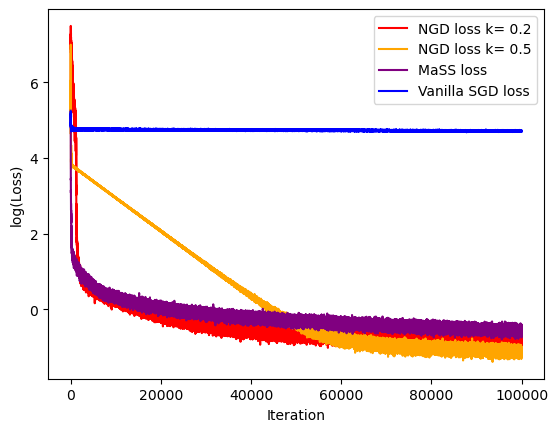

In [184]:
plt.plot(np.log10(Nesterov_losses_2), label = 'NGD loss k= 0.2', c = 'r')
plt.plot(np.log10(Nesterov_losses_5), label = 'NGD loss k= 0.5', c = 'orange')
plt.plot(np.log10(losses_mass), label = 'MaSS loss', c = 'purple')
plt.plot(np.log10(losses), label = 'Vanilla SGD loss', c = 'b' )
plt.xlabel('Iteration')
plt.ylabel('log(Loss)')
plt.legend()
plt.savefig('/Users/pantelistassopoulos/Documents/texfiles/Summer-Research-2023/images/3d-spin-model-neural-net-loss-d=5.png')

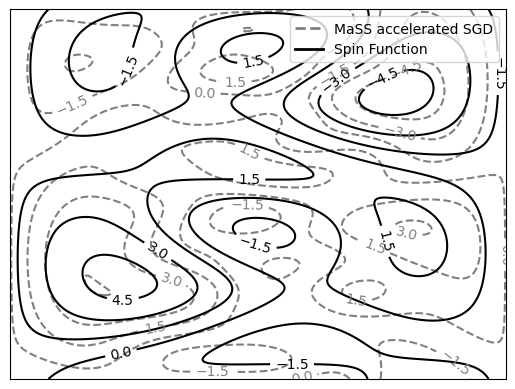

In [182]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

n = 256
x = np.linspace(0, np.pi, n)
y = np.linspace(0, 2 * np.pi, n)
X, Y = np.meshgrid(x, y)

# Assuming vneural_net_slice and vspin_func_slice are defined elsewhere

# Grey, dashed contour for vneural_net_slice
C = plt.contour(X, Y, vneural_net_slice(X, Y, c_mass, z_mass, d=5), 8, colors='grey', linestyles='dashed')
plt.clabel(C, inline=True, fontsize=10)

# Black, solid contour for vspin_func_slice
C2 = plt.contour(X, Y, vspin_func_slice(X, Y, a, d=5), 8, colors='black', linestyles='solid')
plt.clabel(C2, inline=True, fontsize=10)

# Create custom legend
custom_lines = [
    Line2D([0], [0], color='grey', lw=2, linestyle='--', label='MaSS accelerated SGD'),
    Line2D([0], [0], color='black', lw=2, linestyle='-', label='Spin Function')
]
plt.legend(handles=custom_lines, loc='upper right')

# Remove ticks for cleaner appearance
plt.xticks([])
plt.yticks([])
plt.savefig('/Users/pantelistassopoulos/Documents/3d-spin-model-neural-net-plot-d=5.png')

# Display the plot
plt.show()